In [44]:
import uproot
import matplotlib.pyplot as plt
import ROOT
from IPython.display import Image, display
import numpy as np
import mplhep as hep
import awkward as ak
hep.style.use("CMS")
import time
from concurrent.futures import ProcessPoolExecutor, as_completed
from hist import intervals
import matplotlib.patches as mpatches

#Building dictionary of realistic signal cross-sections from current limits
limitDict = {}
ggF_CS = 52.23 #pb
with uproot.open("EXO-23-13-ExoHiggsBRLimitvsLifetime.root") as file:
    masses = [55,40,30,23,15]
    for i in range(2,11,2):
        folder = file["Figure 4b"]
        plot = folder["Graph1D_y"+str(i)]
        x = plot.member("fX")
        y = plot.member("fY")
        mass = masses[int(i/2)-1]
        for j in range(len(x)):
            if((x[j]==1) or (x[j]==10)):
                key = f"Hto2Sto4D-cT{int(x[j])}-MS{mass}"
                y_lim = y[j]*ggF_CS
                if(y_lim>8): 
                    y_lim = 8
                limitDict[key] = y_lim / 8 #divide out 8 pb cross-section I used to normalize signals
print(limitDict)    
with uproot.open("EXO-19-13-RPVSUSYSigmaBSquaredLimitsMassvsLifetime.root") as file:
    folder = file["Figure 7b (right), grid of limit values"]
    lifetimes = [0.1,0.3,0.7,1,3,10]
    masses = [300,400,600,800]
    plot = folder["Hist2D_y1"]
    xbins = plot.to_numpy()[1]
    ybins = plot.to_numpy()[2]
    limits = plot.to_numpy()[0] #fb
    x_data_binned = np.digitize(lifetimes,xbins)
    x_data_binned = x_data_binned - 1
    y_data_binned = np.digitize(masses,ybins)
    y_data_binned = y_data_binned - 1   
    masses = [200] + masses
    for i in range(len(lifetimes)):
        limitArray = limits[[x_data_binned[i]]*len(y_data_binned),y_data_binned]
        slope = (limitArray[1] - limitArray[0]) / (400 - 300) 
        limit_200GeV = (slope * -100) + limitArray[0]
        limitArray = np.insert(limitArray,0,limit_200GeV)
        for j in range(len(masses)):
            key = ""
            if(lifetimes[i] == 0.1):
                key = f"Stop-M{masses[j]}-cT0p1"
            elif(lifetimes[i] == 0.3):
                key = f"Stop-M{masses[j]}-cT0p3"
            elif(lifetimes[i] == 0.7):
                key = f"Stop-M{masses[j]}-cT0p7"
            else:
                key = f"Stop-M{masses[j]}-cT{int(lifetimes[i])}"
            limitDict[key] = limitArray[j]
print(limitDict)


{'Hto2Sto4D-cT1-MS55': 0.07329174749999999, 'Hto2Sto4D-cT10-MS55': 0.0162983715, 'Hto2Sto4D-cT1-MS40': 0.08284330875, 'Hto2Sto4D-cT10-MS40': 0.017218272375, 'Hto2Sto4D-cT1-MS30': 0.1591317525, 'Hto2Sto4D-cT10-MS30': 0.025437315749999998, 'Hto2Sto4D-cT1-MS23': 0.35581034624999996, 'Hto2Sto4D-cT10-MS23': 0.04002515475, 'Hto2Sto4D-cT1-MS15': 1.0, 'Hto2Sto4D-cT10-MS15': 0.10010532374999999}
{'Hto2Sto4D-cT1-MS55': 0.07329174749999999, 'Hto2Sto4D-cT10-MS55': 0.0162983715, 'Hto2Sto4D-cT1-MS40': 0.08284330875, 'Hto2Sto4D-cT10-MS40': 0.017218272375, 'Hto2Sto4D-cT1-MS30': 0.1591317525, 'Hto2Sto4D-cT10-MS30': 0.025437315749999998, 'Hto2Sto4D-cT1-MS23': 0.35581034624999996, 'Hto2Sto4D-cT10-MS23': 0.04002515475, 'Hto2Sto4D-cT1-MS15': 1.0, 'Hto2Sto4D-cT10-MS15': 0.10010532374999999, 'Stop-M200-cT0p1': 33.6119, 'Stop-M300-cT0p1': 20.737, 'Stop-M400-cT0p1': 7.8621, 'Stop-M600-cT0p1': 3.1915, 'Stop-M800-cT0p1': 2.2403, 'Stop-M200-cT0p3': 6.1266003, 'Stop-M300-cT0p3': 3.6882, 'Stop-M400-cT0p3': 1.2498, 

In [1]:
with open("/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v10Reco/250304_225945/filelist.txt") as f:
    fileList_QCD1000to1200 = f.read().splitlines()
with open("/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v10Reco/250304_225952/filelist.txt") as f:
    fileList_QCD1200to1500 = f.read().splitlines()
with open("/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v10Reco/250304_230000/filelist.txt") as f:
    fileList_QCD1500to2000 = f.read().splitlines()
with open("/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v10Reco/250304_230008/filelist.txt") as f:
    fileList_QCD2000 = f.read().splitlines()
    

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v10Reco/250304_225932/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v10Reco/250304_225938/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v10Reco/250304_230017/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v10Reco/250304_230025/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v10Reco/250304_230032/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v10Reco/250304_230040/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": fileList_QCD1000to1200,
               "QCD1200to1500": fileList_QCD1200to1500,
               "QCD1500to2000": fileList_QCD1500to2000,
               "QCD2000": fileList_QCD2000}
                #"QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v10Reco/250304_225945/QCD-4Jets_Bin-HT-1000to1200.root"],
                #"QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v10Reco/250304_225952/QCD-4Jets_Bin-HT-1200to1500.root"],
                #"QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v10Reco/250304_230000/QCD-4Jets_Bin-HT-1500to2000.root"],
                #"QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v10Reco/250304_230008/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v10Reco/250304_225828/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v10Reco/250304_225846/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v10Reco/250304_225903/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v10Reco/250304_225920/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v10Reco/250304_225834/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v10Reco/250304_225852/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v10Reco/250304_225909/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v10Reco/250304_225926/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v10Reco/250304_225822/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v10Reco/250304_225839/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v10Reco/250304_225857/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v10Reco/250304_225915/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [2]:
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v10Scouting/250304_164853/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v10Scouting/250304_164901/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v10Scouting/250304_164943/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v10Scouting/250304_164952/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v10Scouting/250304_165000/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v10Scouting/250304_165009/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v10Scouting/250304_164909/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v10Scouting/250304_164917/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v10Scouting/250304_164926/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v10Scouting/250304_164935/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v10Scouting/250304_164731/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v10Scouting/250304_164754/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v10Scouting/250304_164816/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v10Scouting/250304_164838/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v10Scouting/250304_164738/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v10Scouting/250304_164802/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v10Scouting/250304_164823/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v10Scouting/250304_164845/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v10Scouting/250304_164722/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v10Scouting/250304_164746/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v10Scouting/250304_164809/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v10Scouting/250304_164830/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [2]:
#Global Tag 140X Loose Cut Samples
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v12GlobalTag140/250406_182644/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v12GlobalTag140/250406_182649/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v12GlobalTag140/250406_182723/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v12GlobalTag140/250406_182729/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v12GlobalTag140-Resubmit/250407_082848/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v12GlobalTag140/250406_182744/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v12GlobalTag140/250406_182656/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v12GlobalTag140-Resubmit/250407_090131/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v12GlobalTag140/250406_182709/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v12GlobalTag140/250406_182716/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v12GlobalTag140/250406_182531/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v12GlobalTag140/250406_182553/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v12GlobalTag140/250406_182614/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v12GlobalTag140/250406_182631/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v12GlobalTag140/250406_182539/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v12GlobalTag140/250406_182559/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v12GlobalTag140/250406_182620/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v12GlobalTag140/250406_182637/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v12GlobalTag140/250406_182523/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v12GlobalTag140/250406_182545/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v12GlobalTag140/250406_182607/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v12GlobalTag140/250406_182626/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [4]:
#Global Tag 140X 10% FPR Samples
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v12GlobalTag140-10TrackFPR/250408_093049/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v12GlobalTag140-10TrackFPR/250408_093100/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v12GlobalTag140-10TrackFPR/250408_093201/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v12GlobalTag140-10TrackFPR/250408_093218/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v12GlobalTag140-10TrackFPR/250408_093235/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v12GlobalTag140-10TrackFPR/250408_093251/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v12GlobalTag140-10TrackFPR/250408_093114/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v12GlobalTag140-10TrackFPR/250408_093126/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v12GlobalTag140-10TrackFPR/250408_093137/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v12GlobalTag140-10TrackFPR/250408_093149/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v12GlobalTag140-10TrackFPR/250408_092825/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v12GlobalTag140-10TrackFPR/250408_092911/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v12GlobalTag140-10TrackFPR/250408_092950/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v12GlobalTag140-10TrackFPR/250408_093025/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v12GlobalTag140-10TrackFPR/250408_092839/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v12GlobalTag140-10TrackFPR/250408_092924/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v12GlobalTag140-10TrackFPR/250408_093002/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v12GlobalTag140-10TrackFPR/250408_093036/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v12GlobalTag140-10TrackFPR/250408_092811/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v12GlobalTag140-10TrackFPR/250408_092854/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v12GlobalTag140-10TrackFPR/250408_092937/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v12GlobalTag140-10TrackFPR/250408_093014/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [24]:
#Global Tag 140X 5% FPR Samples
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v12GlobalTag140-5TrackFPR/250410_114224/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v12GlobalTag140-5TrackFPR/250410_114232/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v12GlobalTag140-5TrackFPR/250410_114330/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v12GlobalTag140-5TrackFPR/250410_114341/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v12GlobalTag140-5TrackFPR/250410_114351/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v12GlobalTag140-5TrackFPR/250410_114402/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v12GlobalTag140-5TrackFPR/250410_114243/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v12GlobalTag140-5TrackFPR/250410_114253/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v12GlobalTag140-5TrackFPR/250410_114309/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v12GlobalTag140-5TrackFPR/250410_114320/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v12GlobalTag140-5TrackFPR/250410_114040/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v12GlobalTag140-5TrackFPR/250410_114108/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v12GlobalTag140-5TrackFPR/250410_114137/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v12GlobalTag140-5TrackFPR/250410_114205/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v12GlobalTag140-5TrackFPR/250410_114049/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v12GlobalTag140-5TrackFPR/250410_114117/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v12GlobalTag140-5TrackFPR/250410_114146/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v12GlobalTag140-5TrackFPR/250410_114214/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v12GlobalTag140-5TrackFPR/250410_114031/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v12GlobalTag140-5TrackFPR/250410_114058/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v12GlobalTag140-5TrackFPR/250410_114127/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v12GlobalTag140-5TrackFPR/250410_114156/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [26]:
#Global Tag 140X 1% FPR Samples
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v12GlobalTag140-1TrackFPR/250413_102147/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v12GlobalTag140-1TrackFPR/250413_102153/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v12GlobalTag140-1TrackFPR/250413_102228/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v12GlobalTag140-1TrackFPR/250413_102235/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v12GlobalTag140-1TrackFPR/250413_102242/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v12GlobalTag140-1TrackFPR/250413_102249/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v12GlobalTag140-1TrackFPR/250413_102200/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v12GlobalTag140-1TrackFPR/250413_102207/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v12GlobalTag140-1TrackFPR/250413_102214/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v12GlobalTag140-1TrackFPR/250413_102221/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v12GlobalTag140-1TrackFPR/250413_102043/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v12GlobalTag140-1TrackFPR/250413_102100/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v12GlobalTag140-1TrackFPR/250413_102117/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v12GlobalTag140-1TrackFPR/250413_102135/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v12GlobalTag140-1TrackFPR/250413_102049/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v12GlobalTag140-1TrackFPR/250413_102106/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v12GlobalTag140-1TrackFPR/250413_102123/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v12GlobalTag140-1TrackFPR/250413_102140/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v12GlobalTag140-1TrackFPR/250413_102037/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v12GlobalTag140-1TrackFPR/250413_102055/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v12GlobalTag140-1TrackFPR/250413_102112/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v12GlobalTag140-1TrackFPR/250413_102129/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [9]:
#Global Tag 140X 15% FPR Samples
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v12GlobalTag140-15TrackFPR/250412_104115/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v12GlobalTag140-15TrackFPR/250412_104122/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v12GlobalTag140-15TrackFPR/250412_104158/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v12GlobalTag140-15TrackFPR/250412_104206/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v12GlobalTag140-15TrackFPR/250412_104213/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v12GlobalTag140-15TrackFPR/250412_104220/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v12GlobalTag140-15TrackFPR/250412_104129/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v12GlobalTag140-15TrackFPR/250412_104136/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v12GlobalTag140-15TrackFPR/250412_104144/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v12GlobalTag140-15TrackFPR/250412_104151/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v12GlobalTag140-15TrackFPR/250412_104007/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v12GlobalTag140-15TrackFPR/250412_104025/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v12GlobalTag140-15TrackFPR/250412_104045/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v12GlobalTag140-15TrackFPR/250412_104102/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v12GlobalTag140-15TrackFPR/250412_104013/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v12GlobalTag140-15TrackFPR/250412_104031/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v12GlobalTag140-15TrackFPR/250412_104050/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v12GlobalTag140-15TrackFPR/250412_104108/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v12GlobalTag140-15TrackFPR/250412_104001/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v12GlobalTag140-15TrackFPR/250412_104019/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v12GlobalTag140-15TrackFPR/250412_104038/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v12GlobalTag140-15TrackFPR/250412_104056/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [2]:
#Global Tag 140X 15% FPR More BG Stats Samples
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v12GlobalTag140-15TrackFPRMoreStats/250502_082216/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v12GlobalTag140-15TrackFPRMoreStats/250502_082305/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v12GlobalTag140-15TrackFPRMoreStats/250502_082341/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v12GlobalTag140-15TrackFPRMoreStats/250502_082348/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v12GlobalTag140-15TrackFPRMoreStats/250502_082355/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v12GlobalTag140-15TrackFPRMoreStats/250502_082402/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v12GlobalTag140-15TrackFPRMoreStats/250502_082312/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v12GlobalTag140-15TrackFPRMoreStats/250502_082319/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v12GlobalTag140-15TrackFPRMoreStats/250502_082326/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v12GlobalTag140-15TrackFPRMoreStats/250502_082334/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v12GlobalTag140-15TrackFPR/250412_104007/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v12GlobalTag140-15TrackFPR/250412_104025/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v12GlobalTag140-15TrackFPR/250412_104045/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v12GlobalTag140-15TrackFPR/250412_104102/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v12GlobalTag140-15TrackFPR/250412_104013/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v12GlobalTag140-15TrackFPR/250412_104031/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v12GlobalTag140-15TrackFPR/250412_104050/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v12GlobalTag140-15TrackFPR/250412_104108/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v12GlobalTag140-15TrackFPR/250412_104001/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v12GlobalTag140-15TrackFPR/250412_104019/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v12GlobalTag140-15TrackFPR/250412_104038/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v12GlobalTag140-15TrackFPR/250412_104056/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [91]:
#Global Tag 140X 15% FPR v13
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v13-15TrackFPR/250506_174000/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v13-15TrackFPR/250506_174012/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v13-15TrackFPR/250506_174200/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v13-15TrackFPR/250506_174211/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v13-15TrackFPR/250506_174223/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v13-15TrackFPR/250506_174256/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v13-15TrackFPR/250506_174025/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v13-15TrackFPR/250506_174038/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v13-15TrackFPR/250506_174126/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v13-15TrackFPR/250506_174147/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v13-15TrackFPR/250506_173811/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v13-15TrackFPR/250506_173840/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v13-15TrackFPR/250506_173908/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v13-15TrackFPR/250506_173938/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v13-15TrackFPR/250506_173821/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v13-15TrackFPR/250506_173850/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v13-15TrackFPR/250506_173919/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v13-15TrackFPR/250506_173949/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v13-15TrackFPR/250506_173800/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v13-15TrackFPR/250506_173830/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v13-15TrackFPR/250506_173859/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v13-15TrackFPR/250506_173928/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [4]:
#Global Tag 140X 15% FPR v13 MaxTrackVertSig4
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101308/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101316/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101404/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101414/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101423/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101432/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101326/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101335/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101344/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101353/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101135/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101200/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101225/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101249/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101143/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101209/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101233/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101258/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101126/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101152/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101217/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v13-15TrackFPR-MaxTrackVertSig4/250510_101241/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [6]:
#Global Tag 140X 15% FPR v13 MaxTrackVertSig6
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163650/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163658/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163756/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163804/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163813/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163821/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163707/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163715/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163739/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163747/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163525/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163548/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163610/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163633/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163533/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163555/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163617/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163641/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163518/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163541/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163603/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v13-15TrackFPR-MaxTrackVertSig6/250510_163625/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [8]:
#Global Tag 140X 15% FPR v13 MergeShared3
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v13-15TrackFPR-MergeShared3/250509_075901/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v13-15TrackFPR-MergeShared3/250509_075909/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v13-15TrackFPR-MergeShared3/250509_075954/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v13-15TrackFPR-MergeShared3/250509_080003/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v13-15TrackFPR-MergeShared3/250509_080012/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v13-15TrackFPR-MergeShared3/250509_080021/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v13-15TrackFPR-MergeShared3/250509_075918/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v13-15TrackFPR-MergeShared3/250509_075927/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v13-15TrackFPR-MergeShared3/250509_075936/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v13-15TrackFPR-MergeShared3/250509_075945/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v13-15TrackFPR-MergeShared3/250509_075727/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v13-15TrackFPR-MergeShared3/250509_075751/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v13-15TrackFPR-MergeShared3/250509_075815/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v13-15TrackFPR-MergeShared3/250509_075843/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v13-15TrackFPR-MergeShared3/250509_075736/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v13-15TrackFPR-MergeShared3/250509_075759/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v13-15TrackFPR-MergeShared3/250509_075825/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v13-15TrackFPR-MergeShared3/250509_075851/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v13-15TrackFPR-MergeShared3/250509_075716/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v13-15TrackFPR-MergeShared3/250509_075743/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v13-15TrackFPR-MergeShared3/250509_075807/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v13-15TrackFPR-MergeShared3/250509_075835/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [10]:
#Global Tag 140X 15% FPR v13 MergeShared5
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v13-15TrackFPR-MergeShared5/250508_092625/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v13-15TrackFPR-MergeShared5/250508_092632/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v13-15TrackFPR-MergeShared5/250508_092717/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v13-15TrackFPR-MergeShared5/250508_092725/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v13-15TrackFPR-MergeShared5/250508_092733/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v13-15TrackFPR-MergeShared5/250508_092742/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v13-15TrackFPR-MergeShared5/250508_092641/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v13-15TrackFPR-MergeShared5/250508_092649/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v13-15TrackFPR-MergeShared5/250508_092700/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v13-15TrackFPR-MergeShared5/250508_092709/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v13-15TrackFPR-MergeShared5/250508_092502/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v13-15TrackFPR-MergeShared5/250508_092524/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v13-15TrackFPR-MergeShared5/250508_092545/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v13-15TrackFPR-MergeShared5/250508_092609/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v13-15TrackFPR-MergeShared5/250508_092510/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v13-15TrackFPR-MergeShared5/250508_092531/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v13-15TrackFPR-MergeShared5/250508_092554/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v13-15TrackFPR-MergeShared5/250508_092616/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v13-15TrackFPR-MergeShared5/250508_092455/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v13-15TrackFPR-MergeShared5/250508_092517/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v13-15TrackFPR-MergeShared5/250508_092538/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v13-15TrackFPR-MergeShared5/250508_092602/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [12]:
#Global Tag 140X 15% FPR v13 MinTrackVertSig1
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090833/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090840/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090923/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090931/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090939/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090948/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090849/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090857/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090905/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090914/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090709/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090732/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090755/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090817/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090716/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090739/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090802/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090824/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090657/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090724/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090747/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v13-15TrackFPR-MinTrackVertSig1/250511_090809/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [14]:
#Global Tag 140X 15% FPR v13 MinTrackVertSig2
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071336/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071344/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071437/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071447/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071457/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071507/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071354/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071404/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071415/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071426/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071153/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071221/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071249/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071316/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071202/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071231/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071258/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071325/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071144/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071212/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071239/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v13-15TrackFPR-MinTrackVertSig2/250512_071307/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [17]:
#Global Tag 140X 15% FPR v13 MinTrackVertSig3
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071448/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071456/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071539/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071548/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071556/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071624/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071505/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071513/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071522/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071531/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071324/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071346/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071409/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071432/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071332/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071354/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071416/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071440/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071259/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071339/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071401/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v13-15TrackFPR-MinTrackVertSig3/250513_071424/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [53]:
#Global Tag 140X 15% FPR v14
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v14-15TrackFPR/250516_195527/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v14-15TrackFPR/250516_195535/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v14-15TrackFPR/250516_195617/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v14-15TrackFPR/250516_195626/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v14-15TrackFPR/250516_195634/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v14-15TrackFPR/250516_195643/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v14-15TrackFPR/250516_195543/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v14-15TrackFPR/250516_195552/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v14-15TrackFPR/250516_195600/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v14-15TrackFPR/250516_195609/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v14-15TrackFPR/250516_195403/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v14-15TrackFPR/250516_195426/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v14-15TrackFPR/250516_195449/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v14-15TrackFPR/250516_195511/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v14-15TrackFPR/250516_195411/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v14-15TrackFPR/250516_195433/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v14-15TrackFPR/250516_195456/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v14-15TrackFPR/250516_195518/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v14-15TrackFPR/250516_195355/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v14-15TrackFPR/250516_195418/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v14-15TrackFPR/250516_195441/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v14-15TrackFPR/250516_195503/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [57]:
#Global Tag 140X 15% FPR v14 3DErr0p005
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v14-15TrackFPR-3DErr0p005/250517_153544/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v14-15TrackFPR-3DErr0p005/250517_153552/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v14-15TrackFPR-3DErr0p005/250517_153635/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v14-15TrackFPR-3DErr0p005/250517_153644/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v14-15TrackFPR-3DErr0p005/250517_153653/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v14-15TrackFPR-3DErr0p005/250517_153701/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v14-15TrackFPR-3DErr0p005/250517_153601/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v14-15TrackFPR-3DErr0p005/250517_153609/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v14-15TrackFPR-3DErr0p005/250517_153618/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v14-15TrackFPR-3DErr0p005/250517_153626/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v14-15TrackFPR-3DErr0p005/250517_153412/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v14-15TrackFPR-3DErr0p005/250517_153435/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v14-15TrackFPR-3DErr0p005/250517_153501/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v14-15TrackFPR-3DErr0p005/250517_153528/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v14-15TrackFPR-3DErr0p005/250517_153420/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v14-15TrackFPR-3DErr0p005/250517_153443/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v14-15TrackFPR-3DErr0p005/250517_153509/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v14-15TrackFPR-3DErr0p005/250517_153535/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v14-15TrackFPR-3DErr0p005/250517_153405/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v14-15TrackFPR-3DErr0p005/250517_153428/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v14-15TrackFPR-3DErr0p005/250517_153451/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v14-15TrackFPR-3DErr0p005/250517_153516/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [2]:
#Global Tag 140X 15% FPR v14 Remove All at Once
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160640/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160651/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160751/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160803/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160815/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160828/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160703/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160716/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160728/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160739/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160436/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160510/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160545/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160618/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160446/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160521/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160556/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160629/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160426/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160456/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160534/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce/250518_160607/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [1]:
#Global Tag 140X 15% FPR v14 Remove All at Once No Chi2
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192305/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192313/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192404/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192414/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192424/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192433/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192323/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192333/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192343/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192353/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192113/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192152/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192219/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192246/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192123/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192201/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192227/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192255/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192101/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192143/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192210/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce-NoChi2/250518_192236/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [65]:
#Global Tag 140X 15% FPR v14 Remove All at Once 3DErr0p005
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084637/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084646/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084741/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084757/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084809/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084824/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084659/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084709/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084720/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084730/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084447/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084515/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084542/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084610/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084456/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084523/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084551/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084619/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084438/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084505/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084533/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce-3DErr0p005/250519_084600/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [37]:
#Global Tag 140X 20% FPR Samples
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v12GlobalTag140-20TrackFPR/250414_085758/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v12GlobalTag140-20TrackFPR/250414_085806/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v12GlobalTag140-20TrackFPR/250414_085851/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v12GlobalTag140-20TrackFPR/250414_085859/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v12GlobalTag140-20TrackFPR/250414_085907/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v12GlobalTag140-20TrackFPR/250414_085915/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v12GlobalTag140-20TrackFPR/250414_085814/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v12GlobalTag140-20TrackFPR/250414_085823/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v12GlobalTag140-20TrackFPR/250414_085833/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v12GlobalTag140-20TrackFPR/250414_085842/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v12GlobalTag140-20TrackFPR/250414_085637/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v12GlobalTag140-20TrackFPR/250414_085659/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v12GlobalTag140-20TrackFPR/250414_085719/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v12GlobalTag140-20TrackFPR/250414_085741/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v12GlobalTag140-20TrackFPR/250414_085644/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v12GlobalTag140-20TrackFPR/250414_085706/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v12GlobalTag140-20TrackFPR/250414_085727/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v12GlobalTag140-20TrackFPR/250414_085749/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v12GlobalTag140-20TrackFPR/250414_085555/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v12GlobalTag140-20TrackFPR/250414_085652/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v12GlobalTag140-20TrackFPR/250414_085713/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v12GlobalTag140-20TrackFPR/250414_085734/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v12GlobalTag140-20TrackFPR/250414_184354/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v12GlobalTag140-20TrackFPR/250414_184317/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v12GlobalTag140-20TrackFPR/250414_184402/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v12GlobalTag140-20TrackFPR/250414_184347/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v12GlobalTag140-20TrackFPR/250414_184339/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v12GlobalTag140-20TrackFPR/250415_201029/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v12GlobalTag140-20TrackFPR/250414_184325/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v12GlobalTag140-20TrackFPR/250414_184300/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v12GlobalTag140-20TrackFPR/250414_184222/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v12GlobalTag140-20TrackFPR/250414_184308/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v12GlobalTag140-20TrackFPR/250414_184252/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v12GlobalTag140-20TrackFPR/250414_184244/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v12GlobalTag140-20TrackFPR/250414_184237/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v12GlobalTag140-20TrackFPR/250414_184229/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"]
             }

In [35]:
#20 % FPR Track Selection Samples
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v11Scout20TrackFPR/250321_155620/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v11Scout20TrackFPR/250321_155626/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v11Scout20TrackFPR/250321_155706/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v11Scout20TrackFPR/250321_155714/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v11Scout20TrackFPR/250321_155723/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v11Scout20TrackFPR/250321_155731/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v11Scout20TrackFPR/250321_155634/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v11Scout20TrackFPR/250321_155641/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v11Scout20TrackFPR/250321_155649/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v11Scout20TrackFPR/250321_155657/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v11Scout20TrackFPR/250321_155503/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v11Scout20TrackFPR/250321_155523/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v11Scout20TrackFPR/250321_155543/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v11Scout20TrackFPR/250321_155604/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v11Scout20TrackFPR/250321_155510/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v11Scout20TrackFPR/250321_155529/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v11Scout20TrackFPR/250321_155550/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v11Scout20TrackFPR/250321_155611/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v11Scout20TrackFPR/250321_155456/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v11Scout20TrackFPR/250321_155517/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v11Scout20TrackFPR/250321_155536/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v11Scout20TrackFPR/250321_155556/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [4]:
#30 % FPR Track Selection Samples
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v11Scout30TrackFPR/250323_123549/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v11Scout30TrackFPR/250323_123555/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v11Scout30TrackFPR/250323_123630/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v11Scout30TrackFPR/250323_123637/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v11Scout30TrackFPR/250323_123645/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v11Scout30TrackFPR/250323_123652/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v11Scout30TrackFPR/250323_123602/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v11Scout30TrackFPR/250323_123609/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v11Scout30TrackFPR/250323_123615/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v11Scout30TrackFPR/250323_123623/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v11Scout30TrackFPR/250323_123442/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v11Scout30TrackFPR/250323_123459/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v11Scout30TrackFPR/250323_123518/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v11Scout30TrackFPR/250323_123536/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v11Scout30TrackFPR/250323_123448/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v11Scout30TrackFPR/250323_123505/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v11Scout30TrackFPR/250323_123523/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v11Scout30TrackFPR/250323_123542/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v11Scout30TrackFPR/250323_123435/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v11Scout30TrackFPR/250323_123454/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v11Scout30TrackFPR/250323_123512/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v11Scout30TrackFPR/250323_123530/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [5]:
#10 % FPR Track Selection Samples
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v11Scout10TrackFPR/250323_200428/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v11Scout10TrackFPR/250323_200434/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v11Scout10TrackFPR/250323_200507/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v11Scout10TrackFPR/250323_200513/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v11Scout10TrackFPR/250323_200520/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v11Scout10TrackFPR/250323_200527/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v11Scout10TrackFPR/250323_200441/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v11Scout10TrackFPR/250323_200447/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v11Scout10TrackFPR/250323_200454/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v11Scout10TrackFPR/250323_200500/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v11Scout10TrackFPR/250323_200326/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v11Scout10TrackFPR/250323_200343/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v11Scout10TrackFPR/250323_200400/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v11Scout10TrackFPR/250323_200416/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v11Scout10TrackFPR/250323_200332/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v11Scout10TrackFPR/250323_200349/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v11Scout10TrackFPR/250323_200405/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v11Scout10TrackFPR/250323_200422/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v11Scout10TrackFPR/250323_200320/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v11Scout10TrackFPR/250323_200338/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v11Scout10TrackFPR/250323_200355/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v11Scout10TrackFPR/250323_200411/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [2]:
#Global Tag 140X 15% FPR v14 Remove All at Once More Stats
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_150843/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_150852/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_150945/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_150956/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_151006/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_151018/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_150903/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_150914/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_150924/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_150934/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_150654/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_150725/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_150754/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_150823/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_150703/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_150735/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_150804/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_150832/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_150645/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_150713/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_150745/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats/250520_150813/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [24]:
#Global Tag 140X 15% FPR v14 Remove All at Once Next 25 Million Events
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134624/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134643/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134808/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134823/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134839/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134855/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134659/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134715/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134734/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134751/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134317/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134401/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134451/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134551/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134330/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134416/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134508/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134608/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134305/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134344/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134433/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce-Next25M/250623_134524/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [6]:
#Global Tag 140X 15% FPR v14 Remove All at Once Min dBV 0.01 cm
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_123837/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_123852/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_124011/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_124025/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_124042/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_124057/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_123909/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_123925/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_123939/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_123955/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_123515/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_123602/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_123658/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_123804/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_123530/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_123619/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_123720/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_123821/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_123458/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_123546/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_123638/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_123740/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [2]:
#v15 More Stats
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v15-MoreStats/250703_093551/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v15-MoreStats/250703_093607/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v15-MoreStats/250703_093717/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v15-MoreStats/250703_093733/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v15-MoreStats/250703_093747/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v15-MoreStats/250703_093915/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v15-MoreStats/250703_093623/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v15-MoreStats/250703_093637/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v15-MoreStats/250703_093651/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v15-MoreStats/250703_093704/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v15-MoreStats/250703_093238/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v15-MoreStats/250703_093335/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v15-MoreStats/250703_093444/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v15-MoreStats/250703_093520/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v15-MoreStats/250703_093254/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v15-MoreStats/250703_093414/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v15-MoreStats/250703_093455/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v15-MoreStats/250703_093536/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v15-MoreStats/250703_093220/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v15-MoreStats/250703_093310/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v15-MoreStats/250703_093430/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v15-MoreStats/250703_093505/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [3]:
#v15 Next 25M
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v15-Next25M/250708_123434/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v15-Next25M/250708_123447/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v15-Next25M/250708_123603/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v15-Next25M/250708_123616/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v15-Next25M/250708_123628/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v15-Next25M/250708_123640/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v15-Next25M/250708_123502/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v15-Next25M/250708_123518/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v15-Next25M/250708_123537/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v15-Next25M/250708_123550/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v15-Next25M/250708_123224/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v15-Next25M/250708_123257/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v15-Next25M/250708_123329/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v15-Next25M/250708_123409/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v15-Next25M/250708_123235/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v15-Next25M/250708_123307/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v15-Next25M/250708_123340/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v15-Next25M/250708_123422/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v15-Next25M/250708_123214/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v15-Next25M/250708_123245/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v15-Next25M/250708_123318/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v15-Next25M/250708_123354/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [9]:
#v15 Re HLT ptMin 0.8
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v15_ReHLT_ptMin0p8/250722_161043/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v15_ReHLT_ptMin0p8/250722_161123/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v15_ReHLT_ptMin0p8/250722_161201/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v15_ReHLT_ptMin0p8/250722_161238/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v15_ReHLT_ptMin0p8/250722_161101/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v15_ReHLT_ptMin0p8/250722_161136/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v15_ReHLT_ptMin0p8/250722_161214/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v15_ReHLT_ptMin0p8/250722_161249/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v15_ReHLT_ptMin0p8/250722_161015/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v15_ReHLT_ptMin0p8/250722_161112/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v15_ReHLT_ptMin0p8/250722_161148/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v15_ReHLT_ptMin0p8/250722_161226/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [11]:
#v15 125M
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v15-125M/250723_150653/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v15-125M/250723_150707/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v15-125M/250723_150910/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v15-125M/250723_150926/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v15-125M/250723_150941/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v15-125M/250723_150957/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v15-125M/250723_150723/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v15-125M/250723_150738/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v15-125M/250723_150834/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v15-125M/250723_150853/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v15-125M/250723_150354/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v15-125M/250723_150436/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v15-125M/250723_150521/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v15-125M/250723_150622/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v15-125M/250723_150407/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v15-125M/250723_150455/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v15-125M/250723_150539/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v15-125M/250723_150638/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v15-125M/250723_150341/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v15-125M/250723_150420/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v15-125M/250723_150507/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v15-125M/250723_150608/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [1]:
#Data v9
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/bruno_test/DataVsBG_30M_v9/BG/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/ScoutingBG_Summer24_TTbar_FullyHadronic_30Mevts_v9/250714_175617/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/bruno_test/DataVsBG_30M_v9/BG/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/ScoutingBG_Summer24_TTbar_SemiLeptonic_30Mevts_v9/250714_175719/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/bruno_test/DataVsBG_30M_v9/BG/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/ScoutingBG_Summer24_QCD_200to400_30Mevts_v9/250714_175135/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/bruno_test/DataVsBG_30M_v9/BG/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/ScoutingBG_Summer24_QCD_400to600_30Mevts_v9/250714_175143/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/bruno_test/DataVsBG_30M_v9/BG/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/ScoutingBG_Summer24_QCD_600to800_30Mevts_v9/250714_175150/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/bruno_test/DataVsBG_30M_v9/BG/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/ScoutingBG_Summer24_QCD_800to1000_30Mevts_v9/250714_175158/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/bruno_test/DataVsBG_30M_v9/BG/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/ScoutingBG_Summer24_QCD_1000to1200_30Mevts_v9/250714_175206/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/bruno_test/DataVsBG_30M_v9/BG/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/ScoutingBG_Summer24_QCD_1200to1500_30Mevts_v9/250714_175214/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/bruno_test/DataVsBG_30M_v9/BG/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/ScoutingBG_Summer24_QCD_1500to2000_30Mevts_v9/250714_175221/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/bruno_test/DataVsBG_30M_v9/BG/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/ScoutingBG_Summer24_QCD_2000_30Mevts_v9/250714_175228/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"2024H": ["/eos/cms/store/group/phys_exotica/DVScouting/bruno_test/DataVsBG_30M_v9/Data/ScoutingPFRun3/ScoutingData_2024H_30Mevts_v9/250714_184505/ScoutingData_2024H.root"]
             }

In [4]:
#v16-30M
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v16-30M/250728_141526/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v16-30M/250728_141539/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v16-30M/250728_141650/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v16-30M/250728_141704/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v16-30M/250728_141727/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v16-30M/250728_141742/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v16-30M/250728_141555/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v16-30M/250728_141610/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v16-30M/250728_141623/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v16-30M/250728_141637/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v16-30M/250728_141255/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v16-30M/250728_141335/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v16-30M/250728_141417/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v16-30M/250728_141458/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v16-30M/250728_141309/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v16-30M/250728_141349/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v16-30M/250728_141429/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v16-30M/250728_141511/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v16-30M/250728_141242/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v16-30M/250728_141321/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v16-30M/250728_141403/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v16-30M/250728_141445/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [2]:
#v16-30M 2.5 to 5 Dxy
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v16-30M-2p5To5Dxy/250730_094820/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v16-30M-2p5To5Dxy/250730_094832/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v16-30M-2p5To5Dxy/250730_094953/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v16-30M-2p5To5Dxy/250730_095009/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v16-30M-2p5To5Dxy/250730_095023/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v16-30M-2p5To5Dxy/250730_095037/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v16-30M-2p5To5Dxy/250730_094845/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v16-30M-2p5To5Dxy/250730_094909/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v16-30M-2p5To5Dxy/250730_094923/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v16-30M-2p5To5Dxy/250730_094939/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v16-30M-2p5To5Dxy/250730_094549/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v16-30M-2p5To5Dxy/250730_094628/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v16-30M-2p5To5Dxy/250730_094711/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v16-30M-2p5To5Dxy/250730_094749/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v16-30M-2p5To5Dxy/250730_094602/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v16-30M-2p5To5Dxy/250730_094640/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v16-30M-2p5To5Dxy/250730_094724/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v16-30M-2p5To5Dxy/250730_094806/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v16-30M-2p5To5Dxy/250730_094527/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v16-30M-2p5To5Dxy/250730_094615/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v16-30M-2p5To5Dxy/250730_094652/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v16-30M-2p5To5Dxy/250730_094737/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [2]:
#v17-4TrackMin
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v17-4TrackMin/250807_110806/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v17-4TrackMin/250807_110817/TTtoLNu2Q.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v17-4TrackMin/250807_110921/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v17-4TrackMin/250807_110933/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v17-4TrackMin/250807_110944/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v17-4TrackMin/250807_110955/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v17-4TrackMin/250807_110834/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v17-4TrackMin/250807_110846/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v17-4TrackMin/250807_110858/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v17-4TrackMin/250807_110909/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v17-4TrackMin/250807_110612/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v17-4TrackMin/250807_110643/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v17-4TrackMin/250807_110714/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v17-4TrackMin/250807_110744/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v17-4TrackMin/250807_110623/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v17-4TrackMin/250807_110654/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v17-4TrackMin/250807_110724/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v17-4TrackMin/250807_110755/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v17-4TrackMin/250807_110601/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v17-4TrackMin/250807_110633/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v17-4TrackMin/250807_110704/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v17-4TrackMin/250807_110734/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [16]:
#v18-4TrackMin 125M 2.5 to 5.0 dxy significance
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v18-4TrackMin/250819_185502/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v18-4TrackMin/250819_185512/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v18-4TrackMin/250901_194204/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v18-4TrackMin/250901_194538/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v18-4TrackMin/250901_194556/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v18-4TrackMin/250819_185604/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v18-4TrackMin/250819_185615/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v18-4TrackMin/250819_185626/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v18-4TrackMin/250819_185636/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v18-4TrackMin/250819_185522/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v18-4TrackMin/250819_185533/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v18-4TrackMin/250819_185543/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v18-4TrackMin/250819_185554/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v18-4TrackMin/250819_185313/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v18-4TrackMin/250819_185345/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v18-4TrackMin/250819_185416/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v18-4TrackMin/250819_185442/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v18-4TrackMin/250819_185323/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v18-4TrackMin/250819_185356/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v18-4TrackMin/250819_185425/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v18-4TrackMin/250819_185452/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v18-4TrackMin/250819_185302/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v18-4TrackMin/250819_185331/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v18-4TrackMin/250819_185405/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v18-4TrackMin/250819_185433/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [2]:
#v18-PileupNoSelectionGenWeights
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v18-PileupNoSelectionGenWeights/250824_144654/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v18-PileupNoSelectionGenWeights/250824_144703/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v18-PileupNoSelectionGenWeights/250901_195225/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v18-PileupNoSelectionGenWeights/250901_195244/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v18-PileupNoSelectionGenWeights/250901_195301/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v18-PileupNoSelectionGenWeights/250824_144756/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v18-PileupNoSelectionGenWeights/250824_144806/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v18-PileupNoSelectionGenWeights/250824_144817/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v18-PileupNoSelectionGenWeights/250824_144828/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v18-PileupNoSelectionGenWeights/250824_144714/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v18-PileupNoSelectionGenWeights/250824_144724/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v18-PileupNoSelectionGenWeights/250824_144735/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v18-PileupNoSelectionGenWeights/250824_144745/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v18-PileupNoSelectionGenWeights/250824_144902/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v18-PileupNoSelectionGenWeights/250824_144930/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v18-PileupNoSelectionGenWeights/250824_144958/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v18-PileupNoSelectionGenWeights/250824_145025/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v18-PileupNoSelectionGenWeights/250824_144912/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v18-PileupNoSelectionGenWeights/250824_144939/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v18-PileupNoSelectionGenWeights/250824_145007/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v18-PileupNoSelectionGenWeights/250824_145034/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v18-PileupNoSelectionGenWeights/250824_144853/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v18-PileupNoSelectionGenWeights/250824_144921/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v18-PileupNoSelectionGenWeights/250824_144948/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v18-PileupNoSelectionGenWeights/250824_145016/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [2]:
#v18-4TrackMin-5DxyMin 125M
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v18-4TrackMin-5DxyMin/250902_192505/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v18-4TrackMin-5DxyMin/250902_192515/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v18-4TrackMin-5DxyMin/250902_192703/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v18-4TrackMin-5DxyMin/250902_192715/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v18-4TrackMin-5DxyMin/250902_192727/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v18-4TrackMin-5DxyMin/250902_192615/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v18-4TrackMin-5DxyMin/250902_192627/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v18-4TrackMin-5DxyMin/250902_192639/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v18-4TrackMin-5DxyMin/250902_192651/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v18-4TrackMin-5DxyMin/250902_192528/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v18-4TrackMin-5DxyMin/250902_192540/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v18-4TrackMin-5DxyMin/250902_192552/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v18-4TrackMin-5DxyMin/250902_192603/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v18-4TrackMin-5DxyMin/250902_192832/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v18-4TrackMin-5DxyMin/250902_192904/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v18-4TrackMin-5DxyMin/250902_192937/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v18-4TrackMin-5DxyMin/250902_193008/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v18-4TrackMin-5DxyMin/250902_192843/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v18-4TrackMin-5DxyMin/250902_192915/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v18-4TrackMin-5DxyMin/250902_192947/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v18-4TrackMin-5DxyMin/250902_193018/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v18-4TrackMin-5DxyMin/250902_192822/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v18-4TrackMin-5DxyMin/250902_192853/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v18-4TrackMin-5DxyMin/250902_192925/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v18-4TrackMin-5DxyMin/250902_192957/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"]
             }

In [2]:
#v20 5 Dxy Min
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v20-5DxyMin/250923_013932/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v20-5DxyMin/250923_013941/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v20-5DxyMin/250923_014125/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v20-5DxyMin/250923_014140/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v20-5DxyMin/250923_014151/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v20-5DxyMin/250923_014038/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v20-5DxyMin/250923_014050/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v20-5DxyMin/250923_014101/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v20-5DxyMin/250923_014113/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v20-5DxyMin/250923_013952/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v20-5DxyMin/250923_014004/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v20-5DxyMin/250923_014015/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v20-5DxyMin/250923_014027/QCD-4Jets_Bin-HT-2000.root"]}
signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v20-5DxyMin/250923_014214/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v20-5DxyMin/250923_014241/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v20-5DxyMin/250923_014306/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v20-5DxyMin/250923_014333/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v20-5DxyMin/250923_014223/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v20-5DxyMin/250923_014249/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v20-5DxyMin/250923_014316/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v20-5DxyMin/250923_014342/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v20-5DxyMin/250923_014206/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v20-5DxyMin/250923_014232/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v20-5DxyMin/250923_014258/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v20-5DxyMin/250923_014325/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v20-5DxyMin/250925_182845/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v20-5DxyMin/250925_182835/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v20-5DxyMin/250925_182900/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v20-5DxyMin/250925_182912/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v20-5DxyMin/250925_182922/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v20-5DxyMin/250925_182933/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v20-5DxyMin/250925_182943/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v20-5DxyMin/250924_173027/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v20-5DxyMin/250924_172948/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v20-5DxyMin/250924_173035/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v20-5DxyMin/250924_173019/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v20-5DxyMin/250924_173012/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v20-5DxyMin/250924_173004/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v20-5DxyMin/250924_172956/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v20-5DxyMin/250924_172932/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v20-5DxyMin/250924_172850/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v20-5DxyMin/250924_172940/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v20-5DxyMin/250924_172923/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v20-5DxyMin/250924_172915/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v20-5DxyMin/250924_172907/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v20-5DxyMin/250924_172859/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
              "Hto2Sto4B-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4B_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4B_Par-ctauS-0p1-MH-125-MS-15_Tree_v20-5DxyMin/250925_183540/GluGluH-Hto2Sto4B_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4B-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4B_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4B_Par-ctauS-0p1-MH-125-MS-23_Tree_v20-5DxyMin/250925_183525/GluGluH-Hto2Sto4B_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4B-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4B_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4B_Par-ctauS-0p1-MH-125-MS-30_Tree_v20-5DxyMin/250925_183518/GluGluH-Hto2Sto4B_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4B-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4B_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4B_Par-ctauS-0p1-MH-125-MS-40_Tree_v20-5DxyMin/250925_183511/GluGluH-Hto2Sto4B_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4B-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4B_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4B_Par-ctauS-0p1-MH-125-MS-55_Tree_v20-5DxyMin/250925_183504/GluGluH-Hto2Sto4B_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4B-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4B_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4B_Par-ctauS-1-MH-125-MS-15_Tree_v20-5DxyMin/250925_183451/GluGluH-Hto2Sto4B_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4B-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4B_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4B_Par-ctauS-1-MH-125-MS-23_Tree_v20-5DxyMin/250925_183438/GluGluH-Hto2Sto4B_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4B-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4B_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4B_Par-ctauS-1-MH-125-MS-30_Tree_v20-5DxyMin/250925_183431/GluGluH-Hto2Sto4B_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4B-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4B_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4B_Par-ctauS-1-MH-125-MS-40_Tree_v20-5DxyMin/250925_183424/GluGluH-Hto2Sto4B_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4B-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4B_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4B_Par-ctauS-1-MH-125-MS-55_Tree_v20-5DxyMin/250925_183417/GluGluH-Hto2Sto4B_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4B-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4B_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4B_Par-ctauS-10-MH-125-MS-15_Tree_v20-5DxyMin/250925_183403/GluGluH-Hto2Sto4B_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4B-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4B_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4B_Par-ctauS-10-MH-125-MS-23_Tree_v20-5DxyMin/250925_183350/GluGluH-Hto2Sto4B_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4B-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4B_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4B_Par-ctauS-10-MH-125-MS-30_Tree_v20-5DxyMin/250925_183343/GluGluH-Hto2Sto4B_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4B-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4B_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4B_Par-ctauS-10-MH-125-MS-40_Tree_v20-5DxyMin/250925_183336/GluGluH-Hto2Sto4B_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4B-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4B_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4B_Par-ctauS-10-MH-125-MS-55_Tree_v20-5DxyMin/250925_183329/GluGluH-Hto2Sto4B_Par-ctauS-10-MH-125-MS-55.root"]
             }


In [12]:
#v21 5 Dxy Min

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v21-5DxyMin/251008_133121/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v21-5DxyMin/251008_133130/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v21-5DxyMin/251008_133303/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v21-5DxyMin/251008_133313/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v21-5DxyMin/251008_133323/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v21-5DxyMin/251008_133222/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v21-5DxyMin/251008_133232/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v21-5DxyMin/251008_133242/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v21-5DxyMin/251008_133252/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v21-5DxyMin/251008_133140/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v21-5DxyMin/251008_133151/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v21-5DxyMin/251008_133201/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v21-5DxyMin/251008_133212/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v21-5DxyMin/251007_212144/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v21-5DxyMin/251007_212203/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v21-5DxyMin/251007_212222/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v21-5DxyMin/251007_212242/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v21-5DxyMin/251007_212150/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v21-5DxyMin/251007_212209/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v21-5DxyMin/251007_212228/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v21-5DxyMin/251007_212250/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v21-5DxyMin/251007_212137/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v21-5DxyMin/251007_212157/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v21-5DxyMin/251007_212216/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v21-5DxyMin/251007_212235/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v21-5DxyMin/251007_212634/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v21-5DxyMin/251007_212601/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v21-5DxyMin/251007_212641/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v21-5DxyMin/251007_212628/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v21-5DxyMin/251007_212621/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v21-5DxyMin/251007_212614/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v21-5DxyMin/251007_212608/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v21-5DxyMin/251007_212547/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v21-5DxyMin/251007_212515/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v21-5DxyMin/251007_212554/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v21-5DxyMin/251007_212541/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v21-5DxyMin/251007_212534/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v21-5DxyMin/251007_212528/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v21-5DxyMin/251007_212521/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v21-5DxyMin/251007_212501/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v21-5DxyMin/251007_212428/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v21-5DxyMin/251007_212508/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v21-5DxyMin/251007_212455/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v21-5DxyMin/251007_212449/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v21-5DxyMin/251007_212442/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v21-5DxyMin/251007_212435/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [2]:
#v21 5 Dxy Min 2 Jet Min 3 Track Min

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v21-5DxyMin-2Jet3Track/251008_223909/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v21-5DxyMin-2Jet3Track/251008_223915/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v21-5DxyMin-2Jet3Track/251008_224032/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v21-5DxyMin-2Jet3Track/251008_224041/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v21-5DxyMin-2Jet3Track/251008_224049/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v21-5DxyMin-2Jet3Track/251008_223959/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v21-5DxyMin-2Jet3Track/251008_224007/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v21-5DxyMin-2Jet3Track/251008_224016/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v21-5DxyMin-2Jet3Track/251008_224024/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v21-5DxyMin-2Jet3Track/251008_223923/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v21-5DxyMin-2Jet3Track/251008_223932/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v21-5DxyMin-2Jet3Track/251008_223941/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v21-5DxyMin-2Jet3Track/251008_223950/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v21-5DxyMin-2Jet3Track/251008_223734/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v21-5DxyMin-2Jet3Track/251008_223754/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v21-5DxyMin-2Jet3Track/251008_223813/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v21-5DxyMin-2Jet3Track/251008_223831/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v21-5DxyMin-2Jet3Track/251008_223740/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v21-5DxyMin-2Jet3Track/251008_223800/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v21-5DxyMin-2Jet3Track/251008_223819/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v21-5DxyMin-2Jet3Track/251008_223837/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v21-5DxyMin-2Jet3Track/251008_223728/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v21-5DxyMin-2Jet3Track/251008_223747/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v21-5DxyMin-2Jet3Track/251008_223807/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v21-5DxyMin-2Jet3Track/251008_223825/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v21-5DxyMin-2Jet3Track/251008_223653/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v21-5DxyMin-2Jet3Track/251008_223621/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v21-5DxyMin-2Jet3Track/251008_223659/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v21-5DxyMin-2Jet3Track/251008_223646/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v21-5DxyMin-2Jet3Track/251008_223639/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v21-5DxyMin-2Jet3Track/251008_223633/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v21-5DxyMin-2Jet3Track/251008_223627/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v21-5DxyMin-2Jet3Track/251008_223608/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v21-5DxyMin-2Jet3Track/251008_223537/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v21-5DxyMin-2Jet3Track/251008_223614/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v21-5DxyMin-2Jet3Track/251008_223602/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v21-5DxyMin-2Jet3Track/251008_223556/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v21-5DxyMin-2Jet3Track/251008_223549/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v21-5DxyMin-2Jet3Track/251008_223543/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v21-5DxyMin-2Jet3Track/251008_223524/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v21-5DxyMin-2Jet3Track/251008_223452/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v21-5DxyMin-2Jet3Track/251008_223530/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v21-5DxyMin-2Jet3Track/251008_223517/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v21-5DxyMin-2Jet3Track/251008_223511/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v21-5DxyMin-2Jet3Track/251008_223505/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v21-5DxyMin-2Jet3Track/251008_223458/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [8]:
#v21-PileupNoSelectionGenWeights, 6 million events per sample

processDict = {}

signalDict = {
    "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v21-PileupNoSelectionGenWeights/251027_172728/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
    "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v21-PileupNoSelectionGenWeights/251027_172659/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
    "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v21-PileupNoSelectionGenWeights/251027_172734/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
    "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v21-PileupNoSelectionGenWeights/251027_172722/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
    "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v21-PileupNoSelectionGenWeights/251027_172717/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
    "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v21-PileupNoSelectionGenWeights/251027_172710/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
    "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v21-PileupNoSelectionGenWeights/251027_172704/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
    "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v21-PileupNoSelectionGenWeights/251027_172647/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
    "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v21-PileupNoSelectionGenWeights/251027_172617/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
    "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v21-PileupNoSelectionGenWeights/251027_172653/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
    "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v21-PileupNoSelectionGenWeights/251027_172640/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
    "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v21-PileupNoSelectionGenWeights/251027_172634/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
    "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v21-PileupNoSelectionGenWeights/251027_172629/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
    "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v21-PileupNoSelectionGenWeights/251027_172623/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
    "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v21-PileupNoSelectionGenWeights/251027_172605/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
    "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v21-PileupNoSelectionGenWeights/251027_172533/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
    "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v21-PileupNoSelectionGenWeights/251027_172611/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
    "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v21-PileupNoSelectionGenWeights/251027_172559/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
    "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v21-PileupNoSelectionGenWeights/251027_172552/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
    "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v21-PileupNoSelectionGenWeights/251027_172546/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
    "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v21-PileupNoSelectionGenWeights/251027_172540/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
}

In [ ]:
#Empty cell for copy paste

processDict = {"TTTo4Q": ["/TTto4Q.root"],
               "TTToLNu2Q": ["/TTtoLNu2Q.root"],
               "QCD40to70": ["/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Stop-M200-cT0p1": ["/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M400-cT0p1": ["/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M600-cT0p1": ["/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M800-cT0p1": ["/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M200-cT0p3": ["/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M400-cT0p3": ["/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M600-cT0p3": ["/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M800-cT0p3": ["/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M200-cT0p7": ["/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M400-cT0p7": ["/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M600-cT0p7": ["/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M800-cT0p7": ["/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [9]:
#v22 Loose Track Cuts 

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v22-LooseTrackCuts/251107_195457/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-LooseTrackCuts/251107_195505/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v22-LooseTrackCuts/251107_195637/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v22-LooseTrackCuts/251107_195647/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v22-LooseTrackCuts/251107_195657/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v22-LooseTrackCuts/251107_195558/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v22-LooseTrackCuts/251107_195607/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v22-LooseTrackCuts/251107_195617/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v22-LooseTrackCuts/251107_195626/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v22-LooseTrackCuts/251107_195516/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v22-LooseTrackCuts/251107_195526/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v22-LooseTrackCuts/251107_195536/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v22-LooseTrackCuts/251107_195546/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v22-LooseTrackCuts/251107_200141/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v22-LooseTrackCuts/251107_200208/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v22-LooseTrackCuts/251107_200235/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v22-LooseTrackCuts/251107_200301/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v22-LooseTrackCuts/251107_200149/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v22-LooseTrackCuts/251107_200217/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v22-LooseTrackCuts/251107_200244/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v22-LooseTrackCuts/251107_200310/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v22-LooseTrackCuts/251107_200132/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v22-LooseTrackCuts/251107_200159/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v22-LooseTrackCuts/251107_200226/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v22-LooseTrackCuts/251107_200253/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v22-LooseTrackCuts/251107_200103/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v22-LooseTrackCuts/251107_200017/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v22-LooseTrackCuts/251107_200112/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v22-LooseTrackCuts/251107_200054/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v22-LooseTrackCuts/251107_200044/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v22-LooseTrackCuts/251107_200035/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v22-LooseTrackCuts/251107_200026/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v22-LooseTrackCuts/251107_195959/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v22-LooseTrackCuts/251107_195910/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v22-LooseTrackCuts/251107_200008/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v22-LooseTrackCuts/251107_195950/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v22-LooseTrackCuts/251107_195938/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v22-LooseTrackCuts/251107_195928/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v22-LooseTrackCuts/251107_195919/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v22-LooseTrackCuts/251107_195852/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v22-LooseTrackCuts/251107_195807/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v22-LooseTrackCuts/251107_195901/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v22-LooseTrackCuts/251107_195843/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v22-LooseTrackCuts/251107_195834/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v22-LooseTrackCuts/251107_195825/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v22-LooseTrackCuts/251107_195816/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [2]:
#v22 5 FPR

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v22-5FPR/251118_234051/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-5FPR/251118_234057/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v22-5FPR/251118_234230/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v22-5FPR/251118_234238/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v22-5FPR/251118_234247/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v22-5FPR/251118_234148/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v22-5FPR/251118_234203/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v22-5FPR/251118_234212/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v22-5FPR/251118_234221/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v22-5FPR/251118_234106/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v22-5FPR/251118_234115/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v22-5FPR/251118_234129/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v22-5FPR/251118_234138/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v22-5FPR/251118_233913/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v22-5FPR/251118_233940/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v22-5FPR/251118_234005/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v22-5FPR/251118_234033/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v22-5FPR/251118_233922/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v22-5FPR/251118_233948/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v22-5FPR/251118_234015/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v22-5FPR/251118_234042/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v22-5FPR/251118_233905/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v22-5FPR/251118_233931/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v22-5FPR/251118_233957/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v22-5FPR/251118_234024/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v22-5FPR/251118_234542/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v22-5FPR/251118_234459/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v22-5FPR/251118_234552/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v22-5FPR/251118_234534/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v22-5FPR/251118_234525/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v22-5FPR/251118_234516/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v22-5FPR/251118_234507/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v22-5FPR/251118_234442/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v22-5FPR/251118_234358/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v22-5FPR/251118_234450/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v22-5FPR/251118_234433/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v22-5FPR/251118_234424/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v22-5FPR/251118_234415/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v22-5FPR/251118_234407/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v22-5FPR/251118_234339/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v22-5FPR/251118_234255/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v22-5FPR/251118_234348/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v22-5FPR/251118_234330/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v22-5FPR/251118_234321/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v22-5FPR/251118_234312/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v22-5FPR/251118_234304/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [18]:
#v22 10 FPR

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v22-10FPR/251118_234918/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-10FPR/251118_234924/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v22-10FPR/251118_235039/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v22-10FPR/251118_235047/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v22-10FPR/251118_235056/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v22-10FPR/251118_235005/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v22-10FPR/251118_235014/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v22-10FPR/251118_235022/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v22-10FPR/251118_235031/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v22-10FPR/251118_234932/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v22-10FPR/251118_234940/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v22-10FPR/251118_234949/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v22-10FPR/251118_234957/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v22-10FPR/251118_234748/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v22-10FPR/251118_234813/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v22-10FPR/251118_234838/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v22-10FPR/251118_234902/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v22-10FPR/251118_234756/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v22-10FPR/251118_234821/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v22-10FPR/251118_234846/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v22-10FPR/251118_234910/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v22-10FPR/251118_234739/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v22-10FPR/251118_234805/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v22-10FPR/251118_234829/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v22-10FPR/251118_234854/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v22-10FPR/251118_235405/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v22-10FPR/251118_235321/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v22-10FPR/251118_235416/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v22-10FPR/251118_235355/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v22-10FPR/251118_235346/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v22-10FPR/251118_235338/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v22-10FPR/251118_235330/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v22-10FPR/251118_235304/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v22-10FPR/251118_235222/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v22-10FPR/251118_235313/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v22-10FPR/251118_235256/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v22-10FPR/251118_235247/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v22-10FPR/251118_235238/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v22-10FPR/251118_235230/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v22-10FPR/251118_235146/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v22-10FPR/251118_235104/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v22-10FPR/251118_235213/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v22-10FPR/251118_235136/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v22-10FPR/251118_235128/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v22-10FPR/251118_235120/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v22-10FPR/251118_235112/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [17]:
#v22 15 FPR

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v22-15FPR/251119_000216/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-15FPR/251119_000240/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v22-15FPR/251119_000413/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v22-15FPR/251119_000421/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v22-15FPR/251119_000431/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v22-15FPR/251119_000325/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v22-15FPR/251119_000333/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v22-15FPR/251119_000342/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v22-15FPR/251119_000404/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v22-15FPR/251119_000249/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v22-15FPR/251119_000258/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v22-15FPR/251119_000306/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v22-15FPR/251119_000316/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v22-15FPR/251119_000027/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v22-15FPR/251119_000054/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v22-15FPR/251119_000129/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v22-15FPR/251119_000158/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v22-15FPR/251119_000036/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v22-15FPR/251119_000103/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v22-15FPR/251119_000138/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v22-15FPR/251119_000207/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v22-15FPR/251119_000010/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v22-15FPR/251119_000045/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v22-15FPR/251119_000120/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v22-15FPR/251119_000147/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v22-15FPR/251119_000949/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v22-15FPR/251119_000710/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v22-15FPR/251119_001000/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v22-15FPR/251119_000930/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v22-15FPR/251119_000854/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v22-15FPR/251119_000817/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v22-15FPR/251119_000726/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v22-15FPR/251119_000634/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v22-15FPR/251119_000549/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v22-15FPR/251119_000643/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v22-15FPR/251119_000624/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v22-15FPR/251119_000616/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v22-15FPR/251119_000607/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v22-15FPR/251119_000559/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v22-15FPR/251119_000531/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v22-15FPR/251119_000440/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v22-15FPR/251119_000540/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v22-15FPR/251119_000520/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v22-15FPR/251119_000510/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v22-15FPR/251119_000459/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v22-15FPR/251119_000449/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [21]:
#v22 20 FPR

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v22-20FPR/251119_001352/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-20FPR/251119_001400/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v22-20FPR/251119_001623/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v22-20FPR/251119_001638/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v22-20FPR/251119_001654/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v22-20FPR/251119_001521/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v22-20FPR/251119_001534/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v22-20FPR/251119_001549/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v22-20FPR/251119_001606/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v22-20FPR/251119_001422/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v22-20FPR/251119_001440/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v22-20FPR/251119_001456/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v22-20FPR/251119_001505/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v22-20FPR/251119_001117/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v22-20FPR/251119_001208/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v22-20FPR/251119_001234/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v22-20FPR/251119_001324/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v22-20FPR/251119_001140/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v22-20FPR/251119_001216/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v22-20FPR/251119_001244/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v22-20FPR/251119_001343/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v22-20FPR/251119_001046/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v22-20FPR/251119_001158/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v22-20FPR/251119_001225/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v22-20FPR/251119_001314/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v22-20FPR/251119_002150/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v22-20FPR/251119_002035/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v22-20FPR/251119_002206/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v22-20FPR/251119_002129/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v22-20FPR/251119_002114/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v22-20FPR/251119_002101/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v22-20FPR/251119_002047/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v22-20FPR/251119_002007/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v22-20FPR/251119_001853/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v22-20FPR/251119_002021/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v22-20FPR/251119_001952/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v22-20FPR/251119_001939/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v22-20FPR/251119_001925/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v22-20FPR/251119_001909/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v22-20FPR/251119_001825/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v22-20FPR/251119_001711/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v22-20FPR/251119_001839/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v22-20FPR/251119_001809/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v22-20FPR/251119_001751/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v22-20FPR/251119_001738/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v22-20FPR/251119_001724/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [ ]:
#v22 25 FPR

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v22-25FPR/251119_002548/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-25FPR/251119_002559/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v22-25FPR/251119_002741/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v22-25FPR/251119_002804/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v22-25FPR/251119_002823/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v22-25FPR/251119_002656/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v22-25FPR/251119_002707/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v22-25FPR/251119_002718/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v22-25FPR/251119_002729/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v22-25FPR/251119_002611/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v22-25FPR/251119_002624/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v22-25FPR/251119_002635/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v22-25FPR/251119_002645/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v22-25FPR/251119_002306/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v22-25FPR/251119_002358/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v22-25FPR/251119_002443/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v22-25FPR/251119_002521/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v22-25FPR/251119_002324/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v22-25FPR/251119_002414/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v22-25FPR/251119_002456/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v22-25FPR/251119_002534/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v22-25FPR/251119_002252/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v22-25FPR/251119_002344/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v22-25FPR/251119_002429/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v22-25FPR/251119_002508/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v22-25FPR/251119_003402/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v22-25FPR/251119_003245/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v22-25FPR/251119_003416/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v22-25FPR/251119_003341/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v22-25FPR/251119_003328/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v22-25FPR/251119_003314/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v22-25FPR/251119_003300/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v22-25FPR/251119_003214/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v22-25FPR/251119_003050/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v22-25FPR/251119_003230/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v22-25FPR/251119_003151/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v22-25FPR/251119_003137/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v22-25FPR/251119_003122/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v22-25FPR/251119_003106/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v22-25FPR/251119_003011/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v22-25FPR/251119_002854/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v22-25FPR/251119_003032/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v22-25FPR/251119_002953/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v22-25FPR/251119_002936/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v22-25FPR/251119_002922/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v22-25FPR/251119_002908/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [10]:
#v22 15 FPR Merge 2 Sigma

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v22-15FPR-Merge2Sigma/251126_223052/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-15FPR-Merge2Sigma/251126_223100/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v22-15FPR-Merge2Sigma/251126_223248/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v22-15FPR-Merge2Sigma/251126_223259/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v22-15FPR-Merge2Sigma/251126_223313/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v22-15FPR-Merge2Sigma/251126_223203/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v22-15FPR-Merge2Sigma/251126_223215/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v22-15FPR-Merge2Sigma/251126_223226/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v22-15FPR-Merge2Sigma/251126_223236/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v22-15FPR-Merge2Sigma/251126_223114/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v22-15FPR-Merge2Sigma/251126_223125/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v22-15FPR-Merge2Sigma/251126_223136/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v22-15FPR-Merge2Sigma/251126_223147/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v22-15FPR-Merge2Sigma/251126_222849/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v22-15FPR-Merge2Sigma/251126_222923/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v22-15FPR-Merge2Sigma/251126_222956/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v22-15FPR-Merge2Sigma/251126_223029/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v22-15FPR-Merge2Sigma/251126_222901/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v22-15FPR-Merge2Sigma/251126_222934/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v22-15FPR-Merge2Sigma/251126_223007/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v22-15FPR-Merge2Sigma/251126_223041/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v22-15FPR-Merge2Sigma/251126_222837/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v22-15FPR-Merge2Sigma/251126_222912/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v22-15FPR-Merge2Sigma/251126_222945/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v22-15FPR-Merge2Sigma/251126_223019/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v22-15FPR-Merge2Sigma/251126_223705/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v22-15FPR-Merge2Sigma/251126_223609/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v22-15FPR-Merge2Sigma/251126_223716/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v22-15FPR-Merge2Sigma/251126_223653/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v22-15FPR-Merge2Sigma/251126_223642/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v22-15FPR-Merge2Sigma/251126_223631/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v22-15FPR-Merge2Sigma/251126_223620/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v22-15FPR-Merge2Sigma/251126_223546/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v22-15FPR-Merge2Sigma/251126_223444/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v22-15FPR-Merge2Sigma/251126_223557/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v22-15FPR-Merge2Sigma/251126_223534/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v22-15FPR-Merge2Sigma/251126_223523/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v22-15FPR-Merge2Sigma/251126_223506/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v22-15FPR-Merge2Sigma/251126_223455/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v22-15FPR-Merge2Sigma/251126_223422/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v22-15FPR-Merge2Sigma/251126_223324/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v22-15FPR-Merge2Sigma/251126_223433/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v22-15FPR-Merge2Sigma/251126_223410/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v22-15FPR-Merge2Sigma/251126_223359/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v22-15FPR-Merge2Sigma/251126_223347/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v22-15FPR-Merge2Sigma/251126_223335/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [13]:
#v22 15 FPR Merge 3 Sigma

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v22-15FPR-Merge3Sigma/251124_220533/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-15FPR-Merge3Sigma/251124_220542/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v22-15FPR-Merge3Sigma/251124_220728/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v22-15FPR-Merge3Sigma/251124_220738/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v22-15FPR-Merge3Sigma/251124_220750/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v22-15FPR-Merge3Sigma/251124_220641/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v22-15FPR-Merge3Sigma/251124_220652/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v22-15FPR-Merge3Sigma/251124_220705/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v22-15FPR-Merge3Sigma/251124_220717/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v22-15FPR-Merge3Sigma/251124_220554/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v22-15FPR-Merge3Sigma/251124_220606/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v22-15FPR-Merge3Sigma/251124_220618/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v22-15FPR-Merge3Sigma/251124_220630/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v22-15FPR-Merge3Sigma/251124_220326/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v22-15FPR-Merge3Sigma/251124_220402/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v22-15FPR-Merge3Sigma/251124_220436/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v22-15FPR-Merge3Sigma/251124_220510/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v22-15FPR-Merge3Sigma/251124_220338/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v22-15FPR-Merge3Sigma/251124_220414/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v22-15FPR-Merge3Sigma/251124_220448/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v22-15FPR-Merge3Sigma/251124_220521/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v22-15FPR-Merge3Sigma/251124_220315/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v22-15FPR-Merge3Sigma/251124_220350/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v22-15FPR-Merge3Sigma/251124_220425/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v22-15FPR-Merge3Sigma/251124_220459/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v22-15FPR-Merge3Sigma/251124_221134/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v22-15FPR-Merge3Sigma/251124_221038/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v22-15FPR-Merge3Sigma/251124_221150/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v22-15FPR-Merge3Sigma/251124_221122/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v22-15FPR-Merge3Sigma/251124_221111/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v22-15FPR-Merge3Sigma/251124_221100/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v22-15FPR-Merge3Sigma/251124_221049/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v22-15FPR-Merge3Sigma/251124_221015/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v22-15FPR-Merge3Sigma/251124_220920/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v22-15FPR-Merge3Sigma/251124_221027/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v22-15FPR-Merge3Sigma/251124_221004/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v22-15FPR-Merge3Sigma/251124_220953/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v22-15FPR-Merge3Sigma/251124_220942/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v22-15FPR-Merge3Sigma/251124_220931/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v22-15FPR-Merge3Sigma/251124_220857/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v22-15FPR-Merge3Sigma/251124_220801/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v22-15FPR-Merge3Sigma/251124_220908/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v22-15FPR-Merge3Sigma/251124_220845/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v22-15FPR-Merge3Sigma/251124_220834/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v22-15FPR-Merge3Sigma/251124_220823/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v22-15FPR-Merge3Sigma/251124_220812/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [ ]:
#v22 15 FPR Merge 5 Sigma

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v22-15FPR-Merge5Sigma/251124_221422/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-15FPR-Merge5Sigma/251124_221431/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v22-15FPR-Merge5Sigma/251124_221612/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v22-15FPR-Merge5Sigma/251124_221624/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v22-15FPR-Merge5Sigma/251124_221635/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v22-15FPR-Merge5Sigma/251124_221527/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v22-15FPR-Merge5Sigma/251124_221538/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v22-15FPR-Merge5Sigma/251124_221549/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v22-15FPR-Merge5Sigma/251124_221600/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v22-15FPR-Merge5Sigma/251124_221442/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v22-15FPR-Merge5Sigma/251124_221453/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v22-15FPR-Merge5Sigma/251124_221505/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v22-15FPR-Merge5Sigma/251124_221516/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v22-15FPR-Merge5Sigma/251124_221214/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v22-15FPR-Merge5Sigma/251124_221253/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v22-15FPR-Merge5Sigma/251124_221327/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v22-15FPR-Merge5Sigma/251124_221359/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v22-15FPR-Merge5Sigma/251124_221226/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v22-15FPR-Merge5Sigma/251124_221304/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v22-15FPR-Merge5Sigma/251124_221337/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v22-15FPR-Merge5Sigma/251124_221411/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v22-15FPR-Merge5Sigma/251124_221201/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v22-15FPR-Merge5Sigma/251124_221239/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v22-15FPR-Merge5Sigma/251124_221316/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v22-15FPR-Merge5Sigma/251124_221348/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v22-15FPR-Merge5Sigma/251124_222041/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v22-15FPR-Merge5Sigma/251124_221944/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v22-15FPR-Merge5Sigma/251124_222052/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v22-15FPR-Merge5Sigma/251124_222029/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v22-15FPR-Merge5Sigma/251124_222018/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v22-15FPR-Merge5Sigma/251124_222007/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v22-15FPR-Merge5Sigma/251124_221956/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v22-15FPR-Merge5Sigma/251124_221920/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v22-15FPR-Merge5Sigma/251124_221824/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v22-15FPR-Merge5Sigma/251124_221932/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v22-15FPR-Merge5Sigma/251124_221909/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v22-15FPR-Merge5Sigma/251124_221858/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v22-15FPR-Merge5Sigma/251124_221846/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v22-15FPR-Merge5Sigma/251124_221835/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v22-15FPR-Merge5Sigma/251124_221801/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v22-15FPR-Merge5Sigma/251124_221647/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v22-15FPR-Merge5Sigma/251124_221813/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v22-15FPR-Merge5Sigma/251124_221749/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v22-15FPR-Merge5Sigma/251124_221729/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v22-15FPR-Merge5Sigma/251124_221715/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v22-15FPR-Merge5Sigma/251124_221659/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [ ]:
#v22 15 FPR Max TV 4

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v22-15FPR-MaxTV4/251124_222325/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-15FPR-MaxTV4/251124_222335/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v22-15FPR-MaxTV4/251124_222518/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v22-15FPR-MaxTV4/251124_222530/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v22-15FPR-MaxTV4/251124_222541/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v22-15FPR-MaxTV4/251124_222433/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v22-15FPR-MaxTV4/251124_222444/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v22-15FPR-MaxTV4/251124_222456/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v22-15FPR-MaxTV4/251124_222507/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v22-15FPR-MaxTV4/251124_222347/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v22-15FPR-MaxTV4/251124_222358/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v22-15FPR-MaxTV4/251124_222409/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v22-15FPR-MaxTV4/251124_222422/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v22-15FPR-MaxTV4/251124_222114/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v22-15FPR-MaxTV4/251124_222152/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v22-15FPR-MaxTV4/251124_222226/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v22-15FPR-MaxTV4/251124_222303/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v22-15FPR-MaxTV4/251124_222125/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v22-15FPR-MaxTV4/251124_222203/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v22-15FPR-MaxTV4/251124_222237/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v22-15FPR-MaxTV4/251124_222315/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v22-15FPR-MaxTV4/251124_222103/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v22-15FPR-MaxTV4/251124_222136/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v22-15FPR-MaxTV4/251124_222215/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v22-15FPR-MaxTV4/251124_222251/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v22-15FPR-MaxTV4/251124_222934/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v22-15FPR-MaxTV4/251124_222838/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v22-15FPR-MaxTV4/251124_222946/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v22-15FPR-MaxTV4/251124_222923/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v22-15FPR-MaxTV4/251124_222912/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v22-15FPR-MaxTV4/251124_222901/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v22-15FPR-MaxTV4/251124_222850/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v22-15FPR-MaxTV4/251124_222816/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v22-15FPR-MaxTV4/251124_222713/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v22-15FPR-MaxTV4/251124_222827/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v22-15FPR-MaxTV4/251124_222802/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v22-15FPR-MaxTV4/251124_222749/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v22-15FPR-MaxTV4/251124_222738/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v22-15FPR-MaxTV4/251124_222727/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v22-15FPR-MaxTV4/251124_222650/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v22-15FPR-MaxTV4/251124_222552/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v22-15FPR-MaxTV4/251124_222702/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v22-15FPR-MaxTV4/251124_222639/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v22-15FPR-MaxTV4/251124_222627/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v22-15FPR-MaxTV4/251124_222615/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v22-15FPR-MaxTV4/251124_222604/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [6]:
#v22 15 FPR Max TV 6

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v22-15FPR-MaxTV6/251124_223218/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-15FPR-MaxTV6/251124_223227/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v22-15FPR-MaxTV6/251124_223417/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v22-15FPR-MaxTV6/251124_223429/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v22-15FPR-MaxTV6/251124_223440/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v22-15FPR-MaxTV6/251124_223332/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v22-15FPR-MaxTV6/251124_223343/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v22-15FPR-MaxTV6/251124_223354/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v22-15FPR-MaxTV6/251124_223406/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v22-15FPR-MaxTV6/251124_223243/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v22-15FPR-MaxTV6/251124_223254/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v22-15FPR-MaxTV6/251124_223306/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v22-15FPR-MaxTV6/251124_223320/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v22-15FPR-MaxTV6/251124_223009/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v22-15FPR-MaxTV6/251124_223043/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v22-15FPR-MaxTV6/251124_223120/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v22-15FPR-MaxTV6/251124_223154/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v22-15FPR-MaxTV6/251124_223020/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v22-15FPR-MaxTV6/251124_223055/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v22-15FPR-MaxTV6/251124_223131/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v22-15FPR-MaxTV6/251124_223205/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v22-15FPR-MaxTV6/251124_222958/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v22-15FPR-MaxTV6/251124_223032/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v22-15FPR-MaxTV6/251124_223107/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v22-15FPR-MaxTV6/251124_223143/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v22-15FPR-MaxTV6/251124_223840/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v22-15FPR-MaxTV6/251124_223740/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v22-15FPR-MaxTV6/251124_223852/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v22-15FPR-MaxTV6/251124_223828/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v22-15FPR-MaxTV6/251124_223814/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v22-15FPR-MaxTV6/251124_223803/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v22-15FPR-MaxTV6/251124_223751/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v22-15FPR-MaxTV6/251124_223717/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v22-15FPR-MaxTV6/251124_223618/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v22-15FPR-MaxTV6/251124_223729/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v22-15FPR-MaxTV6/251124_223705/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v22-15FPR-MaxTV6/251124_223653/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v22-15FPR-MaxTV6/251124_223642/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v22-15FPR-MaxTV6/251124_223630/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v22-15FPR-MaxTV6/251124_223554/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v22-15FPR-MaxTV6/251124_223451/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v22-15FPR-MaxTV6/251124_223606/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v22-15FPR-MaxTV6/251124_223538/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v22-15FPR-MaxTV6/251124_223527/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v22-15FPR-MaxTV6/251124_223515/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v22-15FPR-MaxTV6/251124_223503/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [3]:
#v22 15 FPR Min TV 2

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v22-15FPR-MinTV2/251124_224123/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-15FPR-MinTV2/251124_224132/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v22-15FPR-MinTV2/251124_224320/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v22-15FPR-MinTV2/251124_224333/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v22-15FPR-MinTV2/251124_224350/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v22-15FPR-MinTV2/251124_224233/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v22-15FPR-MinTV2/251124_224245/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v22-15FPR-MinTV2/251124_224257/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v22-15FPR-MinTV2/251124_224309/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v22-15FPR-MinTV2/251124_224144/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v22-15FPR-MinTV2/251124_224157/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v22-15FPR-MinTV2/251124_224209/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v22-15FPR-MinTV2/251124_224221/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v22-15FPR-MinTV2/251124_223915/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v22-15FPR-MinTV2/251124_223951/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v22-15FPR-MinTV2/251124_224025/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v22-15FPR-MinTV2/251124_224100/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v22-15FPR-MinTV2/251124_223928/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v22-15FPR-MinTV2/251124_224002/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v22-15FPR-MinTV2/251124_224037/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v22-15FPR-MinTV2/251124_224111/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v22-15FPR-MinTV2/251124_223903/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v22-15FPR-MinTV2/251124_223940/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v22-15FPR-MinTV2/251124_224014/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v22-15FPR-MinTV2/251124_224048/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v22-15FPR-MinTV2/251124_224800/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v22-15FPR-MinTV2/251124_224702/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v22-15FPR-MinTV2/251124_224813/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v22-15FPR-MinTV2/251124_224749/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v22-15FPR-MinTV2/251124_224736/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v22-15FPR-MinTV2/251124_224725/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v22-15FPR-MinTV2/251124_224713/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v22-15FPR-MinTV2/251124_224639/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v22-15FPR-MinTV2/251124_224535/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v22-15FPR-MinTV2/251124_224650/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v22-15FPR-MinTV2/251124_224627/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v22-15FPR-MinTV2/251124_224614/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v22-15FPR-MinTV2/251124_224601/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v22-15FPR-MinTV2/251124_224548/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v22-15FPR-MinTV2/251124_224508/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v22-15FPR-MinTV2/251124_224402/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v22-15FPR-MinTV2/251124_224522/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v22-15FPR-MinTV2/251124_224456/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v22-15FPR-MinTV2/251124_224441/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v22-15FPR-MinTV2/251124_224428/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v22-15FPR-MinTV2/251124_224415/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [6]:
#v22 15 FPR Min TV 1

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v22-15FPR-MinTV1/251124_225047/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-15FPR-MinTV1/251124_225057/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v22-15FPR-MinTV1/251124_225244/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v22-15FPR-MinTV1/251124_225256/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v22-15FPR-MinTV1/251124_225307/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v22-15FPR-MinTV1/251124_225155/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v22-15FPR-MinTV1/251124_225207/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v22-15FPR-MinTV1/251124_225220/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v22-15FPR-MinTV1/251124_225231/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v22-15FPR-MinTV1/251124_225109/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v22-15FPR-MinTV1/251124_225121/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v22-15FPR-MinTV1/251124_225132/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v22-15FPR-MinTV1/251124_225144/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v22-15FPR-MinTV1/251124_224836/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v22-15FPR-MinTV1/251124_224915/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v22-15FPR-MinTV1/251124_224949/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v22-15FPR-MinTV1/251124_225024/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v22-15FPR-MinTV1/251124_224848/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v22-15FPR-MinTV1/251124_224926/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v22-15FPR-MinTV1/251124_225001/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v22-15FPR-MinTV1/251124_225036/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v22-15FPR-MinTV1/251124_224824/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v22-15FPR-MinTV1/251124_224902/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v22-15FPR-MinTV1/251124_224937/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v22-15FPR-MinTV1/251124_225012/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v22-15FPR-MinTV1/251124_225705/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v22-15FPR-MinTV1/251124_225605/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v22-15FPR-MinTV1/251124_225717/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v22-15FPR-MinTV1/251124_225653/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v22-15FPR-MinTV1/251124_225641/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v22-15FPR-MinTV1/251124_225629/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v22-15FPR-MinTV1/251124_225617/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v22-15FPR-MinTV1/251124_225542/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v22-15FPR-MinTV1/251124_225444/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v22-15FPR-MinTV1/251124_225553/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v22-15FPR-MinTV1/251124_225530/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v22-15FPR-MinTV1/251124_225518/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v22-15FPR-MinTV1/251124_225506/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v22-15FPR-MinTV1/251124_225455/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v22-15FPR-MinTV1/251124_225420/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v22-15FPR-MinTV1/251124_225319/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v22-15FPR-MinTV1/251124_225432/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v22-15FPR-MinTV1/251124_225408/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v22-15FPR-MinTV1/251124_225354/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v22-15FPR-MinTV1/251124_225342/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v22-15FPR-MinTV1/251124_225330/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [2]:
#v22 15 FPR Merge 3 Sigma Min TV 2

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013340/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013350/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013537/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013548/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v22-15FPR-Merge3SigmaMinTV2/251201_161919/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013448/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013500/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v22-15FPR-Merge3SigmaMinTV2/251201_161954/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013525/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013402/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013413/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013425/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013437/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013131/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013206/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_235506/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013316/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013143/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013218/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013253/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013328/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013119/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013154/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013230/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013305/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013954/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013857/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v22-15FPR-Merge3SigmaMinTV2/251201_161536/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013943/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013931/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013920/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013909/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v22-15FPR-Merge3SigmaMinTV2/251201_161704/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_235920/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013846/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013822/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013811/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013759/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013747/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013711/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013612/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013723/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_235737/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013647/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v22-15FPR-Merge3SigmaMinTV2/251201_161804/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v22-15FPR-Merge3SigmaMinTV2/251130_013623/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [7]:
#v22 Optimized

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v22-Optimized/251203_010346/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-Optimized/251203_010402/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v22-Optimized/251203_010640/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v22-Optimized/251203_010655/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v22-Optimized/251203_010711/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v22-Optimized/251203_010541/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v22-Optimized/251203_010555/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v22-Optimized/251203_010609/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v22-Optimized/251203_010624/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v22-Optimized/251203_010424/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v22-Optimized/251203_010451/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v22-Optimized/251203_010508/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v22-Optimized/251203_010524/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v22-Optimized/251203_005459/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              #"Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v22-Optimized/251203_005538/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              #"Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v22-Optimized/251203_005615/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v22-Optimized/251203_005658/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v22-Optimized/251203_005512/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              #"Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v22-Optimized/251203_005551/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              #"Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v22-Optimized/251203_005629/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v22-Optimized/251203_005711/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v22-Optimized/251203_005446/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              #"Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v22-Optimized/251203_005525/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              #"Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v22-Optimized/251203_005603/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v22-Optimized/251203_005642/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              #"Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v22-Optimized/251203_010213/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              #"Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v22-Optimized/251203_010040/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v22-Optimized/251203_010240/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              #"Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v22-Optimized/251203_010147/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v22-Optimized/251203_010123/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              #"Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v22-Optimized/251203_010109/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v22-Optimized/251203_010052/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              #"Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v22-Optimized/251203_010015/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              #"Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v22-Optimized/251203_005910/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v22-Optimized/251203_010027/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              #"Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v22-Optimized/251203_010002/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v22-Optimized/251203_005948/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              #"Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v22-Optimized/251203_005936/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v22-Optimized/251203_005923/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              #"Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v22-Optimized/251203_005843/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              #"Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v22-Optimized/251203_005736/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v22-Optimized/251203_005856/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              #"Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v22-Optimized/251203_005830/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v22-Optimized/251203_005814/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              #"Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v22-Optimized/251203_005802/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v22-Optimized/251203_005748/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [2]:
#v24 4 Dxy Min

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v24-4DxyMin/260205_233713/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v24-4DxyMin/260205_233720/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v24-4DxyMin/260205_233838/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v24-4DxyMin/260205_233846/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v24-4DxyMin/260205_233854/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v24-4DxyMin/260205_233804/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v24-4DxyMin/260205_233813/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v24-4DxyMin/260205_233822/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v24-4DxyMin/260205_233830/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v24-4DxyMin/260205_233730/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v24-4DxyMin/260205_233738/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v24-4DxyMin/260205_233746/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v24-4DxyMin/260205_233755/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v24-4DxyMin/260205_233131/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v24-4DxyMin/260205_233211/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v24-4DxyMin/260205_233253/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v24-4DxyMin/260205_233335/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v24-4DxyMin/260205_233137/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v24-4DxyMin/260205_233219/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v24-4DxyMin/260205_233301/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v24-4DxyMin/260205_233343/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v24-4DxyMin/260205_233125/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v24-4DxyMin/260205_233203/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v24-4DxyMin/260205_233245/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v24-4DxyMin/260205_233326/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Stop-M200-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_Tree_v24-4DxyMin/260205_233143/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M400-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_Tree_v24-4DxyMin/260205_233225/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M600-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_Tree_v24-4DxyMin/260205_233306/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M800-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_Tree_v24-4DxyMin/260205_233349/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M200-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_Tree_v24-4DxyMin/260205_233149/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M400-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_Tree_v24-4DxyMin/260205_233231/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M600-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_Tree_v24-4DxyMin/260205_233312/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M800-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_Tree_v24-4DxyMin/260205_233355/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M200-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_Tree_v24-4DxyMin/260205_233155/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M400-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_Tree_v24-4DxyMin/260205_233236/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M600-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_Tree_v24-4DxyMin/260205_233318/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M800-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_Tree_v24-4DxyMin/260205_233403/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v24-4DxyMin/260205_233612/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v24-4DxyMin/260205_233705/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v24-4DxyMin/260205_233648/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v24-4DxyMin/260205_233639/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v24-4DxyMin/260205_233630/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v24-4DxyMin/260205_233621/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v24-4DxyMin/260205_233554/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v24-4DxyMin/260205_233510/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v24-4DxyMin/260205_233604/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v24-4DxyMin/260205_233545/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v24-4DxyMin/260205_233536/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v24-4DxyMin/260205_233527/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v24-4DxyMin/260205_233519/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v24-4DxyMin/260205_233453/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v24-4DxyMin/260205_233411/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v24-4DxyMin/260205_233501/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v24-4DxyMin/260205_233444/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v24-4DxyMin/260205_233436/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v24-4DxyMin/260205_233427/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v24-4DxyMin/260205_233419/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [2]:
#v24 2.5 to 4 Dxy

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v24-2p5To4Dxy/260206_195126/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v24-2p5To4Dxy/260206_195133/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v24-2p5To4Dxy/260206_195253/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v24-2p5To4Dxy/260206_195306/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v24-2p5To4Dxy/260206_195315/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v24-2p5To4Dxy/260206_195217/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v24-2p5To4Dxy/260206_195226/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v24-2p5To4Dxy/260206_195235/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v24-2p5To4Dxy/260206_195245/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v24-2p5To4Dxy/260206_195141/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v24-2p5To4Dxy/260206_195150/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v24-2p5To4Dxy/260206_195159/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v24-2p5To4Dxy/260206_195208/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v24-2p5To4Dxy/260206_194519/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v24-2p5To4Dxy/260206_194606/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v24-2p5To4Dxy/260206_194652/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v24-2p5To4Dxy/260206_194739/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v24-2p5To4Dxy/260206_194528/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v24-2p5To4Dxy/260206_194615/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v24-2p5To4Dxy/260206_194701/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v24-2p5To4Dxy/260206_194752/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v24-2p5To4Dxy/260206_194509/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v24-2p5To4Dxy/260206_194557/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v24-2p5To4Dxy/260206_194644/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v24-2p5To4Dxy/260206_194730/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Stop-M200-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_Tree_v24-2p5To4Dxy/260206_194534/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M400-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_Tree_v24-2p5To4Dxy/260206_194622/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M600-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_Tree_v24-2p5To4Dxy/260206_194708/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M800-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_Tree_v24-2p5To4Dxy/260206_194759/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M200-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_Tree_v24-2p5To4Dxy/260206_194541/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M400-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_Tree_v24-2p5To4Dxy/260206_194628/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M600-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_Tree_v24-2p5To4Dxy/260206_194714/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M800-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_Tree_v24-2p5To4Dxy/260206_194805/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M200-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_Tree_v24-2p5To4Dxy/260206_194547/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M400-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_Tree_v24-2p5To4Dxy/260206_194635/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M600-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_Tree_v24-2p5To4Dxy/260206_194721/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M800-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_Tree_v24-2p5To4Dxy/260206_194812/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v24-2p5To4Dxy/260206_195109/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v24-2p5To4Dxy/260206_195024/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v24-2p5To4Dxy/260206_195118/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v24-2p5To4Dxy/260206_195101/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v24-2p5To4Dxy/260206_195052/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v24-2p5To4Dxy/260206_195043/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v24-2p5To4Dxy/260206_195035/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v24-2p5To4Dxy/260206_195007/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v24-2p5To4Dxy/260206_194922/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v24-2p5To4Dxy/260206_195015/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v24-2p5To4Dxy/260206_194958/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v24-2p5To4Dxy/260206_194949/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v24-2p5To4Dxy/260206_194940/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v24-2p5To4Dxy/260206_194931/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v24-2p5To4Dxy/260206_194904/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v24-2p5To4Dxy/260206_194821/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v24-2p5To4Dxy/260206_194913/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v24-2p5To4Dxy/260206_194855/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v24-2p5To4Dxy/260206_194847/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v24-2p5To4Dxy/260206_194838/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v24-2p5To4Dxy/260206_194829/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [2]:
#v24 4 Dxy Min 20 GeV Jet pt min

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v24-4DxyMin-20JetPt/260217_190742/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v24-4DxyMin-20JetPt/260217_190748/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v24-4DxyMin-20JetPt/260217_190908/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v24-4DxyMin-20JetPt/260217_190917/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v24-4DxyMin-20JetPt/260217_190926/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v24-4DxyMin-20JetPt/260217_190833/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v24-4DxyMin-20JetPt/260217_190842/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v24-4DxyMin-20JetPt/260217_190852/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v24-4DxyMin-20JetPt/260217_190900/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v24-4DxyMin-20JetPt/260217_190757/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v24-4DxyMin-20JetPt/260217_190806/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v24-4DxyMin-20JetPt/260217_190815/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v24-4DxyMin-20JetPt/260217_190824/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v24-4DxyMin-20JetPt/260217_190128/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v24-4DxyMin-20JetPt/260217_190216/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v24-4DxyMin-20JetPt/260217_190304/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v24-4DxyMin-20JetPt/260217_190350/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v24-4DxyMin-20JetPt/260217_190138/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v24-4DxyMin-20JetPt/260217_190226/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v24-4DxyMin-20JetPt/260217_190313/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v24-4DxyMin-20JetPt/260217_190359/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v24-4DxyMin-20JetPt/260217_190119/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v24-4DxyMin-20JetPt/260217_190206/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v24-4DxyMin-20JetPt/260217_190255/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v24-4DxyMin-20JetPt/260217_190341/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Stop-M200-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_Tree_v24-4DxyMin-20JetPt/260217_190144/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M400-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_Tree_v24-4DxyMin-20JetPt/260217_190233/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M600-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_Tree_v24-4DxyMin-20JetPt/260217_190320/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M800-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_Tree_v24-4DxyMin-20JetPt/260217_190405/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M200-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_Tree_v24-4DxyMin-20JetPt/260217_190151/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M400-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_Tree_v24-4DxyMin-20JetPt/260217_190239/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M600-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_Tree_v24-4DxyMin-20JetPt/260217_190326/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M800-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_Tree_v24-4DxyMin-20JetPt/260217_190412/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M200-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_Tree_v24-4DxyMin-20JetPt/260217_190157/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M400-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_Tree_v24-4DxyMin-20JetPt/260217_190246/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M600-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_Tree_v24-4DxyMin-20JetPt/260217_190332/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M800-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_Tree_v24-4DxyMin-20JetPt/260217_190418/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v24-4DxyMin-20JetPt/260217_190724/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v24-4DxyMin-20JetPt/260217_190639/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v24-4DxyMin-20JetPt/260217_190733/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v24-4DxyMin-20JetPt/260217_190715/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v24-4DxyMin-20JetPt/260217_190705/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v24-4DxyMin-20JetPt/260217_190656/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v24-4DxyMin-20JetPt/260217_190648/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v24-4DxyMin-20JetPt/260217_190621/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v24-4DxyMin-20JetPt/260217_190532/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v24-4DxyMin-20JetPt/260217_190630/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v24-4DxyMin-20JetPt/260217_190612/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v24-4DxyMin-20JetPt/260217_190603/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v24-4DxyMin-20JetPt/260217_190554/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v24-4DxyMin-20JetPt/260217_190545/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v24-4DxyMin-20JetPt/260217_190513/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v24-4DxyMin-20JetPt/260217_190427/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v24-4DxyMin-20JetPt/260217_190522/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v24-4DxyMin-20JetPt/260217_190504/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v24-4DxyMin-20JetPt/260217_190455/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v24-4DxyMin-20JetPt/260217_190445/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v24-4DxyMin-20JetPt/260217_190436/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [14]:
#v24 4 Dxy Min 3TrackMin

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v24-4DxyMin-3TrackMin/260219_191641/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v24-4DxyMin-3TrackMin/260219_191648/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v24-4DxyMin-3TrackMin/260219_191819/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v24-4DxyMin-3TrackMin/260219_191829/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v24-4DxyMin-3TrackMin/260219_191839/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v24-4DxyMin-3TrackMin/260219_191733/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v24-4DxyMin-3TrackMin/260219_191743/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v24-4DxyMin-3TrackMin/260219_191753/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v24-4DxyMin-3TrackMin/260219_191809/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v24-4DxyMin-3TrackMin/260219_191656/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v24-4DxyMin-3TrackMin/260219_191704/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v24-4DxyMin-3TrackMin/260219_191713/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v24-4DxyMin-3TrackMin/260219_191723/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v24-4DxyMin-3TrackMin/260219_191017/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v24-4DxyMin-3TrackMin/260219_191103/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v24-4DxyMin-3TrackMin/260219_191149/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v24-4DxyMin-3TrackMin/260219_191239/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v24-4DxyMin-3TrackMin/260219_191026/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v24-4DxyMin-3TrackMin/260219_191112/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v24-4DxyMin-3TrackMin/260219_191200/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v24-4DxyMin-3TrackMin/260219_191255/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v24-4DxyMin-3TrackMin/260219_191008/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v24-4DxyMin-3TrackMin/260219_191054/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v24-4DxyMin-3TrackMin/260219_191140/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v24-4DxyMin-3TrackMin/260219_191230/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Stop-M200-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_Tree_v24-4DxyMin-3TrackMin/260219_191032/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M400-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_Tree_v24-4DxyMin-3TrackMin/260219_191118/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M600-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_Tree_v24-4DxyMin-3TrackMin/260219_191207/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M800-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_Tree_v24-4DxyMin-3TrackMin/260219_191304/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M200-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_Tree_v24-4DxyMin-3TrackMin/260219_191039/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M400-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_Tree_v24-4DxyMin-3TrackMin/260219_191125/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M600-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_Tree_v24-4DxyMin-3TrackMin/260219_191215/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M800-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_Tree_v24-4DxyMin-3TrackMin/260219_191313/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M200-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_Tree_v24-4DxyMin-3TrackMin/260219_191045/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M400-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_Tree_v24-4DxyMin-3TrackMin/260219_191131/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M600-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_Tree_v24-4DxyMin-3TrackMin/260219_191222/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M800-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_Tree_v24-4DxyMin-3TrackMin/260219_191321/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v24-4DxyMin-3TrackMin/260219_191624/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v24-4DxyMin-3TrackMin/260219_191538/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v24-4DxyMin-3TrackMin/260219_191633/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v24-4DxyMin-3TrackMin/260219_191614/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v24-4DxyMin-3TrackMin/260219_191604/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v24-4DxyMin-3TrackMin/260219_191556/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v24-4DxyMin-3TrackMin/260219_191547/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v24-4DxyMin-3TrackMin/260219_191520/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v24-4DxyMin-3TrackMin/260219_191436/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v24-4DxyMin-3TrackMin/260219_191529/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v24-4DxyMin-3TrackMin/260219_191510/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v24-4DxyMin-3TrackMin/260219_191502/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v24-4DxyMin-3TrackMin/260219_191453/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v24-4DxyMin-3TrackMin/260219_191445/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v24-4DxyMin-3TrackMin/260219_191417/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v24-4DxyMin-3TrackMin/260219_191332/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v24-4DxyMin-3TrackMin/260219_191427/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v24-4DxyMin-3TrackMin/260219_191408/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v24-4DxyMin-3TrackMin/260219_191359/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v24-4DxyMin-3TrackMin/260219_191350/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v24-4DxyMin-3TrackMin/260219_191342/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [7]:
#v24 4 Dxy Min 2 Jet Max 

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163527/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163537/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163737/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163750/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163802/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163643/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163657/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163711/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163724/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163548/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163600/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163612/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163630/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {#"Stop-M200-cT1": ["/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              #"Stop-M400-cT1": ["/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              #"Stop-M600-cT1": ["/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              #"Stop-M800-cT1": ["/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              #"Stop-M200-cT3": ["/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              #"Stop-M400-cT3": ["/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              #"Stop-M600-cT3": ["/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              #"Stop-M800-cT3": ["/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              #"Stop-M200-cT10": ["/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              #"Stop-M400-cT10": ["/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              #"Stop-M600-cT10": ["/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              #"Stop-M800-cT10": ["/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              #"Stop-M200-cT0p1": ["/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2.root"],
              #"Stop-M400-cT0p1": ["/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2.root"],
              #"Stop-M600-cT0p1": ["/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2.root"],
              #"Stop-M800-cT0p1": ["/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2.root"],
              #"Stop-M200-cT0p3": ["/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2.root"],
              #"Stop-M400-cT0p3": ["/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2.root"],
              #"Stop-M600-cT0p3": ["/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2.root"],
              #"Stop-M800-cT0p3": ["/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2.root"],
              #"Stop-M200-cT0p7": ["/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2.root"],
              #"Stop-M400-cT0p7": ["/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2.root"],
              #"Stop-M600-cT0p7": ["/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2.root"],
              #"Stop-M800-cT0p7": ["/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2.root"],
              #"Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163457/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              #"Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163353/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163515/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              #"Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163446/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163434/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              #"Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163421/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163404/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              #"Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163331/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              #"Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163234/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163342/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              #"Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163320/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163308/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              #"Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163257/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163245/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              #"Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163211/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              #"Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163110/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163222/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              #"Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163159/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163147/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              #"Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163134/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v24-4DxyMin-2JetMax-Resubmit/260226_163123/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [15]:
#v24 3 Dxy Sig to 4

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v24-3to4Dxy/260302_185250/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v24-3to4Dxy/260302_185301/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v24-3to4Dxy/260302_185440/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v24-3to4Dxy/260302_185451/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v24-3to4Dxy/260302_185502/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v24-3to4Dxy/260302_185355/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v24-3to4Dxy/260302_185406/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v24-3to4Dxy/260302_185418/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v24-3to4Dxy/260302_185429/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v24-3to4Dxy/260302_185312/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v24-3to4Dxy/260302_185323/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v24-3to4Dxy/260302_185334/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v24-3to4Dxy/260302_185344/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {#"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v24-3to4Dxy/260302_184443/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              #"Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v24-3to4Dxy/260302_184541/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              #"Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v24-3to4Dxy/260302_184640/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              #"Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v24-3to4Dxy/260302_184753/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              #"Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v24-3to4Dxy/260302_184454/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              #"Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v24-3to4Dxy/260302_184551/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              #"Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v24-3to4Dxy/260302_184651/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              #"Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v24-3to4Dxy/260302_184804/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              #"Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v24-3to4Dxy/260302_184431/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              #"Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v24-3to4Dxy/260302_184530/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              #"Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v24-3to4Dxy/260302_184629/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              #"Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v24-3to4Dxy/260302_184741/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              #"Stop-M200-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_Tree_v24-3to4Dxy/260302_184502/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2.root"],
              #"Stop-M400-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_Tree_v24-3to4Dxy/260302_184600/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2.root"],
              #"Stop-M600-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_Tree_v24-3to4Dxy/260302_184700/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2.root"],
              #"Stop-M800-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_Tree_v24-3to4Dxy/260302_184813/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2.root"],
              #"Stop-M200-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_Tree_v24-3to4Dxy/260302_184511/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2.root"],
              #"Stop-M400-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_Tree_v24-3to4Dxy/260302_184609/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2.root"],
              #"Stop-M600-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_Tree_v24-3to4Dxy/260302_184708/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2.root"],
              #"Stop-M800-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_Tree_v24-3to4Dxy/260302_184822/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2.root"],
              #"Stop-M200-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_Tree_v24-3to4Dxy/260302_184520/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2.root"],
              #"Stop-M400-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_Tree_v24-3to4Dxy/260302_184618/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2.root"],
              #"Stop-M600-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_Tree_v24-3to4Dxy/260302_184725/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2.root"],
              #"Stop-M800-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_Tree_v24-3to4Dxy/260302_184830/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2.root"],
              #"Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v24-3to4Dxy/260302_185227/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              #"Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v24-3to4Dxy/260302_185131/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v24-3to4Dxy/260302_185238/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              #"Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v24-3to4Dxy/260302_185215/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v24-3to4Dxy/260302_185204/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              #"Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v24-3to4Dxy/260302_185153/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v24-3to4Dxy/260302_185142/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              #"Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v24-3to4Dxy/260302_185108/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              #"Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v24-3to4Dxy/260302_185002/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v24-3to4Dxy/260302_185120/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              #"Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v24-3to4Dxy/260302_185057/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v24-3to4Dxy/260302_185046/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              #"Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v24-3to4Dxy/260302_185034/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v24-3to4Dxy/260302_185023/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              #"Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v24-3to4Dxy/260302_184938/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              #"Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v24-3to4Dxy/260302_184841/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v24-3to4Dxy/260302_184950/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              #"Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v24-3to4Dxy/260302_184925/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v24-3to4Dxy/260302_184913/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              #"Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v24-3to4Dxy/260302_184902/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v24-3to4Dxy/260302_184851/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [2]:
#v24 3 Dxy Sig to 4 Using Online Beamspot

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v24-3to4Dxy-OnlineBS/260305_211141/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v24-3to4Dxy-OnlineBS/260305_211148/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v24-3to4Dxy-OnlineBS/260305_211316/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v24-3to4Dxy-OnlineBS/260305_211325/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v24-3to4Dxy-OnlineBS/260305_211335/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v24-3to4Dxy-OnlineBS/260305_211236/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v24-3to4Dxy-OnlineBS/260305_211246/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v24-3to4Dxy-OnlineBS/260305_211255/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v24-3to4Dxy-OnlineBS/260305_211306/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v24-3to4Dxy-OnlineBS/260305_211157/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v24-3to4Dxy-OnlineBS/260305_211207/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v24-3to4Dxy-OnlineBS/260305_211217/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v24-3to4Dxy-OnlineBS/260305_211226/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v24-3to4Dxy-OnlineBS/260305_210435/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v24-3to4Dxy-OnlineBS/260305_210535/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v24-3to4Dxy-OnlineBS/260305_210637/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v24-3to4Dxy-OnlineBS/260305_210729/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v24-3to4Dxy-OnlineBS/260305_210445/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v24-3to4Dxy-OnlineBS/260305_210549/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v24-3to4Dxy-OnlineBS/260305_210647/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v24-3to4Dxy-OnlineBS/260305_210740/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v24-3to4Dxy-OnlineBS/260305_210426/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v24-3to4Dxy-OnlineBS/260305_210524/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v24-3to4Dxy-OnlineBS/260305_210626/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v24-3to4Dxy-OnlineBS/260305_210719/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Stop-M200-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_Tree_v24-3to4Dxy-OnlineBS/260305_210454/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M400-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_Tree_v24-3to4Dxy-OnlineBS/260305_210556/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M600-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_Tree_v24-3to4Dxy-OnlineBS/260305_210654/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M800-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_Tree_v24-3to4Dxy-OnlineBS/260305_210747/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M200-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_Tree_v24-3to4Dxy-OnlineBS/260305_210502/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M400-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_Tree_v24-3to4Dxy-OnlineBS/260305_210609/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M600-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_Tree_v24-3to4Dxy-OnlineBS/260305_210702/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M800-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_Tree_v24-3to4Dxy-OnlineBS/260305_210754/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M200-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_Tree_v24-3to4Dxy-OnlineBS/260305_210514/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M400-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_Tree_v24-3to4Dxy-OnlineBS/260305_210616/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M600-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_Tree_v24-3to4Dxy-OnlineBS/260305_210710/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M800-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_Tree_v24-3to4Dxy-OnlineBS/260305_210803/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v24-3to4Dxy-OnlineBS/260305_211121/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v24-3to4Dxy-OnlineBS/260305_211028/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v24-3to4Dxy-OnlineBS/260305_211131/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v24-3to4Dxy-OnlineBS/260305_211112/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v24-3to4Dxy-OnlineBS/260305_211101/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v24-3to4Dxy-OnlineBS/260305_211047/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v24-3to4Dxy-OnlineBS/260305_211037/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v24-3to4Dxy-OnlineBS/260305_211008/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v24-3to4Dxy-OnlineBS/260305_210920/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v24-3to4Dxy-OnlineBS/260305_211018/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v24-3to4Dxy-OnlineBS/260305_210959/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v24-3to4Dxy-OnlineBS/260305_210950/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v24-3to4Dxy-OnlineBS/260305_210940/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v24-3to4Dxy-OnlineBS/260305_210930/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v24-3to4Dxy-OnlineBS/260305_210900/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v24-3to4Dxy-OnlineBS/260305_210813/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v24-3to4Dxy-OnlineBS/260305_210910/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v24-3to4Dxy-OnlineBS/260305_210851/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v24-3to4Dxy-OnlineBS/260305_210841/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v24-3to4Dxy-OnlineBS/260305_210832/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v24-3to4Dxy-OnlineBS/260305_210822/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [2]:
#v25 3 to 4 Dxy

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v25-3to4Dxy/260309_233058/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v25-3to4Dxy/260309_233104/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v25-3to4Dxy/260309_233221/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v25-3to4Dxy/260309_233229/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v25-3to4Dxy/260309_233237/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v25-3to4Dxy/260309_233146/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v25-3to4Dxy/260309_233156/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v25-3to4Dxy/260309_233204/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v25-3to4Dxy/260309_233213/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v25-3to4Dxy/260309_233113/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v25-3to4Dxy/260309_233121/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v25-3to4Dxy/260309_233129/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v25-3to4Dxy/260309_233138/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v25-3to4Dxy/260309_232514/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v25-3to4Dxy/260309_232558/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v25-3to4Dxy/260309_232641/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v25-3to4Dxy/260309_232724/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v25-3to4Dxy/260309_232522/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v25-3to4Dxy/260309_232606/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v25-3to4Dxy/260309_232649/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v25-3to4Dxy/260309_232732/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v25-3to4Dxy/260309_232505/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v25-3to4Dxy/260309_232549/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v25-3to4Dxy/260309_232632/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v25-3to4Dxy/260309_232716/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Stop-M200-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_Tree_v25-3to4Dxy/260309_232529/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M400-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_Tree_v25-3to4Dxy/260309_232611/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M600-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_Tree_v25-3to4Dxy/260309_232655/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M800-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_Tree_v25-3to4Dxy/260309_232738/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M200-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_Tree_v25-3to4Dxy/260309_232534/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M400-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_Tree_v25-3to4Dxy/260309_232618/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M600-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_Tree_v25-3to4Dxy/260309_232701/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M800-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_Tree_v25-3to4Dxy/260309_232745/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M200-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_Tree_v25-3to4Dxy/260309_232541/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M400-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_Tree_v25-3to4Dxy/260309_232624/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M600-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_Tree_v25-3to4Dxy/260309_232707/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M800-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_Tree_v25-3to4Dxy/260309_232753/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v25-3to4Dxy/260309_233039/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v25-3to4Dxy/260309_232957/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v25-3to4Dxy/260309_233049/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v25-3to4Dxy/260309_233030/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v25-3to4Dxy/260309_233022/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v25-3to4Dxy/260309_233014/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v25-3to4Dxy/260309_233006/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v25-3to4Dxy/260309_232940/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v25-3to4Dxy/260309_232859/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v25-3to4Dxy/260309_232949/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v25-3to4Dxy/260309_232932/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v25-3to4Dxy/260309_232923/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v25-3to4Dxy/260309_232915/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v25-3to4Dxy/260309_232907/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v25-3to4Dxy/260309_232843/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v25-3to4Dxy/260309_232801/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v25-3to4Dxy/260309_232851/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v25-3to4Dxy/260309_232834/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v25-3to4Dxy/260309_232826/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v25-3to4Dxy/260309_232818/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v25-3to4Dxy/260309_232810/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [13]:
#v26 3 to 4 Dxy

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v26-3to4Dxy/260312_001837/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v26-3to4Dxy/260312_001846/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v26-3to4Dxy/260312_002026/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v26-3to4Dxy/260312_002036/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v26-3to4Dxy/260312_002047/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v26-3to4Dxy/260312_001937/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v26-3to4Dxy/260312_001949/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v26-3to4Dxy/260312_001959/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v26-3to4Dxy/260312_002013/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v26-3to4Dxy/260312_001856/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v26-3to4Dxy/260312_001906/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v26-3to4Dxy/260312_001917/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v26-3to4Dxy/260312_001927/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v26-3to4Dxy/260312_001057/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
             }

In [7]:
#v27 4 Dxy Min

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v27-4DxyMin/260317_181112/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v27-4DxyMin/260317_181124/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v27-4DxyMin/260317_180324/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v27-4DxyMin/260317_180350/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v27-4DxyMin/260317_180205/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v27-4DxyMin/260317_180259/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v27-4DxyMin/260317_180311/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v27-4DxyMin/260317_180337/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v27-4DxyMin/260317_180405/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v27-4DxyMin/260317_180152/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v27-4DxyMin/260317_180218/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v27-4DxyMin/260317_180231/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v27-4DxyMin/260317_180245/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v27-4DxyMin/260317_180607/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v27-4DxyMin/260317_180741/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v27-4DxyMin/260317_180856/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v27-4DxyMin/260317_181010/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v27-4DxyMin/260317_180628/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v27-4DxyMin/260317_180756/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v27-4DxyMin/260317_180908/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v27-4DxyMin/260317_181023/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v27-4DxyMin/260317_180551/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v27-4DxyMin/260317_180725/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v27-4DxyMin/260317_180843/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v27-4DxyMin/260317_180958/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Stop-M200-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_Tree_v27-4DxyMin/260317_180644/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M400-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_Tree_v27-4DxyMin/260317_180808/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M600-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_Tree_v27-4DxyMin/260317_180919/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M800-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_Tree_v27-4DxyMin/260317_181035/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M200-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_Tree_v27-4DxyMin/260317_180655/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M400-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_Tree_v27-4DxyMin/260317_180820/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M600-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_Tree_v27-4DxyMin/260317_180931/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M800-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_Tree_v27-4DxyMin/260317_181045/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M200-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_Tree_v27-4DxyMin/260317_180708/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M400-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_Tree_v27-4DxyMin/260317_180830/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M600-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_Tree_v27-4DxyMin/260317_180943/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M800-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_Tree_v27-4DxyMin/260317_181058/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v27-4DxyMin/260317_175652/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v27-4DxyMin/260317_175802/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v27-4DxyMin/260317_175640/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v27-4DxyMin/260317_175704/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v27-4DxyMin/260317_175721/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v27-4DxyMin/260317_175736/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v27-4DxyMin/260317_175748/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v27-4DxyMin/260317_175830/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v27-4DxyMin/260317_175957/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v27-4DxyMin/260317_175815/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v27-4DxyMin/260317_175845/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v27-4DxyMin/260317_175904/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v27-4DxyMin/260317_175923/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v27-4DxyMin/260317_175942/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v27-4DxyMin/260317_180023/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v27-4DxyMin/260317_180139/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v27-4DxyMin/260317_180010/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v27-4DxyMin/260317_180036/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v27-4DxyMin/260317_180049/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v27-4DxyMin/260317_180107/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v27-4DxyMin/260317_180121/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [38]:
#v27 3 to 4 Dxy

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v27-3to4Dxy/260317_174920/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v27-3to4Dxy/260317_174930/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v27-3to4Dxy/260317_175147/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v27-3to4Dxy/260317_175200/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v27-3to4Dxy/260317_175213/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v27-3to4Dxy/260317_175037/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v27-3to4Dxy/260317_175050/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v27-3to4Dxy/260317_175103/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v27-3to4Dxy/260317_175117/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v27-3to4Dxy/260317_174942/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v27-3to4Dxy/260317_174954/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v27-3to4Dxy/260317_175008/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v27-3to4Dxy/260317_175021/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {#"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v27-3to4Dxy/260317_173929/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              #"Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v27-3to4Dxy/260317_174045/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              #"Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v27-3to4Dxy/260317_174200/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              #"Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v27-3to4Dxy/260317_174309/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              #"Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v27-3to4Dxy/260317_173942/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              #"Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v27-3to4Dxy/260317_174059/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              #"Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v27-3to4Dxy/260317_174212/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              #"Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v27-3to4Dxy/260317_174324/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              #"Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v27-3to4Dxy/260317_173916/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              #"Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v27-3to4Dxy/260317_174032/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              #"Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v27-3to4Dxy/260317_174147/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              #"Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v27-3to4Dxy/260317_174256/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              #"Stop-M200-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_Tree_v27-3to4Dxy/260317_173953/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2.root"],
              #"Stop-M400-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_Tree_v27-3to4Dxy/260317_174110/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2.root"],
              #"Stop-M600-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_Tree_v27-3to4Dxy/260317_174223/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2.root"],
              #"Stop-M800-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_Tree_v27-3to4Dxy/260317_174335/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2.root"],
              #"Stop-M200-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_Tree_v27-3to4Dxy/260317_174008/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2.root"],
              #"Stop-M400-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_Tree_v27-3to4Dxy/260317_174123/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2.root"],
              #"Stop-M600-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_Tree_v27-3to4Dxy/260317_174232/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2.root"],
              #"Stop-M800-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_Tree_v27-3to4Dxy/260317_174347/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2.root"],
              #"Stop-M200-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_Tree_v27-3to4Dxy/260317_174019/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2.root"],
              #"Stop-M400-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_Tree_v27-3to4Dxy/260317_174133/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2.root"],
              #"Stop-M600-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_Tree_v27-3to4Dxy/260317_174243/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2.root"],
              #"Stop-M800-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_Tree_v27-3to4Dxy/260317_174359/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2.root"],
              #"Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v27-3to4Dxy/260317_174852/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              #"Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v27-3to4Dxy/260317_174749/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v27-3to4Dxy/260317_174905/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v27-3to4Dxy/260317_174839/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v27-3to4Dxy/260317_174827/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v27-3to4Dxy/260317_174814/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v27-3to4Dxy/260317_174802/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              #"Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v27-3to4Dxy/260317_174722/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              #"Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v27-3to4Dxy/260317_174609/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v27-3to4Dxy/260317_174736/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v27-3to4Dxy/260317_174709/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v27-3to4Dxy/260317_174656/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v27-3to4Dxy/260317_174639/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v27-3to4Dxy/260317_174624/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              #"Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v27-3to4Dxy/260317_174542/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              #"Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v27-3to4Dxy/260317_174412/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v27-3to4Dxy/260317_174556/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v27-3to4Dxy/260317_174527/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v27-3to4Dxy/260317_174454/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v27-3to4Dxy/260317_174440/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v27-3to4Dxy/260317_174426/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [30]:
#v28 3 to 4 Dxy Min
processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v28-3to4Dxy-Resubmit/260414_180051/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v28-3to4Dxy-Resubmit/260414_180059/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v28-3to4Dxy-Resubmit/260414_174825/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v28-3to4Dxy-Resubmit/260414_174839/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v28-3to4Dxy-Resubmit/260414_174742/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v28-3to4Dxy-Resubmit/260414_174811/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v28-3to4Dxy-Resubmit/260414_174818/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v28-3to4Dxy-Resubmit/260414_174832/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v28-3to4Dxy-Resubmit/260414_174847/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v28-3to4Dxy-Resubmit/260414_174734/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v28-3to4Dxy-Resubmit/260414_174749/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v28-3to4Dxy-Resubmit/260414_174756/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v28-3to4Dxy-Resubmit/260414_174804/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {#"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v28-3to4Dxy-Resubmit/260414_175751/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              #"Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v28-3to4Dxy-Resubmit/260414_175839/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              #"Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v28-3to4Dxy-Resubmit/260414_175926/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              #"Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v28-3to4Dxy-Resubmit/260414_180013/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              #"Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v28-3to4Dxy-Resubmit/260414_175800/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              #"Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v28-3to4Dxy-Resubmit/260414_175848/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              #"Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v28-3to4Dxy-Resubmit/260414_175934/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              #"Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v28-3to4Dxy-Resubmit/260414_180021/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              #"Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v28-3to4Dxy-Resubmit/260413_201053/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              #"Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v28-3to4Dxy-Resubmit/260414_175831/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              #"Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v28-3to4Dxy-Resubmit/260414_175919/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              #"Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v28-3to4Dxy-Resubmit/260414_180005/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              #"Stop-M200-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_Tree_v28-3to4Dxy-Resubmit/260414_175808/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2.root"],
              #"Stop-M400-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_Tree_v28-3to4Dxy-Resubmit/260414_175856/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2.root"],
              #"Stop-M600-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_Tree_v28-3to4Dxy-Resubmit/260414_175942/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2.root"],
              #"Stop-M800-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_Tree_v28-3to4Dxy-Resubmit/260414_180028/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2.root"],
              #"Stop-M200-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_Tree_v28-3to4Dxy-Resubmit/260414_175815/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2.root"],
              #"Stop-M400-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_Tree_v28-3to4Dxy-Resubmit/260414_175904/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2.root"],
              #"Stop-M600-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_Tree_v28-3to4Dxy-Resubmit/260414_175949/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2.root"],
              #"Stop-M800-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_Tree_v28-3to4Dxy-Resubmit/260414_180036/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2.root"],
              #"Stop-M200-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_Tree_v28-3to4Dxy-Resubmit/260414_175823/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2.root"],
              #"Stop-M400-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_Tree_v28-3to4Dxy-Resubmit/260414_175912/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2.root"],
              #"Stop-M600-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_Tree_v28-3to4Dxy-Resubmit/260414_175957/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2.root"],
              #"Stop-M800-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_Tree_v28-3to4Dxy-Resubmit/260414_180043/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2.root"],
              #"Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v28-3to4Dxy-Resubmit/260414_174458/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              #"Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v28-3to4Dxy-Resubmit/260414_174532/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v28-3to4Dxy-Resubmit/260414_174452/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              #"Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v28-3to4Dxy-Resubmit/260414_174506/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              #"Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v28-3to4Dxy-Resubmit/260414_174512/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              #"Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v28-3to4Dxy-Resubmit/260414_174518/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v28-3to4Dxy-Resubmit/260414_174525/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              #"Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v28-3to4Dxy-Resubmit/260414_174558/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              #"Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v28-3to4Dxy-Resubmit/260414_174633/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v28-3to4Dxy-Resubmit/260414_174550/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              #"Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v28-3to4Dxy-Resubmit/260414_174606/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              #"Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v28-3to4Dxy-Resubmit/260413_195928/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              #"Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v28-3to4Dxy-Resubmit/260413_195934/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v28-3to4Dxy-Resubmit/260413_195941/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              #"Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v28-3to4Dxy-Resubmit/260414_174648/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              #"Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v28-3to4Dxy-Resubmit/260414_174726/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v28-3to4Dxy-Resubmit/260414_174640/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              #"Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v28-3to4Dxy-Resubmit/260414_174655/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              #"Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v28-3to4Dxy-Resubmit/260414_174702/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              #"Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v28-3to4Dxy-Resubmit/260414_174713/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v28-3to4Dxy-Resubmit/260414_174719/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

dataDict = {
    "2024C": ["/eos/cms/store/group/phys_exotica/DVScouting/ScoutingPFRun3/Run2024C_Tree_v28-3to4Dxy-Resubmit/260414_173013/Run2024C.root"],
    "2024D": ["/eos/cms/store/group/phys_exotica/DVScouting/ScoutingPFRun3/Run2024D_Tree_v28-3to4Dxy-Resubmit/260414_173952/Run2024D.root"],
    "2024E": ["/eos/cms/store/group/phys_exotica/DVScouting/ScoutingPFRun3/Run2024E_Tree_v28-3to4Dxy-Resubmit/260414_174858/Run2024E.root"],
    "2024F": ["/eos/cms/store/group/phys_exotica/DVScouting/ScoutingPFRun3/Run2024F_Tree_v28-3to4Dxy-Resubmit/260414_174906/Run2024F.root"],
    "2024G": ["/eos/cms/store/group/phys_exotica/DVScouting/ScoutingPFRun3/Run2024G_Tree_v28-3to4Dxy-Resubmit/260414_174913/Run2024G.root"],
    "2024H": ["/eos/cms/store/group/phys_exotica/DVScouting/ScoutingPFRun3/Run2024H_Tree_v28-3to4Dxy-Resubmit/260414_174920/Run2024H.root"],
    "2024I": ["/eos/cms/store/group/phys_exotica/DVScouting/ScoutingPFRun3/Run2024I_Tree_v28-3to4Dxy-Resubmit/260414_174928/Run2024I.root"]
}

In [2]:
#v28 4 Dxy Min

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v28-4DxyMin/260406_193751/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v28-4DxyMin/260406_193758/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v28-4DxyMin/260406_193259/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v28-4DxyMin/260406_193319/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v28-4DxyMin/260406_193206/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v28-4DxyMin/260406_193241/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v28-4DxyMin/260406_193250/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v28-4DxyMin/260406_193310/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v28-4DxyMin/260406_193328/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v28-4DxyMin/260406_193157/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v28-4DxyMin/260406_193214/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v28-4DxyMin/260406_193223/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v28-4DxyMin/260406_193232/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v28-4DxyMin/260406_193436/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              "Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v28-4DxyMin/260406_193530/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              "Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v28-4DxyMin/260406_193619/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              "Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v28-4DxyMin/260406_193710/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              "Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v28-4DxyMin/260406_193445/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              "Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v28-4DxyMin/260406_193539/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              "Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v28-4DxyMin/260406_193629/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              "Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v28-4DxyMin/260406_193720/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              "Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v28-4DxyMin/260406_193427/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              "Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v28-4DxyMin/260406_193521/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              "Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v28-4DxyMin/260406_193610/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              "Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v28-4DxyMin/260406_193701/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              "Stop-M200-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_Tree_v28-4DxyMin/260406_193453/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M400-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_Tree_v28-4DxyMin/260406_193546/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M600-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_Tree_v28-4DxyMin/260406_193636/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M800-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_Tree_v28-4DxyMin/260406_193728/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2.root"],
              "Stop-M200-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_Tree_v28-4DxyMin/260406_193504/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M400-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_Tree_v28-4DxyMin/260406_193554/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M600-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_Tree_v28-4DxyMin/260406_193644/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M800-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_Tree_v28-4DxyMin/260406_193735/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2.root"],
              "Stop-M200-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_Tree_v28-4DxyMin/260406_193511/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M400-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_Tree_v28-4DxyMin/260406_193601/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M600-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_Tree_v28-4DxyMin/260406_193652/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2.root"],
              "Stop-M800-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_Tree_v28-4DxyMin/260406_193742/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2.root"],
              "Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v28-4DxyMin/260406_192847/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v28-4DxyMin/260406_192934/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v28-4DxyMin/260406_192836/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v28-4DxyMin/260406_192856/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v28-4DxyMin/260406_192905/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v28-4DxyMin/260406_192915/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v28-4DxyMin/260406_192924/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v28-4DxyMin/260406_192958/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              "Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v28-4DxyMin/260406_193045/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v28-4DxyMin/260407_031227/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              "Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v28-4DxyMin/260406_193007/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              "Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v28-4DxyMin/260406_193017/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              "Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v28-4DxyMin/260406_193027/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v28-4DxyMin/260406_193036/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              "Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v28-4DxyMin/260406_193104/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              "Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v28-4DxyMin/260406_193148/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v28-4DxyMin/260406_193054/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              "Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v28-4DxyMin/260406_193113/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              "Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v28-4DxyMin/260406_193121/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              "Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v28-4DxyMin/260406_193130/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v28-4DxyMin/260406_193139/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

In [14]:
#v30 4 Dxy Min (should be same as v28 but with none column of cutflow fixed to not include trigger corrections)

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v30-4DxyMin-Resubmit/260513_192548/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v30-4DxyMin-Resubmit/260513_192556/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v30-4DxyMin-Resubmit/260513_192138/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v30-4DxyMin-Resubmit/260513_192158/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v30-4DxyMin-Resubmit/260513_192024/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v30-4DxyMin-Resubmit/260513_192119/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v30-4DxyMin-Resubmit/260513_192129/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v30-4DxyMin-Resubmit/260513_192148/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v30-4DxyMin-Resubmit/260513_192208/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v30-4DxyMin-Resubmit/260513_192014/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v30-4DxyMin-Resubmit/260513_192049/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v30-4DxyMin-Resubmit/260513_192059/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v30-4DxyMin-Resubmit/260513_192109/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {#"Stop-M200-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v30-4DxyMin-Resubmit/260513_192227/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root"],
              #"Stop-M400-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v30-4DxyMin-Resubmit/260513_192319/StopStopbarTo2Dbar2D_M-400_CTau-1mm.root"],
              #"Stop-M600-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v30-4DxyMin-Resubmit/260513_192410/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root"],
              #"Stop-M800-cT1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v30-4DxyMin-Resubmit/260513_192505/StopStopbarTo2Dbar2D_M-800_CTau-1mm.root"],
              #"Stop-M200-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v30-4DxyMin-Resubmit/260513_192237/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root"],
              #"Stop-M400-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v30-4DxyMin-Resubmit/260513_192328/StopStopbarTo2Dbar2D_M-400_CTau-3mm.root"],
              #"Stop-M600-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v30-4DxyMin-Resubmit/260513_192419/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root"],
              #"Stop-M800-cT3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v30-4DxyMin-Resubmit/260513_192515/StopStopbarTo2Dbar2D_M-800_CTau-3mm.root"],
              #"Stop-M200-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v30-4DxyMin-Resubmit/260513_192218/StopStopbarTo2Dbar2D_M-200_CTau-10mm.root"],
              #"Stop-M400-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v30-4DxyMin-Resubmit/260513_192309/StopStopbarTo2Dbar2D_M-400_CTau-10mm.root"],
              #"Stop-M600-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Tree_v30-4DxyMin-Resubmit/260513_192400/StopStopbarTo2Dbar2D_M-600_CTau-10mm.root"],
              #"Stop-M800-cT10": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-10mm_Tree_v30-4DxyMin-Resubmit/260513_192454/StopStopbarTo2Dbar2D_M-800_CTau-10mm.root"],
              #"Stop-M200-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_Tree_v30-4DxyMin-Resubmit/260513_192244/StopStopbarTo2Dbar2D_M-200_ctau-0p1mm_100kEvts_v2.root"],
              #"Stop-M400-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_Tree_v30-4DxyMin-Resubmit/260513_192336/StopStopbarTo2Dbar2D_M-400_ctau-0p1mm_100kEvts_v2.root"],
              #"Stop-M600-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_Tree_v30-4DxyMin-Resubmit/260513_192427/StopStopbarTo2Dbar2D_M-600_ctau-0p1mm_100kEvts_v2.root"],
              #"Stop-M800-cT0p1": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_Tree_v30-4DxyMin-Resubmit/260513_192523/StopStopbarTo2Dbar2D_M-800_ctau-0p1mm_100kEvts_v2.root"],
              #"Stop-M200-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_Tree_v30-4DxyMin-Resubmit/260513_192252/StopStopbarTo2Dbar2D_M-200_ctau-0p3mm_100kEvts_v2.root"],
              #"Stop-M400-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_Tree_v30-4DxyMin-Resubmit/260513_192343/StopStopbarTo2Dbar2D_M-400_ctau-0p3mm_100kEvts_v2.root"],
              #"Stop-M600-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_Tree_v30-4DxyMin-Resubmit/260513_192436/StopStopbarTo2Dbar2D_M-600_ctau-0p3mm_100kEvts_v2.root"],
              #"Stop-M800-cT0p3": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_Tree_v30-4DxyMin-Resubmit/260513_192531/StopStopbarTo2Dbar2D_M-800_ctau-0p3mm_100kEvts_v2.root"],
              #"Stop-M200-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_Tree_v30-4DxyMin-Resubmit/260513_192259/StopStopbarTo2Dbar2D_M-200_ctau-0p7mm_100kEvts_v2.root"],
              #"Stop-M400-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_Tree_v30-4DxyMin-Resubmit/260513_192350/StopStopbarTo2Dbar2D_M-400_ctau-0p7mm_100kEvts_v2.root"],
              #"Stop-M600-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_Tree_v30-4DxyMin-Resubmit/260513_192445/StopStopbarTo2Dbar2D_M-600_ctau-0p7mm_100kEvts_v2.root"],
              #"Stop-M800-cT0p7": ["/eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_Tree_v30-4DxyMin-Resubmit/260513_192538/StopStopbarTo2Dbar2D_M-800_ctau-0p7mm_100kEvts_v2.root"],
              #"Hto2Sto4D-cT0p1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v30-4DxyMin-Resubmit/260513_191653/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root"],
              #"Hto2Sto4D-cT0p1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v30-4DxyMin-Resubmit/260513_191744/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT0p1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v30-4DxyMin-Resubmit/260513_191643/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root"],
              #"Hto2Sto4D-cT0p1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v30-4DxyMin-Resubmit/260513_191703/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root"],
              #"Hto2Sto4D-cT0p1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v30-4DxyMin-Resubmit/260513_191713/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root"],
              #"Hto2Sto4D-cT0p1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v30-4DxyMin-Resubmit/260513_191724/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT0p1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v30-4DxyMin-Resubmit/260513_191734/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root"],
              #"Hto2Sto4D-cT1-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v30-4DxyMin-Resubmit/260513_191804/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.root"],
              #"Hto2Sto4D-cT1-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7_Tree_v30-4DxyMin-Resubmit/260513_191854/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-7.root"],
              "Hto2Sto4D-cT1-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v30-4DxyMin-Resubmit/260513_191754/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root"],
              #"Hto2Sto4D-cT1-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23_Tree_v30-4DxyMin-Resubmit/260513_191814/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-23.root"],
              #"Hto2Sto4D-cT1-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30_Tree_v30-4DxyMin-Resubmit/260513_191824/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-30.root"],
              #"Hto2Sto4D-cT1-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40_Tree_v30-4DxyMin-Resubmit/260513_191834/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-40.root"],
              "Hto2Sto4D-cT1-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v30-4DxyMin-Resubmit/260513_191844/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.root"],
              #"Hto2Sto4D-cT10-MS1": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1_Tree_v30-4DxyMin-Resubmit/260513_191914/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-1.root"],
              #"Hto2Sto4D-cT10-MS7": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7_Tree_v30-4DxyMin-Resubmit/260513_192005/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-7.root"],
              "Hto2Sto4D-cT10-MS15": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15_Tree_v30-4DxyMin-Resubmit/260513_191904/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-15.root"],
              #"Hto2Sto4D-cT10-MS23": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23_Tree_v30-4DxyMin-Resubmit/260513_191926/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-23.root"],
              #"Hto2Sto4D-cT10-MS30": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30_Tree_v30-4DxyMin-Resubmit/260513_191936/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-30.root"],
              #"Hto2Sto4D-cT10-MS40": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40_Tree_v30-4DxyMin-Resubmit/260513_191945/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-40.root"],
              "Hto2Sto4D-cT10-MS55": ["/eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v30-4DxyMin-Resubmit/260513_191955/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.root"],
             }

dataDict = {
    "2024C": ["/eos/cms/store/group/phys_exotica/DVScouting/ScoutingPFRun3/Run2024C_Tree_v28-4DxyMin/260409_153724/Run2024C.root"],
    "2024D": ["/eos/cms/store/group/phys_exotica/DVScouting/ScoutingPFRun3/Run2024D_Tree_v28-4DxyMin/260409_153742/Run2024D.root"],
    "2024E": ["/eos/cms/store/group/phys_exotica/DVScouting/ScoutingPFRun3/Run2024E_Tree_v28-4DxyMin/260409_153818/Run2024E.root"],
    "2024F": ["/eos/cms/store/group/phys_exotica/DVScouting/ScoutingPFRun3/Run2024F_Tree_v28-4DxyMin/260409_153833/Run2024F.root"],
    "2024G": ["/eos/cms/store/group/phys_exotica/DVScouting/ScoutingPFRun3/Run2024G_Tree_v28-4DxyMin/260409_153846/Run2024G.root"],
    "2024H": ["/eos/cms/store/group/phys_exotica/DVScouting/ScoutingPFRun3/Run2024H_Tree_v28-4DxyMin/260409_153901/Run2024H.root"],
    "2024I": ["/eos/cms/store/group/phys_exotica/DVScouting/ScoutingPFRun3/Run2024I_Tree_v28-4DxyMin/260409_153919/Run2024I.root"]
}

Processing /eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v28-4DxyMin/260406_193751/TTto4Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v28-4DxyMin/260406_193758/TTtoLNu2Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v28-4DxyMin/260406_193259/QCD-4Jets_Bin-HT-40to70.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v28-4DxyMin/260406_193319/QCD-4Jets_Bin-HT-70to100.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v28-4DxyMin/260406_193241/QCD-4Jets_Bin-HT-200to400.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV

Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v28-4DxyMin/260406_192847/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v28-4DxyMin/260406_192934/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v28-4DxyMin/260406_192856/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v28-4DxyMin/260406_192905/GluGluH-Hto2Sto4D_Par-cta

/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-awkward/2.1.1-edf8d8121f794c78bb662dab159497fd/lib/python3.9/site-packages/awkward/_backends.py:58: RuntimeWarning: divide by zero encountered in divide
  return getattr(ufunc, method)(*args, **kwargs)
/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-awkward/2.1.1-edf8d8121f794c78bb662dab159497fd/lib/python3.9/site-packages/awkward/_backends.py:58: RuntimeWarning: invalid value encountered in divide
  return getattr(ufunc, method)(*args, **kwargs)


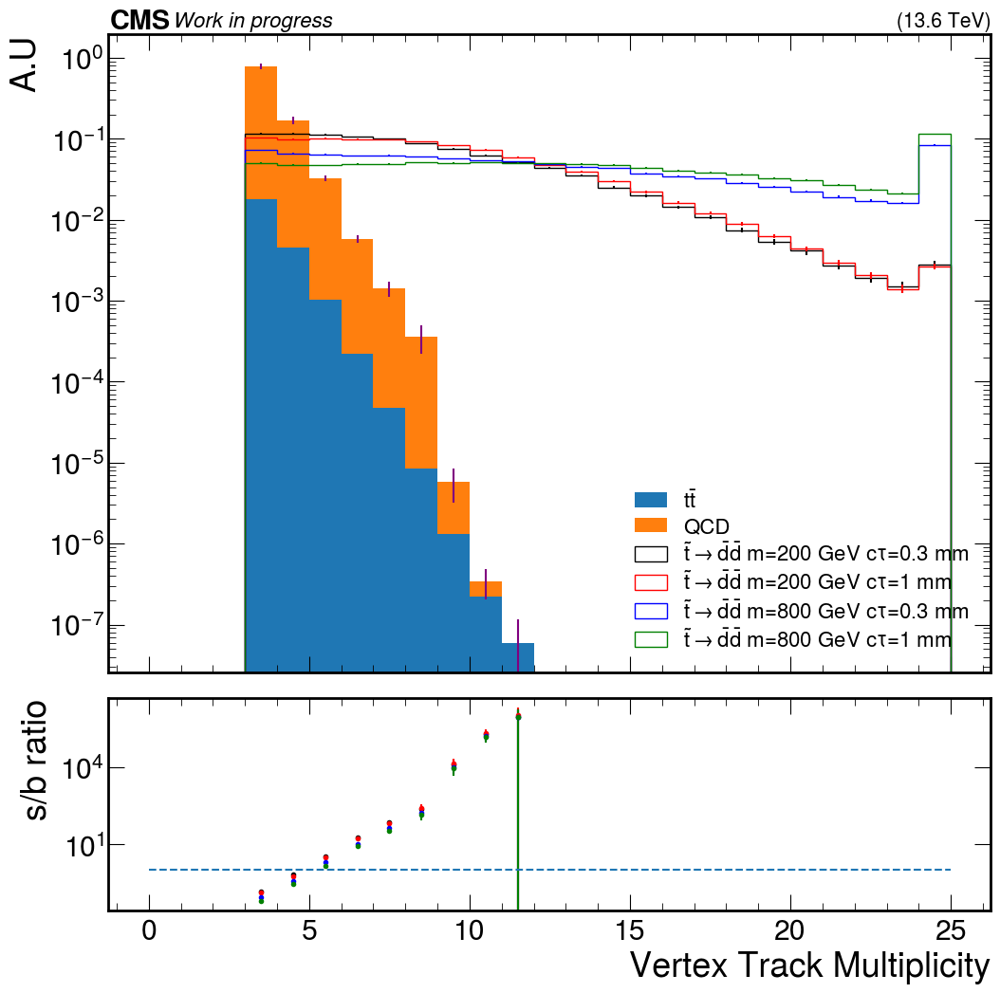

Total runtime: 5.18 seconds


In [49]:
#Branch plotting script

import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed

plotDict = {
    #"vertTrack_pt": [0,5,101],# "vertTrack_eta": [-3,3,101], "vertTrack_phi": [-3.142,3.142,101],
    #"vertTrack_reducedChi2": [0,7,51], "vertTrack_dxy": [0,0.3,51], "vertTrack_dxyErr": [0,0.05,101], 
    #"vertTrack_dxySig": [0,50,101],
    #"vertTrack_nValidPixelHits": [0,13,14], "vertTrack_nTrackerLayersWithMeasurement": [0,21,22],
    #"vertTrack_nValidStripHits": [0,32,33], 
    #"vertTrack_shiftZErr": [0,0.05,51], "vertTrack_shiftZValue": [0,0.05,101],
    #"vertTrack_shift3DErr": [0,0.05,51], "vertTrack_shift3DValue": [0,0.1,101],
    #"scoutVert_dBV": [0,2,51],
    #"scoutVert_dBVErr": [0,0.1,51],
    #"vertTrack_nMissingInnerHits": [0,5,6], 
    "scoutVert_nTracks": [0,25,26],# "scoutVert_chi2": [0,5,50],
    #"scoutVert_dT": [0,0.5,101], "scoutVert_cosT": [-1,1,41], 
    #"scoutVert_pMag": [0,500,26],
    #"scoutTrack_phi": [-3.142,3.142,101], "scoutTrack_dxySig": [0,50,101], "scoutTrack_nTrackerLayersWithMeasurement": [0,21,22],
    #"scoutTrack_pt": [0,50,101], "scoutTrack_nValidPixelHits": [0,13,14]
    #"truePU": [0,100,101]
    #"vertTrack_iJet": [-2,10,13]
}

def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    doWeightSum = False
    genWeightSum = 0
    with uproot.open(rootFile) as file:
        if(process in processDict):
            if (len(processDict[process])>1): doWeightSum = True
        elif(process in signalDict):
            if (len(signalDict[process])>1): doWeightSum = True
        if(doWeightSum):
            output["genWeightSum"] = {process: file["triggerFilter/genWeightsSkim"].values()[0]}
        else:
            output["genWeightSum"] = {}
            genWeightSum = file["triggerFilter/genWeightsSkim"].values()[0]
        tree = file["scoutingTree/objectTree"]

        # Select only necessary branches to load
        branches = list(plotDict.keys()) + ["weight_trigger_nominal","uncorrectedWeight","weight_PU_BCDEFGHI_nominal","vertTrack_iVtx", "weight","scoutVert_dBV","scoutVert_chi2","scoutVert_dBVErr","scoutVert_cosT","scoutVert_nTracks"]
        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        for batch in tree.iterate(branches, library="ak", step_size=100000):  
            weights = batch["uncorrectedWeight"] * batch["weight_PU_BCDEFGHI_nominal"] * batch["weight_trigger_nominal"]
            if(not doWeightSum): weights = weights / genWeightSum

            for plot, binning in plotDict.items():
                bins = np.linspace(binning[0], binning[1], binning[2])
                data = batch[plot]
                # Apply displacement cut
                #if "vertTrack_shift" in plot:
                #   mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.1) & (batch["vertTrack_shiftZValue"] > -900)
                if "vertTrack" in plot:
                    #mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.1)  & (batch["vertTrack_dxySig"] > 5) & (batch["vertTrack_pt"] > 1.0) & (batch["vertTrack_nValidPixelHits"] > 1)
                    mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.01) & (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] < 2) & (batch["scoutVert_dBVErr"][batch["vertTrack_iVtx"]] < 0.005) & (batch["scoutVert_nTracks"][batch["vertTrack_iVtx"]] > 4)
                elif "scoutVert" in plot:
                    mask = (batch["scoutVert_dBV"] >= 0.01) & (batch["scoutVert_dBV"] < 2) #& (batch["scoutVert_dBVErr"] < 0.005) & (batch["scoutVert_cosT"] > 0) & (batch["scoutVert_chi2"] < 3)#& (batch["scoutVert_nTracks"] > 7)
                elif "scoutTrack" in plot:
                    mask = (batch["scoutTrack_dxySig"] > 5) & (batch["scoutTrack_pt"] > 1.0) & (batch["scoutTrack_nValidPixelHits"] > 1) & (batch["scoutTrack_nTrackerLayersWithMeasurement"] > 5)
                else:
                    mask = ak.ones_like(data, dtype=bool)
                data = data[mask]
                #mask = ak.sum(mask,axis=1)>1
                #data = data[mask]
                #maskedWeights = weights[mask]
                broadcastWeights, data = ak.broadcast_arrays(weights,data)
                # Apply mask and flatten data
                data = ak.flatten(data,axis=None)
                data = np.clip(data,bins[0],bins[-1])
                weights_filtered = ak.flatten(broadcastWeights,axis=None)
                # Compute histograms
                n, _ = np.histogram(data, weights=weights_filtered, bins=bins)
                n_2, _ = np.histogram(data, weights=weights_filtered**2, bins=bins)
                if plot not in output:
                    output[plot] = {process: n}
                    output[f"{plot}_squared"] = {process: n_2}
                else:
                    output[plot][process] = output[plot][process] + n
                    output[f"{plot}_squared"][process] = output[f"{plot}_squared"][process] + n_2
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        results[plot][process] = results[plot].get(process, 0) + result[plot][process]

    return results

t0 = time.time()

bgPlotWeights = parallel_processing(processDict)
sigPlotWeights = parallel_processing(signalDict)

#Combining Background Subprocesses and Reweighting Events
for plot in plotDict.keys():
    for process in bgPlotWeights["genWeightSum"].keys():
        bgPlotWeights[plot][process] = bgPlotWeights[plot][process] / bgPlotWeights["genWeightSum"][process]
        bgPlotWeights[f"{plot}_squared"][process] = bgPlotWeights[f"{plot}_squared"][process] / (bgPlotWeights["genWeightSum"][process]**2)
    bgPlotWeights[plot]["QCD"] = bgPlotWeights[plot]["QCD40to70"]+bgPlotWeights[plot]["QCD70to100"]+bgPlotWeights[plot]["QCD100to200"]+bgPlotWeights[plot]["QCD200to400"]+bgPlotWeights[plot]["QCD400to600"]+bgPlotWeights[plot]["QCD600to800"]+bgPlotWeights[plot]["QCD800to1000"]+bgPlotWeights[plot]["QCD1000to1200"]+bgPlotWeights[plot]["QCD1200to1500"]+bgPlotWeights[plot]["QCD1500to2000"]+bgPlotWeights[plot]["QCD2000"]
    bgPlotWeights[f"{plot}_squared"]["QCD"] = bgPlotWeights[f"{plot}_squared"]["QCD40to70"]+bgPlotWeights[f"{plot}_squared"]["QCD70to100"]+bgPlotWeights[f"{plot}_squared"]["QCD100to200"]+bgPlotWeights[f"{plot}_squared"]["QCD200to400"]+bgPlotWeights[f"{plot}_squared"]["QCD400to600"]+bgPlotWeights[f"{plot}_squared"]["QCD600to800"]+bgPlotWeights[f"{plot}_squared"]["QCD800to1000"]+bgPlotWeights[f"{plot}_squared"]["QCD1000to1200"]+bgPlotWeights[f"{plot}_squared"]["QCD1200to1500"]+bgPlotWeights[f"{plot}_squared"]["QCD1500to2000"]+bgPlotWeights[f"{plot}_squared"]["QCD2000"]
    bgPlotWeights[plot]["TTbar"] = bgPlotWeights[plot]["TTTo4Q"]+bgPlotWeights[plot]["TTToLNu2Q"]
    bgPlotWeights[f"{plot}_squared"]["TTbar"] = bgPlotWeights[f"{plot}_squared"]["TTTo4Q"]+bgPlotWeights[f"{plot}_squared"]["TTToLNu2Q"]
for plot in plotDict.keys():
    for process in sigPlotWeights["genWeightSum"].keys():
        sigPlotWeights[plot][process] = sigPlotWeights[plot][process] / sigPlotWeights["genWeightSum"][process]
        sigPlotWeights[f"{plot}_squared"][process] = sigPlotWeights[f"{plot}_squared"][process] / (sigPlotWeights["genWeightSum"][process]**2)

# **Plotting**
for plot, binning in plotDict.items():
    if plot not in bgPlotWeights:
        print(f"Skipping {plot} (no data).")
        continue

    bins = np.linspace(binning[0], binning[1], binning[2])
    bgIntegral = (bins[1] - bins[0]) * sum(bgPlotWeights[plot]["QCD"] + bgPlotWeights[plot]["TTbar"])

    fig, (ax, rax) = plt.subplots(2, 1, figsize=[12,12], gridspec_kw={"height_ratios": [3,1]}, sharex=True)
    fig.subplots_adjust(hspace=0.06)
    ax.hist([(bins[:-1] + bins[1:]) / 2]*2,weights=[list(bgPlotWeights[plot]["TTbar"]),list(bgPlotWeights[plot]["QCD"])],
            stacked=True, density=True, label=[r"$t\bar{t}$","QCD"], bins=bins)

    bgValues = (bgPlotWeights[plot]["QCD"] / bgIntegral) + (bgPlotWeights[plot]["TTbar"] / bgIntegral)
    bgErrors = np.sqrt(bgPlotWeights[f"{plot}_squared"]["QCD"] / (bgIntegral**2) + \
               bgPlotWeights[f"{plot}_squared"]["TTbar"] / (bgIntegral**2))
    #bgValues = np.nan_to_num(bgValues)
    #bgErrors = np.nan_to_num(bgErrors)
    ax.errorbar(((bins[:-1] + bins[1:]) / 2), bgValues, yerr=bgErrors, linestyle="none", color="purple")
    
    colors = {"Stop-M200-cT0p3": "black", "Stop-M200-cT1": "red", "Stop-M800-cT0p3": "blue", "Stop-M800-cT1": "green"}
    #colors = {"Hto2Sto4D-cT1-MS15": "black", "Hto2Sto4D-cT1-MS55": "blue", "Hto2Sto4D-cT0p1-MS15": "red", "Hto2Sto4D-cT0p1-MS55": "green"}
    for signal, color in colors.items():
        if plot not in sigPlotWeights or signal not in sigPlotWeights[plot]:
            print(f"Skipping {signal} in {plot} (no data).")
            continue

        legendLabel = signal
        if "Stop" in signal:
            string = signal.split("-")
            mass = string[1][1:]
            lifetime = string[2][2:]
            lifetime = lifetime.replace("p",".")
            legendLabel = rf'$\tilde{{t}}\rightarrow \bar{{d}}\bar{{d}}$ m={mass} GeV c$\tau$={lifetime} mm'
        if "Hto" in signal:
            string = signal.split("-")
            mass = string[2][2:]
            lifetime = string[1][2:]
            lifetime = lifetime.replace("p",".")
            legendLabel = rf'$H\rightarrow SS \rightarrow d\bar{{d}}d\bar{{d}}$ m={mass} GeV c$\tau$={lifetime} mm'
            
        integral = (bins[1] - bins[0]) * sum(sigPlotWeights[plot][signal])
        ax.hist(((bins[:-1] + bins[1:]) / 2), weights=list(sigPlotWeights[plot][signal]),
                stacked=False, density=True, label=legendLabel, bins=bins, histtype="step", color=color)

        sigValues = sigPlotWeights[plot][signal] / integral
        sigErrors = np.sqrt(sigPlotWeights[f"{plot}_squared"][signal] / (integral**2))

        ax.errorbar(((bins[:-1] + bins[1:]) / 2), sigValues, yerr=sigErrors, linestyle="none", color=color)
        ratioValues = sigValues / bgValues
        ratioErrors = ratioValues * np.sqrt((sigErrors / sigValues)**2 + (bgErrors / bgValues)**2)
        #ratioValues = np.nan_to_num(ratioValues)
        #ratioErrors = np.nan_to_num(ratioErrors)
        rax.errorbar(((bins[:-1] + bins[1:]) / 2), ratioValues, yerr=ratioErrors, linestyle="none", color=color, marker=".")

    rax.hlines(1, bins[0], bins[-1], linestyle="dashed")
    rax.set_ylabel("s/b ratio")
    ax.set_ylabel("A.U")
    #plt.xlabel(plot)
    if "scoutVert_nTracks" in plot:
        plt.xlabel("Vertex Track Multiplicity")
    else:
        plt.xlabel(plot)
    ax.legend(fontsize=16,labelspacing=0.25)
    ax.set_yscale("log")
    rax.set_yscale("log")
    hep.cms.label("Work in progress", loc=0, ax=ax, com=13.6, fontsize=16,data=True)
    plt.savefig(f"{plot}_sigbkg_stop.pdf", bbox_inches='tight')
    plt.show()

t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")


In [8]:
#Cutflow table script 
doPercents = False
bin_namesCustom = ["9Tracks"]

def process_cutflows(args):
    """ Process a single ROOT file in chunks using uproot.iterate() """
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    with uproot.open(rootFile) as file:
        output[process] = {}
        output[process+"_PU_up"] = {}
        output[process+"_PU_down"] = {}
        output[process+"_Trigger_up"] = {}
        output[process+"_Trigger_down"] = {}
        output[process+"_squared"] = {}
        output[process+"_PU_up_squared"] = {}
        output[process+"_PU_down_squared"] = {}
        output[process+"_nEvents"] = {}
        tree = file["scoutingTree/objectTree"]

        # Select only necessary branches to load
        branches = ["uncorrectedWeight","scoutVert_dBV","scoutVert_dBVErr", "scoutVert_nTracks","weight","scoutVert_cosT","scoutVert_chi2","weight_PU_BCDEFGHI_nominal","weight_PU_BCDEFGHI_up","weight_PU_BCDEFGHI_down","jet_pt","scoutVert_pMag","weight_trigger_nominal","weight_trigger_up","weight_trigger_down"]

        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        weightSum = [0]*len(bin_namesCustom)
        weightSumSquared = [0] * len(bin_namesCustom)
        weightSum_PU_up = [0]*len(bin_namesCustom)
        weightSumSquared_PU_up = [0] * len(bin_namesCustom)
        weightSum_PU_down = [0]*len(bin_namesCustom)
        weightSumSquared_PU_down = [0] * len(bin_namesCustom)
        weightSum_Trigger_up = [0]*len(bin_namesCustom)
        weightSum_Trigger_down = [0]*len(bin_namesCustom)
        numEvents = [0] * len(bin_namesCustom)
        for batch in tree.iterate(branches, library="ak", step_size=100000):  
            #weights = batch["weight"]  # event weights
            weights = batch["uncorrectedWeight"] * batch["weight_PU_BCDEFGHI_nominal"] * batch["weight_trigger_nominal"] #* (114.44/108.96) #temp to correct for official 2024 lumi
            weights_PU_up = batch["uncorrectedWeight"] * batch["weight_PU_BCDEFGHI_up"] * batch["weight_trigger_nominal"]#* (114.44/108.96)
            weights_PU_down = batch["uncorrectedWeight"] * batch["weight_PU_BCDEFGHI_down"] * batch["weight_trigger_nominal"]#* (114.44/108.96)
            weights_Trigger_up = batch["uncorrectedWeight"] * batch["weight_PU_BCDEFGHI_nominal"] * batch["weight_trigger_up"]
            weights_Trigger_down = batch["uncorrectedWeight"] * batch["weight_PU_BCDEFGHI_nominal"] * batch["weight_trigger_down"]
            if(process in signalDict):
                if process in limitDict:
                    currentLimit = limitDict[process]
                    #weights = weights * currentLimit #don't want this when doing combine limit calculation
            data = batch["scoutVert_dBV"]
            ntracks = batch["scoutVert_nTracks"]
            cosT = batch["scoutVert_cosT"]
            dBVErr = batch["scoutVert_dBVErr"] 
            chi2 = batch["scoutVert_chi2"]
            jetpt = batch["jet_pt"]
            ht = ak.sum(jetpt,axis=-1)
            jetMask = (jetpt>30)
            nJetsAboveCut = ak.sum(jetMask,axis=1)
            mask = (data<2.0) & (cosT>0) & (dBVErr<0.005) & (chi2<2.5) 
            data = data[mask]
            ntracks = ntracks[mask]
            mask = ak.sum(data>=0.01,axis=1)>0
            #htMask = (ht>280) & (nJetsAboveCut>2)
            #mask = mask & htMask
            weights = weights[mask]
            weights_PU_up = weights_PU_up[mask]
            weights_PU_down = weights_PU_down[mask]
            weights_Trigger_up = weights_Trigger_up[mask]
            weights_Trigger_down = weights_Trigger_down[mask]
            data = data[mask]
            ntracks = ntracks[mask]
            #weightSum[0] += ak.sum(weights)
            #weightSumSquared[0] += ak.sum(weights**2)
            
            # Apply displacement error cut
            #mask = batch["scoutVert_dBVErr"][mask] < 999.9
            #data = data[mask]
            #ntracks = ntracks[mask]
            
            #mask = ak.sum(data>=0.01,axis=1)>0
            #weights = weights[mask]
            #data = data[mask]
            #ntracks = ntracks[mask]
            #weightSum[0] += ak.sum(weights)
            #weightSumSquared[0] += ak.sum(weights**2)
            #numEvents[0] += ak.num(weights,axis=0)
            
            mask = (ntracks > 8)
            data = data[mask]
            mask = ak.sum(data>=0.01,axis=1)>0
            weights = weights[mask]
            weights_PU_up = weights_PU_up[mask]
            weights_PU_down = weights_PU_down[mask]
            weights_Trigger_up = weights_Trigger_up[mask]
            weights_Trigger_down = weights_Trigger_down[mask]
            weightSum[0] += ak.sum(weights)
            weightSumSquared[0] += ak.sum(weights**2)
            weightSum_PU_up[0] += ak.sum(weights_PU_up)
            weightSumSquared_PU_up[0] += ak.sum(weights_PU_up**2)
            weightSum_PU_down[0] += ak.sum(weights_PU_down)
            weightSumSquared_PU_down[0] += ak.sum(weights_PU_down**2)
            weightSum_Trigger_up[0] += ak.sum(weights_Trigger_up)
            weightSum_Trigger_down[0] += ak.sum(weights_Trigger_down)
            numEvents[0] += ak.num(weights,axis=0)
            
        for i in range(len(bin_namesCustom)):
            output[process][bin_namesCustom[i]] = weightSum[i]
            output[process+"_squared"][bin_namesCustom[i]] = weightSumSquared[i]
            output[process+"_PU_up"][bin_namesCustom[i]] = weightSum_PU_up[i]
            output[process+"_PU_up_squared"][bin_namesCustom[i]] = weightSumSquared_PU_up[i]
            output[process+"_PU_down"][bin_namesCustom[i]] = weightSum_PU_down[i]
            output[process+"_PU_down_squared"][bin_namesCustom[i]] = weightSumSquared_PU_down[i]
            output[process+"_Trigger_up"][bin_namesCustom[i]] = weightSum_Trigger_up[i]
            output[process+"_Trigger_down"][bin_namesCustom[i]] = weightSum_Trigger_down[i]
            output[process+"_nEvents"][bin_namesCustom[i]] = numEvents[i]
        
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    """ Process all ROOT files in parallel and aggregate results """
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_cutflows, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for process in result:
                if process not in results:
                    results[process] = result[process]
                else:
                    for cut in result[process]:
                        results[process][cut] = results[process].get(cut, 0) + result[process][cut]

    return results


# Define LaTeX table header
latex_table = "\\begin{table}[htbp]\n"
latex_table += "\\centering\n"

dict = signalDict | processDict
customWeights = parallel_processing(dict)

firstProcess = True
weightSumDict = {}
weightSquaredSumDict = {}
genWeightSumDict = {}
for process, rootFiles in dict.items():
    firstFile = True
    weightSum = []
    weightSquaredSum = []
    genWeightSum = 0
    for rootFile in rootFiles:
        f = ROOT.TFile.Open(rootFile, "READ")
        #h_weightsSkim = f.Get("triggerFilter/weightsSkim")
        #h_weightsSquaredSkim = f.Get("triggerFilter/weightsSquaredSkim")
        h_weightsSkim = f.Get("triggerFilter/weightsSkimLUMCorrected")
        h_weightsSquaredSkim = f.Get("triggerFilter/weightsSquaredSkimLUMCorrected")
        h_genWeights = f.Get("triggerFilter/genWeightsSkim")
        #h_weights = f.Get("scoutingTree/weights")
        #h_weightsSquared = f.Get("scoutingTree/weightsSquared")
        h_weights = f.Get("scoutingTree/weightsLUMCorrected")
        h_weightsSquared = f.Get("scoutingTree/weightsSquaredLUMCorrected")
        
        # Extract content
        n_bins = 0 #temp while making simplified cutflow table
        #n_bins = h_weights.GetNbinsX()
        weights = np.array([h_weights.GetBinContent(i) for i in range(3, n_bins)]) #temp since there are redundant cuts in tree maker, normally would go from 1 to n_bins+1
        bin_names = np.array([h_weights.GetXaxis().GetLabels().At(i-1).GetName() for i in range(3, n_bins)])
        weightsSquared = np.array([h_weightsSquared.GetBinContent(i) for i in range(3, n_bins)])
        
        n_binsSkim = h_weightsSkim.GetNbinsX() 
        currentLimit = 1
        if(process in signalDict):
            if process in limitDict:
                currentLimit = limitDict[process]
        weightsSkim = np.array([h_weightsSkim.GetBinContent(i) for i in range(1, n_binsSkim + 1)]) #* currentLimit #* (114.44/108.96)
        bin_namesSkim = np.array([h_weightsSkim.GetXaxis().GetLabels().At(i-1).GetName() for i in range(1, n_binsSkim + 1)]) 
        weightsSquaredSkim = np.array([h_weightsSquaredSkim.GetBinContent(i) for i in range(1, n_binsSkim + 1)]) #* (currentLimit**2) #* ((114.44/108.96)**2)
        genWeights = np.array([h_genWeights.GetBinContent(i) for i in range(1, n_binsSkim + 1)])
        
        if(firstFile and firstProcess):
            latex_table += "\\resizebox{\\textwidth}{!}{\\begin{tabular}{|l|"+(len(bin_names)+len(bin_namesSkim)+len(bin_namesCustom)+2)*"c|"+"}\n"
            latex_table += "\\hline\n"
            latex_table += "Process "
            for name in np.concatenate((bin_namesSkim,bin_names)):
                latex_table += "& {} ".format(name)
                weightSum.append(0)
                weightSquaredSum.append(0)
            for name in bin_namesCustom:
                latex_table += "& {} ".format(name)
            latex_table += "& {} & {} ".format("s/sqrt(s+b)","$\epsilon/(1+\sqrt{B})$")
            latex_table += "\\\\\n"
            latex_table += "\\hline\n"
            firstFile = False
        elif(firstFile):
            for name in np.concatenate((bin_namesSkim,bin_names)):
                weightSum.append(0)
                weightSquaredSum.append(0)
            firstFile = False

        genWeightSum += genWeights[0]
        for i in range(len(weightsSkim)):
            weightSum[i] += weightsSkim[i]
            weightSquaredSum[i] += weightsSquaredSkim[i]
        for i in range(len(weights)):
            weightSum[i+len(weightsSkim)] += weights[i]
            weightSquaredSum[i+len(weightsSkim)] += weightsSquared[i]
    firstProcess = False
    weightSumDict[process] = weightSum
    weightSquaredSumDict[process] = weightSquaredSum
    genWeightSumDict[process] = genWeightSum
      
#Combining Background Subprocesses and Reweighting Events
for process in dict.keys():
    for i in range(len(weightSumDict[process])):
        weightSumDict[process][i] = weightSumDict[process][i] / genWeightSumDict[process] 
        weightSquaredSumDict[process][i] = weightSquaredSumDict[process][i] / (genWeightSumDict[process]**2) 
    for cut in customWeights[process].keys():
        customWeights[process][cut] = customWeights[process][cut] / genWeightSumDict[process] 
        customWeights[process+"_squared"][cut] = customWeights[process+"_squared"][cut] / (genWeightSumDict[process]**2) 
        customWeights[process+"_PU_up"][cut] = customWeights[process+"_PU_up"][cut] / genWeightSumDict[process] 
        customWeights[process+"_PU_up_squared"][cut] = customWeights[process+"_PU_up_squared"][cut] / (genWeightSumDict[process]**2)
        customWeights[process+"_PU_down"][cut] = customWeights[process+"_PU_down"][cut] / genWeightSumDict[process] 
        customWeights[process+"_PU_down_squared"][cut] = customWeights[process+"_PU_down_squared"][cut] / (genWeightSumDict[process]**2) 
        customWeights[process+"_Trigger_up"][cut] = customWeights[process+"_Trigger_up"][cut] / genWeightSumDict[process] 
        customWeights[process+"_Trigger_down"][cut] = customWeights[process+"_Trigger_down"][cut] / genWeightSumDict[process] 
weightSumDict["QCD"] = weightSumDict["QCD200to400"]
weightSquaredSumDict["QCD"] = weightSquaredSumDict["QCD200to400"]
weightSumDict["TTbar"] = weightSumDict["TTTo4Q"]
weightSquaredSumDict["TTbar"] = weightSquaredSumDict["TTTo4Q"]
for i in range(len(weightSumDict["QCD"])):
    weightSumDict["QCD"][i] = weightSumDict["QCD40to70"][i]+weightSumDict["QCD70to100"][i]+weightSumDict["QCD100to200"][i]+weightSumDict["QCD"][i]+weightSumDict["QCD400to600"][i]+weightSumDict["QCD600to800"][i]+weightSumDict["QCD800to1000"][i]+weightSumDict["QCD1000to1200"][i]+weightSumDict["QCD1200to1500"][i]+weightSumDict["QCD1500to2000"][i]+weightSumDict["QCD2000"][i]
    weightSquaredSumDict["QCD"][i] = weightSquaredSumDict["QCD40to70"][i]+weightSquaredSumDict["QCD70to100"][i]+weightSquaredSumDict["QCD100to200"][i]+weightSquaredSumDict["QCD"][i]+weightSquaredSumDict["QCD400to600"][i]+weightSquaredSumDict["QCD600to800"][i]+weightSquaredSumDict["QCD800to1000"][i]+weightSquaredSumDict["QCD1000to1200"][i]+weightSquaredSumDict["QCD1200to1500"][i]+weightSquaredSumDict["QCD1500to2000"][i]+weightSquaredSumDict["QCD2000"][i]
    weightSumDict["TTbar"][i] = weightSumDict["TTbar"][i]+weightSumDict["TTToLNu2Q"][i]
    weightSquaredSumDict["TTbar"][i] = weightSquaredSumDict["TTbar"][i]+weightSquaredSumDict["TTToLNu2Q"][i]
customWeights["QCD"] = {}
customWeights["QCD_PU_up"] = {}
customWeights["QCD_PU_down"] = {}
customWeights["QCD_Trigger_up"] = {}
customWeights["QCD_Trigger_down"] = {}
customWeights["TTbar"] = {}
customWeights["TTbar_PU_up"] = {}
customWeights["TTbar_PU_down"] = {}
customWeights["TTbar_Trigger_up"] = {}
customWeights["TTbar_Trigger_down"] = {}
customWeights["QCD_squared"] = {}
customWeights["TTbar_squared"] = {}
customWeights["QCD_nEvents"] = {}
customWeights["TTbar_nEvents"] = {}
for i in range(len(bin_namesCustom)):
    cut = bin_namesCustom[i]
    customWeights["QCD"][cut] = customWeights["QCD40to70"][cut]+customWeights["QCD70to100"][cut]+customWeights["QCD100to200"][cut]+customWeights["QCD200to400"][cut]+customWeights["QCD400to600"][cut]+customWeights["QCD600to800"][cut]+customWeights["QCD800to1000"][cut]+customWeights["QCD1000to1200"][cut]+customWeights["QCD1200to1500"][cut]+customWeights["QCD1500to2000"][cut]+customWeights["QCD2000"][cut]
    customWeights["QCD_PU_up"][cut] = customWeights["QCD40to70_PU_up"][cut]+customWeights["QCD70to100_PU_up"][cut]+customWeights["QCD100to200_PU_up"][cut]+customWeights["QCD200to400_PU_up"][cut]+customWeights["QCD400to600_PU_up"][cut]+customWeights["QCD600to800_PU_up"][cut]+customWeights["QCD800to1000_PU_up"][cut]+customWeights["QCD1000to1200_PU_up"][cut]+customWeights["QCD1200to1500_PU_up"][cut]+customWeights["QCD1500to2000_PU_up"][cut]+customWeights["QCD2000_PU_up"][cut]
    customWeights["QCD_Trigger_up"][cut] = customWeights["QCD40to70_Trigger_up"][cut]+customWeights["QCD70to100_Trigger_up"][cut]+customWeights["QCD100to200_Trigger_up"][cut]+customWeights["QCD200to400_Trigger_up"][cut]+customWeights["QCD400to600_Trigger_up"][cut]+customWeights["QCD600to800_Trigger_up"][cut]+customWeights["QCD800to1000_Trigger_up"][cut]+customWeights["QCD1000to1200_Trigger_up"][cut]+customWeights["QCD1200to1500_Trigger_up"][cut]+customWeights["QCD1500to2000_Trigger_up"][cut]+customWeights["QCD2000_Trigger_up"][cut]
    customWeights["QCD_Trigger_down"][cut] = customWeights["QCD40to70_Trigger_down"][cut]+customWeights["QCD70to100_Trigger_down"][cut]+customWeights["QCD100to200_Trigger_down"][cut]+customWeights["QCD200to400_Trigger_down"][cut]+customWeights["QCD400to600_Trigger_down"][cut]+customWeights["QCD600to800_Trigger_down"][cut]+customWeights["QCD800to1000_Trigger_down"][cut]+customWeights["QCD1000to1200_Trigger_down"][cut]+customWeights["QCD1200to1500_Trigger_down"][cut]+customWeights["QCD1500to2000_Trigger_down"][cut]+customWeights["QCD2000_Trigger_down"][cut]
    customWeights["QCD_PU_down"][cut] = customWeights["QCD40to70_PU_down"][cut]+customWeights["QCD70to100_PU_down"][cut]+customWeights["QCD100to200_PU_down"][cut]+customWeights["QCD200to400_PU_down"][cut]+customWeights["QCD400to600_PU_down"][cut]+customWeights["QCD600to800_PU_down"][cut]+customWeights["QCD800to1000_PU_down"][cut]+customWeights["QCD1000to1200_PU_down"][cut]+customWeights["QCD1200to1500_PU_down"][cut]+customWeights["QCD1500to2000_PU_down"][cut]+customWeights["QCD2000_PU_down"][cut]
    customWeights["QCD_squared"][cut] = customWeights["QCD40to70_squared"][cut]+customWeights["QCD70to100_squared"][cut]+customWeights["QCD100to200_squared"][cut]+customWeights["QCD200to400_squared"][cut]+customWeights["QCD400to600_squared"][cut]+customWeights["QCD600to800_squared"][cut]+customWeights["QCD800to1000_squared"][cut]+customWeights["QCD1000to1200_squared"][cut]+customWeights["QCD1200to1500_squared"][cut]+customWeights["QCD1500to2000_squared"][cut]+customWeights["QCD2000_squared"][cut]
    customWeights["QCD_nEvents"][cut] = customWeights["QCD40to70_nEvents"][cut]+customWeights["QCD70to100_nEvents"][cut]+customWeights["QCD100to200_nEvents"][cut]+customWeights["QCD200to400_nEvents"][cut]+customWeights["QCD400to600_nEvents"][cut]+customWeights["QCD600to800_nEvents"][cut]+customWeights["QCD800to1000_nEvents"][cut]+customWeights["QCD1000to1200_nEvents"][cut]+customWeights["QCD1200to1500_nEvents"][cut]+customWeights["QCD1500to2000_nEvents"][cut]+customWeights["QCD2000_nEvents"][cut]
    customWeights["TTbar"][cut] = customWeights["TTTo4Q"][cut]+customWeights["TTToLNu2Q"][cut]
    customWeights["TTbar_PU_up"][cut] = customWeights["TTTo4Q_PU_up"][cut]+customWeights["TTToLNu2Q_PU_up"][cut]
    customWeights["TTbar_PU_down"][cut] = customWeights["TTTo4Q_PU_down"][cut]+customWeights["TTToLNu2Q_PU_down"][cut]
    customWeights["TTbar_Trigger_up"][cut] = customWeights["TTTo4Q_Trigger_up"][cut]+customWeights["TTToLNu2Q_Trigger_up"][cut]
    customWeights["TTbar_Trigger_down"][cut] = customWeights["TTTo4Q_Trigger_down"][cut]+customWeights["TTToLNu2Q_Trigger_down"][cut]
    customWeights["TTbar_squared"][cut] = customWeights["TTTo4Q_squared"][cut]+customWeights["TTToLNu2Q_squared"][cut]
    customWeights["TTbar_nEvents"][cut] = customWeights["TTTo4Q_nEvents"][cut]+customWeights["TTToLNu2Q_nEvents"][cut]

stopMassArray = [200,400,600,800]
stopLifetimeArray = ["0p1","0p3","0p7",1,3,10]
stopRawEventsArray = []
stopWeightedEventsArray = []
stopWeightedEventsArray_PU_up = []
stopWeightedEventsArray_PU_down = []
stopWeightedEventsArray_Trigger_up = []
stopWeightedEventsArray_Trigger_down = []
for mass in stopMassArray:
    singleMassRawEventsArray = []
    singleMassWeightedEventsArray = []
    singleMassWeightedEventsArray_PU_up = []
    singleMassWeightedEventsArray_PU_down = []
    singleMassWeightedEventsArray_Trigger_up = []
    singleMassWeightedEventsArray_Trigger_down = []
    for lifetime in stopLifetimeArray:
        singleMassRawEventsArray.append(customWeights[f'Stop-M{mass}-cT{lifetime}_nEvents'][bin_namesCustom[-1]])
        nominal = customWeights[f'Stop-M{mass}-cT{lifetime}'][bin_namesCustom[-1]]
        pu_up = customWeights[f'Stop-M{mass}-cT{lifetime}_PU_up'][bin_namesCustom[-1]]
        pu_down = customWeights[f'Stop-M{mass}-cT{lifetime}_PU_down'][bin_namesCustom[-1]]
        singleMassWeightedEventsArray.append(round(nominal,2))
        singleMassWeightedEventsArray_PU_up.append(round(1+((pu_up-nominal)/nominal),3))
        singleMassWeightedEventsArray_PU_down.append(round(1+((pu_down-nominal)/nominal),3))
        trigger_up = customWeights[f'Stop-M{mass}-cT{lifetime}_Trigger_up'][bin_namesCustom[-1]]
        trigger_down = customWeights[f'Stop-M{mass}-cT{lifetime}_Trigger_down'][bin_namesCustom[-1]]
        singleMassWeightedEventsArray_Trigger_up.append(round(1+((trigger_up-nominal)/nominal),3))
        singleMassWeightedEventsArray_Trigger_down.append(round(1+((trigger_down-nominal)/nominal),3))
    stopRawEventsArray.append(singleMassRawEventsArray)
    stopWeightedEventsArray.append(singleMassWeightedEventsArray)
    stopWeightedEventsArray_PU_up.append(singleMassWeightedEventsArray_PU_up)
    stopWeightedEventsArray_PU_down.append(singleMassWeightedEventsArray_PU_down)
    stopWeightedEventsArray_Trigger_up.append(singleMassWeightedEventsArray_Trigger_up)
    stopWeightedEventsArray_Trigger_down.append(singleMassWeightedEventsArray_Trigger_down)
print("stop raw array:",stopRawEventsArray)
print("stop weighted array:",stopWeightedEventsArray)
print("stop PU up uncertainty",stopWeightedEventsArray_PU_up)
print("stop PU down uncertainty",stopWeightedEventsArray_PU_down)
print("stop Trigger up uncertainty",stopWeightedEventsArray_Trigger_up)
print("stop Trigger down uncertainty",stopWeightedEventsArray_Trigger_down)

higgsMassArray = [15,23,30,40,55]
higgsLifetimeArray = ["0p1","1","10"]
higgsRawEventsArray = []
higgsWeightedEventsArray = []
higgsWeightedEventsArray_PU_up = []
higgsWeightedEventsArray_PU_down = []
higgsWeightedEventsArray_Trigger_up = []
higgsWeightedEventsArray_Trigger_down = []
for mass in higgsMassArray:
    singleMassRawEventsArray = []
    singleMassWeightedEventsArray = []
    singleMassWeightedEventsArray_PU_up = []
    singleMassWeightedEventsArray_PU_down = []
    singleMassWeightedEventsArray_Trigger_up = []
    singleMassWeightedEventsArray_Trigger_down = []
    for lifetime in higgsLifetimeArray:
        singleMassRawEventsArray.append(customWeights[f'Hto2Sto4D-cT{lifetime}-MS{mass}_nEvents'][bin_namesCustom[-1]])
        nominal = customWeights[f'Hto2Sto4D-cT{lifetime}-MS{mass}'][bin_namesCustom[-1]] * (52.23/8)
        pu_up = customWeights[f'Hto2Sto4D-cT{lifetime}-MS{mass}_PU_up'][bin_namesCustom[-1]] * (52.23/8)
        pu_down = customWeights[f'Hto2Sto4D-cT{lifetime}-MS{mass}_PU_down'][bin_namesCustom[-1]] * (52.23/8)
        singleMassWeightedEventsArray.append(round(nominal,2))
        singleMassWeightedEventsArray_PU_up.append(round(1+((pu_up-nominal)/nominal),3))
        singleMassWeightedEventsArray_PU_down.append(round(1+((pu_down-nominal)/nominal),3))
        trigger_up = customWeights[f'Hto2Sto4D-cT{lifetime}-MS{mass}_Trigger_up'][bin_namesCustom[-1]] * (52.23/8)
        trigger_down = customWeights[f'Hto2Sto4D-cT{lifetime}-MS{mass}_Trigger_down'][bin_namesCustom[-1]] * (52.23/8)
        singleMassWeightedEventsArray_Trigger_up.append(round(1+((trigger_up-nominal)/nominal),3))
        singleMassWeightedEventsArray_Trigger_down.append(round(1+((trigger_down-nominal)/nominal),3))
    higgsRawEventsArray.append(singleMassRawEventsArray)
    higgsWeightedEventsArray.append(singleMassWeightedEventsArray)
    higgsWeightedEventsArray_PU_up.append(singleMassWeightedEventsArray_PU_up)
    higgsWeightedEventsArray_PU_down.append(singleMassWeightedEventsArray_PU_down)
    higgsWeightedEventsArray_Trigger_up.append(singleMassWeightedEventsArray_Trigger_up)
    higgsWeightedEventsArray_Trigger_down.append(singleMassWeightedEventsArray_Trigger_down)
print("higgs raw array:",higgsRawEventsArray)
print("higgs weighted array:",higgsWeightedEventsArray)
print("higgs PU up uncertainty",higgsWeightedEventsArray_PU_up)
print("higgs PU down uncertainty",higgsWeightedEventsArray_PU_down)
print("higgs Trigger up uncertainty",higgsWeightedEventsArray_Trigger_up)
print("higgs Trigger down uncertainty",higgsWeightedEventsArray_Trigger_down)

nevents = customWeights["QCD_nEvents"][bin_namesCustom[-1]] + customWeights["TTbar_nEvents"][bin_namesCustom[-1]]
nominal = customWeights["QCD"][bin_namesCustom[-1]] + customWeights["TTbar"][bin_namesCustom[-1]]
pu_up = customWeights["QCD_PU_up"][bin_namesCustom[-1]] + customWeights["TTbar_PU_up"][bin_namesCustom[-1]]
pu_down = customWeights["QCD_PU_down"][bin_namesCustom[-1]] + customWeights["TTbar_PU_down"][bin_namesCustom[-1]]
trigger_up = customWeights["QCD_Trigger_up"][bin_namesCustom[-1]] + customWeights["TTbar_Trigger_up"][bin_namesCustom[-1]]
trigger_down = customWeights["QCD_Trigger_down"][bin_namesCustom[-1]] + customWeights["TTbar_Trigger_down"][bin_namesCustom[-1]]
print("bkg raw events:",nevents)
print("bkg weighted events:",round(nominal,2))
print("bkg PU up uncertainty",round(1+((pu_up-nominal)/nominal),3))
print("bkg PU down uncertainty",round(1+((pu_down-nominal)/nominal),3))
print("bkg Trigger up uncertainty",round(1+((trigger_up-nominal)/nominal),3))
print("bkg Trigger down uncertainty",round(1+((trigger_down-nominal)/nominal),3))

for process in list(signalDict.keys())+["TTbar","QCD"]:
    print("events passing full selection for process",process,":",customWeights[process+'_nEvents'][bin_namesCustom[-1]])
    latex_table +=  f"{process}"
    for i in range(len(weightSumDict[process])):
        clop_unc = intervals.clopper_pearson_interval(weightSumDict[process][i],weightSumDict[process][0])
        stat_unc = np.sqrt(weightSquaredSumDict[process][i])
        efficiency = weightSumDict[process][i]
        formatString = ".1g"
        if(doPercents):
            efficiency = efficiency / weightSumDict[process][0]
            stat_unc = efficiency * np.sqrt(((stat_unc/weightSumDict[process][i])**2)+((np.sqrt(weightSquaredSumDict[process][0])/weightSumDict[process][0])**2))
        else:
            clop_unc = clop_unc * weightSumDict[process][0]
        if process in ["TTbar","QCD"]:
            formatString = ".2E"
        if(efficiency>0):
            latex_table +=  f" & {efficiency:.3g} $\pm$ {stat_unc:.1g}"
        else:
            latex_table +=  f" & {efficiency:.3g}$^{{+{clop_unc[1]-efficiency:{formatString}}}}_{{-{efficiency-clop_unc[0]:{formatString}}}}$"
    #Custom Cutflows
    for i in range(len(bin_namesCustom)):
        clop_unc = intervals.clopper_pearson_interval(customWeights[process][bin_namesCustom[i]],weightSumDict[process][0])
        stat_unc = np.sqrt(customWeights[process+'_squared'][bin_namesCustom[i]])
        efficiency = customWeights[process][bin_namesCustom[i]]
        formatString = ".1g"
        if(doPercents):
            efficiency = efficiency / weightSumDict[process][0]
            stat_unc = efficiency * np.sqrt(((stat_unc/customWeights[process][bin_namesCustom[i]])**2)+((np.sqrt(weightSquaredSumDict[process][0])/weightSumDict[process][0])**2))
        else:
            clop_unc = clop_unc * weightSumDict[process][0]
        if process in ["TTbar","QCD"] and doPercents:
            formatString = ".2E"
        if(efficiency>0):
            latex_table +=  f" & {efficiency:.3g} $\pm$ {stat_unc:.1g}"
        else:
            latex_table +=  f" & {efficiency:.3g}$^{{+{clop_unc[1]-efficiency:{formatString}}}}_{{-{efficiency-clop_unc[0]:{formatString}}}}$"
    latex_table += "\\\\\n"
    
latex_table += "\\hline\n"
latex_table += "\\end{tabular}}\n"
latex_table += "\\caption{Cutflow table}\n"
latex_table += "\\label{tab:cutflow}\n"
latex_table += "\\end{table}"

#Add sensitivity

splitStrings = latex_table.split("\\hline\n")
processString = splitStrings[2]
substrings = processString.split("\\\\")
final_table = splitStrings[0]+"\\hline\n"+splitStrings[1]+"\\hline\n"
for string in substrings:
    process = string.split(' &')[0]
    process = process.replace('\n','')
    if(process in signalDict):
        if(len(bin_namesCustom)):
            string += f" & {customWeights[process][bin_namesCustom[-1]]/np.sqrt(customWeights[process][bin_namesCustom[-1]]+customWeights['QCD'][bin_namesCustom[-1]]+customWeights['TTbar'][bin_namesCustom[-1]]):.2f} & {(customWeights[process][bin_namesCustom[-1]]/weightSumDict[process][0])/(1+np.sqrt(customWeights['QCD'][bin_namesCustom[-1]]+customWeights['TTbar'][bin_namesCustom[-1]])):.3f}"
        else:
            string += f" & {weightSumDict[process][-1]/np.sqrt(weightSumDict[process][-1]+weightSumDict['QCD'][-1]+weightSumDict['TTbar'][-1]):.3f}" 
    elif(process in ["QCD","TTbar"]):
        string += f" & & "
    final_table += string + "\\\\"
final_table = final_table[:-2]
final_table += "\\hline\n" + splitStrings[3]

print(final_table)

Processing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v30-4DxyMin-Resubmit/260513_192227/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v30-4DxyMin-Resubmit/260513_192319/StopStopbarTo2Dbar2D_M-400_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v30-4DxyMin-Resubmit/260513_192410/StopStopbarTo2Dbar2D_M-600_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v30-4DxyMin-Resubmit/260513_192237/StopStopbarTo2Dbar2D_M-200_CTau-3mm.root


Processing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summ

/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-scipy/1.10.1-1e920695ddf0dd59a535e9602f21fe6d/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:694: RuntimeWarning: Error in function boost::math::tgamma<d>(d,d): Series evaluation exceeded %1% iterations, giving up now.
  return _boost._beta_ppf(q, a, b)
/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-scipy/1.10.1-1e920695ddf0dd59a535e9602f21fe6d/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:694: RuntimeWarning: Error in function boost::math::tgamma<d>(d,d): Series evaluation exceeded %1% iterations, giving up now.
  return _boost._beta_ppf(q, a, b)


[0.006]
errCutValue 0.006
Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v12GlobalTag140-10TrackFPR/250408_093201/QCD-4Jets_Bin-HT-200to400.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v12GlobalTag140-10TrackFPR/250408_093100/TTtoLNu2Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v12GlobalTag140-10TrackFPR/250408_093251/QCD-4Jets_Bin-HT-800to1000.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v12GlobalTag140-10TrackFPR/250408_093218/QCD-4Jets_Bin-HT-400to600.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to

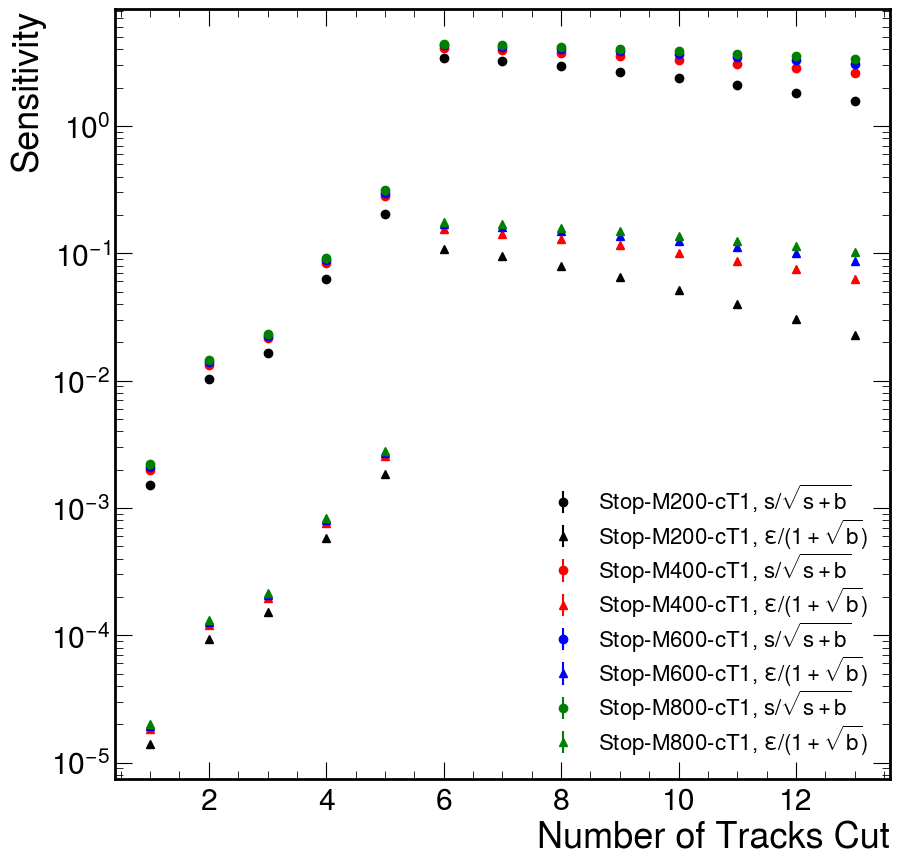

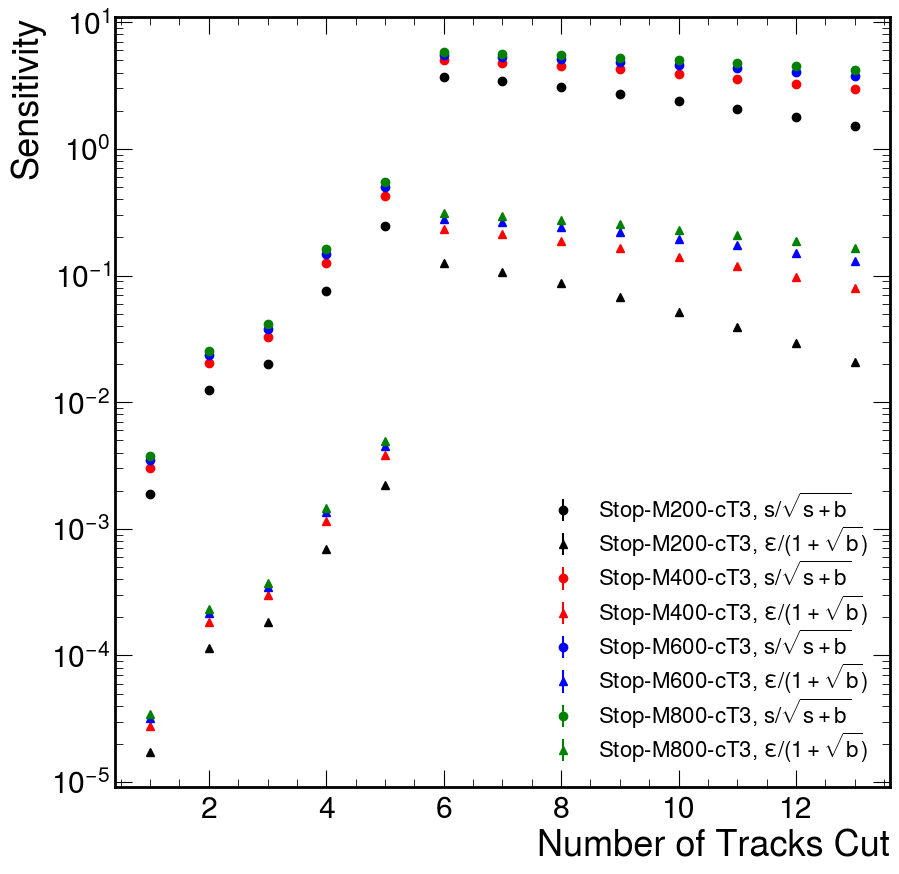

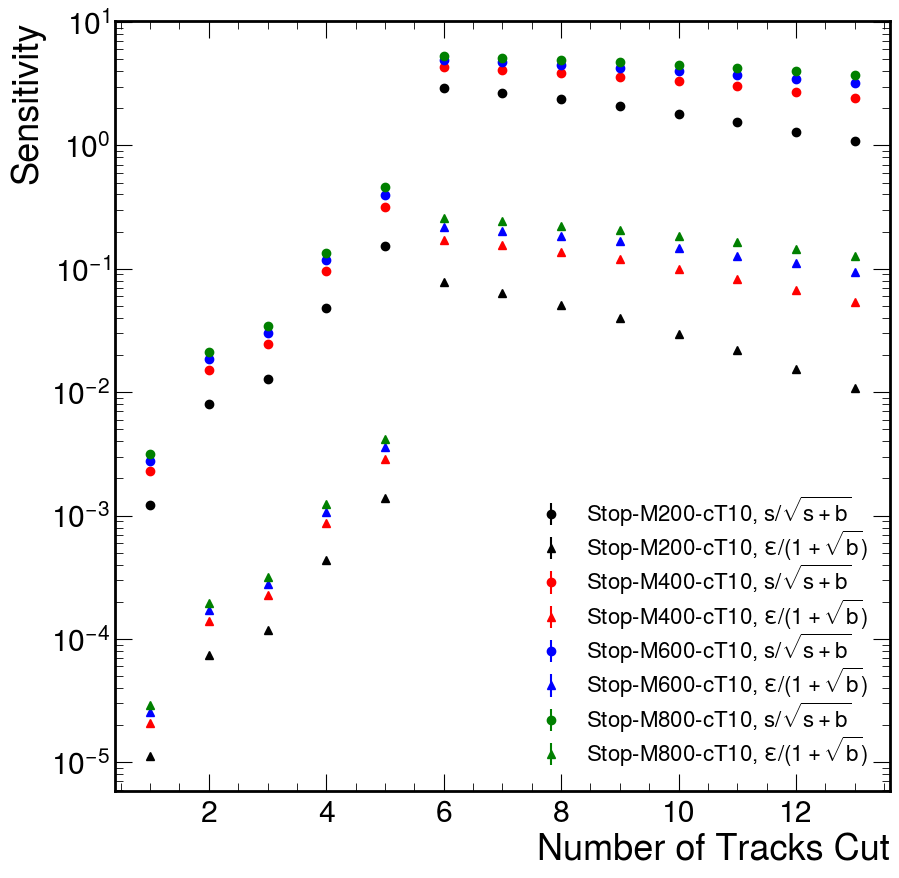

Total runtime: 13.79 seconds
best traditional sensitivity for signal Stop-M200-cT1 is 3.4318486934222032 requiring > 6.0 tracks and < 0.006000 uncertainty
best traditional sensitivity for signal Stop-M400-cT1 is 4.107476889770223 requiring > 6.0 tracks and < 0.006000 uncertainty
best traditional sensitivity for signal Stop-M600-cT1 is 4.2929587000105105 requiring > 6.0 tracks and < 0.006000 uncertainty
best traditional sensitivity for signal Stop-M800-cT1 is 4.387105469440603 requiring > 6.0 tracks and < 0.006000 uncertainty
best traditional sensitivity for signal Stop-M200-cT3 is 3.7009946771101343 requiring > 6.0 tracks and < 0.006000 uncertainty
best traditional sensitivity for signal Stop-M400-cT3 is 5.0204497239645125 requiring > 6.0 tracks and < 0.006000 uncertainty
best traditional sensitivity for signal Stop-M600-cT3 is 5.523279895134032 requiring > 6.0 tracks and < 0.006000 uncertainty
best traditional sensitivity for signal Stop-M800-cT3 is 5.803049180715706 requiring > 6.0 t

In [8]:
#Sensitivity Search Script
import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed

errCutValues = [0.006]
nTrackCutValues = np.linspace(1,13,13)
print(errCutValues)

def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    with uproot.open(rootFile) as file:
        output["genWeightSum"] = {process: file["triggerFilter/genWeightsSkim"].values()[0]}
        output["weightSkimSum"] = {process: file["triggerFilter/weightsSkim"].values()[0]}
        tree = file["scoutingTree/objectTree"]
        # Select only necessary branches to load
        branches = ["weight","scoutVert_dBV","scoutVert_dBVErr","scoutVert_nTracks"]
        weightSum = np.zeros_like(nTrackCutValues)
        weightSumSquared = np.zeros_like(nTrackCutValues)
        
        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        for batch in tree.iterate(branches, library="ak", step_size=100000):  
            weights = batch["weight"]  # event weights

            dBVErr = batch["scoutVert_dBVErr"]
            dBV = batch["scoutVert_dBV"]
            ntracks = batch["scoutVert_nTracks"]
            mask = dBVErr < errCutValue
            dBVErr = dBVErr[mask]
            dBV = dBV[mask]
            ntracks = ntracks[mask]
            for i in range(len(nTrackCutValues)):
                mask = ntracks > nTrackCutValues[i]
                dBV = dBV[mask]
                dBVErr = dBVErr[mask]
                ntracks = ntracks[mask]
            
                mask = ak.sum(dBV>=0.1,axis=1)>0
                weights = weights[mask]
                dBV = dBV[mask]
                dBVErr = dBVErr[mask]
                ntracks = ntracks[mask]
                weightSum[i] += ak.sum(weights)
                weightSumSquared[i] += ak.sum(weights**2)
        output["weightSum"] = {process: weightSum}
        output["weightSumSquared"] = {process: weightSumSquared}
            
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        results[plot][process] = results[plot].get(process, np.zeros_like(nTrackCutValues)) + result[plot][process]

    return results

t0 = time.time()

bestEfficiencySensitivity = {"Stop-M200-cT1": [0,0,0], "Stop-M400-cT1": [0,0,0], "Stop-M600-cT1": [0,0,0], "Stop-M800-cT1": [0,0,0], "Stop-M200-cT3": [0,0,0], "Stop-M400-cT3": [0,0,0], "Stop-M600-cT3": [0,0,0], "Stop-M800-cT3": [0,0,0], "Stop-M200-cT10": [0,0,0], "Stop-M400-cT10": [0,0,0], "Stop-M600-cT10": [0,0,0], "Stop-M800-cT10": [0,0,0]}
bestTraditionalSensitivity = {"Stop-M200-cT1": [0,0,0], "Stop-M400-cT1": [0,0,0], "Stop-M600-cT1": [0,0,0], "Stop-M800-cT1": [0,0,0], "Stop-M200-cT3": [0,0,0], "Stop-M400-cT3": [0,0,0], "Stop-M600-cT3": [0,0,0], "Stop-M800-cT3": [0,0,0], "Stop-M200-cT10": [0,0,0], "Stop-M400-cT10": [0,0,0], "Stop-M600-cT10": [0,0,0], "Stop-M800-cT10": [0,0,0]}
for errCutValue in errCutValues:
    print("errCutValue",errCutValue)
    bgPlotWeights = parallel_processing(processDict)
    sigPlotWeights = parallel_processing(signalDict)

    #Combining Background Subprocesses and Reweighting Events
    for process in bgPlotWeights["genWeightSum"].keys():
        bgPlotWeights["weightSum"][process] = bgPlotWeights["weightSum"][process] / bgPlotWeights["genWeightSum"][process]
        bgPlotWeights["weightSkimSum"][process] = bgPlotWeights["weightSkimSum"][process] / bgPlotWeights["genWeightSum"][process]
        bgPlotWeights["weightSumSquared"][process] = bgPlotWeights["weightSumSquared"][process] / (bgPlotWeights["genWeightSum"][process]**2)
    bgPlotWeights["weightSum"]["QCD"] = bgPlotWeights["weightSum"]["QCD200to400"]+bgPlotWeights["weightSum"]["QCD400to600"]+bgPlotWeights["weightSum"]["QCD600to800"]+bgPlotWeights["weightSum"]["QCD800to1000"]+bgPlotWeights["weightSum"]["QCD1000to1200"]+bgPlotWeights["weightSum"]["QCD1200to1500"]+bgPlotWeights["weightSum"]["QCD1500to2000"]+bgPlotWeights["weightSum"]["QCD2000"]
    bgPlotWeights["weightSumSquared"]["QCD"] = bgPlotWeights["weightSumSquared"]["QCD200to400"]+bgPlotWeights["weightSumSquared"]["QCD400to600"]+bgPlotWeights["weightSumSquared"]["QCD600to800"]+bgPlotWeights["weightSumSquared"]["QCD800to1000"]+bgPlotWeights["weightSumSquared"]["QCD1000to1200"]+bgPlotWeights["weightSumSquared"]["QCD1200to1500"]+bgPlotWeights["weightSumSquared"]["QCD1500to2000"]+bgPlotWeights["weightSumSquared"]["QCD2000"]
    bgPlotWeights["weightSum"]["TTbar"] = bgPlotWeights["weightSum"]["TTTo4Q"]+bgPlotWeights["weightSum"]["TTToLNu2Q"]
    bgPlotWeights["weightSumSquared"]["TTbar"] = bgPlotWeights["weightSumSquared"]["TTTo4Q"]+bgPlotWeights["weightSumSquared"]["TTToLNu2Q"]
    for process in sigPlotWeights["genWeightSum"].keys():
        sigPlotWeights["weightSum"][process] = sigPlotWeights["weightSum"][process] / sigPlotWeights["genWeightSum"][process]
        sigPlotWeights["weightSkimSum"][process] = sigPlotWeights["weightSkimSum"][process] / sigPlotWeights["genWeightSum"][process]
        sigPlotWeights["weightSumSquared"][process] = sigPlotWeights["weightSumSquared"][process] / (sigPlotWeights["genWeightSum"][process]**2)

    # **Plotting**
    for lifetime in ["1","3","10"]:
        fig, ax = plt.subplots()
        colors = {"Stop-M200-cT"+lifetime: "black", "Stop-M400-cT"+lifetime: "red", "Stop-M600-cT"+lifetime: "blue", "Stop-M800-cT"+lifetime: "green"}
        for signal, color in colors.items():
            sensitivity = sigPlotWeights["weightSum"][signal] / np.sqrt(sigPlotWeights["weightSum"][signal]+bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"])
            if(np.max(sensitivity)>bestTraditionalSensitivity[signal][0]): 
                bestTraditionalSensitivity[signal] = [np.max(sensitivity),errCutValue,nTrackCutValues[np.argmax(sensitivity)]]
            efficiency = sigPlotWeights["weightSum"][signal] / sigPlotWeights["weightSkimSum"][signal]
            ax.errorbar(nTrackCutValues, sensitivity, yerr=np.zeros_like(sensitivity), linestyle="none",marker="o", color=color,label=signal+", s/$\sqrt{s+b}$")
            sensitivity = efficiency / (1+np.sqrt(bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"]))
            if(np.max(sensitivity)>bestEfficiencySensitivity[signal][0]): 
                bestEfficiencySensitivity[signal] = [np.max(sensitivity),errCutValue,nTrackCutValues[np.argmax(sensitivity)]]
            ax.errorbar(nTrackCutValues, sensitivity, yerr=np.zeros_like(sensitivity), linestyle="none",marker="^", color=color,label=signal+", $\epsilon/(1+\sqrt{b})$")
            #sensitivity = np.sqrt(2*((sigPlotWeights["weightSum"][signal]+bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"])*np.log(1+(sigPlotWeights["weightSum"][signal]/(bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"])))-sigPlotWeights["weightSum"][signal]))
            #ax.errorbar(nTrackCutValues, sensitivity, yerr=np.zeros_like(sensitivity), linestyle="none",marker="x", color=color)

        ax.set_ylabel("Sensitivity")
        plt.xlabel("Number of Tracks Cut")
        ax.legend(labelspacing=0,prop={'size': 16})
        ax.set_yscale("log")
        plt.show()
    
t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")
for signal, cuts in bestTraditionalSensitivity.items():
    print("best traditional sensitivity for signal",signal,"is",cuts[0],"requiring >",cuts[2],"tracks and <",f"{cuts[1]:3f}","uncertainty")
for signal, cuts in bestEfficiencySensitivity.items():
    print("best efficiency sensitivity for signal",signal,"is",cuts[0],"requiring >",cuts[2],"tracks and <",f"{cuts[1]:3f}","uncertainty")

[9.999e+02 2.000e-02 1.900e-02 1.800e-02 1.700e-02 1.600e-02 1.500e-02
 1.400e-02 1.300e-02 1.200e-02 1.100e-02 1.000e-02 9.000e-03 8.000e-03
 7.000e-03 6.000e-03 5.000e-03 4.000e-03 3.000e-03 2.000e-03 1.000e-03]
Processing /eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v15-MoreStats/250703_093551/TTto4Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v15-MoreStats/250703_093607/TTtoLNu2Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v15-MoreStats/250703_093717/QCD-4Jets_Bin-HT-200to400.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v15-MoreStats/250703_093623/QCD-4Jets_Bin-HT-1000to1200.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_B

/tmp/rmccarth/ipykernel_2483430/2461439275.py:119: RuntimeWarning: divide by zero encountered in divide
  sensitivity = np.sqrt(2*((sigPlotWeights["weightSum"][signal]+bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"])*np.log(1+(sigPlotWeights["weightSum"][signal]/(bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"])))-sigPlotWeights["weightSum"][signal]))


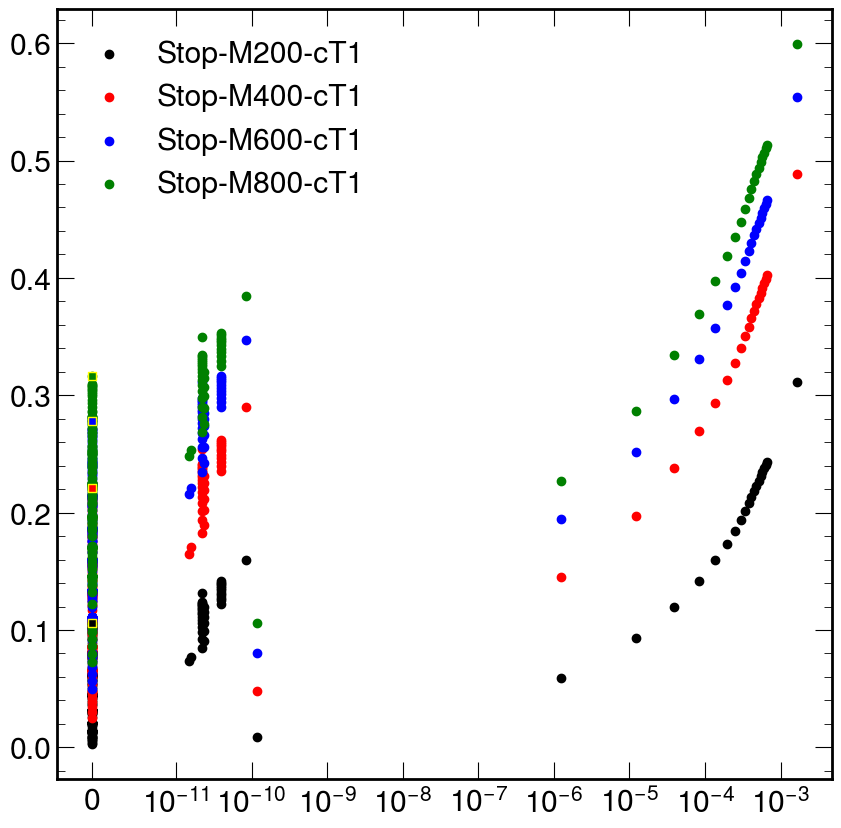

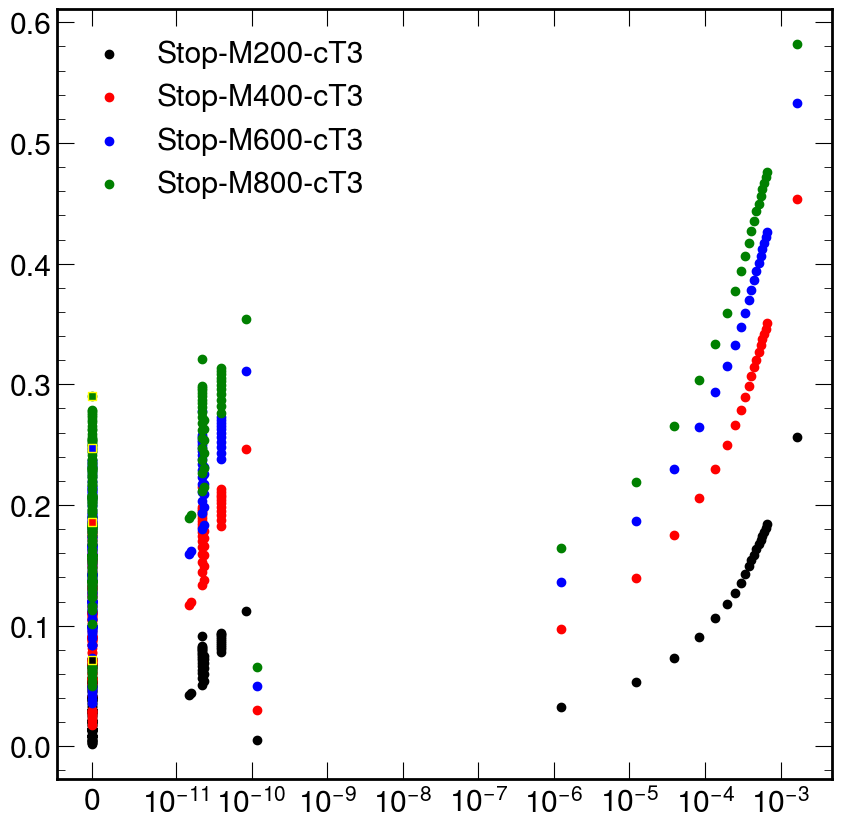

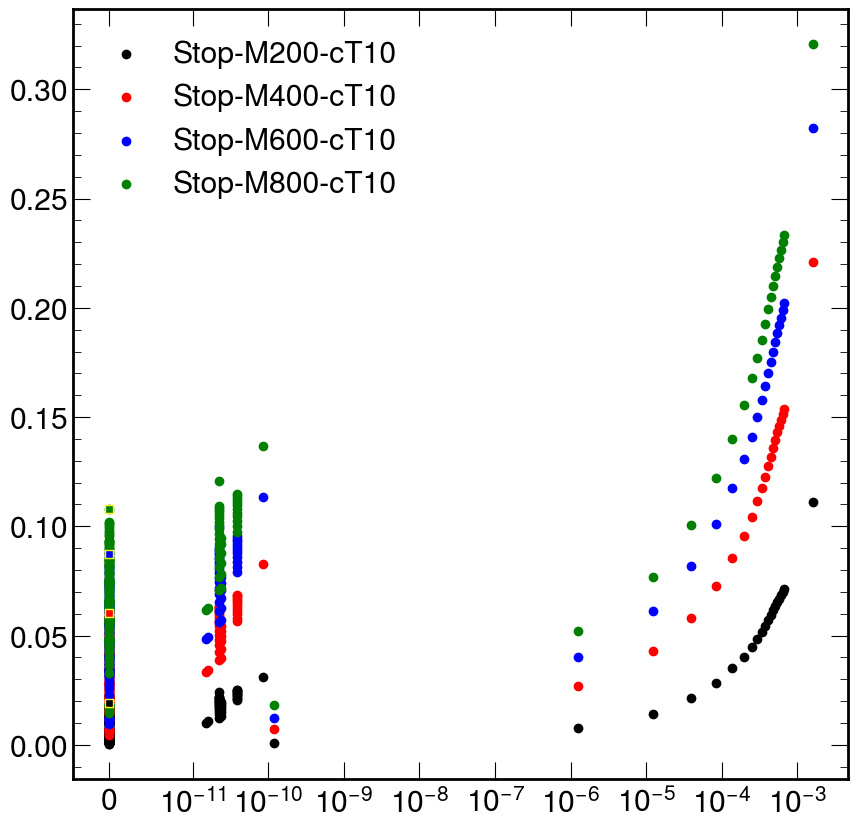

Total runtime: 562.21 seconds
best traditional sensitivity for signal Stop-M200-cT1 is 3.3971981325076492 requiring > 4.0 tracks and < 999.900000 uncertainty
best traditional sensitivity for signal Stop-M400-cT1 is 4.9069319131198466 requiring > 4.0 tracks and < 999.900000 uncertainty
best traditional sensitivity for signal Stop-M600-cT1 is 5.503319143934129 requiring > 4.0 tracks and < 999.900000 uncertainty
best traditional sensitivity for signal Stop-M800-cT1 is 5.872279012444014 requiring > 4.0 tracks and < 999.900000 uncertainty
best traditional sensitivity for signal Stop-M200-cT3 is 2.7995522499141807 requiring > 4.0 tracks and < 999.900000 uncertainty
best traditional sensitivity for signal Stop-M400-cT3 is 4.504530785241198 requiring > 4.0 tracks and < 999.900000 uncertainty
best traditional sensitivity for signal Stop-M600-cT3 is 5.189570618075548 requiring > 4.0 tracks and < 999.900000 uncertainty
best traditional sensitivity for signal Stop-M800-cT3 is 5.626238970079842 req

In [52]:
#Improved Sensitivity Search Script
import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed

#Cuts need to go from loosest to tightest
errCutValues = np.concatenate(([999.9],np.linspace(0.001,0.02,20)[::-1]))
nTrackCutValues = np.linspace(1,10,10)
print(errCutValues)

def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    with uproot.open(rootFile) as file:
        output["genWeightSum"] = {process: file["triggerFilter/genWeightsSkim"].values()[0]}
        output["weightSkimSum"] = {process: file["triggerFilter/weightsSkim"].values()[0]}
        tree = file["scoutingTree/objectTree"]
        # Select only necessary branches to load
        branches = ["weight","scoutVert_dBV","scoutVert_dBVErr","scoutVert_nTracks"]
        weightSum = np.zeros((len(errCutValues),len(nTrackCutValues)))
        weightSumSquared = np.zeros((len(errCutValues),len(nTrackCutValues)))
        
        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        for batch in tree.iterate(branches, library="ak", step_size=100000):
            weights = batch["weight"]  # event weights
            dBVErr = batch["scoutVert_dBVErr"]
            dBV = batch["scoutVert_dBV"]
            ntracks = batch["scoutVert_nTracks"]
            for i in range(len(errCutValues)):
                mask = dBVErr < errCutValues[i]
                dBVErr = dBVErr[mask]
                dBV = dBV[mask]
                ntracks = ntracks[mask]
                for j in range(len(nTrackCutValues)):
                    mask = ntracks > nTrackCutValues[j]
                    dBVMasked = dBV[mask]
                    dBVErrMasked = dBVErr[mask]
                    ntracksMasked = ntracks[mask]
            
                    mask = ak.sum((dBVMasked>=0.01)&(dBVMasked<2.0),axis=1)>1
                    weightsMasked = weights[mask]
                    dBVMasked = dBVMasked[mask]
                    dBVErrMasked = dBVErrMasked[mask]
                    ntracksMasked = ntracksMasked[mask]
                    weightSum[i][j] += ak.sum(weightsMasked)
                    weightSumSquared[i][j] += ak.sum(weightsMasked**2)
        output["weightSum"] = {process: weightSum}
        output["weightSumSquared"] = {process: weightSumSquared}
            
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        if process not in results[plot]:
                             results[plot][process] = result[plot][process]
                        else:
                            results[plot][process] = results[plot][process] + result[plot][process]

    return results

t0 = time.time()

bestEfficiencySensitivity = {"Stop-M200-cT1": [0,0,0], "Stop-M400-cT1": [0,0,0], "Stop-M600-cT1": [0,0,0], "Stop-M800-cT1": [0,0,0], "Stop-M200-cT3": [0,0,0], "Stop-M400-cT3": [0,0,0], "Stop-M600-cT3": [0,0,0], "Stop-M800-cT3": [0,0,0], "Stop-M200-cT10": [0,0,0], "Stop-M400-cT10": [0,0,0], "Stop-M600-cT10": [0,0,0], "Stop-M800-cT10": [0,0,0]}
bestTraditionalSensitivity = {"Stop-M200-cT1": [0,0,0], "Stop-M400-cT1": [0,0,0], "Stop-M600-cT1": [0,0,0], "Stop-M800-cT1": [0,0,0], "Stop-M200-cT3": [0,0,0], "Stop-M400-cT3": [0,0,0], "Stop-M600-cT3": [0,0,0], "Stop-M800-cT3": [0,0,0], "Stop-M200-cT10": [0,0,0], "Stop-M400-cT10": [0,0,0], "Stop-M600-cT10": [0,0,0], "Stop-M800-cT10": [0,0,0]}

bgPlotWeights = parallel_processing(processDict)
sigPlotWeights = parallel_processing(signalDict)

#Combining Background Subprocesses and Reweighting Events
for process in bgPlotWeights["genWeightSum"].keys():
    bgPlotWeights["weightSum"][process] = bgPlotWeights["weightSum"][process] / bgPlotWeights["genWeightSum"][process]
    bgPlotWeights["weightSkimSum"][process] = bgPlotWeights["weightSkimSum"][process] / bgPlotWeights["genWeightSum"][process]
    bgPlotWeights["weightSumSquared"][process] = bgPlotWeights["weightSumSquared"][process] / (bgPlotWeights["genWeightSum"][process]**2)
bgPlotWeights["weightSum"]["QCD"] = bgPlotWeights["weightSum"]["QCD200to400"]+bgPlotWeights["weightSum"]["QCD400to600"]+bgPlotWeights["weightSum"]["QCD600to800"]+bgPlotWeights["weightSum"]["QCD800to1000"]+bgPlotWeights["weightSum"]["QCD1000to1200"]+bgPlotWeights["weightSum"]["QCD1200to1500"]+bgPlotWeights["weightSum"]["QCD1500to2000"]+bgPlotWeights["weightSum"]["QCD2000"]
bgPlotWeights["weightSkimSum"]["QCD"] = bgPlotWeights["weightSkimSum"]["QCD200to400"]+bgPlotWeights["weightSkimSum"]["QCD400to600"]+bgPlotWeights["weightSkimSum"]["QCD600to800"]+bgPlotWeights["weightSkimSum"]["QCD800to1000"]+bgPlotWeights["weightSkimSum"]["QCD1000to1200"]+bgPlotWeights["weightSkimSum"]["QCD1200to1500"]+bgPlotWeights["weightSkimSum"]["QCD1500to2000"]+bgPlotWeights["weightSkimSum"]["QCD2000"]
bgPlotWeights["weightSumSquared"]["QCD"] = bgPlotWeights["weightSumSquared"]["QCD200to400"]+bgPlotWeights["weightSumSquared"]["QCD400to600"]+bgPlotWeights["weightSumSquared"]["QCD600to800"]+bgPlotWeights["weightSumSquared"]["QCD800to1000"]+bgPlotWeights["weightSumSquared"]["QCD1000to1200"]+bgPlotWeights["weightSumSquared"]["QCD1200to1500"]+bgPlotWeights["weightSumSquared"]["QCD1500to2000"]+bgPlotWeights["weightSumSquared"]["QCD2000"]
bgPlotWeights["weightSum"]["TTbar"] = bgPlotWeights["weightSum"]["TTTo4Q"]+bgPlotWeights["weightSum"]["TTToLNu2Q"]
bgPlotWeights["weightSkimSum"]["TTbar"] = bgPlotWeights["weightSkimSum"]["TTTo4Q"]+bgPlotWeights["weightSkimSum"]["TTToLNu2Q"]
bgPlotWeights["weightSumSquared"]["TTbar"] = bgPlotWeights["weightSumSquared"]["TTTo4Q"]+bgPlotWeights["weightSumSquared"]["TTToLNu2Q"]
for process in sigPlotWeights["genWeightSum"].keys():
    sigPlotWeights["weightSum"][process] = sigPlotWeights["weightSum"][process] / sigPlotWeights["genWeightSum"][process]
    sigPlotWeights["weightSkimSum"][process] = sigPlotWeights["weightSkimSum"][process] / sigPlotWeights["genWeightSum"][process]
    sigPlotWeights["weightSumSquared"][process] = sigPlotWeights["weightSumSquared"][process] / (sigPlotWeights["genWeightSum"][process]**2)

# **Plotting**
for lifetime in ["1","3","10"]:
    fig, ax = plt.subplots()
    colors = {"Stop-M200-cT"+lifetime: "black", "Stop-M400-cT"+lifetime: "red", "Stop-M600-cT"+lifetime: "blue", "Stop-M800-cT"+lifetime: "green"}
    for signal, color in colors.items():
        sensitivity = sigPlotWeights["weightSum"][signal] / np.sqrt(sigPlotWeights["weightSum"][signal]+bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"])
        if(np.max(sensitivity)>bestTraditionalSensitivity[signal][0]): 
            ind = np.unravel_index(np.argmax(sensitivity, axis=None), sensitivity.shape)
            bestTraditionalSensitivity[signal] = [np.max(sensitivity),errCutValues[ind[0]],nTrackCutValues[ind[1]]]
        efficiency = sigPlotWeights["weightSum"][signal] / sigPlotWeights["weightSkimSum"][signal]
        fpr = (bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"]) / (bgPlotWeights["weightSkimSum"]["QCD"]+bgPlotWeights["weightSkimSum"]["TTbar"])
        #ax.errorbar(nTrackCutValues, sensitivity, yerr=np.zeros_like(sensitivity), linestyle="none",marker="o", color=color,label=signal)
        sensitivity = efficiency / (1+np.sqrt(bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"]))
        if(np.max(sensitivity)>bestEfficiencySensitivity[signal][0]): 
            ind = np.unravel_index(np.argmax(sensitivity, axis=None), sensitivity.shape)
            bestEfficiencySensitivity[signal] = [np.max(sensitivity),errCutValues[ind[0]],nTrackCutValues[ind[1]]]
        #ax.errorbar(nTrackCutValues, sensitivity, yerr=np.zeros_like(sensitivity), linestyle="none",marker="^", color=color)
        sensitivity = np.sqrt(2*((sigPlotWeights["weightSum"][signal]+bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"])*np.log(1+(sigPlotWeights["weightSum"][signal]/(bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"])))-sigPlotWeights["weightSum"][signal]))
        #ax.errorbar(nTrackCutValues, sensitivity, yerr=np.zeros_like(sensitivity), linestyle="none",marker="x", color=color)
        ax.scatter(fpr,efficiency,label=signal,color=color,zorder=1)
        ax.scatter(fpr[ind],efficiency[ind],marker="s",color=color,zorder=2,edgecolor="yellow")
    #ax.set_ylabel("Sensitivity")
    #plt.xlabel("Number of Tracks Cut")
    plt.legend()
    #ax.set_xscale("log")
    plt.xscale("symlog",linthresh=10**-11)
    plt.show()
    
t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")
for signal, cuts in bestTraditionalSensitivity.items():
    print("best traditional sensitivity for signal",signal,"is",cuts[0],"requiring >",cuts[2],"tracks and <",f"{cuts[1]:3f}","uncertainty")
for signal, cuts in bestEfficiencySensitivity.items():
    print("best efficiency sensitivity for signal",signal,"is",cuts[0],"requiring >",cuts[2],"tracks and <",f"{cuts[1]:3f}","uncertainty")

Processing /eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v12GlobalTag140/250406_182644/TTto4Q.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v12GlobalTag140/250406_182723/QCD-4Jets_Bin-HT-200to400.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v12GlobalTag140/250406_182649/TTtoLNu2Q.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v12GlobalTag140/250406_182729/QCD-4Jets_Bin-HT-400to600.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v12GlobalTag140-Resubmit/250407_082848/QCD-4Jets_Bin-HT-600to800.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QC

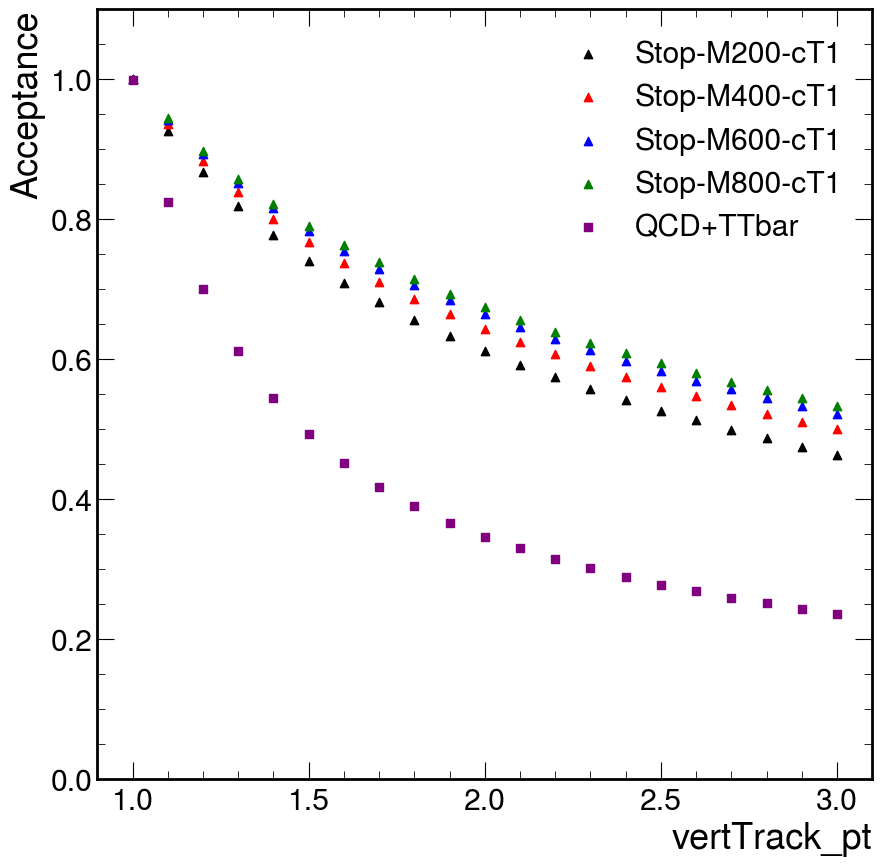

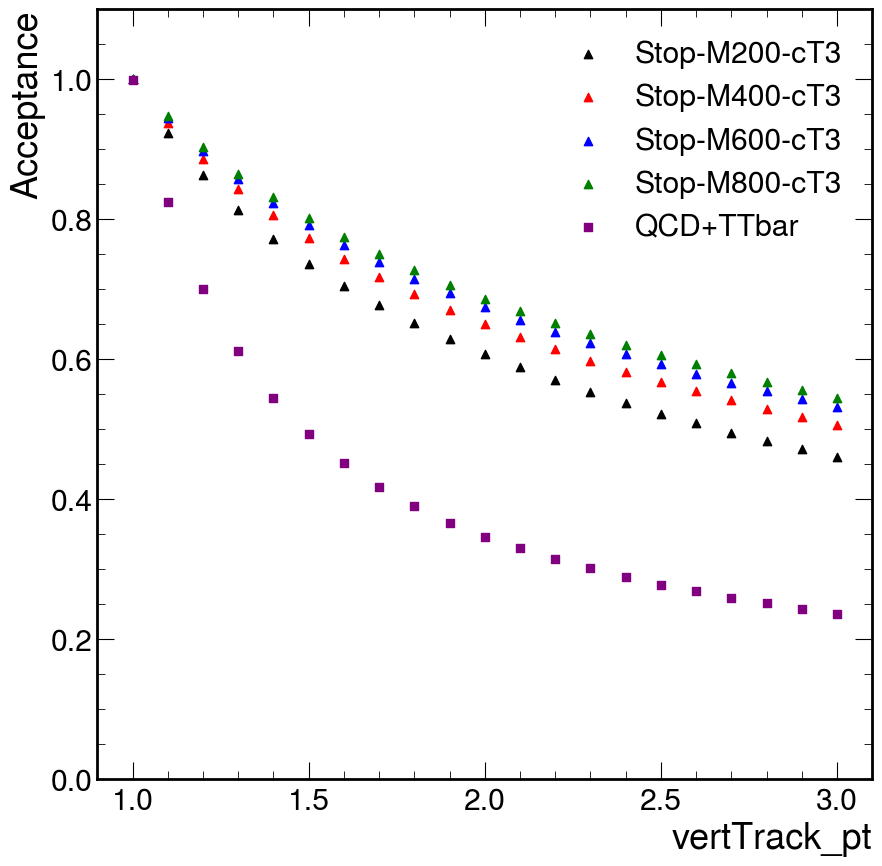

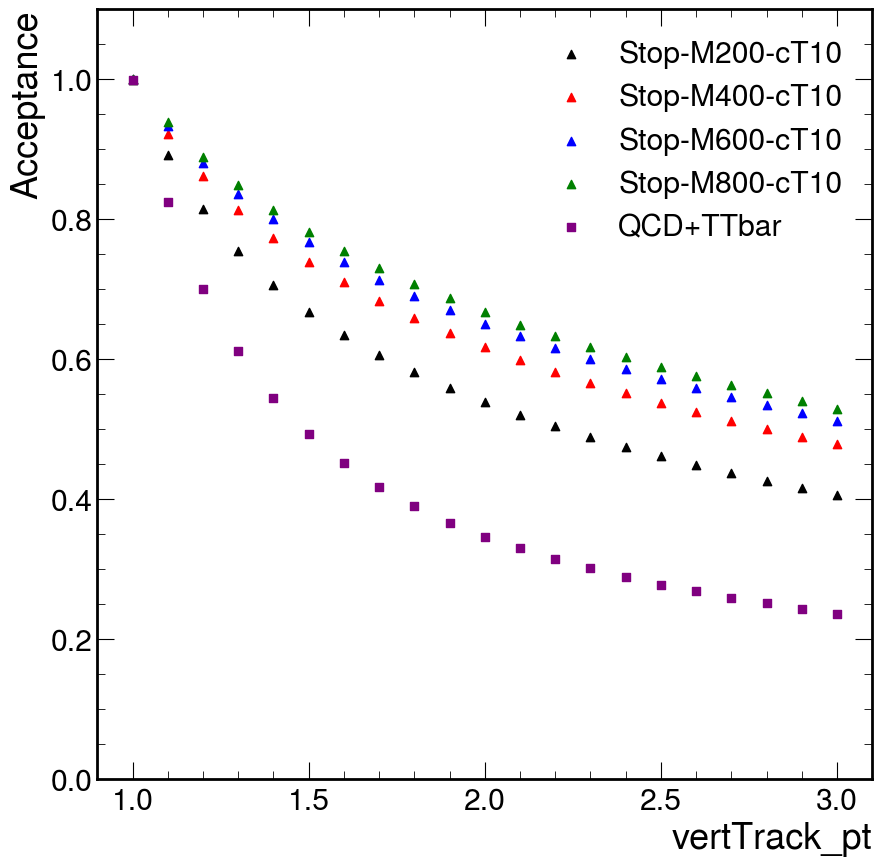

Processing /eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v12GlobalTag140/250406_182644/TTto4Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v12GlobalTag140/250406_182649/TTtoLNu2Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v12GlobalTag140/250406_182744/QCD-4Jets_Bin-HT-800to1000.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v12GlobalTag140-Resubmit/250407_082848/QCD-4Jets_Bin-HT-600to800.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v12GlobalTag140-Resubmit/250407_090131/QCD-4Jets_Bin-HT-1200to1500.root
Processing /eos/cms/store/group/phys_exoti

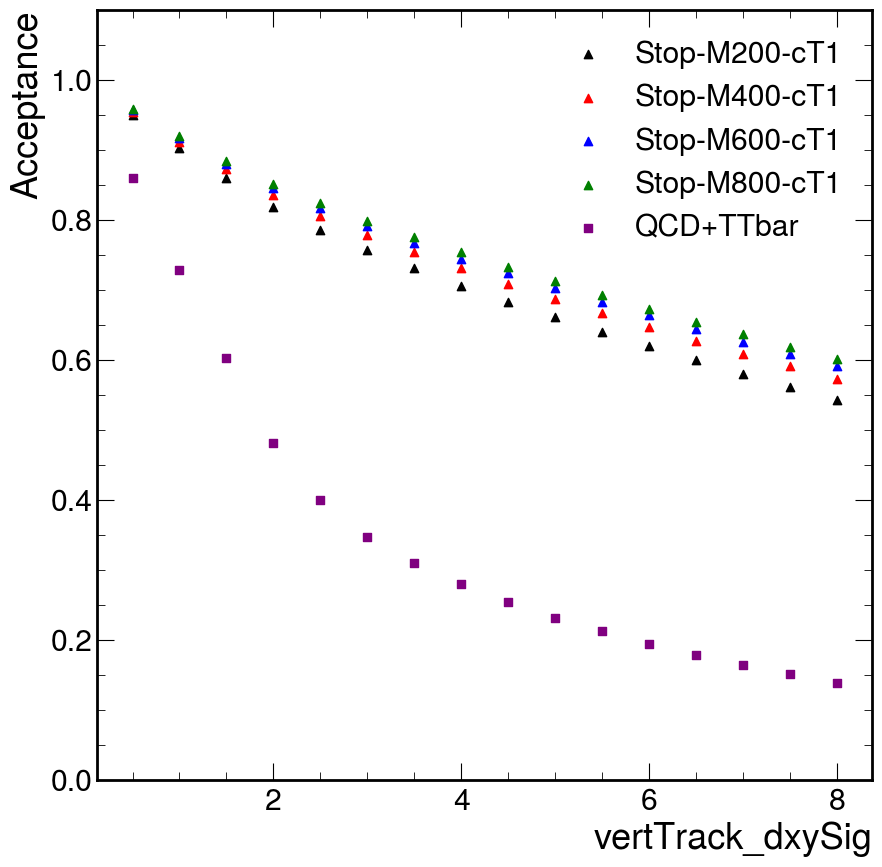

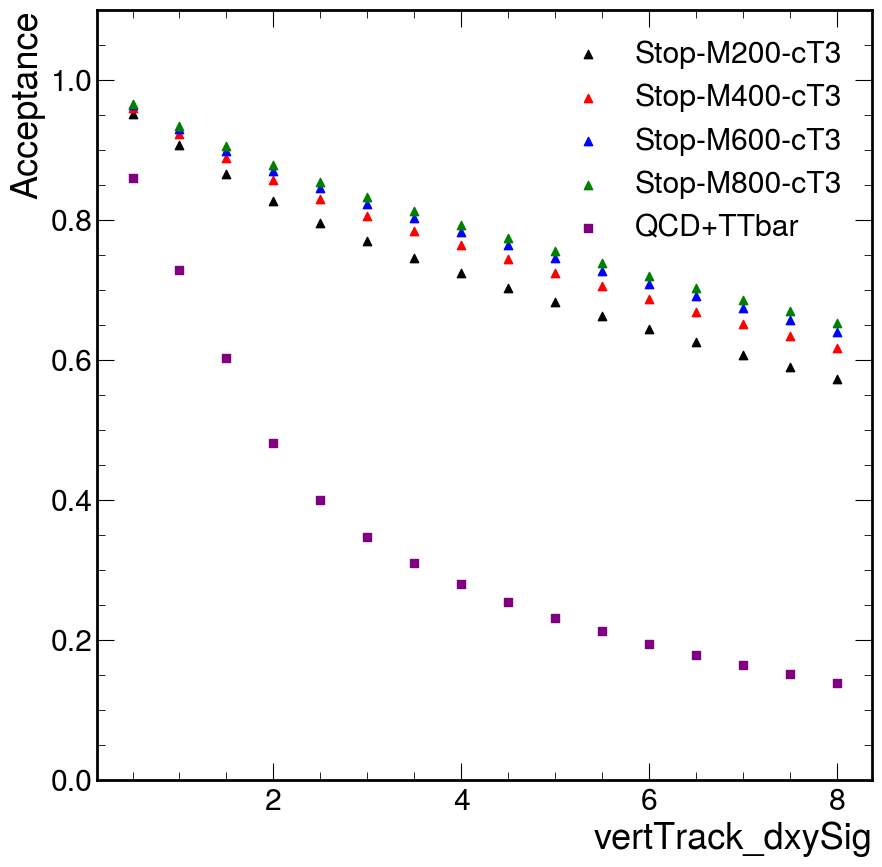

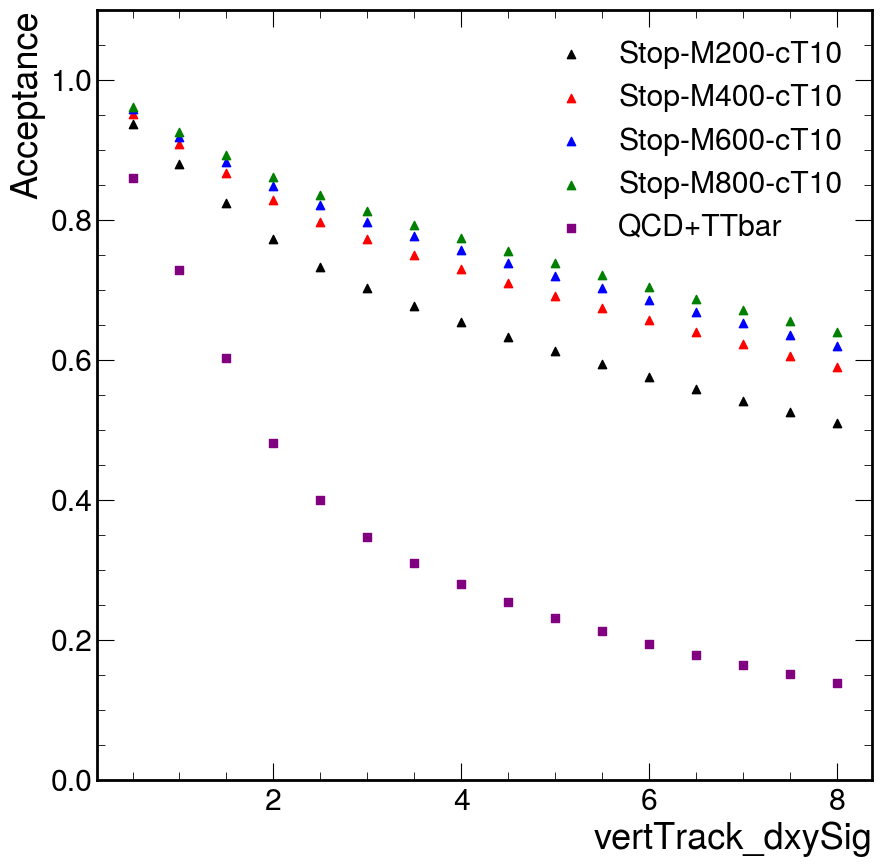

Processing /eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v12GlobalTag140/250406_182644/TTto4Q.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v12GlobalTag140-Resubmit/250407_082848/QCD-4Jets_Bin-HT-600to800.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v12GlobalTag140/250406_182744/QCD-4Jets_Bin-HT-800to1000.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v12GlobalTag140/250406_182729/QCD-4Jets_Bin-HT-400to600.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v12GlobalTag140-Resubmit/250407_090131/QCD-4Jets_Bin-HT-1200

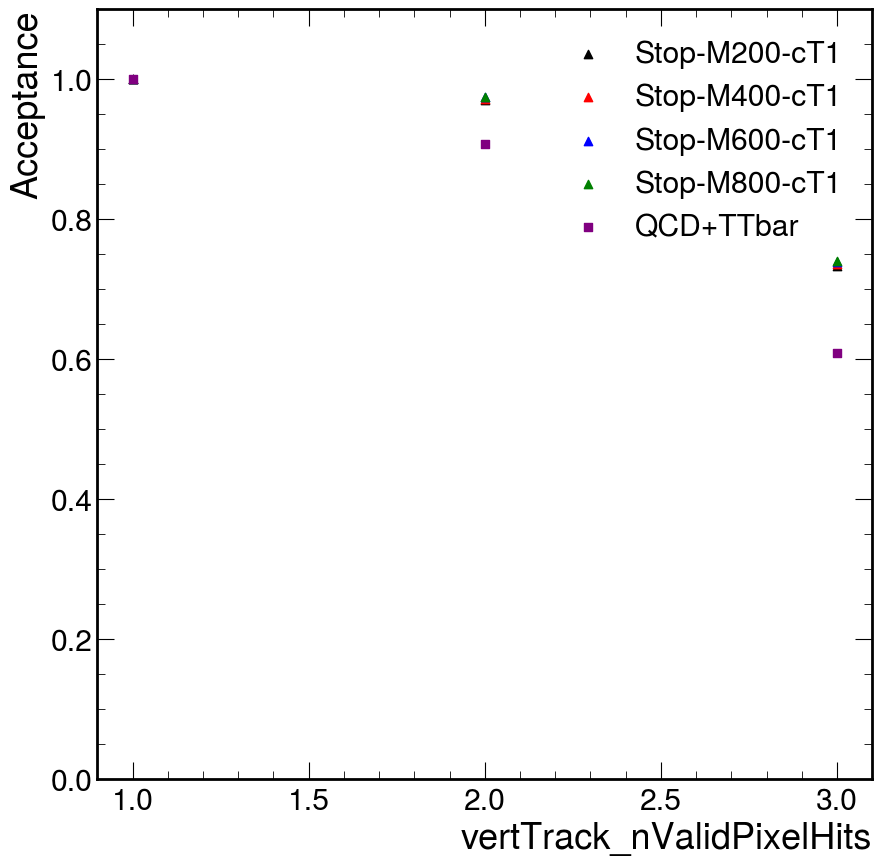

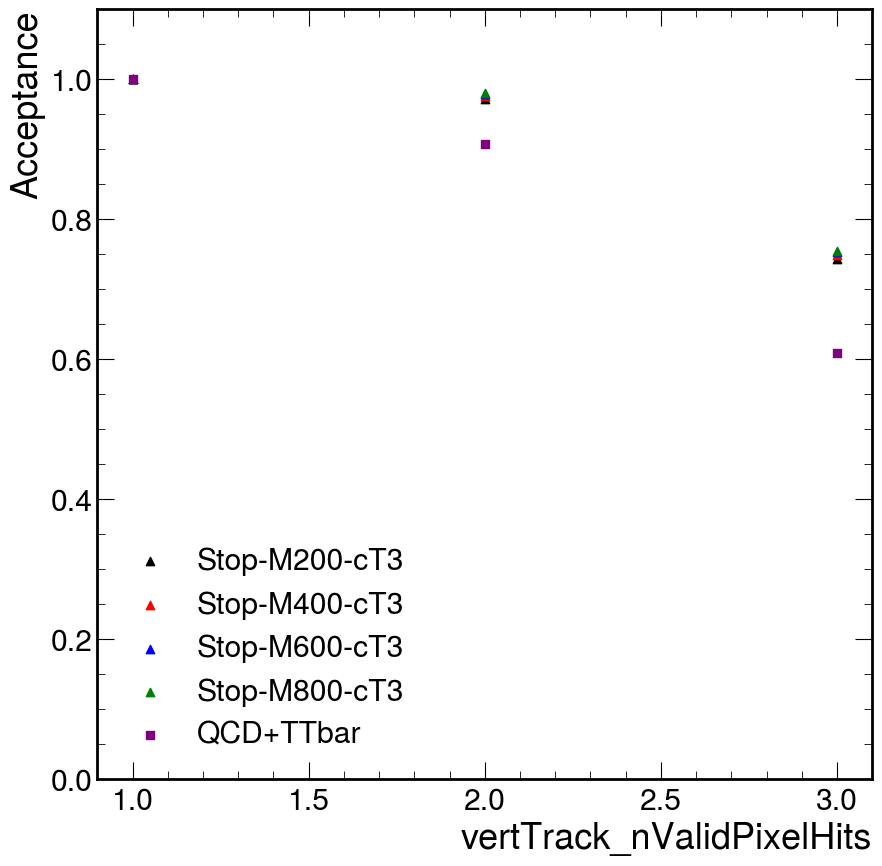

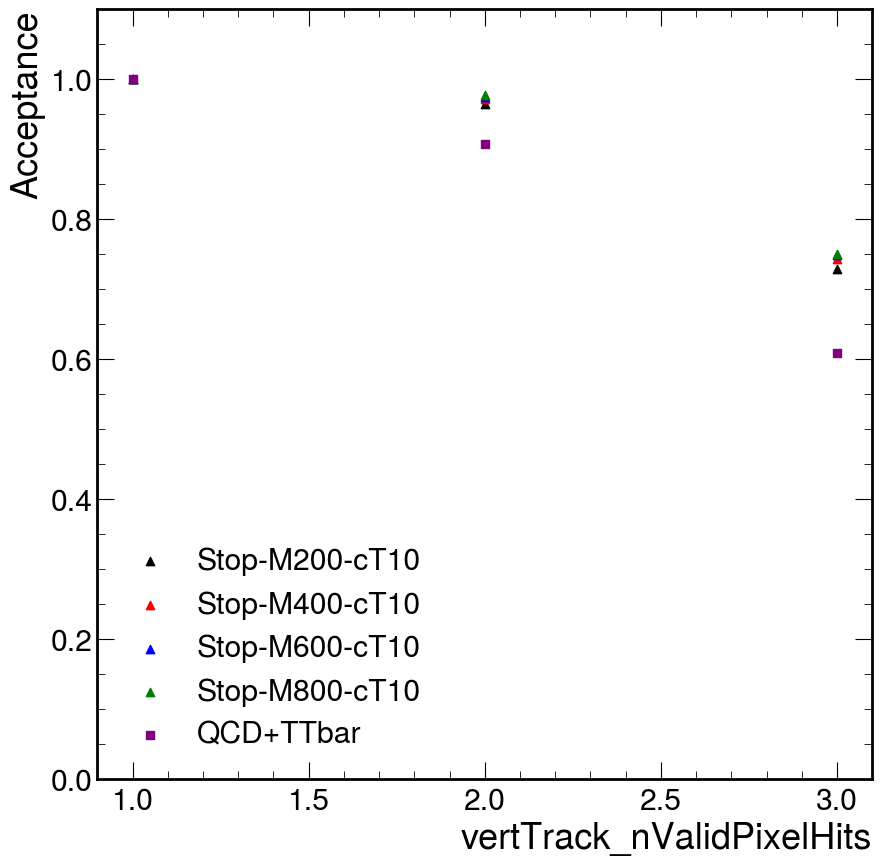

Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v12GlobalTag140/250406_182723/QCD-4Jets_Bin-HT-200to400.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v12GlobalTag140/250406_182649/TTtoLNu2Q.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v12GlobalTag140/250406_182729/QCD-4Jets_Bin-HT-400to600.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v12GlobalTag140/250406_182656/QCD-4Jets_Bin-HT-1000to1200.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v12GlobalTag140/250406_182644/TTto4Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Je

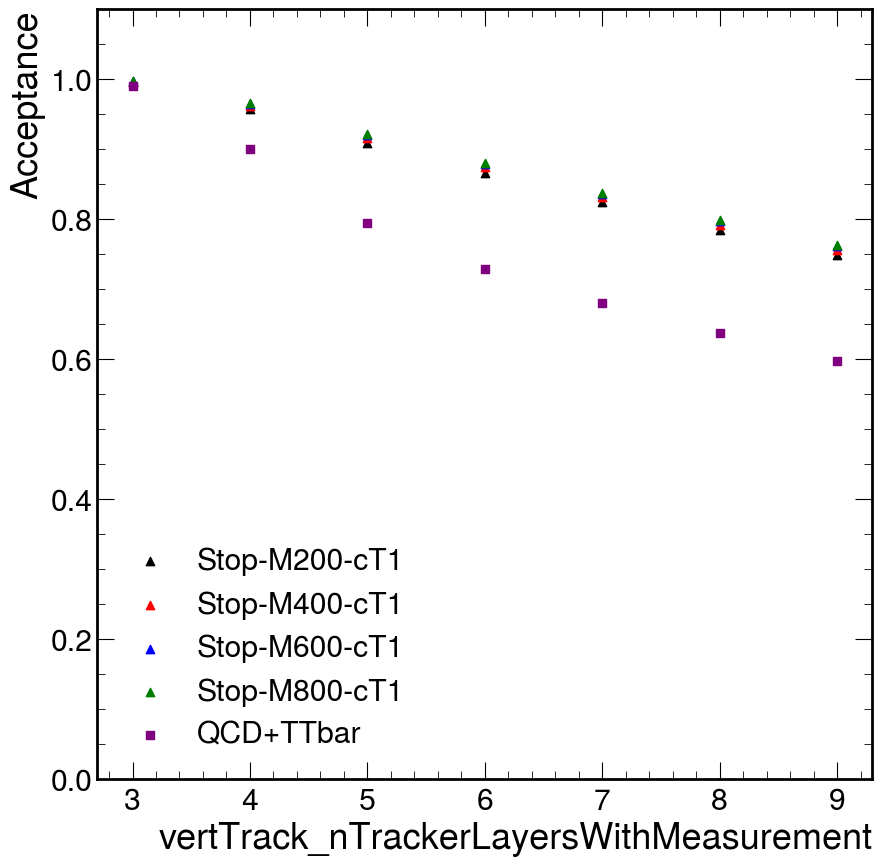

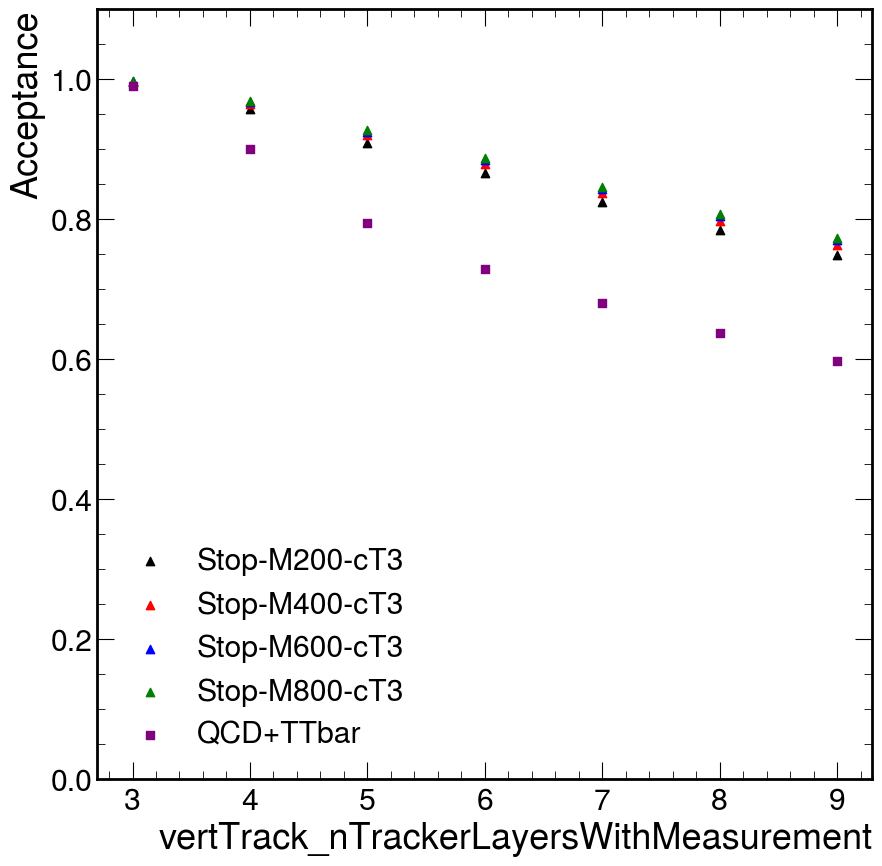

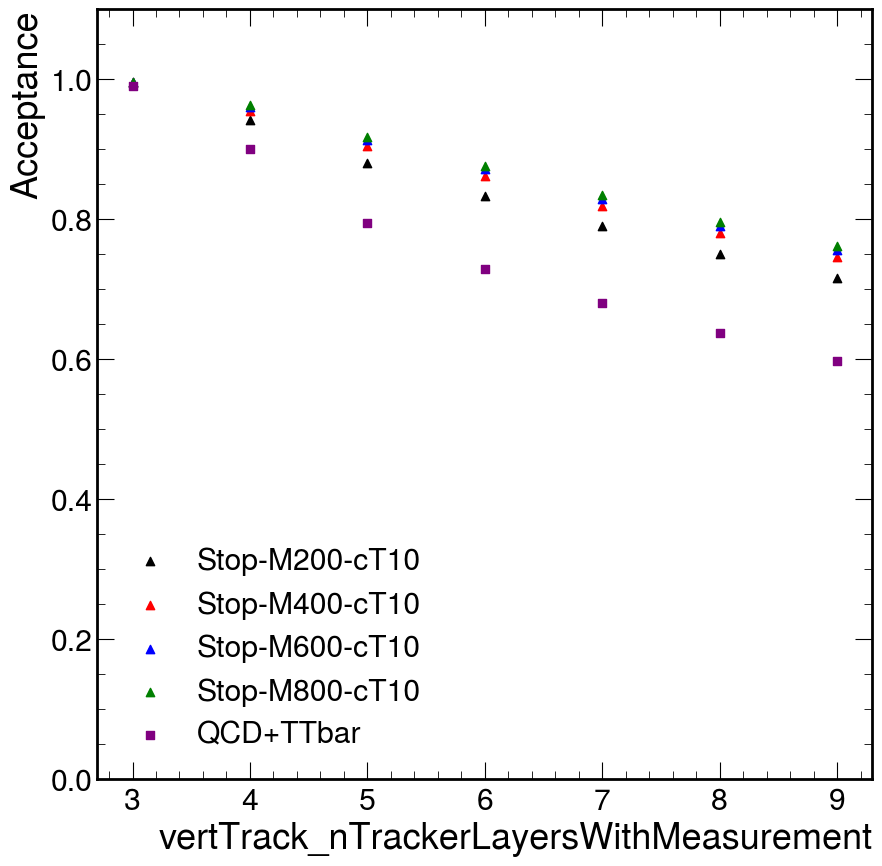

Processing /eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v12GlobalTag140/250406_182644/TTto4Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v12GlobalTag140/250406_182649/TTtoLNu2Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v12GlobalTag140-Resubmit/250407_082848/QCD-4Jets_Bin-HT-600to800.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v12GlobalTag140/250406_182656/QCD-4Jets_Bin-HT-1000to1200.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v12GlobalTag140/250406_182729/QCD-4Jets_Bin-HT-400to600.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting

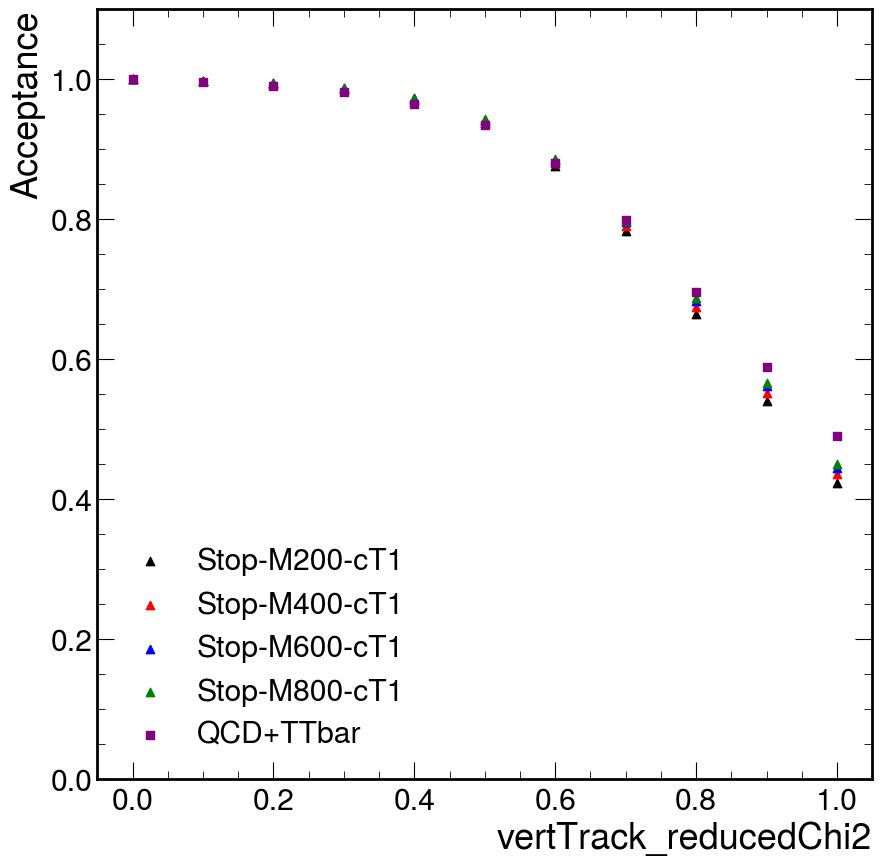

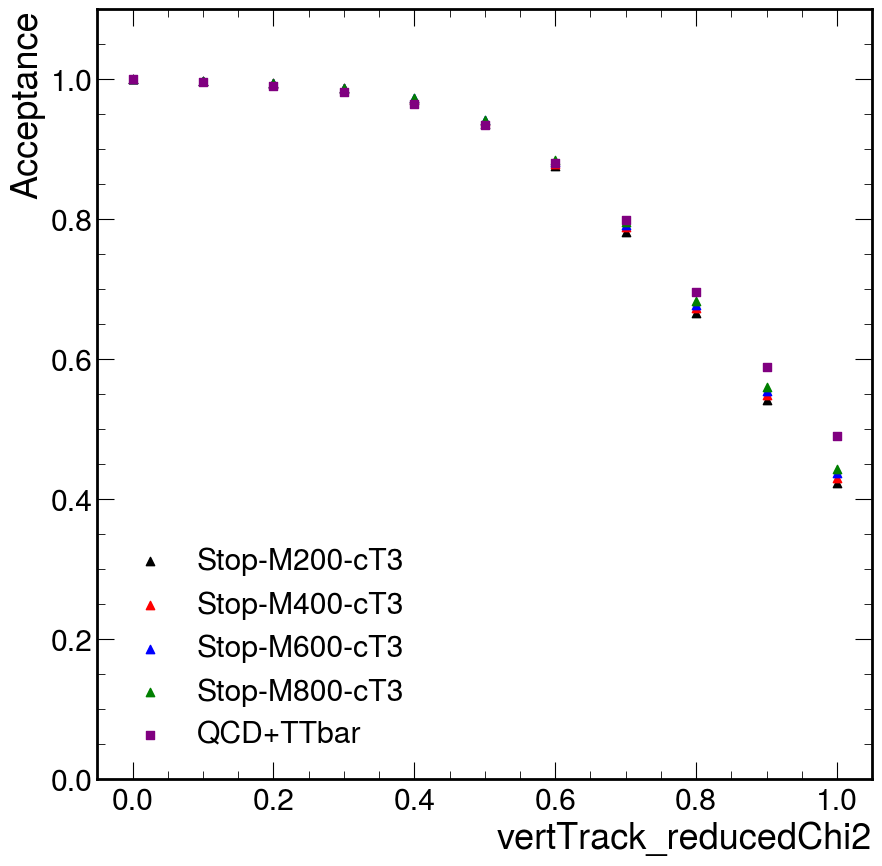

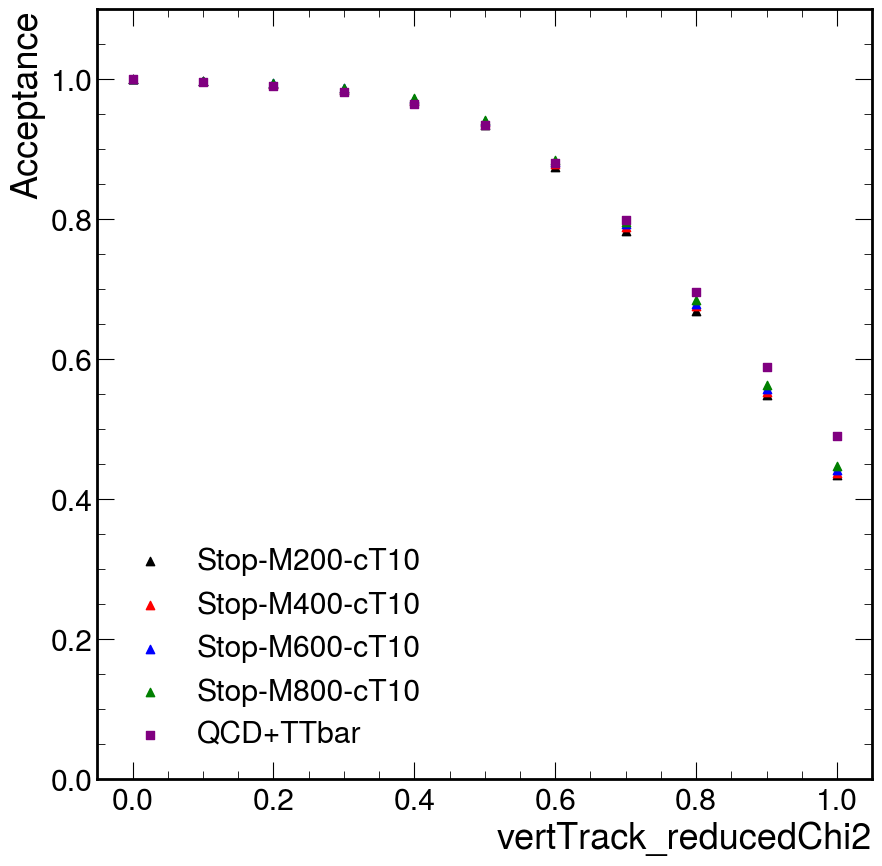

Total runtime: 65.88 seconds


In [10]:
#Track Cut Search Script
import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed

ptTrackCuts = np.linspace(1,3,21)
#dxySigCuts = np.linspace(4,8,9)
#pixelHitsCuts = np.linspace(1,3,3)
#nTrackerLayersCuts = np.linspace(5,9,5)

cutDict = {"vertTrack_pt": np.linspace(1,3,21), "vertTrack_dxySig": np.linspace(0.5,8,16), "vertTrack_nValidPixelHits": np.linspace(1,3,3), "vertTrack_nTrackerLayersWithMeasurement": np.linspace(3,9,7), "vertTrack_reducedChi2": np.linspace(0,1,11)}

def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    with uproot.open(rootFile) as file:
        output["genWeightSum"] = {process: file["triggerFilter/genWeightsSkim"].values()[0]}
        tree = file["scoutingTree/objectTree"]
        # Select only necessary branches to load
        branches = ["weight",branch,"vertTrack_iVtx","scoutVert_dBV"]
        #weightSum = np.zeros((len(ptTrackCuts),len(dxySigCuts),len(pixelHitsCuts),len(nTrackerLayersCuts)))
        weightSum = np.zeros((len(cuts)))
        #weightSumSquared = np.zeros((len(ptTrackCuts),len(dxySigCuts),len(pixelHitsCuts),len(nTrackerLayersCuts)))
        weightSumSquared = np.zeros((len(cuts)))
        weightSkimSum = 0
        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        for batch in tree.iterate(branches, library="ak", step_size=100000):
            weights = batch["weight"]  # event weights
            data = batch[branch]
            if "vertTrack" in branch:
                mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.1)
            data = data[mask]
            #dxySig = batch["vertTrack_dxySig"]
            #npixel = batch["vertTrack_nValidPixelHits"]
            #ntracker = batch["vertTrack_nTrackerLayersWithMeasurement"]
            nTracks = ak.num(data,axis=1)
            weightSkimSum += ak.sum(nTracks*weights)
            masks = [(data > cuts[i]) for i in range(len(cuts))]
            #dxyMasks = [(dxySig > dxySigCuts[j]) for j in range(len(dxySigCuts))]
            #pixelMasks = [(npixel > pixelHitsCuts[k]) for k in range(len(pixelHitsCuts))]
            #trackerMasks = [(ntracker > nTrackerLayersCuts[l]) for l in range(len(nTrackerLayersCuts))]
            for i in range(len(cuts)):
            #for j in range(len(dxySigCuts)):
            #for k in range(len(pixelHitsCuts)):
            #for l in range(len(nTrackerLayersCuts)):
                mask = masks[i] #& dxyMasks[j] & pixelMasks[k] & trackerMasks[l]
                dataMasked = data[mask]
                nTracks = ak.num(dataMasked,axis=1)
                weightSum[i] += ak.sum(nTracks*weights)
                weightSumSquared[i] += ak.sum(nTracks*(weights**2))
        output["weightSum"] = {process: weightSum}
        output["weightSumSquared"] = {process: weightSumSquared}
        output["weightSkimSum"] = {process: weightSkimSum}
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        if process not in results[plot]:
                             results[plot][process] = result[plot][process]
                        else:
                            results[plot][process] = results[plot][process] + result[plot][process]

    return results

t0 = time.time()

for branch, cuts in cutDict.items():

    bgPlotWeights = parallel_processing(processDict)
    sigPlotWeights = parallel_processing(signalDict)

    #Combining Background Subprocesses and Reweighting Events
    for process in bgPlotWeights["genWeightSum"].keys():
        bgPlotWeights["weightSum"][process] = bgPlotWeights["weightSum"][process] / bgPlotWeights["genWeightSum"][process]
        bgPlotWeights["weightSkimSum"][process] = bgPlotWeights["weightSkimSum"][process] / bgPlotWeights["genWeightSum"][process]
        bgPlotWeights["weightSumSquared"][process] = bgPlotWeights["weightSumSquared"][process] / (bgPlotWeights["genWeightSum"][process]**2)
    bgPlotWeights["weightSum"]["QCD"] = bgPlotWeights["weightSum"]["QCD200to400"]+bgPlotWeights["weightSum"]["QCD400to600"]+bgPlotWeights["weightSum"]["QCD600to800"]+bgPlotWeights["weightSum"]["QCD800to1000"]+bgPlotWeights["weightSum"]["QCD1000to1200"]+bgPlotWeights["weightSum"]["QCD1200to1500"]+bgPlotWeights["weightSum"]["QCD1500to2000"]+bgPlotWeights["weightSum"]["QCD2000"]
    bgPlotWeights["weightSkimSum"]["QCD"] = bgPlotWeights["weightSkimSum"]["QCD200to400"]+bgPlotWeights["weightSkimSum"]["QCD400to600"]+bgPlotWeights["weightSkimSum"]["QCD600to800"]+bgPlotWeights["weightSkimSum"]["QCD800to1000"]+bgPlotWeights["weightSkimSum"]["QCD1000to1200"]+bgPlotWeights["weightSkimSum"]["QCD1200to1500"]+bgPlotWeights["weightSkimSum"]["QCD1500to2000"]+bgPlotWeights["weightSkimSum"]["QCD2000"]
    bgPlotWeights["weightSumSquared"]["QCD"] = bgPlotWeights["weightSumSquared"]["QCD200to400"]+bgPlotWeights["weightSumSquared"]["QCD400to600"]+bgPlotWeights["weightSumSquared"]["QCD600to800"]+bgPlotWeights["weightSumSquared"]["QCD800to1000"]+bgPlotWeights["weightSumSquared"]["QCD1000to1200"]+bgPlotWeights["weightSumSquared"]["QCD1200to1500"]+bgPlotWeights["weightSumSquared"]["QCD1500to2000"]+bgPlotWeights["weightSumSquared"]["QCD2000"]
    bgPlotWeights["weightSum"]["TTbar"] = bgPlotWeights["weightSum"]["TTTo4Q"]+bgPlotWeights["weightSum"]["TTToLNu2Q"]
    bgPlotWeights["weightSkimSum"]["TTbar"] = bgPlotWeights["weightSkimSum"]["TTTo4Q"]+bgPlotWeights["weightSkimSum"]["TTToLNu2Q"]
    bgPlotWeights["weightSumSquared"]["TTbar"] = bgPlotWeights["weightSumSquared"]["TTTo4Q"]+bgPlotWeights["weightSumSquared"]["TTToLNu2Q"]
    for process in sigPlotWeights["genWeightSum"].keys():
        sigPlotWeights["weightSum"][process] = sigPlotWeights["weightSum"][process] / sigPlotWeights["genWeightSum"][process]
        sigPlotWeights["weightSkimSum"][process] = sigPlotWeights["weightSkimSum"][process] / sigPlotWeights["genWeightSum"][process]
        sigPlotWeights["weightSumSquared"][process] = sigPlotWeights["weightSumSquared"][process] / (sigPlotWeights["genWeightSum"][process]**2)

    # **Plotting**
    for lifetime in ["1","3","10"]:
        fig, ax = plt.subplots()
        colors = {"Stop-M200-cT"+lifetime: "black", "Stop-M400-cT"+lifetime: "red", "Stop-M600-cT"+lifetime: "blue", "Stop-M800-cT"+lifetime: "green"}
        for signal, color in colors.items():
            efficiency = sigPlotWeights["weightSum"][signal] / sigPlotWeights["weightSkimSum"][signal]
            ax.scatter(cuts,efficiency,label=signal,color=color,marker="^")
        fpr = (bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"]) / (bgPlotWeights["weightSkimSum"]["QCD"]+bgPlotWeights["weightSkimSum"]["TTbar"])
        ax.scatter(cuts,fpr,label="QCD+TTbar",color="purple",marker="s")
        ax.set_ylabel("Acceptance")
        plt.xlabel(branch)
        plt.legend()
        ax.set_ylim(0.0,1.1)
        #plt.xscale("symlog",linthresh=10**-11)
        plt.show()
    
t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[(20, 15, 1, 6), (8, 15, 1, 3), (2, 11, 1, 2), (0, 8, 0, 3), (2, 5, 1, 1), (0, 4, 1, 2), (0, 3, 0, 3)]
[(20, 15, 1, 6), (8, 15, 1, 3), (2, 11, 1, 2), (0, 9, 0, 2), (2, 5, 1, 1), (0, 4, 1, 2), (0, 3, 0, 3)]
[(13, 15, 2, 4), (7, 15, 1, 4), (0, 12, 1, 3), (0, 9, 0, 2), (0, 8, 1, 1), (0, 4, 1, 2), (0, 3, 0, 3)]
[(16, 15, 2, 2), (8, 15, 1, 3), (0, 12, 1, 3), (2, 6, 1, 2), (0, 8, 1, 1), (0, 4, 1, 2), (2, 3, 0, 1)]


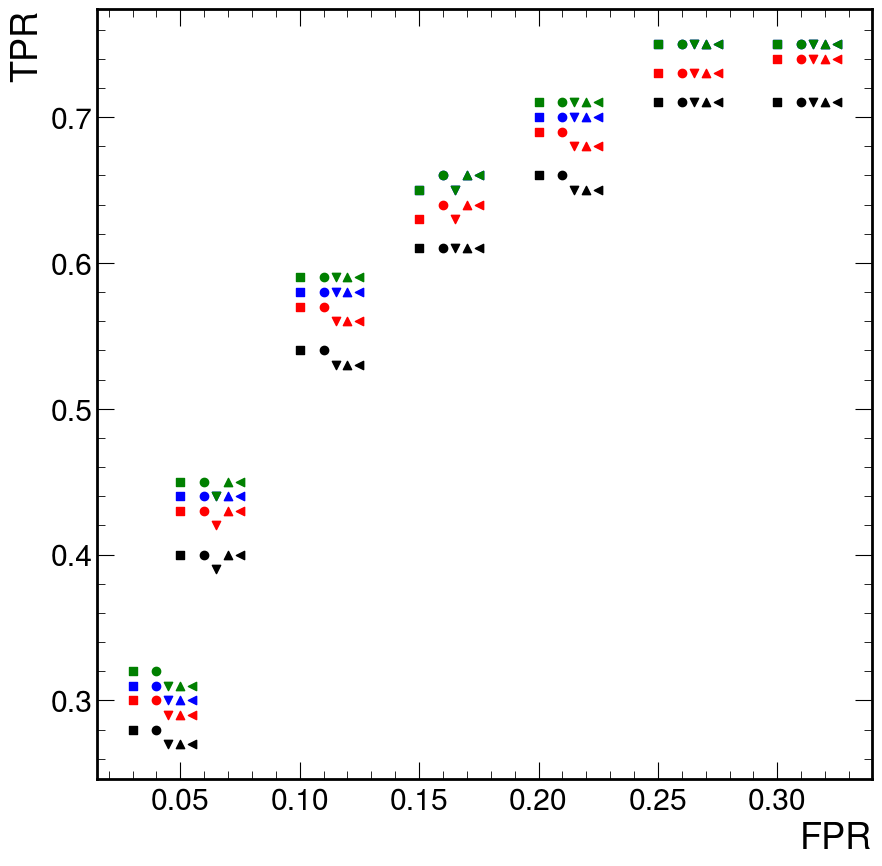

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[(10, 15, 2, 6), (7, 15, 1, 4), (0, 12, 1, 3), (0, 8, 0, 3), (0, 8, 1, 1), (0, 4, 1, 2), (0, 3, 0, 3)]
[(11, 15, 2, 5), (8, 15, 1, 3), (0, 12, 1, 3), (0, 9, 0, 2), (0, 8, 1, 1), (0, 4, 1, 2), (0, 3, 0, 3)]
[(16, 15, 2, 2), (7, 15, 1, 4), (2, 11, 1, 2), (0, 9, 0, 2), (0, 8, 1, 1), (0, 4, 1, 2), (0, 3, 0, 3)]
[(16, 15, 2, 2), (8, 15, 1, 3), (0, 12, 1, 3), (0, 9, 0, 2), (0, 8, 1, 1), (0, 4, 1, 2), (0, 3, 0, 3)]


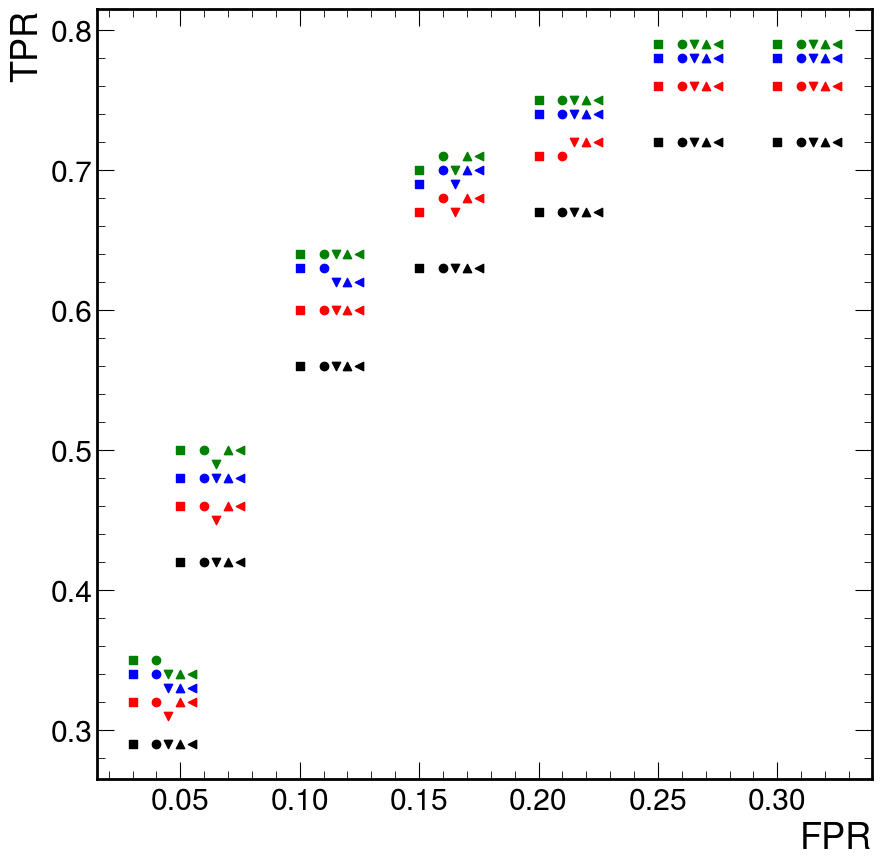

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[(11, 15, 2, 5), (8, 15, 1, 3), (0, 12, 1, 3), (0, 9, 0, 2), (0, 8, 1, 1), (0, 4, 1, 2), (0, 3, 0, 3)]
[(11, 15, 2, 5), (8, 15, 1, 3), (0, 12, 1, 3), (0, 9, 0, 2), (0, 8, 1, 1), (0, 4, 1, 2), (0, 3, 0, 3)]
[(11, 15, 2, 5), (8, 15, 1, 3), (0, 12, 1, 3), (0, 9, 0, 2), (0, 8, 1, 1), (0, 4, 1, 2), (0, 3, 0, 3)]
[(20, 15, 1, 6), (8, 15, 1, 3), (0, 12, 1, 3), (0, 9, 0, 2), (0, 8, 1, 1), (0, 4, 1, 2), (2, 3, 0, 1)]


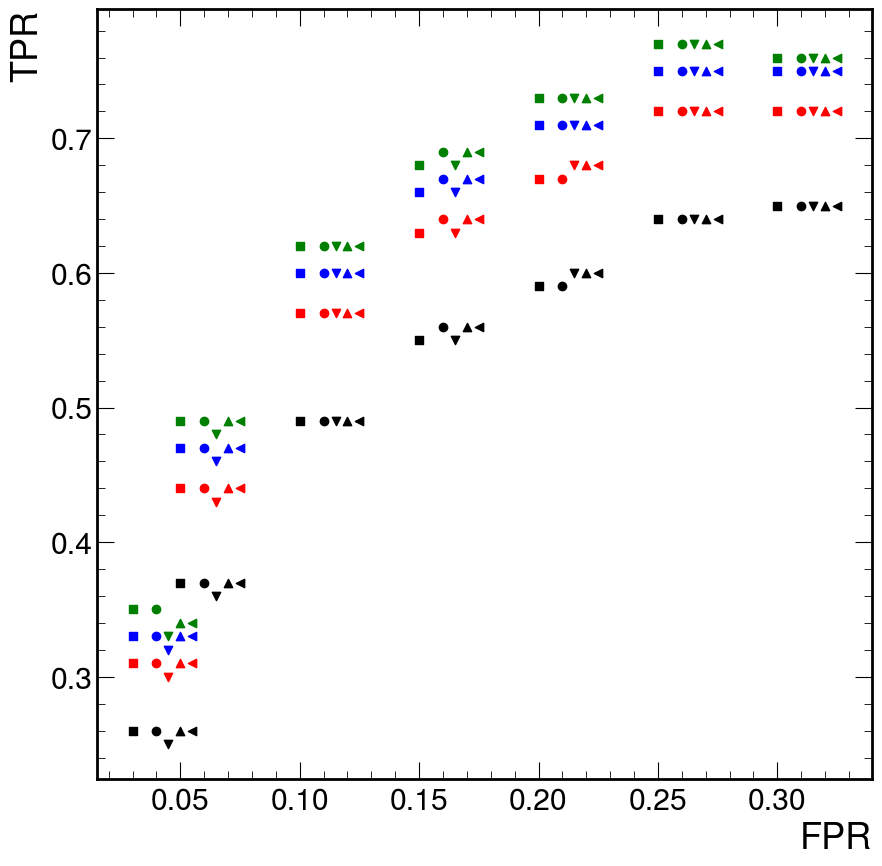

Total runtime: 2980.29 seconds


In [18]:
#Track Cut Grid Search Script
import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed

ptTrackCuts = np.linspace(1,3,21)
dxySigCuts = np.linspace(0.5,8,16)
pixelHitsCuts = np.linspace(1,3,3)
nTrackerLayersCuts = np.linspace(3,9,7)
"""
def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    with uproot.open(rootFile) as file:
        output["genWeightSum"] = {process: file["triggerFilter/genWeightsSkim"].values()[0]}
        tree = file["scoutingTree/objectTree"]
        # Select only necessary branches to load
        branches = ["weight","vertTrack_iVtx","scoutVert_dBV","vertTrack_pt","vertTrack_dxySig","vertTrack_nValidPixelHits", "vertTrack_nTrackerLayersWithMeasurement"]
        weightSum = np.zeros((len(ptTrackCuts),len(dxySigCuts),len(pixelHitsCuts),len(nTrackerLayersCuts)))
        weightSumSquared = np.zeros((len(ptTrackCuts),len(dxySigCuts),len(pixelHitsCuts),len(nTrackerLayersCuts)))
        weightSkimSum = 0
        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        for batch in tree.iterate(branches, library="ak", step_size=100000):
            weights = batch["weight"]  # event weights
            mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.1)
            pt = batch["vertTrack_pt"][mask]
            dxySig = batch["vertTrack_dxySig"][mask]
            npixel = batch["vertTrack_nValidPixelHits"][mask]
            ntracker = batch["vertTrack_nTrackerLayersWithMeasurement"][mask]
            nTracks = ak.num(pt,axis=1)
            weightSkimSum += ak.sum(nTracks*weights)
            ptMasks = [(pt > ptTrackCuts[i]) for i in range(len(ptTrackCuts))]
            dxyMasks = [(dxySig > dxySigCuts[j]) for j in range(len(dxySigCuts))]
            pixelMasks = [(npixel > pixelHitsCuts[k]) for k in range(len(pixelHitsCuts))]
            trackerMasks = [(ntracker > nTrackerLayersCuts[l]) for l in range(len(nTrackerLayersCuts))]
            for i in range(len(ptTrackCuts)):
                for j in range(len(dxySigCuts)):
                    for k in range(len(pixelHitsCuts)):
                        for l in range(len(nTrackerLayersCuts)):
                            mask = ptMasks[i] & dxyMasks[j] & pixelMasks[k] & trackerMasks[l]
                            ptMasked = pt[mask]
                            nTracks = ak.num(ptMasked,axis=1)
                            weightSum[i][j][k][l] += ak.sum(nTracks*weights)
                            weightSumSquared[i][j][k][l] += ak.sum(nTracks*(weights**2))
        output["weightSum"] = {process: weightSum}
        output["weightSumSquared"] = {process: weightSumSquared}
        output["weightSkimSum"] = {process: weightSkimSum}
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        if process not in results[plot]:
                             results[plot][process] = result[plot][process]
                        else:
                            results[plot][process] = results[plot][process] + result[plot][process]

    return results

t0 = time.time()


bgPlotWeights = parallel_processing(processDict)
sigPlotWeights = parallel_processing(signalDict)

#Combining Background Subprocesses and Reweighting Events
for process in bgPlotWeights["genWeightSum"].keys():
    bgPlotWeights["weightSum"][process] = bgPlotWeights["weightSum"][process] / bgPlotWeights["genWeightSum"][process]
    bgPlotWeights["weightSkimSum"][process] = bgPlotWeights["weightSkimSum"][process] / bgPlotWeights["genWeightSum"][process]
    bgPlotWeights["weightSumSquared"][process] = bgPlotWeights["weightSumSquared"][process] / (bgPlotWeights["genWeightSum"][process]**2)
bgPlotWeights["weightSum"]["QCD"] = bgPlotWeights["weightSum"]["QCD200to400"]+bgPlotWeights["weightSum"]["QCD400to600"]+bgPlotWeights["weightSum"]["QCD600to800"]+bgPlotWeights["weightSum"]["QCD800to1000"]+bgPlotWeights["weightSum"]["QCD1000to1200"]+bgPlotWeights["weightSum"]["QCD1200to1500"]+bgPlotWeights["weightSum"]["QCD1500to2000"]+bgPlotWeights["weightSum"]["QCD2000"]
bgPlotWeights["weightSkimSum"]["QCD"] = bgPlotWeights["weightSkimSum"]["QCD200to400"]+bgPlotWeights["weightSkimSum"]["QCD400to600"]+bgPlotWeights["weightSkimSum"]["QCD600to800"]+bgPlotWeights["weightSkimSum"]["QCD800to1000"]+bgPlotWeights["weightSkimSum"]["QCD1000to1200"]+bgPlotWeights["weightSkimSum"]["QCD1200to1500"]+bgPlotWeights["weightSkimSum"]["QCD1500to2000"]+bgPlotWeights["weightSkimSum"]["QCD2000"]
bgPlotWeights["weightSumSquared"]["QCD"] = bgPlotWeights["weightSumSquared"]["QCD200to400"]+bgPlotWeights["weightSumSquared"]["QCD400to600"]+bgPlotWeights["weightSumSquared"]["QCD600to800"]+bgPlotWeights["weightSumSquared"]["QCD800to1000"]+bgPlotWeights["weightSumSquared"]["QCD1000to1200"]+bgPlotWeights["weightSumSquared"]["QCD1200to1500"]+bgPlotWeights["weightSumSquared"]["QCD1500to2000"]+bgPlotWeights["weightSumSquared"]["QCD2000"]
bgPlotWeights["weightSum"]["TTbar"] = bgPlotWeights["weightSum"]["TTTo4Q"]+bgPlotWeights["weightSum"]["TTToLNu2Q"]
bgPlotWeights["weightSkimSum"]["TTbar"] = bgPlotWeights["weightSkimSum"]["TTTo4Q"]+bgPlotWeights["weightSkimSum"]["TTToLNu2Q"]
bgPlotWeights["weightSumSquared"]["TTbar"] = bgPlotWeights["weightSumSquared"]["TTTo4Q"]+bgPlotWeights["weightSumSquared"]["TTToLNu2Q"]
for process in sigPlotWeights["genWeightSum"].keys():
    sigPlotWeights["weightSum"][process] = sigPlotWeights["weightSum"][process] / sigPlotWeights["genWeightSum"][process]
    sigPlotWeights["weightSkimSum"][process] = sigPlotWeights["weightSkimSum"][process] / sigPlotWeights["genWeightSum"][process]
    sigPlotWeights["weightSumSquared"][process] = sigPlotWeights["weightSumSquared"][process] / (sigPlotWeights["genWeightSum"][process]**2)
"""
# **Plotting**
for lifetime in ["1","3","10"]:
    fig, ax = plt.subplots()
    colors = {"Stop-M200-cT"+lifetime: "black", "Stop-M400-cT"+lifetime: "red", "Stop-M600-cT"+lifetime: "blue", "Stop-M800-cT"+lifetime: "green"}
    for signal, color in colors.items():
        efficiency = sigPlotWeights["weightSum"][signal] / sigPlotWeights["weightSkimSum"][signal]
        efficiency = np.round(efficiency,2)
        fpr = (bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"]) / (bgPlotWeights["weightSkimSum"]["QCD"]+bgPlotWeights["weightSkimSum"]["TTbar"])
        fpr = np.round(fpr,2)
        unique_fpr = np.unique(fpr)
        max_effs = np.array([])
        thresh = [True,True,True,True,True,True,True]
        thresh_val = [0.01,0.05,0.1,0.15,0.2,0.25,0.3]
        indices = []
        for ux in unique_fpr:
            unique_eff = np.where(fpr == ux, efficiency, -1)
            max_eff = np.max(unique_eff)
            ind = np.unravel_index(np.argmax(unique_eff, axis=None), unique_eff.shape)
            if(ux>=thresh_val[0] and thresh[0]): 
                indices.append(ind)
                thresh[0] = False
            if(ux>=thresh_val[1] and thresh[1]): 
                indices.append(ind)
                thresh[1] = False
            if(ux>=thresh_val[2] and thresh[2]): 
                indices.append(ind)
                thresh[2] = False
            if(ux>=thresh_val[3] and thresh[3]): 
                indices.append(ind)
                thresh[3] = False
            if(ux>=thresh_val[4] and thresh[4]): 
                indices.append(ind)
                thresh[4] = False
            if(ux>=thresh_val[5] and thresh[5]): 
                indices.append(ind)
                thresh[5] = False
            if(ux>=thresh_val[6] and thresh[6]): 
                indices.append(ind)
                thresh[6] = False
            max_effs = np.append(max_effs,max_eff)
        print(indices)
        #ax.scatter(unique_fpr,max_effs,label=signal,color=color,zorder=1)
        indices = [(20, 15, 1, 6), (8, 15, 1, 3), (2, 11, 1, 2), (0, 8, 0, 3), (2, 5, 1, 1), (0, 4, 1, 2), (0, 3, 0, 3)]
        for index in indices:
            ax.scatter(fpr[index],efficiency[index],color=color,marker="s",zorder=2)
        indices = [(20, 15, 1, 6), (8, 15, 1, 3), (2, 11, 1, 2), (0, 9, 0, 2), (2, 5, 1, 1), (0, 4, 1, 2), (0, 3, 0, 3)]
        for index in indices:
            ax.scatter(fpr[index]+0.01,efficiency[index],color=color,marker="o",zorder=2)
        """
        indices = [(13, 15, 2, 4), (7, 15, 1, 4), (0, 12, 1, 3), (0, 9, 0, 2), (0, 8, 1, 1), (0, 4, 1, 2), (0, 3, 0, 3)]
        for index in indices:
            ax.scatter(fpr[index]+0.02,efficiency[index],color=color,marker="^",zorder=2)
        indices = [(16, 15, 2, 2), (8, 15, 1, 3), (0, 12, 1, 3), (2, 6, 1, 2), (0, 8, 1, 1), (0, 4, 1, 2), (2, 3, 0, 1)]
        for index in indices:
            ax.scatter(fpr[index]+0.03,efficiency[index],color=color,marker="v",zorder=2)
        """
        indices = [(10, 15, 2, 6), (7, 15, 1, 4), (0, 12, 1, 3), (0, 8, 0, 3), (0, 8, 1, 1), (0, 4, 1, 2), (0, 3, 0, 3)]
        for index in indices:
            ax.scatter(fpr[index]+0.015,efficiency[index],color=color,marker="v",zorder=2)
        indices = [(11, 15, 2, 5), (8, 15, 1, 3), (0, 12, 1, 3), (0, 9, 0, 2), (0, 8, 1, 1), (0, 4, 1, 2), (0, 3, 0, 3)]
        for index in indices:
            ax.scatter(fpr[index]+0.02,efficiency[index],color=color,marker="^",zorder=2)
        """
        indices = [(16, 15, 2, 2), (7, 15, 1, 4), (2, 11, 1, 2), (0, 9, 0, 2), (0, 8, 1, 1), (0, 4, 1, 2), (0, 3, 0, 3)]
        for index in indices:
            ax.scatter(fpr[index],efficiency[index],color=color,marker="s",zorder=2,edgecolor="pink")
        indices = [(16, 15, 2, 2), (8, 15, 1, 3), (0, 12, 1, 3), (0, 9, 0, 2), (0, 8, 1, 1), (0, 4, 1, 2), (0, 3, 0, 3)]
        for index in indices:
            ax.scatter(fpr[index],efficiency[index],color=color,marker="s",zorder=2,edgecolor="silver")
        """
        indices = [(11, 15, 2, 5), (8, 15, 1, 3), (0, 12, 1, 3), (0, 9, 0, 2), (0, 8, 1, 1), (0, 4, 1, 2), (0, 3, 0, 3)]
        for index in indices:
            ax.scatter(fpr[index]+0.025,efficiency[index],color=color,marker="<",zorder=2)
        """
        indices = [(20, 15, 1, 6), (8, 15, 1, 3), (0, 12, 1, 3), (0, 9, 0, 2), (0, 8, 1, 1), (0, 4, 1, 2), (2, 3, 0, 1)]
        for index in indices:
            ax.scatter(fpr[index],efficiency[index],color=color,marker="s",zorder=2,edgecolor="beige")
        """
        
    ax.set_ylabel("TPR")
    plt.xlabel("FPR")
    #plt.yscale("log")
    plt.legend()
    plt.show()
    
t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")

Processing /eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v13-15TrackFPR/250506_174000/TTto4Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v13-15TrackFPR/250506_174012/TTtoLNu2Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v13-15TrackFPR/250506_174223/QCD-4Jets_Bin-HT-600to800.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v13-15TrackFPR/250506_174256/QCD-4Jets_Bin-HT-800to1000.root

Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v13-15TrackFPR/250506_174025/QCD-4Jets_Bin-HT-1000to1200.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jet

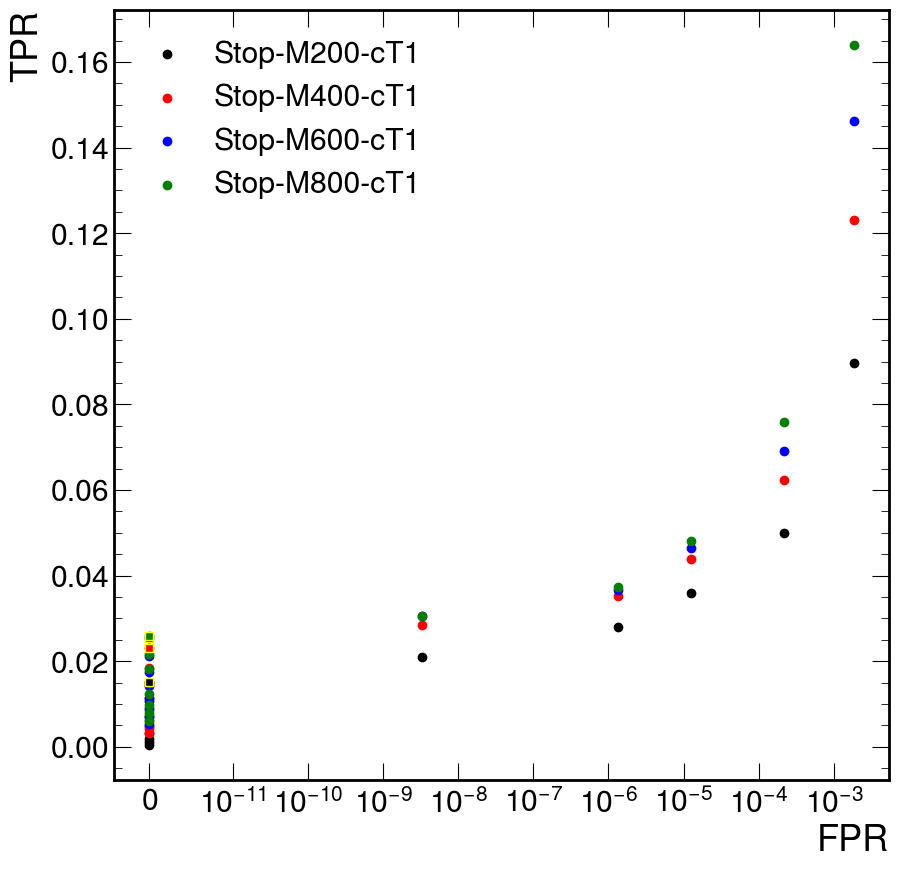

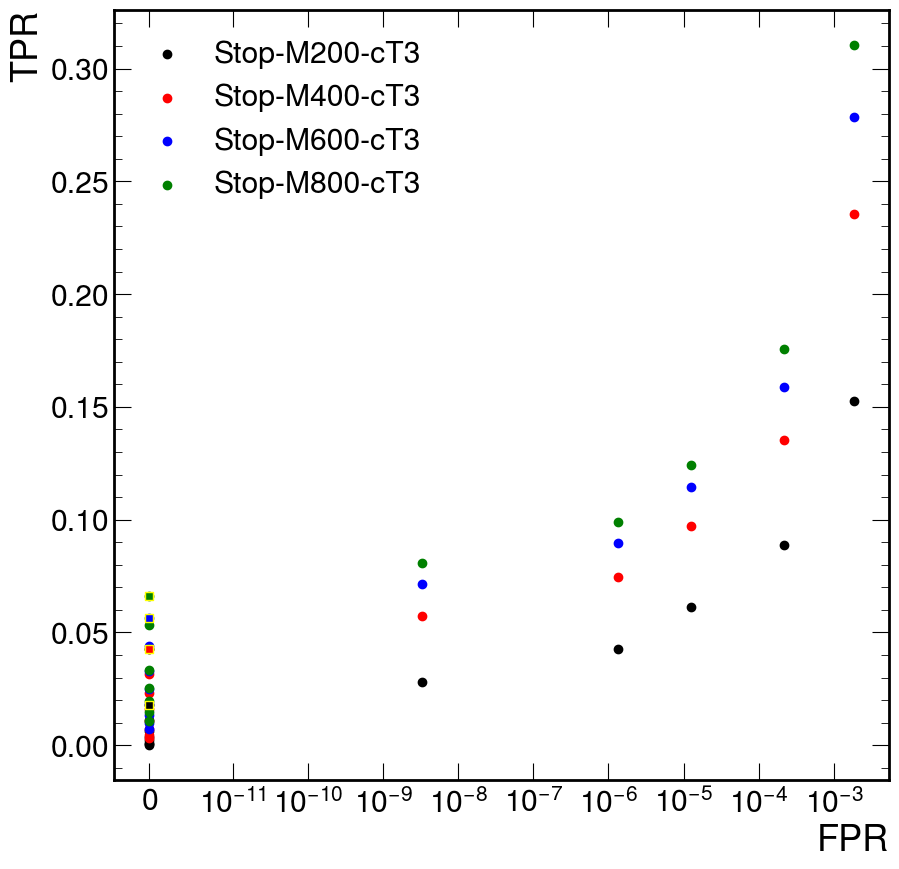

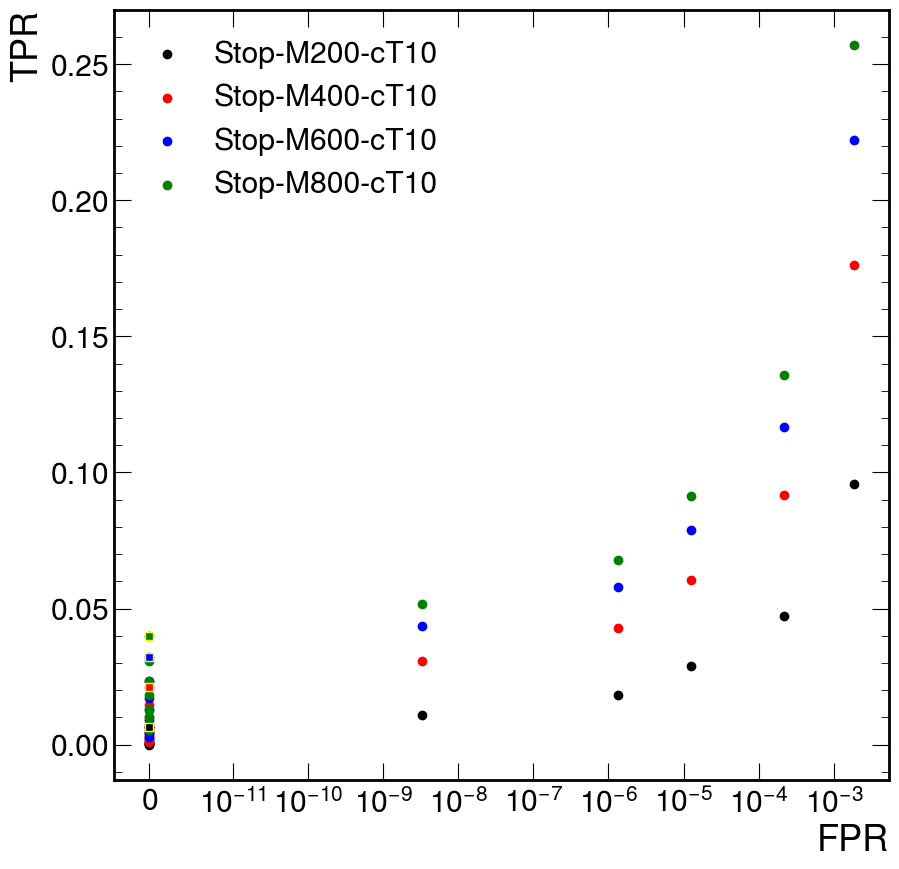

Total runtime: 63.15 seconds
total background: 226215788366.3997
best traditional sensitivity for signal Stop-M200-cT1 is 1.2788669227330172 sig eff: 0.015010101010101322 fpr: 0.0 requiring > 6.0 tracks and < 999.900000 uncertainty with track z shift < 999.9  3d shift < 999.9
best traditional sensitivity for signal Stop-M400-cT1 is 1.586154595239677 sig eff: 0.023089999999999816 fpr: 0.0 requiring > 6.0 tracks and < 999.900000 uncertainty with track z shift < 999.9  3d shift < 999.9
best traditional sensitivity for signal Stop-M600-cT1 is 1.6599995180722078 sig eff: 0.02529000000000002 fpr: 0.0 requiring > 6.0 tracks and < 999.900000 uncertainty with track z shift < 999.9  3d shift < 999.9
best traditional sensitivity for signal Stop-M800-cT1 is 1.6782776885843338 sig eff: 0.025850000000000133 fpr: 0.0 requiring > 6.0 tracks and < 999.900000 uncertainty with track z shift < 999.9  3d shift < 999.9
best traditional sensitivity for signal Stop-M200-cT3 is 1.3942189211167615 sig eff: 0.01

In [98]:
#Vertex and Track Cut Sensitivity Search Script
import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed

#ptTrackCuts = np.linspace(1,3,21)
#dxySigCuts = np.linspace(0.5,8,16)
#pixelHitsCuts = np.linspace(1,3,3)
#nTrackerLayersCuts = np.linspace(3,9,7)
#errCuts = np.linspace(0.001,0.05,50)[::-1]
#nTrackCuts = np.linspace(1,13,13)

#20% fpr cuts
#ptTrackCuts = np.linspace(1.2,1.2,1)
#dxySigCuts = np.linspace(3.0,3.0,1)
#pixelHitsCuts = np.linspace(2,2,1)
#nTrackerLayersCuts = np.linspace(4,4,1)
#errCuts = np.linspace(0.001,0.05,50)[::-1]
#nTrackCuts = np.linspace(1,13,13)

#15% fpr cuts
ptTrackCuts = np.linspace(1,1,1)
dxySigCuts = np.linspace(5.0,5.0,1)
pixelHitsCuts = np.linspace(1,1,1)
nTrackerLayersCuts = np.linspace(5,5,1)
#shiftZCuts = np.linspace(0.001,0.005,5)
shiftZCuts = np.linspace(999.9,999.9,1)
#shift3DCuts = np.linspace(0.001,0.005,5)
shift3DCuts = np.linspace(999.9,999.9,1)
#errCuts = np.linspace(0.001,0.05,50)[::-1]
errCuts = np.linspace(999.9,999.9,1)[::-1]
nTrackCuts = np.linspace(1,13,13)
#dTCuts = np.linspace(0,0.12,13)

#10% fpr cuts
#ptTrackCuts = np.linspace(1.2,1.2,1)
#dxySigCuts = np.linspace(6.0,6.0,1)
#pixelHitsCuts = np.linspace(2,2,1)
#nTrackerLayersCuts = np.linspace(5,5,1)
#errCuts = np.linspace(0.001,0.05,50)[::-1]
#nTrackCuts = np.linspace(1,13,13)

#5% fpr cuts
#ptTrackCuts = np.linspace(1.8,1.8,1)
#dxySigCuts = np.linspace(8.0,8.0,1)
#pixelHitsCuts = np.linspace(2,2,1)
#nTrackerLayersCuts = np.linspace(6,6,1)
#errCuts = np.linspace(0.001,0.05,50)[::-1]
#nTrackCuts = np.linspace(1,13,13)

#1% fpr cuts
#ptTrackCuts = np.linspace(3.0,3.0,1)
#dxySigCuts = np.linspace(8.0,8.0,1)
#pixelHitsCuts = np.linspace(2,2,1)
#nTrackerLayersCuts = np.linspace(9,9,1)
#errCuts = np.linspace(0.001,0.05,50)[::-1]
#nTrackCuts = np.linspace(1,13,13)

def fast_count_vertices_numpy(ivtxMasked, dBV):
    result = []
    for ind_event, dBV_event in zip(ivtxMasked, dBV):
        counts = np.zeros(len(dBV_event), dtype=int)
        np.add.at(counts, np.array(ind_event), 1)
        result.append(counts)
    return ak.Array(result)

def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    with uproot.open(rootFile) as file:
        output["genWeightSum"] = {process: file["triggerFilter/genWeightsSkim"].values()[0]}
        output["weightSkimSum"] = {process: file["triggerFilter/weightsSkim"].values()[0]}
        tree = file["scoutingTree/objectTree"]
        # Select only necessary branches to load
        branches = ["weight","scoutVert_dBV","scoutVert_dBVErr","vertTrack_iVtx","vertTrack_pt","vertTrack_dxySig","vertTrack_nValidPixelHits", "vertTrack_nTrackerLayersWithMeasurement","vertTrack_shift3DSig","vertTrack_shift3DValue","vertTrack_shiftZValue"]
        weightSum = np.zeros((len(ptTrackCuts),len(dxySigCuts),len(pixelHitsCuts),len(nTrackerLayersCuts),len(shiftZCuts),len(shift3DCuts),len(errCuts),len(nTrackCuts)))
        weightSumSquared = np.zeros((len(ptTrackCuts),len(dxySigCuts),len(pixelHitsCuts),len(nTrackerLayersCuts),len(shiftZCuts),len(shift3DCuts),len(errCuts),len(nTrackCuts)))
        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        for batch in tree.iterate(branches, library="ak", step_size=100000):
            weights = batch["weight"]  # event weights   
            mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.1)
            pt = batch["vertTrack_pt"][mask]
            dxySig = batch["vertTrack_dxySig"][mask]
            npixel = batch["vertTrack_nValidPixelHits"][mask]
            ntracker = batch["vertTrack_nTrackerLayersWithMeasurement"][mask]
            shiftZ = batch["vertTrack_shiftZValue"][mask]
            shift3D = batch["vertTrack_shift3DSig"][mask]
            ivtx = batch["vertTrack_iVtx"][mask]
            
            ptMasks = [(pt > ptTrackCuts[i]) for i in range(len(ptTrackCuts))]
            dxyMasks = [(dxySig > dxySigCuts[j]) for j in range(len(dxySigCuts))]
            pixelMasks = [(npixel > pixelHitsCuts[k]) for k in range(len(pixelHitsCuts))]
            trackerMasks = [(ntracker > nTrackerLayersCuts[l]) for l in range(len(nTrackerLayersCuts))]
            shiftZMasks = [(shiftZ < shiftZCuts[a]) for a in range(len(shiftZCuts))]
            shift3DMasks = [(shift3D < shift3DCuts[b]) for b in range(len(shift3DCuts))]
            
            dBV = batch["scoutVert_dBV"]
            dBVErr = batch["scoutVert_dBVErr"]
            #dT = batch["scoutVert_dT"]
            dBVMask = (dBV >= 0.1)
            dBVErrMask = [(dBVErr < errCuts[m]) for m in range(len(errCuts))]
            #dTMask = [(dT <= dTCuts[m]) for m in range(len(dTCuts))]
            
            for i in range(len(ptTrackCuts)):
                for j in range(len(dxySigCuts)):
                    for k in range(len(pixelHitsCuts)):
                        for l in range(len(nTrackerLayersCuts)):
                            for a in range(len(shiftZCuts)):
                                for b in range(len(shift3DCuts)):
                                    mask = ptMasks[i] & dxyMasks[j] & pixelMasks[k] & trackerMasks[l] & shiftZMasks[a] & shift3DMasks[b]
                                    ivtxMasked = ivtx[mask]
                                    #ntracks = ak.Array([
                                    #    np.bincount(ind_event, minlength=len(dBV_event))
                                    #    for ind_event, dBV_event in zip(ivtxMasked, dBV)
                                    #])
                                    
                                    ntracks = fast_count_vertices_numpy(ivtxMasked, dBV)
                                    
                                    ntrackMasks = [(ntracks > nTrackCuts[n]) for n in range(len(nTrackCuts))]
                                    for m in range(len(errCuts)):
                                        for n in range(len(nTrackCuts)):
                                            mask = dBVMask & dBVErrMask[m] & ntrackMasks[n] #& chi2Mask[o]
                                            dBVMasked = dBV[mask]
                                            mask = ak.num(dBVMasked,axis=1)>1
                                            weightsMasked = weights[mask]
                                            weightSum[i][j][k][l][a][b][m][n] += ak.sum(weightsMasked)
                                            weightSumSquared[i][j][k][l][a][b][m][n] += ak.sum(weightsMasked**2)
        output["weightSum"] = {process: weightSum}
        output["weightSumSquared"] = {process: weightSumSquared}
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        if process not in results[plot]:
                             results[plot][process] = result[plot][process]
                        else:
                            results[plot][process] = results[plot][process] + result[plot][process]

    return results

t0 = time.time()

bestEfficiencySensitivity = {"Stop-M200-cT1": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M400-cT1": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M600-cT1": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M800-cT1": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M200-cT3": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M400-cT3": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M600-cT3": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M800-cT3": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M200-cT10": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M400-cT10": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M600-cT10": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M800-cT10": [0,0,0,0,0,0,0,0,0,0,0,0]}#, "Hto2Sto4D-cT1-MS1": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT1-MS15": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT1-MS30": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT1-MS55": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT10-MS1": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT10-MS15": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT10-MS30": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT10-MS55": [0,0,0,0,0,0,0,0,0,0]}
bestTraditionalSensitivity = {"Stop-M200-cT1": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M400-cT1": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M600-cT1": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M800-cT1": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M200-cT3": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M400-cT3": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M600-cT3": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M800-cT3": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M200-cT10": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M400-cT10": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M600-cT10": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M800-cT10": [0,0,0,0,0,0,0,0,0,0,0,0]}#, "Hto2Sto4D-cT1-MS1": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT1-MS15": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT1-MS30": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT1-MS55": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT10-MS1": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT10-MS15": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT10-MS30": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT10-MS55": [0,0,0,0,0,0,0,0,0,0]}

bgPlotWeights = parallel_processing(processDict)
sigPlotWeights = parallel_processing(signalDict)

#Combining Background Subprocesses and Reweighting Events
for process in bgPlotWeights["genWeightSum"].keys():
    bgPlotWeights["weightSum"][process] = bgPlotWeights["weightSum"][process] / bgPlotWeights["genWeightSum"][process]
    bgPlotWeights["weightSkimSum"][process] = bgPlotWeights["weightSkimSum"][process] / bgPlotWeights["genWeightSum"][process]
    bgPlotWeights["weightSumSquared"][process] = bgPlotWeights["weightSumSquared"][process] / (bgPlotWeights["genWeightSum"][process]**2)
bgPlotWeights["weightSum"]["QCD"] = bgPlotWeights["weightSum"]["QCD200to400"]+bgPlotWeights["weightSum"]["QCD400to600"]+bgPlotWeights["weightSum"]["QCD600to800"]+bgPlotWeights["weightSum"]["QCD800to1000"]+bgPlotWeights["weightSum"]["QCD1000to1200"]+bgPlotWeights["weightSum"]["QCD1200to1500"]+bgPlotWeights["weightSum"]["QCD1500to2000"]+bgPlotWeights["weightSum"]["QCD2000"]
bgPlotWeights["weightSkimSum"]["QCD"] = bgPlotWeights["weightSkimSum"]["QCD200to400"]+bgPlotWeights["weightSkimSum"]["QCD400to600"]+bgPlotWeights["weightSkimSum"]["QCD600to800"]+bgPlotWeights["weightSkimSum"]["QCD800to1000"]+bgPlotWeights["weightSkimSum"]["QCD1000to1200"]+bgPlotWeights["weightSkimSum"]["QCD1200to1500"]+bgPlotWeights["weightSkimSum"]["QCD1500to2000"]+bgPlotWeights["weightSkimSum"]["QCD2000"]
bgPlotWeights["weightSumSquared"]["QCD"] = bgPlotWeights["weightSumSquared"]["QCD200to400"]+bgPlotWeights["weightSumSquared"]["QCD400to600"]+bgPlotWeights["weightSumSquared"]["QCD600to800"]+bgPlotWeights["weightSumSquared"]["QCD800to1000"]+bgPlotWeights["weightSumSquared"]["QCD1000to1200"]+bgPlotWeights["weightSumSquared"]["QCD1200to1500"]+bgPlotWeights["weightSumSquared"]["QCD1500to2000"]+bgPlotWeights["weightSumSquared"]["QCD2000"]
bgPlotWeights["weightSum"]["TTbar"] = bgPlotWeights["weightSum"]["TTTo4Q"]+bgPlotWeights["weightSum"]["TTToLNu2Q"]
bgPlotWeights["weightSkimSum"]["TTbar"] = bgPlotWeights["weightSkimSum"]["TTTo4Q"]+bgPlotWeights["weightSkimSum"]["TTToLNu2Q"]
bgPlotWeights["weightSumSquared"]["TTbar"] = bgPlotWeights["weightSumSquared"]["TTTo4Q"]+bgPlotWeights["weightSumSquared"]["TTToLNu2Q"]
for process in sigPlotWeights["genWeightSum"].keys():
    sigPlotWeights["weightSum"][process] = sigPlotWeights["weightSum"][process] / sigPlotWeights["genWeightSum"][process]
    sigPlotWeights["weightSkimSum"][process] = sigPlotWeights["weightSkimSum"][process] / sigPlotWeights["genWeightSum"][process]
    sigPlotWeights["weightSumSquared"][process] = sigPlotWeights["weightSumSquared"][process] / (sigPlotWeights["genWeightSum"][process]**2)

# **Plotting**
for lifetime in ["1","3","10"]:
    #for lifetime in ["1","10"]:
    fig, ax = plt.subplots()
    colors = {"Stop-M200-cT"+lifetime: "black", "Stop-M400-cT"+lifetime: "red", "Stop-M600-cT"+lifetime: "blue", "Stop-M800-cT"+lifetime: "green"}
    for signal, color in colors.items():
        sensitivity = sigPlotWeights["weightSum"][signal] / np.sqrt(sigPlotWeights["weightSum"][signal]+bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"])
        sensitivity = np.nan_to_num(sensitivity)
        efficiency = sigPlotWeights["weightSum"][signal] / sigPlotWeights["weightSkimSum"][signal]
        fpr = (bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"]) / (bgPlotWeights["weightSkimSum"]["QCD"]+bgPlotWeights["weightSkimSum"]["TTbar"])
        if(np.max(sensitivity)>bestTraditionalSensitivity[signal][0]): 
            ind = np.unravel_index(np.argmax(sensitivity, axis=None), sensitivity.shape)
            bestTraditionalSensitivity[signal] = [np.max(sensitivity),efficiency[ind],fpr[ind],ptTrackCuts[ind[0]],dxySigCuts[ind[1]],pixelHitsCuts[ind[2]],nTrackerLayersCuts[ind[3]],shiftZCuts[ind[4]],shift3DCuts[ind[5]],errCuts[ind[6]],nTrackCuts[ind[7]]]
        sensitivity = efficiency / (1+np.sqrt(bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"]))
        if(np.max(sensitivity)>bestEfficiencySensitivity[signal][0]): 
            ind = np.unravel_index(np.argmax(sensitivity, axis=None), sensitivity.shape)
            bestEfficiencySensitivity[signal] = [np.max(sensitivity),efficiency[ind],fpr[ind],ptTrackCuts[ind[0]],dxySigCuts[ind[1]],pixelHitsCuts[ind[2]],nTrackerLayersCuts[ind[3]],shiftZCuts[ind[4]],shift3DCuts[ind[5]],errCuts[ind[6]],nTrackCuts[ind[7]]]
        ax.scatter(fpr,efficiency,label=signal,color=color,zorder=1)
        ax.scatter(fpr[ind],efficiency[ind],marker="s",color=color,zorder=2,edgecolor="yellow")
        plt.xscale("symlog",linthresh=10**-11)
    ax.set_ylabel("TPR")
    #ax.set_ylim(0.0,0.7)
    plt.xlabel("FPR")
    plt.legend()
    plt.show()

t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")
print("total background:",bgPlotWeights["weightSkimSum"]["QCD"]+bgPlotWeights["weightSkimSum"]["TTbar"])
for signal, cuts in bestTraditionalSensitivity.items():
    print("best traditional sensitivity for signal",signal,"is",cuts[0],"sig eff:",cuts[1],"fpr:",cuts[2],"requiring >",cuts[10],"tracks and <",f"{cuts[9]:3f}","uncertainty with track z shift <",cuts[7]," 3d shift <",cuts[8])# track selection of pt>",cuts[3],"dxySig>",cuts[4],"pixelHits>",cuts[5],"tracker layers>",cuts[6])
for signal, cuts in bestEfficiencySensitivity.items():
    print("best efficiency sensitivity for signal",signal,"is",cuts[0],"sig eff:",cuts[1],"fpr:",cuts[2],"requiring >",cuts[10],"tracks and <",f"{cuts[9]:3f}","uncertainty with track z shift <",cuts[7]," 3d shift <",cuts[8])# track selection of pt>",cuts[3],"dxySig>",cuts[4],"pixelHits>",cuts[5],"tracker layers>",cuts[6])


In [28]:
indices = [(20, 15, 1, 6), (8, 15, 1, 3), (2, 11, 1, 2), (0, 9, 0, 2), (2, 5, 1, 1), (0, 4, 1, 2), (0, 3, 0, 3)]

print(np.linspace(1,3,21)[0])
print(np.linspace(0.5,8,16)[3])
print(np.linspace(1,3,3)[0])
print(np.linspace(3,9,7)[3])

ptTrackCuts = np.linspace(1,3,21)
dxySigCuts = np.linspace(0.5,8,16)
pixelHitsCuts = np.linspace(1,3,3)
nTrackerLayersCuts = np.linspace(3,9,7)

1.0
2.0
1.0
6.0


Processing /eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v22-Optimized/251203_010346/TTto4Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v22-Optimized/251203_010640/QCD-4Jets_Bin-HT-40to70.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v22-Optimized/251203_010655/QCD-4Jets_Bin-HT-70to100.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-Optimized/251203_010402/TTtoLNu2Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v22-Optimized/251203_010711/QCD-4Jets_Bin-HT-100to200.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_Tun

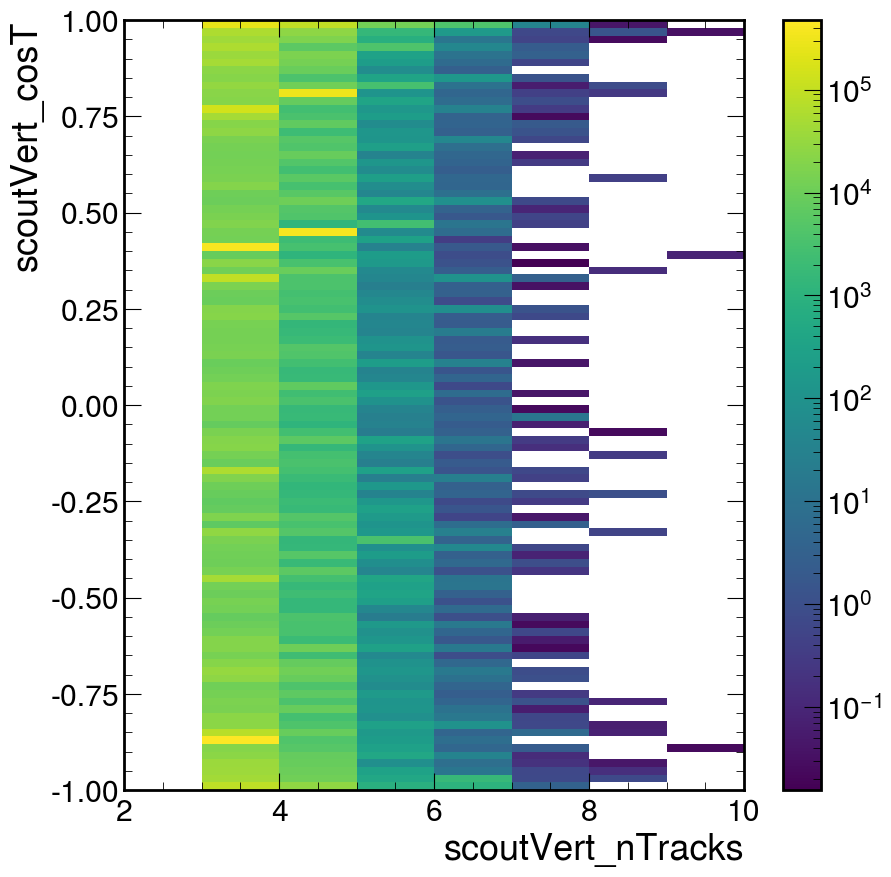

Stop-M200-cT1


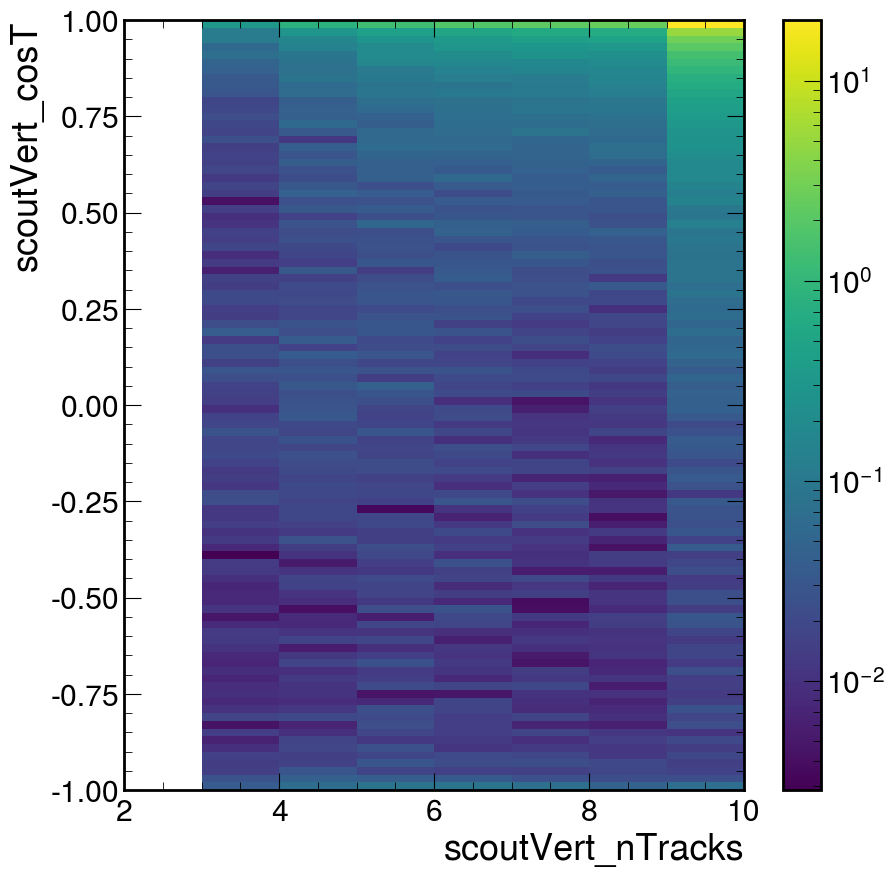

Stop-M800-cT1


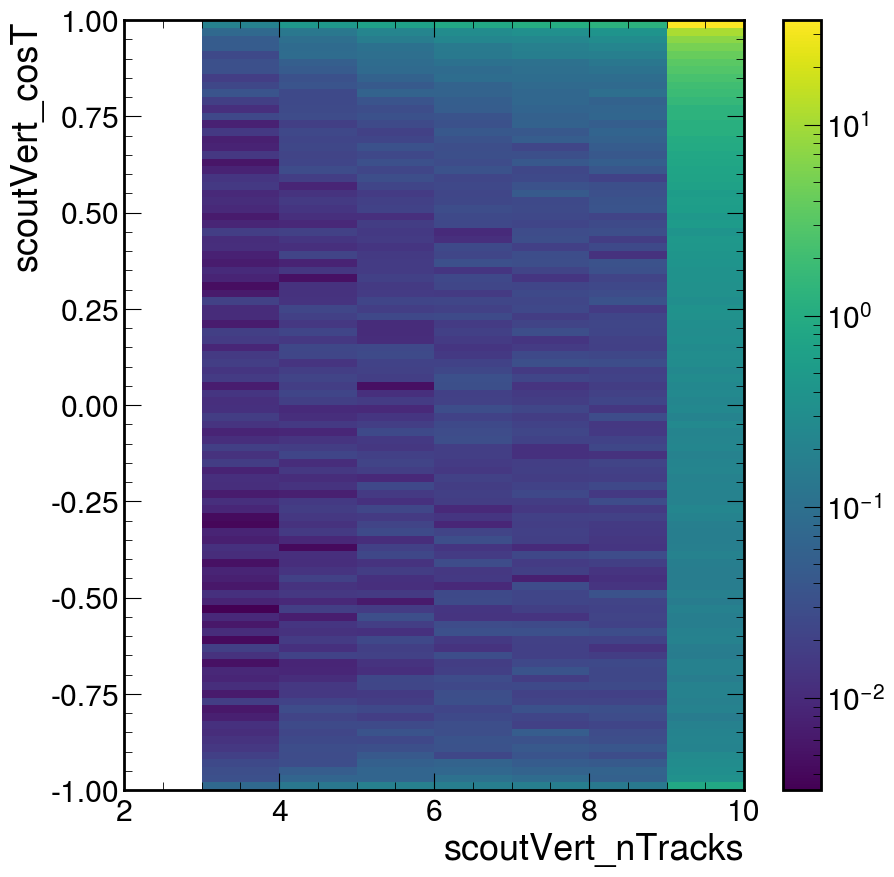

Stop-M200-cT3


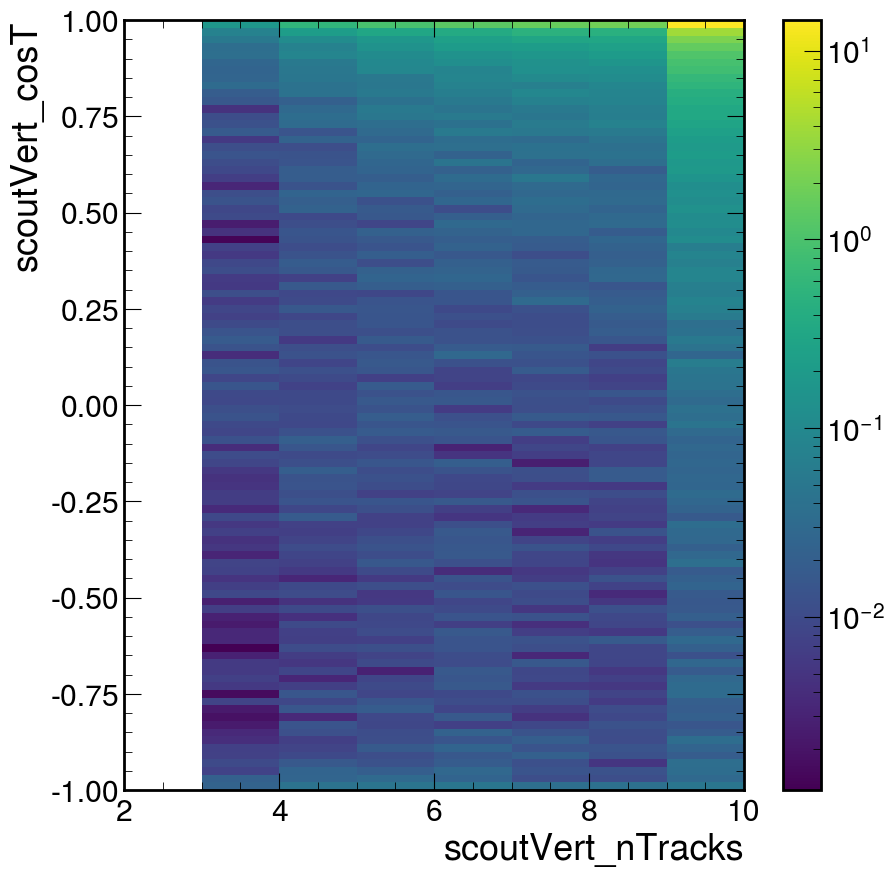

Stop-M800-cT3


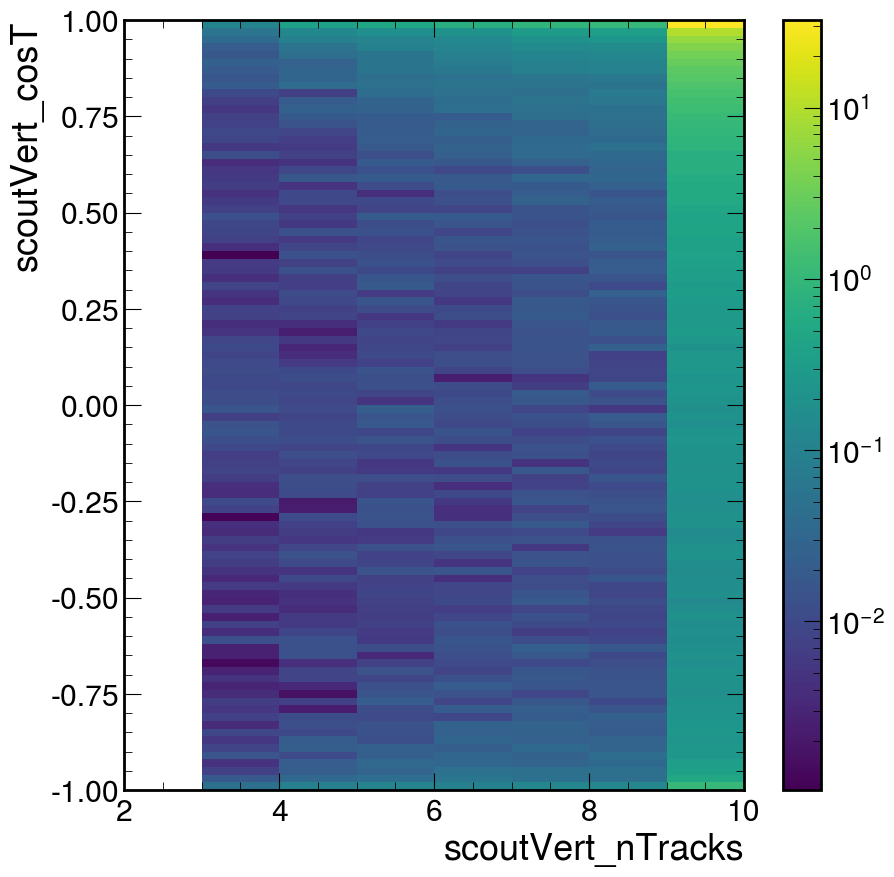

Stop-M200-cT10


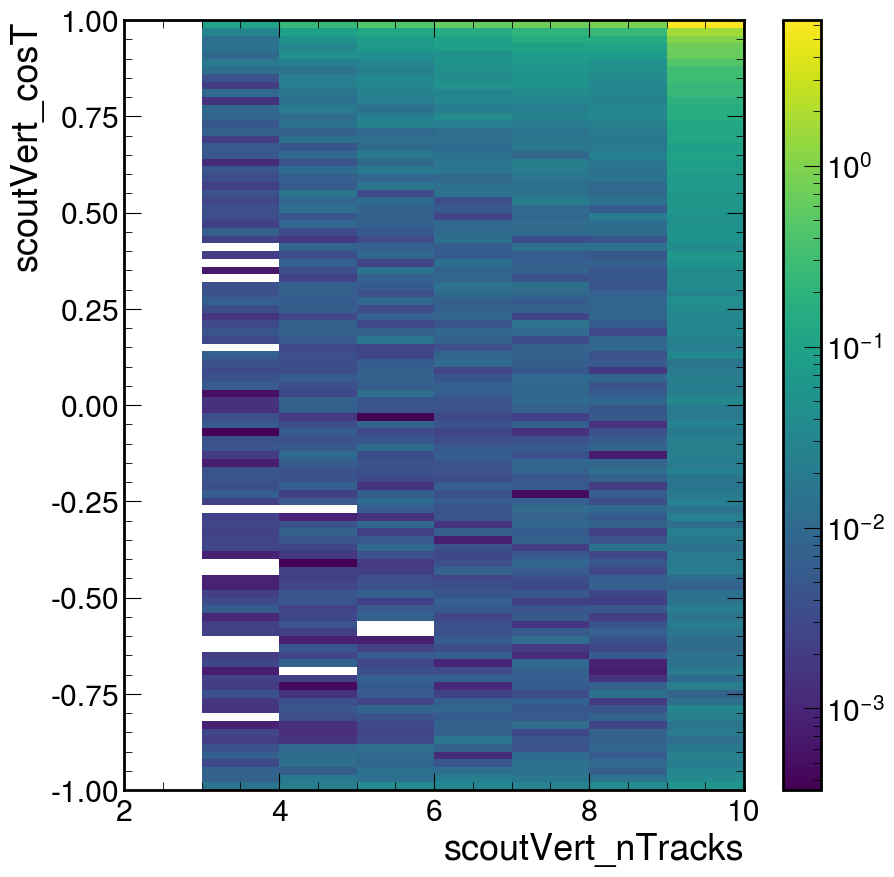

Stop-M800-cT10


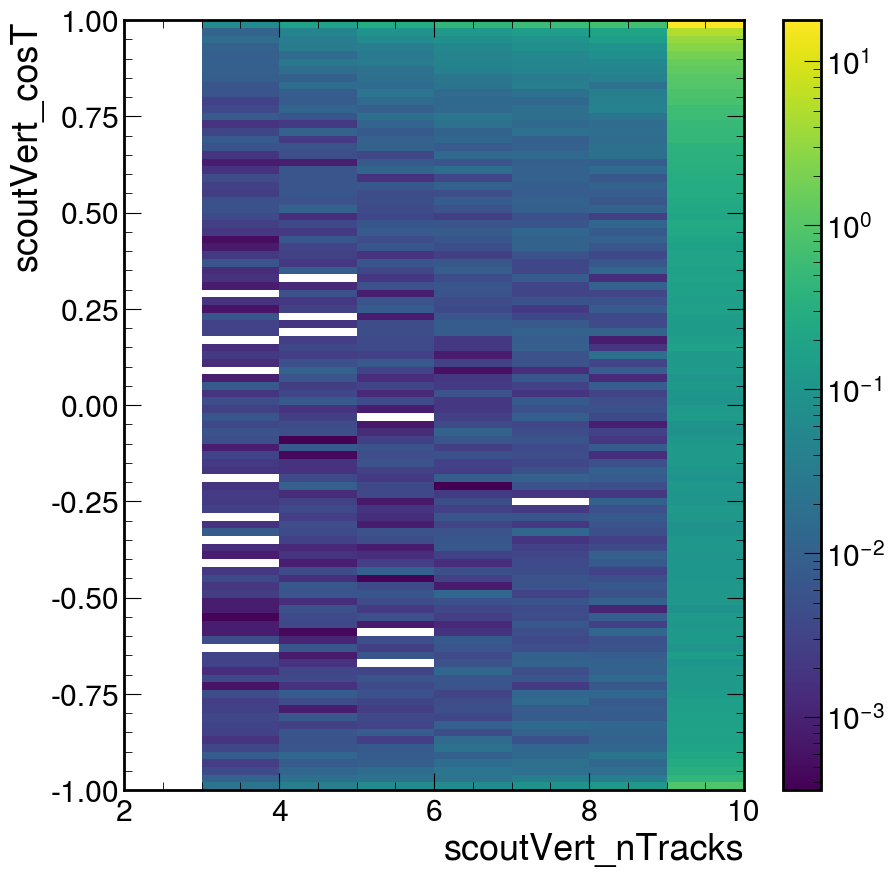

Hto2Sto4D-cT0p1-MS15


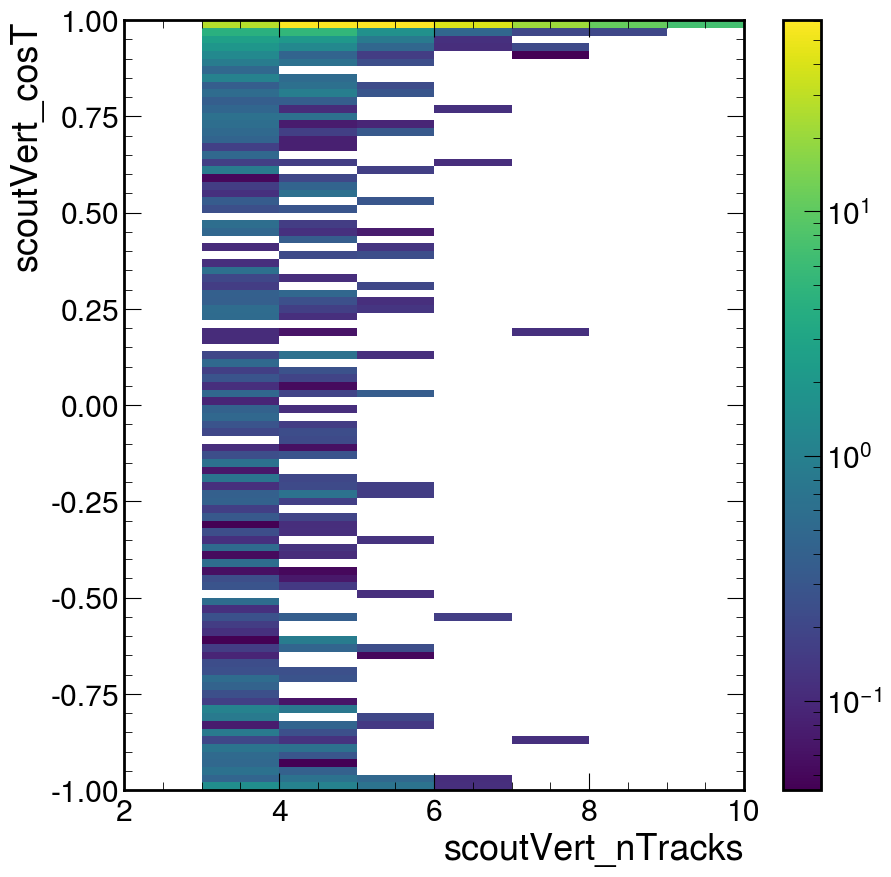

Hto2Sto4D-cT0p1-MS30


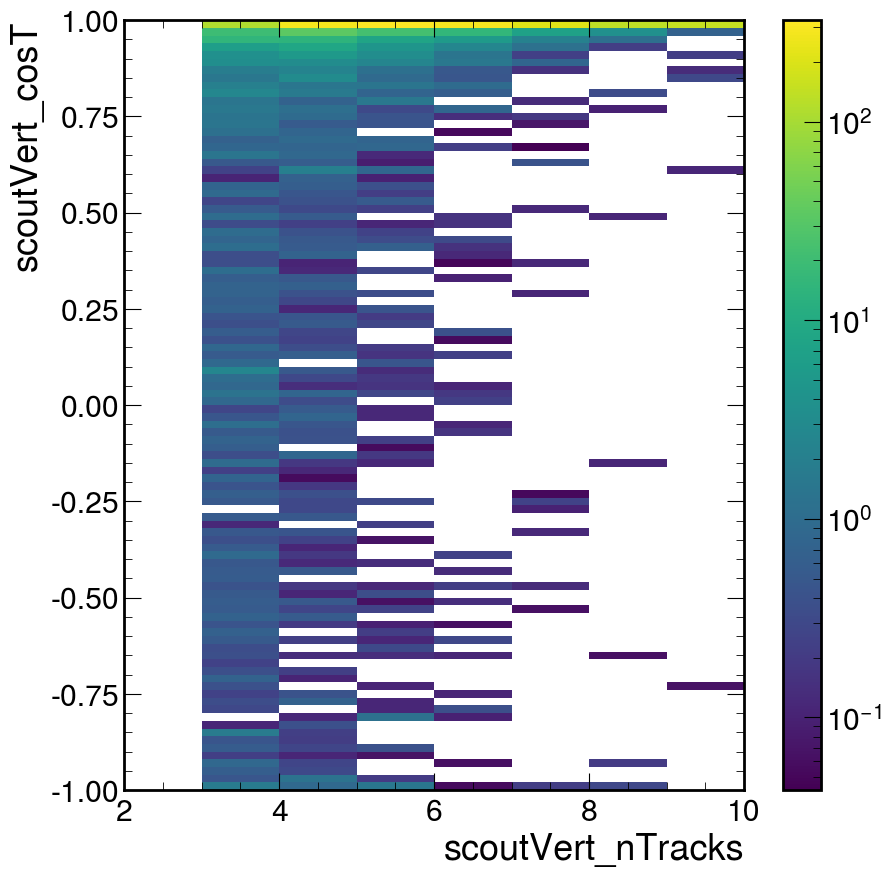

Hto2Sto4D-cT0p1-MS55


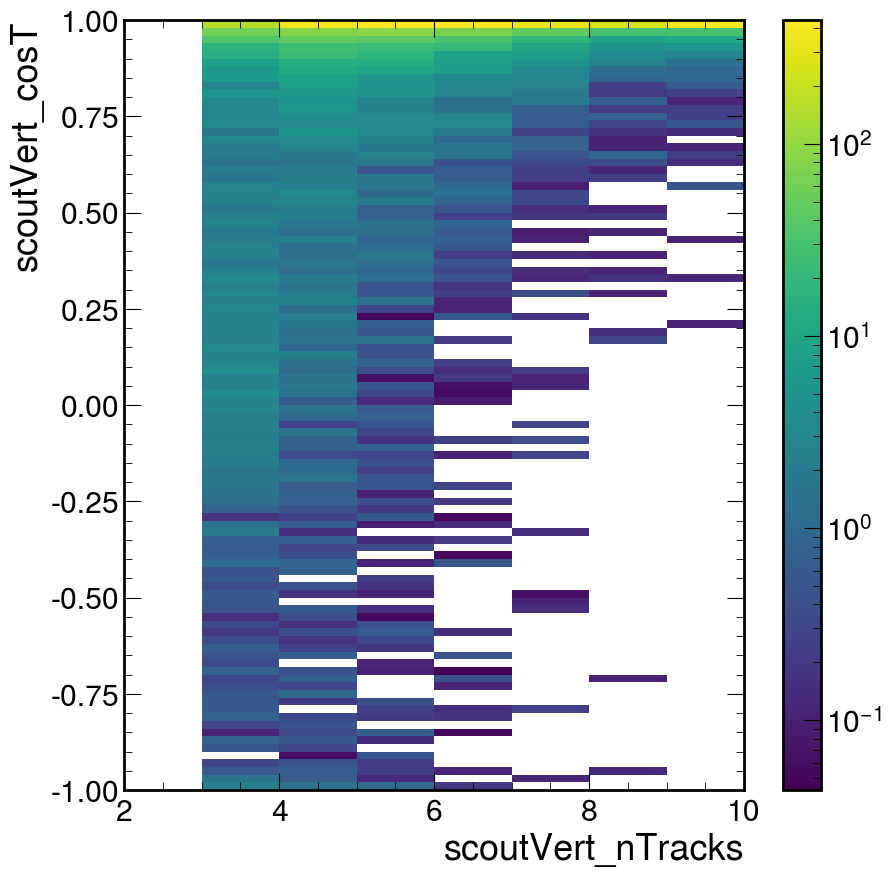

Hto2Sto4D-cT1-MS15


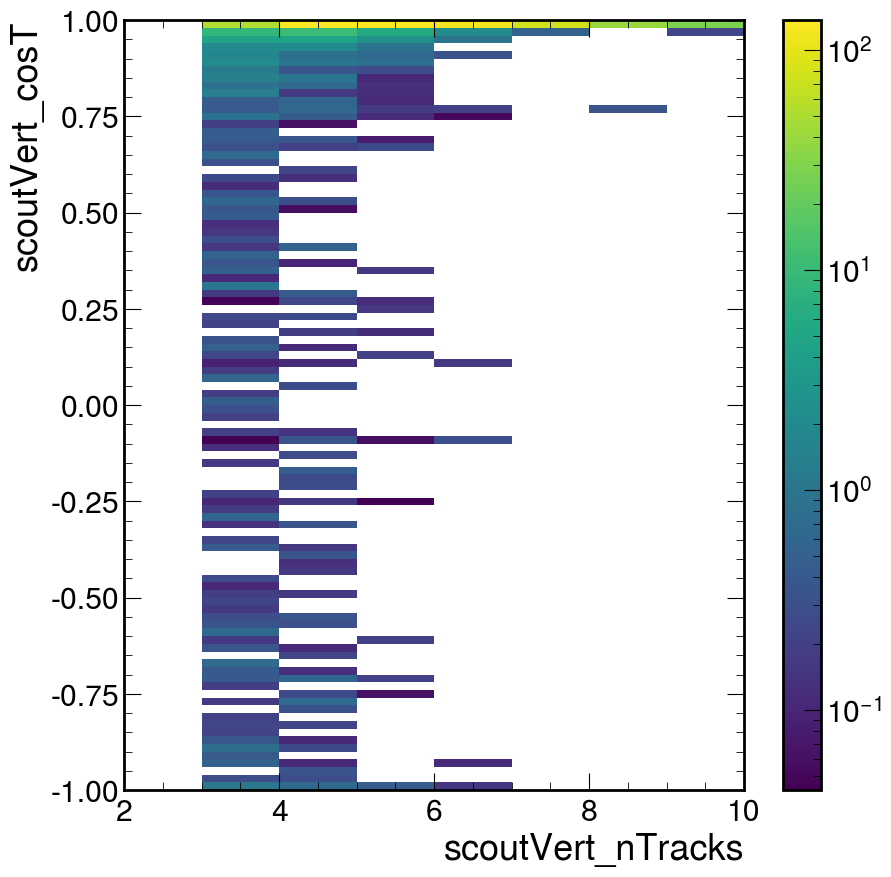

Hto2Sto4D-cT1-MS30


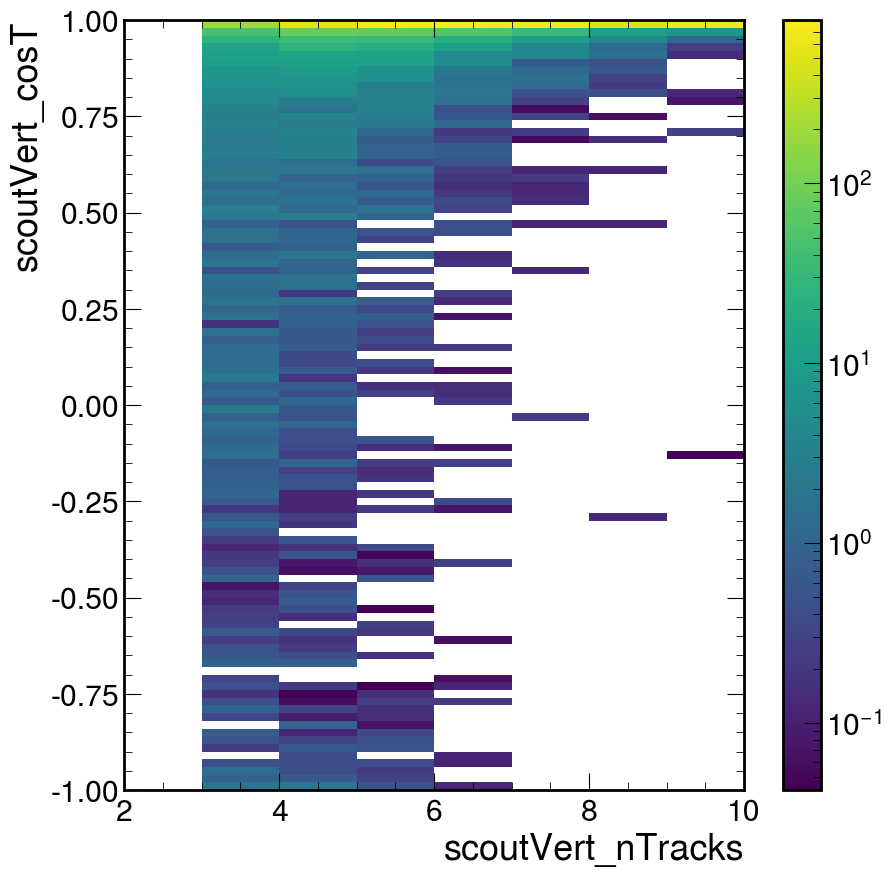

Hto2Sto4D-cT1-MS55


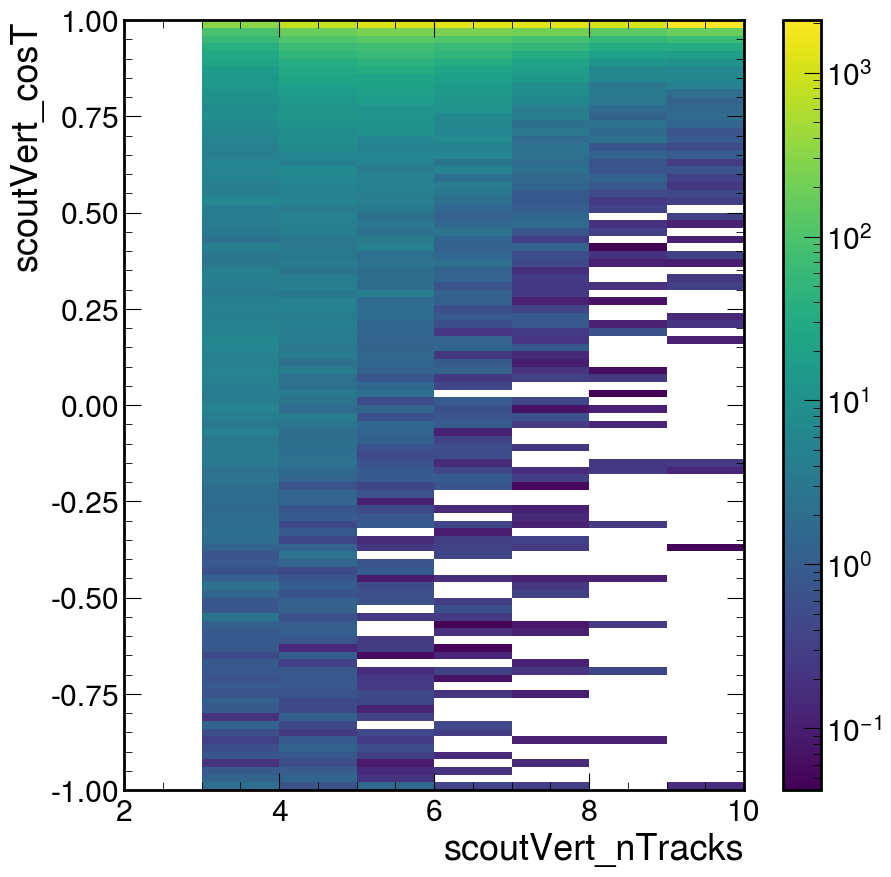

Hto2Sto4D-cT10-MS15


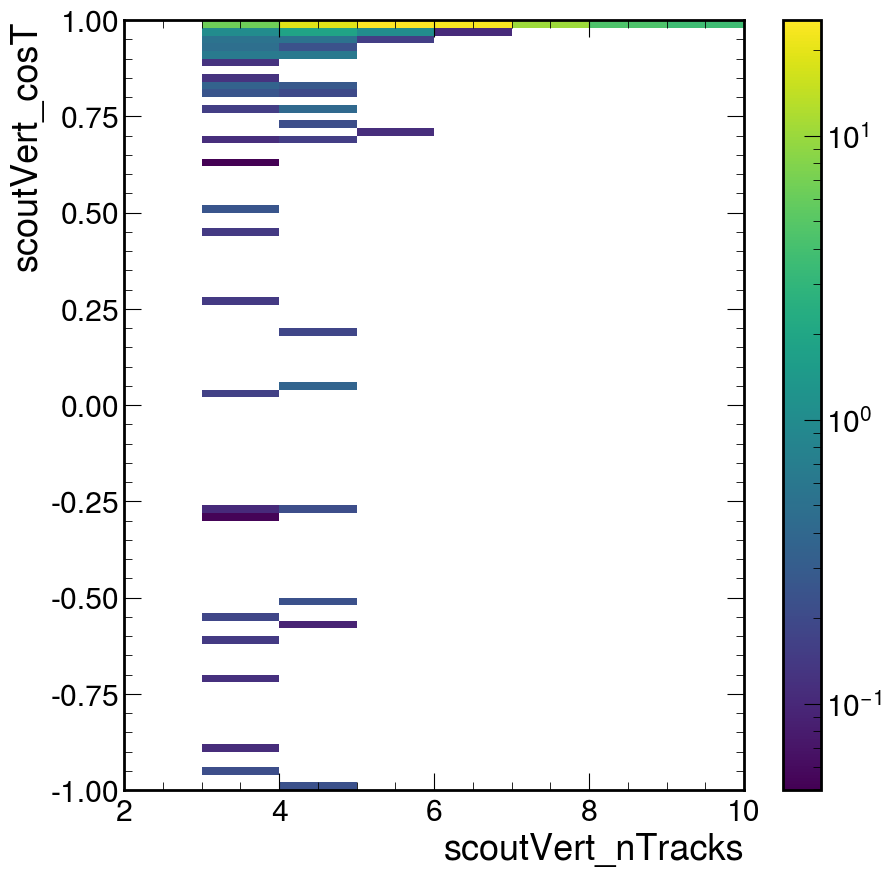

Hto2Sto4D-cT10-MS30


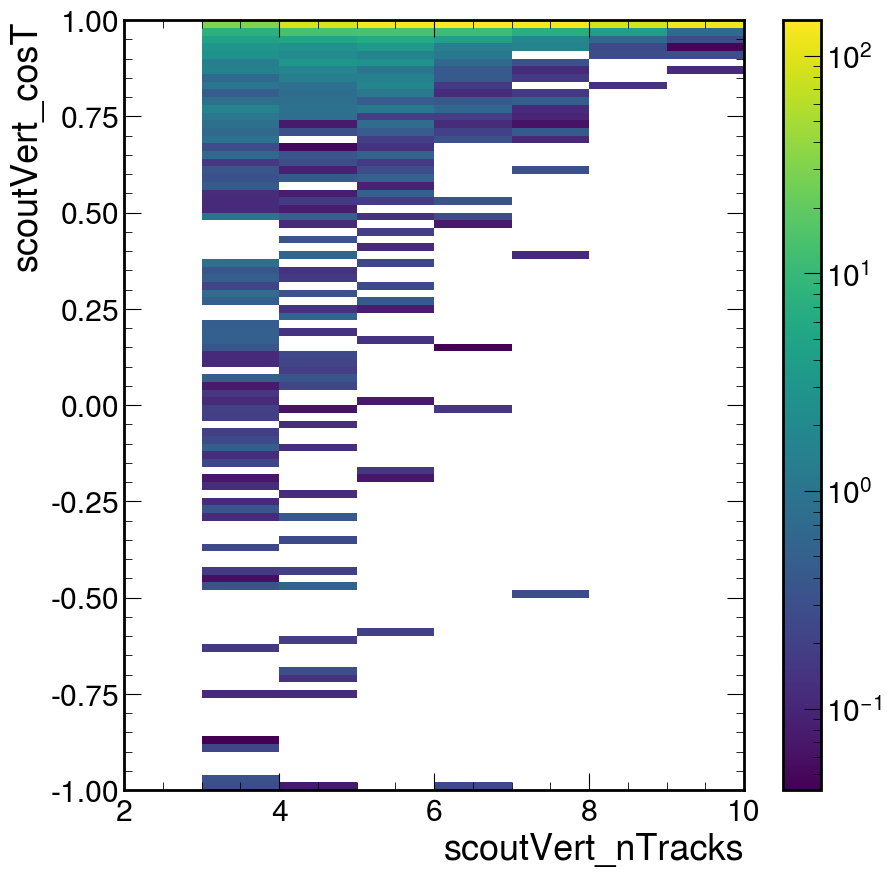

Hto2Sto4D-cT10-MS55


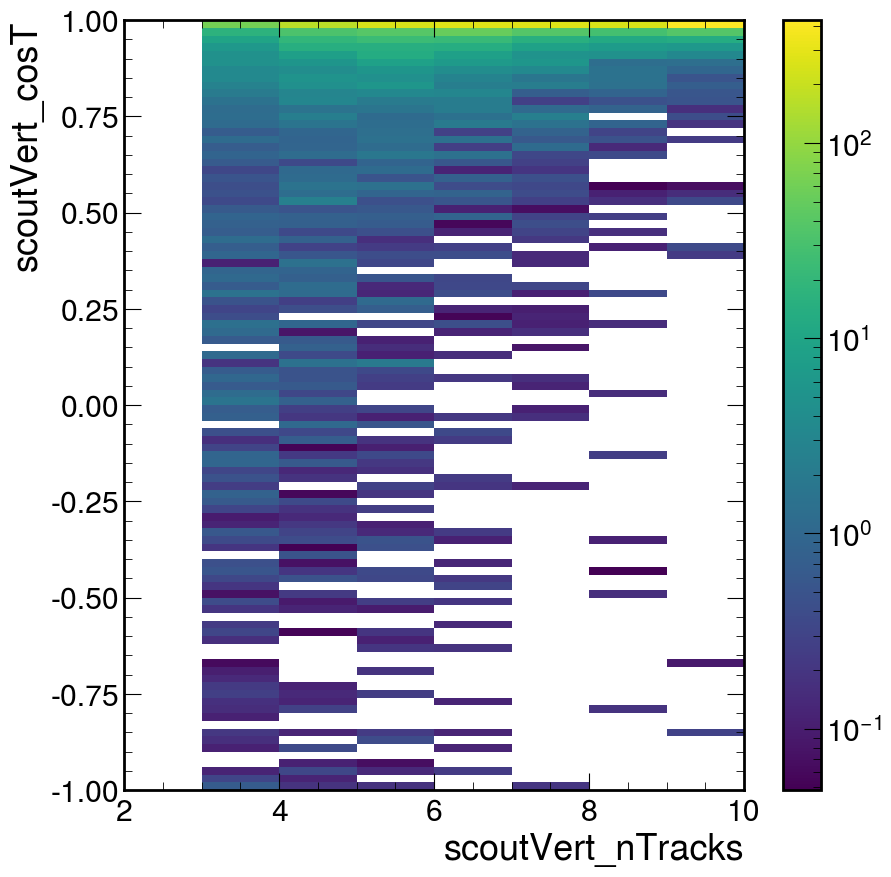

Total runtime: 19.98 seconds


In [37]:
#2D Plot Script

import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed
from matplotlib.colors import LogNorm

plotDict = {
    #"vertTrack_pt": [0,50,101], "vertTrack_eta": [-3,3,101], "vertTrack_phi": [-3.142,3.142,101],
    #"vertTrack_reducedChi2": [0,7,51], "vertTrack_dxy": [0,0.3,51], "vertTrack_dxySig": [0,50,101],
    #"vertTrack_nValidPixelHits": [0,13,14], "vertTrack_nTrackerLayersWithMeasurement": [0,21,22],
    #"vertTrack_nValidStripHits": [0,32,33], 
    "scoutVert_dBV": [0,1,101], "scoutVert_dBVErr": [0,0.1,101],
    #"vertTrack_nMissingInnerHits": [0,5,6], 
    "scoutVert_nTracks": [2,10,9], "scoutVert_chi2": [0,5,50],
    "scoutVert_dT": [0,0.5,101],
    "scoutVert_cosT": [-1,1,101],
    #"scoutTrack_eta": [-3,3,101], "scoutTrack_phi": [-3.142,3.142,101], "scoutTrack_dxy": [0,0.03,51], "scoutTrack_dxySig": [0,50,101]
}

xvar = "scoutVert_nTracks"
yvar = "scoutVert_cosT"

def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    doWeightSum = False
    genWeightSum = 0
    weightSum = np.zeros((plotDict[xvar][2]-1,plotDict[yvar][2]-1))
    with uproot.open(rootFile) as file:
        if(process in processDict):
            if (len(processDict[process])>1): doWeightSum = True
        elif(process in signalDict):
            if (len(signalDict[process])>1): doWeightSum = True
        if(doWeightSum):
            output["genWeightSum"] = {process: file["triggerFilter/genWeightsSkim"].values()[0]}
        else:
            output["genWeightSum"] = {}
            genWeightSum = file["triggerFilter/genWeightsSkim"].values()[0]
        tree = file["scoutingTree/objectTree"]

        # Select only necessary branches to load
        branches = list(plotDict.keys()) + ["vertTrack_iVtx", "weight","scoutVert_cosT"]

        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        for batch in tree.iterate(branches, library="ak", step_size=100000):  
            weights = batch["weight"]  # normalize event weights
            if(not doWeightSum): weights = weights / genWeightSum

            x_binning = plotDict[xvar]
            x_bins = np.linspace(x_binning[0], x_binning[1], x_binning[2])
            x_data = batch[xvar]

            y_binning = plotDict[yvar]
            y_bins = np.linspace(y_binning[0], y_binning[1], y_binning[2])
            y_data = batch[yvar]
            
            #Apply displacement cut
            mask = (batch["scoutVert_dBV"] >= 0.01) & (batch["scoutVert_dBV"] < 2)  & (batch["scoutVert_dBVErr"] < 0.005)  #& (batch["scoutVert_cosT"] > 0) 
            x_data = x_data[mask]
            y_data = y_data[mask]#*np.sqrt(x_data)
            broadcastWeights, x_data = ak.broadcast_arrays(weights,x_data)
            # Apply mask and flatten data
            x_data = ak.flatten(x_data,axis=None)
            x_data = np.clip(x_data,x_bins[0],x_bins[-1])
            y_data = ak.flatten(y_data,axis=None)
            y_data = np.clip(y_data,y_bins[0],y_bins[-1])
            weights_filtered = ak.flatten(broadcastWeights,axis=None)
            # Compute histograms
            n, xedges, yedges = np.histogram2d(x_data,y_data,weights=weights_filtered, bins=(x_bins,y_bins))
            weightSum = weightSum + n
    output["trkVert_eta_phi"] = {process: weightSum}
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        if process not in results[plot]:
                             results[plot][process] = result[plot][process]
                        else:
                            results[plot][process] = results[plot][process] + result[plot][process]

    return results

t0 = time.time()

bgPlotWeights = parallel_processing(processDict)
sigPlotWeights = parallel_processing(signalDict)

#Combining Background Subprocesses and Reweighting Events
for plot in ["trkVert_eta_phi"]:
    for process in bgPlotWeights["genWeightSum"].keys():
        bgPlotWeights[plot][process] = bgPlotWeights[plot][process] / bgPlotWeights["genWeightSum"][process]
    bgPlotWeights[plot]["QCD"] = bgPlotWeights[plot]["QCD40to70"]+bgPlotWeights[plot]["QCD70to100"]+bgPlotWeights[plot]["QCD100to200"]+bgPlotWeights[plot]["QCD200to400"]+bgPlotWeights[plot]["QCD400to600"]+bgPlotWeights[plot]["QCD600to800"]+bgPlotWeights[plot]["QCD800to1000"]+bgPlotWeights[plot]["QCD1000to1200"]+bgPlotWeights[plot]["QCD1200to1500"]+bgPlotWeights[plot]["QCD1500to2000"]+bgPlotWeights[plot]["QCD2000"]
    bgPlotWeights[plot]["TTbar"] = bgPlotWeights[plot]["TTTo4Q"]+bgPlotWeights[plot]["TTToLNu2Q"]
    bgPlotWeights[plot]["BG"] = bgPlotWeights[plot]["QCD"]+bgPlotWeights[plot]["TTbar"]
for plot in ["trkVert_eta_phi"]:
    for process in sigPlotWeights["genWeightSum"].keys():
        sigPlotWeights[plot][process] = sigPlotWeights[plot][process] / sigPlotWeights["genWeightSum"][process]

# **Plotting**
x_binning = plotDict[xvar]
y_binning = plotDict[yvar]
x_bins = np.linspace(x_binning[0], x_binning[1], x_binning[2])
y_bins = np.linspace(y_binning[0], y_binning[1], y_binning[2])
plt.pcolormesh(x_bins, y_bins, np.array(bgPlotWeights["trkVert_eta_phi"]["BG"]).T, shading='auto', cmap='viridis',norm=LogNorm())
plt.colorbar()
plt.xlabel(xvar)
plt.ylabel(yvar)
plt.show()

for signal in signalDict.keys():
    print(signal)
    plt.pcolormesh(x_bins, y_bins, np.array(sigPlotWeights["trkVert_eta_phi"][signal]).T, shading='auto', cmap='viridis',norm=LogNorm())
    plt.colorbar()
    plt.xlabel(xvar)
    plt.ylabel(yvar)
    plt.show()

t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")


In [19]:
def histogram_correlation(x_edges, y_edges, H):
    x_centers = (x_edges[:-1] + x_edges[1:]) / 2
    y_centers = (y_edges[:-1] + y_edges[1:]) / 2
    X, Y = np.meshgrid(x_centers, y_centers, indexing='xy')
    x_vals = X.ravel()
    y_vals = Y.ravel()
    weights = H.ravel()
    mean_x = np.average(x_vals, weights=weights)
    mean_y = np.average(y_vals, weights=weights)
    cov_xy = np.average((x_vals - mean_x) * (y_vals - mean_y), weights=weights)
    var_x = np.average((x_vals - mean_x)**2, weights=weights)
    var_y = np.average((y_vals - mean_y)**2, weights=weights)
    return cov_xy / np.sqrt(var_x * var_y)

print("TTbar", histogram_correlation(x_bins, y_bins, np.array(bgPlotWeights["trkVert_eta_phi"]["TTbar"])))
print("QCD", histogram_correlation(x_bins, y_bins, np.array(bgPlotWeights["trkVert_eta_phi"]["QCD"])))
print("Stop M200 cT1", histogram_correlation(x_bins, y_bins, np.array(sigPlotWeights["trkVert_eta_phi"]["Stop-M200-cT1"])))

TTbar 0.1853999522036858
QCD 0.19591442631101194
Stop M200 cT1 0.42145008900765024


Processing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v24-4DxyMin-3TrackMin/260219_191648/TTtoLNu2Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v24-4DxyMin-3TrackMin/260219_191733/QCD-4Jets_Bin-HT-200to400.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v24-4DxyMin-3TrackMin/260219_191809/QCD-4Jets_Bin-HT-800to1000.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v24-4DxyMin-3TrackMin/260219_191839/QCD-4Jets_Bin-HT-100to200.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v24-4DxyMin-3TrackMin/260219_191753/QCD-4

/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-numpy/1.24.3-a3a65cbc18c6a98e06451d4329e3ea47/lib/python3.9/site-packages/numpy/lib/function_base.py:1448: RuntimeWarning: invalid value encountered in subtract
  a = op(a[slice1], a[slice2])


Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v24-4DxyMin-3TrackMin/260219_191624/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7_Tree_v24-4DxyMin-3TrackMin/260219_191538/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-7.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v24-4DxyMin-3TrackMin/260219_191633/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root


/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-numpy/1.24.3-a3a65cbc18c6a98e06451d4329e3ea47/lib/python3.9/site-packages/numpy/lib/function_base.py:1448: RuntimeWarning: invalid value encountered in subtract
  a = op(a[slice1], a[slice2])


Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v24-4DxyMin-3TrackMin/260219_191614/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v24-4DxyMin-3TrackMin/260219_191604/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v24-4DxyMin-3TrackMin/260219_191556/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v24-4DxyMin-3T

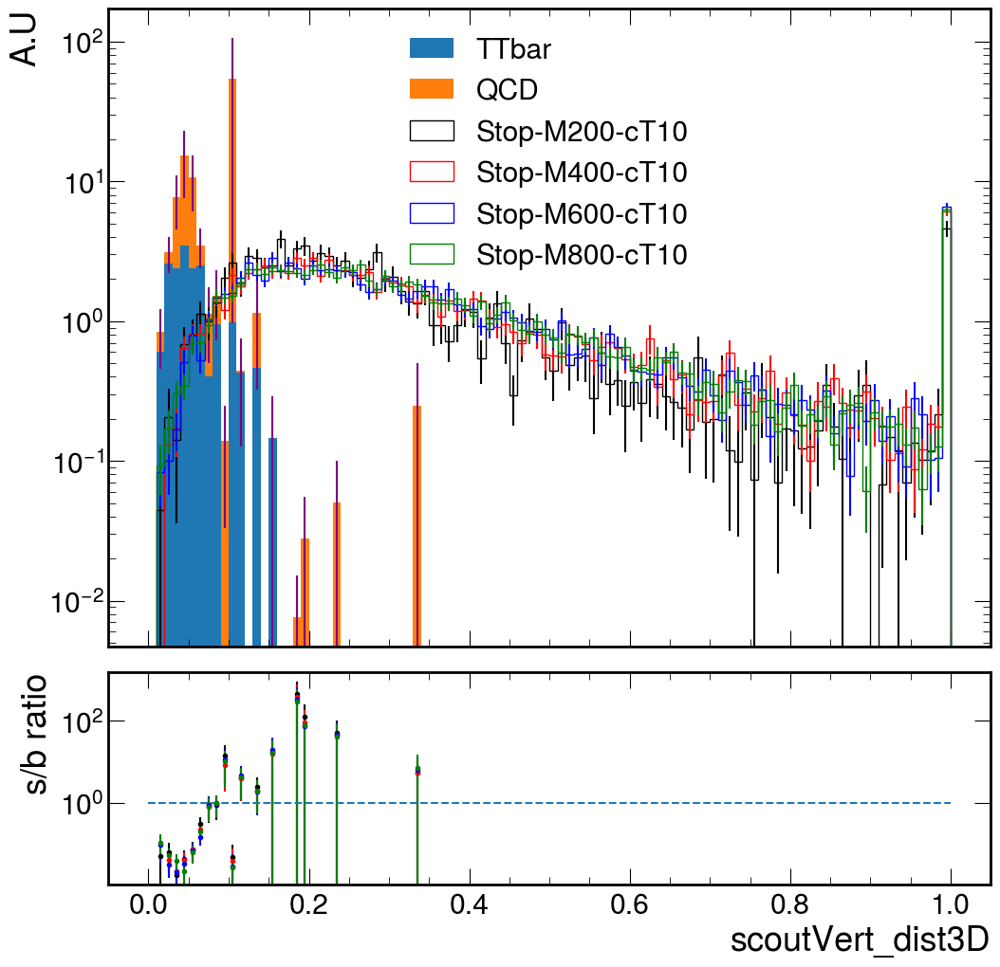

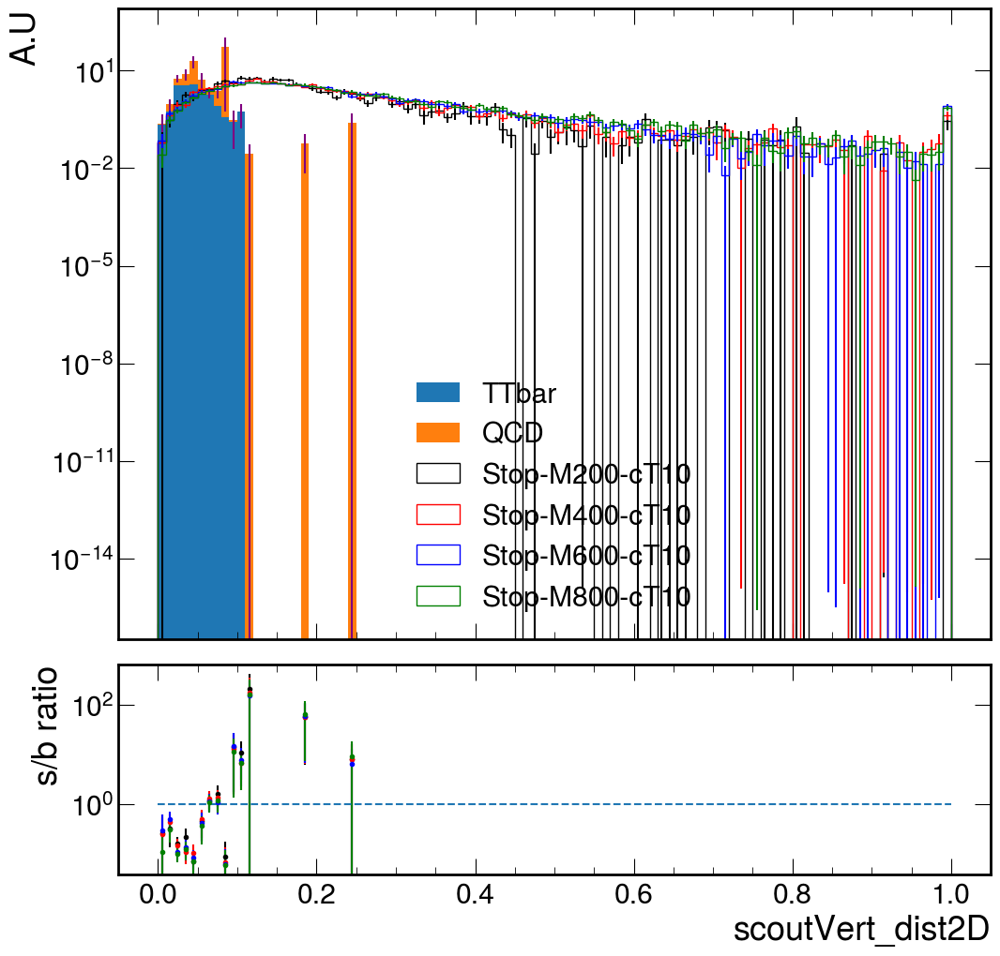

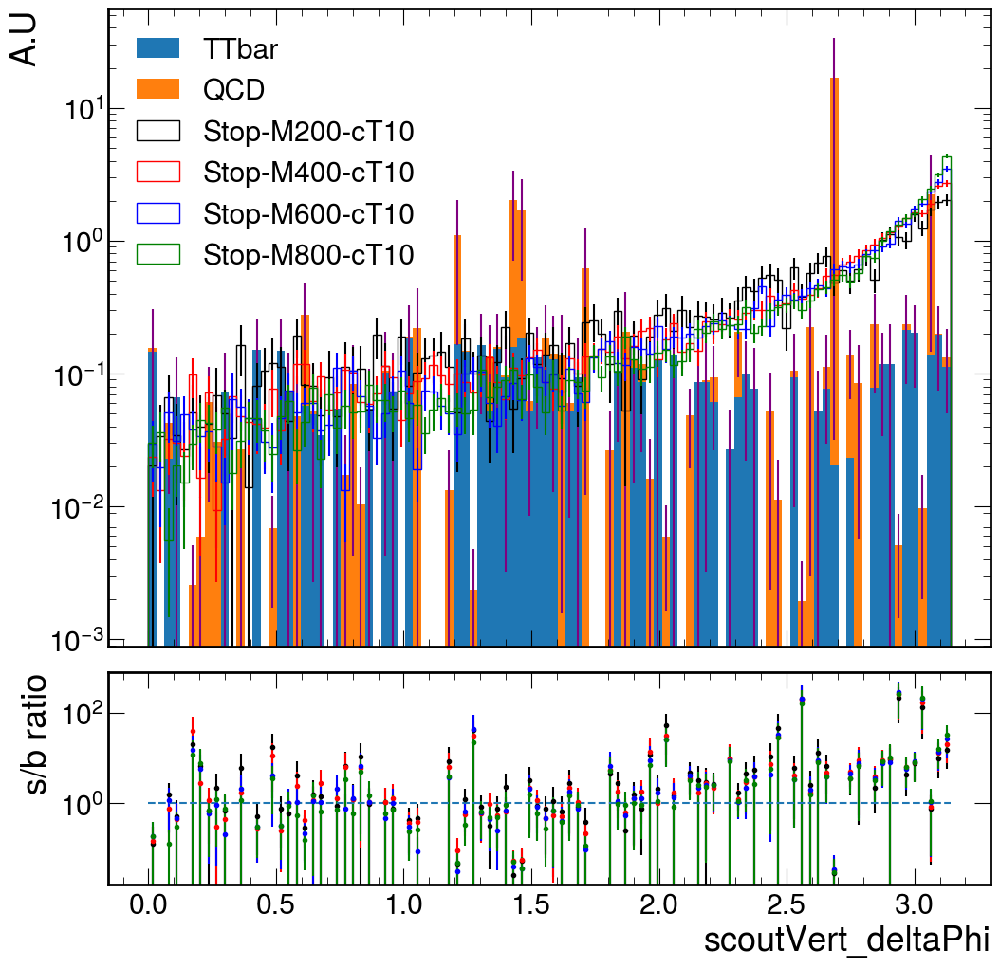

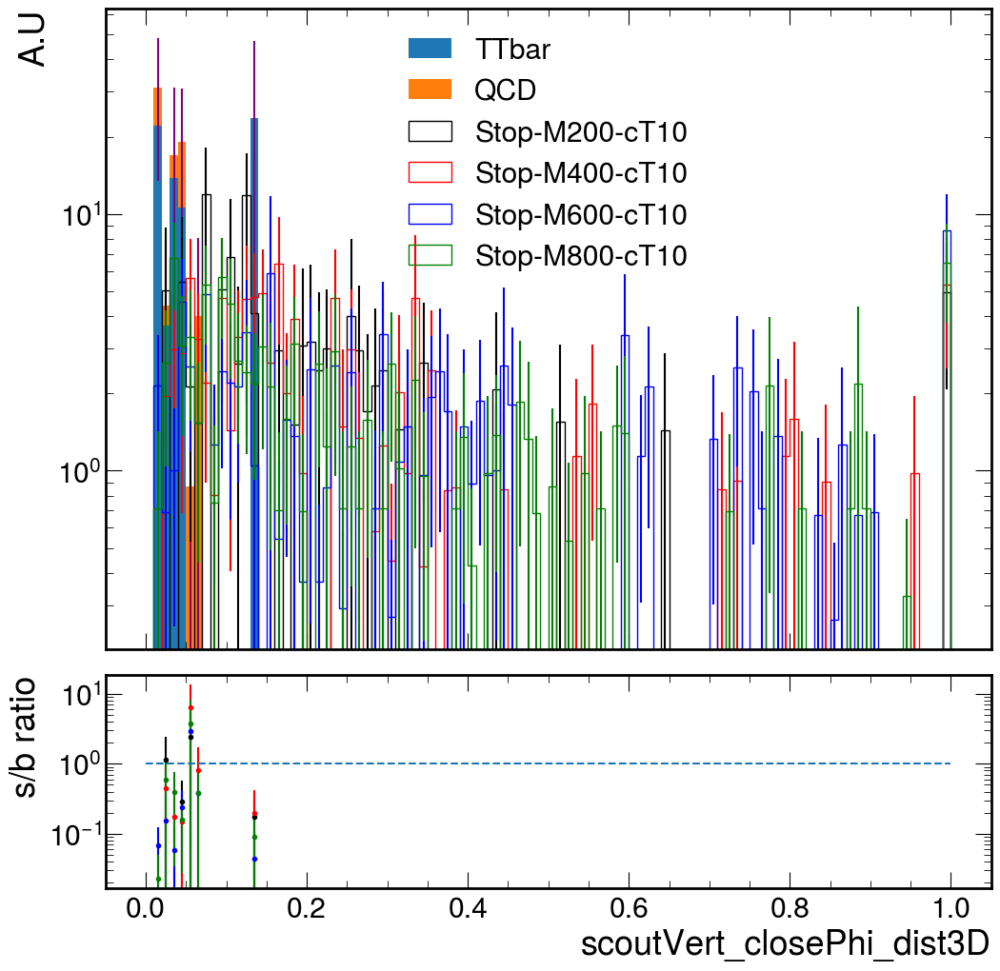

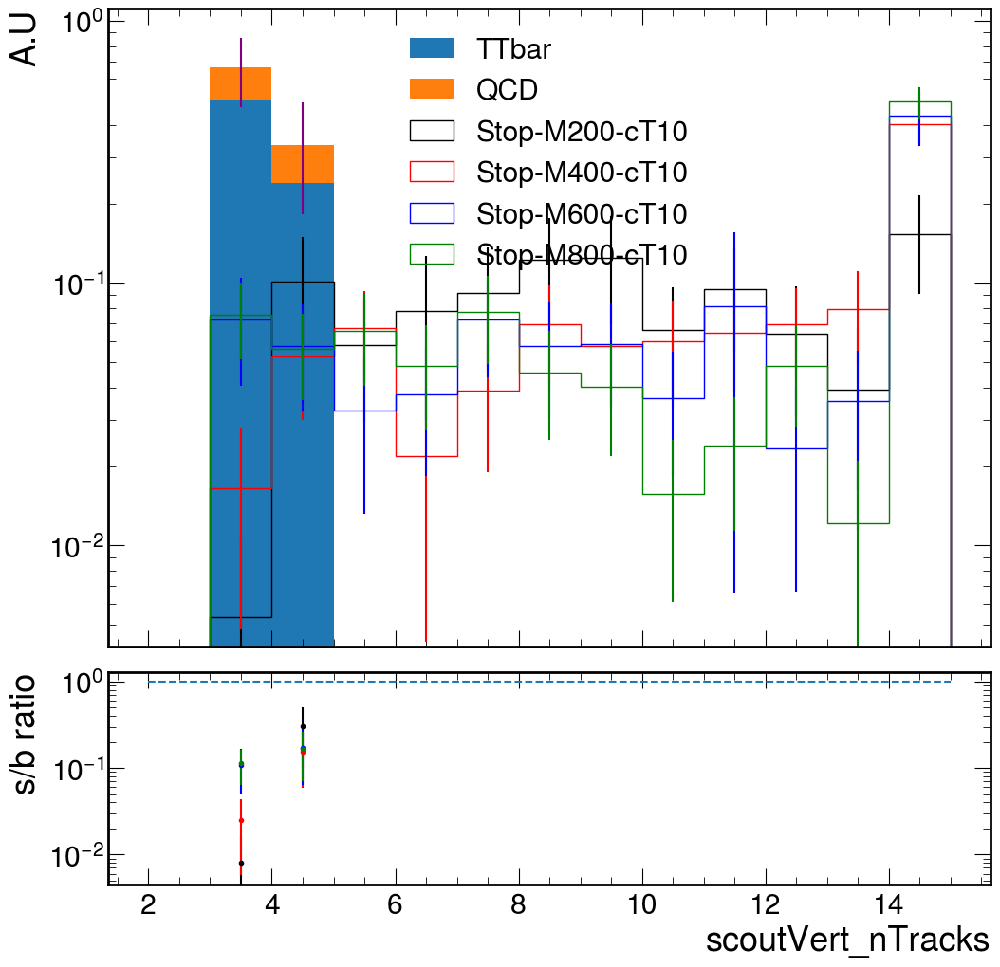

Total runtime: 33.67 seconds


In [49]:
#Vertex dVV Plots

plotDict = {
    "scoutVert_dist3D": [0,1,101], "scoutVert_dist2D": [0,1,101], "scoutVert_deltaPhi": [0,3.142,101], "scoutVert_closePhi_dist3D": [0,1,101], "scoutVert_nTracks": [2,15,14]
}

import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed       

def remove_duplicates_from_subarrays(arr):
    """
    Remove duplicate indices from each subarray in a 2D awkward array.
    
    Parameters:
    -----------
    arr : awkward.Array
        A 2D awkward array of indices
        
    Returns:
    --------
    awkward.Array
        A 2D awkward array with duplicates removed from each subarray
    """
    # Convert to numpy for processing
    content = ak.to_numpy(ak.flatten(arr))
    offsets = ak.to_numpy(ak.num(arr, axis=1))
    
    # Compute the starting index for each subarray
    starts = np.zeros(len(offsets), dtype=np.int64)
    np.cumsum(offsets[:-1], out=starts[1:])
    
    # Create a list to hold the processed subarrays
    result_list = []
    
    # Process each subarray
    for i in range(len(offsets)):
        start_idx = starts[i]
        end_idx = start_idx + offsets[i]
        
        # Extract the subarray and remove duplicates
        subarray = content[start_idx:end_idx]
        unique_subarray = np.unique(subarray)
        
        result_list.append(unique_subarray)
    
    # Convert back to awkward array
    return ak.Array(result_list)


def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    doWeightSum = False
    genWeightSum = 0
    with uproot.open(rootFile) as file:
        if(process in processDict):
            if (len(processDict[process])>1): doWeightSum = True
        elif(process in signalDict):
            if (len(signalDict[process])>1): doWeightSum = True
        if(doWeightSum):
            output["genWeightSum"] = {process: file["triggerFilter/genWeightsSkim"].values()[0]}
        else:
            output["genWeightSum"] = {}
            genWeightSum = file["triggerFilter/genWeightsSkim"].values()[0]
        tree = file["scoutingTree/objectTree"]

        # Select only necessary branches to load
        branches = ["scoutVert_x","scoutVert_y","scoutVert_z","scoutVert_dBV","scoutVert_phi","scoutVert_nTracks", "weight","scoutVert_cosT","scoutVert_dBVErr"]

        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        for batch in tree.iterate(branches, library="ak", step_size=10000):  
            weights = batch["weight"]  # normalize event weights
            if(not doWeightSum): weights = weights / genWeightSum

            vx = batch["scoutVert_x"]
            vy = batch["scoutVert_y"]
            vz = batch["scoutVert_z"]
            phi = batch["scoutVert_phi"]
            ntracks = batch["scoutVert_nTracks"]

            # Apply displacement cut
            #mask = (batch["scoutVert_dBV"] >= 0.01)
            mask = (batch["scoutVert_dBV"] >= 0.01) & (batch["scoutVert_dBV"] < 2) & (batch["scoutVert_dBVErr"] < 0.005) & (batch["scoutVert_cosT"] > 0)
            vx = vx[mask]
            vy = vy[mask]
            vz = vz[mask]
            phi = phi[mask]
            ntracks = ntracks[mask]
            
            idx = ak.argcombinations(vx, 2, fields=["i", "j"])  
            dx = vx[idx.i] - vx[idx.j]
            dy = vy[idx.i] - vy[idx.j]
            dz = vz[idx.i] - vz[idx.j]
            dphi = abs(phi[idx.i] - phi[idx.j])
            norm_dphi = ak.where(dphi > np.pi,2 * np.pi - dphi,dphi)
            distances3D = np.sqrt(dx**2 + dy**2 + dz**2)
            distances2D = np.sqrt(dx**2 + dy**2)
            mask = (norm_dphi<0.5) & (distances3D<0.2)
            close_idx = idx[mask]
            close_idx = ak.concatenate((close_idx.i,close_idx.j),axis=1)
            close_idx = remove_duplicates_from_subarrays(close_idx)
            
            for plot, binning in plotDict.items():
                if "deltaPhi" in plot:
                    data = norm_dphi
                elif "closePhi_dist3D" in plot:
                    mask = (norm_dphi<0.5)
                    data = distances3D[mask]
                elif "dist3D" in plot:
                    data = distances3D
                elif "dist2D" in plot:
                    data = distances2D
                elif "nTracks" in plot:
                    data = ntracks[close_idx]
                bins = np.linspace(binning[0], binning[1], binning[2])
                broadcastWeights, data = ak.broadcast_arrays(weights,data)
                # Apply mask and flatten data
                data = ak.flatten(data,axis=None)
                data = np.clip(data,bins[0],bins[-1])
                weights_filtered = ak.flatten(broadcastWeights,axis=None)
                # Compute histograms
                n, _ = np.histogram(data, weights=weights_filtered, bins=bins)
                n_2, _ = np.histogram(data, weights=weights_filtered**2, bins=bins)
                if plot not in output:
                    output[plot] = {process: n}
                    output[f"{plot}_squared"] = {process: n_2}
                else:
                    output[plot][process] = output[plot][process] + n
                    output[f"{plot}_squared"][process] = output[f"{plot}_squared"][process] + n_2
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        results[plot][process] = results[plot].get(process, 0) + result[plot][process]

    return results

t0 = time.time()

bgPlotWeights = parallel_processing(processDict)
sigPlotWeights = parallel_processing(signalDict)

#Combining Background Subprocesses and Reweighting Events
for plot in plotDict.keys():
    for process in bgPlotWeights["genWeightSum"].keys():
        bgPlotWeights[plot][process] = bgPlotWeights[plot][process] / bgPlotWeights["genWeightSum"][process]
        bgPlotWeights[f"{plot}_squared"][process] = bgPlotWeights[f"{plot}_squared"][process] / (bgPlotWeights["genWeightSum"][process]**2)
    bgPlotWeights[plot]["QCD"] = bgPlotWeights[plot]["QCD200to400"]+bgPlotWeights[plot]["QCD400to600"]+bgPlotWeights[plot]["QCD600to800"]+bgPlotWeights[plot]["QCD800to1000"]+bgPlotWeights[plot]["QCD1000to1200"]+bgPlotWeights[plot]["QCD1200to1500"]+bgPlotWeights[plot]["QCD1500to2000"]+bgPlotWeights[plot]["QCD2000"]
    bgPlotWeights[f"{plot}_squared"]["QCD"] = bgPlotWeights[f"{plot}_squared"]["QCD200to400"]+bgPlotWeights[f"{plot}_squared"]["QCD400to600"]+bgPlotWeights[f"{plot}_squared"]["QCD600to800"]+bgPlotWeights[f"{plot}_squared"]["QCD800to1000"]+bgPlotWeights[f"{plot}_squared"]["QCD1000to1200"]+bgPlotWeights[f"{plot}_squared"]["QCD1200to1500"]+bgPlotWeights[f"{plot}_squared"]["QCD1500to2000"]+bgPlotWeights[f"{plot}_squared"]["QCD2000"]
    bgPlotWeights[plot]["TTbar"] = bgPlotWeights[plot]["TTTo4Q"]+bgPlotWeights[plot]["TTToLNu2Q"]
    bgPlotWeights[f"{plot}_squared"]["TTbar"] = bgPlotWeights[f"{plot}_squared"]["TTTo4Q"]+bgPlotWeights[f"{plot}_squared"]["TTToLNu2Q"]
for plot in plotDict.keys():
    for process in sigPlotWeights["genWeightSum"].keys():
        sigPlotWeights[plot][process] = sigPlotWeights[plot][process] / sigPlotWeights["genWeightSum"][process]
        sigPlotWeights[f"{plot}_squared"][process] = sigPlotWeights[f"{plot}_squared"][process] / (sigPlotWeights["genWeightSum"][process]**2)

# **Plotting**
for plot, binning in plotDict.items():
    if plot not in bgPlotWeights:
        print(f"Skipping {plot} (no data).")
        continue

    bins = np.linspace(binning[0], binning[1], binning[2])
    bgIntegral = (bins[1] - bins[0]) * sum(bgPlotWeights[plot]["QCD"] + bgPlotWeights[plot]["TTbar"])

    fig, (ax, rax) = plt.subplots(2, 1, figsize=[12,12], gridspec_kw={"height_ratios": [3,1]}, sharex=True)
    fig.subplots_adjust(hspace=0.06)
    ax.hist([(bins[:-1] + bins[1:]) / 2]*2,weights=[list(bgPlotWeights[plot]["TTbar"]),list(bgPlotWeights[plot]["QCD"])],
            stacked=True, density=True, label=["TTbar","QCD"], bins=bins)

    bgValues = (bgPlotWeights[plot]["QCD"] / bgIntegral) + (bgPlotWeights[plot]["TTbar"] / bgIntegral)
    bgErrors = np.sqrt(bgPlotWeights[f"{plot}_squared"]["QCD"] / (bgIntegral**2) + \
               bgPlotWeights[f"{plot}_squared"]["TTbar"] / (bgIntegral**2))
    #bgValues = np.nan_to_num(bgValues)
    #bgErrors = np.nan_to_num(bgErrors)
    ax.errorbar(((bins[:-1] + bins[1:]) / 2), bgValues, yerr=bgErrors, linestyle="none", color="purple")
    
    colors = {"Stop-M200-cT10": "black", "Stop-M400-cT10": "red", "Stop-M600-cT10": "blue", "Stop-M800-cT10": "green"}
    #colors = {"Hto2Sto4D-cT10-MS1": "black", "Hto2Sto4D-cT10-MS15": "red", "Hto2Sto4D-cT10-MS30": "blue", "Hto2Sto4D-cT10-MS55": "green"}
    for signal, color in colors.items():
        if plot not in sigPlotWeights or signal not in sigPlotWeights[plot]:
            print(f"Skipping {signal} in {plot} (no data).")
            continue

        integral = (bins[1] - bins[0]) * sum(sigPlotWeights[plot][signal])
        ax.hist(((bins[:-1] + bins[1:]) / 2), weights=list(sigPlotWeights[plot][signal]),
                stacked=False, density=True, label=signal, bins=bins, histtype="step", color=color)

        sigValues = sigPlotWeights[plot][signal] / integral
        sigErrors = np.sqrt(sigPlotWeights[f"{plot}_squared"][signal] / (integral**2))

        ax.errorbar(((bins[:-1] + bins[1:]) / 2), sigValues, yerr=sigErrors, linestyle="none", color=color)
        ratioValues = sigValues / bgValues
        ratioErrors = ratioValues * np.sqrt((sigErrors / sigValues)**2 + (bgErrors / bgValues)**2)
        #ratioValues = np.nan_to_num(ratioValues)
        #ratioErrors = np.nan_to_num(ratioErrors)
        rax.errorbar(((bins[:-1] + bins[1:]) / 2), ratioValues, yerr=ratioErrors, linestyle="none", color=color, marker=".")

    rax.hlines(1, bins[0], bins[-1], linestyle="dashed")
    rax.set_ylabel("s/b ratio")
    ax.set_ylabel("A.U")
    plt.xlabel(plot)
    ax.legend()
    ax.set_yscale("log")
    rax.set_yscale("log")
    plt.show()

t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")


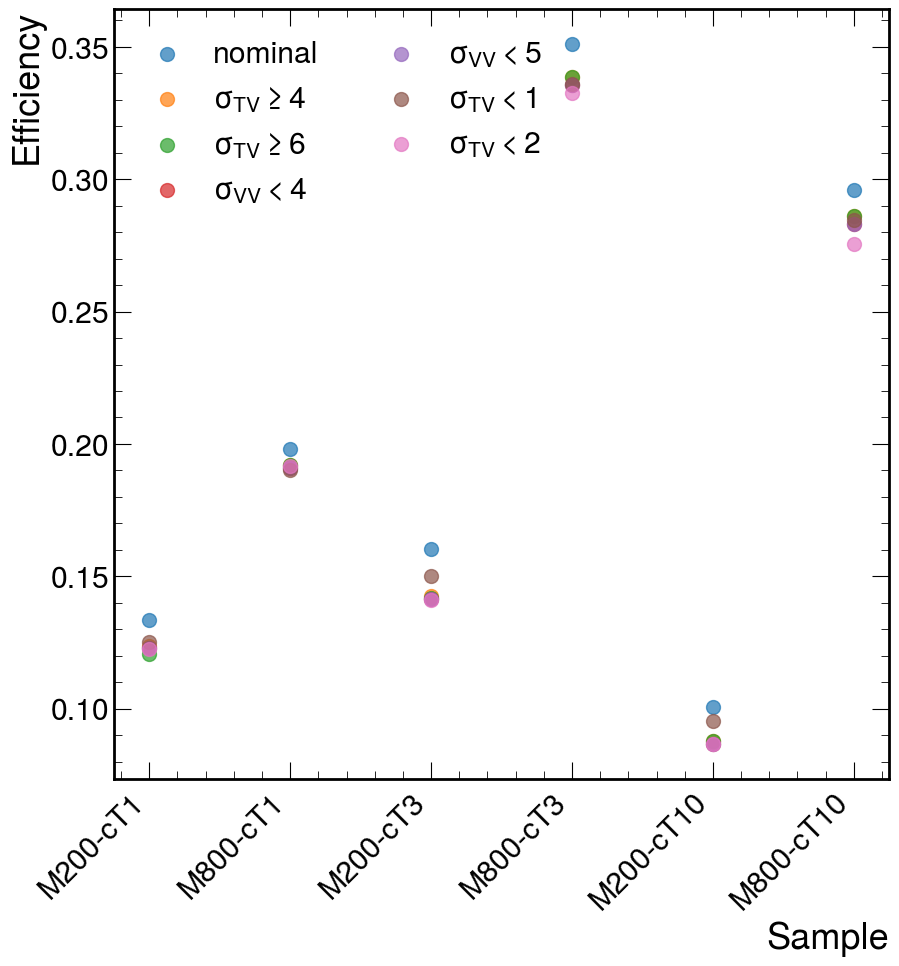

In [51]:
import matplotlib.pyplot as plt

def create_scatter_plot(x_labels, y_values, title="Scatter Plot", x_label="Categories", y_label="Values", legend="nominal"):
    """
    Creates a scatter plot with string labels on the x-axis and float values on the y-axis
    
    Args:
        x_labels (list): List of strings for x-axis labels
        y_values (list): List of floats for y values
        title (str): Title of the plot
        x_label (str): Label for x-axis
        y_label (str): Label for y-axis
    """
    # Check if input lists have the same length
    if len(x_labels) != len(y_values):
        raise ValueError("The lists of x labels and y values must have the same length")
    
    # Create x-coordinates (just numerical positions)
    x_positions = list(range(len(x_labels)))
    plt.scatter(x_positions, y_values, s=100, alpha=0.7,label=legend)
    
    # Set the x-axis ticks and labels
    plt.xticks(x_positions, x_labels, rotation=45, ha='right')
    
    # Add labels and title
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(title)
    leg = plt.legend(frameon=False,ncol=2)
    leg.get_frame().set_edgecolor('black')

# Example usage
if __name__ == "__main__":
    # Sample data
    categories = ["M200-cT1","M800-cT1","M200-cT3","M800-cT3","M200-cT10","M800-cT10"]
    nominal_values = [0.13335353535351235,0.19808999999995566,0.160289999999968,0.3509793814432051,0.10056112224447658,0.2957499999999237]
    maxTrackVertSig4_values = [0.12371717171715187,0.19207999999995762,0.1426499999999738,0.3386082474225906,0.08784569138275729,0.2860299999999269]
    maxTrackVertSig6_values = [0.12077777777775889,0.19207999999995762,0.141949999999974,0.3386082474225906,0.08784569138275729,0.2860299999999269]
    mergeShared3_values = [0.12294949494947535,0.190849999999958,0.1413399999999742,0.33540206185558136,0.08668336673345907,0.2829699999999279]
    mergeShared5_values = [0.12132323232321326,0.19267999999995744,0.14289999999997371,0.3399072164947551,0.08845691382764687,0.2875699999999264]
    minTrackVertSig1_values = [0.1252525252525049,0.1900099999999583,0.15008999999997136,0.3360618556700141,0.09551102204407742,0.2845199999999274]
    minTrackVertSig2_values = [0.12239393939391997,0.19149999999995782,0.14113999999997429,0.33273195876279865,0.08657314629257734,0.2756099999999303]
    # Create the scatter plot
    #plt.figure(figsize=(10, 6))
    plt.figure()
    create_scatter_plot(categories, nominal_values, "", "Sample", "Efficiency")
    create_scatter_plot(categories, maxTrackVertSig4_values, "", "Sample", "Efficiency",legend="$\sigma_{TV} \geq 4$")
    create_scatter_plot(categories, maxTrackVertSig6_values, "", "Sample", "Efficiency",legend="$\sigma_{TV} \geq 6$")
    create_scatter_plot(categories, mergeShared3_values, "", "Sample", "Efficiency",legend="$\sigma_{VV} < 4$")
    create_scatter_plot(categories, mergeShared3_values, "", "Sample", "Efficiency",legend="$\sigma_{VV} < 5$")
    create_scatter_plot(categories, minTrackVertSig1_values, "", "Sample", "Efficiency",legend="$\sigma_{TV} < 1$")
    create_scatter_plot(categories, minTrackVertSig2_values, "", "Sample", "Efficiency",legend="$\sigma_{TV} < 2$")
    #plt.ylim(0.1,0.5)
    plt.show()

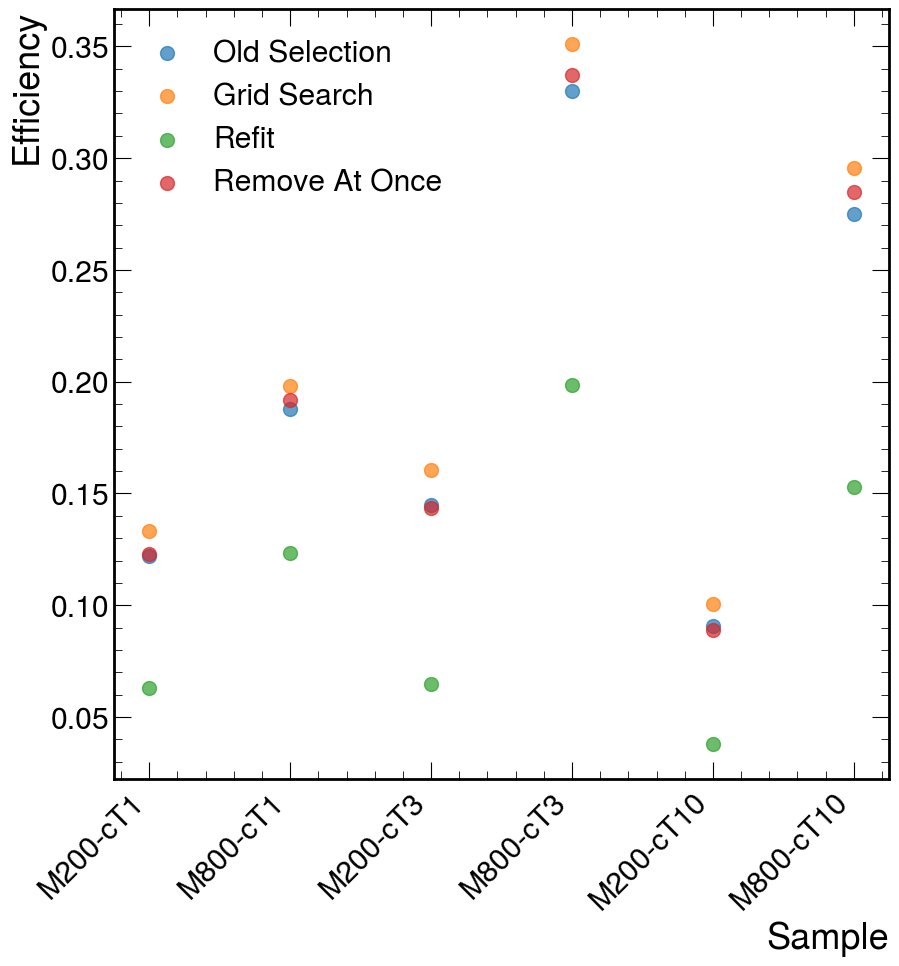

In [75]:
import matplotlib.pyplot as plt

def create_scatter_plot(x_labels, y_values, title="Scatter Plot", x_label="Categories", y_label="Values", legend="nominal"):
    """
    Creates a scatter plot with string labels on the x-axis and float values on the y-axis
    
    Args:
        x_labels (list): List of strings for x-axis labels
        y_values (list): List of floats for y values
        title (str): Title of the plot
        x_label (str): Label for x-axis
        y_label (str): Label for y-axis
    """
    # Check if input lists have the same length
    if len(x_labels) != len(y_values):
        raise ValueError("The lists of x labels and y values must have the same length")
    
    # Create x-coordinates (just numerical positions)
    x_positions = list(range(len(x_labels)))
    plt.scatter(x_positions, y_values, s=100, alpha=0.7,label=legend)
    
    # Set the x-axis ticks and labels
    plt.xticks(x_positions, x_labels, rotation=45, ha='right')
    
    # Add labels and title
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(title)
    leg = plt.legend(frameon=False)
    leg.get_frame().set_edgecolor('black')

# Example usage
if __name__ == "__main__":
    # Sample data
    categories = ["M200-cT1","M800-cT1","M200-cT3","M800-cT3","M200-cT10","M800-cT10"]
    nominal_values = [0.13335353535351235,0.19808999999995566,0.160289999999968,0.3509793814432051,0.10056112224447658,0.2957499999999237]
    refit_values = [0.06300000000000006,0.12345999999998009,0.06482999999999928,0.19836082474222416,0.03780561122244749,0.1527999999999705]
    refit0p005_values=[0.1057575757575618,0.1673699999999657,0.11873999999998162,0.28708247422673117,0.07174348697394493,0.23581999999994332]
    refitRemoveAtOnce_values = [0.12296969696967737,0.19168367346934592,0.14347999999997352,0.33722680412362194,0.08890781563125394,0.2847799999999273]
    refitRemoveAtOnce0p005_values = [0.10808080808079336,0.17147999999996436,0.12145999999998072,0.2955567010308521,0.07345691382765179,0.2457099999999401]
    preSearch_values = [0.122,0.188,0.145,0.330,0.0909,0.275]
    # Create the scatter plot
    #plt.figure(figsize=(10, 6))
    plt.figure()
    create_scatter_plot(categories, preSearch_values, "", "Sample", "Efficiency",legend="Old Selection")
    create_scatter_plot(categories, nominal_values, "", "Sample", "Efficiency",legend="Grid Search")
    create_scatter_plot(categories, refit_values, "", "Sample", "Efficiency",legend="Refit")
    #create_scatter_plot(categories, refit0p005_values, "", "Sample", "Efficiency",legend="3D Shift 0.005")
    create_scatter_plot(categories, refitRemoveAtOnce_values, "", "Sample", "Efficiency",legend="Remove At Once")
    #create_scatter_plot(categories, refitRemoveAtOnce0p005_values, "", "Sample", "Efficiency",legend="Remove At Once 3D Shift 0.005")
    #plt.ylim(0.1,0.5)
    plt.show()

In [3]:
#Cutflow for background estimation
bin_namesCustom = ["A","B","C","D"]

def process_cutflows(args):
    """ Process a single ROOT file in chunks using uproot.iterate() """
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    with uproot.open(rootFile) as file:
        output[process] = {}
        output[process+"_squared"] = {}
        output[process+"_nEvents"] = {}
        tree = file["scoutingTree/objectTree"]

        # Select only necessary branches to load
        branches = ["scoutVert_dBV", "scoutVert_nTracks","weight","scoutVert_chi2"]

        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        weightSum = [0]*len(bin_namesCustom)
        weightSumSquared = [0] * len(bin_namesCustom)
        numEvents = [0] * len(bin_namesCustom)
        for batch in tree.iterate(branches, library="ak", step_size=100000):  
            weights = batch["weight"]  # event weights
            dBV = batch["scoutVert_dBV"]
            ntracks = batch["scoutVert_nTracks"]
            chi2 = batch["scoutVert_chi2"]
            
            mask = (dBV>0.01) & (dBV<2.0) & (ntracks>3)
            dBV = dBV[mask]
            ntracks = ntracks[mask]
            chi2 = chi2[mask]
            mask = ak.num(dBV,axis=1)>0
            weights = weights[mask]
            ntracks = ntracks[mask]
            chi2 = chi2[mask]
            
            ntrackMask = (ntracks>7)
            chi2Mask = (chi2<3.0)
            #Signal region B
            mask = ntrackMask & chi2Mask
            mask = ak.num(ntracks[mask])>0
            weightsB = weights[mask]
            weightSum[1] += ak.sum(weightsB)
            weightSumSquared[1] += ak.sum(weightsB**2)
            ntrackMask = ntrackMask[~mask]
            chi2Mask = chi2Mask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region D
            mask = ntrackMask & ~chi2Mask
            mask = ak.num(ntracks[mask])>0
            weightsD = weights[mask]
            weightSum[3] += ak.sum(weightsD)
            weightSumSquared[3] += ak.sum(weightsD**2)
            ntrackMask = ntrackMask[~mask]
            chi2Mask = chi2Mask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region C
            mask = ~ntrackMask & ~chi2Mask
            mask = ak.num(ntracks[mask])>0
            weightsC = weights[mask]
            weightSum[2] += ak.sum(weightsC)
            weightSumSquared[2] += ak.sum(weightsC**2)
            ntrackMask = ntrackMask[~mask]
            chi2Mask = chi2Mask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region A
            mask = ~ntrackMask & chi2Mask
            mask = ak.num(ntracks[mask])>0
            weightsA = weights[mask]
            weightSum[0] += ak.sum(weightsA)
            weightSumSquared[0] += ak.sum(weightsA**2)
            
        for i in range(len(bin_namesCustom)):
            output[process][bin_namesCustom[i]] = weightSum[i]
            output[process+"_squared"][bin_namesCustom[i]] = weightSumSquared[i]
            output[process+"_nEvents"][bin_namesCustom[i]] = numEvents[i]
        
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    """ Process all ROOT files in parallel and aggregate results """
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_cutflows, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for process in result:
                if process not in results:
                    results[process] = result[process]
                else:
                    for cut in result[process]:
                        results[process][cut] = results[process].get(cut, 0) + result[process][cut]

    return results

dict = signalDict | processDict
customWeights = parallel_processing(dict)
genWeightSumDict = {}
for process, rootFiles in dict.items():
    genWeightSum = 0
    for rootFile in rootFiles:
        f = ROOT.TFile.Open(rootFile, "READ")
        h_genWeights = f.Get("triggerFilter/genWeightsSkim")
        n_binsSkim = h_genWeights.GetNbinsX() 
        genWeights = np.array([h_genWeights.GetBinContent(i) for i in range(1, n_binsSkim + 1)])
        genWeightSum += genWeights[0]
    genWeightSumDict[process] = genWeightSum
      
#Combining Background Subprocesses and Reweighting Events
for process in dict.keys():
    for cut in customWeights[process].keys():
        customWeights[process][cut] = customWeights[process][cut] / genWeightSumDict[process]
        customWeights[process+"_squared"][cut] = customWeights[process+"_squared"][cut] / (genWeightSumDict[process]**2)
customWeights["QCD"] = {}
customWeights["TTbar"] = {}
customWeights["QCD_squared"] = {}
customWeights["TTbar_squared"] = {}
customWeights["QCD_nEvents"] = {}
customWeights["TTbar_nEvents"] = {}
for i in range(len(bin_namesCustom)):
    cut = bin_namesCustom[i]
    customWeights["QCD"][cut] = customWeights["QCD200to400"][cut]+customWeights["QCD400to600"][cut]+customWeights["QCD600to800"][cut]+customWeights["QCD800to1000"][cut]+customWeights["QCD1000to1200"][cut]+customWeights["QCD1200to1500"][cut]+customWeights["QCD1500to2000"][cut]+customWeights["QCD2000"][cut]
    customWeights["QCD_squared"][cut] = customWeights["QCD200to400_squared"][cut]+customWeights["QCD400to600_squared"][cut]+customWeights["QCD600to800_squared"][cut]+customWeights["QCD800to1000_squared"][cut]+customWeights["QCD1000to1200_squared"][cut]+customWeights["QCD1200to1500_squared"][cut]+customWeights["QCD1500to2000_squared"][cut]+customWeights["QCD2000_squared"][cut]
    customWeights["QCD_nEvents"][cut] = customWeights["QCD200to400_nEvents"][cut]+customWeights["QCD400to600_nEvents"][cut]+customWeights["QCD600to800_nEvents"][cut]+customWeights["QCD800to1000_nEvents"][cut]+customWeights["QCD1000to1200_nEvents"][cut]+customWeights["QCD1200to1500_nEvents"][cut]+customWeights["QCD1500to2000_nEvents"][cut]+customWeights["QCD2000_nEvents"][cut]
    customWeights["TTbar"][cut] = customWeights["TTTo4Q"][cut]+customWeights["TTToLNu2Q"][cut]
    customWeights["TTbar_squared"][cut] = customWeights["TTTo4Q_squared"][cut]+customWeights["TTToLNu2Q_squared"][cut]
    customWeights["TTbar_nEvents"][cut] = customWeights["TTTo4Q_nEvents"][cut]+customWeights["TTToLNu2Q_nEvents"][cut]

for process in list(signalDict.keys())+["TTbar","QCD"]:
    #Custom Cutflows
    print(process)
    for i in range(len(bin_namesCustom)):
        stat_unc = np.sqrt(customWeights[process+'_squared'][bin_namesCustom[i]])
        efficiency = customWeights[process][bin_namesCustom[i]]
        print(bin_namesCustom[i],":",f"{efficiency:.3g} +- {stat_unc:.1g}")
sumA = customWeights["TTbar"]["A"] + customWeights["QCD"]["A"]
sumA_unc = np.sqrt(customWeights["TTbar_squared"]["A"] + customWeights["QCD_squared"]["A"])
sumB = customWeights["TTbar"]["B"] + customWeights["QCD"]["B"]
sumB_unc = np.sqrt(customWeights["TTbar_squared"]["B"] + customWeights["QCD_squared"]["B"])
sumC = customWeights["TTbar"]["C"] + customWeights["QCD"]["C"]
sumC_unc = np.sqrt(customWeights["TTbar_squared"]["C"] + customWeights["QCD_squared"]["C"])
sumD = customWeights["TTbar"]["D"] + customWeights["QCD"]["D"]
sumD_unc = np.sqrt(customWeights["TTbar_squared"]["D"] + customWeights["QCD_squared"]["D"])
bg_exp = sumA*sumD/sumC
if(sumD!=0):
    bg_exp_unc = bg_exp * np.sqrt((sumA_unc/sumA)**2 + (sumD_unc/sumD)**2 + (sumC_unc/sumC)**2)
else:
    bg_exp_unc = (sumA/sumC) * 1.83 #1.83 is 68% confidence interval for poissonian distribution with 0 observed
print("expected background:",f"{bg_exp:.3g} +- {bg_exp_unc:.1g} observed: {sumB:.3g} +- {sumB_unc:.1g}")

Processing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v16-30M-2p5To5Dxy/250730_094549/StopStopbarTo2Dbar2D_M-200_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v16-30M-2p5To5Dxy/250730_094628/StopStopbarTo2Dbar2D_M-400_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v16-30M-2p5To5Dxy/250730_094749/StopStopbarTo2Dbar2D_M-800_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v16-30M-2p5To5Dxy/250730_094711/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root



Processing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2

Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_124042/QCD-4Jets_Bin-HT-600to800.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_123909/QCD-4Jets_Bin-HT-1000to1200.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_123852/TTtoLNu2Q.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v14-15TrackFPR-RemoveAtOnce-MoreStats-dBVMin0p01/250630_124057/QCD-4Jets_Bin-HT-800to1000.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-

/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-awkward/2.1.1-edf8d8121f794c78bb662dab159497fd/lib/python3.9/site-packages/awkward/_backends.py:58: RuntimeWarning: invalid value encountered in divide
  return getattr(ufunc, method)(*args, **kwargs)
/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-awkward/2.1.1-edf8d8121f794c78bb662dab159497fd/lib/python3.9/site-packages/awkward/_backends.py:58: RuntimeWarning: divide by zero encountered in divide
  return getattr(ufunc, method)(*args, **kwargs)


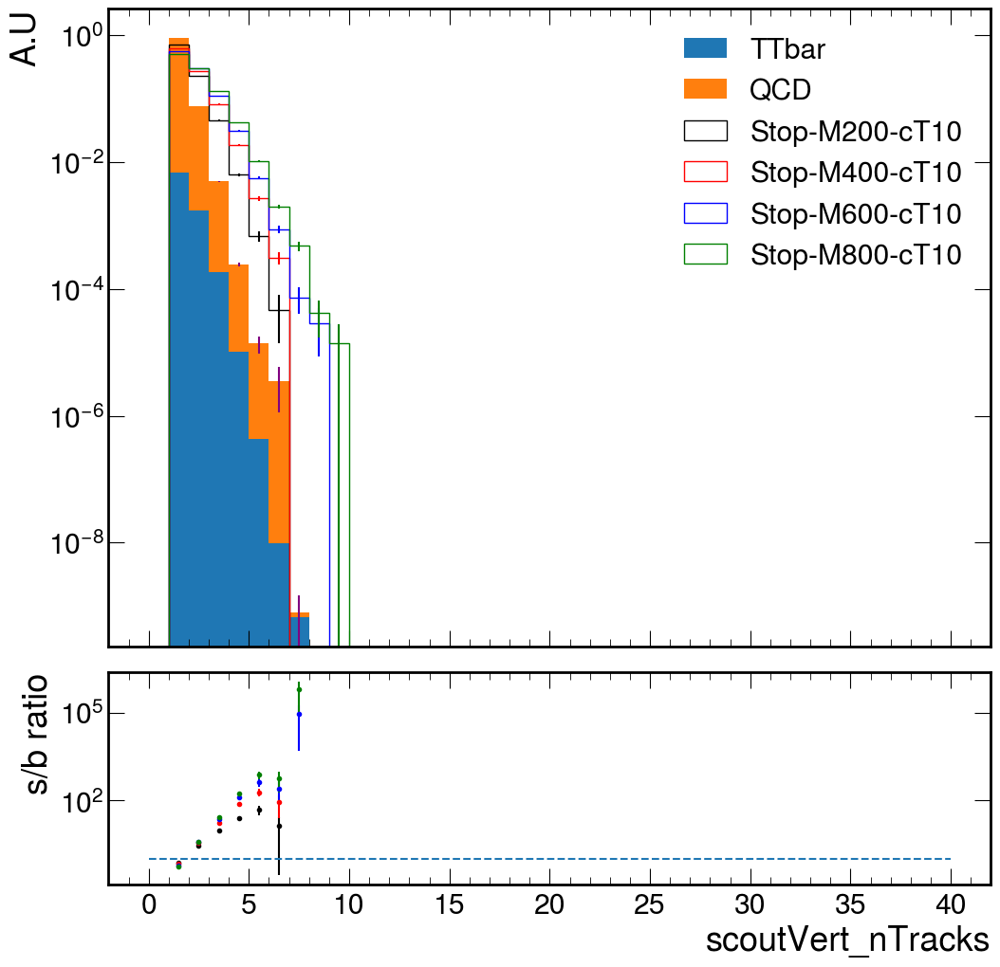

Total runtime: 1026.59 seconds


In [33]:
#Multiple Vertex Plotting Script

import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed

plotDict = {
    "scoutVert_nTracks": [0,40,41]
}

def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    doWeightSum = False
    genWeightSum = 0
    with uproot.open(rootFile) as file:
        if(process in processDict):
            if (len(processDict[process])>1): doWeightSum = True
        elif(process in signalDict):
            if (len(signalDict[process])>1): doWeightSum = True
        if(doWeightSum):
            output["genWeightSum"] = {process: file["triggerFilter/genWeightsSkim"].values()[0]}
        else:
            output["genWeightSum"] = {}
            genWeightSum = file["triggerFilter/genWeightsSkim"].values()[0]
        tree = file["scoutingTree/objectTree"]

        # Select only necessary branches to load
        branches = list(plotDict.keys()) + ["weight","scoutVert_dBV"]
        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        for batch in tree.iterate(branches, library="ak", step_size=10000):  
            weights = batch["weight"]  # normalize event weights
            if(not doWeightSum): weights = weights / genWeightSum

            for plot, binning in plotDict.items():
                bins = np.linspace(binning[0], binning[1], binning[2])
                data = batch[plot]

                # Apply displacement cut
                if "scoutVert" in plot:
                    mask = (batch["scoutVert_dBV"] >= 0.01) & (batch["scoutVert_nTracks"] > 1)
                else:
                    mask = ak.ones_like(data, dtype=bool)
                data = data[mask]
                data = ak.num(data,axis=1)
                #mask = ak.sum(mask,axis=1)>1
                #data = data[mask]
                #maskedWeights = weights[mask]
                broadcastWeights, data = ak.broadcast_arrays(weights,data)
                # Apply mask and flatten data
                data = ak.flatten(data,axis=None)
                data = np.clip(data,bins[0],bins[-1])
                weights_filtered = ak.flatten(broadcastWeights,axis=None)
                # Compute histograms
                n, _ = np.histogram(data, weights=weights_filtered, bins=bins)
                n_2, _ = np.histogram(data, weights=weights_filtered**2, bins=bins)
                if plot not in output:
                    output[plot] = {process: n}
                    output[f"{plot}_squared"] = {process: n_2}
                else:
                    output[plot][process] = output[plot][process] + n
                    output[f"{plot}_squared"][process] = output[f"{plot}_squared"][process] + n_2
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        results[plot][process] = results[plot].get(process, 0) + result[plot][process]

    return results

t0 = time.time()

bgPlotWeights = parallel_processing(processDict)
sigPlotWeights = parallel_processing(signalDict)

#Combining Background Subprocesses and Reweighting Events
for plot in plotDict.keys():
    for process in bgPlotWeights["genWeightSum"].keys():
        bgPlotWeights[plot][process] = bgPlotWeights[plot][process] / bgPlotWeights["genWeightSum"][process]
        bgPlotWeights[f"{plot}_squared"][process] = bgPlotWeights[f"{plot}_squared"][process] / (bgPlotWeights["genWeightSum"][process]**2)
    bgPlotWeights[plot]["QCD"] = bgPlotWeights[plot]["QCD200to400"]+bgPlotWeights[plot]["QCD400to600"]+bgPlotWeights[plot]["QCD600to800"]+bgPlotWeights[plot]["QCD800to1000"]+bgPlotWeights[plot]["QCD1000to1200"]+bgPlotWeights[plot]["QCD1200to1500"]+bgPlotWeights[plot]["QCD1500to2000"]+bgPlotWeights[plot]["QCD2000"]
    bgPlotWeights[f"{plot}_squared"]["QCD"] = bgPlotWeights[f"{plot}_squared"]["QCD200to400"]+bgPlotWeights[f"{plot}_squared"]["QCD400to600"]+bgPlotWeights[f"{plot}_squared"]["QCD600to800"]+bgPlotWeights[f"{plot}_squared"]["QCD800to1000"]+bgPlotWeights[f"{plot}_squared"]["QCD1000to1200"]+bgPlotWeights[f"{plot}_squared"]["QCD1200to1500"]+bgPlotWeights[f"{plot}_squared"]["QCD1500to2000"]+bgPlotWeights[f"{plot}_squared"]["QCD2000"]
    bgPlotWeights[plot]["TTbar"] = bgPlotWeights[plot]["TTTo4Q"]+bgPlotWeights[plot]["TTToLNu2Q"]
    bgPlotWeights[f"{plot}_squared"]["TTbar"] = bgPlotWeights[f"{plot}_squared"]["TTTo4Q"]+bgPlotWeights[f"{plot}_squared"]["TTToLNu2Q"]
for plot in plotDict.keys():
    for process in sigPlotWeights["genWeightSum"].keys():
        sigPlotWeights[plot][process] = sigPlotWeights[plot][process] / sigPlotWeights["genWeightSum"][process]
        sigPlotWeights[f"{plot}_squared"][process] = sigPlotWeights[f"{plot}_squared"][process] / (sigPlotWeights["genWeightSum"][process]**2)

# **Plotting**
for plot, binning in plotDict.items():
    if plot not in bgPlotWeights:
        print(f"Skipping {plot} (no data).")
        continue

    bins = np.linspace(binning[0], binning[1], binning[2])
    bgIntegral = (bins[1] - bins[0]) * sum(bgPlotWeights[plot]["QCD"] + bgPlotWeights[plot]["TTbar"])

    fig, (ax, rax) = plt.subplots(2, 1, figsize=[12,12], gridspec_kw={"height_ratios": [3,1]}, sharex=True)
    fig.subplots_adjust(hspace=0.06)
    ax.hist([(bins[:-1] + bins[1:]) / 2]*2,weights=[list(bgPlotWeights[plot]["TTbar"]),list(bgPlotWeights[plot]["QCD"])],
            stacked=True, density=True, label=["TTbar","QCD"], bins=bins)

    bgValues = (bgPlotWeights[plot]["QCD"] / bgIntegral) + (bgPlotWeights[plot]["TTbar"] / bgIntegral)
    bgErrors = np.sqrt(bgPlotWeights[f"{plot}_squared"]["QCD"] / (bgIntegral**2) + \
               bgPlotWeights[f"{plot}_squared"]["TTbar"] / (bgIntegral**2))
    #bgValues = np.nan_to_num(bgValues)
    #bgErrors = np.nan_to_num(bgErrors)
    ax.errorbar(((bins[:-1] + bins[1:]) / 2), bgValues, yerr=bgErrors, linestyle="none", color="purple")
    
    colors = {"Stop-M200-cT10": "black", "Stop-M400-cT10": "red", "Stop-M600-cT10": "blue", "Stop-M800-cT10": "green"}
    #colors = {"Hto2Sto4D-cT10-MS1": "black", "Hto2Sto4D-cT10-MS15": "red", "Hto2Sto4D-cT10-MS30": "blue", "Hto2Sto4D-cT10-MS55": "green"}
    for signal, color in colors.items():
        if plot not in sigPlotWeights or signal not in sigPlotWeights[plot]:
            print(f"Skipping {signal} in {plot} (no data).")
            continue

        integral = (bins[1] - bins[0]) * sum(sigPlotWeights[plot][signal])
        ax.hist(((bins[:-1] + bins[1:]) / 2), weights=list(sigPlotWeights[plot][signal]),
                stacked=False, density=True, label=signal, bins=bins, histtype="step", color=color)

        sigValues = sigPlotWeights[plot][signal] / integral
        sigErrors = np.sqrt(sigPlotWeights[f"{plot}_squared"][signal] / (integral**2))

        ax.errorbar(((bins[:-1] + bins[1:]) / 2), sigValues, yerr=sigErrors, linestyle="none", color=color)
        ratioValues = sigValues / bgValues
        ratioErrors = ratioValues * np.sqrt((sigErrors / sigValues)**2 + (bgErrors / bgValues)**2)
        #ratioValues = np.nan_to_num(ratioValues)
        #ratioErrors = np.nan_to_num(ratioErrors)
        rax.errorbar(((bins[:-1] + bins[1:]) / 2), ratioValues, yerr=ratioErrors, linestyle="none", color=color, marker=".")

    rax.hlines(1, bins[0], bins[-1], linestyle="dashed")
    rax.set_ylabel("s/b ratio")
    ax.set_ylabel("A.U")
    plt.xlabel(plot)
    ax.legend()
    ax.set_yscale("log")
    rax.set_yscale("log")
    plt.show()

t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")


In [6]:
#Two Vertex Sensitivity Search Script
import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed

errCutValues = np.concatenate(([999.9],np.linspace(0.005,0.02,4)[::-1]))
nTrackCutValues = np.linspace(1,7,7)
print(errCutValues)

def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    with uproot.open(rootFile) as file:
        output["genWeightSum"] = {process: file["triggerFilter/genWeightsSkim"].values()[0]}
        output["weightSkimSum"] = {process: file["triggerFilter/weightsSkim"].values()[0]}
        tree = file["scoutingTree/objectTree"]
        # Select only necessary branches to load
        branches = ["weight","scoutVert_dBV","scoutVert_dBVErr","scoutVert_nTracks"]
        weightSum = np.zeros((len(errCutValues),len(nTrackCutValues),len(errCutValues),len(nTrackCutValues)))
        weightSumSquared = np.zeros((len(errCutValues),len(nTrackCutValues),len(errCutValues),len(nTrackCutValues)))
        
        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        for batch in tree.iterate(branches, library="ak", step_size=100000):
            weights = batch["weight"]  # event weights
            dBVErr = batch["scoutVert_dBVErr"]
            dBV = batch["scoutVert_dBV"]
            ntracks = batch["scoutVert_nTracks"]
            mask = (dBV>0.01)
            dBVErr = dBVErr[mask]
            dBV = dBV[mask]
            ntracks = ntracks[mask]
            
            errMasks = [(dBVErr < errCutValues[i]) for i in range(len(errCutValues))]
            ntracksMasks = [(ntracks > nTrackCutValues[j]) for j in range(len(nTrackCutValues))]
            for i in range(len(errCutValues)):
                for j in range(len(nTrackCutValues)):
                    mask1 = errMasks[i] & ntracksMasks[j]
                    num1 = ak.num(dBV[mask1],axis=1)
                    for k in range(len(errCutValues)):
                        for l in range(len(nTrackCutValues)):
                            mask2 = errMasks[k] & ntracksMasks[l]
                            maskBoth = mask1 & mask2
                            num2 = ak.num(dBV[mask2],axis=1)
                            numBoth = ak.num(dBV[maskBoth],axis=1)
                            mask = (num1>0) & (num2>0) & ( (numBoth>1) | (numBoth==0) | ((numBoth==1)&((num1>1)|(num2>1))) )
                            weightsMasked = weights[mask]
                            weightSum[i][j][k][l] += ak.sum(weightsMasked)
                            weightSumSquared[i][j][k][l] += ak.sum(weightsMasked**2)
                    
        output["weightSum"] = {process: weightSum}
        output["weightSumSquared"] = {process: weightSumSquared}
            
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        if process not in results[plot]:
                             results[plot][process] = result[plot][process]
                        else:
                            results[plot][process] = results[plot][process] + result[plot][process]

    return results

t0 = time.time()

bestEfficiencySensitivity = {"Stop-M200-cT1": [0,0,0,0,0], "Stop-M400-cT1": [0,0,0,0,0], "Stop-M600-cT1": [0,0,0,0,0], "Stop-M800-cT1": [0,0,0,0,0], "Stop-M200-cT3": [0,0,0,0,0], "Stop-M400-cT3": [0,0,0,0,0], "Stop-M600-cT3": [0,0,0,0,0], "Stop-M800-cT3": [0,0,0,0,0], "Stop-M200-cT10": [0,0,0,0,0], "Stop-M400-cT10": [0,0,0,0,0], "Stop-M600-cT10": [0,0,0,0,0], "Stop-M800-cT10": [0,0,0,0,0]}
bestTraditionalSensitivity = {"Stop-M200-cT1": [0,0,0,0,0], "Stop-M400-cT1": [0,0,0,0,0], "Stop-M600-cT1": [0,0,0,0,0], "Stop-M800-cT1": [0,0,0,0,0], "Stop-M200-cT3": [0,0,0,0,0], "Stop-M400-cT3": [0,0,0,0,0], "Stop-M600-cT3": [0,0,0,0,0], "Stop-M800-cT3": [0,0,0,0,0], "Stop-M200-cT10": [0,0,0,0,0], "Stop-M400-cT10": [0,0,0,0,0], "Stop-M600-cT10": [0,0,0,0,0], "Stop-M800-cT10": [0,0,0,0,0]}

bgPlotWeights = parallel_processing(processDict)
sigPlotWeights = parallel_processing(signalDict)

#Combining Background Subprocesses and Reweighting Events
for process in bgPlotWeights["genWeightSum"].keys():
    bgPlotWeights["weightSum"][process] = bgPlotWeights["weightSum"][process] / bgPlotWeights["genWeightSum"][process]
    bgPlotWeights["weightSkimSum"][process] = bgPlotWeights["weightSkimSum"][process] / bgPlotWeights["genWeightSum"][process]
    bgPlotWeights["weightSumSquared"][process] = bgPlotWeights["weightSumSquared"][process] / (bgPlotWeights["genWeightSum"][process]**2)
bgPlotWeights["weightSum"]["QCD"] = bgPlotWeights["weightSum"]["QCD200to400"]+bgPlotWeights["weightSum"]["QCD400to600"]+bgPlotWeights["weightSum"]["QCD600to800"]+bgPlotWeights["weightSum"]["QCD800to1000"]+bgPlotWeights["weightSum"]["QCD1000to1200"]+bgPlotWeights["weightSum"]["QCD1200to1500"]+bgPlotWeights["weightSum"]["QCD1500to2000"]+bgPlotWeights["weightSum"]["QCD2000"]
bgPlotWeights["weightSkimSum"]["QCD"] = bgPlotWeights["weightSkimSum"]["QCD200to400"]+bgPlotWeights["weightSkimSum"]["QCD400to600"]+bgPlotWeights["weightSkimSum"]["QCD600to800"]+bgPlotWeights["weightSkimSum"]["QCD800to1000"]+bgPlotWeights["weightSkimSum"]["QCD1000to1200"]+bgPlotWeights["weightSkimSum"]["QCD1200to1500"]+bgPlotWeights["weightSkimSum"]["QCD1500to2000"]+bgPlotWeights["weightSkimSum"]["QCD2000"]
bgPlotWeights["weightSumSquared"]["QCD"] = bgPlotWeights["weightSumSquared"]["QCD200to400"]+bgPlotWeights["weightSumSquared"]["QCD400to600"]+bgPlotWeights["weightSumSquared"]["QCD600to800"]+bgPlotWeights["weightSumSquared"]["QCD800to1000"]+bgPlotWeights["weightSumSquared"]["QCD1000to1200"]+bgPlotWeights["weightSumSquared"]["QCD1200to1500"]+bgPlotWeights["weightSumSquared"]["QCD1500to2000"]+bgPlotWeights["weightSumSquared"]["QCD2000"]
bgPlotWeights["weightSum"]["TTbar"] = bgPlotWeights["weightSum"]["TTTo4Q"]+bgPlotWeights["weightSum"]["TTToLNu2Q"]
bgPlotWeights["weightSkimSum"]["TTbar"] = bgPlotWeights["weightSkimSum"]["TTTo4Q"]+bgPlotWeights["weightSkimSum"]["TTToLNu2Q"]
bgPlotWeights["weightSumSquared"]["TTbar"] = bgPlotWeights["weightSumSquared"]["TTTo4Q"]+bgPlotWeights["weightSumSquared"]["TTToLNu2Q"]
for process in sigPlotWeights["genWeightSum"].keys():
    sigPlotWeights["weightSum"][process] = sigPlotWeights["weightSum"][process] / sigPlotWeights["genWeightSum"][process]
    sigPlotWeights["weightSkimSum"][process] = sigPlotWeights["weightSkimSum"][process] / sigPlotWeights["genWeightSum"][process]
    sigPlotWeights["weightSumSquared"][process] = sigPlotWeights["weightSumSquared"][process] / (sigPlotWeights["genWeightSum"][process]**2)

# **Plotting**
for lifetime in ["1","3","10"]:
    fig, ax = plt.subplots()
    colors = {"Stop-M200-cT"+lifetime: "black", "Stop-M400-cT"+lifetime: "red", "Stop-M600-cT"+lifetime: "blue", "Stop-M800-cT"+lifetime: "green"}
    for signal, color in colors.items():
        sensitivity = sigPlotWeights["weightSum"][signal] / np.sqrt(sigPlotWeights["weightSum"][signal]+bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"])
        if(np.max(sensitivity)>bestTraditionalSensitivity[signal][0]): 
            ind = np.unravel_index(np.argmax(sensitivity, axis=None), sensitivity.shape)
            bestTraditionalSensitivity[signal] = [np.max(sensitivity),errCutValues[ind[0]],nTrackCutValues[ind[1]],errCutValues[ind[2]],nTrackCutValues[ind[3]]]
        efficiency = sigPlotWeights["weightSum"][signal] / sigPlotWeights["weightSkimSum"][signal]
        fpr = (bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"]) / (bgPlotWeights["weightSkimSum"]["QCD"]+bgPlotWeights["weightSkimSum"]["TTbar"])
        #ax.errorbar(nTrackCutValues, sensitivity, yerr=np.zeros_like(sensitivity), linestyle="none",marker="o", color=color,label=signal)
        sensitivity = efficiency / (1+np.sqrt(bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"]))
        if(np.max(sensitivity)>bestEfficiencySensitivity[signal][0]): 
            ind = np.unravel_index(np.argmax(sensitivity, axis=None), sensitivity.shape)
            bestEfficiencySensitivity[signal] = [np.max(sensitivity),errCutValues[ind[0]],nTrackCutValues[ind[1]],errCutValues[ind[2]],nTrackCutValues[ind[3]]]
        #ax.errorbar(nTrackCutValues, sensitivity, yerr=np.zeros_like(sensitivity), linestyle="none",marker="^", color=color)
        sensitivity = np.sqrt(2*((sigPlotWeights["weightSum"][signal]+bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"])*np.log(1+(sigPlotWeights["weightSum"][signal]/(bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"])))-sigPlotWeights["weightSum"][signal]))
        #ax.errorbar(nTrackCutValues, sensitivity, yerr=np.zeros_like(sensitivity), linestyle="none",marker="x", color=color)
        ax.scatter(fpr,efficiency,label=signal,color=color,zorder=1)
        ax.scatter(fpr[ind],efficiency[ind],marker="s",color=color,zorder=2,edgecolor="yellow")
    #ax.set_ylabel("Sensitivity")
    #plt.xlabel("Number of Tracks Cut")
    plt.legend()
    #ax.set_xscale("log")
    plt.xscale("symlog",linthresh=10**-11)
    plt.show()
    
t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")
for signal, cuts in bestTraditionalSensitivity.items():
    print("best traditional sensitivity for signal",signal,"is",cuts[0],"requiring one vertex >",cuts[2],"tracks and <",f"{cuts[1]:3f}","uncertainty and another vertex >",cuts[4],"tracks and <",f"{cuts[3]:3f}","uncertainty")
for signal, cuts in bestEfficiencySensitivity.items():
    print("best efficiency sensitivity for signal",signal,"is",cuts[0],"requiring one vertex >",cuts[2],"tracks and <",f"{cuts[1]:3f}","uncertainty and another vertex >",cuts[4],"tracks and <",f"{cuts[3]:3f}","uncertainty")

[9.999e+02 2.000e-02 1.500e-02 1.000e-02 5.000e-03]
Processing /eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v15-125M/250723_150653/TTto4Q.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v15-125M/250723_150926/QCD-4Jets_Bin-HT-400to600.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v15-125M/250723_150707/TTtoLNu2Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v15-125M/250723_150834/QCD-4Jets_Bin-HT-1500to2000.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v15-125M/250723_150957/QCD-4Jets_Bin-HT-800to1000.rootProcessing /eos/cms/store/group/phys_exotic

Process ForkProcess-31:
Process ForkProcess-31:


Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v27-4DxyMin/260317_180337/QCD-4Jets_Bin-HT-600to800.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v27-4DxyMin/260317_180259/QCD-4Jets_Bin-HT-200to400.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v27-4DxyMin/260317_180311/QCD-4Jets_Bin-HT-400to600.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v27-4DxyMin/260317_180152/QCD-4Jets_Bin-HT-1000to1200.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v27-4DxyMin/260317_180324/QCD

/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-awkward/2.1.1-edf8d8121f794c78bb662dab159497fd/lib/python3.9/site-packages/awkward/_backends.py:58: RuntimeWarning: invalid value encountered in divide
  return getattr(ufunc, method)(*args, **kwargs)


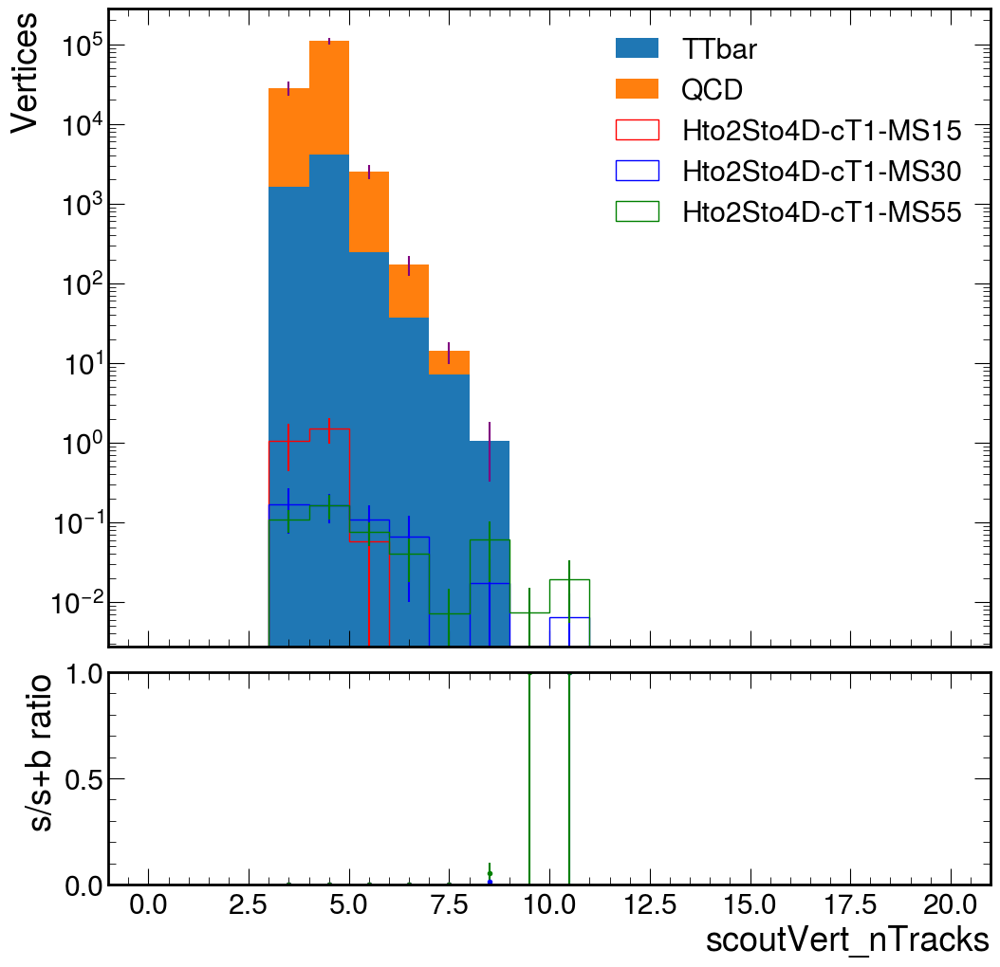

Total runtime: 101.14 seconds


In [10]:
#N track fit for background estimation

import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed

plotDict = {
    "scoutVert_nTracks": [0,20,21]

}

def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    doWeightSum = False
    genWeightSum = 0
    with uproot.open(rootFile) as file:
        if(process in processDict):
            if (len(processDict[process])>1): doWeightSum = True
        elif(process in signalDict):
            if (len(signalDict[process])>1): doWeightSum = True
        if(doWeightSum):
            output["genWeightSum"] = {process: file["triggerFilter/genWeightsSkim"].values()[0]}
        else:
            output["genWeightSum"] = {}
            genWeightSum = file["triggerFilter/genWeightsSkim"].values()[0]
        tree = file["scoutingTree/objectTree"]

        # Select only necessary branches to load
        branches = list(plotDict.keys()) + ["vertTrack_iVtx", "weight_PU_BCDEFGHI_nominal","weight_PU_BCDEFGHI_up","weight_PU_BCDEFGHI_down","scoutVert_dBV","scoutVert_dBVErr","scoutVert_cosT","scoutVert_chi2","uncorrectedWeight","weight_trigger_nominal","weight_trigger_up","weight_trigger_down"]
        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        for batch in tree.iterate(branches, library="ak", step_size=10000):  
            weights = batch["weight_trigger_nominal"]*batch["weight_PU_BCDEFGHI_nominal"]*batch["uncorrectedWeight"]  # normalize event weights
            if(process in signalDict):
                if process in limitDict:
                    currentLimit = limitDict[process]
                    weights = weights * currentLimit
            if(not doWeightSum): weights = weights / genWeightSum

            for plot, binning in plotDict.items():
                bins = np.linspace(binning[0], binning[1], binning[2])
                data = batch[plot]

                # Apply displacement cut
                if "scoutVert" in plot:
                    mask = (batch["scoutVert_dBV"] >= 0.01) & (batch["scoutVert_dBV"] < 2) & (batch["scoutVert_cosT"]<0) & (batch["scoutVert_dBVErr"]<0.005) & (batch["scoutVert_chi2"]>3)
                else:
                    mask = ak.ones_like(data, dtype=bool)
                data = data[mask]
                broadcastWeights, data = ak.broadcast_arrays(weights,data)
                # Apply mask and flatten data
                data = ak.flatten(data,axis=None)
                data = np.clip(data,bins[0],bins[-1])
                weights_filtered = ak.flatten(broadcastWeights,axis=None)
                # Compute histograms
                n, _ = np.histogram(data, weights=weights_filtered, bins=bins)
                n_2, _ = np.histogram(data, weights=weights_filtered**2, bins=bins)
                if plot not in output:
                    output[plot] = {process: n}
                    output[f"{plot}_squared"] = {process: n_2}
                else:
                    output[plot][process] = output[plot][process] + n
                    output[f"{plot}_squared"][process] = output[f"{plot}_squared"][process] + n_2
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        results[plot][process] = results[plot].get(process, 0) + result[plot][process]

    return results

t0 = time.time()

bgPlotWeights = parallel_processing(processDict)
sigPlotWeights = parallel_processing(signalDict)

#Combining Background Subprocesses and Reweighting Events
for plot in plotDict.keys():
    for process in bgPlotWeights["genWeightSum"].keys():
        bgPlotWeights[plot][process] = bgPlotWeights[plot][process] / bgPlotWeights["genWeightSum"][process]
        bgPlotWeights[f"{plot}_squared"][process] = bgPlotWeights[f"{plot}_squared"][process] / (bgPlotWeights["genWeightSum"][process]**2)
    bgPlotWeights[plot]["QCD"] = bgPlotWeights[plot]["QCD40to70"]+bgPlotWeights[plot]["QCD70to100"]+bgPlotWeights[plot]["QCD100to200"]+bgPlotWeights[plot]["QCD200to400"]+bgPlotWeights[plot]["QCD400to600"]+bgPlotWeights[plot]["QCD600to800"]+bgPlotWeights[plot]["QCD800to1000"]+bgPlotWeights[plot]["QCD1000to1200"]+bgPlotWeights[plot]["QCD1200to1500"]+bgPlotWeights[plot]["QCD1500to2000"]+bgPlotWeights[plot]["QCD2000"]
    bgPlotWeights[f"{plot}_squared"]["QCD"] = bgPlotWeights[f"{plot}_squared"]["QCD40to70"]+bgPlotWeights[f"{plot}_squared"]["QCD70to100"]+bgPlotWeights[f"{plot}_squared"]["QCD100to200"]+bgPlotWeights[f"{plot}_squared"]["QCD200to400"]+bgPlotWeights[f"{plot}_squared"]["QCD400to600"]+bgPlotWeights[f"{plot}_squared"]["QCD600to800"]+bgPlotWeights[f"{plot}_squared"]["QCD800to1000"]+bgPlotWeights[f"{plot}_squared"]["QCD1000to1200"]+bgPlotWeights[f"{plot}_squared"]["QCD1200to1500"]+bgPlotWeights[f"{plot}_squared"]["QCD1500to2000"]+bgPlotWeights[f"{plot}_squared"]["QCD2000"]
    bgPlotWeights[plot]["TTbar"] = bgPlotWeights[plot]["TTTo4Q"]+bgPlotWeights[plot]["TTToLNu2Q"]
    bgPlotWeights[f"{plot}_squared"]["TTbar"] = bgPlotWeights[f"{plot}_squared"]["TTTo4Q"]+bgPlotWeights[f"{plot}_squared"]["TTToLNu2Q"]
for plot in plotDict.keys():
    for process in sigPlotWeights["genWeightSum"].keys():
        sigPlotWeights[plot][process] = sigPlotWeights[plot][process] / sigPlotWeights["genWeightSum"][process]
        sigPlotWeights[f"{plot}_squared"][process] = sigPlotWeights[f"{plot}_squared"][process] / (sigPlotWeights["genWeightSum"][process]**2)

# **Plotting**
for plot, binning in plotDict.items():
    if plot not in bgPlotWeights:
        print(f"Skipping {plot} (no data).")
        continue

    bins = np.linspace(binning[0], binning[1], binning[2])
    #bgIntegral = (bins[1] - bins[0]) * sum(bgPlotWeights[plot]["QCD"] + bgPlotWeights[plot]["TTbar"])
    bgIntegral=1
    
    fig, (ax, rax) = plt.subplots(2, 1, figsize=[12,12], gridspec_kw={"height_ratios": [3,1]}, sharex=True)
    fig.subplots_adjust(hspace=0.06)
    ax.hist([(bins[:-1] + bins[1:]) / 2]*2,weights=[list(bgPlotWeights[plot]["TTbar"]),list(bgPlotWeights[plot]["QCD"])],
            stacked=True, density=False, label=["TTbar","QCD"], bins=bins)

    bgValues = (bgPlotWeights[plot]["QCD"] / bgIntegral) + (bgPlotWeights[plot]["TTbar"] / bgIntegral)
    bgErrors = np.sqrt(bgPlotWeights[f"{plot}_squared"]["QCD"] / (bgIntegral**2) + \
               bgPlotWeights[f"{plot}_squared"]["TTbar"] / (bgIntegral**2))
    #bgValues = np.nan_to_num(bgValues)
    #bgErrors = np.nan_to_num(bgErrors)
    ax.errorbar(((bins[:-1] + bins[1:]) / 2), bgValues, yerr=bgErrors, linestyle="none", color="purple")
    
    #colors = {"Stop-M200-cT1": "black", "Stop-M800-cT1": "red", "Stop-M200-cT0p1": "blue", "Stop-M800-cT0p1": "green"}
    colors = {"Hto2Sto4D-cT1-MS15": "red", "Hto2Sto4D-cT1-MS30": "blue", "Hto2Sto4D-cT1-MS55": "green"}
    for signal, color in colors.items():
        if plot not in sigPlotWeights or signal not in sigPlotWeights[plot]:
            print(f"Skipping {signal} in {plot} (no data).")
            continue

        #integral = (bins[1] - bins[0]) * sum(sigPlotWeights[plot][signal])
        integral = 1
        ax.hist(((bins[:-1] + bins[1:]) / 2), weights=list(sigPlotWeights[plot][signal]),
                stacked=False, density=False, label=signal, bins=bins, histtype="step", color=color)

        sigValues = sigPlotWeights[plot][signal] / integral
        sigErrors = np.sqrt(sigPlotWeights[f"{plot}_squared"][signal] / (integral**2))

        ax.errorbar(((bins[:-1] + bins[1:]) / 2), sigValues, yerr=sigErrors, linestyle="none", color=color)
        #ratioValues = sigValues / bgValues
        ratioValues = sigValues / (sigValues+bgValues)
        #print("signal",signal,"ratioValues",ratioValues)
        #ratioErrors = ratioValues * np.sqrt((sigErrors / sigValues)**2 + (bgErrors / bgValues)**2)
        sbErrors = np.sqrt((sigErrors**2)+(bgErrors**2))
        ratioErrors = ratioValues * np.sqrt((sigErrors / sigValues)**2 + (sbErrors / (sigValues+bgValues))**2)
        #ratioValues = np.nan_to_num(ratioValues)
        #ratioErrors = np.nan_to_num(ratioErrors)
        rax.errorbar(((bins[:-1] + bins[1:]) / 2), ratioValues, yerr=ratioErrors, linestyle="none", color=color, marker=".")

    rax.hlines(1, bins[0], bins[-1], linestyle="dashed")
    rax.set_ylabel("s/s+b ratio")
    ax.set_ylabel("Vertices")
    plt.xlabel(plot)
    ax.legend()
    ax.set_yscale("log")
    #rax.set_ylim(0,2)
    rax.set_ylim(0,1)
    #rax.set_yscale("log")
    plt.show()

t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")


In [6]:
print(bins[:-1])
print(bgValues[:])
print(bgErrors[:])

[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14.]
[0, 0, 0, 1.75e+06, 8.81e+05, 2.44e+04, 4.49e+03, ..., 0, 0.032, 0, 0, 0, 0]
[0, 0, 0, 4.15e+05, 4.82e+05, 5.39e+03, 3.45e+03, ..., 0, 0.032, 0, 0, 0, 0]


Fit Results:
a = 126184220963929292800.00000000 ± 206196863789033193472.00000000
b = 22.45372200 ± 0.91562606

R-squared: 0.9401
Reduced chi-squared: 1.3624


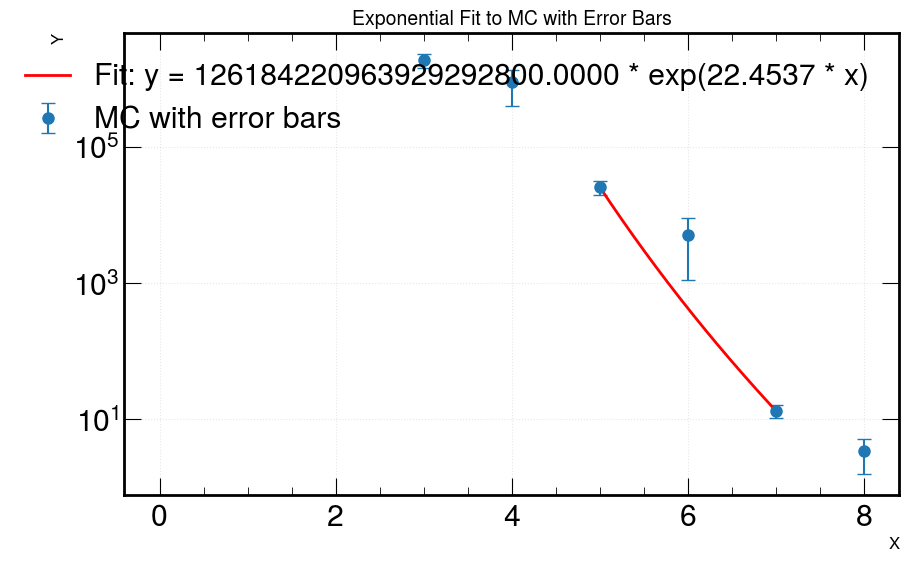

8 track fit value: 0.6656923158385802 actual: 3.388147641245098 +- 1.810900518958677 residual -1.503371000728418


In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Define exponential function
#def exponential(x, a, b):
#    """Exponential function: y = a * exp(b * x)"""
#    return a * np.exp(-b * (x-5))

def exponential(x,a,b):
    return a * x**(-b)

#def exponential(x, a, b, c):
#    return a * np.exp(-1*pow(b * (x-2),c))

#def exponential(x,a,b,c,d):
#    return a * np.exp(-b * (x-2)) +  c * np.exp(-d * (x-2))

def complete_exponential_fit_example(x, y, yerr):
    """Complete example: create data, plot with errorbars, and fit exponential"""
    # Create figure and axis
    fig, ax = plt.subplots(figsize=(10, 6))
    # Plot data with error bars
    ax.errorbar(x, y, yerr=yerr, fmt='o', capsize=5, 
                label='MC with error bars', markersize=8)
    i_fit = np.array([5,6,7])
    x = x[i_fit]
    y = y[i_fit]
    yerr = yerr[i_fit]
    # Fit exponential function using weighted least squares
    # The sigma parameter uses the error bars as weights
    popt, pcov = curve_fit(exponential, x, y, 
                          sigma=yerr, absolute_sigma=True,
                          p0=[1,1],maxfev=500000)  # Initial guess for [a, b]
    
    # Extract fitted parameters and their uncertainties
    a_fit, b_fit = popt
    a_err, b_err = np.sqrt(np.diag(pcov))
    
    # Generate smooth curve for plotting
    x_fit = np.linspace(x.min(), x.max(), 200)
    #x_fit = np.linspace(x.min(), 8, 200)
    y_fit = exponential(x_fit, *popt)
    
    # Plot the fitted curve
    ax.plot(x_fit, y_fit, 'r-', linewidth=2,
            label=f'Fit: y = {a_fit:.4f} * exp({b_fit:.4f} * x)')
    
    # Formatting
    ax.set_xlabel('X', fontsize=12)
    ax.set_ylabel('Y', fontsize=12)
    ax.set_title('Exponential Fit to MC with Error Bars', fontsize=14)
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # Print fit results
    print("Fit Results:")
    print(f"a = {a_fit:.8f} ± {a_err:.8f}")
    print(f"b = {b_fit:.8f} ± {b_err:.8f}")
    #print(f"c = {c_fit:.4f} ± {c_err:.4f}")
    #print(f"d = {d_fit:.4f} ± {d_err:.4f}")
    
    # Calculate R-squared
    residuals = y - exponential(x, *popt)
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((y - np.mean(y))**2)
    r_squared = 1 - (ss_res / ss_tot)
    print(f"\nR-squared: {r_squared:.4f}")
    
    # Chi-squared (goodness of fit)
    chi_squared = np.sum((residuals / yerr)**2)
    dof = len(x) - len(popt)  # degrees of freedom
    chi_squared_reduced = chi_squared / dof
    print(f"Reduced chi-squared: {chi_squared_reduced:.4f}")
    
    #plt.tight_layout()
    ax.set_yscale("log")
    plt.show()
    
    return popt, pcov

popt, pcov = complete_exponential_fit_example(bins[:-1], bgValues, bgErrors)
fit_value = exponential(8, *popt)
residual = (fit_value - bgValues[-1])/bgErrors[-1]
print("8 track fit value:",fit_value,"actual:",bgValues[-1],"+-",bgErrors[-1],"residual",residual)

Fit Results  (y = a * x^{-b})
  a   = 23453223537107832832.000000 +/- 38551877456012427264.000000
  b   = 21.426897 +/- 0.926275
  rho = 0.9957
  chi2/ndf = 8.57 / 1  =  8.571

 Ntrk    Predicted     Observed     Pull
------------------------------------------
    8       1.0466 +/- 0.3683     3.1373 +/- 1.6954   -1.21
    9       0.0839 +/- 0.0407     0.0000 +/- 0.0000   +2.06
   10       0.0088 +/- 0.0055     0.0298 +/- 0.0298   -0.69
   11       0.0011 +/- 0.0009     0.0000 +/- 0.0000   +1.27
   12       0.0002 +/- 0.0002     0.0000 +/- 0.0000   +1.05
   13       0.0000 +/- 0.0000     0.0000 +/- 0.0000   +0.88
   14       0.0000 +/- 0.0000     0.0000 +/- 0.0000   +0.75
   15       0.0000 +/- 0.0000     0.0000 +/- 0.0000   +0.64
   16       0.0000 +/- 0.0000     0.0000 +/- 0.0000   +0.56
   17       0.0000 +/- 0.0000     0.0000 +/- 0.0000   +0.49
   18       0.0000 +/- 0.0000     0.0000 +/- 0.0000   +0.43
   19       0.0000 +/- 0.0000     0.0000 +/- 0.0000   +0.38

Integral x >= 8:
 

/tmp/rmccarth/ipykernel_896296/2274490621.py:8: RuntimeWarning: divide by zero encountered in power
  return a * np.power(x, -b)
/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-numpy/1.24.3-a3a65cbc18c6a98e06451d4329e3ea47/lib/python3.9/site-packages/numpy/core/_methods.py:236: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


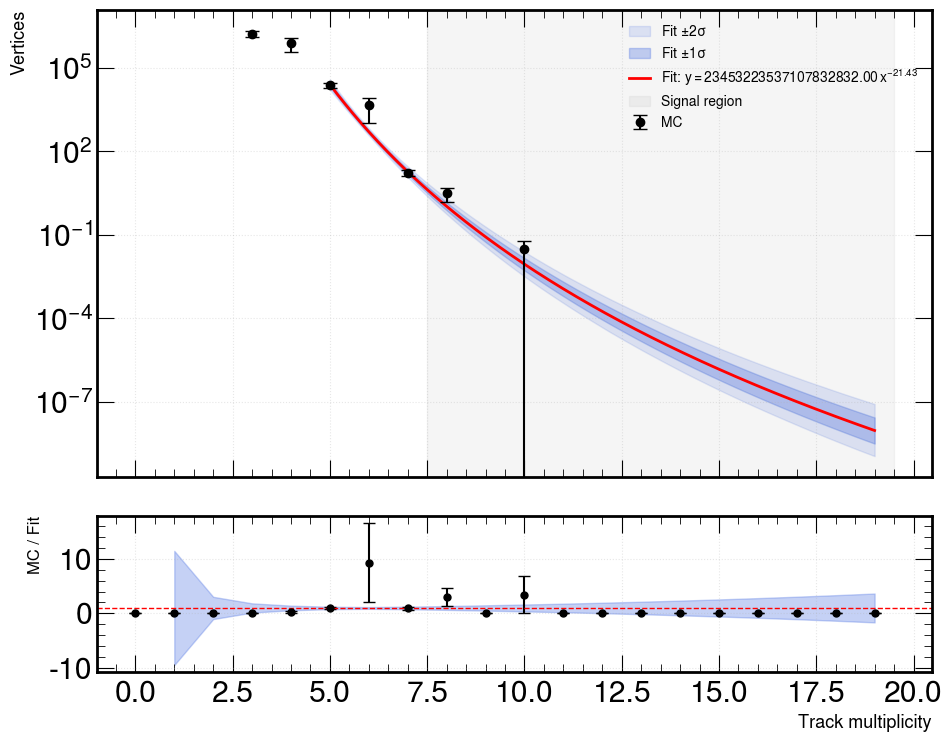

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# --- Power law model ---
def power_law(x, a, b):
    """Power law: y = a * x^(-b)"""
    return a * np.power(x, -b)

def fit_and_extrapolate(bins, bgValues, bgErrors, fit_indices, blind_max=7, extrap_min=8, n_toys=10000):
    """
    Fit a power law to selected bins, extrapolate to high track multiplicity,
    and compare predicted vs observed yield above a blinding threshold.

    Parameters
    ----------
    bins        : array of bin edges (length = n_bins + 1)
    bgValues    : array of bin contents (length = n_bins)
    bgErrors    : array of bin uncertainties (length = n_bins)
    fit_indices : array of bin indices used in the fit
    blind_max   : show data only for x <= blind_max
    extrap_min  : extrapolation / signal region starts at this x value
    n_toys      : number of MC toys for uncertainty propagation
    """

    # Bin centers (left edges for integer track multiplicity)
    x_all = bins[:-1]

    # Select fit range
    x_fit  = x_all[fit_indices]
    y_fit  = bgValues[fit_indices]
    ye_fit = bgErrors[fit_indices]

    # ---- Fit in log-log space (power law -> linear) ----
    # log(y) = log(a) - b*log(x),  so fit params are (log_a, b)
    log_x  = np.log(x_fit)
    log_y  = np.log(y_fit)
    log_ye = ye_fit / y_fit  # error propagation: d(log y) = dy/y

    def linear(log_x, log_a, b):
        return log_a - b * log_x

    popt_log, pcov_log = curve_fit(
        linear, log_x, log_y,
        sigma=log_ye, absolute_sigma=True,
        p0=[10, 3], maxfev=500000
    )
    log_a_fit, b_fit = popt_log
    a_fit = np.exp(log_a_fit)
    popt = np.array([a_fit, b_fit])

    log_a_err, b_err = np.sqrt(np.diag(pcov_log))
    a_err = a_fit * log_a_err  # propagate back to linear space
    # Keep pcov_log for toy sampling (in log space)
    rho = pcov_log[0, 1] / (log_a_err * b_err)  # correlation coefficient

    # ---- Goodness of fit (in log space) ----
    residuals_log = log_y - linear(log_x, *popt_log)
    chi2 = np.sum((residuals_log / log_ye) ** 2)
    ndf = len(x_fit) - len(popt_log)
    print("=" * 55)
    print("Fit Results  (y = a * x^{-b})")
    print("=" * 55)
    print(f"  a   = {a_fit:.6f} +/- {a_err:.6f}")
    print(f"  b   = {b_fit:.6f} +/- {b_err:.6f}")
    print(f"  rho = {rho:.4f}")
    print(f"  chi2/ndf = {chi2:.2f} / {ndf}  =  {chi2/ndf:.3f}")
    print()

    # ---- MC toy sampling in log space for well-behaved uncertainties ----
    rng = np.random.default_rng(42)
    par_samples_log = rng.multivariate_normal(popt_log, pcov_log, size=n_toys)
    # Convert (log_a, b) -> (a, b) for each toy
    par_samples = np.column_stack([np.exp(par_samples_log[:, 0]), par_samples_log[:, 1]])

    # Smooth curve from fit range onward (not back to x~0 where power law diverges)
    x_curve = np.linspace(x_fit.min(), x_all.max(), 500)
    y_curves = np.array([power_law(x_curve, *p) for p in par_samples])
    y_central = power_law(x_curve, *popt)
    y_lo = np.percentile(y_curves, 16, axis=0)   # -1 sigma
    y_hi = np.percentile(y_curves, 84, axis=0)    #  1 sigma
    y_lo2 = np.percentile(y_curves, 2.5, axis=0)  # -2 sigma
    y_hi2 = np.percentile(y_curves, 97.5, axis=0) #  2 sigma

    # ---- Predicted yield for x >= extrap_min ----
    extrap_mask = x_all >= extrap_min
    x_extrap = x_all[extrap_mask]

    # Sum of predicted bin contents from each toy
    pred_per_toy = np.array([
        np.sum(power_law(x_extrap, *p)) for p in par_samples
    ])
    pred_central = np.sum(power_law(x_extrap, *popt))
    pred_unc = np.std(pred_per_toy)

    # ---- Observed yield (blinded comparison) ----
    obs_yield = np.sum(bgValues[extrap_mask])
    obs_err   = np.sqrt(np.sum(bgErrors[extrap_mask] ** 2))

    # Per-bin breakdown
    print(f"{'Ntrk':>5} {'Predicted':>12} {'Observed':>12} {'Pull':>8}")
    print("-" * 42)
    for xi, yi, yei in zip(x_extrap, bgValues[extrap_mask], bgErrors[extrap_mask]):
        pi = power_law(xi, *popt)
        pi_toys = np.array([power_law(xi, *p) for p in par_samples])
        pi_unc = np.std(pi_toys)
        pull = (pi - yi) / np.sqrt(pi_unc**2 + yei**2)
        print(f"{xi:5.0f} {pi:12.4f} +/- {pi_unc:<8.4f} {yi:8.4f} +/- {yei:<8.4f} {pull:+.2f}")

    total_unc = np.sqrt(pred_unc**2 + obs_err**2)
    tension = (pred_central - obs_yield) / total_unc

    print()
    print(f"Integral x >= {extrap_min}:")
    print(f"  Predicted : {pred_central:.4f} +/- {pred_unc:.4f}")
    print(f"  Observed  : {obs_yield:.4f} +/- {obs_err:.4f}")
    print(f"  Difference: {pred_central - obs_yield:.4f} +/- {total_unc:.4f}")
    print(f"  Tension   : {tension:+.2f} sigma")
    print()

    # ==== PLOTTING ====
    fig, (ax_main, ax_ratio) = plt.subplots(
        2, 1, figsize=(10, 8), gridspec_kw={"height_ratios": [3, 1]}, sharex=True
    )

    # --- Main panel ---
    # Uncertainty bands (full range)
    ax_main.fill_between(x_curve, y_lo2, y_hi2, color="royalblue", alpha=0.15, label=r"Fit $\pm 2\sigma$")
    ax_main.fill_between(x_curve, y_lo, y_hi, color="royalblue", alpha=0.30, label=r"Fit $\pm 1\sigma$")
    ax_main.plot(x_curve, y_central, "r-", lw=2, label=f"Fit: $y = {a_fit:.2f}\\, x^{{-{b_fit:.2f}}}$")

    # Data — only show x <= blind_max
    vis = x_all <= blind_max
    ax_main.errorbar(
        x_all[vis], bgValues[vis], yerr=bgErrors[vis],
        fmt="ko", capsize=5, ms=6, label=f"MC"
    )

    # Mark the blinded region
    ax_main.axvspan(extrap_min - 0.5, x_all.max() + 0.5, color="grey", alpha=0.08, label="Signal region")

    ax_main.set_yscale("log")
    ax_main.set_ylabel("Vertices", fontsize=13)
    #ax_main.set_title("Power-law fit — blinded extrapolation", fontsize=14)
    ax_main.legend(fontsize=10)
    ax_main.grid(True, alpha=0.3)

    # --- Ratio / pull panel ---
    # Only for visible (unblinded) bins
    pred_vis = power_law(x_all[vis], *popt)
    pred_vis_toys = np.array([power_law(x_all[vis], *p) for p in par_samples])
    pred_vis_unc = np.std(pred_vis_toys, axis=0)
    ratio = bgValues[vis] / pred_vis
    ratio_err = bgErrors[vis] / pred_vis

    ax_ratio.errorbar(x_all[vis], ratio, yerr=ratio_err, fmt="ko", capsize=4, ms=5)
    # Band from fit uncertainty
    band_lo = 1 - pred_vis_unc / pred_vis
    band_hi = 1 + pred_vis_unc / pred_vis
    ax_ratio.fill_between(x_all[vis], band_lo, band_hi, color="royalblue", alpha=0.3)
    ax_ratio.axhline(1, color="r", ls="--", lw=1)
    ax_ratio.set_ylabel("MC / Fit", fontsize=12)
    ax_ratio.set_xlabel("Track multiplicity", fontsize=13)
    ax_ratio.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig("PowerLawBGFitMC.pdf")
    plt.show()

    return popt, pcov_log


# ---- Run ----
# Adjust fit_indices to whichever bins you want in the fit
fit_indices = np.array([5, 6, 7])   # e.g. ntrk = 5, 6, 7, 8 depending on binning

popt, pcov = fit_and_extrapolate(
    bins, bgValues, bgErrors,
    fit_indices=fit_indices,
    blind_max=20,
    extrap_min=8,
    n_toys=10000
)

Fit Results  (y = a * exp(-b * x))
  a   = 1526228447360.242676 +/- 1235540820553.699463
  b   = 3.593801 +/- 0.137464
  rho = 0.9834
  chi2/ndf = 6.55 / 2  =  3.275


Integral x >= 8:
  Predicted : 0.5124 +/- 0.1895
  Observed  : 3.1671 +/- 1.6957
  Difference: -2.6547 +/- 1.7062
  Tension   : -1.56 sigma



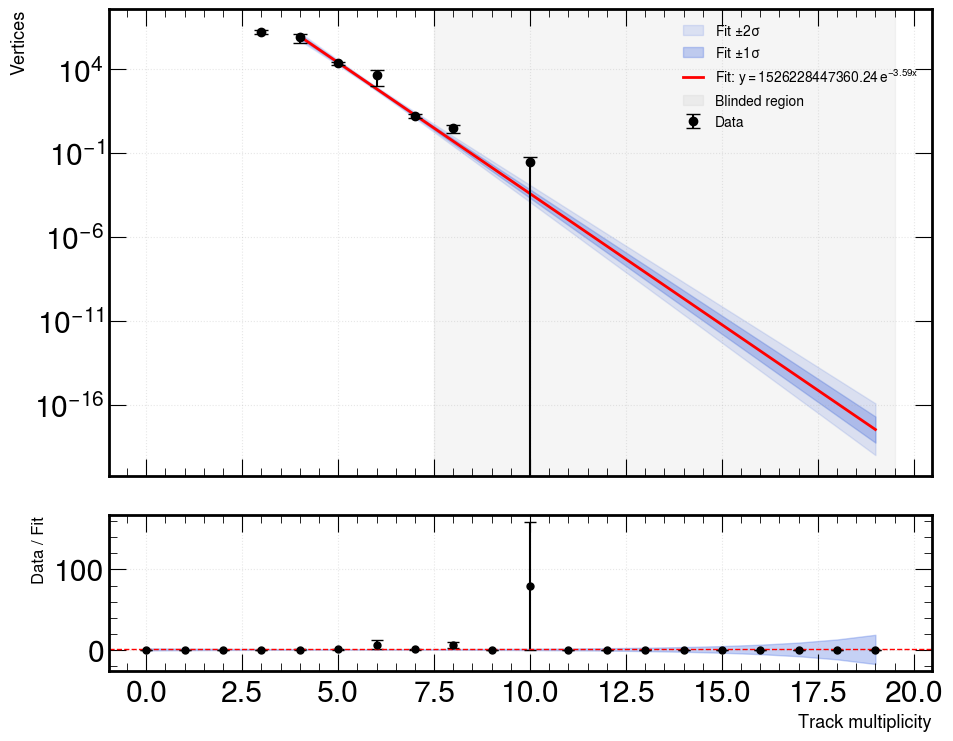

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# --- Exponential model ---
def exponential(x, a, b):
    """Exponential: y = a * exp(-b * x)"""
    return a * np.exp(-b * x)

def fit_and_extrapolate(bins, bgValues, bgErrors, fit_indices, blind_max=7, extrap_min=8, n_toys=10000):
    """
    Fit an exponential to selected bins, extrapolate to high track multiplicity,
    and compare predicted vs observed yield above a blinding threshold.

    Parameters
    ----------
    bins        : array of bin edges (length = n_bins + 1)
    bgValues    : array of bin contents (length = n_bins)
    bgErrors    : array of bin uncertainties (length = n_bins)
    fit_indices : array of bin indices used in the fit
    blind_max   : show data only for x <= blind_max
    extrap_min  : extrapolation / signal region starts at this x value
    n_toys      : number of MC toys for uncertainty propagation
    """

    # Bin centers (left edges for integer track multiplicity)
    x_all = bins[:-1]

    # Select fit range
    x_fit  = x_all[fit_indices]
    y_fit  = bgValues[fit_indices]
    ye_fit = bgErrors[fit_indices]

    # ---- Fit in log-linear space (exponential -> linear) ----
    # log(y) = log(a) - b*x,  so fit params are (log_a, b)
    log_y  = np.log(y_fit)
    log_ye = ye_fit / y_fit  # error propagation: d(log y) = dy/y

    def linear(x, log_a, b):
        return log_a - b * x

    popt_log, pcov_log = curve_fit(
        linear, x_fit, log_y,
        sigma=log_ye, absolute_sigma=True,
        p0=[10, 0.5], maxfev=500000
    )
    log_a_fit, b_fit = popt_log
    a_fit = np.exp(log_a_fit)
    popt = np.array([a_fit, b_fit])

    log_a_err, b_err = np.sqrt(np.diag(pcov_log))
    a_err = a_fit * log_a_err  # propagate back to linear space
    rho = pcov_log[0, 1] / (log_a_err * b_err)  # correlation coefficient

    # ---- Goodness of fit (in log space) ----
    residuals_log = log_y - linear(x_fit, *popt_log)
    chi2 = np.sum((residuals_log / log_ye) ** 2)
    ndf = len(x_fit) - len(popt_log)
    print("=" * 55)
    print("Fit Results  (y = a * exp(-b * x))")
    print("=" * 55)
    print(f"  a   = {a_fit:.6f} +/- {a_err:.6f}")
    print(f"  b   = {b_fit:.6f} +/- {b_err:.6f}")
    print(f"  rho = {rho:.4f}")
    print(f"  chi2/ndf = {chi2:.2f} / {ndf}  =  {chi2/ndf:.3f}")
    print()

    # ---- MC toy sampling in log space for well-behaved uncertainties ----
    rng = np.random.default_rng(42)
    par_samples_log = rng.multivariate_normal(popt_log, pcov_log, size=n_toys)
    # Convert (log_a, b) -> (a, b) for each toy
    par_samples = np.column_stack([np.exp(par_samples_log[:, 0]), par_samples_log[:, 1]])

    # Smooth curve from fit range onward
    x_curve = np.linspace(x_fit.min(), x_all.max(), 500)
    y_curves = np.array([exponential(x_curve, *p) for p in par_samples])
    y_central = exponential(x_curve, *popt)
    y_lo = np.percentile(y_curves, 16, axis=0)    # -1 sigma
    y_hi = np.percentile(y_curves, 84, axis=0)    #  1 sigma
    y_lo2 = np.percentile(y_curves, 2.5, axis=0)  # -2 sigma
    y_hi2 = np.percentile(y_curves, 97.5, axis=0) #  2 sigma

    # ---- Predicted yield for x >= extrap_min ----
    extrap_mask = x_all >= extrap_min
    x_extrap = x_all[extrap_mask]

    # Sum of predicted bin contents from each toy
    pred_per_toy = np.array([
        np.sum(exponential(x_extrap, *p)) for p in par_samples
    ])
    pred_central = np.sum(exponential(x_extrap, *popt))
    pred_unc = np.std(pred_per_toy)

    # ---- Observed yield (blinded comparison) ----
    obs_yield = np.sum(bgValues[extrap_mask])
    obs_err   = np.sqrt(np.sum(bgErrors[extrap_mask] ** 2))

    total_unc = np.sqrt(pred_unc**2 + obs_err**2)
    tension = (pred_central - obs_yield) / total_unc

    print()
    print(f"Integral x >= {extrap_min}:")
    print(f"  Predicted : {pred_central:.4f} +/- {pred_unc:.4f}")
    print(f"  Observed  : {obs_yield:.4f} +/- {obs_err:.4f}")
    print(f"  Difference: {pred_central - obs_yield:.4f} +/- {total_unc:.4f}")
    print(f"  Tension   : {tension:+.2f} sigma")
    print()

    # ==== PLOTTING ====
    fig, (ax_main, ax_ratio) = plt.subplots(
        2, 1, figsize=(10, 8), gridspec_kw={"height_ratios": [3, 1]}, sharex=True
    )

    # --- Main panel ---
    ax_main.fill_between(x_curve, y_lo2, y_hi2, color="royalblue", alpha=0.15, label=r"Fit $\pm 2\sigma$")
    ax_main.fill_between(x_curve, y_lo, y_hi, color="royalblue", alpha=0.30, label=r"Fit $\pm 1\sigma$")
    ax_main.plot(x_curve, y_central, "r-", lw=2, label=f"Fit: $y = {a_fit:.2f}\\, e^{{-{b_fit:.2f}x}}$")

    # Data — only show x <= blind_max
    vis = x_all <= blind_max
    ax_main.errorbar(
        x_all[vis], bgValues[vis], yerr=bgErrors[vis],
        fmt="ko", capsize=5, ms=6, label=f"Data"
    )

    # Mark the blinded region
    ax_main.axvspan(extrap_min - 0.5, x_all.max() + 0.5, color="grey", alpha=0.08, label="Blinded region")

    ax_main.set_yscale("log")
    ax_main.set_ylabel("Vertices", fontsize=13)
    #ax_main.set_title("Exponential fit — blinded extrapolation", fontsize=14)
    ax_main.legend(fontsize=10)
    ax_main.grid(True, alpha=0.3)

    # --- Ratio / pull panel ---
    pred_vis = exponential(x_all[vis], *popt)
    pred_vis_toys = np.array([exponential(x_all[vis], *p) for p in par_samples])
    pred_vis_unc = np.std(pred_vis_toys, axis=0)
    ratio = bgValues[vis] / pred_vis
    ratio_err = bgErrors[vis] / pred_vis

    ax_ratio.errorbar(x_all[vis], ratio, yerr=ratio_err, fmt="ko", capsize=4, ms=5)
    band_lo = 1 - pred_vis_unc / pred_vis
    band_hi = 1 + pred_vis_unc / pred_vis
    ax_ratio.fill_between(x_all[vis], band_lo, band_hi, color="royalblue", alpha=0.3)
    ax_ratio.axhline(1, color="r", ls="--", lw=1)
    ax_ratio.set_ylabel("Data / Fit", fontsize=12)
    ax_ratio.set_xlabel("Track multiplicity", fontsize=13)
    ax_ratio.grid(True, alpha=0.3)

    plt.tight_layout()
    #plt.savefig("ExponentialBGFig.pdf")
    plt.show()

    return popt, pcov_log


# ---- Run ----
fit_indices = np.array([4, 5, 6, 7])

popt, pcov = fit_and_extrapolate(
    bins, bgValues, bgErrors,
    fit_indices=fit_indices,
    blind_max=20,
    extrap_min=8,
    n_toys=10000
)


/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-awkward/2.1.1-edf8d8121f794c78bb662dab159497fd/lib/python3.9/site-packages/awkward/_backends.py:58: RuntimeWarning: divide by zero encountered in divide
  return getattr(ufunc, method)(*args, **kwargs)


Linear interpolation in log(y) using x = 6.0, 7.0
Slope (d log(y) / dx) = -5.6508

  Combined estimate for x >= 8
  Observed:   3.0 ± 1.7
  Predicted:  0.1 ± 0.1
  Obs - Pred: 3.0 ± 1.7
  Obs / Pred: 54.000
  Pull:       +1.80 σ


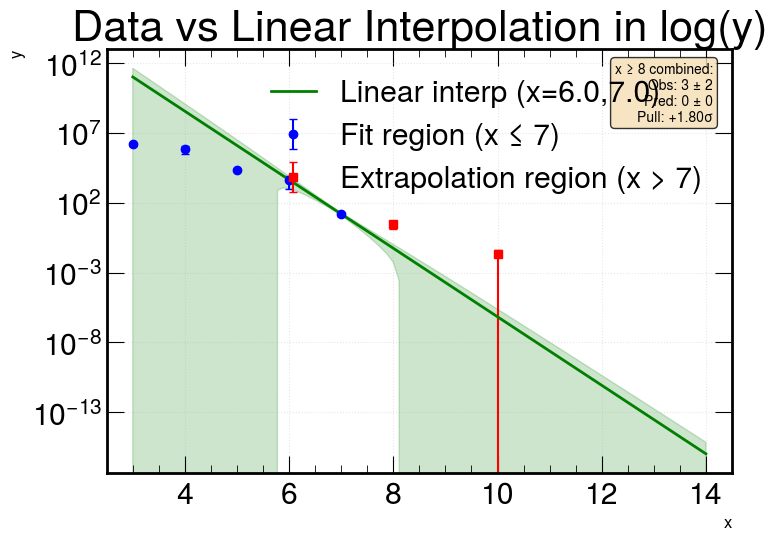

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# Data
x = bins[:-1]
y = bgValues
yErr = bgErrors

# Define fit and extrapolation regions
x_fit_max = 7
fit_mask = x <= x_fit_max
extrap_mask = x > x_fit_max

# Linear interpolation in log(y) using last two points of fit region
# Points: (x1, y1) and (x2, y2) where x2 = x_fit_max
i1, i2 = np.where(x == x_fit_max - 1)[0][0], np.where(x == x_fit_max)[0][0]
x1, x2 = x[i1], x[i2]
y1, y2 = y[i1], y[i2]
yerr1, yerr2 = yErr[i1], yErr[i2]

# Slope and intercept in log space
logy1, logy2 = np.log(y1), np.log(y2)
m = (logy2 - logy1) / (x2 - x1)  # slope
c = logy1 - m * x1               # intercept

# Prediction function
def predict(xi):
    return np.exp(m * xi + c)

# Error propagation for extrapolation
# sigma_log(y) ≈ sigma_y / y
sigma_logy1 = yerr1 / y1
sigma_logy2 = yerr2 / y2

def predict_err(xi):
    """Propagated uncertainty on prediction at xi"""
    dx = xi - x2
    # log(y_pred) = log(y2) + m * dx = log(y2) + (log(y2) - log(y1)) * dx / (x2 - x1)
    d_dlogy2 = 1 + dx / (x2 - x1)
    d_dlogy1 = -dx / (x2 - x1)
    sigma_logy_pred = np.sqrt((d_dlogy2 * sigma_logy2)**2 + (d_dlogy1 * sigma_logy1)**2)
    return predict(xi) * sigma_logy_pred

# Calculate predictions and pulls for extrapolation region
x_extrap = x[extrap_mask]
y_extrap = y[extrap_mask]
yerr_extrap = yErr[extrap_mask]

y_pred = predict(x_extrap)
y_pred_err = predict_err(x_extrap)

# Pull using observation error only
pull_obs = (y_extrap - y_pred) / yerr_extrap

# Pull using combined error (obs + extrapolation)
pull_comb = (y_extrap - y_pred) / np.sqrt(yerr_extrap**2 + y_pred_err**2)

# Combined totals for x >= 8
total_obs = np.sum(y_extrap)
total_obs_err = np.sqrt(np.sum(yerr_extrap**2))

total_pred = np.sum(y_pred)
# For prediction error: need covariance since all predictions share the same slope parameters
# Cov(y_i, y_j) comes from shared dependence on logy1 and logy2
# Build covariance matrix for predictions
n_pts = len(x_extrap)
cov_pred = np.zeros((n_pts, n_pts))
for i in range(n_pts):
    for j in range(n_pts):
        xi, xj = x_extrap[i], x_extrap[j]
        dxi, dxj = xi - x2, xj - x2
        # Partial derivatives w.r.t. log(y1) and log(y2)
        di_dlogy1 = -dxi / (x2 - x1)
        di_dlogy2 = 1 + dxi / (x2 - x1)
        dj_dlogy1 = -dxj / (x2 - x1)
        dj_dlogy2 = 1 + dxj / (x2 - x1)
        # Covariance in log space
        cov_logy = (di_dlogy1 * dj_dlogy1 * sigma_logy1**2 + 
                    di_dlogy2 * dj_dlogy2 * sigma_logy2**2)
        # Convert to linear space: Cov(y_i, y_j) ≈ y_i * y_j * Cov(log(y_i), log(y_j))
        cov_pred[i, j] = y_pred[i] * y_pred[j] * cov_logy

# Total prediction variance = sum of all covariance matrix elements
total_pred_var = np.sum(cov_pred)
total_pred_err = np.sqrt(total_pred_var)

# Combined errors and pull
total_comb_err = np.sqrt(total_obs_err**2 + total_pred_err**2)
pull_total = (total_obs - total_pred) / total_comb_err

# Print results
print(f"Linear interpolation in log(y) using x = {x1}, {x2}")
print(f"Slope (d log(y) / dx) = {m:.4f}")
print()
print(f"{'='*50}")
print(f"  Combined estimate for x >= 8")
print(f"{'='*50}")
print(f"  Observed:   {total_obs:.1f} ± {total_obs_err:.1f}")
print(f"  Predicted:  {total_pred:.1f} ± {total_pred_err:.1f}")
print(f"{'='*50}")
print(f"  Obs - Pred: {total_obs - total_pred:.1f} ± {total_comb_err:.1f}")
print(f"  Obs / Pred: {total_obs / total_pred:.3f}")
print(f"  Pull:       {pull_total:+.2f} σ")
print(f"{'='*50}")

# Plotting
fig, ax1 = plt.subplots(figsize=(8, 6))

# Data and fit
x_line = np.linspace(3, 14, 100)
y_line = predict(x_line)

ax1.errorbar(x[fit_mask], y[fit_mask], yerr=yErr[fit_mask], fmt='o', color='blue', 
             label=f'Fit region (x ≤ {x_fit_max})', capsize=3, markersize=6)
ax1.errorbar(x[extrap_mask], y[extrap_mask], yerr=yErr[extrap_mask], fmt='s', color='red', 
             label=f'Extrapolation region (x > {x_fit_max})', capsize=3, markersize=6)
ax1.plot(x_line, y_line, 'g-', linewidth=2, label=f'Linear interp (x={x1},{x2})')

# Shade extrapolation uncertainty
y_line_err = predict_err(x_line)
ax1.fill_between(x_line, y_line - y_line_err, y_line + y_line_err, alpha=0.2, color='green')

ax1.set_yscale('log')
ax1.set_xlabel('x', fontsize=12)
ax1.set_ylabel('y', fontsize=12)
ax1.set_title('Data vs Linear Interpolation in log(y)')
ax1.legend()
ax1.grid(True, alpha=0.3)
ax1.set_xlim(2.5, 14.5)

# Add text box with combined result
textstr = f'x ≥ 8 combined:\nObs: {total_obs:.0f} ± {total_obs_err:.0f}\nPred: {total_pred:.0f} ± {total_pred_err:.0f}\nPull: {pull_total:+.2f}σ'
props = dict(boxstyle='round', facecolor='wheat', alpha=0.8)
ax1.text(0.97, 0.97, textstr, transform=ax1.transAxes, fontsize=10,
         verticalalignment='top', horizontalalignment='right', bbox=props)

plt.tight_layout()
plt.savefig('linear_interp_fit.png', dpi=150)
plt.show()

[9.999e+02 2.000e-02 1.900e-02 1.800e-02 1.700e-02 1.600e-02 1.500e-02
 1.400e-02 1.300e-02 1.200e-02 1.100e-02 1.000e-02 9.000e-03 8.000e-03
 7.000e-03 6.000e-03 5.000e-03 4.000e-03 3.000e-03 2.000e-03 1.000e-03]
Processing /eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v15-MoreStats/250703_093551/TTto4Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v15-MoreStats/250703_093717/QCD-4Jets_Bin-HT-200to400.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v15-MoreStats/250703_093915/QCD-4Jets_Bin-HT-800to1000.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v15-MoreStats/250703_093747/QCD-4Jets_Bin-HT-600to800.rootProcessing /eos/c

/tmp/rmccarth/ipykernel_4041188/998901467.py:123: RuntimeWarning: divide by zero encountered in divide
  sensitivity = np.sqrt(2*((sigPlotWeights["weightSum"][signal]+bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"])*np.log(1+(sigPlotWeights["weightSum"][signal]/(bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"])))-sigPlotWeights["weightSum"][signal]))


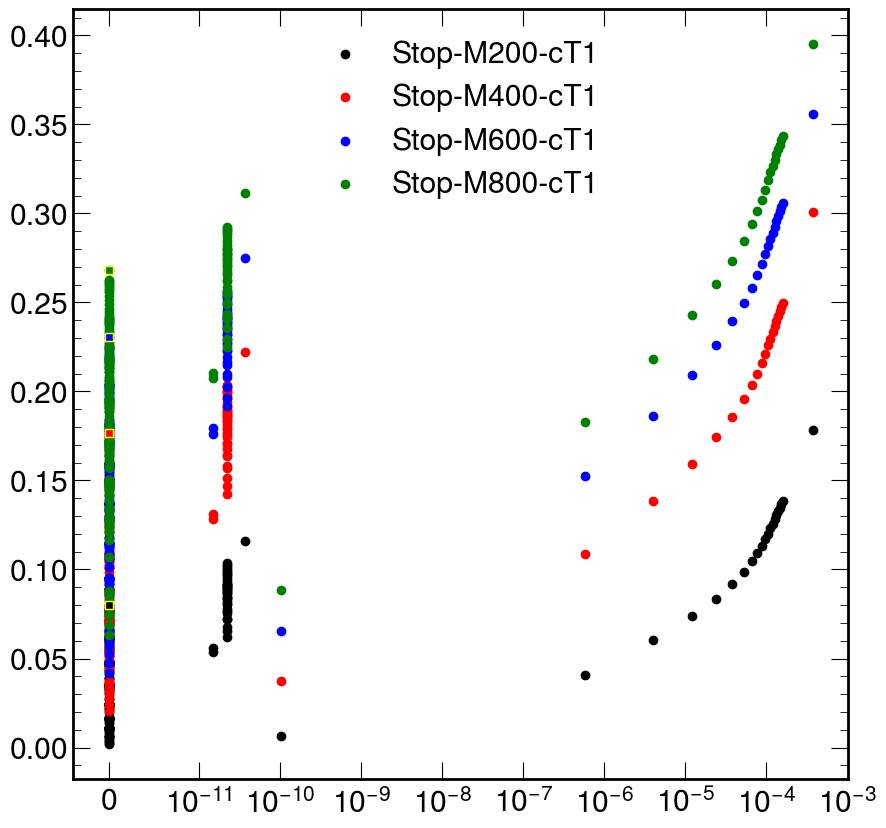

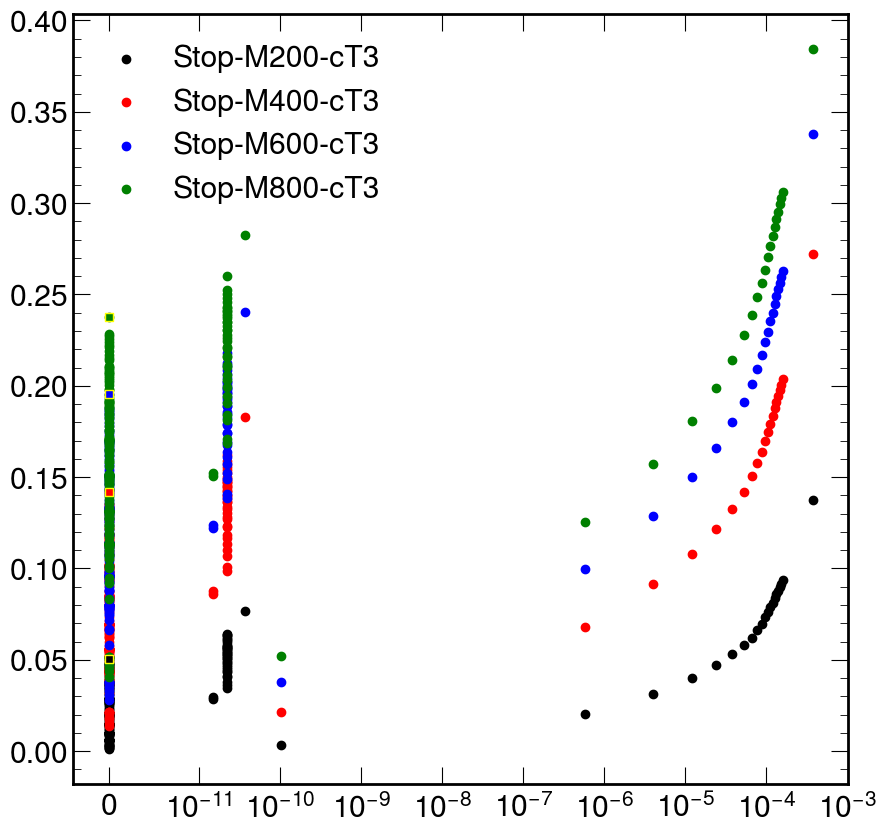

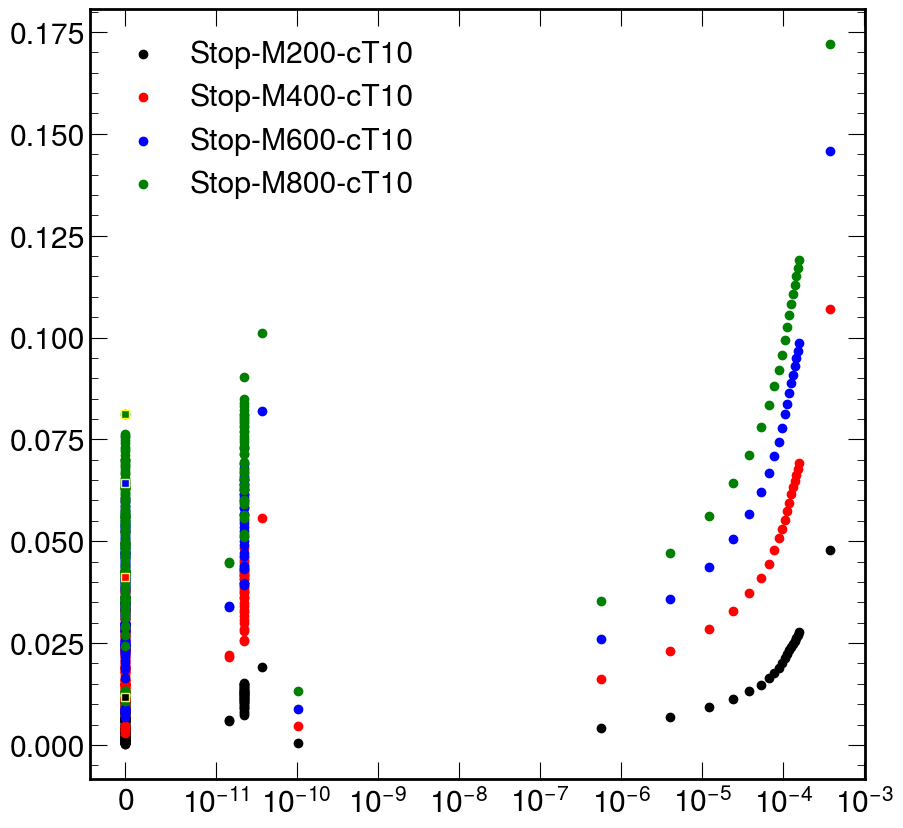

Total runtime: 683.06 seconds
best traditional sensitivity for signal Stop-M200-cT1 is 2.9535408641769134 requiring > 4.0 tracks and < 999.900000 uncertainty
best traditional sensitivity for signal Stop-M400-cT1 is 4.385490804915187 requiring > 4.0 tracks and < 999.900000 uncertainty
best traditional sensitivity for signal Stop-M600-cT1 is 5.01118860151897 requiring > 4.0 tracks and < 999.900000 uncertainty
best traditional sensitivity for signal Stop-M800-cT1 is 5.404728152274844 requiring > 4.0 tracks and < 999.900000 uncertainty
best traditional sensitivity for signal Stop-M200-cT3 is 2.3441102363157658 requiring > 4.0 tracks and < 999.900000 uncertainty
best traditional sensitivity for signal Stop-M400-cT3 is 3.933542514505697 requiring > 4.0 tracks and < 999.900000 uncertainty
best traditional sensitivity for signal Stop-M600-cT3 is 4.616790573547272 requiring > 4.0 tracks and < 999.900000 uncertainty
best traditional sensitivity for signal Stop-M800-cT3 is 5.087097566341537 requi

In [3]:
#Two Vertex delta R Cut Sensitivity Search Script
import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed

#Cuts need to go from loosest to tightest
errCutValues = np.concatenate(([999.9],np.linspace(0.001,0.02,20)[::-1]))
nTrackCutValues = np.linspace(1,10,10)
print(errCutValues)

def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    with uproot.open(rootFile) as file:
        output["genWeightSum"] = {process: file["triggerFilter/genWeightsSkim"].values()[0]}
        output["weightSkimSum"] = {process: file["triggerFilter/weightsSkim"].values()[0]}
        tree = file["scoutingTree/objectTree"]
        # Select only necessary branches to load
        branches = ["weight","scoutVert_dBV","scoutVert_dBVErr","scoutVert_nTracks","scoutVert_phi"]
        weightSum = np.zeros((len(errCutValues),len(nTrackCutValues)))
        weightSumSquared = np.zeros((len(errCutValues),len(nTrackCutValues)))
        
        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        for batch in tree.iterate(branches, library="ak", step_size=100000):
            weights = batch["weight"]  # event weights
            dBVErr = batch["scoutVert_dBVErr"]
            dBV = batch["scoutVert_dBV"]
            ntracks = batch["scoutVert_nTracks"]
            phi = batch["scoutVert_phi"]
            for i in range(len(errCutValues)):
                mask = dBVErr < errCutValues[i]
                dBVErr = dBVErr[mask]
                dBV = dBV[mask]
                ntracks = ntracks[mask]
                phi = phi[mask]
                for j in range(len(nTrackCutValues)):
                    mask = ntracks > nTrackCutValues[j]
                    dBVMasked = dBV[mask]
                    dBVErrMasked = dBVErr[mask]
                    ntracksMasked = ntracks[mask]
                    phiMasked = phi[mask]
                    phiMasked = phiMasked[(dBVMasked>=0.01)&(dBVMasked<2.0)]
                    idx = ak.argcombinations(phiMasked, 2, fields=["i", "j"])  
                    dphi = abs(phiMasked[idx.i] - phiMasked[idx.j])
                    norm_dphi = ak.where(dphi > np.pi,2 * np.pi - dphi,dphi)
                    norm_dphi = ak.max(norm_dphi,axis=1)
                    mask = (~ak.is_none(norm_dphi))&(norm_dphi>2.5)
                    weightsMasked = weights[mask]
                    weightSum[i][j] += ak.sum(weightsMasked)
                    weightSumSquared[i][j] += ak.sum(weightsMasked**2)
        output["weightSum"] = {process: weightSum}
        output["weightSumSquared"] = {process: weightSumSquared}
            
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        if process not in results[plot]:
                             results[plot][process] = result[plot][process]
                        else:
                            results[plot][process] = results[plot][process] + result[plot][process]

    return results

t0 = time.time()

bestEfficiencySensitivity = {"Stop-M200-cT1": [0,0,0], "Stop-M400-cT1": [0,0,0], "Stop-M600-cT1": [0,0,0], "Stop-M800-cT1": [0,0,0], "Stop-M200-cT3": [0,0,0], "Stop-M400-cT3": [0,0,0], "Stop-M600-cT3": [0,0,0], "Stop-M800-cT3": [0,0,0], "Stop-M200-cT10": [0,0,0], "Stop-M400-cT10": [0,0,0], "Stop-M600-cT10": [0,0,0], "Stop-M800-cT10": [0,0,0]}
bestTraditionalSensitivity = {"Stop-M200-cT1": [0,0,0], "Stop-M400-cT1": [0,0,0], "Stop-M600-cT1": [0,0,0], "Stop-M800-cT1": [0,0,0], "Stop-M200-cT3": [0,0,0], "Stop-M400-cT3": [0,0,0], "Stop-M600-cT3": [0,0,0], "Stop-M800-cT3": [0,0,0], "Stop-M200-cT10": [0,0,0], "Stop-M400-cT10": [0,0,0], "Stop-M600-cT10": [0,0,0], "Stop-M800-cT10": [0,0,0]}

bgPlotWeights = parallel_processing(processDict)
sigPlotWeights = parallel_processing(signalDict)

#Combining Background Subprocesses and Reweighting Events
for process in bgPlotWeights["genWeightSum"].keys():
    bgPlotWeights["weightSum"][process] = bgPlotWeights["weightSum"][process] / bgPlotWeights["genWeightSum"][process]
    bgPlotWeights["weightSkimSum"][process] = bgPlotWeights["weightSkimSum"][process] / bgPlotWeights["genWeightSum"][process]
    bgPlotWeights["weightSumSquared"][process] = bgPlotWeights["weightSumSquared"][process] / (bgPlotWeights["genWeightSum"][process]**2)
bgPlotWeights["weightSum"]["QCD"] = bgPlotWeights["weightSum"]["QCD200to400"]+bgPlotWeights["weightSum"]["QCD400to600"]+bgPlotWeights["weightSum"]["QCD600to800"]+bgPlotWeights["weightSum"]["QCD800to1000"]+bgPlotWeights["weightSum"]["QCD1000to1200"]+bgPlotWeights["weightSum"]["QCD1200to1500"]+bgPlotWeights["weightSum"]["QCD1500to2000"]+bgPlotWeights["weightSum"]["QCD2000"]
bgPlotWeights["weightSkimSum"]["QCD"] = bgPlotWeights["weightSkimSum"]["QCD200to400"]+bgPlotWeights["weightSkimSum"]["QCD400to600"]+bgPlotWeights["weightSkimSum"]["QCD600to800"]+bgPlotWeights["weightSkimSum"]["QCD800to1000"]+bgPlotWeights["weightSkimSum"]["QCD1000to1200"]+bgPlotWeights["weightSkimSum"]["QCD1200to1500"]+bgPlotWeights["weightSkimSum"]["QCD1500to2000"]+bgPlotWeights["weightSkimSum"]["QCD2000"]
bgPlotWeights["weightSumSquared"]["QCD"] = bgPlotWeights["weightSumSquared"]["QCD200to400"]+bgPlotWeights["weightSumSquared"]["QCD400to600"]+bgPlotWeights["weightSumSquared"]["QCD600to800"]+bgPlotWeights["weightSumSquared"]["QCD800to1000"]+bgPlotWeights["weightSumSquared"]["QCD1000to1200"]+bgPlotWeights["weightSumSquared"]["QCD1200to1500"]+bgPlotWeights["weightSumSquared"]["QCD1500to2000"]+bgPlotWeights["weightSumSquared"]["QCD2000"]
bgPlotWeights["weightSum"]["TTbar"] = bgPlotWeights["weightSum"]["TTTo4Q"]+bgPlotWeights["weightSum"]["TTToLNu2Q"]
bgPlotWeights["weightSkimSum"]["TTbar"] = bgPlotWeights["weightSkimSum"]["TTTo4Q"]+bgPlotWeights["weightSkimSum"]["TTToLNu2Q"]
bgPlotWeights["weightSumSquared"]["TTbar"] = bgPlotWeights["weightSumSquared"]["TTTo4Q"]+bgPlotWeights["weightSumSquared"]["TTToLNu2Q"]
for process in sigPlotWeights["genWeightSum"].keys():
    sigPlotWeights["weightSum"][process] = sigPlotWeights["weightSum"][process] / sigPlotWeights["genWeightSum"][process]
    sigPlotWeights["weightSkimSum"][process] = sigPlotWeights["weightSkimSum"][process] / sigPlotWeights["genWeightSum"][process]
    sigPlotWeights["weightSumSquared"][process] = sigPlotWeights["weightSumSquared"][process] / (sigPlotWeights["genWeightSum"][process]**2)

# **Plotting**
for lifetime in ["1","3","10"]:
    fig, ax = plt.subplots()
    colors = {"Stop-M200-cT"+lifetime: "black", "Stop-M400-cT"+lifetime: "red", "Stop-M600-cT"+lifetime: "blue", "Stop-M800-cT"+lifetime: "green"}
    for signal, color in colors.items():
        sensitivity = sigPlotWeights["weightSum"][signal] / np.sqrt(sigPlotWeights["weightSum"][signal]+bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"])
        if(np.max(sensitivity)>bestTraditionalSensitivity[signal][0]): 
            ind = np.unravel_index(np.argmax(sensitivity, axis=None), sensitivity.shape)
            bestTraditionalSensitivity[signal] = [np.max(sensitivity),errCutValues[ind[0]],nTrackCutValues[ind[1]]]
        efficiency = sigPlotWeights["weightSum"][signal] / sigPlotWeights["weightSkimSum"][signal]
        fpr = (bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"]) / (bgPlotWeights["weightSkimSum"]["QCD"]+bgPlotWeights["weightSkimSum"]["TTbar"])
        #ax.errorbar(nTrackCutValues, sensitivity, yerr=np.zeros_like(sensitivity), linestyle="none",marker="o", color=color,label=signal)
        sensitivity = efficiency / (1+np.sqrt(bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"]))
        if(np.max(sensitivity)>bestEfficiencySensitivity[signal][0]): 
            ind = np.unravel_index(np.argmax(sensitivity, axis=None), sensitivity.shape)
            bestEfficiencySensitivity[signal] = [np.max(sensitivity),errCutValues[ind[0]],nTrackCutValues[ind[1]]]
        #ax.errorbar(nTrackCutValues, sensitivity, yerr=np.zeros_like(sensitivity), linestyle="none",marker="^", color=color)
        sensitivity = np.sqrt(2*((sigPlotWeights["weightSum"][signal]+bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"])*np.log(1+(sigPlotWeights["weightSum"][signal]/(bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"])))-sigPlotWeights["weightSum"][signal]))
        #ax.errorbar(nTrackCutValues, sensitivity, yerr=np.zeros_like(sensitivity), linestyle="none",marker="x", color=color)
        ax.scatter(fpr,efficiency,label=signal,color=color,zorder=1)
        ax.scatter(fpr[ind],efficiency[ind],marker="s",color=color,zorder=2,edgecolor="yellow")
    #ax.set_ylabel("Sensitivity")
    #plt.xlabel("Number of Tracks Cut")
    plt.legend()
    #ax.set_xscale("log")
    plt.xscale("symlog",linthresh=10**-11)
    plt.show()
    
t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")
for signal, cuts in bestTraditionalSensitivity.items():
    print("best traditional sensitivity for signal",signal,"is",cuts[0],"requiring >",cuts[2],"tracks and <",f"{cuts[1]:3f}","uncertainty")
for signal, cuts in bestEfficiencySensitivity.items():
    print("best efficiency sensitivity for signal",signal,"is",cuts[0],"requiring >",cuts[2],"tracks and <",f"{cuts[1]:3f}","uncertainty")

In [3]:
#Extended ABCD Background Estimation
bin_namesCustom = ["A","B","C","D","E","F"]

def process_cutflows(args):
    """ Process a single ROOT file in chunks using uproot.iterate() """
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    with uproot.open(rootFile) as file:
        output[process] = {}
        output[process+"_squared"] = {}
        output[process+"_nEvents"] = {}
        tree = file["scoutingTree/objectTree"]

        # Select only necessary branches to load
        branches = ["scoutVert_dBV","scoutVert_dBVErr", "scoutVert_nTracks","weight","scoutVert_chi2","scoutVert_cosT"]

        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        weightSum = [0]*len(bin_namesCustom)
        weightSumSquared = [0] * len(bin_namesCustom)
        numEvents = [0] * len(bin_namesCustom)
        for batch in tree.iterate(branches, library="ak", step_size=100000):  
            weights = batch["weight"]  # event weights
            dBV = batch["scoutVert_dBV"]
            ntracks = batch["scoutVert_nTracks"]
            chi2 = batch["scoutVert_chi2"]
            cosT = batch["scoutVert_cosT"]
            
            mask = (dBV>0.01) & (dBV<2.0) & (ntracks>3)
            dBV = dBV[mask]
            ntracks = ntracks[mask]
            chi2 = chi2[mask]
            mask = ak.num(dBV,axis=1)>0
            weights = weights[mask]
            ntracks = ntracks[mask]
            chi2 = chi2[mask]
            
            ntrackMask = (ntracks>7)
            ntrackMinMask = (ntracks>5)
            chi2Mask = (chi2<3.0)
            #Signal region B
            mask = ntrackMask & chi2Mask
            mask = ak.num(ntracks[mask])>0
            weightsB = weights[mask]
            weightSum[1] += ak.sum(weightsB)
            weightSumSquared[1] += ak.sum(weightsB**2)
            ntrackMask = ntrackMask[~mask]
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region D
            mask = ntrackMask & ~chi2Mask
            mask = ak.num(ntracks[mask])>0
            weightsD = weights[mask]
            weightSum[3] += ak.sum(weightsD)
            weightSumSquared[3] += ak.sum(weightsD**2)
            ntrackMask = ntrackMask[~mask]
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region C
            mask = ~ntrackMask & ~chi2Mask & ntrackMinMask
            mask = ak.num(ntracks[mask])>0
            weightsC = weights[mask]
            weightSum[2] += ak.sum(weightsC)
            weightSumSquared[2] += ak.sum(weightsC**2)
            ntrackMask = ntrackMask[~mask]
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region A
            mask = ~ntrackMask & chi2Mask & ntrackMinMask
            mask = ak.num(ntracks[mask])>0
            weightsA = weights[mask]
            weightSum[0] += ak.sum(weightsA)
            weightSumSquared[0] += ak.sum(weightsA**2)
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region F
            mask = ~chi2Mask & ~ntrackMinMask
            mask = ak.num(ntracks[mask])>0
            weightsF = weights[mask]
            weightSum[5] += ak.sum(weightsF)
            weightSumSquared[5] += ak.sum(weightsF**2)
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region E
            mask = chi2Mask & ~ntrackMinMask
            mask = ak.num(ntracks[mask])>0
            weightsE = weights[mask]
            weightSum[4] += ak.sum(weightsE)
            weightSumSquared[4] += ak.sum(weightsE**2)
            
        for i in range(len(bin_namesCustom)):
            output[process][bin_namesCustom[i]] = weightSum[i]
            output[process+"_squared"][bin_namesCustom[i]] = weightSumSquared[i]
            output[process+"_nEvents"][bin_namesCustom[i]] = numEvents[i]
        
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    """ Process all ROOT files in parallel and aggregate results """
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_cutflows, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for process in result:
                if process not in results:
                    results[process] = result[process]
                else:
                    for cut in result[process]:
                        results[process][cut] = results[process].get(cut, 0) + result[process][cut]

    return results

dict = signalDict | processDict
customWeights = parallel_processing(dict)
genWeightSumDict = {}
for process, rootFiles in dict.items():
    genWeightSum = 0
    for rootFile in rootFiles:
        f = ROOT.TFile.Open(rootFile, "READ")
        h_genWeights = f.Get("triggerFilter/genWeightsSkim")
        n_binsSkim = h_genWeights.GetNbinsX() 
        genWeights = np.array([h_genWeights.GetBinContent(i) for i in range(1, n_binsSkim + 1)])
        genWeightSum += genWeights[0]
    genWeightSumDict[process] = genWeightSum
      
#Combining Background Subprocesses and Reweighting Events
for process in dict.keys():
    for cut in customWeights[process].keys():
        customWeights[process][cut] = customWeights[process][cut] / genWeightSumDict[process]
        customWeights[process+"_squared"][cut] = customWeights[process+"_squared"][cut] / (genWeightSumDict[process]**2)
customWeights["QCD"] = {}
customWeights["TTbar"] = {}
customWeights["QCD_squared"] = {}
customWeights["TTbar_squared"] = {}
customWeights["QCD_nEvents"] = {}
customWeights["TTbar_nEvents"] = {}
for i in range(len(bin_namesCustom)):
    cut = bin_namesCustom[i]
    customWeights["QCD"][cut] = customWeights["QCD200to400"][cut]+customWeights["QCD400to600"][cut]+customWeights["QCD600to800"][cut]+customWeights["QCD800to1000"][cut]+customWeights["QCD1000to1200"][cut]+customWeights["QCD1200to1500"][cut]+customWeights["QCD1500to2000"][cut]+customWeights["QCD2000"][cut]
    customWeights["QCD_squared"][cut] = customWeights["QCD200to400_squared"][cut]+customWeights["QCD400to600_squared"][cut]+customWeights["QCD600to800_squared"][cut]+customWeights["QCD800to1000_squared"][cut]+customWeights["QCD1000to1200_squared"][cut]+customWeights["QCD1200to1500_squared"][cut]+customWeights["QCD1500to2000_squared"][cut]+customWeights["QCD2000_squared"][cut]
    customWeights["QCD_nEvents"][cut] = customWeights["QCD200to400_nEvents"][cut]+customWeights["QCD400to600_nEvents"][cut]+customWeights["QCD600to800_nEvents"][cut]+customWeights["QCD800to1000_nEvents"][cut]+customWeights["QCD1000to1200_nEvents"][cut]+customWeights["QCD1200to1500_nEvents"][cut]+customWeights["QCD1500to2000_nEvents"][cut]+customWeights["QCD2000_nEvents"][cut]
    customWeights["TTbar"][cut] = customWeights["TTTo4Q"][cut]+customWeights["TTToLNu2Q"][cut]
    customWeights["TTbar_squared"][cut] = customWeights["TTTo4Q_squared"][cut]+customWeights["TTToLNu2Q_squared"][cut]
    customWeights["TTbar_nEvents"][cut] = customWeights["TTTo4Q_nEvents"][cut]+customWeights["TTToLNu2Q_nEvents"][cut]

for process in list(signalDict.keys())+["TTbar","QCD"]:
    #Custom Cutflows
    print(process)
    for i in range(len(bin_namesCustom)):
        stat_unc = np.sqrt(customWeights[process+'_squared'][bin_namesCustom[i]])
        efficiency = customWeights[process][bin_namesCustom[i]]
        print(bin_namesCustom[i],":",f"{efficiency:.3g} +- {stat_unc:.1g}")
sumA = customWeights["TTbar"]["A"] + customWeights["QCD"]["A"]
sumA_unc = np.sqrt(customWeights["TTbar_squared"]["A"] + customWeights["QCD_squared"]["A"])
sumB = customWeights["TTbar"]["B"] + customWeights["QCD"]["B"]
sumB_unc = np.sqrt(customWeights["TTbar_squared"]["B"] + customWeights["QCD_squared"]["B"])
sumC = customWeights["TTbar"]["C"] + customWeights["QCD"]["C"]
sumC_unc = np.sqrt(customWeights["TTbar_squared"]["C"] + customWeights["QCD_squared"]["C"])
sumD = customWeights["TTbar"]["D"] + customWeights["QCD"]["D"]
sumD_unc = np.sqrt(customWeights["TTbar_squared"]["D"] + customWeights["QCD_squared"]["D"])
sumE = customWeights["TTbar"]["E"] + customWeights["QCD"]["E"]
sumE_unc = np.sqrt(customWeights["TTbar_squared"]["E"] + customWeights["QCD_squared"]["E"])
sumF = customWeights["TTbar"]["F"] + customWeights["QCD"]["F"]
sumF_unc = np.sqrt(customWeights["TTbar_squared"]["F"] + customWeights["QCD_squared"]["F"])
bg_exp = (sumA/sumC)**2 * (sumF*sumD/sumE)
if(sumD!=0):
    bg_exp_unc = bg_exp * np.sqrt((2*sumA_unc/sumA)**2 + (sumD_unc/sumD)**2 + (2*sumC_unc/sumC)**2 + (sumF_unc/sumF)**2 + (sumE_unc/sumE)**2)
else:
    bg_exp_unc = (sumA/sumC)**2 * (sumF/sumE) * 1.83 #1.83 is 68% confidence interval for poissonian distribution with 0 observed
print("expected background:",f"{bg_exp:.3g} +- {bg_exp_unc:.1g} observed: {sumB:.3g} +- {sumB_unc:.1g}")

Processing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v15-125M/250723_150436/StopStopbarTo2Dbar2D_M-400_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v15-125M/250723_150354/StopStopbarTo2Dbar2D_M-200_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v15-125M/250723_150521/StopStopbarTo2Dbar2D_M-600_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v15-125M/250723_150539/StopStopbarTo2Dbar2D_M-600_CTau-3mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tre

In [7]:
#Extended ABCD Background Estimation With Validation Region
bin_namesCustom = ["A","B","C","D","E","F","A_Val","B_Val","C_Val","D_Val","E_Val","F_Val"]

def process_cutflows(args):
    """ Process a single ROOT file in chunks using uproot.iterate() """
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    with uproot.open(rootFile) as file:
        output[process] = {}
        output[process+"_squared"] = {}
        output[process+"_nEvents"] = {}
        tree = file["scoutingTree/objectTree"]

        # Select only necessary branches to load
        branches = ["scoutVert_dBV","scoutVert_dBVErr", "scoutVert_nTracks","weight","scoutVert_chi2","scoutVert_cosT"]

        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        weightSum = [0]*len(bin_namesCustom)
        weightSumSquared = [0] * len(bin_namesCustom)
        numEvents = [0] * len(bin_namesCustom)
        for batch in tree.iterate(branches, library="ak", step_size=100000):  
            weights = batch["weight"]  # event weights
            dBV = batch["scoutVert_dBV"]
            ntracks = batch["scoutVert_nTracks"]
            chi2 = batch["scoutVert_chi2"]
            cosT = batch["scoutVert_cosT"]
            
            mask = (dBV>0.01) & (dBV<2.0) & (ntracks>2)
            dBV = dBV[mask]
            ntracks = ntracks[mask]
            chi2 = chi2[mask]
            cosT = cosT[mask]
            mask = ak.num(dBV,axis=1)>0
            weights = weights[mask]
            ntracks = ntracks[mask]
            chi2 = chi2[mask]
            cosT = cosT[mask]
            
            ntrackMask = (ntracks>7)
            ntrackMinMask = (ntracks>3)
            chi2Mask = (chi2<3.0)
            cosTMask = (cosT>0)
            #Signal region B
            mask = ntrackMask & chi2Mask & cosTMask
            mask = ak.num(ntracks[mask])>0
            weightsB = weights[mask]
            weightSum[1] += ak.sum(weightsB)
            weightSumSquared[1] += ak.sum(weightsB**2)
            ntrackMask = ntrackMask[~mask]
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            cosTMask = cosTMask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region D
            mask = ntrackMask & ~chi2Mask & cosTMask
            mask = ak.num(ntracks[mask])>0
            weightsD = weights[mask]
            weightSum[3] += ak.sum(weightsD)
            weightSumSquared[3] += ak.sum(weightsD**2)
            ntrackMask = ntrackMask[~mask]
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            cosTMask = cosTMask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region C
            mask = ~ntrackMask & ~chi2Mask & ntrackMinMask & cosTMask
            mask = ak.num(ntracks[mask])>0
            weightsC = weights[mask]
            weightSum[2] += ak.sum(weightsC)
            weightSumSquared[2] += ak.sum(weightsC**2)
            ntrackMask = ntrackMask[~mask]
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            cosTMask = cosTMask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region A
            mask = ~ntrackMask & chi2Mask & ntrackMinMask & cosTMask
            mask = ak.num(ntracks[mask])>0
            weightsA = weights[mask]
            weightSum[0] += ak.sum(weightsA)
            weightSumSquared[0] += ak.sum(weightsA**2)
            ntrackMask = ntrackMask[~mask]
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            cosTMask = cosTMask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region F
            mask = ~chi2Mask & ~ntrackMinMask & cosTMask
            mask = ak.num(ntracks[mask])>0
            weightsF = weights[mask]
            weightSum[5] += ak.sum(weightsF)
            weightSumSquared[5] += ak.sum(weightsF**2)
            ntrackMask = ntrackMask[~mask]
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            cosTMask = cosTMask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region E
            mask = chi2Mask & ~ntrackMinMask & cosTMask
            mask = ak.num(ntracks[mask])>0
            weightsE = weights[mask]
            weightSum[4] += ak.sum(weightsE)
            weightSumSquared[4] += ak.sum(weightsE**2)
            ntrackMask = ntrackMask[~mask]
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            cosTMask = cosTMask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Validation Signal region B
            mask = ntrackMask & chi2Mask & ~cosTMask
            mask = ak.num(ntracks[mask])>0
            weightsB = weights[mask]
            weightSum[7] += ak.sum(weightsB)
            weightSumSquared[7] += ak.sum(weightsB**2)
            ntrackMask = ntrackMask[~mask]
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            cosTMask = cosTMask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Validation Control region D
            mask = ntrackMask & ~chi2Mask & ~cosTMask
            mask = ak.num(ntracks[mask])>0
            weightsD = weights[mask]
            weightSum[9] += ak.sum(weightsD)
            weightSumSquared[9] += ak.sum(weightsD**2)
            ntrackMask = ntrackMask[~mask]
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            cosTMask = cosTMask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Validation Control region C
            mask = ~ntrackMask & ~chi2Mask & ntrackMinMask & ~cosTMask
            mask = ak.num(ntracks[mask])>0
            weightsC = weights[mask]
            weightSum[8] += ak.sum(weightsC)
            weightSumSquared[8] += ak.sum(weightsC**2)
            ntrackMask = ntrackMask[~mask]
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            cosTMask = cosTMask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Validation Control region A
            mask = ~ntrackMask & chi2Mask & ntrackMinMask & ~cosTMask
            mask = ak.num(ntracks[mask])>0
            weightsA = weights[mask]
            weightSum[6] += ak.sum(weightsA)
            weightSumSquared[6] += ak.sum(weightsA**2)
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            cosTMask = cosTMask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Validation Control region F
            mask = ~chi2Mask & ~ntrackMinMask & ~cosTMask
            mask = ak.num(ntracks[mask])>0
            weightsF = weights[mask]
            weightSum[11] += ak.sum(weightsF)
            weightSumSquared[11] += ak.sum(weightsF**2)
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            cosTMask = cosTMask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Validation Control region E
            mask = chi2Mask & ~ntrackMinMask & ~cosTMask
            mask = ak.num(ntracks[mask])>0
            weightsE = weights[mask]
            weightSum[10] += ak.sum(weightsE)
            weightSumSquared[10] += ak.sum(weightsE**2)
            
        for i in range(len(bin_namesCustom)):
            output[process][bin_namesCustom[i]] = weightSum[i]
            output[process+"_squared"][bin_namesCustom[i]] = weightSumSquared[i]
            output[process+"_nEvents"][bin_namesCustom[i]] = numEvents[i]
        
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    """ Process all ROOT files in parallel and aggregate results """
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_cutflows, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for process in result:
                if process not in results:
                    results[process] = result[process]
                else:
                    for cut in result[process]:
                        results[process][cut] = results[process].get(cut, 0) + result[process][cut]

    return results

dict = signalDict | processDict
customWeights = parallel_processing(dict)
genWeightSumDict = {}
for process, rootFiles in dict.items():
    genWeightSum = 0
    for rootFile in rootFiles:
        f = ROOT.TFile.Open(rootFile, "READ")
        h_genWeights = f.Get("triggerFilter/genWeightsSkim")
        n_binsSkim = h_genWeights.GetNbinsX() 
        genWeights = np.array([h_genWeights.GetBinContent(i) for i in range(1, n_binsSkim + 1)])
        genWeightSum += genWeights[0]
    genWeightSumDict[process] = genWeightSum
      
#Combining Background Subprocesses and Reweighting Events
for process in dict.keys():
    for cut in customWeights[process].keys():
        customWeights[process][cut] = customWeights[process][cut] / genWeightSumDict[process]
        customWeights[process+"_squared"][cut] = customWeights[process+"_squared"][cut] / (genWeightSumDict[process]**2)
customWeights["QCD"] = {}
customWeights["TTbar"] = {}
customWeights["QCD_squared"] = {}
customWeights["TTbar_squared"] = {}
customWeights["QCD_nEvents"] = {}
customWeights["TTbar_nEvents"] = {}
for i in range(len(bin_namesCustom)):
    cut = bin_namesCustom[i]
    customWeights["QCD"][cut] = customWeights["QCD200to400"][cut]+customWeights["QCD400to600"][cut]+customWeights["QCD600to800"][cut]+customWeights["QCD800to1000"][cut]+customWeights["QCD1000to1200"][cut]+customWeights["QCD1200to1500"][cut]+customWeights["QCD1500to2000"][cut]+customWeights["QCD2000"][cut]
    customWeights["QCD_squared"][cut] = customWeights["QCD200to400_squared"][cut]+customWeights["QCD400to600_squared"][cut]+customWeights["QCD600to800_squared"][cut]+customWeights["QCD800to1000_squared"][cut]+customWeights["QCD1000to1200_squared"][cut]+customWeights["QCD1200to1500_squared"][cut]+customWeights["QCD1500to2000_squared"][cut]+customWeights["QCD2000_squared"][cut]
    customWeights["QCD_nEvents"][cut] = customWeights["QCD200to400_nEvents"][cut]+customWeights["QCD400to600_nEvents"][cut]+customWeights["QCD600to800_nEvents"][cut]+customWeights["QCD800to1000_nEvents"][cut]+customWeights["QCD1000to1200_nEvents"][cut]+customWeights["QCD1200to1500_nEvents"][cut]+customWeights["QCD1500to2000_nEvents"][cut]+customWeights["QCD2000_nEvents"][cut]
    customWeights["TTbar"][cut] = customWeights["TTTo4Q"][cut]+customWeights["TTToLNu2Q"][cut]
    customWeights["TTbar_squared"][cut] = customWeights["TTTo4Q_squared"][cut]+customWeights["TTToLNu2Q_squared"][cut]
    customWeights["TTbar_nEvents"][cut] = customWeights["TTTo4Q_nEvents"][cut]+customWeights["TTToLNu2Q_nEvents"][cut]

for process in list(signalDict.keys())+["TTbar","QCD"]:
    #Custom Cutflows
    print(process)
    for i in range(len(bin_namesCustom)):
        stat_unc = np.sqrt(customWeights[process+'_squared'][bin_namesCustom[i]])
        efficiency = customWeights[process][bin_namesCustom[i]]
        print(bin_namesCustom[i],":",f"{efficiency:.3g} +- {stat_unc:.1g}")
for string in ["","_Val"]:
    sumA = customWeights["TTbar"]["A"+string] + customWeights["QCD"]["A"+string]
    sumA_unc = np.sqrt(customWeights["TTbar_squared"]["A"+string] + customWeights["QCD_squared"]["A"+string])
    sumB = customWeights["TTbar"]["B"+string] + customWeights["QCD"]["B"+string]
    sumB_unc = np.sqrt(customWeights["TTbar_squared"]["B"+string] + customWeights["QCD_squared"]["B"+string])
    sumC = customWeights["TTbar"]["C"+string] + customWeights["QCD"]["C"+string]
    sumC_unc = np.sqrt(customWeights["TTbar_squared"]["C"+string] + customWeights["QCD_squared"]["C"+string])
    sumD = customWeights["TTbar"]["D"+string] + customWeights["QCD"]["D"+string]
    sumD_unc = np.sqrt(customWeights["TTbar_squared"]["D"+string] + customWeights["QCD_squared"]["D"+string])
    sumE = customWeights["TTbar"]["E"+string] + customWeights["QCD"]["E"+string]
    sumE_unc = np.sqrt(customWeights["TTbar_squared"]["E"+string] + customWeights["QCD_squared"]["E"+string])
    sumF = customWeights["TTbar"]["F"+string] + customWeights["QCD"]["F"+string]
    sumF_unc = np.sqrt(customWeights["TTbar_squared"]["F"+string] + customWeights["QCD_squared"]["F"+string])
    #bg_exp = (sumA/sumC)**2 * (sumF*sumD/sumE)
    bg_exp = sumA*sumD/sumC
    '''
    if(sumD!=0):
        bg_exp_unc = bg_exp * np.sqrt((2*sumA_unc/sumA)**2 + (sumD_unc/sumD)**2 + (2*sumC_unc/sumC)**2 + (sumF_unc/sumF)**2 + (sumE_unc/sumE)**2)
    else:
        bg_exp_unc = (sumA/sumC)**2 * (sumF/sumE) * 1.83 #1.83 is 68% confidence interval for poissonian distribution with 0 observed
    '''
    if(sumD!=0):
        bg_exp_unc = bg_exp * np.sqrt((sumA_unc/sumA)**2 + (sumD_unc/sumD)**2 + (sumC_unc/sumC)**2)
    else:
        bg_exp_unc = (sumA/sumC) * 1.83 #1.83 is 68% confidence interval for poissonian distribution with 0 observed
    print(string,"expected background:",f"{bg_exp:.3g} +- {bg_exp_unc:.1g} observed: {sumB:.3g} +- {sumB_unc:.1g}")

Processing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v15-125M/250723_150622/StopStopbarTo2Dbar2D_M-800_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v15-125M/250723_150407/StopStopbarTo2Dbar2D_M-200_CTau-3mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v15-125M/250723_150539/StopStopbarTo2Dbar2D_M-600_CTau-3mm.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v15-125M/250723_150354/StopStopbarTo2Dbar2D_M-200_CTau-1mm.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-10mm

In [6]:
#Extended ABCD Background Estimation With Ntracks=7 validation Region
bin_namesCustom = ["A","B","C","D","E","F","B_Val","D_Val"]

def process_cutflows(args):
    """ Process a single ROOT file in chunks using uproot.iterate() """
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    with uproot.open(rootFile) as file:
        output[process] = {}
        output[process+"_squared"] = {}
        output[process+"_nEvents"] = {}
        tree = file["scoutingTree/objectTree"]

        # Select only necessary branches to load
        branches = ["scoutVert_dBV","scoutVert_dBVErr", "scoutVert_nTracks","weight","scoutVert_chi2","scoutVert_cosT"]

        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        weightSum = [0]*len(bin_namesCustom)
        weightSumSquared = [0] * len(bin_namesCustom)
        numEvents = [0] * len(bin_namesCustom)
        for batch in tree.iterate(branches, library="ak", step_size=100000):  
            weights = batch["weight"]  # event weights
            dBV = batch["scoutVert_dBV"]
            ntracks = batch["scoutVert_nTracks"]
            chi2 = batch["scoutVert_chi2"]
            cosT = batch["scoutVert_cosT"]
            
            mask = (dBV>0.01) & (dBV<2.0) & (ntracks>2) #& (cosT<=0)
            dBV = dBV[mask]
            ntracks = ntracks[mask]
            chi2 = chi2[mask]
            mask = ak.num(dBV,axis=1)>0
            weights = weights[mask]
            ntracks = ntracks[mask]
            chi2 = chi2[mask]
            
            ntrackMask = (ntracks>7)
            ntrackValMask = (ntracks==7)
            ntrackMinMask = (ntracks>3)
            chi2Mask = (chi2<3.0)
            #Signal region B
            mask = ntrackMask & chi2Mask
            mask = ak.num(ntracks[mask])>0
            weightsB = weights[mask]
            weightSum[1] += ak.sum(weightsB)
            weightSumSquared[1] += ak.sum(weightsB**2)
            ntrackMask = ntrackMask[~mask]
            ntrackValMask = ntrackValMask[~mask]
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region D
            mask = ntrackMask & ~chi2Mask
            mask = ak.num(ntracks[mask])>0
            weightsD = weights[mask]
            weightSum[3] += ak.sum(weightsD)
            weightSumSquared[3] += ak.sum(weightsD**2)
            ntrackMask = ntrackMask[~mask]
            ntrackValMask = ntrackValMask[~mask]
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Validation Signal region B
            mask = ntrackValMask & chi2Mask
            mask = ak.num(ntracks[mask])>0
            weightsB = weights[mask]
            weightSum[6] += ak.sum(weightsB)
            weightSumSquared[6] += ak.sum(weightsB**2)
            ntrackMask = ntrackMask[~mask]
            ntrackValMask = ntrackValMask[~mask]
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Validation Control region D
            mask = ntrackValMask & ~chi2Mask
            mask = ak.num(ntracks[mask])>0
            weightsD = weights[mask]
            weightSum[7] += ak.sum(weightsD)
            weightSumSquared[7] += ak.sum(weightsD**2)
            ntrackMask = ntrackMask[~mask]
            ntrackValMask = ntrackValMask[~mask]
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region C
            mask = ~ntrackMask & ~chi2Mask & ntrackMinMask & ~ntrackValMask
            mask = ak.num(ntracks[mask])>0
            weightsC = weights[mask]
            weightSum[2] += ak.sum(weightsC)
            weightSumSquared[2] += ak.sum(weightsC**2)
            ntrackMask = ntrackMask[~mask]
            ntrackValMask = ntrackValMask[~mask]
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region A
            mask = ~ntrackMask & chi2Mask & ntrackMinMask & ~ntrackValMask
            mask = ak.num(ntracks[mask])>0
            weightsA = weights[mask]
            weightSum[0] += ak.sum(weightsA)
            weightSumSquared[0] += ak.sum(weightsA**2)
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region F
            mask = ~chi2Mask & ~ntrackMinMask
            mask = ak.num(ntracks[mask])>0
            weightsF = weights[mask]
            weightSum[5] += ak.sum(weightsF)
            weightSumSquared[5] += ak.sum(weightsF**2)
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region E
            mask = chi2Mask & ~ntrackMinMask
            mask = ak.num(ntracks[mask])>0
            weightsE = weights[mask]
            weightSum[4] += ak.sum(weightsE)
            weightSumSquared[4] += ak.sum(weightsE**2)
            
        for i in range(len(bin_namesCustom)):
            output[process][bin_namesCustom[i]] = weightSum[i]
            output[process+"_squared"][bin_namesCustom[i]] = weightSumSquared[i]
            output[process+"_nEvents"][bin_namesCustom[i]] = numEvents[i]
        
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    """ Process all ROOT files in parallel and aggregate results """
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_cutflows, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for process in result:
                if process not in results:
                    results[process] = result[process]
                else:
                    for cut in result[process]:
                        results[process][cut] = results[process].get(cut, 0) + result[process][cut]

    return results

dict = signalDict | processDict
customWeights = parallel_processing(dict)
genWeightSumDict = {}
for process, rootFiles in dict.items():
    genWeightSum = 0
    for rootFile in rootFiles:
        f = ROOT.TFile.Open(rootFile, "READ")
        h_genWeights = f.Get("triggerFilter/genWeightsSkim")
        n_binsSkim = h_genWeights.GetNbinsX() 
        genWeights = np.array([h_genWeights.GetBinContent(i) for i in range(1, n_binsSkim + 1)])
        genWeightSum += genWeights[0]
    genWeightSumDict[process] = genWeightSum
      
#Combining Background Subprocesses and Reweighting Events
for process in dict.keys():
    for cut in customWeights[process].keys():
        customWeights[process][cut] = customWeights[process][cut] / genWeightSumDict[process]
        customWeights[process+"_squared"][cut] = customWeights[process+"_squared"][cut] / (genWeightSumDict[process]**2)
customWeights["QCD"] = {}
customWeights["TTbar"] = {}
customWeights["QCD_squared"] = {}
customWeights["TTbar_squared"] = {}
customWeights["QCD_nEvents"] = {}
customWeights["TTbar_nEvents"] = {}
for i in range(len(bin_namesCustom)):
    cut = bin_namesCustom[i]
    customWeights["QCD"][cut] = customWeights["QCD200to400"][cut]+customWeights["QCD400to600"][cut]+customWeights["QCD600to800"][cut]+customWeights["QCD800to1000"][cut]+customWeights["QCD1000to1200"][cut]+customWeights["QCD1200to1500"][cut]+customWeights["QCD1500to2000"][cut]+customWeights["QCD2000"][cut]
    customWeights["QCD_squared"][cut] = customWeights["QCD200to400_squared"][cut]+customWeights["QCD400to600_squared"][cut]+customWeights["QCD600to800_squared"][cut]+customWeights["QCD800to1000_squared"][cut]+customWeights["QCD1000to1200_squared"][cut]+customWeights["QCD1200to1500_squared"][cut]+customWeights["QCD1500to2000_squared"][cut]+customWeights["QCD2000_squared"][cut]
    customWeights["QCD_nEvents"][cut] = customWeights["QCD200to400_nEvents"][cut]+customWeights["QCD400to600_nEvents"][cut]+customWeights["QCD600to800_nEvents"][cut]+customWeights["QCD800to1000_nEvents"][cut]+customWeights["QCD1000to1200_nEvents"][cut]+customWeights["QCD1200to1500_nEvents"][cut]+customWeights["QCD1500to2000_nEvents"][cut]+customWeights["QCD2000_nEvents"][cut]
    customWeights["TTbar"][cut] = customWeights["TTTo4Q"][cut]+customWeights["TTToLNu2Q"][cut]
    customWeights["TTbar_squared"][cut] = customWeights["TTTo4Q_squared"][cut]+customWeights["TTToLNu2Q_squared"][cut]
    customWeights["TTbar_nEvents"][cut] = customWeights["TTTo4Q_nEvents"][cut]+customWeights["TTToLNu2Q_nEvents"][cut]

for process in list(signalDict.keys())+["TTbar","QCD"]:
    #Custom Cutflows
    print(process)
    for i in range(len(bin_namesCustom)):
        stat_unc = np.sqrt(customWeights[process+'_squared'][bin_namesCustom[i]])
        efficiency = customWeights[process][bin_namesCustom[i]]
        print(bin_namesCustom[i],":",f"{efficiency:.3g} +- {stat_unc:.1g}")
for string in ["","_Val"]:
    sumA = customWeights["TTbar"]["A"] + customWeights["QCD"]["A"]
    sumA_unc = np.sqrt(customWeights["TTbar_squared"]["A"] + customWeights["QCD_squared"]["A"])
    sumB = customWeights["TTbar"]["B"+string] + customWeights["QCD"]["B"+string]
    sumB_unc = np.sqrt(customWeights["TTbar_squared"]["B"+string] + customWeights["QCD_squared"]["B"+string])
    sumC = customWeights["TTbar"]["C"] + customWeights["QCD"]["C"]
    sumC_unc = np.sqrt(customWeights["TTbar_squared"]["C"] + customWeights["QCD_squared"]["C"])
    sumD = customWeights["TTbar"]["D"+string] + customWeights["QCD"]["D"+string]
    sumD_unc = np.sqrt(customWeights["TTbar_squared"]["D"+string] + customWeights["QCD_squared"]["D"+string])
    sumE = customWeights["TTbar"]["E"] + customWeights["QCD"]["E"]
    sumE_unc = np.sqrt(customWeights["TTbar_squared"]["E"] + customWeights["QCD_squared"]["E"])
    sumF = customWeights["TTbar"]["F"] + customWeights["QCD"]["F"]
    sumF_unc = np.sqrt(customWeights["TTbar_squared"]["F"] + customWeights["QCD_squared"]["F"])
    bg_exp = sumA*sumD/sumC
    if(sumD!=0):
        bg_exp_unc = bg_exp * np.sqrt((sumA_unc/sumA)**2 + (sumD_unc/sumD)**2 + (sumC_unc/sumC)**2)
    else:
        bg_exp_unc = (sumA/sumC) * 1.83 #1.83 is 68% confidence interval for poissonian distribution with 0 observed
    print(string,"expected background:",f"{bg_exp:.3g} +- {bg_exp_unc:.1g} observed: {sumB:.3g} +- {sumB_unc:.1g}")

Processing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v15-125M/250723_150354/StopStopbarTo2Dbar2D_M-200_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v15-125M/250723_150436/StopStopbarTo2Dbar2D_M-400_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v15-125M/250723_150521/StopStopbarTo2Dbar2D_M-600_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v15-125M/250723_150622/StopStopbarTo2Dbar2D_M-800_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tre

Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v17-4TrackMin/250807_110921/QCD-4Jets_Bin-HT-200to400.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v17-4TrackMin/250807_110933/QCD-4Jets_Bin-HT-400to600.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v17-4TrackMin/250807_110817/TTtoLNu2Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v17-4TrackMin/250807_110944/QCD-4Jets_Bin-HT-600to800.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v17-4TrackMin/250807_110846/QCD-4Jets_Bin-HT-1200to1500.rootProcessing /

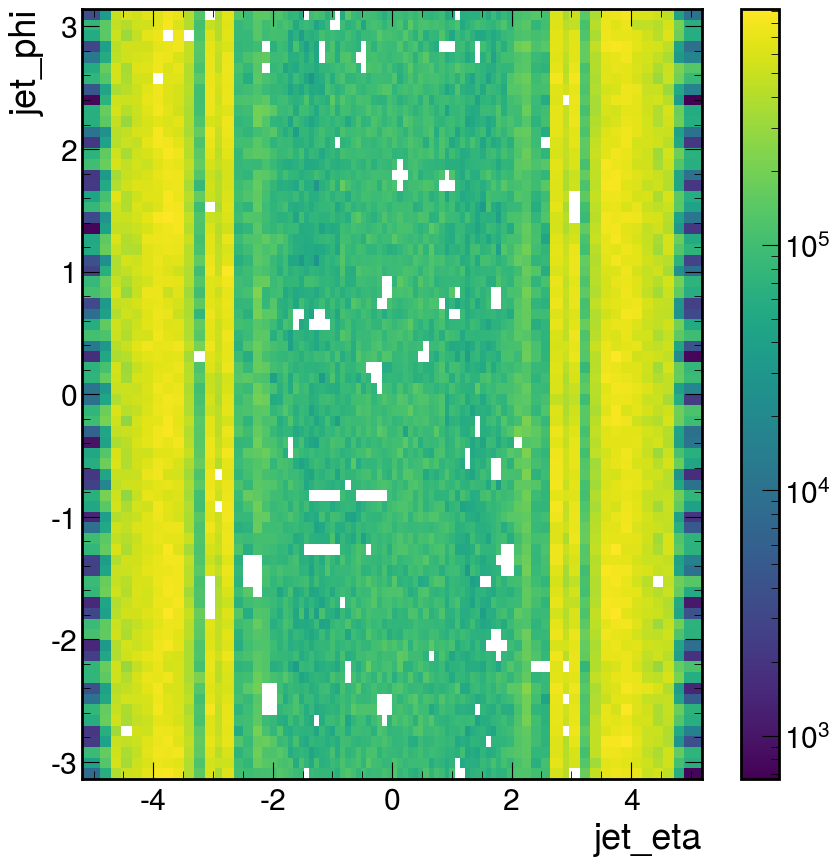

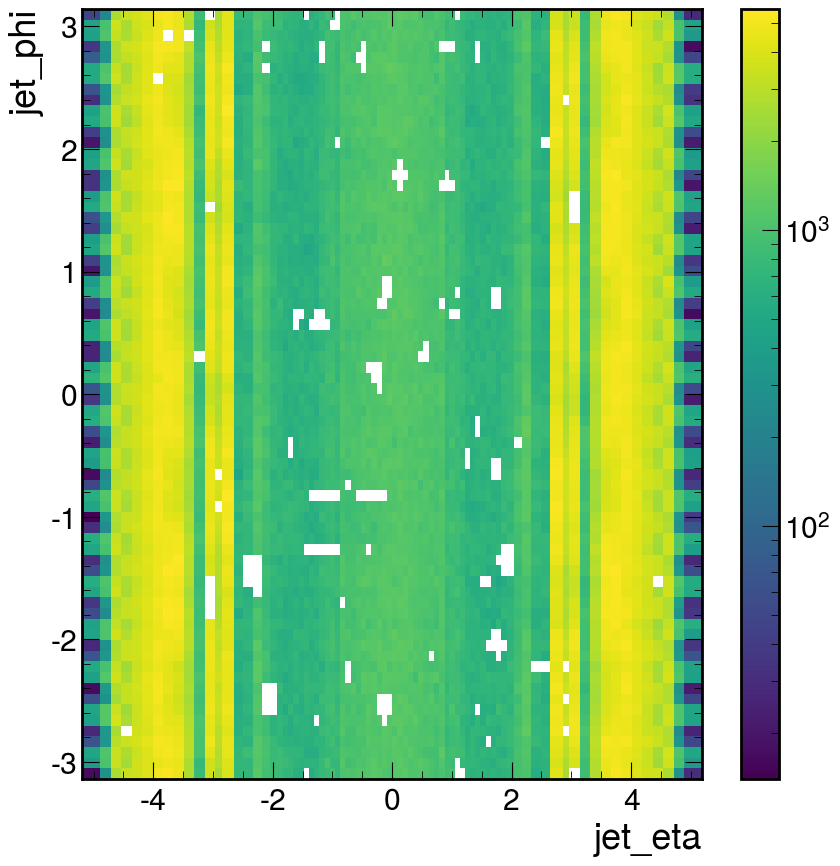

Stop-M200-cT1


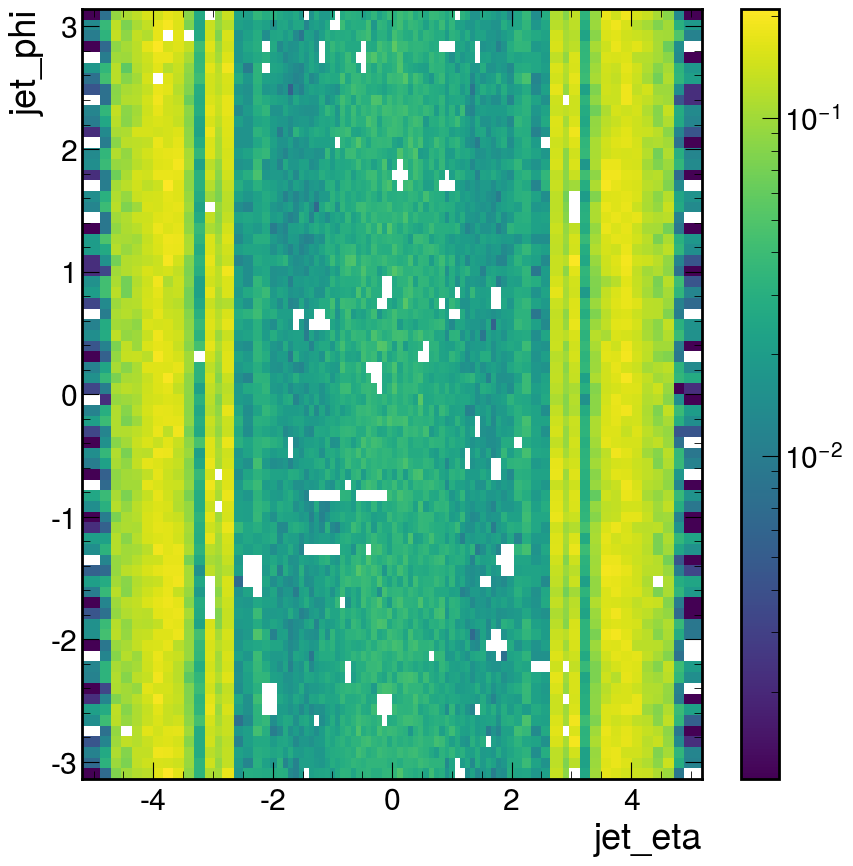

Stop-M400-cT1


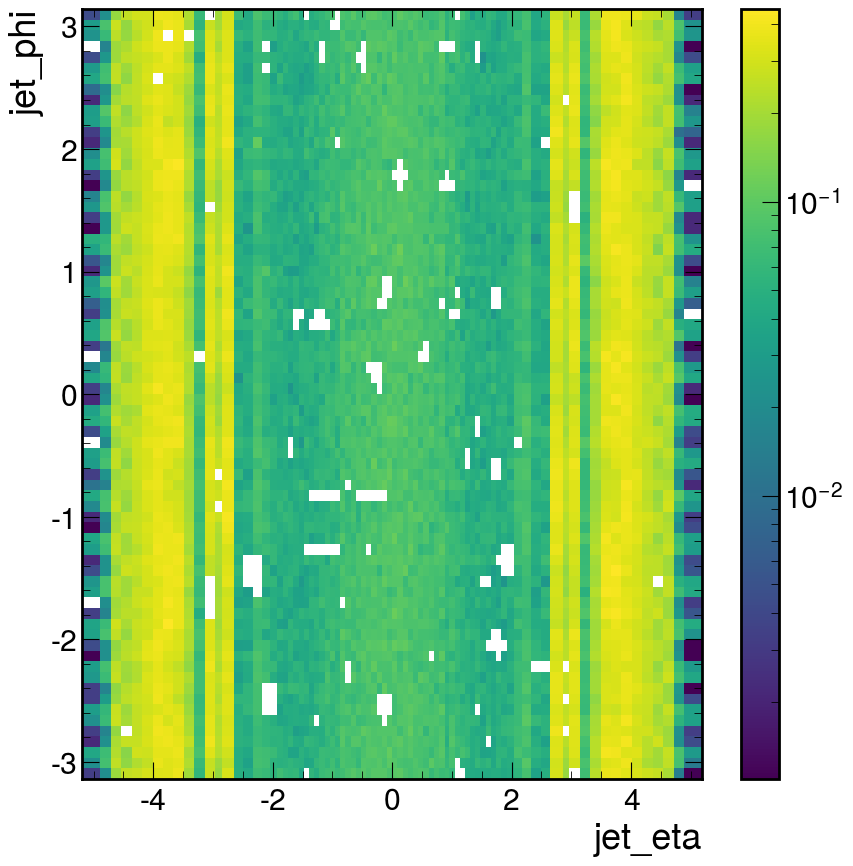

Stop-M600-cT1


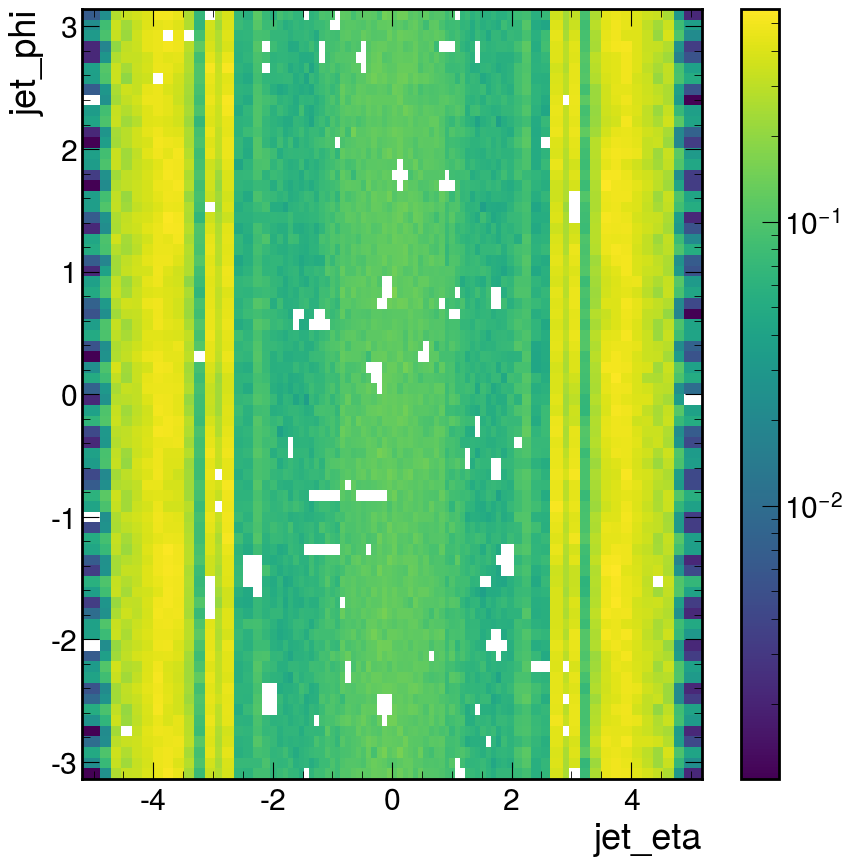

Stop-M800-cT1


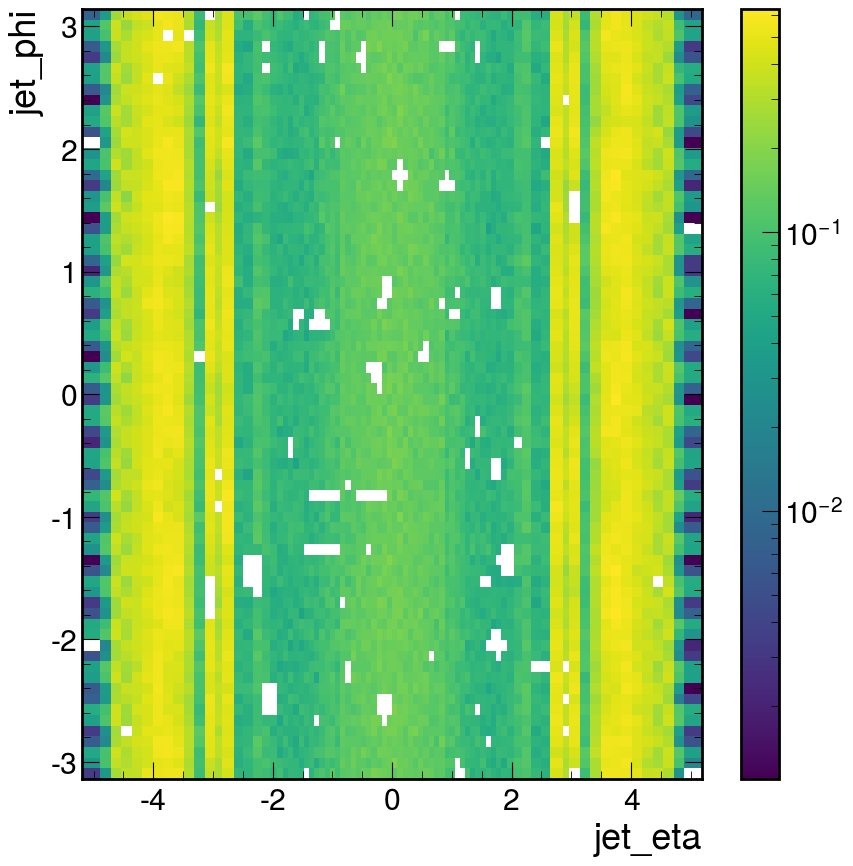

Stop-M200-cT3


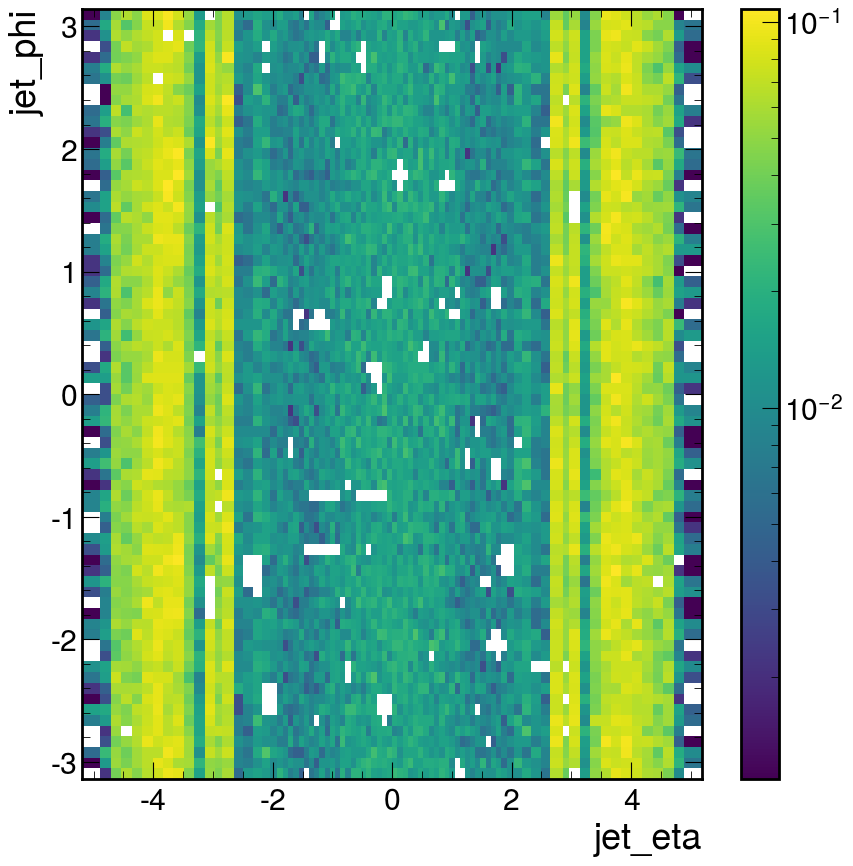

Stop-M400-cT3


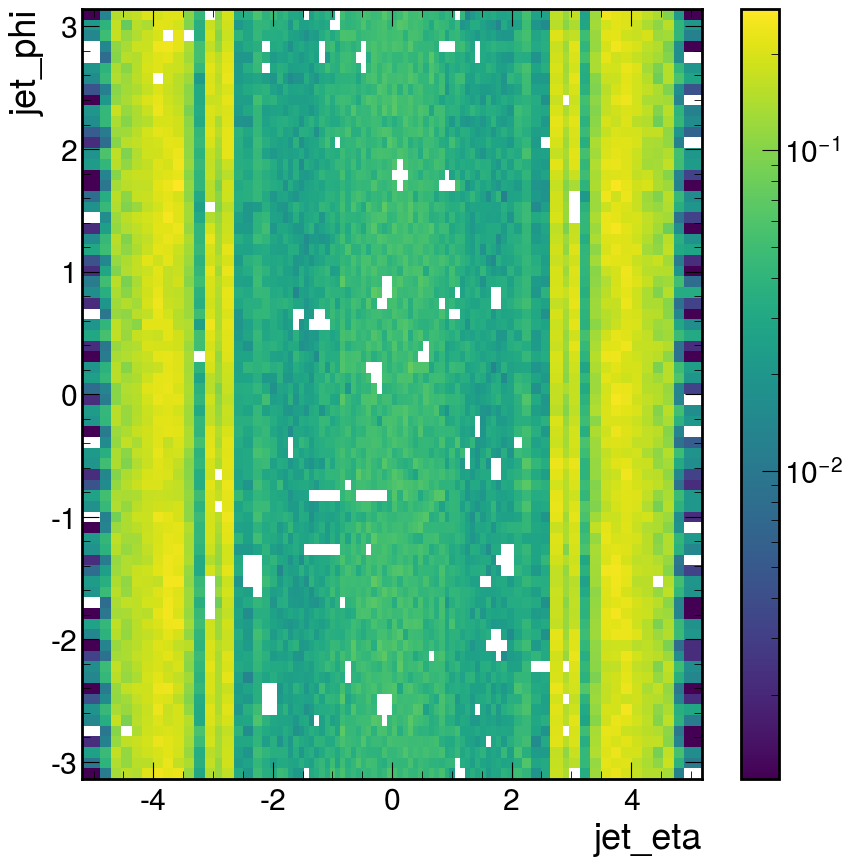

Stop-M600-cT3


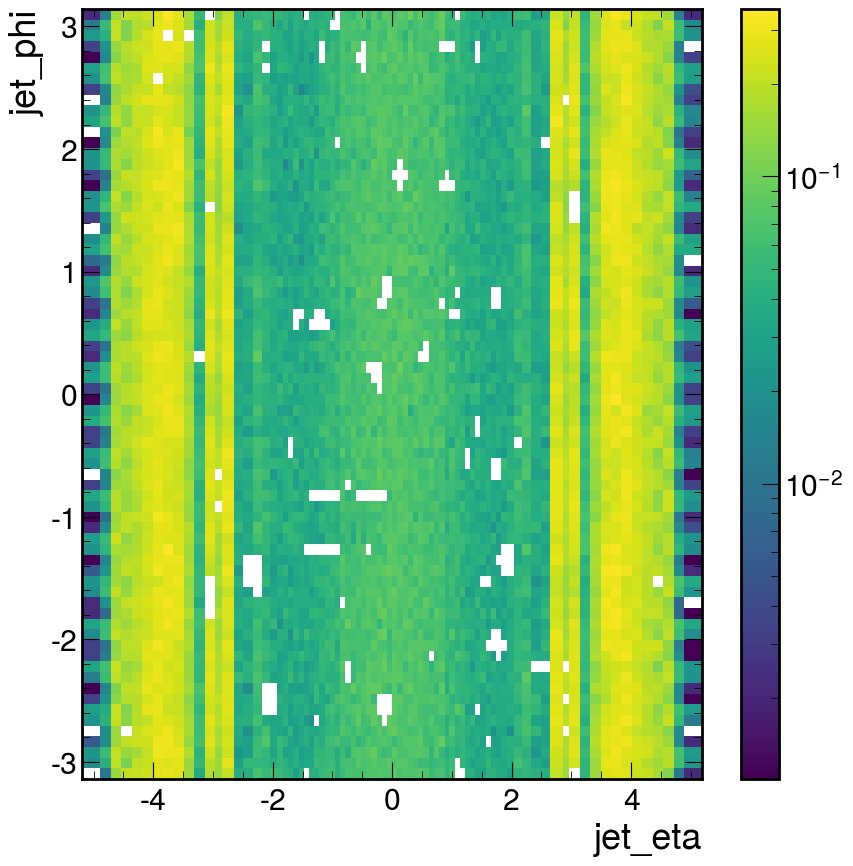

Stop-M800-cT3


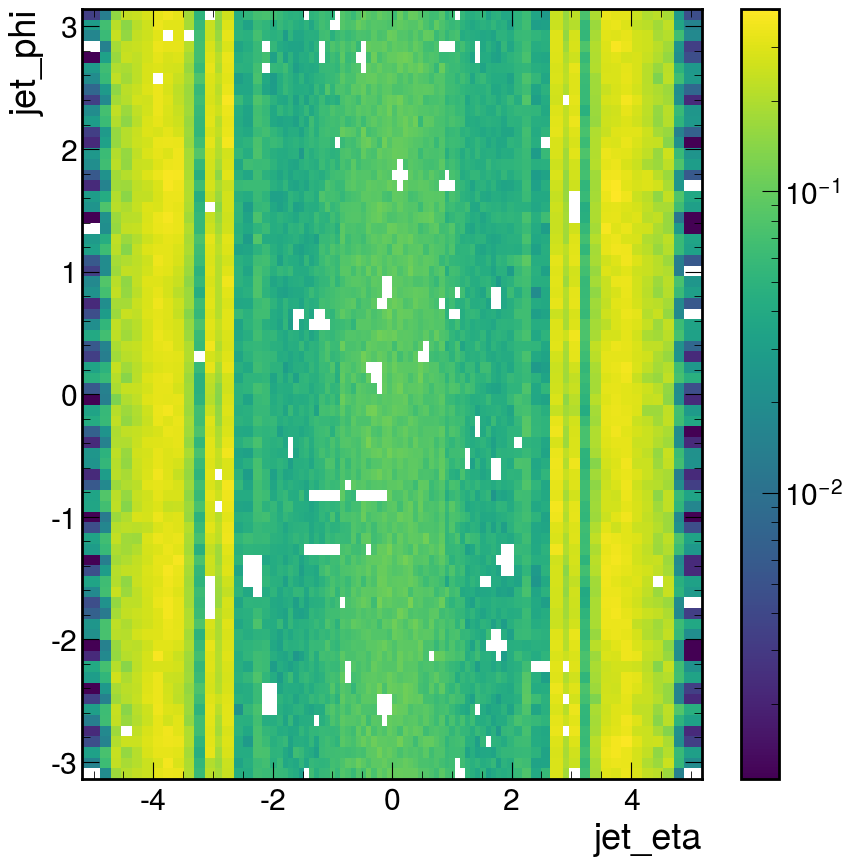

Stop-M200-cT10


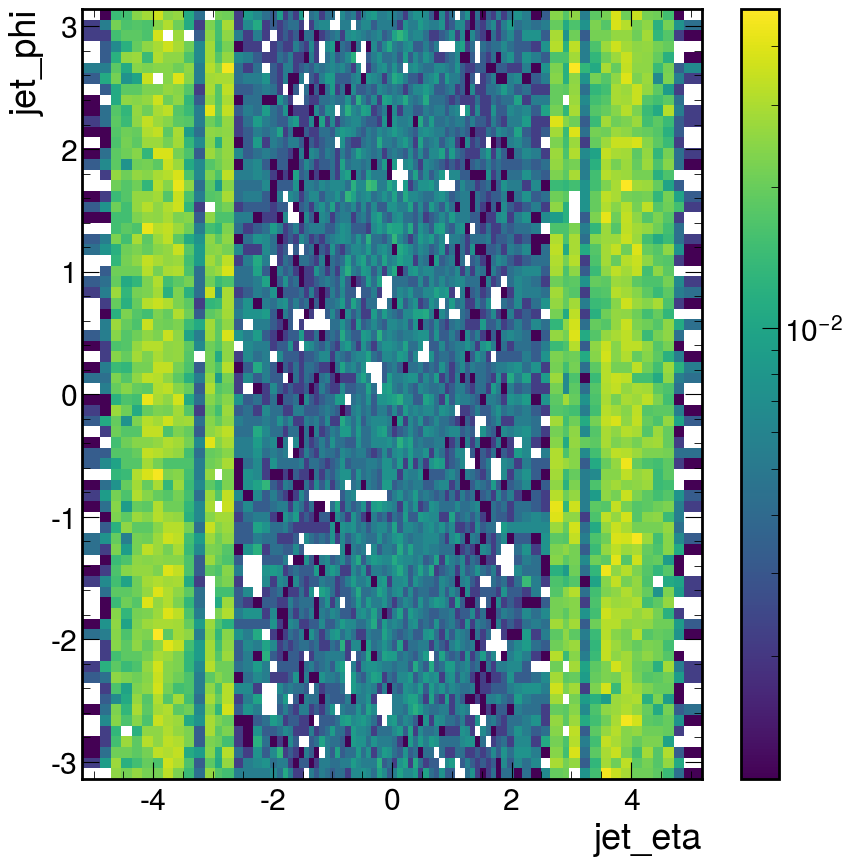

Stop-M400-cT10


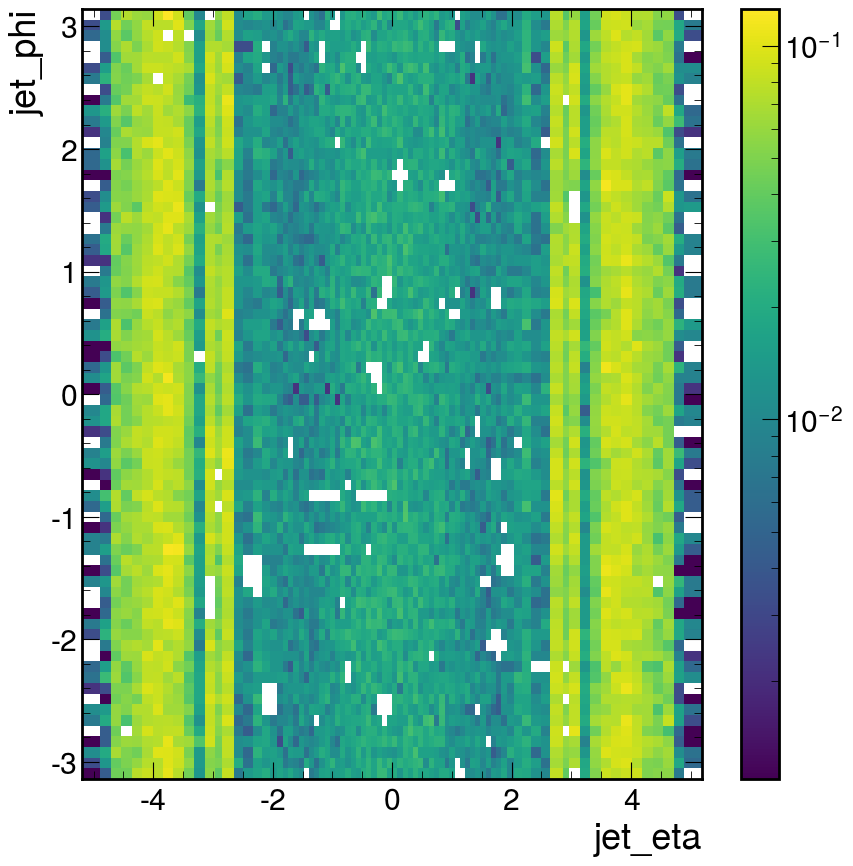

Stop-M600-cT10


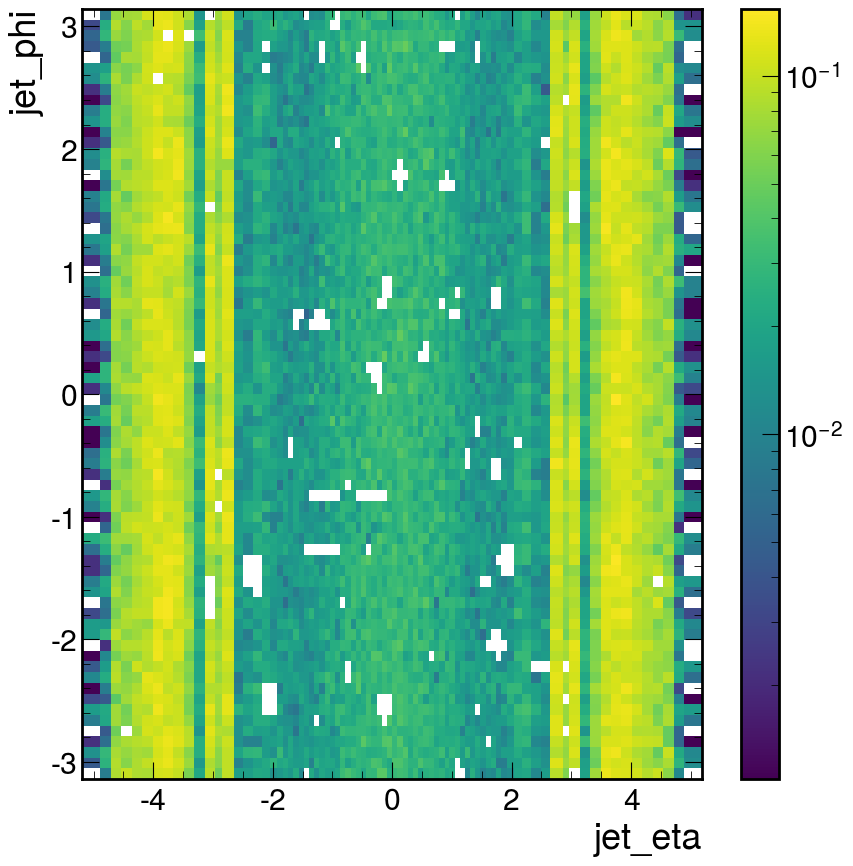

Stop-M800-cT10


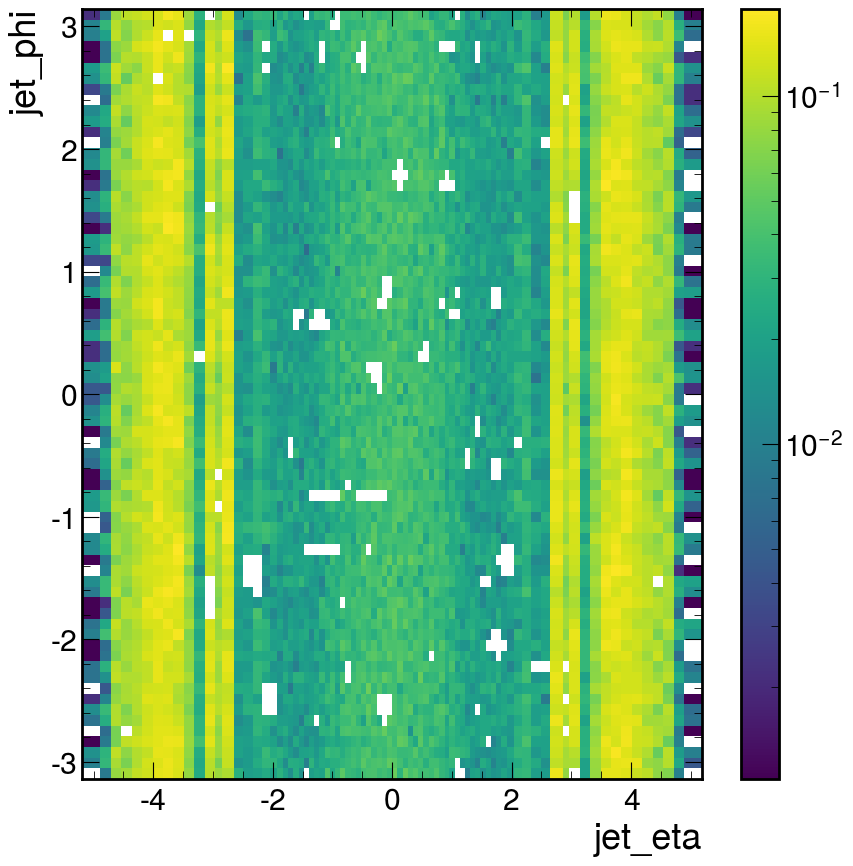

Total runtime: 14.14 seconds


In [33]:
#2D Plot Script For Jet Veto

import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed
from matplotlib.colors import LogNorm

plotDict = {
    "jet_eta": [-5.191,5.191,83], "jet_phi": [-3.141592653589793,3.141592653589793,73]
}

def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    doWeightSum = False
    genWeightSum = 0
    weightSum = np.zeros((plotDict["jet_eta"][2]-1,plotDict["jet_phi"][2]-1))
    with uproot.open("/afs/cern.ch/user/r/rmccarth/private/scouting/CMSSW_14_0_18_patch1/src/Run3ScoutingAnalysisTools/Summer24Prompt24_RunBCDEFGHI.root") as file:
        jetVetoMap = file["jetvetomap"]
        jetVetoXBins = jetVetoMap.to_numpy()[1]
        jetVetoYBins = jetVetoMap.to_numpy()[2]
        jetVetoMap = jetVetoMap.to_numpy()[0]
    with uproot.open(rootFile) as file:
        if(process in processDict):
            if (len(processDict[process])>1): doWeightSum = True
        elif(process in signalDict):
            if (len(signalDict[process])>1): doWeightSum = True
        if(doWeightSum):
            output["genWeightSum"] = {process: file["triggerFilter/genWeightsSkim"].values()[0]}
        else:
            output["genWeightSum"] = {}
            genWeightSum = file["triggerFilter/genWeightsSkim"].values()[0]
        tree = file["scoutingTree/objectTree"]

        # Select only necessary branches to load
        branches = list(plotDict.keys()) + ["weight"]

        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        for batch in tree.iterate(branches, library="ak", step_size=100000):  
            weights = batch["weight"]  # normalize event weights
            if(not doWeightSum): weights = weights / genWeightSum

            x_binning = plotDict["jet_eta"]
            #x_bins = np.linspace(x_binning[0], x_binning[1], x_binning[2])
            x_bins = jetVetoXBins
            x_data = batch["jet_eta"]

            y_binning = plotDict["jet_phi"]
            #y_bins = np.linspace(y_binning[0], y_binning[1], y_binning[2])
            y_bins = jetVetoYBins
            y_data = batch["jet_phi"]
            
            broadcastWeights, x_data = ak.broadcast_arrays(weights,x_data)
            # Apply mask and flatten data
            x_data = ak.to_numpy(ak.flatten(x_data,axis=None))
            x_data = np.clip(x_data,x_bins[0],x_bins[-1])
            y_data = ak.to_numpy(ak.flatten(y_data,axis=None))
            y_data = np.clip(y_data,y_bins[0],y_bins[-1])
            weights_filtered = ak.to_numpy(ak.flatten(broadcastWeights,axis=None))
            
            #Apply jet veto
            x_data_binned = np.digitize(x_data,jetVetoXBins)
            x_data_binned = x_data_binned - 1
            y_data_binned = np.digitize(y_data,jetVetoYBins)
            y_data_binned = y_data_binned - 1
            
            mask = jetVetoMap[x_data_binned,y_data_binned]
            mask = (mask == 0)
            x_data = x_data[mask]
            y_data = y_data[mask]
            weights_filtered = weights_filtered[mask]
            
            # Compute histograms
            n, xedges, yedges = np.histogram2d(x_data,y_data,weights=weights_filtered, bins=(x_bins,y_bins))
            weightSum = weightSum + n
    output["trkVert_eta_phi"] = {process: weightSum}
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        if process not in results[plot]:
                             results[plot][process] = result[plot][process]
                        else:
                            results[plot][process] = results[plot][process] + result[plot][process]

    return results

t0 = time.time()

bgPlotWeights = parallel_processing(processDict)
sigPlotWeights = parallel_processing(signalDict)

#Combining Background Subprocesses and Reweighting Events
for plot in ["trkVert_eta_phi"]:
    for process in bgPlotWeights["genWeightSum"].keys():
        bgPlotWeights[plot][process] = bgPlotWeights[plot][process] / bgPlotWeights["genWeightSum"][process]
    bgPlotWeights[plot]["QCD"] = bgPlotWeights[plot]["QCD200to400"]+bgPlotWeights[plot]["QCD400to600"]+bgPlotWeights[plot]["QCD600to800"]+bgPlotWeights[plot]["QCD800to1000"]+bgPlotWeights[plot]["QCD1000to1200"]+bgPlotWeights[plot]["QCD1200to1500"]+bgPlotWeights[plot]["QCD1500to2000"]+bgPlotWeights[plot]["QCD2000"]
    bgPlotWeights[plot]["TTbar"] = bgPlotWeights[plot]["TTTo4Q"]+bgPlotWeights[plot]["TTToLNu2Q"]
for plot in ["trkVert_eta_phi"]:
    for process in sigPlotWeights["genWeightSum"].keys():
        sigPlotWeights[plot][process] = sigPlotWeights[plot][process] / sigPlotWeights["genWeightSum"][process]

# **Plotting**
x_binning = plotDict["jet_eta"]
y_binning = plotDict["jet_phi"]
#x_bins = np.linspace(x_binning[0], x_binning[1], x_binning[2])
#y_bins = np.linspace(y_binning[0], y_binning[1], y_binning[2])
with uproot.open("/afs/cern.ch/user/r/rmccarth/private/scouting/CMSSW_14_0_18_patch1/src/Run3ScoutingAnalysisTools/Summer24Prompt24_RunBCDEFGHI.root") as file:
        jetVetoMap = file["jetvetomap"]
        jetVetoXBins = jetVetoMap.to_numpy()[1]
        jetVetoYBins = jetVetoMap.to_numpy()[2]
        jetVetoMap = jetVetoMap.to_numpy()[0]
x_bins = jetVetoXBins
y_bins = jetVetoYBins
plt.pcolormesh(x_bins, y_bins, np.array(bgPlotWeights["trkVert_eta_phi"]["QCD"]).T, shading='auto', cmap='viridis',norm=LogNorm())
plt.colorbar()
plt.xlabel("jet_eta")
plt.ylabel("jet_phi")
plt.show()
plt.pcolormesh(x_bins, y_bins, np.array(bgPlotWeights["trkVert_eta_phi"]["TTbar"]).T, shading='auto', cmap='viridis',norm=LogNorm())
plt.colorbar()
plt.xlabel("jet_eta")
plt.ylabel("jet_phi")
plt.show()

for signal in signalDict.keys():
    print(signal)
    plt.pcolormesh(x_bins, y_bins, np.array(sigPlotWeights["trkVert_eta_phi"][signal]).T, shading='auto', cmap='viridis',norm=LogNorm())
    plt.colorbar()
    plt.xlabel("jet_eta")
    plt.ylabel("jet_phi")
    plt.show()

t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")


In [10]:
#Cutflow table script with jet veto
doPercents = False
bin_namesCustom = ["8Tracks","JetVeto"]

def process_cutflows(args):
    """ Process a single ROOT file in chunks using uproot.iterate() """
    rootFile, process = args
    print(f"Processing {rootFile}")

    with uproot.open("/afs/cern.ch/user/r/rmccarth/private/scouting/CMSSW_14_0_18_patch1/src/Run3ScoutingAnalysisTools/Summer24Prompt24_RunBCDEFGHI.root") as file:
        jetVetoMap = file["jetvetomap"]
        jetVetoMapXBins = jetVetoMap.to_numpy()[1]
        jetVetoMapYBins = jetVetoMap.to_numpy()[2]
        jetVetoMap = jetVetoMap.to_numpy()[0]
    output = {}
    with uproot.open(rootFile) as file:
        output[process] = {}
        output[process+"_squared"] = {}
        output[process+"_nEvents"] = {}
        tree = file["scoutingTree/objectTree"]

        # Select only necessary branches to load
        branches = ["scoutVert_dBV","scoutVert_dBVErr", "scoutVert_nTracks","weight","jet_eta","jet_phi","eventId","jet_passJetIdTight","jet_pt","jet_chEmEF","jet_neEmEF"]

        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        weightSum = [0]*len(bin_namesCustom)
        weightSumSquared = [0] * len(bin_namesCustom)
        numEvents = [0] * len(bin_namesCustom)
        for batch in tree.iterate(branches, library="ak", step_size=100000):  
            weights = batch["weight"]  # event weights
            data = batch["scoutVert_dBV"]
            ntracks = batch["scoutVert_nTracks"]
            jetEta = batch["jet_eta"]
            jetPhi = batch["jet_phi"]
            jetPt = batch["jet_pt"]
            jetId = batch["jet_passJetIdTight"]
            jetChargedEMFrac = batch["jet_chEmEF"]
            jetNeutralEMFrac = batch["jet_neEmEF"]
            eventId = batch["eventId"]
            mask = data<2.0
            data = data[mask]
            ntracks = ntracks[mask]
            mask = ak.sum(data>=0.01,axis=1)>0
            weights = weights[mask]
            eventId = eventId[mask]
            data = data[mask]
            ntracks = ntracks[mask]
            jetEta = jetEta[mask]
            jetPhi = jetPhi[mask]
            jetPt = jetPt[mask]
            jetId = jetId[mask]
            jetChargedEMFrac = jetChargedEMFrac[mask]
            jetNeutralEMFrac = jetNeutralEMFrac[mask]
            
            mask = ntracks > 7
            data = data[mask]
            mask = ak.sum(data>=0.01,axis=1)>0
            weights = weights[mask]
            eventId = eventId[mask]
            jetEta = jetEta[mask]
            jetPhi = jetPhi[mask]
            jetPt = jetPt[mask]
            jetId = jetId[mask]
            jetChargedEMFrac = jetChargedEMFrac[mask]
            jetNeutralEMFrac = jetNeutralEMFrac[mask]
            weightSum[0] += ak.sum(weights)
            weightSumSquared[0] += ak.sum(weights**2)
            numEvents[0] += ak.num(weights,axis=0)
            
            mask = abs(jetEta)<2.4
            jetEta = jetEta[mask]
            jetPhi = jetPhi[mask]
            jetPt = jetPt[mask]
            jetId = jetId[mask]
            jetChargedEMFrac = jetChargedEMFrac[mask]
            jetNeutralEMFrac = jetNeutralEMFrac[mask]
            ptMask = (((jetPt>15) & ((abs(jetEta)<=2.5) | (abs(jetEta)>=3))) | ((jetPt>50) & ((abs(jetEta)>2.5) & (abs(jetEta)<3))))
            selectionMask = ptMask & jetId & ((jetChargedEMFrac+jetNeutralEMFrac)<0.9)
            #Apply jet veto
            x_bins = jetVetoMapXBins
            y_bins = jetVetoMapYBins
            jetEta_n = ak.num(jetEta)
            jetEta = ak.flatten(jetEta)
            jetPhi_n = ak.num(jetPhi)
            jetPhi = ak.flatten(jetPhi)
            jetEta_binned = np.digitize(jetEta,x_bins)
            jetEta_binned = np.clip(jetEta_binned,1,82)
            jetEta_binned = jetEta_binned - 1
            jetPhi_binned = np.digitize(jetPhi,y_bins)
            jetPhi_binned = np.clip(jetPhi_binned,1,72)
            jetPhi_binned = jetPhi_binned - 1
            mask = jetVetoMap[jetEta_binned,jetPhi_binned]
            mask = (mask == 0)
            mask = ak.unflatten(mask,jetEta_n)
            mask = mask & selectionMask
            jetEta = ak.unflatten(jetEta,jetEta_n)
            jetPhi = ak.unflatten(jetPhi,jetPhi_n)
            jetEta = jetEta[mask]
            jetPhi = jetPhi[mask]
            mask = ak.num(jetEta,axis=1)>3
            weights = weights[mask]
            eventId = eventId[mask]
            weightSum[1] += ak.sum(weights)
            weightSumSquared[1] += ak.sum(weights**2)
            numEvents[1] += ak.num(weights,axis=0)
        for i in range(len(bin_namesCustom)):
            output[process][bin_namesCustom[i]] = weightSum[i]
            output[process+"_squared"][bin_namesCustom[i]] = weightSumSquared[i]
            output[process+"_nEvents"][bin_namesCustom[i]] = numEvents[i]
        
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    """ Process all ROOT files in parallel and aggregate results """
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_cutflows, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for process in result:
                if process not in results:
                    results[process] = result[process]
                else:
                    for cut in result[process]:
                        results[process][cut] = results[process].get(cut, 0) + result[process][cut]

    return results


# Define LaTeX table header
latex_table = "\\begin{table}[htbp]\n"
latex_table += "\\centering\n"

dict = signalDict | processDict
customWeights = parallel_processing(dict)

firstProcess = True
weightSumDict = {}
weightSquaredSumDict = {}
genWeightSumDict = {}
for process, rootFiles in dict.items():
    firstFile = True
    weightSum = []
    weightSquaredSum = []
    genWeightSum = 0
    for rootFile in rootFiles:
        f = ROOT.TFile.Open(rootFile, "READ")
        h_weightsSkim = f.Get("triggerFilter/weightsSkim")
        h_weightsSquaredSkim = f.Get("triggerFilter/weightsSquaredSkim")
        h_genWeights = f.Get("triggerFilter/genWeightsSkim")
        h_weights = f.Get("scoutingTree/weights")
        h_weightsSquared = f.Get("scoutingTree/weightsSquared")
        
        # Extract content
        n_bins = h_weights.GetNbinsX()
        weights = np.array([h_weights.GetBinContent(i) for i in range(3, n_bins)]) #temp since there are redundant cuts in tree maker, normally would go from 1 to n_bins+1
        bin_names = np.array([h_weights.GetXaxis().GetLabels().At(i-1).GetName() for i in range(3, n_bins)])
        weightsSquared = np.array([h_weightsSquared.GetBinContent(i) for i in range(3, n_bins)])
        
        n_binsSkim = h_weightsSkim.GetNbinsX() 
        weightsSkim = np.array([h_weightsSkim.GetBinContent(i) for i in range(1, n_binsSkim + 1)])
        bin_namesSkim = np.array([h_weightsSkim.GetXaxis().GetLabels().At(i-1).GetName() for i in range(1, n_binsSkim + 1)])
        weightsSquaredSkim = np.array([h_weightsSquaredSkim.GetBinContent(i) for i in range(1, n_binsSkim + 1)])
        genWeights = np.array([h_genWeights.GetBinContent(i) for i in range(1, n_binsSkim + 1)])
        
        if(firstFile and firstProcess):
            latex_table += "\\resizebox{\\textwidth}{!}{\\begin{tabular}{|l|"+(len(bin_names)+len(bin_namesSkim)+len(bin_namesCustom)+2)*"c|"+"}\n"
            latex_table += "\\hline\n"
            latex_table += "Process "
            for name in np.concatenate((bin_namesSkim,bin_names)):
                latex_table += "& {} ".format(name)
                weightSum.append(0)
                weightSquaredSum.append(0)
            for name in bin_namesCustom:
                latex_table += "& {} ".format(name)
            latex_table += "& {} & {} ".format("s/sqrt(s+b)","$\epsilon/(1+\sqrt{B})$")
            latex_table += "\\\\\n"
            latex_table += "\\hline\n"
            firstFile = False
        elif(firstFile):
            for name in np.concatenate((bin_namesSkim,bin_names)):
                weightSum.append(0)
                weightSquaredSum.append(0)
            firstFile = False

        genWeightSum += genWeights[0]
        for i in range(len(weightsSkim)):
            weightSum[i] += weightsSkim[i]
            weightSquaredSum[i] += weightsSquaredSkim[i]
        for i in range(len(weights)):
            weightSum[i+len(weightsSkim)] += weights[i]
            weightSquaredSum[i+len(weightsSkim)] += weightsSquared[i]
    firstProcess = False
    weightSumDict[process] = weightSum
    weightSquaredSumDict[process] = weightSquaredSum
    genWeightSumDict[process] = genWeightSum
      
#Combining Background Subprocesses and Reweighting Events
for process in dict.keys():
    for i in range(len(weightSumDict[process])):
        weightSumDict[process][i] = weightSumDict[process][i] / genWeightSumDict[process]
        weightSquaredSumDict[process][i] = weightSquaredSumDict[process][i] / (genWeightSumDict[process]**2)
    for cut in customWeights[process].keys():
        customWeights[process][cut] = customWeights[process][cut] / genWeightSumDict[process]
        customWeights[process+"_squared"][cut] = customWeights[process+"_squared"][cut] / (genWeightSumDict[process]**2)
weightSumDict["QCD"] = weightSumDict["QCD200to400"]
weightSquaredSumDict["QCD"] = weightSquaredSumDict["QCD200to400"]
weightSumDict["TTbar"] = weightSumDict["TTTo4Q"]
weightSquaredSumDict["TTbar"] = weightSquaredSumDict["TTTo4Q"]
for i in range(len(weightSumDict["QCD"])):
    weightSumDict["QCD"][i] = weightSumDict["QCD40to70"][i]+weightSumDict["QCD70to100"][i]+weightSumDict["QCD100to200"][i]+weightSumDict["QCD"][i]+weightSumDict["QCD400to600"][i]+weightSumDict["QCD600to800"][i]+weightSumDict["QCD800to1000"][i]+weightSumDict["QCD1000to1200"][i]+weightSumDict["QCD1200to1500"][i]+weightSumDict["QCD1500to2000"][i]+weightSumDict["QCD2000"][i]
    weightSquaredSumDict["QCD"][i] = weightSquaredSumDict["QCD40to70"][i]+weightSquaredSumDict["QCD70to100"][i]+weightSquaredSumDict["QCD100to200"][i]+weightSquaredSumDict["QCD"][i]+weightSquaredSumDict["QCD400to600"][i]+weightSquaredSumDict["QCD600to800"][i]+weightSquaredSumDict["QCD800to1000"][i]+weightSquaredSumDict["QCD1000to1200"][i]+weightSquaredSumDict["QCD1200to1500"][i]+weightSquaredSumDict["QCD1500to2000"][i]+weightSquaredSumDict["QCD2000"][i]
    weightSumDict["TTbar"][i] = weightSumDict["TTbar"][i]+weightSumDict["TTToLNu2Q"][i]
    weightSquaredSumDict["TTbar"][i] = weightSquaredSumDict["TTbar"][i]+weightSquaredSumDict["TTToLNu2Q"][i]
customWeights["QCD"] = {}
customWeights["TTbar"] = {}
customWeights["QCD_squared"] = {}
customWeights["TTbar_squared"] = {}
customWeights["QCD_nEvents"] = {}
customWeights["TTbar_nEvents"] = {}
for i in range(len(bin_namesCustom)):
    cut = bin_namesCustom[i]
    customWeights["QCD"][cut] = customWeights["QCD40to70"][cut]+customWeights["QCD70to100"][cut]+customWeights["QCD100to200"][cut]+customWeights["QCD200to400"][cut]+customWeights["QCD400to600"][cut]+customWeights["QCD600to800"][cut]+customWeights["QCD800to1000"][cut]+customWeights["QCD1000to1200"][cut]+customWeights["QCD1200to1500"][cut]+customWeights["QCD1500to2000"][cut]+customWeights["QCD2000"][cut]
    customWeights["QCD_squared"][cut] = customWeights["QCD40to70_squared"][cut]+customWeights["QCD70to100_squared"][cut]+customWeights["QCD100to200_squared"][cut]+customWeights["QCD200to400_squared"][cut]+customWeights["QCD400to600_squared"][cut]+customWeights["QCD600to800_squared"][cut]+customWeights["QCD800to1000_squared"][cut]+customWeights["QCD1000to1200_squared"][cut]+customWeights["QCD1200to1500_squared"][cut]+customWeights["QCD1500to2000_squared"][cut]+customWeights["QCD2000_squared"][cut]
    customWeights["QCD_nEvents"][cut] = customWeights["QCD40to70_nEvents"][cut]+customWeights["QCD70to100_nEvents"][cut]+customWeights["QCD100to200_nEvents"][cut]+customWeights["QCD200to400_nEvents"][cut]+customWeights["QCD400to600_nEvents"][cut]+customWeights["QCD600to800_nEvents"][cut]+customWeights["QCD800to1000_nEvents"][cut]+customWeights["QCD1000to1200_nEvents"][cut]+customWeights["QCD1200to1500_nEvents"][cut]+customWeights["QCD1500to2000_nEvents"][cut]+customWeights["QCD2000_nEvents"][cut]
    customWeights["TTbar"][cut] = customWeights["TTTo4Q"][cut]+customWeights["TTToLNu2Q"][cut]
    customWeights["TTbar_squared"][cut] = customWeights["TTTo4Q_squared"][cut]+customWeights["TTToLNu2Q_squared"][cut]
    customWeights["TTbar_nEvents"][cut] = customWeights["TTTo4Q_nEvents"][cut]+customWeights["TTToLNu2Q_nEvents"][cut]

for process in list(signalDict.keys())+["TTbar","QCD"]:
    print("events passing full selection for process",process,":",customWeights[process+'_nEvents'][bin_namesCustom[-1]])
    latex_table +=  f"{process}"
    for i in range(len(weightSumDict[process])):
        clop_unc = intervals.clopper_pearson_interval(weightSumDict[process][i],weightSumDict[process][0])
        stat_unc = np.sqrt(weightSquaredSumDict[process][i])
        efficiency = weightSumDict[process][i]
        formatString = ".1g"
        if(doPercents):
            efficiency = efficiency / weightSumDict[process][0]
            stat_unc = efficiency * np.sqrt(((stat_unc/weightSumDict[process][i])**2)+((np.sqrt(weightSquaredSumDict[process][0])/weightSumDict[process][0])**2))
        else:
            clop_unc = clop_unc * weightSumDict[process][0]
        if process in ["TTbar","QCD"]:
            formatString = ".2E"
        if(efficiency>0):
            latex_table +=  f" & {efficiency:.3g} $\pm$ {stat_unc:.1g}"
        else:
            latex_table +=  f" & {efficiency:.3g}$^{{+{clop_unc[1]-efficiency:{formatString}}}}_{{-{efficiency-clop_unc[0]:{formatString}}}}$"
    #Custom Cutflows
    for i in range(len(bin_namesCustom)):
        clop_unc = intervals.clopper_pearson_interval(customWeights[process][bin_namesCustom[i]],weightSumDict[process][0])
        stat_unc = np.sqrt(customWeights[process+'_squared'][bin_namesCustom[i]])
        efficiency = customWeights[process][bin_namesCustom[i]]
        formatString = ".1g"
        if(doPercents):
            efficiency = efficiency / weightSumDict[process][0]
            stat_unc = efficiency * np.sqrt(((stat_unc/customWeights[process][bin_namesCustom[i]])**2)+((np.sqrt(weightSquaredSumDict[process][0])/weightSumDict[process][0])**2))
        else:
            clop_unc = clop_unc * weightSumDict[process][0]
        if process in ["TTbar","QCD"] and doPercents:
            formatString = ".2E"
        if(efficiency>0):
            latex_table +=  f" & {efficiency:.3g} $\pm$ {stat_unc:.1g}"
        else:
            latex_table +=  f" & {efficiency:.3g}$^{{+{clop_unc[1]-efficiency:{formatString}}}}_{{-{efficiency-clop_unc[0]:{formatString}}}}$"
    latex_table += "\\\\\n"
    
latex_table += "\\hline\n"
latex_table += "\\end{tabular}}\n"
latex_table += "\\caption{Cutflow table}\n"
latex_table += "\\label{tab:cutflow}\n"
latex_table += "\\end{table}"

#Add sensitivity

splitStrings = latex_table.split("\\hline\n")
processString = splitStrings[2]
substrings = processString.split("\\\\")
final_table = splitStrings[0]+"\\hline\n"+splitStrings[1]+"\\hline\n"
for string in substrings:
    process = string.split(' &')[0]
    process = process.replace('\n','')
    if(process in signalDict):
        if(len(bin_namesCustom)):
            string += f" & {customWeights[process][bin_namesCustom[-1]]/np.sqrt(customWeights[process][bin_namesCustom[-1]]+customWeights['QCD'][bin_namesCustom[-1]]+customWeights['TTbar'][bin_namesCustom[-1]]):.2f} & {(customWeights[process][bin_namesCustom[-1]]/weightSumDict[process][0])/(1+np.sqrt(customWeights['QCD'][bin_namesCustom[-1]]+customWeights['TTbar'][bin_namesCustom[-1]])):.3f}"
        else:
            string += f" & {weightSumDict[process][-1]/np.sqrt(weightSumDict[process][-1]+weightSumDict['QCD'][-1]+weightSumDict['TTbar'][-1]):.3f}" 
    elif(process in ["QCD","TTbar"]):
        string += f" & & "
    final_table += string + "\\\\"
final_table = final_table[:-2]
final_table += "\\hline\n" + splitStrings[3]

print(final_table)

Processing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v18-4TrackMin-5DxyMin/250902_192832/StopStopbarTo2Dbar2D_M-200_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v18-4TrackMin-5DxyMin/250902_192915/StopStopbarTo2Dbar2D_M-400_CTau-3mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v18-4TrackMin-5DxyMin/250902_192904/StopStopbarTo2Dbar2D_M-400_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v18-4TrackMin-5DxyMin/250902_192937/StopStopbarTo2Dbar2D_M-600_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summ

/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-scipy/1.10.1-1e920695ddf0dd59a535e9602f21fe6d/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:694: RuntimeWarning: Error in function boost::math::tgamma<d>(d,d): Series evaluation exceeded %1% iterations, giving up now.
  return _boost._beta_ppf(q, a, b)
/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-scipy/1.10.1-1e920695ddf0dd59a535e9602f21fe6d/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:694: RuntimeWarning: Error in function boost::math::tgamma<d>(d,d): Series evaluation exceeded %1% iterations, giving up now.
  return _boost._beta_ppf(q, a, b)


In [ ]:
with uproot.open("/afs/cern.ch/user/r/rmccarth/private/scouting/CMSSW_14_0_18_patch1/src/Run3ScoutingAnalysisTools/Summer24Prompt24_RunBCDEFGHI.root") as file:
        jetVetoMap = file["jetvetomap"]
        print(jetVetoMap.to_numpy()[2])
        jetVetoMap = jetVetoMap.to_numpy()[0]
        x_bins = np.linspace(-5.191,5.191,83)
        y_bins = np.linspace(-3.141592653589793,3.141592653589793,73)
        print(jetVetoMap.shape)
        x_data = [3.0]
        y_data = [-3.06]
        print(x_bins)
        x_data_binned = np.digitize(x_data,x_bins)
        x_data_binned = np.clip(x_data_binned,0,82)
        x_data_binned = x_data_binned - 1
        y_data_binned = np.digitize(y_data,y_bins)
        y_data_binned = np.clip(y_data_binned,0,72)
        y_data_binned = y_data_binned - 1
        mask = jetVetoMap[x_data_binned,y_data_binned]
        print("bin xy",x_data_binned,y_data_binned)
        print(mask)

Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v18-PileupNoSelectionGenWeights/250901_195225/QCD-4Jets_Bin-HT-40to70.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v18-PileupNoSelectionGenWeights/250901_195301/QCD-4Jets_Bin-HT-100to200.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v18-PileupNoSelectionGenWeights/250901_195244/QCD-4Jets_Bin-HT-70to100.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v18-PileupNoSelectionGenWeights/250824_144703/TTtoLNu2Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v18-PileupNoS

/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-awkward/2.1.1-edf8d8121f794c78bb662dab159497fd/lib/python3.9/site-packages/awkward/_backends.py:58: RuntimeWarning: divide by zero encountered in divide
  return getattr(ufunc, method)(*args, **kwargs)


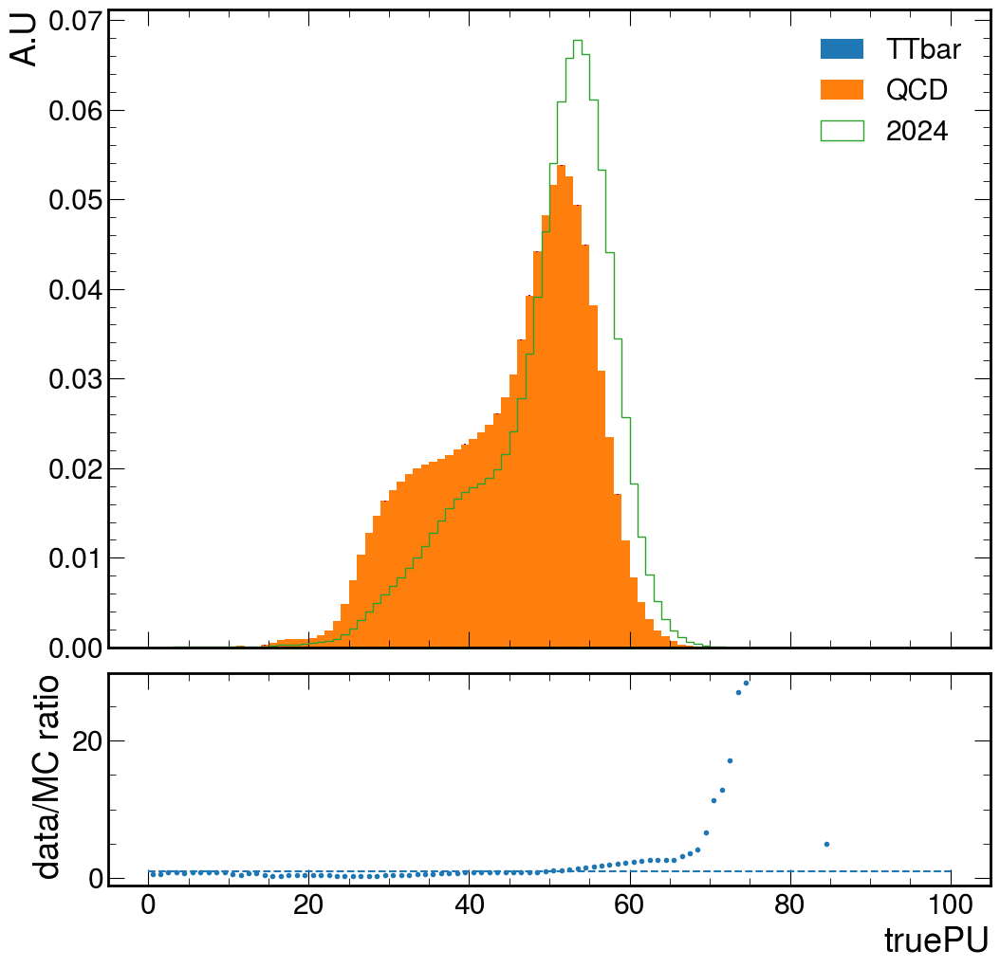

Total runtime: 274.90 seconds


In [4]:
#Pileup Plotting Script

import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed

plotDict = {
    #"vertTrack_pt": [0,5,101],# "vertTrack_eta": [-3,3,101], "vertTrack_phi": [-3.142,3.142,101],
    #"vertTrack_reducedChi2": [0,7,51], "vertTrack_dxy": [0,0.3,51], "vertTrack_dxyErr": [0,0.05,101], "vertTrack_dxySig": [0,50,101],
    #"vertTrack_nValidPixelHits": [0,13,14], "vertTrack_nTrackerLayersWithMeasurement": [0,21,22],
    #"vertTrack_nValidStripHits": [0,32,33], 
    #"vertTrack_shiftZErr": [0,0.05,51], "vertTrack_shiftZValue": [0,0.05,101],
    #"vertTrack_shift3DErr": [0,0.05,51], "vertTrack_shift3DValue": [0,0.1,101],
    #"scoutVert_dBV": [0,3,101],# "scoutVert_dBVErr": [0,0.1,101],
    #"vertTrack_nMissingInnerHits": [0,5,6], 
    #"scoutVert_nTracks": [0,40,41], "scoutVert_chi2": [0,5,50],
    #"scoutVert_dT": [0,0.5,101], "scoutVert_cosT": [-1,1,101], "scoutVert_pMag": [0,500,101],
    #"scoutTrack_phi": [-3.142,3.142,101], "scoutTrack_dxySig": [0,50,101], "scoutTrack_nTrackerLayersWithMeasurement": [0,21,22],
    #"scoutTrack_pt": [0,50,101], "scoutTrack_nValidPixelHits": [0,13,14]
    "truePU": [0,100,101]
}

def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    doWeightSum = False
    genWeightSum = 0
    with uproot.open(rootFile) as file:
        if(process in processDict):
            if (len(processDict[process])>1): doWeightSum = True
        elif(process in signalDict):
            if (len(signalDict[process])>1): doWeightSum = True
        if(doWeightSum):
            output["genWeightSum"] = {process: file["pileupPlot/genWeights"].values()[0]}
        else:
            output["genWeightSum"] = {}
            genWeightSum = file["pileupPlot/genWeights"].values()[0]
        tree = file["pileupPlot/objectTree"]

        # Select only necessary branches to load
        branches = list(plotDict.keys()) + ["weight"]
        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        for batch in tree.iterate(branches, library="ak", step_size=10000):  
            weights = batch["weight"]  # normalize event weights
            if(not doWeightSum): weights = weights / genWeightSum

            for plot, binning in plotDict.items():
                bins = np.linspace(binning[0], binning[1], binning[2])
                data = batch[plot]
                # Apply displacement cut
                if "vertTrack_shift" in plot:
                    mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.1) & (batch["vertTrack_shiftZValue"] > -900)
                elif "vertTrack" in plot:
                    #mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.1)  & (batch["vertTrack_dxySig"] > 5) & (batch["vertTrack_pt"] > 1.0) & (batch["vertTrack_nValidPixelHits"] > 1)
                    mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.01)
                elif "scoutVert" in plot:
                    mask = (batch["scoutVert_dBV"] >= 0.01)
                elif "scoutTrack" in plot:
                    mask = (batch["scoutTrack_dxySig"] > 5) & (batch["scoutTrack_pt"] > 1.0) & (batch["scoutTrack_nValidPixelHits"] > 1) & (batch["scoutTrack_nTrackerLayersWithMeasurement"] > 5)
                else:
                    mask = ak.ones_like(data, dtype=bool)
                data = data[mask]
                #mask = ak.sum(mask,axis=1)>1
                #data = data[mask]
                #maskedWeights = weights[mask]
                broadcastWeights, data = ak.broadcast_arrays(weights,data)
                # Apply mask and flatten data
                data = ak.flatten(data,axis=None)
                data = np.clip(data,bins[0],bins[-1])
                weights_filtered = ak.flatten(broadcastWeights,axis=None)
                # Compute histograms
                n, _ = np.histogram(data, weights=weights_filtered, bins=bins)
                n_2, _ = np.histogram(data, weights=weights_filtered**2, bins=bins)
                if plot not in output:
                    output[plot] = {process: n}
                    output[f"{plot}_squared"] = {process: n_2}
                else:
                    output[plot][process] = output[plot][process] + n
                    output[f"{plot}_squared"][process] = output[f"{plot}_squared"][process] + n_2
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        results[plot][process] = results[plot].get(process, 0) + result[plot][process]

    return results

t0 = time.time()

bgPlotWeights = parallel_processing(processDict)
sigPlotWeights = parallel_processing(signalDict)

#Combining Background Subprocesses and Reweighting Events
for plot in plotDict.keys():
    for process in bgPlotWeights["genWeightSum"].keys():
        bgPlotWeights[plot][process] = bgPlotWeights[plot][process] / bgPlotWeights["genWeightSum"][process]
        bgPlotWeights[f"{plot}_squared"][process] = bgPlotWeights[f"{plot}_squared"][process] / (bgPlotWeights["genWeightSum"][process]**2)
    bgPlotWeights[plot]["QCD"] = bgPlotWeights[plot]["QCD40to70"]+bgPlotWeights[plot]["QCD70to100"]+bgPlotWeights[plot]["QCD100to200"]+bgPlotWeights[plot]["QCD200to400"]+bgPlotWeights[plot]["QCD400to600"]+bgPlotWeights[plot]["QCD600to800"]+bgPlotWeights[plot]["QCD800to1000"]+bgPlotWeights[plot]["QCD1000to1200"]+bgPlotWeights[plot]["QCD1200to1500"]+bgPlotWeights[plot]["QCD1500to2000"]+bgPlotWeights[plot]["QCD2000"]
    bgPlotWeights[f"{plot}_squared"]["QCD"] = bgPlotWeights[f"{plot}_squared"]["QCD40to70"]+bgPlotWeights[f"{plot}_squared"]["QCD70to100"]+bgPlotWeights[f"{plot}_squared"]["QCD100to200"]+bgPlotWeights[f"{plot}_squared"]["QCD200to400"]+bgPlotWeights[f"{plot}_squared"]["QCD400to600"]+bgPlotWeights[f"{plot}_squared"]["QCD600to800"]+bgPlotWeights[f"{plot}_squared"]["QCD800to1000"]+bgPlotWeights[f"{plot}_squared"]["QCD1000to1200"]+bgPlotWeights[f"{plot}_squared"]["QCD1200to1500"]+bgPlotWeights[f"{plot}_squared"]["QCD1500to2000"]+bgPlotWeights[f"{plot}_squared"]["QCD2000"]
    bgPlotWeights[plot]["TTbar"] = bgPlotWeights[plot]["TTTo4Q"]+bgPlotWeights[plot]["TTToLNu2Q"]
    bgPlotWeights[f"{plot}_squared"]["TTbar"] = bgPlotWeights[f"{plot}_squared"]["TTTo4Q"]+bgPlotWeights[f"{plot}_squared"]["TTToLNu2Q"]

# **Plotting**
for plot, binning in plotDict.items():
    if plot not in bgPlotWeights:
        print(f"Skipping {plot} (no data).")
        continue

    bins = np.linspace(binning[0], binning[1], binning[2])
    bgIntegral = (bins[1] - bins[0]) * sum(bgPlotWeights[plot]["QCD"] + bgPlotWeights[plot]["TTbar"])

    fig, (ax, rax) = plt.subplots(2, 1, figsize=[12,12], gridspec_kw={"height_ratios": [3,1]}, sharex=True)
    fig.subplots_adjust(hspace=0.06)
    ax.hist([(bins[:-1] + bins[1:]) / 2]*2,weights=[list(bgPlotWeights[plot]["TTbar"]),list(bgPlotWeights[plot]["QCD"])],
            stacked=True, density=True, label=["TTbar","QCD"], bins=bins)

    bgValues = (bgPlotWeights[plot]["QCD"] / bgIntegral) + (bgPlotWeights[plot]["TTbar"] / bgIntegral)
    bgErrors = np.sqrt(bgPlotWeights[f"{plot}_squared"]["QCD"] / (bgIntegral**2) + \
               bgPlotWeights[f"{plot}_squared"]["TTbar"] / (bgIntegral**2))
    #bgValues = np.nan_to_num(bgValues)
    #bgErrors = np.nan_to_num(bgErrors)
    ax.errorbar(((bins[:-1] + bins[1:]) / 2), bgValues, yerr=bgErrors, linestyle="none", color="purple")
    
    colors = {"Stop-M200-cT10": "black", "Stop-M400-cT10": "red", "Stop-M600-cT10": "blue", "Stop-M800-cT10": "green"}
    #colors = {"Hto2Sto4D-cT10-MS1": "black", "Hto2Sto4D-cT10-MS15": "red", "Hto2Sto4D-cT10-MS30": "blue", "Hto2Sto4D-cT10-MS55": "green"}
    with uproot.open("/eos/cms/store/group/phys_exotica/DVScouting/ScoutingPFRun3/PU/2024_TruePU.root") as dataFile:
        dataPU = dataFile["pileup"].values()
        integral = (bins[1] - bins[0]) * sum(dataPU)
        ax.hist((bins[:-1] + bins[1:]) / 2,weights=dataPU, density=True, label=["2024"], bins=bins,histtype="step")
        dataValues = dataPU / integral
        ratioValues = dataValues / bgValues
        rax.scatter(((bins[:-1] + bins[1:]) / 2), ratioValues, marker=".")

    rax.hlines(1, bins[0], bins[-1], linestyle="dashed")
    rax.set_ylabel("data/MC ratio")
    ax.set_ylabel("A.U")
    plt.xlabel(plot)
    ax.legend()
    #ax.set_yscale("log")
    #rax.set_yscale("log")
    plt.show()
    
t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")

In [5]:
ratioValues
np.save("PURatio_Full2024",ratioValues)

In [6]:
array = np.load("PURatio_Full2024.npy")
print(array)

[ 0.50374168  0.62036264  0.77489183  0.76345032  0.69966613  0.8588682
  0.85014886  0.82997864  0.82922937  0.82647082  0.54423055  0.46052686
  0.6988268   0.62550389  0.45586343  0.32130793  0.33423179  0.37274945
  0.39108558  0.41507403  0.45177554  0.44333955  0.39247536  0.33390724
  0.29467559  0.28777758  0.29707403  0.31465889  0.33797393  0.36167983
  0.39095816  0.42444852  0.46181888  0.50503198  0.55647598  0.61573744
  0.67515085  0.72206891  0.75189752  0.766019    0.76819751  0.76441358
  0.76201877  0.76347704  0.77239434  0.792074    0.8102513   0.83558877
  0.88596069  0.9619043   1.04654357  1.13189491  1.25157278  1.37366569
  1.47355271  1.59944578  1.72676056  1.87712112  2.02006782  2.14760006
  2.32400388  2.46741179  2.59299647  2.66253079  2.56800368  2.66414058
  3.1112036   3.54016446  4.11499033  6.65257003 11.36506717 12.89373684
 17.12970457 27.0204336  28.4518218          inf         inf         inf
         inf         inf         inf         inf    

Processing /eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v18-PileupNoSelectionGenWeights/250824_144654/TTto4Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v18-PileupNoSelectionGenWeights/250901_195244/QCD-4Jets_Bin-HT-70to100.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v18-PileupNoSelectionGenWeights/250824_144703/TTtoLNu2Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v18-PileupNoSelectionGenWeights/250824_144756/QCD-4Jets_Bin-HT-200to400.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v18-PileupNoSelectionGenWeights/250824_144817/QCD-4Jets_Bin-HT-600to8

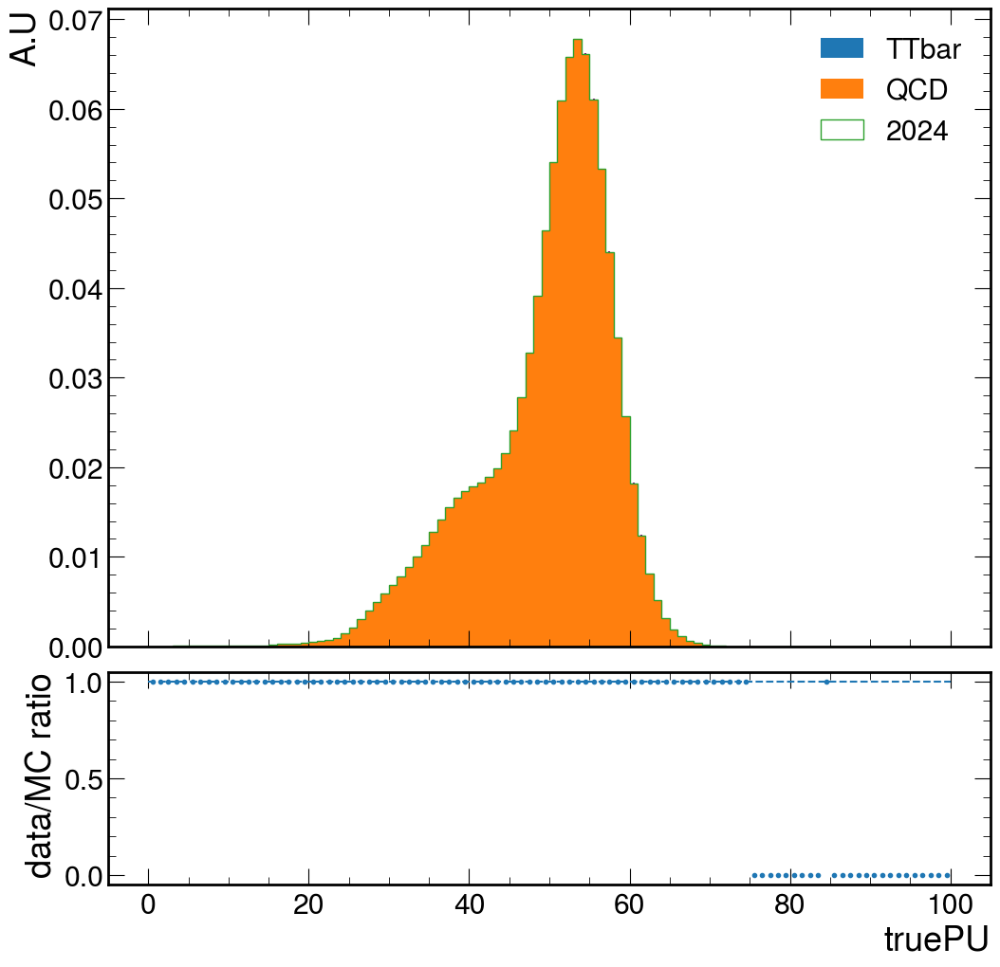

Total runtime: 284.70 seconds


In [8]:
#Pileup Correction Test

import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed

plotDict = {
    #"vertTrack_pt": [0,5,101],# "vertTrack_eta": [-3,3,101], "vertTrack_phi": [-3.142,3.142,101],
    #"vertTrack_reducedChi2": [0,7,51], "vertTrack_dxy": [0,0.3,51], "vertTrack_dxyErr": [0,0.05,101], "vertTrack_dxySig": [0,50,101],
    #"vertTrack_nValidPixelHits": [0,13,14], "vertTrack_nTrackerLayersWithMeasurement": [0,21,22],
    #"vertTrack_nValidStripHits": [0,32,33], 
    #"vertTrack_shiftZErr": [0,0.05,51], "vertTrack_shiftZValue": [0,0.05,101],
    #"vertTrack_shift3DErr": [0,0.05,51], "vertTrack_shift3DValue": [0,0.1,101],
    #"scoutVert_dBV": [0,3,101],# "scoutVert_dBVErr": [0,0.1,101],
    #"vertTrack_nMissingInnerHits": [0,5,6], 
    #"scoutVert_nTracks": [0,40,41], "scoutVert_chi2": [0,5,50],
    #"scoutVert_dT": [0,0.5,101], "scoutVert_cosT": [-1,1,101], "scoutVert_pMag": [0,500,101],
    #"scoutTrack_phi": [-3.142,3.142,101], "scoutTrack_dxySig": [0,50,101], "scoutTrack_nTrackerLayersWithMeasurement": [0,21,22],
    #"scoutTrack_pt": [0,50,101], "scoutTrack_nValidPixelHits": [0,13,14]
    "truePU": [0,100,101]
}

def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    doWeightSum = False
    genWeightSum = 0
    with uproot.open(rootFile) as file:
        if(process in processDict):
            if (len(processDict[process])>1): doWeightSum = True
        elif(process in signalDict):
            if (len(signalDict[process])>1): doWeightSum = True
        if(doWeightSum):
            output["genWeightSum"] = {process: file["pileupPlot/genWeights"].values()[0]}
        else:
            output["genWeightSum"] = {}
            genWeightSum = file["pileupPlot/genWeights"].values()[0]
        tree = file["pileupPlot/objectTree"]

        # Select only necessary branches to load
        branches = list(plotDict.keys()) + ["weight"]
        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        correctionArray = np.load("PURatio_Full2024.npy")
        for batch in tree.iterate(branches, library="ak", step_size=10000):  
            weights = batch["weight"]  # normalize event weights
            if(not doWeightSum): weights = weights / genWeightSum
            if(process in processDict):
                PU = batch["truePU"]
                PU_binned = np.digitize(PU,np.linspace(0,100,101))
                PU_binned = PU_binned - 1
                correction = correctionArray[PU_binned]
                weights = weights * correction
            for plot, binning in plotDict.items():
                bins = np.linspace(binning[0], binning[1], binning[2])
                data = batch[plot]
                # Apply displacement cut
                if "vertTrack_shift" in plot:
                    mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.1) & (batch["vertTrack_shiftZValue"] > -900)
                elif "vertTrack" in plot:
                    #mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.1)  & (batch["vertTrack_dxySig"] > 5) & (batch["vertTrack_pt"] > 1.0) & (batch["vertTrack_nValidPixelHits"] > 1)
                    mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.01)
                elif "scoutVert" in plot:
                    mask = (batch["scoutVert_dBV"] >= 0.01)
                elif "scoutTrack" in plot:
                    mask = (batch["scoutTrack_dxySig"] > 5) & (batch["scoutTrack_pt"] > 1.0) & (batch["scoutTrack_nValidPixelHits"] > 1) & (batch["scoutTrack_nTrackerLayersWithMeasurement"] > 5)
                else:
                    mask = ak.ones_like(data, dtype=bool)
                data = data[mask]
                #mask = ak.sum(mask,axis=1)>1
                #data = data[mask]
                #maskedWeights = weights[mask]
                broadcastWeights, data = ak.broadcast_arrays(weights,data)
                # Apply mask and flatten data
                data = ak.flatten(data,axis=None)
                data = np.clip(data,bins[0],bins[-1])
                weights_filtered = ak.flatten(broadcastWeights,axis=None)
                # Compute histograms
                n, _ = np.histogram(data, weights=weights_filtered, bins=bins)
                n_2, _ = np.histogram(data, weights=weights_filtered**2, bins=bins)
                if plot not in output:
                    output[plot] = {process: n}
                    output[f"{plot}_squared"] = {process: n_2}
                else:
                    output[plot][process] = output[plot][process] + n
                    output[f"{plot}_squared"][process] = output[f"{plot}_squared"][process] + n_2
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        results[plot][process] = results[plot].get(process, 0) + result[plot][process]

    return results

t0 = time.time()

bgPlotWeights = parallel_processing(processDict)
sigPlotWeights = parallel_processing(signalDict)

#Combining Background Subprocesses and Reweighting Events
for plot in plotDict.keys():
    for process in bgPlotWeights["genWeightSum"].keys():
        bgPlotWeights[plot][process] = bgPlotWeights[plot][process] / bgPlotWeights["genWeightSum"][process]
        bgPlotWeights[f"{plot}_squared"][process] = bgPlotWeights[f"{plot}_squared"][process] / (bgPlotWeights["genWeightSum"][process]**2)
    bgPlotWeights[plot]["QCD"] = bgPlotWeights[plot]["QCD40to70"]+bgPlotWeights[plot]["QCD70to100"]+bgPlotWeights[plot]["QCD100to200"]+bgPlotWeights[plot]["QCD200to400"]+bgPlotWeights[plot]["QCD400to600"]+bgPlotWeights[plot]["QCD600to800"]+bgPlotWeights[plot]["QCD800to1000"]+bgPlotWeights[plot]["QCD1000to1200"]+bgPlotWeights[plot]["QCD1200to1500"]+bgPlotWeights[plot]["QCD1500to2000"]+bgPlotWeights[plot]["QCD2000"]
    bgPlotWeights[f"{plot}_squared"]["QCD"] = bgPlotWeights[f"{plot}_squared"]["QCD40to70"]+bgPlotWeights[f"{plot}_squared"]["QCD70to100"]+bgPlotWeights[f"{plot}_squared"]["QCD100to200"]+bgPlotWeights[f"{plot}_squared"]["QCD200to400"]+bgPlotWeights[f"{plot}_squared"]["QCD400to600"]+bgPlotWeights[f"{plot}_squared"]["QCD600to800"]+bgPlotWeights[f"{plot}_squared"]["QCD800to1000"]+bgPlotWeights[f"{plot}_squared"]["QCD1000to1200"]+bgPlotWeights[f"{plot}_squared"]["QCD1200to1500"]+bgPlotWeights[f"{plot}_squared"]["QCD1500to2000"]+bgPlotWeights[f"{plot}_squared"]["QCD2000"]
    bgPlotWeights[plot]["TTbar"] = bgPlotWeights[plot]["TTTo4Q"]+bgPlotWeights[plot]["TTToLNu2Q"]
    bgPlotWeights[f"{plot}_squared"]["TTbar"] = bgPlotWeights[f"{plot}_squared"]["TTTo4Q"]+bgPlotWeights[f"{plot}_squared"]["TTToLNu2Q"]

# **Plotting**
for plot, binning in plotDict.items():
    if plot not in bgPlotWeights:
        print(f"Skipping {plot} (no data).")
        continue

    bins = np.linspace(binning[0], binning[1], binning[2])
    bgIntegral = (bins[1] - bins[0]) * sum(bgPlotWeights[plot]["QCD"] + bgPlotWeights[plot]["TTbar"])

    fig, (ax, rax) = plt.subplots(2, 1, figsize=[12,12], gridspec_kw={"height_ratios": [3,1]}, sharex=True)
    fig.subplots_adjust(hspace=0.06)
    ax.hist([(bins[:-1] + bins[1:]) / 2]*2,weights=[list(bgPlotWeights[plot]["TTbar"]),list(bgPlotWeights[plot]["QCD"])],
            stacked=True, density=True, label=["TTbar","QCD"], bins=bins)

    bgValues = (bgPlotWeights[plot]["QCD"] / bgIntegral) + (bgPlotWeights[plot]["TTbar"] / bgIntegral)
    bgErrors = np.sqrt(bgPlotWeights[f"{plot}_squared"]["QCD"] / (bgIntegral**2) + \
               bgPlotWeights[f"{plot}_squared"]["TTbar"] / (bgIntegral**2))
    #bgValues = np.nan_to_num(bgValues)
    #bgErrors = np.nan_to_num(bgErrors)
    ax.errorbar(((bins[:-1] + bins[1:]) / 2), bgValues, yerr=bgErrors, linestyle="none", color="purple")
    
    colors = {"Stop-M200-cT10": "black", "Stop-M400-cT10": "red", "Stop-M600-cT10": "blue", "Stop-M800-cT10": "green"}
    #colors = {"Hto2Sto4D-cT10-MS1": "black", "Hto2Sto4D-cT10-MS15": "red", "Hto2Sto4D-cT10-MS30": "blue", "Hto2Sto4D-cT10-MS55": "green"}
    with uproot.open("/eos/cms/store/group/phys_exotica/DVScouting/ScoutingPFRun3/PU/2024_TruePU.root") as dataFile:
        dataPU = dataFile["pileup"].values()
        integral = (bins[1] - bins[0]) * sum(dataPU)
        ax.hist((bins[:-1] + bins[1:]) / 2,weights=dataPU, density=True, label=["2024"], bins=bins,histtype="step")
        dataValues = dataPU / integral
        ratioValues = dataValues / bgValues
        ratioValues = np.nan_to_num(ratioValues,posinf=0)
        rax.scatter(((bins[:-1] + bins[1:]) / 2), ratioValues, marker=".")

    rax.hlines(1, bins[0], bins[-1], linestyle="dashed")
    rax.set_ylabel("data/MC ratio")
    ax.set_ylabel("A.U")
    plt.xlabel(plot)
    ax.legend()
    #ax.set_yscale("log")
    #rax.set_yscale("log")
    plt.show()
    
t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")

Processing /eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v18-4TrackMin-5DxyMin/250902_192505/TTto4Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v18-4TrackMin-5DxyMin/250902_192703/QCD-4Jets_Bin-HT-40to70.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v18-4TrackMin-5DxyMin/250902_192615/QCD-4Jets_Bin-HT-200to400.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v18-4TrackMin-5DxyMin/250902_192515/TTtoLNu2Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v18-4TrackMin-5DxyMin/250902_192651/QCD-4Jets_Bin-HT-800to1000.root

Processing /eos/cms/store/group/phys_exot

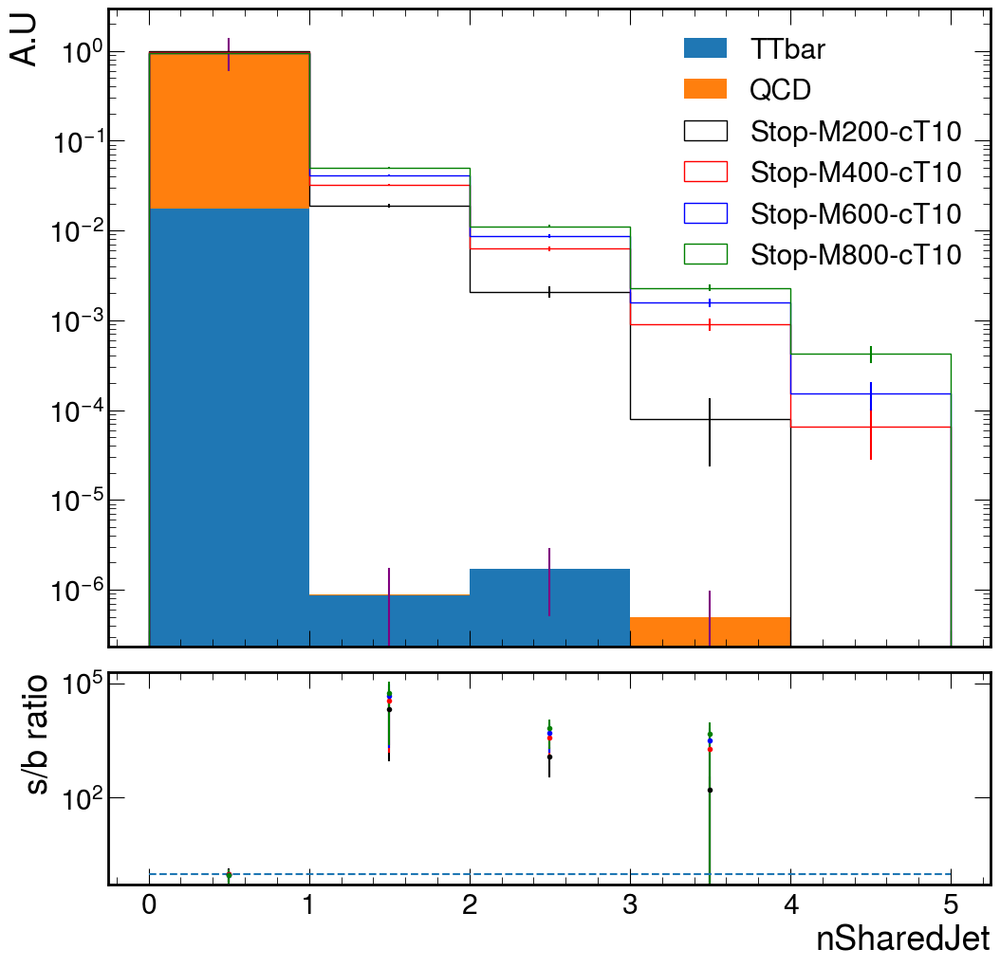

Total runtime: 33.77 seconds


In [8]:
#Shared jet script

import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed

plotDict = {"nSharedJet": [0,5,6]}

def count_multivertex_jets(jet_indices, vertex_indices):
    """
    Count jets associated with multiple vertices via their tracks.
    """
    counts = []
    
    for event_jets, event_verts in zip(jet_indices, vertex_indices):
        if len(event_jets) == 0:
            counts.append(0)
            continue
            
        # Convert to numpy for this event
        jets = ak.to_numpy(event_jets)
        verts = ak.to_numpy(event_verts)
        
        # Get unique jets
        unique_jets = np.unique(jets)
        
        # Count jets with multiple vertices
        multi_vertex_count = 0
        for jet in unique_jets:
            jet_vertices = verts[jets == jet]
            if len(np.unique(jet_vertices)) > 1:
                multi_vertex_count += 1
                
        counts.append(multi_vertex_count)
    
    return ak.Array(counts)

def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    doWeightSum = False
    genWeightSum = 0
    with uproot.open(rootFile) as file:
        if(process in processDict):
            if (len(processDict[process])>1): doWeightSum = True
        elif(process in signalDict):
            if (len(signalDict[process])>1): doWeightSum = True
        if(doWeightSum):
            output["genWeightSum"] = {process: file["triggerFilter/genWeightsSkim"].values()[0]}
        else:
            output["genWeightSum"] = {}
            genWeightSum = file["triggerFilter/genWeightsSkim"].values()[0]
        tree = file["scoutingTree/objectTree"]

        # Select only necessary branches to load
        branches = ["vertTrack_iVtx", "weight","scoutVert_dBV","vertTrack_iJet","jet_eta","scoutVert_nTracks"]
        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        for batch in tree.iterate(branches, library="ak", step_size=10000):  
            weights = batch["weight"]  # normalize event weights
            if(not doWeightSum): weights = weights / genWeightSum

            for plot, binning in plotDict.items():
                bins = np.linspace(binning[0], binning[1], binning[2])
                iVtx = batch["vertTrack_iVtx"]
                iJet = batch["vertTrack_iJet"]
                mask = (batch["scoutVert_dBV"][iVtx] >= 0.01) & (batch["scoutVert_dBV"][iVtx] < 2.0) #& (batch["scoutVert_nTracks"][iVtx] > 7)
                iVtx = iVtx[mask]
                iJet = iJet[mask]
                mask = (abs(batch["jet_eta"][iJet]) < 2.5)
                iVtx = iVtx[mask]
                iJet = iJet[mask]
                data = count_multivertex_jets(iJet,iVtx)
                broadcastWeights, data = ak.broadcast_arrays(weights,data)
                # Apply mask and flatten data
                data = ak.flatten(data,axis=None)
                data = np.clip(data,bins[0],bins[-1])
                weights_filtered = ak.flatten(broadcastWeights,axis=None)
                # Compute histograms
                n, _ = np.histogram(data, weights=weights_filtered, bins=bins)
                n_2, _ = np.histogram(data, weights=weights_filtered**2, bins=bins)
                if plot not in output:
                    output[plot] = {process: n}
                    output[f"{plot}_squared"] = {process: n_2}
                else:
                    output[plot][process] = output[plot][process] + n
                    output[f"{plot}_squared"][process] = output[f"{plot}_squared"][process] + n_2
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        results[plot][process] = results[plot].get(process, 0) + result[plot][process]

    return results

t0 = time.time()

bgPlotWeights = parallel_processing(processDict)
sigPlotWeights = parallel_processing(signalDict)

#Combining Background Subprocesses and Reweighting Events
for plot in plotDict.keys():
    for process in bgPlotWeights["genWeightSum"].keys():
        bgPlotWeights[plot][process] = bgPlotWeights[plot][process] / bgPlotWeights["genWeightSum"][process]
        bgPlotWeights[f"{plot}_squared"][process] = bgPlotWeights[f"{plot}_squared"][process] / (bgPlotWeights["genWeightSum"][process]**2)
    bgPlotWeights[plot]["QCD"] = bgPlotWeights[plot]["QCD40to70"]+bgPlotWeights[plot]["QCD70to100"]+bgPlotWeights[plot]["QCD100to200"]+bgPlotWeights[plot]["QCD200to400"]+bgPlotWeights[plot]["QCD400to600"]+bgPlotWeights[plot]["QCD600to800"]+bgPlotWeights[plot]["QCD800to1000"]+bgPlotWeights[plot]["QCD1000to1200"]+bgPlotWeights[plot]["QCD1200to1500"]+bgPlotWeights[plot]["QCD1500to2000"]+bgPlotWeights[plot]["QCD2000"]
    bgPlotWeights[f"{plot}_squared"]["QCD"] = bgPlotWeights[f"{plot}_squared"]["QCD40to70"]+bgPlotWeights[f"{plot}_squared"]["QCD70to100"]+bgPlotWeights[f"{plot}_squared"]["QCD100to200"]+bgPlotWeights[f"{plot}_squared"]["QCD200to400"]+bgPlotWeights[f"{plot}_squared"]["QCD400to600"]+bgPlotWeights[f"{plot}_squared"]["QCD600to800"]+bgPlotWeights[f"{plot}_squared"]["QCD800to1000"]+bgPlotWeights[f"{plot}_squared"]["QCD1000to1200"]+bgPlotWeights[f"{plot}_squared"]["QCD1200to1500"]+bgPlotWeights[f"{plot}_squared"]["QCD1500to2000"]+bgPlotWeights[f"{plot}_squared"]["QCD2000"]
    bgPlotWeights[plot]["TTbar"] = bgPlotWeights[plot]["TTTo4Q"]+bgPlotWeights[plot]["TTToLNu2Q"]
    bgPlotWeights[f"{plot}_squared"]["TTbar"] = bgPlotWeights[f"{plot}_squared"]["TTTo4Q"]+bgPlotWeights[f"{plot}_squared"]["TTToLNu2Q"]
for plot in plotDict.keys():
    for process in sigPlotWeights["genWeightSum"].keys():
        sigPlotWeights[plot][process] = sigPlotWeights[plot][process] / sigPlotWeights["genWeightSum"][process]
        sigPlotWeights[f"{plot}_squared"][process] = sigPlotWeights[f"{plot}_squared"][process] / (sigPlotWeights["genWeightSum"][process]**2)

# **Plotting**
for plot, binning in plotDict.items():
    if plot not in bgPlotWeights:
        print(f"Skipping {plot} (no data).")
        continue

    bins = np.linspace(binning[0], binning[1], binning[2])
    bgIntegral = (bins[1] - bins[0]) * sum(bgPlotWeights[plot]["QCD"] + bgPlotWeights[plot]["TTbar"])

    fig, (ax, rax) = plt.subplots(2, 1, figsize=[12,12], gridspec_kw={"height_ratios": [3,1]}, sharex=True)
    fig.subplots_adjust(hspace=0.06)
    ax.hist([(bins[:-1] + bins[1:]) / 2]*2,weights=[list(bgPlotWeights[plot]["TTbar"]),list(bgPlotWeights[plot]["QCD"])],
            stacked=True, density=True, label=["TTbar","QCD"], bins=bins)

    bgValues = (bgPlotWeights[plot]["QCD"] / bgIntegral) + (bgPlotWeights[plot]["TTbar"] / bgIntegral)
    bgErrors = np.sqrt(bgPlotWeights[f"{plot}_squared"]["QCD"] / (bgIntegral**2) + \
               bgPlotWeights[f"{plot}_squared"]["TTbar"] / (bgIntegral**2))
    #bgValues = np.nan_to_num(bgValues)
    #bgErrors = np.nan_to_num(bgErrors)
    ax.errorbar(((bins[:-1] + bins[1:]) / 2), bgValues, yerr=bgErrors, linestyle="none", color="purple")
    
    colors = {"Stop-M200-cT10": "black", "Stop-M400-cT10": "red", "Stop-M600-cT10": "blue", "Stop-M800-cT10": "green"}
    #colors = {"Hto2Sto4D-cT10-MS1": "black", "Hto2Sto4D-cT10-MS15": "red", "Hto2Sto4D-cT10-MS30": "blue", "Hto2Sto4D-cT10-MS55": "green"}
    for signal, color in colors.items():
        if plot not in sigPlotWeights or signal not in sigPlotWeights[plot]:
            print(f"Skipping {signal} in {plot} (no data).")
            continue

        integral = (bins[1] - bins[0]) * sum(sigPlotWeights[plot][signal])
        ax.hist(((bins[:-1] + bins[1:]) / 2), weights=list(sigPlotWeights[plot][signal]),
                stacked=False, density=True, label=signal, bins=bins, histtype="step", color=color)

        sigValues = sigPlotWeights[plot][signal] / integral
        sigErrors = np.sqrt(sigPlotWeights[f"{plot}_squared"][signal] / (integral**2))

        ax.errorbar(((bins[:-1] + bins[1:]) / 2), sigValues, yerr=sigErrors, linestyle="none", color=color)
        ratioValues = sigValues / bgValues
        ratioErrors = ratioValues * np.sqrt((sigErrors / sigValues)**2 + (bgErrors / bgValues)**2)
        #ratioValues = np.nan_to_num(ratioValues)
        #ratioErrors = np.nan_to_num(ratioErrors)
        rax.errorbar(((bins[:-1] + bins[1:]) / 2), ratioValues, yerr=ratioErrors, linestyle="none", color=color, marker=".")

    rax.hlines(1, bins[0], bins[-1], linestyle="dashed")
    rax.set_ylabel("s/b ratio")
    ax.set_ylabel("A.U")
    plt.xlabel(plot)
    ax.legend()
    ax.set_yscale("log")
    rax.set_yscale("log")
    plt.show()

t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")


In [27]:
with uproot.open("/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v15-125M/250723_150653/TTto4Q.root") as file:
    tree = file["scoutingTree/objectTree"]
    for batch in tree.iterate(["eventId","scoutVert_nTracks","runNumber","lumiBlock"], library="ak", step_size=10000):
        eventId = batch["eventId"]
        runNumber = batch["runNumber"]
        lumi = batch["lumiBlock"]
        ntracks = batch["scoutVert_nTracks"]
        mask = (eventId==336552124)
        if(ak.sum(mask,axis=0)>0):
            print("event",eventId[mask],"run",runNumber[mask],"lumi",lumi[mask])

event [336552124] run [1] lumi [456652]


In [4]:
#Cutflow table script with jet veto and vetoing tracks matched to vetoed jets
doPercents = False
bin_namesCustom = ["8Tracks","JetVeto","TrackVeto8Tracks"]

def fast_count_vertices_numpy(ivtxMasked, dBV):
    result = []
    for ind_event, dBV_event in zip(ivtxMasked, dBV):
        counts = np.zeros(len(dBV_event), dtype=int)
        np.add.at(counts, np.array(ind_event), 1)
        result.append(counts)
    return ak.Array(result)

def process_cutflows(args):
    """ Process a single ROOT file in chunks using uproot.iterate() """
    rootFile, process = args
    print(f"Processing {rootFile}")

    with uproot.open("/afs/cern.ch/user/r/rmccarth/private/scouting/CMSSW_14_0_18_patch1/src/Run3ScoutingAnalysisTools/Summer24Prompt24_RunBCDEFGHI.root") as file:
        jetVetoMap = file["jetvetomap"]
        jetVetoMapXBins = jetVetoMap.to_numpy()[1]
        jetVetoMapYBins = jetVetoMap.to_numpy()[2]
        jetVetoMap = jetVetoMap.to_numpy()[0]
    output = {}
    with uproot.open(rootFile) as file:
        output[process] = {}
        output[process+"_squared"] = {}
        output[process+"_nEvents"] = {}
        tree = file["scoutingTree/objectTree"]

        # Select only necessary branches to load
        branches = ["scoutVert_dBV","scoutVert_dBVErr", "scoutVert_nTracks","weight","jet_eta","jet_phi","eventId","jet_passJetIdTight","jet_pt","jet_chEmEF","jet_neEmEF","vertTrack_iJet","vertTrack_iVtx","truePU","jet_muonEF"]
        correctionArray = np.load("PURatio_LowHT.npy")
        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        weightSum = [0]*len(bin_namesCustom)
        weightSumSquared = [0] * len(bin_namesCustom)
        numEvents = [0] * len(bin_namesCustom)
        for batch in tree.iterate(branches, library="ak", step_size=100000):  
            weights = batch["weight"]  # event weights
            if((process in processDict) or (process in signalDict)):
                PU = batch["truePU"]
                PU_binned = np.digitize(PU,np.linspace(0,100,101))
                PU_binned = PU_binned - 1
                correction = correctionArray[PU_binned]
                #weights = weights * correction
            data = batch["scoutVert_dBV"]
            ntracks = batch["scoutVert_nTracks"]
            jetEta = batch["jet_eta"]
            jetPhi = batch["jet_phi"]
            jetPt = batch["jet_pt"]
            jetId = batch["jet_passJetIdTight"]
            jetChargedEMFrac = batch["jet_chEmEF"]
            jetNeutralEMFrac = batch["jet_neEmEF"]
            jetMuonEF = batch["jet_muonEF"]
            eventId = batch["eventId"]
            ivtx = batch["vertTrack_iVtx"]
            ijet = batch["vertTrack_iJet"]
            dBVMaxMask = data<2.0
            #data = data[mask]
            #ntracks = ntracks[mask]
            mask = ak.sum(data[dBVMaxMask]>=0.01,axis=1)>0
            weights = weights[mask]
            eventId = eventId[mask]
            data = data[mask]
            dBVMaxMask = dBVMaxMask[mask]
            ntracks = ntracks[mask]
            jetEta = jetEta[mask]
            jetPhi = jetPhi[mask]
            jetPt = jetPt[mask]
            jetId = jetId[mask]
            jetChargedEMFrac = jetChargedEMFrac[mask]
            jetNeutralEMFrac = jetNeutralEMFrac[mask]
            jetMuonEF = jetMuonEF[mask]
            ivtx = ivtx[mask]
            ijet = ijet[mask]
            
            nTrackMask = ntracks > 7
            #data = data[mask]
            mask = ak.sum(data[nTrackMask&dBVMaxMask]>=0.01,axis=1)>0
            weights = weights[mask]
            data = data[mask]
            dBVMaxMask = dBVMaxMask[mask]
            nTrackMask = nTrackMask[mask]
            eventId = eventId[mask]
            jetEta = jetEta[mask]
            jetPhi = jetPhi[mask]
            jetPt = jetPt[mask]
            jetId = jetId[mask]
            jetChargedEMFrac = jetChargedEMFrac[mask]
            jetNeutralEMFrac = jetNeutralEMFrac[mask]
            jetMuonEF = jetMuonEF[mask]
            ivtx = ivtx[mask]
            ijet = ijet[mask]
            weightSum[0] += ak.sum(weights)
            weightSumSquared[0] += ak.sum(weights**2)
            numEvents[0] += ak.num(weights,axis=0)
            
            selectionMask = jetId & ((jetChargedEMFrac+jetNeutralEMFrac)<0.9) & (abs(jetEta)<2.5) & (jetPt>30) & (jetMuonEF < 0.8) & (jetChargedEMFrac < 0.8)
            #Apply jet veto
            x_bins = jetVetoMapXBins
            y_bins = jetVetoMapYBins
            jetEta_n = ak.num(jetEta)
            jetEta = ak.flatten(jetEta)
            jetPhi_n = ak.num(jetPhi)
            jetPhi = ak.flatten(jetPhi)
            jetEta_binned = np.digitize(jetEta,x_bins)
            jetEta_binned = np.clip(jetEta_binned,1,82)
            jetEta_binned = jetEta_binned - 1
            jetPhi_binned = np.digitize(jetPhi,y_bins)
            jetPhi_binned = np.clip(jetPhi_binned,1,72)
            jetPhi_binned = jetPhi_binned - 1
            mask = jetVetoMap[jetEta_binned,jetPhi_binned]
            mask = (mask == 0)
            mask = ak.unflatten(mask,jetEta_n)
            mask = mask & selectionMask
            jetEta = ak.unflatten(jetEta,jetEta_n)
            jetPhi = ak.unflatten(jetPhi,jetPhi_n)
            jetEta = jetEta[mask]
            jetPhi = jetPhi[mask]
            trackVeto = (mask[ijet]) | (ijet==-1)
            ivtx = ivtx[trackVeto]
            ntracksVeto = fast_count_vertices_numpy(ivtx, data)                        
            nTrackVetoMask = (ntracksVeto>7)
            
            mask = ak.num(jetEta,axis=1)>2
            data = data[mask]
            weights = weights[mask]
            eventId = eventId[mask]
            dBVMaxMask = dBVMaxMask[mask]
            nTrackMask = nTrackMask[mask]
            nTrackVetoMask = nTrackVetoMask[mask]
            weightSum[1] += ak.sum(weights)
            weightSumSquared[1] += ak.sum(weights**2)
            numEvents[1] += ak.num(weights,axis=0)
            
            if ak.num(nTrackVetoMask, axis=0) != 0:
                mask = nTrackVetoMask & dBVMaxMask & nTrackMask
            else:
                mask = dBVMaxMask & nTrackMask
            data = data[mask]
            mask = ak.sum(data>=0.01,axis=1)>0
            weights = weights[mask]
            weightSum[2] += ak.sum(weights)
            weightSumSquared[2] += ak.sum(weights**2)
            numEvents[2] += ak.num(weights,axis=0)
        for i in range(len(bin_namesCustom)):
            output[process][bin_namesCustom[i]] = weightSum[i]
            output[process+"_squared"][bin_namesCustom[i]] = weightSumSquared[i]
            output[process+"_nEvents"][bin_namesCustom[i]] = numEvents[i]
        
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    """ Process all ROOT files in parallel and aggregate results """
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_cutflows, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for process in result:
                if process not in results:
                    results[process] = result[process]
                else:
                    for cut in result[process]:
                        results[process][cut] = results[process].get(cut, 0) + result[process][cut]

    return results


# Define LaTeX table header
latex_table = "\\begin{table}[htbp]\n"
latex_table += "\\centering\n"

dict = signalDict | processDict
customWeights = parallel_processing(dict)

firstProcess = True
weightSumDict = {}
weightSquaredSumDict = {}
genWeightSumDict = {}
for process, rootFiles in dict.items():
    firstFile = True
    weightSum = []
    weightSquaredSum = []
    genWeightSum = 0
    for rootFile in rootFiles:
        f = ROOT.TFile.Open(rootFile, "READ")
        h_weightsSkim = f.Get("triggerFilter/weightsSkim")
        h_weightsSquaredSkim = f.Get("triggerFilter/weightsSquaredSkim")
        h_genWeights = f.Get("triggerFilter/genWeightsSkim")
        h_weights = f.Get("scoutingTree/weights")
        h_weightsSquared = f.Get("scoutingTree/weightsSquared")
        
        # Extract content
        n_bins = h_weights.GetNbinsX()
        weights = np.array([h_weights.GetBinContent(i) for i in range(3, n_bins)]) #temp since there are redundant cuts in tree maker, normally would go from 1 to n_bins+1
        bin_names = np.array([h_weights.GetXaxis().GetLabels().At(i-1).GetName() for i in range(3, n_bins)])
        weightsSquared = np.array([h_weightsSquared.GetBinContent(i) for i in range(3, n_bins)])
        
        n_binsSkim = h_weightsSkim.GetNbinsX() 
        weightsSkim = np.array([h_weightsSkim.GetBinContent(i) for i in range(1, n_binsSkim + 1)])
        bin_namesSkim = np.array([h_weightsSkim.GetXaxis().GetLabels().At(i-1).GetName() for i in range(1, n_binsSkim + 1)])
        weightsSquaredSkim = np.array([h_weightsSquaredSkim.GetBinContent(i) for i in range(1, n_binsSkim + 1)])
        genWeights = np.array([h_genWeights.GetBinContent(i) for i in range(1, n_binsSkim + 1)])
        
        if(firstFile and firstProcess):
            latex_table += "\\resizebox{\\textwidth}{!}{\\begin{tabular}{|l|"+(len(bin_names)+len(bin_namesSkim)+len(bin_namesCustom)+2)*"c|"+"}\n"
            latex_table += "\\hline\n"
            latex_table += "Process "
            for name in np.concatenate((bin_namesSkim,bin_names)):
                latex_table += "& {} ".format(name)
                weightSum.append(0)
                weightSquaredSum.append(0)
            for name in bin_namesCustom:
                latex_table += "& {} ".format(name)
            latex_table += "& {} & {} ".format("s/sqrt(s+b)","$\epsilon/(1+\sqrt{B})$")
            latex_table += "\\\\\n"
            latex_table += "\\hline\n"
            firstFile = False
        elif(firstFile):
            for name in np.concatenate((bin_namesSkim,bin_names)):
                weightSum.append(0)
                weightSquaredSum.append(0)
            firstFile = False

        genWeightSum += genWeights[0]
        for i in range(len(weightsSkim)):
            weightSum[i] += weightsSkim[i]
            weightSquaredSum[i] += weightsSquaredSkim[i]
        for i in range(len(weights)):
            weightSum[i+len(weightsSkim)] += weights[i]
            weightSquaredSum[i+len(weightsSkim)] += weightsSquared[i]
    firstProcess = False
    weightSumDict[process] = weightSum
    weightSquaredSumDict[process] = weightSquaredSum
    genWeightSumDict[process] = genWeightSum
      
#Combining Background Subprocesses and Reweighting Events
for process in dict.keys():
    for i in range(len(weightSumDict[process])):
        weightSumDict[process][i] = weightSumDict[process][i] / genWeightSumDict[process]
        weightSquaredSumDict[process][i] = weightSquaredSumDict[process][i] / (genWeightSumDict[process]**2)
    for cut in customWeights[process].keys():
        customWeights[process][cut] = customWeights[process][cut] / genWeightSumDict[process]
        customWeights[process+"_squared"][cut] = customWeights[process+"_squared"][cut] / (genWeightSumDict[process]**2)
weightSumDict["QCD"] = weightSumDict["QCD200to400"]
weightSquaredSumDict["QCD"] = weightSquaredSumDict["QCD200to400"]
weightSumDict["TTbar"] = weightSumDict["TTTo4Q"]
weightSquaredSumDict["TTbar"] = weightSquaredSumDict["TTTo4Q"]
for i in range(len(weightSumDict["QCD"])):
    weightSumDict["QCD"][i] = weightSumDict["QCD40to70"][i]+weightSumDict["QCD70to100"][i]+weightSumDict["QCD100to200"][i]+weightSumDict["QCD"][i]+weightSumDict["QCD400to600"][i]+weightSumDict["QCD600to800"][i]+weightSumDict["QCD800to1000"][i]+weightSumDict["QCD1000to1200"][i]+weightSumDict["QCD1200to1500"][i]+weightSumDict["QCD1500to2000"][i]+weightSumDict["QCD2000"][i]
    weightSquaredSumDict["QCD"][i] = weightSquaredSumDict["QCD40to70"][i]+weightSquaredSumDict["QCD70to100"][i]+weightSquaredSumDict["QCD100to200"][i]+weightSquaredSumDict["QCD"][i]+weightSquaredSumDict["QCD400to600"][i]+weightSquaredSumDict["QCD600to800"][i]+weightSquaredSumDict["QCD800to1000"][i]+weightSquaredSumDict["QCD1000to1200"][i]+weightSquaredSumDict["QCD1200to1500"][i]+weightSquaredSumDict["QCD1500to2000"][i]+weightSquaredSumDict["QCD2000"][i]
    weightSumDict["TTbar"][i] = weightSumDict["TTbar"][i]+weightSumDict["TTToLNu2Q"][i]
    weightSquaredSumDict["TTbar"][i] = weightSquaredSumDict["TTbar"][i]+weightSquaredSumDict["TTToLNu2Q"][i]
customWeights["QCD"] = {}
customWeights["TTbar"] = {}
customWeights["QCD_squared"] = {}
customWeights["TTbar_squared"] = {}
customWeights["QCD_nEvents"] = {}
customWeights["TTbar_nEvents"] = {}
for i in range(len(bin_namesCustom)):
    cut = bin_namesCustom[i]
    customWeights["QCD"][cut] = customWeights["QCD40to70"][cut]+customWeights["QCD70to100"][cut]+customWeights["QCD100to200"][cut]+customWeights["QCD200to400"][cut]+customWeights["QCD400to600"][cut]+customWeights["QCD600to800"][cut]+customWeights["QCD800to1000"][cut]+customWeights["QCD1000to1200"][cut]+customWeights["QCD1200to1500"][cut]+customWeights["QCD1500to2000"][cut]+customWeights["QCD2000"][cut]
    customWeights["QCD_squared"][cut] = customWeights["QCD40to70_squared"][cut]+customWeights["QCD70to100_squared"][cut]+customWeights["QCD100to200_squared"][cut]+customWeights["QCD200to400_squared"][cut]+customWeights["QCD400to600_squared"][cut]+customWeights["QCD600to800_squared"][cut]+customWeights["QCD800to1000_squared"][cut]+customWeights["QCD1000to1200_squared"][cut]+customWeights["QCD1200to1500_squared"][cut]+customWeights["QCD1500to2000_squared"][cut]+customWeights["QCD2000_squared"][cut]
    customWeights["QCD_nEvents"][cut] = customWeights["QCD40to70_nEvents"][cut]+customWeights["QCD70to100_nEvents"][cut]+customWeights["QCD100to200_nEvents"][cut]+customWeights["QCD200to400_nEvents"][cut]+customWeights["QCD400to600_nEvents"][cut]+customWeights["QCD600to800_nEvents"][cut]+customWeights["QCD800to1000_nEvents"][cut]+customWeights["QCD1000to1200_nEvents"][cut]+customWeights["QCD1200to1500_nEvents"][cut]+customWeights["QCD1500to2000_nEvents"][cut]+customWeights["QCD2000_nEvents"][cut]
    customWeights["TTbar"][cut] = customWeights["TTTo4Q"][cut]+customWeights["TTToLNu2Q"][cut]
    customWeights["TTbar_squared"][cut] = customWeights["TTTo4Q_squared"][cut]+customWeights["TTToLNu2Q_squared"][cut]
    customWeights["TTbar_nEvents"][cut] = customWeights["TTTo4Q_nEvents"][cut]+customWeights["TTToLNu2Q_nEvents"][cut]

for process in list(signalDict.keys())+["TTbar","QCD"]:
    print("events passing full selection for process",process,":",customWeights[process+'_nEvents'][bin_namesCustom[-1]])
    latex_table +=  f"{process}"
    for i in range(len(weightSumDict[process])):
        clop_unc = intervals.clopper_pearson_interval(weightSumDict[process][i],weightSumDict[process][0])
        stat_unc = np.sqrt(weightSquaredSumDict[process][i])
        efficiency = weightSumDict[process][i]
        formatString = ".1g"
        if(doPercents):
            efficiency = efficiency / weightSumDict[process][0]
            stat_unc = efficiency * np.sqrt(((stat_unc/weightSumDict[process][i])**2)+((np.sqrt(weightSquaredSumDict[process][0])/weightSumDict[process][0])**2))
        else:
            clop_unc = clop_unc * weightSumDict[process][0]
        if process in ["TTbar","QCD"]:
            formatString = ".2E"
        if(efficiency>0):
            latex_table +=  f" & {efficiency:.3g} $\pm$ {stat_unc:.1g}"
        else:
            latex_table +=  f" & {efficiency:.3g}$^{{+{clop_unc[1]-efficiency:{formatString}}}}_{{-{efficiency-clop_unc[0]:{formatString}}}}$"
    #Custom Cutflows
    for i in range(len(bin_namesCustom)):
        clop_unc = intervals.clopper_pearson_interval(customWeights[process][bin_namesCustom[i]],weightSumDict[process][0])
        stat_unc = np.sqrt(customWeights[process+'_squared'][bin_namesCustom[i]])
        efficiency = customWeights[process][bin_namesCustom[i]]
        formatString = ".1g"
        if(doPercents):
            efficiency = efficiency / weightSumDict[process][0]
            stat_unc = efficiency * np.sqrt(((stat_unc/customWeights[process][bin_namesCustom[i]])**2)+((np.sqrt(weightSquaredSumDict[process][0])/weightSumDict[process][0])**2))
        else:
            clop_unc = clop_unc * weightSumDict[process][0]
        if process in ["TTbar","QCD"] and doPercents:
            formatString = ".2E"
        if(efficiency>0):
            latex_table +=  f" & {efficiency:.3g} $\pm$ {stat_unc:.1g}"
        else:
            latex_table +=  f" & {efficiency:.3g}$^{{+{clop_unc[1]-efficiency:{formatString}}}}_{{-{efficiency-clop_unc[0]:{formatString}}}}$"
    latex_table += "\\\\\n"
    
latex_table += "\\hline\n"
latex_table += "\\end{tabular}}\n"
latex_table += "\\caption{Cutflow table}\n"
latex_table += "\\label{tab:cutflow}\n"
latex_table += "\\end{table}"

#Add sensitivity

splitStrings = latex_table.split("\\hline\n")
processString = splitStrings[2]
substrings = processString.split("\\\\")
final_table = splitStrings[0]+"\\hline\n"+splitStrings[1]+"\\hline\n"
for string in substrings:
    process = string.split(' &')[0]
    process = process.replace('\n','')
    if(process in signalDict):
        if(len(bin_namesCustom)):
            string += f" & {customWeights[process][bin_namesCustom[-1]]/np.sqrt(customWeights[process][bin_namesCustom[-1]]+customWeights['QCD'][bin_namesCustom[-1]]+customWeights['TTbar'][bin_namesCustom[-1]]):.2f} & {(customWeights[process][bin_namesCustom[-1]]/weightSumDict[process][0])/(1+np.sqrt(customWeights['QCD'][bin_namesCustom[-1]]+customWeights['TTbar'][bin_namesCustom[-1]])):.3f}"
        else:
            string += f" & {weightSumDict[process][-1]/np.sqrt(weightSumDict[process][-1]+weightSumDict['QCD'][-1]+weightSumDict['TTbar'][-1]):.3f}" 
    elif(process in ["QCD","TTbar"]):
        string += f" & & "
    final_table += string + "\\\\"
final_table = final_table[:-2]
final_table += "\\hline\n" + splitStrings[3]

print(final_table)

Processing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v18-4TrackMin-5DxyMin/250902_192832/StopStopbarTo2Dbar2D_M-200_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v18-4TrackMin-5DxyMin/250902_192904/StopStopbarTo2Dbar2D_M-400_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v18-4TrackMin-5DxyMin/250902_192843/StopStopbarTo2Dbar2D_M-200_CTau-3mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v18-4TrackMin-5DxyMin/250902_192937/StopStopbarTo2Dbar2D_M-600_CTau-1mm.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Sum

/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-scipy/1.10.1-1e920695ddf0dd59a535e9602f21fe6d/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:694: RuntimeWarning: Error in function boost::math::tgamma<d>(d,d): Series evaluation exceeded %1% iterations, giving up now.
  return _boost._beta_ppf(q, a, b)
/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-scipy/1.10.1-1e920695ddf0dd59a535e9602f21fe6d/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:694: RuntimeWarning: Error in function boost::math::tgamma<d>(d,d): Series evaluation exceeded %1% iterations, giving up now.
  return _boost._beta_ppf(q, a, b)


In [9]:
vertTrack_iJet = ak.Array([[0,1,1],[0,0,1,2],[-1],[]])
vertTrack_iVtx = ak.Array([[0,0,1],[1,0,0,1],[0],[]])
jetmask = ak.Array([[True,True,False],[False,False,True],[False],[]])
data = ak.Array([[0.1,0.2],[0.01,0.05],[0.001],[]])
print(jetmask[vertTrack_iJet])
trackVeto = (jetmask[vertTrack_iJet]) | (vertTrack_iJet==-1)
print("trackVeto",trackVeto)
vertTrack_iVtx = vertTrack_iVtx[(trackVeto)]
ntracksVeto = fast_count_vertices_numpy(vertTrack_iVtx, data) 
print("ntracksVeto",ntracksVeto)
nTrackVetoMask = (ntracksVeto>7)
print(nTrackVetoMask)


[[True, True, True], [False, False, False, True], [False], []]
trackVeto [[True, True, True], [False, False, False, True], [True], []]
ntracksVeto [[2, 1], [0, 1], [1], []]
[[False, False], [False, False], [False], []]


Processing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v21-5DxyMin/251007_212144/StopStopbarTo2Dbar2D_M-200_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Tree_v21-5DxyMin/251007_212203/StopStopbarTo2Dbar2D_M-400_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-3mm_Tree_v21-5DxyMin/251007_212250/StopStopbarTo2Dbar2D_M-800_CTau-3mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-3mm_Tree_v21-5DxyMin/251007_212228/StopStopbarTo2Dbar2D_M-600_CTau-3mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_

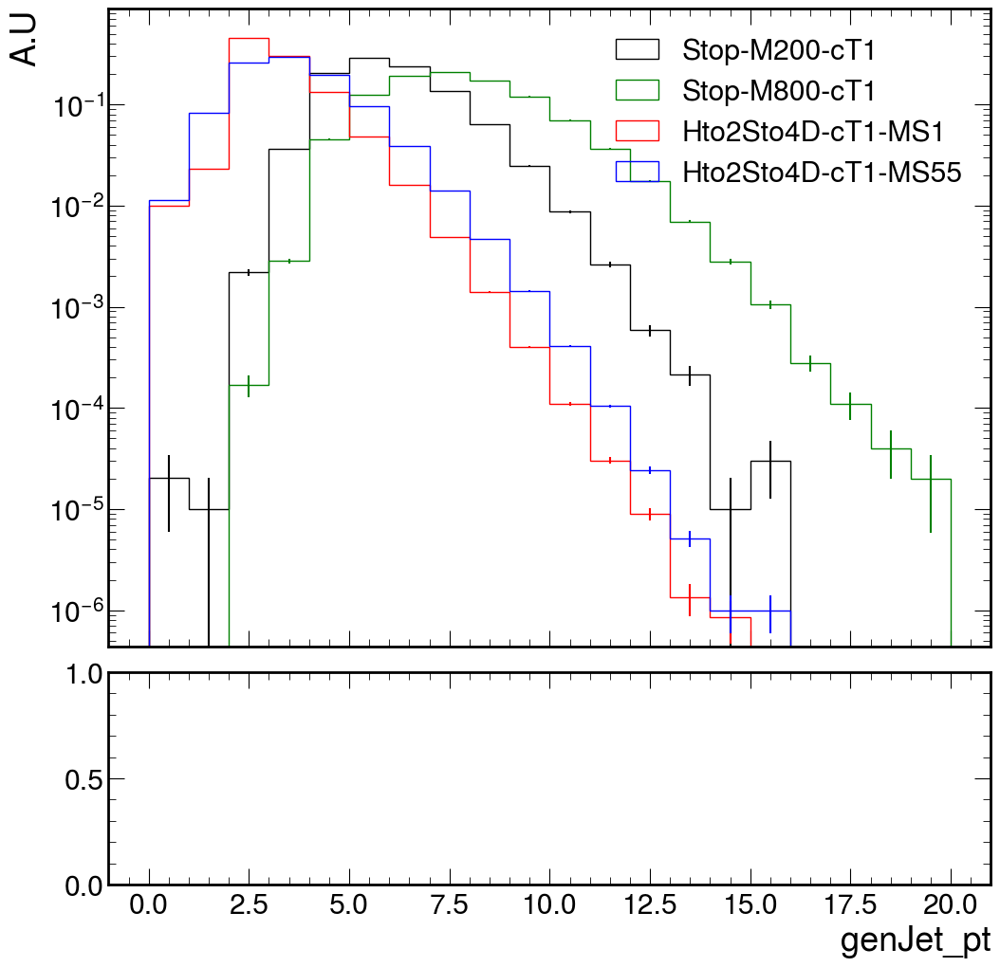

Total runtime: 41.62 seconds


In [13]:
#Comparing Stop Decay and Exotic Higg Decay Branches

import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed

plotDict = {
    "genJet_pt": [0,20,21]#, "genJet_eta": [-3,3,101], "genJet_phi": [-3.142,3.142,101],
    #"genJet_mass": [0,100,101], "genJet_energy": [0,1500,101],
    #"genJet_nConstituents": [0,80,81], 
    #"nGenJets": [0,20,21], "genHT": [0,1500,101]
}

def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    doWeightSum = False
    genWeightSum = 0
    with uproot.open(rootFile) as file:
        if(process in processDict):
            if (len(processDict[process])>1): doWeightSum = True
        elif(process in signalDict):
            if (len(signalDict[process])>1): doWeightSum = True
        if(doWeightSum):
            output["genWeightSum"] = {process: file["triggerFilter/genWeightsSkim"].values()[0]}
        else:
            output["genWeightSum"] = {}
            genWeightSum = file["triggerFilter/genWeightsSkim"].values()[0]
        tree = file["triggerFilter/filterTree"]

        # Select only necessary branches to load
        branches = list(plotDict.keys())+["genJet_eta","nGenJets"]
        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        for batch in tree.iterate(branches, library="ak", step_size=10000):  
            weights = ak.ones_like(batch["nGenJets"])
            for plot, binning in plotDict.items():
                bins = np.linspace(binning[0], binning[1], binning[2])
                data = batch[plot]
                # Apply displacement cut
                if "genJet" in plot:
                    mask = (batch["genJet_pt"]>20) #& (abs(batch["genJet_eta"])<2.5)
                else:
                    mask = ak.ones_like(data, dtype=bool)
                data = data[mask]
                data = ak.num(data,axis=1)
                #mask = ak.sum(mask,axis=1)>1
                #data = data[mask]
                #maskedWeights = weights[mask]
                broadcastWeights, data = ak.broadcast_arrays(weights,data)
                # Apply mask and flatten data
                data = ak.flatten(data,axis=None)
                data = np.clip(data,bins[0],bins[-1])
                weights_filtered = ak.flatten(broadcastWeights,axis=None)
                # Compute histograms
                n, _ = np.histogram(data, weights=weights_filtered, bins=bins)
                n_2, _ = np.histogram(data, weights=weights_filtered**2, bins=bins)
                if plot not in output:
                    output[plot] = {process: n}
                    output[f"{plot}_squared"] = {process: n_2}
                else:
                    output[plot][process] = output[plot][process] + n
                    output[f"{plot}_squared"][process] = output[f"{plot}_squared"][process] + n_2
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        results[plot][process] = results[plot].get(process, 0) + result[plot][process]

    return results

t0 = time.time()

bgPlotWeights = parallel_processing(processDict)
sigPlotWeights = parallel_processing(signalDict)

#Combining Background Subprocesses and Reweighting Events
    
for plot in plotDict.keys():
    for process in sigPlotWeights["genWeightSum"].keys():
        sigPlotWeights[plot][process] = sigPlotWeights[plot][process] / sigPlotWeights["genWeightSum"][process]
        sigPlotWeights[f"{plot}_squared"][process] = sigPlotWeights[f"{plot}_squared"][process] / (sigPlotWeights["genWeightSum"][process]**2)

# **Plotting**
for plot, binning in plotDict.items():

    bins = np.linspace(binning[0], binning[1], binning[2])

    fig, (ax, rax) = plt.subplots(2, 1, figsize=[12,12], gridspec_kw={"height_ratios": [3,1]}, sharex=True)
    fig.subplots_adjust(hspace=0.06)
    
    colors = {"Stop-M200-cT1": "black", "Stop-M800-cT1": "green", "Hto2Sto4D-cT1-MS1": "red", "Hto2Sto4D-cT1-MS55": "blue"}
    #colors = {"Hto2Sto4D-cT10-MS1": "black", "Hto2Sto4D-cT10-MS15": "red", "Hto2Sto4D-cT10-MS30": "blue", "Hto2Sto4D-cT10-MS55": "green"}
    for signal, color in colors.items():
        if plot not in sigPlotWeights or signal not in sigPlotWeights[plot]:
            print(f"Skipping {signal} in {plot} (no data).")
            continue

        integral = (bins[1] - bins[0]) * sum(sigPlotWeights[plot][signal])
        ax.hist(((bins[:-1] + bins[1:]) / 2), weights=list(sigPlotWeights[plot][signal]),
                stacked=False, density=True, label=signal, bins=bins, histtype="step", color=color)

        sigValues = sigPlotWeights[plot][signal] / integral
        sigErrors = np.sqrt(sigPlotWeights[f"{plot}_squared"][signal] / (integral**2))

        ax.errorbar(((bins[:-1] + bins[1:]) / 2), sigValues, yerr=sigErrors, linestyle="none", color=color)
        #ratioValues = sigValues / bgValues
        #ratioErrors = ratioValues * np.sqrt((sigErrors / sigValues)**2 + (bgErrors / bgValues)**2)
        #rax.errorbar(((bins[:-1] + bins[1:]) / 2), ratioValues, yerr=ratioErrors, linestyle="none", color=color, marker=".")

    #rax.hlines(1, bins[0], bins[-1], linestyle="dashed")
    #rax.set_ylabel("s/b ratio")
    ax.set_ylabel("A.U")
    plt.xlabel(plot)
    ax.legend()
    ax.set_yscale("log")
    #rax.set_yscale("log")
    plt.show()

t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")


Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v21-PileupNoSelectionGenWeights/251027_172728/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v21-PileupNoSelectionGenWeights/251027_172717/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v21-PileupNoSelectionGenWeights/251027_172647/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree

/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-awkward/2.1.1-edf8d8121f794c78bb662dab159497fd/lib/python3.9/site-packages/awkward/_backends.py:58: RuntimeWarning: divide by zero encountered in divide
  return getattr(ufunc, method)(*args, **kwargs)


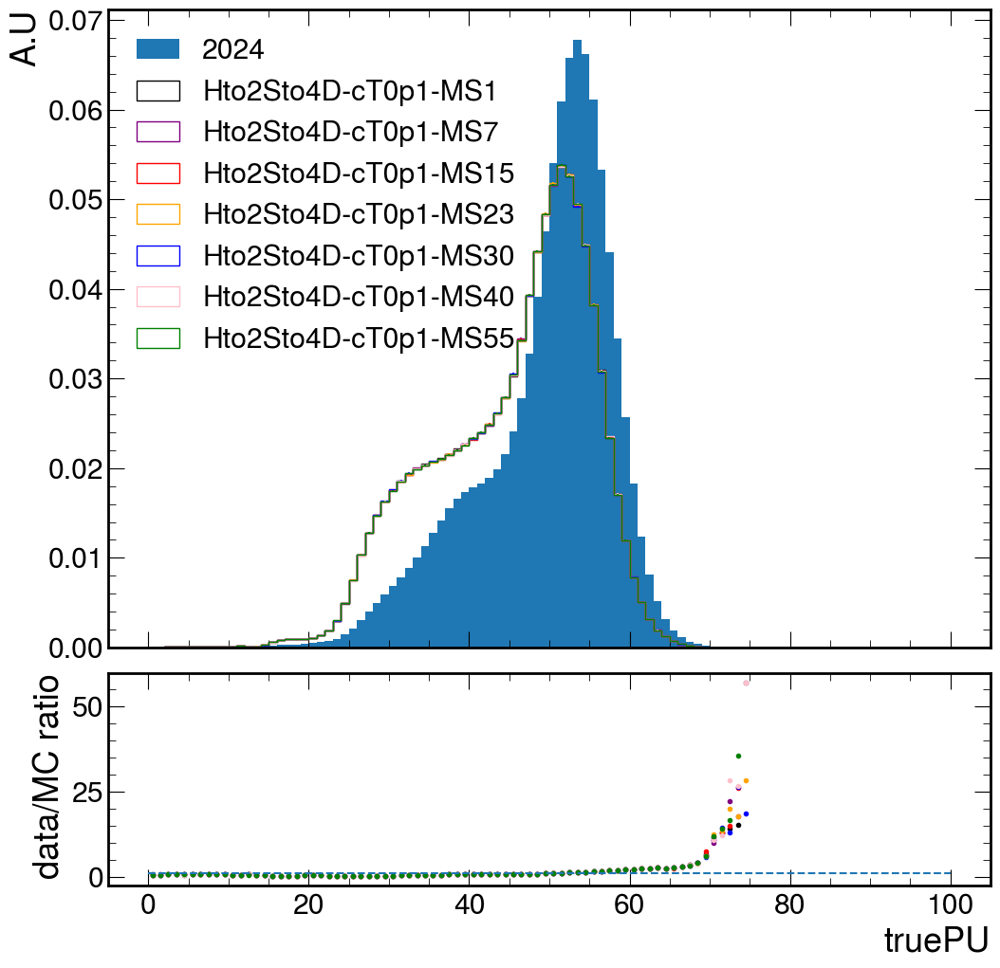

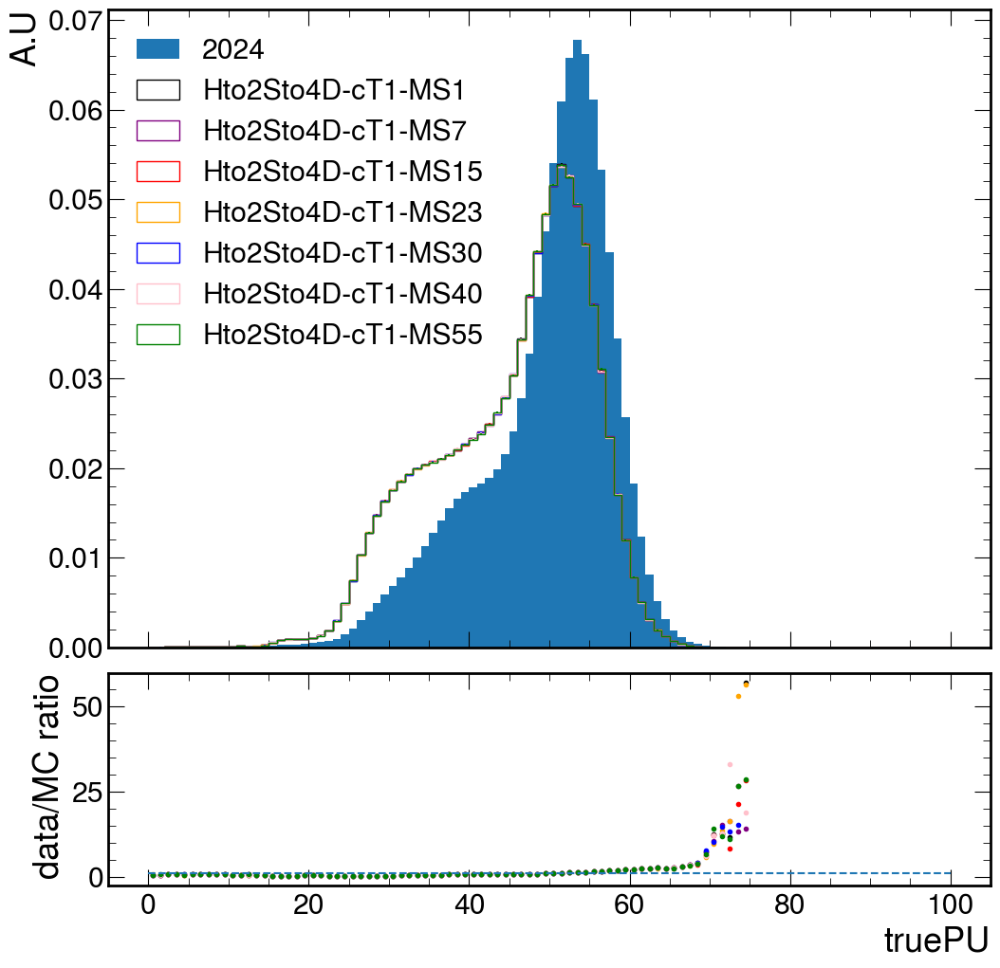

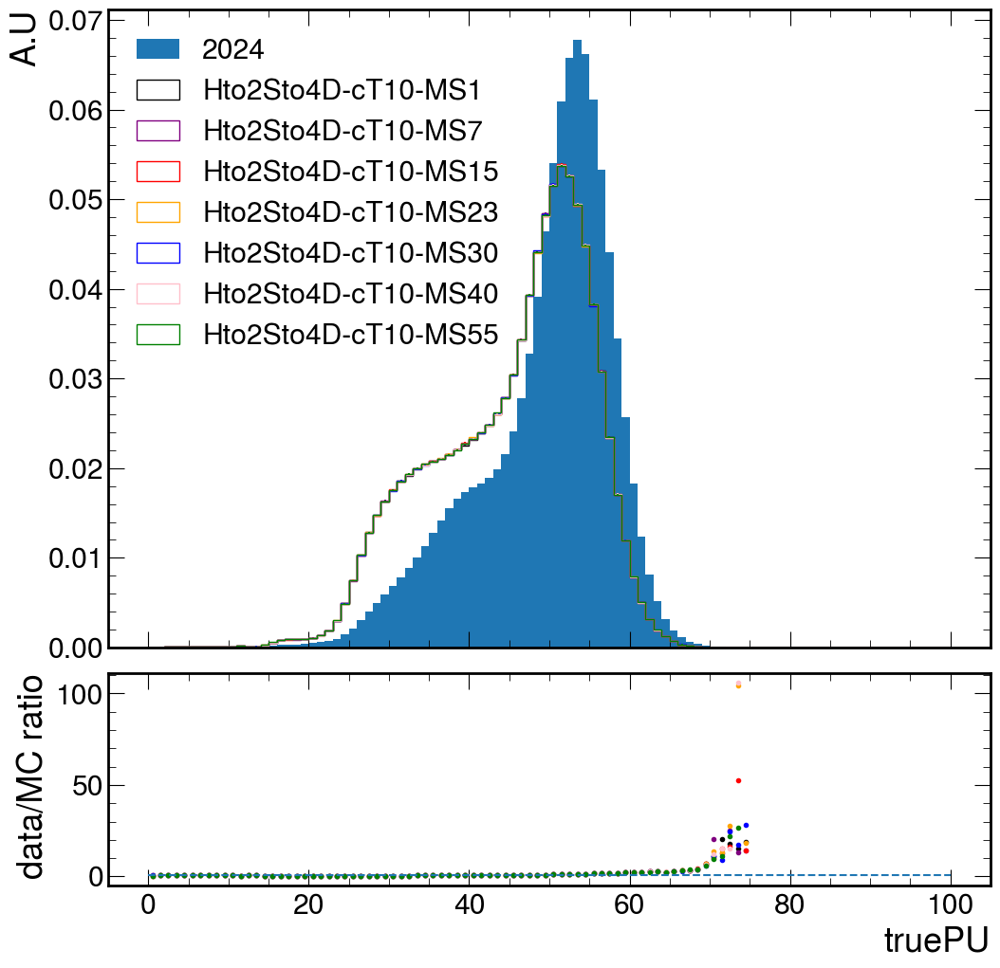

Total runtime: 15.61 seconds


In [9]:
#Signal Pileup Correction Calculation Script

import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed

plotDict = {
    #"vertTrack_pt": [0,5,101],# "vertTrack_eta": [-3,3,101], "vertTrack_phi": [-3.142,3.142,101],
    #"vertTrack_reducedChi2": [0,7,51], "vertTrack_dxy": [0,0.3,51], "vertTrack_dxyErr": [0,0.05,101], "vertTrack_dxySig": [0,50,101],
    #"vertTrack_nValidPixelHits": [0,13,14], "vertTrack_nTrackerLayersWithMeasurement": [0,21,22],
    #"vertTrack_nValidStripHits": [0,32,33], 
    #"vertTrack_shiftZErr": [0,0.05,51], "vertTrack_shiftZValue": [0,0.05,101],
    #"vertTrack_shift3DErr": [0,0.05,51], "vertTrack_shift3DValue": [0,0.1,101],
    #"scoutVert_dBV": [0,3,101],# "scoutVert_dBVErr": [0,0.1,101],
    #"vertTrack_nMissingInnerHits": [0,5,6], 
    #"scoutVert_nTracks": [0,40,41], "scoutVert_chi2": [0,5,50],
    #"scoutVert_dT": [0,0.5,101], "scoutVert_cosT": [-1,1,101], "scoutVert_pMag": [0,500,101],
    #"scoutTrack_phi": [-3.142,3.142,101], "scoutTrack_dxySig": [0,50,101], "scoutTrack_nTrackerLayersWithMeasurement": [0,21,22],
    #"scoutTrack_pt": [0,50,101], "scoutTrack_nValidPixelHits": [0,13,14]
    "truePU": [0,100,101]
}

def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    doWeightSum = False
    genWeightSum = 0
    with uproot.open(rootFile) as file:
        if(process in processDict):
            if (len(processDict[process])>1): doWeightSum = True
        elif(process in signalDict):
            if (len(signalDict[process])>1): doWeightSum = True
        if(doWeightSum):
            output["genWeightSum"] = {process: file["pileupPlot/genWeights"].values()[0]}
        else:
            output["genWeightSum"] = {}
            genWeightSum = file["pileupPlot/genWeights"].values()[0]
        tree = file["pileupPlot/objectTree"]

        # Select only necessary branches to load
        branches = list(plotDict.keys()) + ["weight"]
        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        for batch in tree.iterate(branches, library="ak", step_size=10000):  
            weights = batch["weight"]  # normalize event weights
            if(not doWeightSum): weights = weights / genWeightSum

            for plot, binning in plotDict.items():
                bins = np.linspace(binning[0], binning[1], binning[2])
                data = batch[plot]
                # Apply displacement cut
                if "vertTrack_shift" in plot:
                    mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.1) & (batch["vertTrack_shiftZValue"] > -900)
                elif "vertTrack" in plot:
                    #mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.1)  & (batch["vertTrack_dxySig"] > 5) & (batch["vertTrack_pt"] > 1.0) & (batch["vertTrack_nValidPixelHits"] > 1)
                    mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.01)
                elif "scoutVert" in plot:
                    mask = (batch["scoutVert_dBV"] >= 0.01)
                elif "scoutTrack" in plot:
                    mask = (batch["scoutTrack_dxySig"] > 5) & (batch["scoutTrack_pt"] > 1.0) & (batch["scoutTrack_nValidPixelHits"] > 1) & (batch["scoutTrack_nTrackerLayersWithMeasurement"] > 5)
                else:
                    mask = ak.ones_like(data, dtype=bool)
                data = data[mask]
                #mask = ak.sum(mask,axis=1)>1
                #data = data[mask]
                #maskedWeights = weights[mask]
                broadcastWeights, data = ak.broadcast_arrays(weights,data)
                # Apply mask and flatten data
                data = ak.flatten(data,axis=None)
                data = np.clip(data,bins[0],bins[-1])
                weights_filtered = ak.flatten(broadcastWeights,axis=None)
                # Compute histograms
                n, _ = np.histogram(data, weights=weights_filtered, bins=bins)
                n_2, _ = np.histogram(data, weights=weights_filtered**2, bins=bins)
                if plot not in output:
                    output[plot] = {process: n}
                    output[f"{plot}_squared"] = {process: n_2}
                else:
                    output[plot][process] = output[plot][process] + n
                    output[f"{plot}_squared"][process] = output[f"{plot}_squared"][process] + n_2
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        results[plot][process] = results[plot].get(process, 0) + result[plot][process]

    return results

t0 = time.time()

sigPlotWeights = parallel_processing(signalDict)

for plot in plotDict.keys():
    for process in sigPlotWeights["genWeightSum"].keys():
        sigPlotWeights[plot][process] = sigPlotWeights[plot][process] / sigPlotWeights["genWeightSum"][process]
        sigPlotWeights[f"{plot}_squared"][process] = sigPlotWeights[f"{plot}_squared"][process] / (sigPlotWeights["genWeightSum"][process]**2)

# **Plotting**
for plot, binning in plotDict.items():
    bins = np.linspace(binning[0], binning[1], binning[2])
    for lifetime in ["0p1","1","10"]:
        fig, (ax, rax) = plt.subplots(2, 1, figsize=[12,12], gridspec_kw={"height_ratios": [3,1]}, sharex=True)
        fig.subplots_adjust(hspace=0.06)

        #colors = {"Stop-M200-cT"+lifetime: "black", "Stop-M400-cT"+lifetime: "red", "Stop-M600-cT"+lifetime: "blue", "Stop-M800-cT"+lifetime: "green"}
        colors = {"Hto2Sto4D-cT"+lifetime+"-MS1": "black", "Hto2Sto4D-cT"+lifetime+"-MS7": "purple", "Hto2Sto4D-cT"+lifetime+"-MS15": "red", "Hto2Sto4D-cT"+lifetime+"-MS23": "orange", "Hto2Sto4D-cT"+lifetime+"-MS30": "blue", "Hto2Sto4D-cT"+lifetime+"-MS40": "pink", "Hto2Sto4D-cT"+lifetime+"-MS55": "green"}

        with uproot.open("/eos/cms/store/group/phys_exotica/DVScouting/ScoutingPFRun3/PU/2024_TruePU.root") as dataFile:
            dataPU = dataFile["pileup"].values()
            integral = (bins[1] - bins[0]) * sum(dataPU)
            ax.hist((bins[:-1] + bins[1:]) / 2,weights=dataPU, density=True, label=["2024"], bins=bins,histtype="bar")
            dataValues = dataPU / integral

        for signal, color in colors.items():
            if plot not in sigPlotWeights or signal not in sigPlotWeights[plot]:
                print(f"Skipping {signal} in {plot} (no data).")
                continue

            integral = (bins[1] - bins[0]) * sum(sigPlotWeights[plot][signal])
            ax.hist(((bins[:-1] + bins[1:]) / 2), weights=list(sigPlotWeights[plot][signal]),
                    stacked=False, density=True, label=signal, bins=bins, histtype="step", color=color)

            sigValues = sigPlotWeights[plot][signal] / integral
            sigErrors = np.sqrt(sigPlotWeights[f"{plot}_squared"][signal] / (integral**2))
            ax.errorbar(((bins[:-1] + bins[1:]) / 2), sigValues, yerr=sigErrors, linestyle="none", color=color)
            ratioValues = dataValues / sigValues
            rax.scatter(((bins[:-1] + bins[1:]) / 2), ratioValues, marker=".", color=color)
            np.save(f"{signal}_PURatio_Full2024",ratioValues)

        rax.hlines(1, bins[0], bins[-1], linestyle="dashed")
        rax.set_ylabel("data/MC ratio")
        ax.set_ylabel("A.U")
        plt.xlabel(plot)
        ax.legend()
        #ax.set_yscale("log")
        #rax.set_yscale("log")
        plt.show()
    
t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")

Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1_Tree_v21-PileupNoSelectionGenWeights/251027_172728/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-1.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v21-PileupNoSelectionGenWeights/251027_172734/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v21-PileupNoSelectionGenWeights/251027_172704/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125

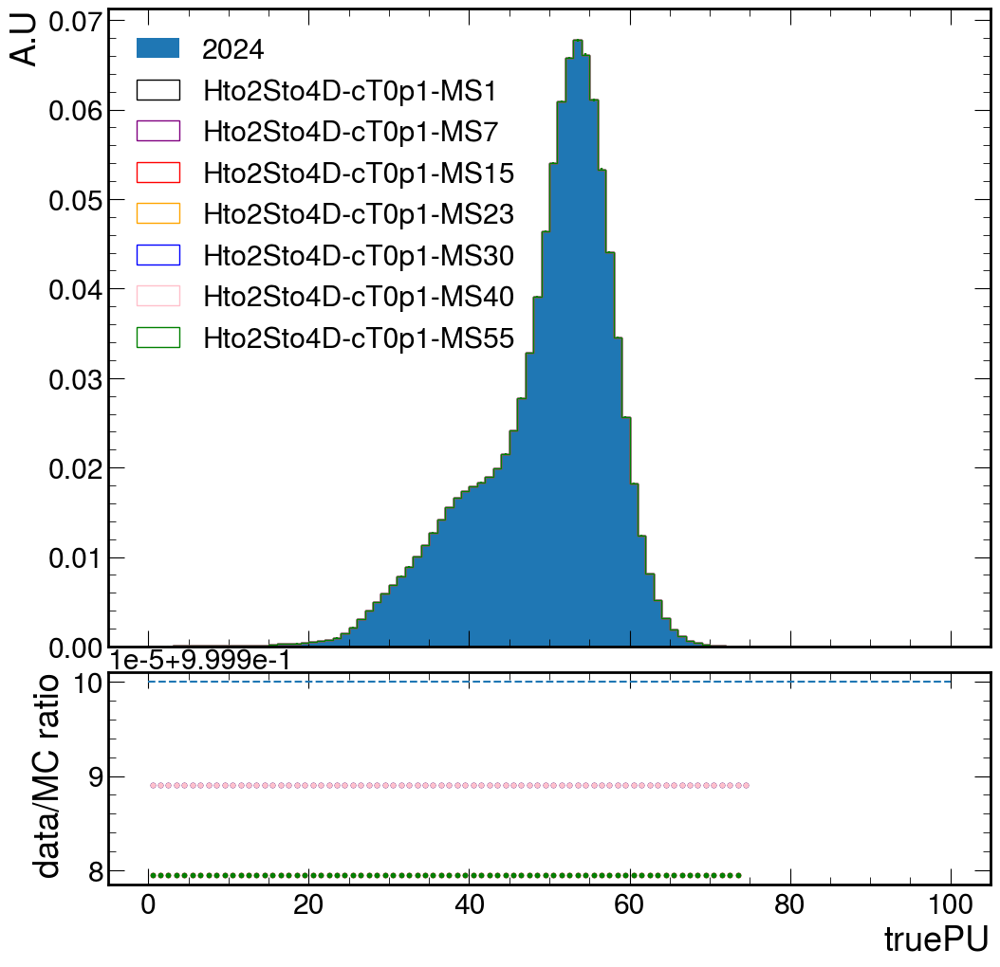

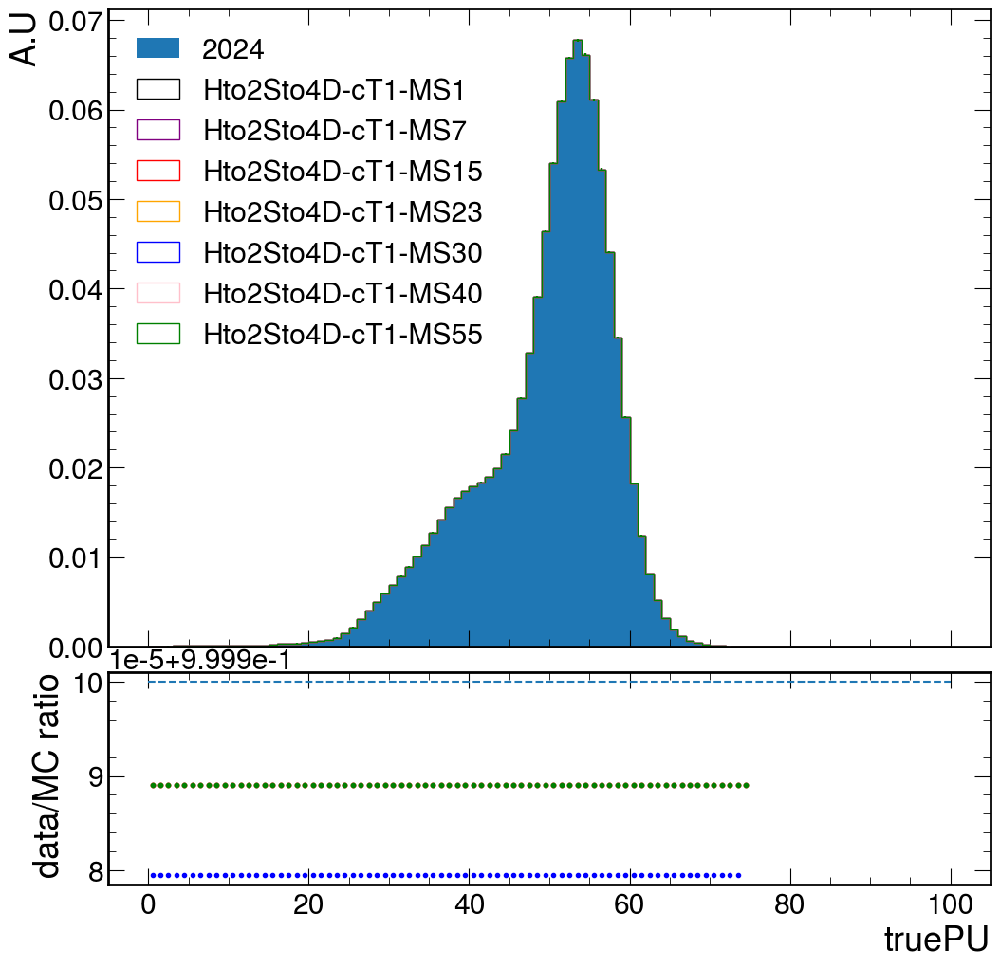

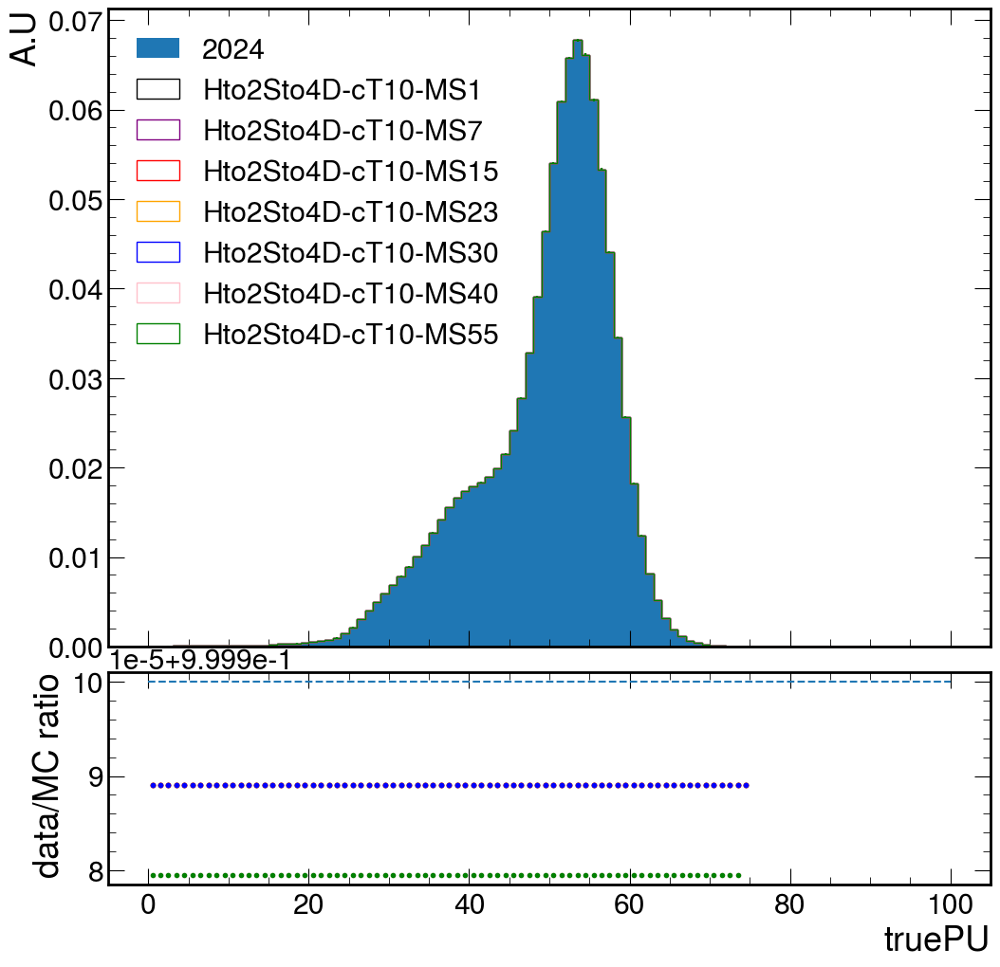

Total runtime: 21.08 seconds


In [10]:
#Signal Pileup Validation

import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed

plotDict = {
    #"vertTrack_pt": [0,5,101],# "vertTrack_eta": [-3,3,101], "vertTrack_phi": [-3.142,3.142,101],
    #"vertTrack_reducedChi2": [0,7,51], "vertTrack_dxy": [0,0.3,51], "vertTrack_dxyErr": [0,0.05,101], "vertTrack_dxySig": [0,50,101],
    #"vertTrack_nValidPixelHits": [0,13,14], "vertTrack_nTrackerLayersWithMeasurement": [0,21,22],
    #"vertTrack_nValidStripHits": [0,32,33], 
    #"vertTrack_shiftZErr": [0,0.05,51], "vertTrack_shiftZValue": [0,0.05,101],
    #"vertTrack_shift3DErr": [0,0.05,51], "vertTrack_shift3DValue": [0,0.1,101],
    #"scoutVert_dBV": [0,3,101],# "scoutVert_dBVErr": [0,0.1,101],
    #"vertTrack_nMissingInnerHits": [0,5,6], 
    #"scoutVert_nTracks": [0,40,41], "scoutVert_chi2": [0,5,50],
    #"scoutVert_dT": [0,0.5,101], "scoutVert_cosT": [-1,1,101], "scoutVert_pMag": [0,500,101],
    #"scoutTrack_phi": [-3.142,3.142,101], "scoutTrack_dxySig": [0,50,101], "scoutTrack_nTrackerLayersWithMeasurement": [0,21,22],
    #"scoutTrack_pt": [0,50,101], "scoutTrack_nValidPixelHits": [0,13,14]
    "truePU": [0,100,101]
}

def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    doWeightSum = False
    genWeightSum = 0
    with uproot.open(rootFile) as file:
        if(process in processDict):
            if (len(processDict[process])>1): doWeightSum = True
        elif(process in signalDict):
            if (len(signalDict[process])>1): doWeightSum = True
        if(doWeightSum):
            output["genWeightSum"] = {process: file["pileupPlot/genWeights"].values()[0]}
        else:
            output["genWeightSum"] = {}
            genWeightSum = file["pileupPlot/genWeights"].values()[0]
        tree = file["pileupPlot/objectTree"]

        # Select only necessary branches to load
        branches = list(plotDict.keys()) + ["weight"]
        if process in processDict:
            correctionArray = np.load("PURatio_Full2024.npy")
        elif process in signalDict:
            correctionString = f"{process}_PURatio_Full2024.npy"
            correctionArray = np.load(correctionString)
        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        for batch in tree.iterate(branches, library="ak", step_size=10000):  
            weights = batch["weight"]  # normalize event weights
            if(not doWeightSum): weights = weights / genWeightSum
            PU = batch["truePU"]
            PU_binned = np.digitize(PU,np.linspace(0,100,101))
            PU_binned = PU_binned - 1
            correction = correctionArray[PU_binned]
            weights = weights * correction
            for plot, binning in plotDict.items():
                bins = np.linspace(binning[0], binning[1], binning[2])
                data = batch[plot]
                # Apply displacement cut
                if "vertTrack_shift" in plot:
                    mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.1) & (batch["vertTrack_shiftZValue"] > -900)
                elif "vertTrack" in plot:
                    #mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.1)  & (batch["vertTrack_dxySig"] > 5) & (batch["vertTrack_pt"] > 1.0) & (batch["vertTrack_nValidPixelHits"] > 1)
                    mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.01)
                elif "scoutVert" in plot:
                    mask = (batch["scoutVert_dBV"] >= 0.01)
                elif "scoutTrack" in plot:
                    mask = (batch["scoutTrack_dxySig"] > 5) & (batch["scoutTrack_pt"] > 1.0) & (batch["scoutTrack_nValidPixelHits"] > 1) & (batch["scoutTrack_nTrackerLayersWithMeasurement"] > 5)
                else:
                    mask = ak.ones_like(data, dtype=bool)
                data = data[mask]
                #mask = ak.sum(mask,axis=1)>1
                #data = data[mask]
                #maskedWeights = weights[mask]
                broadcastWeights, data = ak.broadcast_arrays(weights,data)
                # Apply mask and flatten data
                data = ak.flatten(data,axis=None)
                data = np.clip(data,bins[0],bins[-1])
                weights_filtered = ak.flatten(broadcastWeights,axis=None)
                # Compute histograms
                n, _ = np.histogram(data, weights=weights_filtered, bins=bins)
                n_2, _ = np.histogram(data, weights=weights_filtered**2, bins=bins)
                if plot not in output:
                    output[plot] = {process: n}
                    output[f"{plot}_squared"] = {process: n_2}
                else:
                    output[plot][process] = output[plot][process] + n
                    output[f"{plot}_squared"][process] = output[f"{plot}_squared"][process] + n_2
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        results[plot][process] = results[plot].get(process, 0) + result[plot][process]

    return results

t0 = time.time()

sigPlotWeights = parallel_processing(signalDict)

for plot in plotDict.keys():
    for process in sigPlotWeights["genWeightSum"].keys():
        sigPlotWeights[plot][process] = sigPlotWeights[plot][process] / sigPlotWeights["genWeightSum"][process]
        sigPlotWeights[f"{plot}_squared"][process] = sigPlotWeights[f"{plot}_squared"][process] / (sigPlotWeights["genWeightSum"][process]**2)

# **Plotting**
for plot, binning in plotDict.items():
    bins = np.linspace(binning[0], binning[1], binning[2])
    for lifetime in ["0p1","1","10"]:
        fig, (ax, rax) = plt.subplots(2, 1, figsize=[12,12], gridspec_kw={"height_ratios": [3,1]}, sharex=True)
        fig.subplots_adjust(hspace=0.06)

        #colors = {"Stop-M200-cT"+lifetime: "black", "Stop-M400-cT"+lifetime: "red", "Stop-M600-cT"+lifetime: "blue", "Stop-M800-cT"+lifetime: "green"}
        colors = {"Hto2Sto4D-cT"+lifetime+"-MS1": "black", "Hto2Sto4D-cT"+lifetime+"-MS7": "purple", "Hto2Sto4D-cT"+lifetime+"-MS15": "red", "Hto2Sto4D-cT"+lifetime+"-MS23": "orange", "Hto2Sto4D-cT"+lifetime+"-MS30": "blue", "Hto2Sto4D-cT"+lifetime+"-MS40": "pink", "Hto2Sto4D-cT"+lifetime+"-MS55": "green"}

        with uproot.open("/eos/cms/store/group/phys_exotica/DVScouting/ScoutingPFRun3/PU/2024_TruePU.root") as dataFile:
            dataPU = dataFile["pileup"].values()
            integral = (bins[1] - bins[0]) * sum(dataPU)
            ax.hist((bins[:-1] + bins[1:]) / 2,weights=dataPU, density=True, label=["2024"], bins=bins,histtype="bar")
            dataValues = dataPU / integral

        for signal, color in colors.items():
            if plot not in sigPlotWeights or signal not in sigPlotWeights[plot]:
                print(f"Skipping {signal} in {plot} (no data).")
                continue

            integral = (bins[1] - bins[0]) * sum(sigPlotWeights[plot][signal])
            ax.hist(((bins[:-1] + bins[1:]) / 2), weights=list(sigPlotWeights[plot][signal]),
                    stacked=False, density=True, label=signal, bins=bins, histtype="step", color=color)

            sigValues = sigPlotWeights[plot][signal] / integral
            sigErrors = np.sqrt(sigPlotWeights[f"{plot}_squared"][signal] / (integral**2))
            ax.errorbar(((bins[:-1] + bins[1:]) / 2), sigValues, yerr=sigErrors, linestyle="none", color=color)
            ratioValues = dataValues / sigValues
            rax.scatter(((bins[:-1] + bins[1:]) / 2), ratioValues, marker=".", color=color)

        rax.hlines(1, bins[0], bins[-1], linestyle="dashed")
        rax.set_ylabel("data/MC ratio")
        ax.set_ylabel("A.U")
        plt.xlabel(plot)
        ax.legend()
        #ax.set_yscale("log")
        #rax.set_yscale("log")
        plt.show()
    
t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")

In [13]:
#Cutflow table script with pileup reweighting
doPercents = False
bin_namesCustom = ["8Tracks"]

def process_cutflows(args):
    """ Process a single ROOT file in chunks using uproot.iterate() """
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    with uproot.open(rootFile) as file:
        output[process] = {}
        output[process+"_squared"] = {}
        output[process+"_nEvents"] = {}
        tree = file["scoutingTree/objectTree"]

        # Select only necessary branches to load
        branches = ["scoutVert_dBV","scoutVert_dBVErr", "scoutVert_nTracks","weight","scoutVert_cosT","truePU"]

        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        weightSum = [0]*len(bin_namesCustom)
        weightSumSquared = [0] * len(bin_namesCustom)
        numEvents = [0] * len(bin_namesCustom)
        if process in processDict:
            correctionArray = np.load("PURatio_Full2024.npy")
        elif process in signalDict:
            correctionString = f"{process}_PURatio_Full2024.npy"
            correctionArray = np.load(correctionString)
        for batch in tree.iterate(branches, library="ak", step_size=100000):  
            weights = batch["weight"]  # event weights
            PU = batch["truePU"]
            PU_binned = np.digitize(PU,np.linspace(0,100,101))
            PU_binned = PU_binned - 1
            correction = correctionArray[PU_binned]
            weights = weights * correction
            
            data = batch["scoutVert_dBV"]
            ntracks = batch["scoutVert_nTracks"]
            cosT = batch["scoutVert_cosT"]
            mask = (data<2.0) & (cosT>0)
            data = data[mask]
            ntracks = ntracks[mask]
            mask = ak.sum(data>=0.01,axis=1)>0
            weights = weights[mask]
            data = data[mask]
            ntracks = ntracks[mask]
            #weightSum[0] += ak.sum(weights)
            #weightSumSquared[0] += ak.sum(weights**2)
            
            # Apply displacement error cut
            #mask = batch["scoutVert_dBVErr"][mask] < 999.9
            #data = data[mask]
            #ntracks = ntracks[mask]
            
            #mask = ak.sum(data>=0.01,axis=1)>0
            #weights = weights[mask]
            #data = data[mask]
            #ntracks = ntracks[mask]
            #weightSum[0] += ak.sum(weights)
            #weightSumSquared[0] += ak.sum(weights**2)
            #numEvents[0] += ak.num(weights,axis=0)
            
            mask = ntracks > 7
            data = data[mask]
            mask = ak.sum(data>=0.01,axis=1)>0
            weights = weights[mask]
            weightSum[0] += ak.sum(weights)
            weightSumSquared[0] += ak.sum(weights**2)
            numEvents[0] += ak.num(weights,axis=0)
            
        for i in range(len(bin_namesCustom)):
            output[process][bin_namesCustom[i]] = weightSum[i]
            output[process+"_squared"][bin_namesCustom[i]] = weightSumSquared[i]
            output[process+"_nEvents"][bin_namesCustom[i]] = numEvents[i]
        
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    """ Process all ROOT files in parallel and aggregate results """
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_cutflows, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for process in result:
                if process not in results:
                    results[process] = result[process]
                else:
                    for cut in result[process]:
                        results[process][cut] = results[process].get(cut, 0) + result[process][cut]

    return results


# Define LaTeX table header
latex_table = "\\begin{table}[htbp]\n"
latex_table += "\\centering\n"

dict = signalDict | processDict
customWeights = parallel_processing(dict)

firstProcess = True
weightSumDict = {}
weightSquaredSumDict = {}
genWeightSumDict = {}
for process, rootFiles in dict.items():
    firstFile = True
    weightSum = []
    weightSquaredSum = []
    genWeightSum = 0
    for rootFile in rootFiles:
        f = ROOT.TFile.Open(rootFile, "READ")
        h_weightsSkim = f.Get("triggerFilter/weightsSkim")
        h_weightsSquaredSkim = f.Get("triggerFilter/weightsSquaredSkim")
        h_genWeights = f.Get("triggerFilter/genWeightsSkim")
        h_weights = f.Get("scoutingTree/weights")
        h_weightsSquared = f.Get("scoutingTree/weightsSquared")
        
        # Extract content
        n_bins = h_weights.GetNbinsX()
        weights = np.array([h_weights.GetBinContent(i) for i in range(3, n_bins)]) #temp since there are redundant cuts in tree maker, normally would go from 1 to n_bins+1
        bin_names = np.array([h_weights.GetXaxis().GetLabels().At(i-1).GetName() for i in range(3, n_bins)])
        weightsSquared = np.array([h_weightsSquared.GetBinContent(i) for i in range(3, n_bins)])
        
        n_binsSkim = h_weightsSkim.GetNbinsX() 
        weightsSkim = np.array([h_weightsSkim.GetBinContent(i) for i in range(1, n_binsSkim + 1)])
        bin_namesSkim = np.array([h_weightsSkim.GetXaxis().GetLabels().At(i-1).GetName() for i in range(1, n_binsSkim + 1)])
        weightsSquaredSkim = np.array([h_weightsSquaredSkim.GetBinContent(i) for i in range(1, n_binsSkim + 1)])
        genWeights = np.array([h_genWeights.GetBinContent(i) for i in range(1, n_binsSkim + 1)])
        
        if(firstFile and firstProcess):
            latex_table += "\\resizebox{\\textwidth}{!}{\\begin{tabular}{|l|"+(len(bin_names)+len(bin_namesSkim)+len(bin_namesCustom)+2)*"c|"+"}\n"
            latex_table += "\\hline\n"
            latex_table += "Process "
            for name in np.concatenate((bin_namesSkim,bin_names)):
                latex_table += "& {} ".format(name)
                weightSum.append(0)
                weightSquaredSum.append(0)
            for name in bin_namesCustom:
                latex_table += "& {} ".format(name)
            latex_table += "& {} & {} ".format("s/sqrt(s+b)","$\epsilon/(1+\sqrt{B})$")
            latex_table += "\\\\\n"
            latex_table += "\\hline\n"
            firstFile = False
        elif(firstFile):
            for name in np.concatenate((bin_namesSkim,bin_names)):
                weightSum.append(0)
                weightSquaredSum.append(0)
            firstFile = False

        genWeightSum += genWeights[0]
        for i in range(len(weightsSkim)):
            weightSum[i] += weightsSkim[i]
            weightSquaredSum[i] += weightsSquaredSkim[i]
        for i in range(len(weights)):
            weightSum[i+len(weightsSkim)] += weights[i]
            weightSquaredSum[i+len(weightsSkim)] += weightsSquared[i]
    firstProcess = False
    weightSumDict[process] = weightSum
    weightSquaredSumDict[process] = weightSquaredSum
    genWeightSumDict[process] = genWeightSum
      
#Combining Background Subprocesses and Reweighting Events
for process in dict.keys():
    for i in range(len(weightSumDict[process])):
        weightSumDict[process][i] = weightSumDict[process][i] / genWeightSumDict[process] 
        if("Hto2Sto" in process):
            weightSumDict[process][i] = weightSumDict[process][i] * 8000
        weightSquaredSumDict[process][i] = weightSquaredSumDict[process][i] / (genWeightSumDict[process]**2) 
        if("Hto2Sto" in process):
            weightSquaredSumDict[process][i] = weightSquaredSumDict[process][i] * (8000**2)
    for cut in customWeights[process].keys():
        customWeights[process][cut] = customWeights[process][cut] / genWeightSumDict[process] 
        if("Hto2Sto" in process):
            customWeights[process][cut] = customWeights[process][cut] * 8000
        customWeights[process+"_squared"][cut] = customWeights[process+"_squared"][cut] / (genWeightSumDict[process]**2) 
        if("Hto2Sto" in process):
            customWeights[process+"_squared"][cut] = customWeights[process+"_squared"][cut] * (8000**2)
weightSumDict["QCD"] = weightSumDict["QCD200to400"]
weightSquaredSumDict["QCD"] = weightSquaredSumDict["QCD200to400"]
weightSumDict["TTbar"] = weightSumDict["TTTo4Q"]
weightSquaredSumDict["TTbar"] = weightSquaredSumDict["TTTo4Q"]
for i in range(len(weightSumDict["QCD"])):
    weightSumDict["QCD"][i] = weightSumDict["QCD40to70"][i]+weightSumDict["QCD70to100"][i]+weightSumDict["QCD100to200"][i]+weightSumDict["QCD"][i]+weightSumDict["QCD400to600"][i]+weightSumDict["QCD600to800"][i]+weightSumDict["QCD800to1000"][i]+weightSumDict["QCD1000to1200"][i]+weightSumDict["QCD1200to1500"][i]+weightSumDict["QCD1500to2000"][i]+weightSumDict["QCD2000"][i]
    weightSquaredSumDict["QCD"][i] = weightSquaredSumDict["QCD40to70"][i]+weightSquaredSumDict["QCD70to100"][i]+weightSquaredSumDict["QCD100to200"][i]+weightSquaredSumDict["QCD"][i]+weightSquaredSumDict["QCD400to600"][i]+weightSquaredSumDict["QCD600to800"][i]+weightSquaredSumDict["QCD800to1000"][i]+weightSquaredSumDict["QCD1000to1200"][i]+weightSquaredSumDict["QCD1200to1500"][i]+weightSquaredSumDict["QCD1500to2000"][i]+weightSquaredSumDict["QCD2000"][i]
    weightSumDict["TTbar"][i] = weightSumDict["TTbar"][i]+weightSumDict["TTToLNu2Q"][i]
    weightSquaredSumDict["TTbar"][i] = weightSquaredSumDict["TTbar"][i]+weightSquaredSumDict["TTToLNu2Q"][i]
customWeights["QCD"] = {}
customWeights["TTbar"] = {}
customWeights["QCD_squared"] = {}
customWeights["TTbar_squared"] = {}
customWeights["QCD_nEvents"] = {}
customWeights["TTbar_nEvents"] = {}
for i in range(len(bin_namesCustom)):
    cut = bin_namesCustom[i]
    customWeights["QCD"][cut] = customWeights["QCD40to70"][cut]+customWeights["QCD70to100"][cut]+customWeights["QCD100to200"][cut]+customWeights["QCD200to400"][cut]+customWeights["QCD400to600"][cut]+customWeights["QCD600to800"][cut]+customWeights["QCD800to1000"][cut]+customWeights["QCD1000to1200"][cut]+customWeights["QCD1200to1500"][cut]+customWeights["QCD1500to2000"][cut]+customWeights["QCD2000"][cut]
    customWeights["QCD_squared"][cut] = customWeights["QCD40to70_squared"][cut]+customWeights["QCD70to100_squared"][cut]+customWeights["QCD100to200_squared"][cut]+customWeights["QCD200to400_squared"][cut]+customWeights["QCD400to600_squared"][cut]+customWeights["QCD600to800_squared"][cut]+customWeights["QCD800to1000_squared"][cut]+customWeights["QCD1000to1200_squared"][cut]+customWeights["QCD1200to1500_squared"][cut]+customWeights["QCD1500to2000_squared"][cut]+customWeights["QCD2000_squared"][cut]
    customWeights["QCD_nEvents"][cut] = customWeights["QCD40to70_nEvents"][cut]+customWeights["QCD70to100_nEvents"][cut]+customWeights["QCD100to200_nEvents"][cut]+customWeights["QCD200to400_nEvents"][cut]+customWeights["QCD400to600_nEvents"][cut]+customWeights["QCD600to800_nEvents"][cut]+customWeights["QCD800to1000_nEvents"][cut]+customWeights["QCD1000to1200_nEvents"][cut]+customWeights["QCD1200to1500_nEvents"][cut]+customWeights["QCD1500to2000_nEvents"][cut]+customWeights["QCD2000_nEvents"][cut]
    customWeights["TTbar"][cut] = customWeights["TTTo4Q"][cut]+customWeights["TTToLNu2Q"][cut]
    customWeights["TTbar_squared"][cut] = customWeights["TTTo4Q_squared"][cut]+customWeights["TTToLNu2Q_squared"][cut]
    customWeights["TTbar_nEvents"][cut] = customWeights["TTTo4Q_nEvents"][cut]+customWeights["TTToLNu2Q_nEvents"][cut]

for process in list(signalDict.keys())+["TTbar","QCD"]:
    print("events passing full selection for process",process,":",customWeights[process+'_nEvents'][bin_namesCustom[-1]])
    latex_table +=  f"{process}"
    for i in range(len(weightSumDict[process])):
        clop_unc = intervals.clopper_pearson_interval(weightSumDict[process][i],weightSumDict[process][0])
        stat_unc = np.sqrt(weightSquaredSumDict[process][i])
        efficiency = weightSumDict[process][i]
        formatString = ".1g"
        if(doPercents):
            efficiency = efficiency / weightSumDict[process][0]
            stat_unc = efficiency * np.sqrt(((stat_unc/weightSumDict[process][i])**2)+((np.sqrt(weightSquaredSumDict[process][0])/weightSumDict[process][0])**2))
        else:
            clop_unc = clop_unc * weightSumDict[process][0]
        if process in ["TTbar","QCD"]:
            formatString = ".2E"
        if(efficiency>0):
            latex_table +=  f" & {efficiency:.3g} $\pm$ {stat_unc:.1g}"
        else:
            latex_table +=  f" & {efficiency:.3g}$^{{+{clop_unc[1]-efficiency:{formatString}}}}_{{-{efficiency-clop_unc[0]:{formatString}}}}$"
    #Custom Cutflows
    for i in range(len(bin_namesCustom)):
        clop_unc = intervals.clopper_pearson_interval(customWeights[process][bin_namesCustom[i]],weightSumDict[process][0])
        stat_unc = np.sqrt(customWeights[process+'_squared'][bin_namesCustom[i]])
        efficiency = customWeights[process][bin_namesCustom[i]]
        formatString = ".1g"
        if(doPercents):
            efficiency = efficiency / weightSumDict[process][0]
            stat_unc = efficiency * np.sqrt(((stat_unc/customWeights[process][bin_namesCustom[i]])**2)+((np.sqrt(weightSquaredSumDict[process][0])/weightSumDict[process][0])**2))
        else:
            clop_unc = clop_unc * weightSumDict[process][0]
        if process in ["TTbar","QCD"] and doPercents:
            formatString = ".2E"
        if(efficiency>0):
            latex_table +=  f" & {efficiency:.3g} $\pm$ {stat_unc:.1g}"
        else:
            latex_table +=  f" & {efficiency:.3g}$^{{+{clop_unc[1]-efficiency:{formatString}}}}_{{-{efficiency-clop_unc[0]:{formatString}}}}$"
    latex_table += "\\\\\n"
    
latex_table += "\\hline\n"
latex_table += "\\end{tabular}}\n"
latex_table += "\\caption{Cutflow table}\n"
latex_table += "\\label{tab:cutflow}\n"
latex_table += "\\end{table}"

#Add sensitivity

splitStrings = latex_table.split("\\hline\n")
processString = splitStrings[2]
substrings = processString.split("\\\\")
final_table = splitStrings[0]+"\\hline\n"+splitStrings[1]+"\\hline\n"
for string in substrings:
    process = string.split(' &')[0]
    process = process.replace('\n','')
    if(process in signalDict):
        if(len(bin_namesCustom)):
            string += f" & {customWeights[process][bin_namesCustom[-1]]/np.sqrt(customWeights[process][bin_namesCustom[-1]]+customWeights['QCD'][bin_namesCustom[-1]]+customWeights['TTbar'][bin_namesCustom[-1]]):.2f} & {(customWeights[process][bin_namesCustom[-1]]/weightSumDict[process][0])/(1+np.sqrt(customWeights['QCD'][bin_namesCustom[-1]]+customWeights['TTbar'][bin_namesCustom[-1]])):.3f}"
        else:
            string += f" & {weightSumDict[process][-1]/np.sqrt(weightSumDict[process][-1]+weightSumDict['QCD'][-1]+weightSumDict['TTbar'][-1]):.3f}" 
    elif(process in ["QCD","TTbar"]):
        string += f" & & "
    final_table += string + "\\\\"
final_table = final_table[:-2]
final_table += "\\hline\n" + splitStrings[3]

print(final_table)

Processing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-10mm_Tree_v21-5DxyMin/251007_212137/StopStopbarTo2Dbar2D_M-200_CTau-10mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-3mm_Tree_v21-5DxyMin/251007_212209/StopStopbarTo2Dbar2D_M-400_CTau-3mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v21-5DxyMin/251007_212144/StopStopbarTo2Dbar2D_M-200_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_CTau-10mm_Tree_v21-5DxyMin/251007_212157/StopStopbarTo2Dbar2D_M-400_CTau-10mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_

/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-scipy/1.10.1-1e920695ddf0dd59a535e9602f21fe6d/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:694: RuntimeWarning: Error in function boost::math::tgamma<d>(d,d): Series evaluation exceeded %1% iterations, giving up now.
  return _boost._beta_ppf(q, a, b)
/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-scipy/1.10.1-1e920695ddf0dd59a535e9602f21fe6d/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:694: RuntimeWarning: Error in function boost::math::tgamma<d>(d,d): Series evaluation exceeded %1% iterations, giving up now.
  return _boost._beta_ppf(q, a, b)


Stop-M200-cT1  fpr:  0.01  eff:  0.21  best cuts are pt >  1.0  dxy sig >  8.0  pixel hits >  3.0  tracker layers >  3.0  strip hits >  8.0
Stop-M200-cT1  fpr:  0.05  eff:  0.44  best cuts are pt >  1.0  dxy sig >  7.0  pixel hits >  2.0  tracker layers >  3.0  strip hits >  3.0
Stop-M200-cT1  fpr:  0.1  eff:  0.57  best cuts are pt >  1.0  dxy sig >  4.5  pixel hits >  2.0  tracker layers >  7.0  strip hits >  3.0
Stop-M200-cT1  fpr:  0.15  eff:  0.66  best cuts are pt >  1.0  dxy sig >  4.0  pixel hits >  2.0  tracker layers >  5.0  strip hits >  1.0
Stop-M200-cT1  fpr:  0.2  eff:  0.71  best cuts are pt >  1.0  dxy sig >  3.5  pixel hits >  2.0  tracker layers >  5.0  strip hits >  0.0
Stop-M200-cT1  fpr:  0.25  eff:  0.74  best cuts are pt >  1.0  dxy sig >  3.0  pixel hits >  1.0  tracker layers >  6.0  strip hits >  2.0
Stop-M200-cT1  fpr:  0.45  eff:  0.65  best cuts are pt >  1.0  dxy sig >  2.0  pixel hits >  3.0  tracker layers >  7.0  strip hits >  3.0
Stop-M200-cT1  fpr:  0

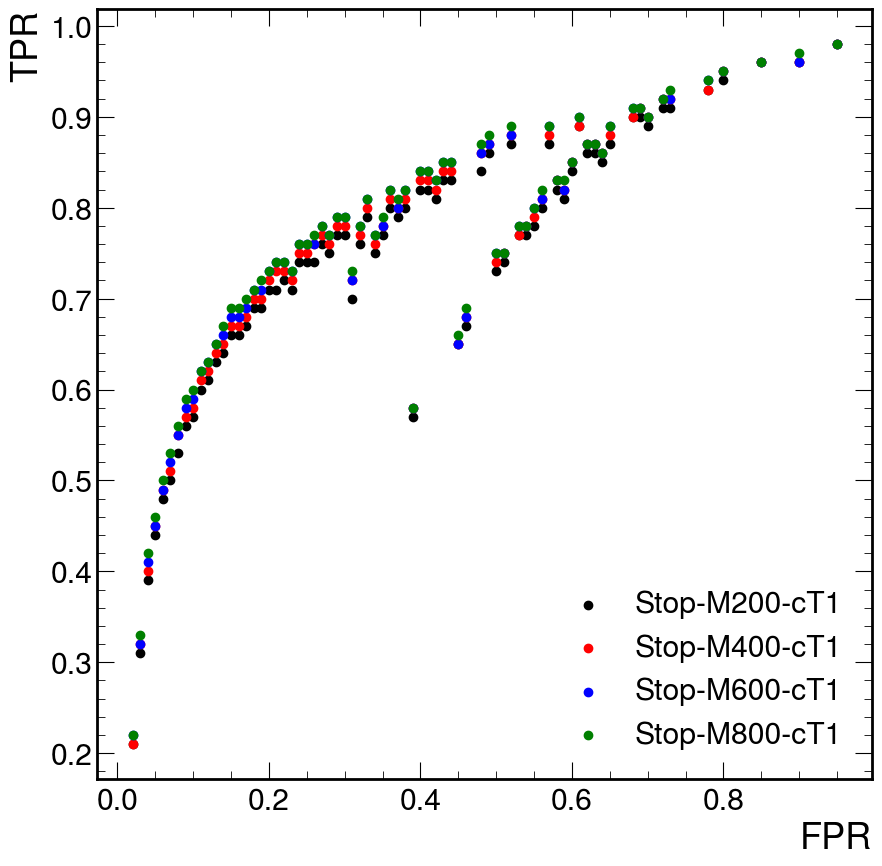

Stop-M200-cT3  fpr:  0.01  eff:  0.25  best cuts are pt >  1.0  dxy sig >  8.0  pixel hits >  3.0  tracker layers >  3.0  strip hits >  8.0
Stop-M200-cT3  fpr:  0.05  eff:  0.51  best cuts are pt >  1.0  dxy sig >  7.0  pixel hits >  2.0  tracker layers >  3.0  strip hits >  3.0
Stop-M200-cT3  fpr:  0.1  eff:  0.63  best cuts are pt >  1.0  dxy sig >  5.0  pixel hits >  2.0  tracker layers >  3.0  strip hits >  2.0
Stop-M200-cT3  fpr:  0.15  eff:  0.71  best cuts are pt >  1.0  dxy sig >  4.0  pixel hits >  2.0  tracker layers >  5.0  strip hits >  1.0
Stop-M200-cT3  fpr:  0.2  eff:  0.74  best cuts are pt >  1.0  dxy sig >  3.5  pixel hits >  2.0  tracker layers >  5.0  strip hits >  0.0
Stop-M200-cT3  fpr:  0.25  eff:  0.76  best cuts are pt >  1.0  dxy sig >  3.0  pixel hits >  1.0  tracker layers >  6.0  strip hits >  2.0
Stop-M200-cT3  fpr:  0.45  eff:  0.65  best cuts are pt >  1.0  dxy sig >  2.0  pixel hits >  3.0  tracker layers >  7.0  strip hits >  3.0
Stop-M200-cT3  fpr:  0

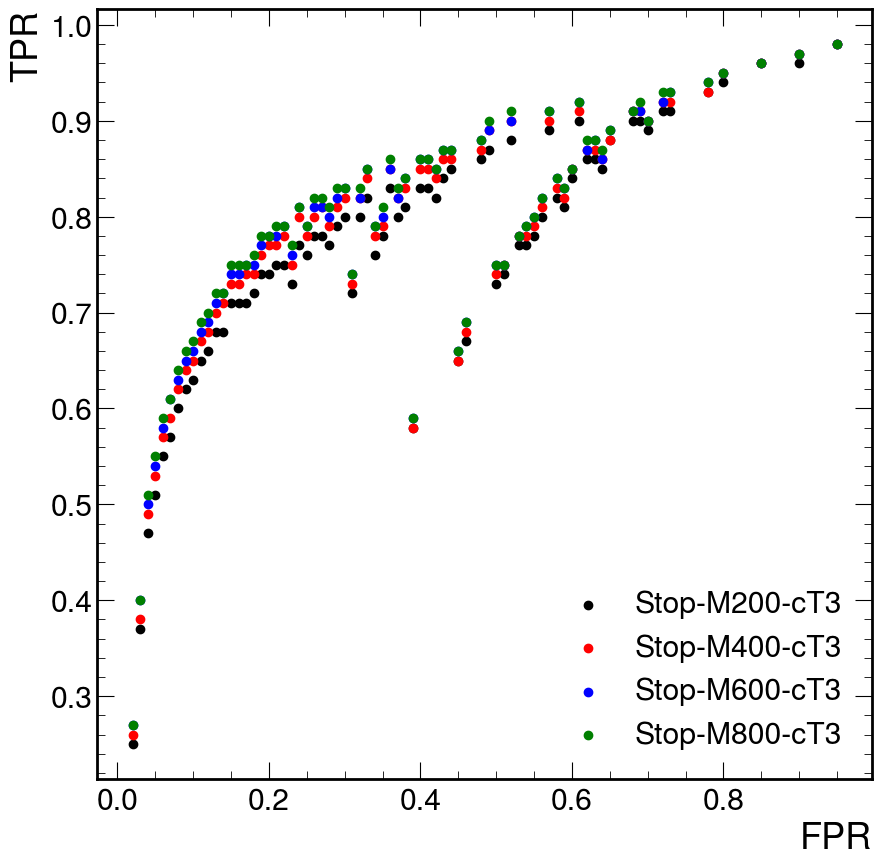

Stop-M200-cT10  fpr:  0.01  eff:  0.25  best cuts are pt >  1.0  dxy sig >  8.0  pixel hits >  3.0  tracker layers >  3.0  strip hits >  8.0
Stop-M200-cT10  fpr:  0.05  eff:  0.5  best cuts are pt >  1.0  dxy sig >  7.0  pixel hits >  2.0  tracker layers >  3.0  strip hits >  3.0
Stop-M200-cT10  fpr:  0.1  eff:  0.6  best cuts are pt >  1.0  dxy sig >  5.0  pixel hits >  1.0  tracker layers >  6.0  strip hits >  0.0
Stop-M200-cT10  fpr:  0.15  eff:  0.67  best cuts are pt >  1.0  dxy sig >  4.0  pixel hits >  2.0  tracker layers >  5.0  strip hits >  1.0
Stop-M200-cT10  fpr:  0.2  eff:  0.71  best cuts are pt >  1.0  dxy sig >  4.0  pixel hits >  1.0  tracker layers >  4.0  strip hits >  0.0
Stop-M200-cT10  fpr:  0.25  eff:  0.72  best cuts are pt >  1.0  dxy sig >  3.0  pixel hits >  1.0  tracker layers >  6.0  strip hits >  2.0
Stop-M200-cT10  fpr:  0.45  eff:  0.63  best cuts are pt >  1.0  dxy sig >  2.0  pixel hits >  3.0  tracker layers >  7.0  strip hits >  3.0
Stop-M200-cT10  f

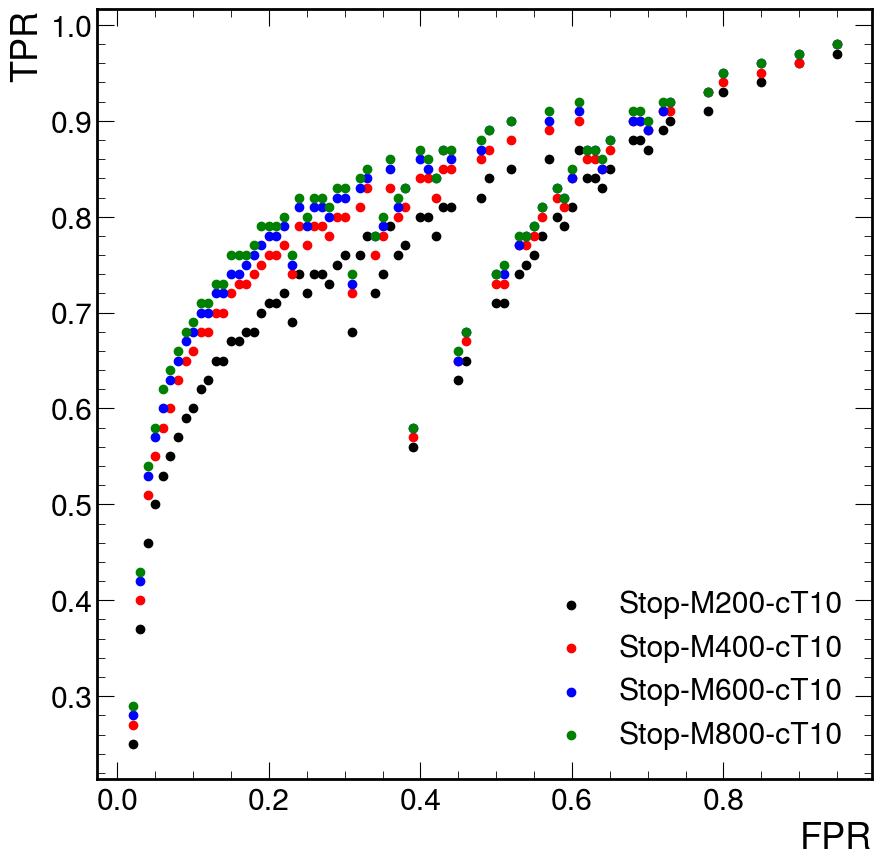

Hto2Sto4D-cT0p1-MS1  fpr:  0.01  best cuts are pt >  1.0  dxy sig >  8.0  pixel hits >  3.0  tracker layers >  3.0  strip hits >  8.0
Hto2Sto4D-cT0p1-MS1  fpr:  0.05  best cuts are pt >  1.0  dxy sig >  5.5  pixel hits >  1.0  tracker layers >  3.0  strip hits >  8.0
Hto2Sto4D-cT0p1-MS1  fpr:  0.1  best cuts are pt >  1.0  dxy sig >  4.0  pixel hits >  1.0  tracker layers >  3.0  strip hits >  7.0
Hto2Sto4D-cT0p1-MS1  fpr:  0.15  best cuts are pt >  1.0  dxy sig >  3.5  pixel hits >  1.0  tracker layers >  8.0  strip hits >  5.0
Hto2Sto4D-cT0p1-MS1  fpr:  0.2  best cuts are pt >  1.0  dxy sig >  3.0  pixel hits >  1.0  tracker layers >  3.0  strip hits >  6.0
Hto2Sto4D-cT0p1-MS1  fpr:  0.25  best cuts are pt >  1.0  dxy sig >  3.0  pixel hits >  1.0  tracker layers >  3.0  strip hits >  3.0
Hto2Sto4D-cT0p1-MS1  fpr:  0.45  best cuts are pt >  1.0  dxy sig >  2.0  pixel hits >  3.0  tracker layers >  7.0  strip hits >  3.0


IndexError: list index out of range

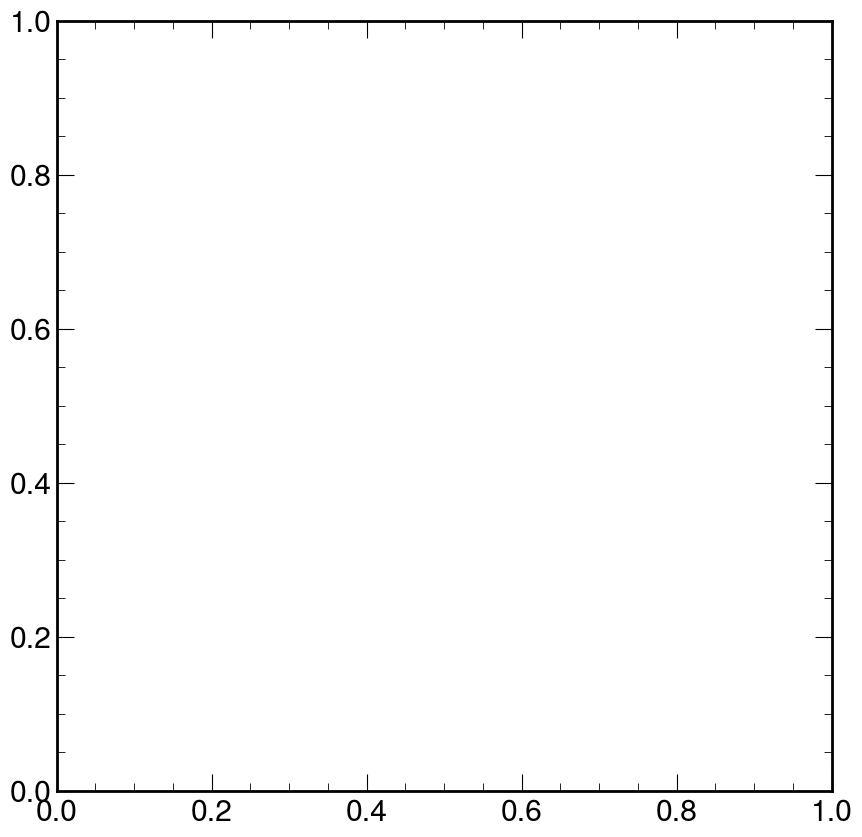

In [16]:
#Track Cut Grid Search Reoptimization

#Track Cut Grid Search Script
import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed

#ptTrackCuts = np.linspace(1,3,21)
ptTrackCuts = np.linspace(1,1,1)
dxySigCuts = np.linspace(2.0,8,13)
pixelHitsCuts = np.linspace(1,3,3)
nTrackerLayersCuts = np.linspace(3,9,7)
stripHitsCuts = np.linspace(0,8,9)

def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    with uproot.open(rootFile) as file:
        output["genWeightSum"] = {process: file["triggerFilter/genWeightsSkim"].values()[0]}
        tree = file["scoutingTree/objectTree"]
        # Select only necessary branches to load
        branches = ["weight","vertTrack_iVtx","scoutVert_dBV","vertTrack_pt","vertTrack_dxySig","vertTrack_nValidPixelHits", "vertTrack_nTrackerLayersWithMeasurement","vertTrack_nValidStripHits"]
        weightSum = np.zeros((len(ptTrackCuts),len(dxySigCuts),len(pixelHitsCuts),len(nTrackerLayersCuts),len(stripHitsCuts)))
        weightSkimSum = 0
        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        nbatch = 0;
        for batch in tree.iterate(branches, library="ak", step_size=100000):
            nbatch += 1
            if(nbatch>10):
                break
            weights = batch["weight"]  # event weights
            iVtx = batch["vertTrack_iVtx"]
            mask = (batch["scoutVert_dBV"][iVtx] >= 0.01) & (batch["scoutVert_dBV"][iVtx] < 2.0)
            pt = batch["vertTrack_pt"][mask]
            dxySig = batch["vertTrack_dxySig"][mask]
            npixel = batch["vertTrack_nValidPixelHits"][mask]
            ntracker = batch["vertTrack_nTrackerLayersWithMeasurement"][mask]
            nstrip = batch["vertTrack_nValidStripHits"][mask]
            nTracks = ak.num(pt,axis=1)
            weightSkimSum += ak.sum(nTracks*weights)
            ptMasks = [(pt > ptTrackCuts[i]) for i in range(len(ptTrackCuts))]
            dxyMasks = [(dxySig > dxySigCuts[j]) for j in range(len(dxySigCuts))]
            pixelMasks = [(npixel > pixelHitsCuts[k]) for k in range(len(pixelHitsCuts))]
            trackerMasks = [(ntracker > nTrackerLayersCuts[l]) for l in range(len(nTrackerLayersCuts))]
            stripMasks = [(nstrip > stripHitsCuts[k]) for k in range(len(stripHitsCuts))]
            for i in range(len(ptTrackCuts)):
                for j in range(len(dxySigCuts)):
                    for k in range(len(pixelHitsCuts)):
                        for l in range(len(nTrackerLayersCuts)):
                            for m in range(len(stripHitsCuts)):
                                mask = ptMasks[i] & dxyMasks[j] & pixelMasks[k] & trackerMasks[l] & stripMasks[m]
                                ptMasked = pt[mask]
                                nTracks = ak.num(ptMasked,axis=1)
                                weightSum[i][j][k][l][m] += ak.sum(nTracks*weights)
        output["weightSum"] = {process: weightSum}
        output["weightSkimSum"] = {process: weightSkimSum}
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        if process not in results[plot]:
                             results[plot][process] = result[plot][process]
                        else:
                            results[plot][process] = results[plot][process] + result[plot][process]

    return results
'''
t0 = time.time()


bgPlotWeights = parallel_processing(processDict)
sigPlotWeights = parallel_processing(signalDict)

#Combining Background Subprocesses and Reweighting Events
for process in bgPlotWeights["genWeightSum"].keys():
    bgPlotWeights["weightSum"][process] = bgPlotWeights["weightSum"][process] / bgPlotWeights["genWeightSum"][process]
    bgPlotWeights["weightSkimSum"][process] = bgPlotWeights["weightSkimSum"][process] / bgPlotWeights["genWeightSum"][process]
bgPlotWeights["weightSum"]["QCD"] = bgPlotWeights["weightSum"]["QCD40to70"]+bgPlotWeights["weightSum"]["QCD70to100"]+bgPlotWeights["weightSum"]["QCD100to200"]+bgPlotWeights["weightSum"]["QCD200to400"]+bgPlotWeights["weightSum"]["QCD400to600"]+bgPlotWeights["weightSum"]["QCD600to800"]+bgPlotWeights["weightSum"]["QCD800to1000"]+bgPlotWeights["weightSum"]["QCD1000to1200"]+bgPlotWeights["weightSum"]["QCD1200to1500"]+bgPlotWeights["weightSum"]["QCD1500to2000"]+bgPlotWeights["weightSum"]["QCD2000"]
bgPlotWeights["weightSkimSum"]["QCD"] = bgPlotWeights["weightSkimSum"]["QCD40to70"]+bgPlotWeights["weightSkimSum"]["QCD70to100"]+bgPlotWeights["weightSkimSum"]["QCD100to200"]+bgPlotWeights["weightSkimSum"]["QCD200to400"]+bgPlotWeights["weightSkimSum"]["QCD400to600"]+bgPlotWeights["weightSkimSum"]["QCD600to800"]+bgPlotWeights["weightSkimSum"]["QCD800to1000"]+bgPlotWeights["weightSkimSum"]["QCD1000to1200"]+bgPlotWeights["weightSkimSum"]["QCD1200to1500"]+bgPlotWeights["weightSkimSum"]["QCD1500to2000"]+bgPlotWeights["weightSkimSum"]["QCD2000"]
bgPlotWeights["weightSum"]["TTbar"] = bgPlotWeights["weightSum"]["TTTo4Q"]+bgPlotWeights["weightSum"]["TTToLNu2Q"]
bgPlotWeights["weightSkimSum"]["TTbar"] = bgPlotWeights["weightSkimSum"]["TTTo4Q"]+bgPlotWeights["weightSkimSum"]["TTToLNu2Q"]
for process in sigPlotWeights["genWeightSum"].keys():
    sigPlotWeights["weightSum"][process] = sigPlotWeights["weightSum"][process] / sigPlotWeights["genWeightSum"][process]
    sigPlotWeights["weightSkimSum"][process] = sigPlotWeights["weightSkimSum"][process] / sigPlotWeights["genWeightSum"][process]
'''
thresh_val = [0.01,0.05,0.1,0.15,0.2,0.25,0.45,0.46,0.47,0.48,0.49,0.50]
optimalCuts = {}
effMatrices = {}
# **Plotting**
for lifetime in ["1","3","10"]:
    fig, ax = plt.subplots()
    colors = {"Stop-M200-cT"+lifetime: "black", "Stop-M400-cT"+lifetime: "red", "Stop-M600-cT"+lifetime: "blue", "Stop-M800-cT"+lifetime: "green"}
    for signal, color in colors.items():
        efficiency = sigPlotWeights["weightSum"][signal] / sigPlotWeights["weightSkimSum"][signal]
        efficiency = np.round(efficiency,2)
        fpr = (bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"]) / (bgPlotWeights["weightSkimSum"]["QCD"]+bgPlotWeights["weightSkimSum"]["TTbar"])
        fpr = np.round(fpr,2)
        unique_fpr = np.unique(fpr)
        max_effs = np.array([])
        thresh = [True]*len(thresh_val)
        indices = []
        thresh_eff = []
        for ux in unique_fpr:
            unique_eff = np.where(fpr == ux, efficiency, -1)
            max_eff = np.max(unique_eff)
            ind = np.unravel_index(np.argmax(unique_eff, axis=None), unique_eff.shape)
            for i in range(len(thresh_val)):
                if(ux>=thresh_val[i] and thresh[i]): 
                    indices.append(ind)
                    thresh_eff.append(max_eff)
                    thresh[i] = False
            '''
            if(ux>=thresh_val[0] and thresh[0]): 
                indices.append(ind)
                thresh[0] = False
            if(ux>=thresh_val[1] and thresh[1]): 
                indices.append(ind)
                thresh[1] = False
            if(ux>=thresh_val[2] and thresh[2]): 
                indices.append(ind)
                thresh[2] = False
            if(ux>=thresh_val[3] and thresh[3]): 
                indices.append(ind)
                thresh[3] = False
            if(ux>=thresh_val[4] and thresh[4]): 
                indices.append(ind)
                thresh[4] = False
            if(ux>=thresh_val[5] and thresh[5]): 
                indices.append(ind)
                thresh[5] = False
            if(ux>=thresh_val[6] and thresh[6]): 
                indices.append(ind)
                thresh[6] = False
            '''
            max_effs = np.append(max_effs,max_eff)
        for i in range(len(thresh_val)):
            print(signal," fpr: ",thresh_val[i]," eff: ",thresh_eff[i]," best cuts are pt > ",ptTrackCuts[indices[i][0]]," dxy sig > ",dxySigCuts[indices[i][1]]," pixel hits > ",pixelHitsCuts[indices[i][2]]," tracker layers > ",nTrackerLayersCuts[indices[i][3]]," strip hits > ",stripHitsCuts[indices[i][4]])
        ax.scatter(unique_fpr,max_effs,label=signal,color=color,zorder=1)
        optimalCuts[signal] = indices
        effMatrices[signal] = efficiency
    ax.set_ylabel("TPR")
    plt.xlabel("FPR")
    #plt.yscale("log")
    plt.legend()
    plt.show()
    
for lifetime in ["0p1","1","10"]:
    fig, ax = plt.subplots()
    colors = {"Hto2Sto4D-cT"+lifetime+"-MS1": "black", "Hto2Sto4D-cT"+lifetime+"-MS7": "purple", "Hto2Sto4D-cT"+lifetime+"-MS15": "red", "Hto2Sto4D-cT"+lifetime+"-MS23": "orange", "Hto2Sto4D-cT"+lifetime+"-MS30": "blue", "Hto2Sto4D-cT"+lifetime+"-MS40": "pink", "Hto2Sto4D-cT"+lifetime+"-MS55": "green"}
    for signal, color in colors.items():
        efficiency = sigPlotWeights["weightSum"][signal] / sigPlotWeights["weightSkimSum"][signal]
        efficiency = np.round(efficiency,2)
        fpr = (bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"]) / (bgPlotWeights["weightSkimSum"]["QCD"]+bgPlotWeights["weightSkimSum"]["TTbar"])
        fpr = np.round(fpr,2)
        unique_fpr = np.unique(fpr)
        max_effs = np.array([])
        thresh = [True,True,True,True,True,True,True]
        indices = []
        for ux in unique_fpr:
            unique_eff = np.where(fpr == ux, efficiency, -1)
            max_eff = np.max(unique_eff)
            ind = np.unravel_index(np.argmax(unique_eff, axis=None), unique_eff.shape)
            if(ux>=thresh_val[0] and thresh[0]): 
                indices.append(ind)
                thresh[0] = False
            if(ux>=thresh_val[1] and thresh[1]): 
                indices.append(ind)
                thresh[1] = False
            if(ux>=thresh_val[2] and thresh[2]): 
                indices.append(ind)
                thresh[2] = False
            if(ux>=thresh_val[3] and thresh[3]): 
                indices.append(ind)
                thresh[3] = False
            if(ux>=thresh_val[4] and thresh[4]): 
                indices.append(ind)
                thresh[4] = False
            if(ux>=thresh_val[5] and thresh[5]): 
                indices.append(ind)
                thresh[5] = False
            if(ux>=thresh_val[6] and thresh[6]): 
                indices.append(ind)
                thresh[6] = False
            max_effs = np.append(max_effs,max_eff)
        for i in range(len(thresh_val)):
            print(signal," fpr: ",thresh_val[i]," best cuts are pt > ",ptTrackCuts[indices[i][0]]," dxy sig > ",dxySigCuts[indices[i][1]]," pixel hits > ",pixelHitsCuts[indices[i][2]]," tracker layers > ",nTrackerLayersCuts[indices[i][3]]," strip hits > ",stripHitsCuts[indices[i][4]])
        ax.scatter(unique_fpr,max_effs,label=signal,color=color,zorder=1)
        optimalCuts[signal] = indices
        effMatrices[signal] = efficiency
    ax.set_ylabel("TPR")
    plt.xlabel("FPR")
    #plt.yscale("log")
    plt.legend()
    plt.show()    


markers = ["o","^","v","<",">","+","x","*",]
for i in range(len(thresh_val)):
    indexList = []
    signalList = []
    i_marker = 0
    for signal, indices in optimalCuts.items():
        indexList.append(indices[i])
        signalList.append(signal)
    for i_index in range(len(indexList)):
        if(signalList[i_index] not in {"Stop-M200-cT1","Stop-M200-cT3","Hto2Sto4D-cT0p1-MS7","Hto2Sto4D-cT0p1-MS15","Hto2Sto4D-cT1-MS7","Hto2Sto4D-cT1-MS15","Hto2Sto4D-cT10-MS7","Hto2Sto4D-cT10-MS15"}): continue
        effList = []
        for j in range(len(signalList)):
            eff = effMatrices[signalList[j]][indexList[i_index]]
            effList.append(eff)
        plt.scatter(signalList,effList,label=signalList[i_index],marker=markers[i_marker])
        i_marker += 1
    plt.xlabel(f"{thresh_val[i]} FPR") 
    plt.xticks(rotation=90,fontsize=10)
    plt.legend(fontsize=10)
    plt.show()
    
t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")

In [22]:
optimalCuts.items()

dict_items([('Stop-M200-cT1', [(11, 12, 2, 6), (1, 10, 1, 3), (0, 6, 0, 3), (0, 4, 0, 3), (0, 3, 1, 2), (1, 2, 1, 2), (1, 2, 1, 1)]), ('Stop-M400-cT1', [(15, 12, 2, 4), (1, 10, 1, 3), (0, 6, 0, 3), (0, 4, 0, 3), (0, 3, 1, 2), (1, 2, 1, 2), (1, 2, 1, 1)]), ('Stop-M600-cT1', [(15, 12, 2, 4), (1, 10, 1, 3), (0, 6, 0, 3), (1, 4, 1, 2), (0, 3, 1, 2), (1, 2, 1, 2), (1, 2, 1, 1)]), ('Stop-M800-cT1', [(11, 12, 2, 6), (1, 10, 1, 3), (1, 6, 1, 2), (0, 4, 0, 3), (0, 3, 1, 2), (1, 2, 1, 2), (1, 2, 1, 1)]), ('Stop-M200-cT3', [(11, 12, 2, 6), (1, 10, 1, 3), (1, 6, 1, 2), (1, 4, 1, 2), (0, 3, 1, 2), (0, 4, 1, 0), (1, 2, 1, 1)]), ('Stop-M400-cT3', [(11, 12, 2, 6), (1, 10, 1, 3), (0, 6, 0, 3), (0, 4, 0, 3), (0, 3, 1, 2), (0, 4, 1, 0), (1, 2, 1, 1)]), ('Stop-M600-cT3', [(11, 12, 2, 6), (0, 11, 0, 3), (0, 6, 0, 3), (0, 4, 0, 3), (0, 3, 1, 2), (0, 4, 1, 0), (1, 2, 1, 1)]), ('Stop-M800-cT3', [(11, 12, 2, 6), (1, 10, 1, 3), (0, 6, 0, 3), (0, 4, 0, 3), (0, 3, 1, 2), (0, 4, 1, 0), (1, 2, 1, 1)]), ('Stop-M200-

Processing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-LooseTrackCuts/251107_195505/TTtoLNu2Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v22-LooseTrackCuts/251107_195637/QCD-4Jets_Bin-HT-40to70.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v22-LooseTrackCuts/251107_195647/QCD-4Jets_Bin-HT-70to100.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v22-LooseTrackCuts/251107_195607/QCD-4Jets_Bin-HT-400to600.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v22-LooseTrackCuts/251107_195516/QCD-4Jets_Bin-HT-1000to1200.

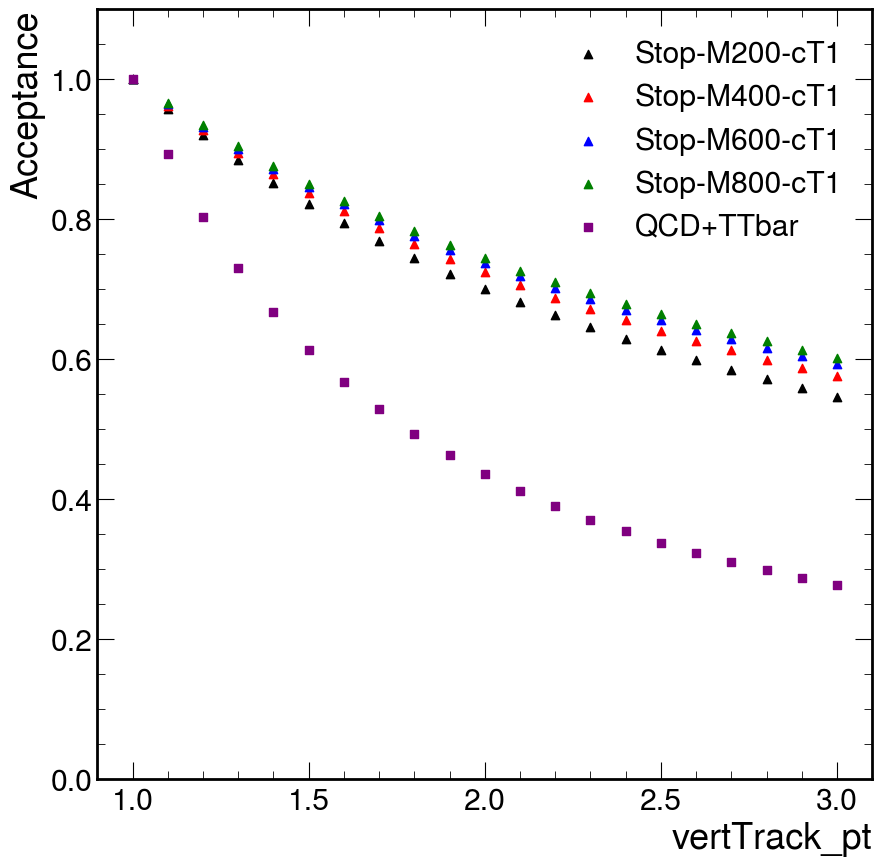

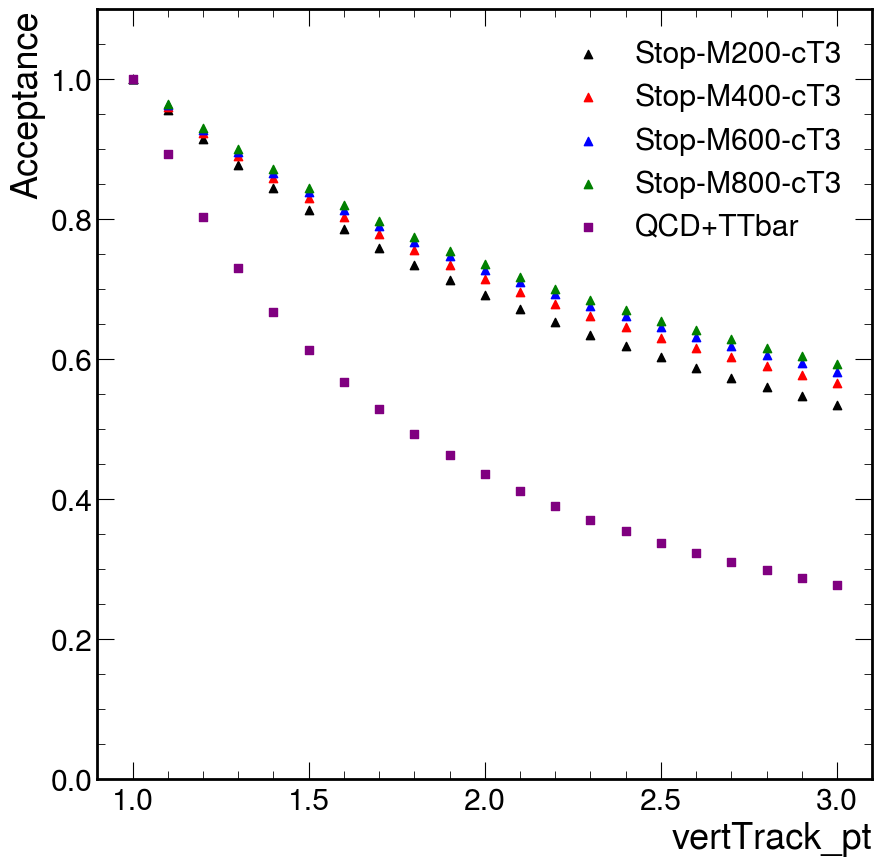

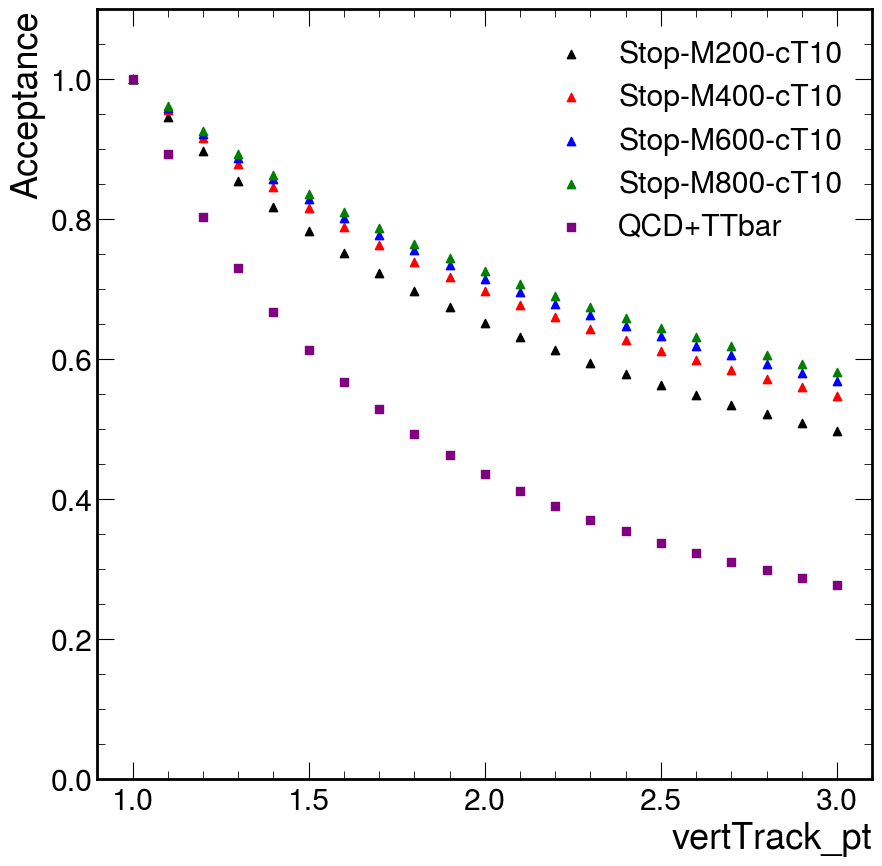

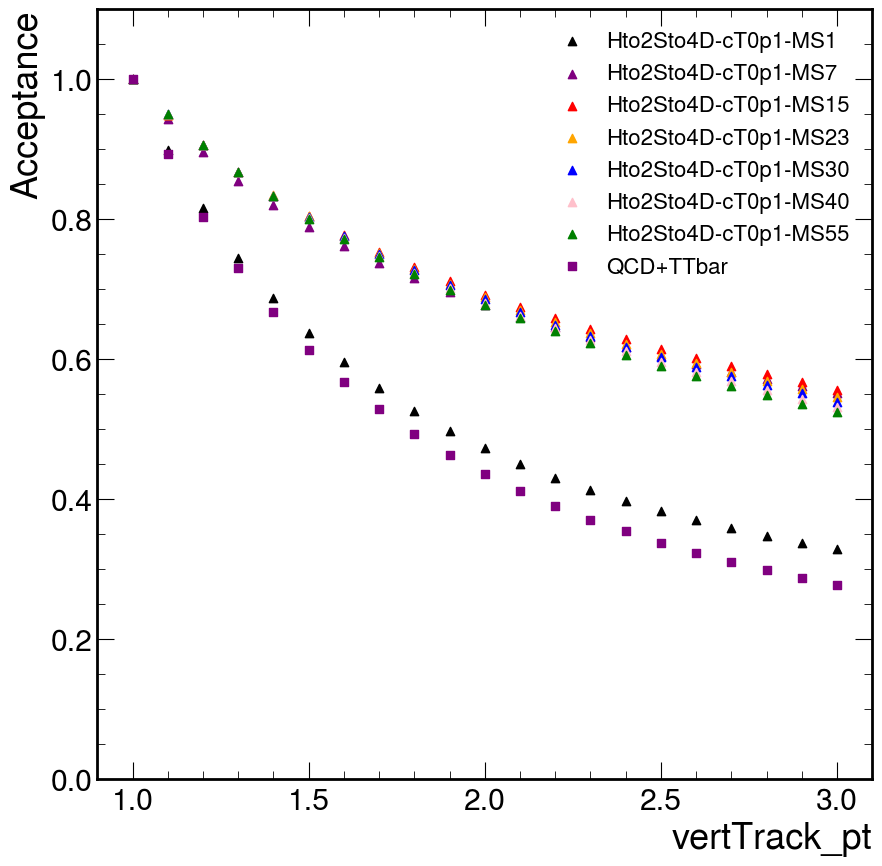

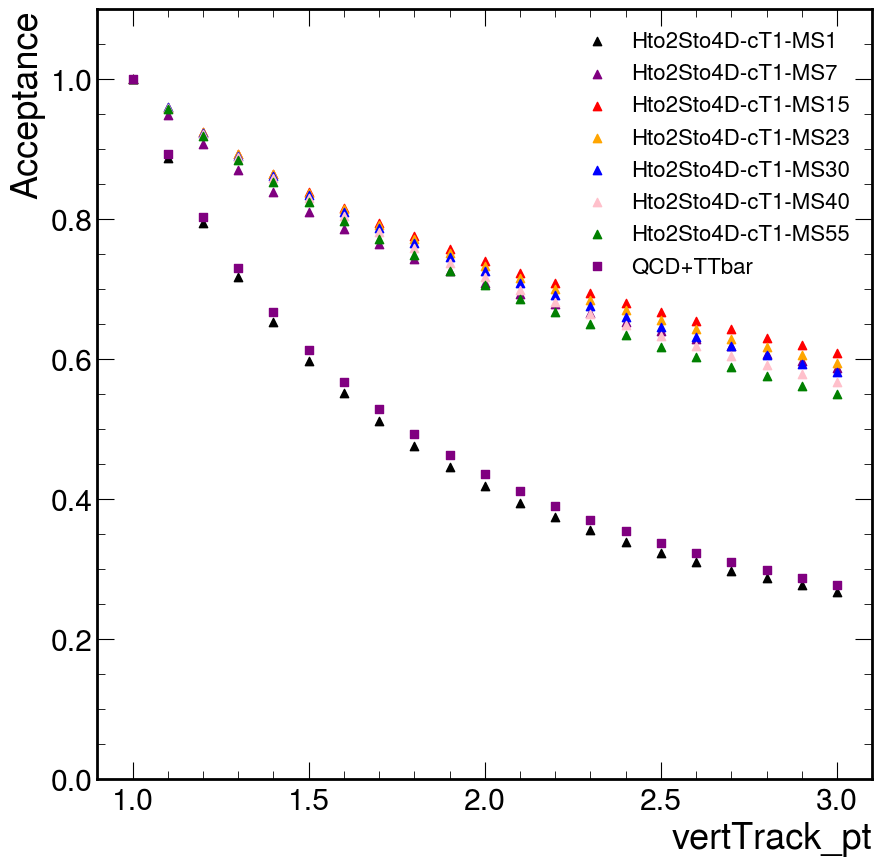

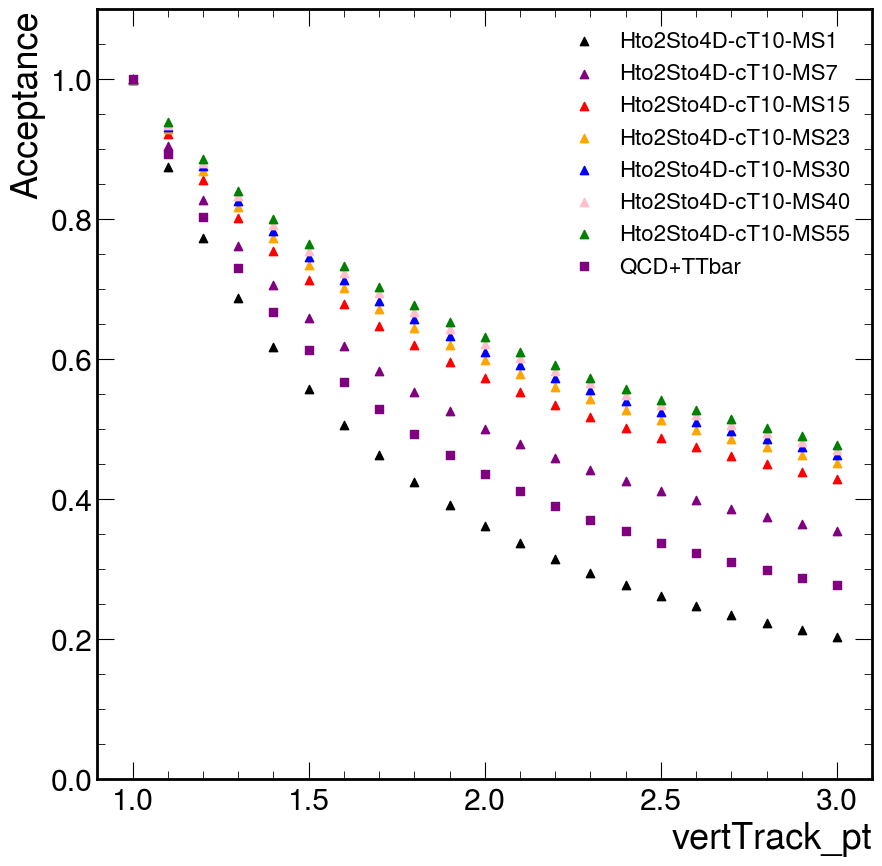

Processing /eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v22-LooseTrackCuts/251107_195457/TTto4Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v22-LooseTrackCuts/251107_195558/QCD-4Jets_Bin-HT-200to400.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-LooseTrackCuts/251107_195505/TTtoLNu2Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v22-LooseTrackCuts/251107_195657/QCD-4Jets_Bin-HT-100to200.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v22-LooseTrackCuts/251107_195617/QCD-4Jets_Bin-HT-600to800.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting

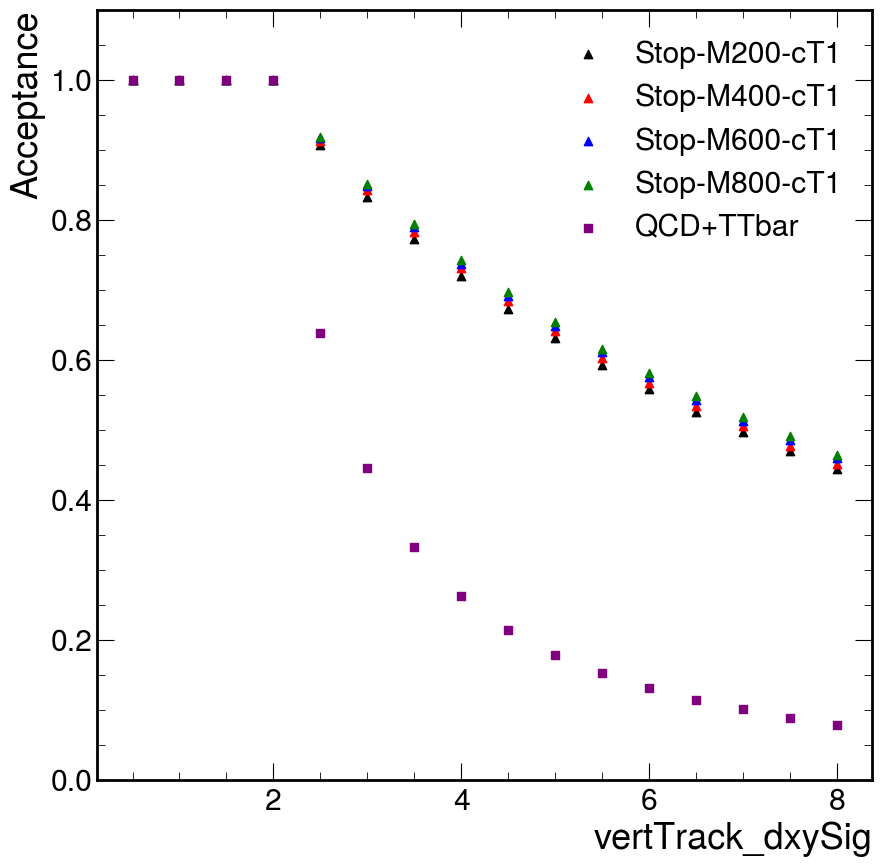

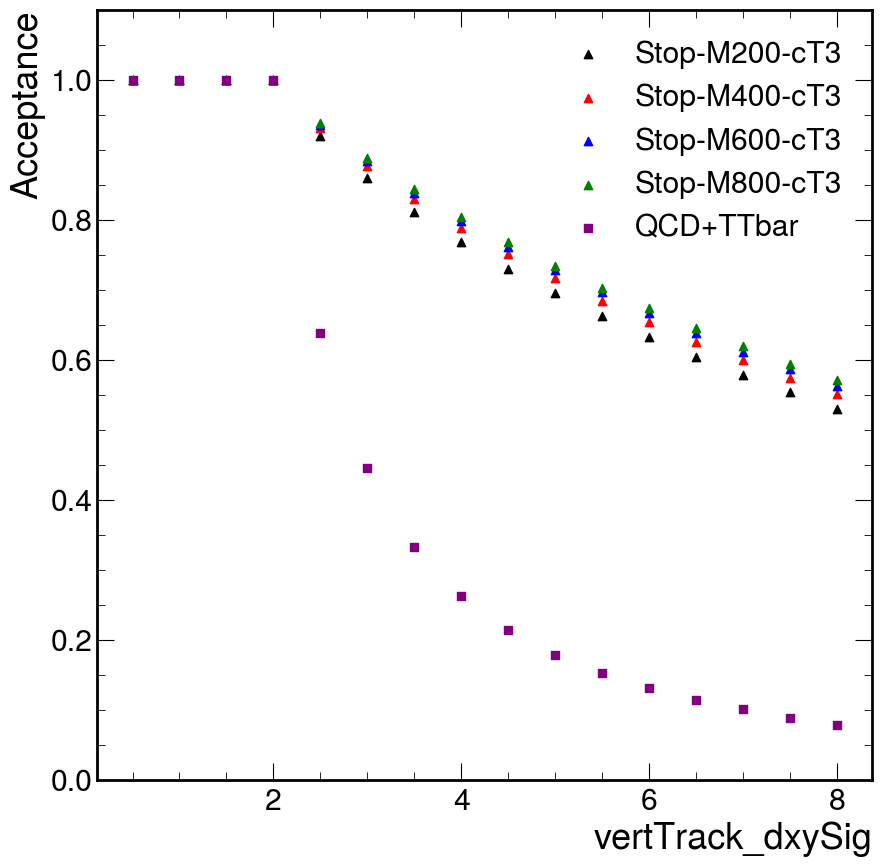

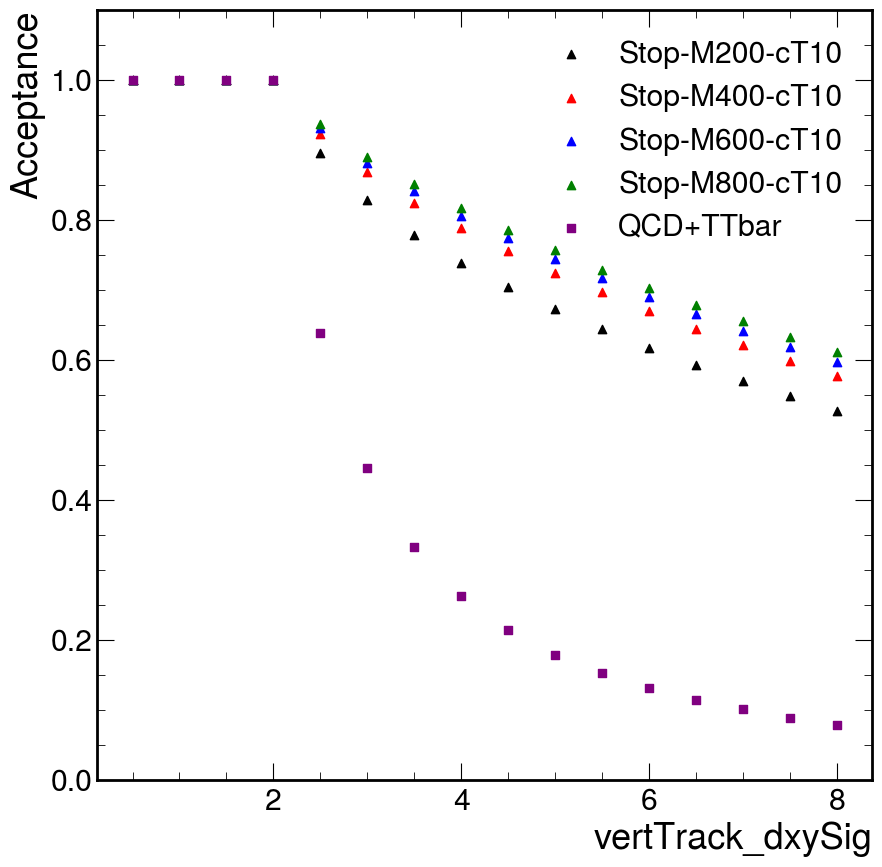

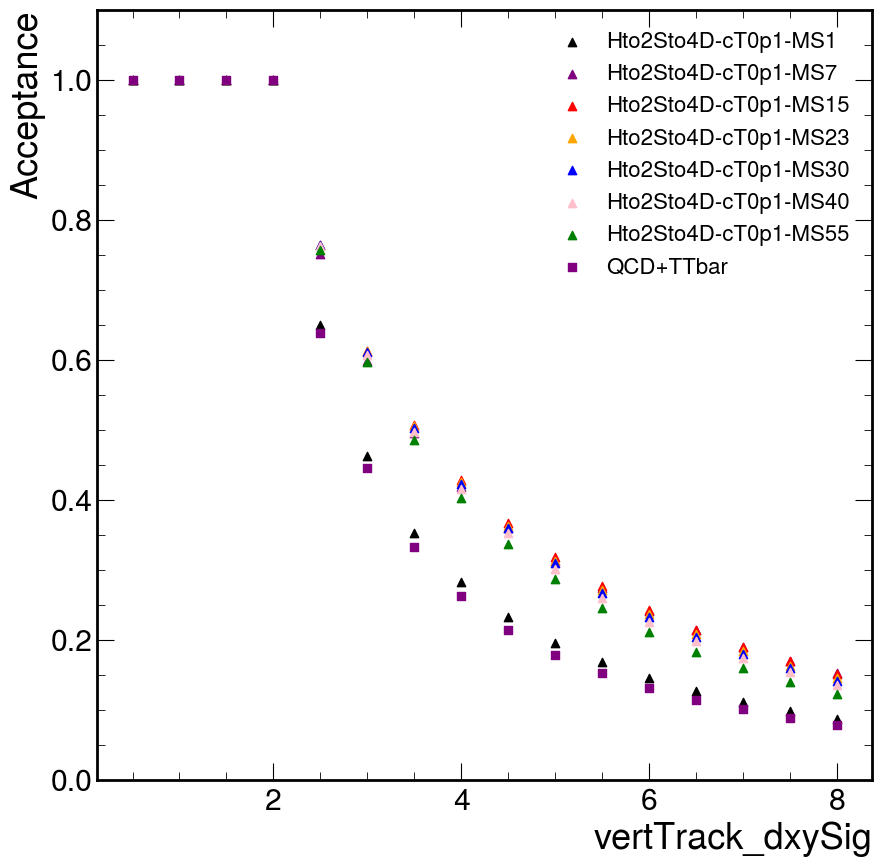

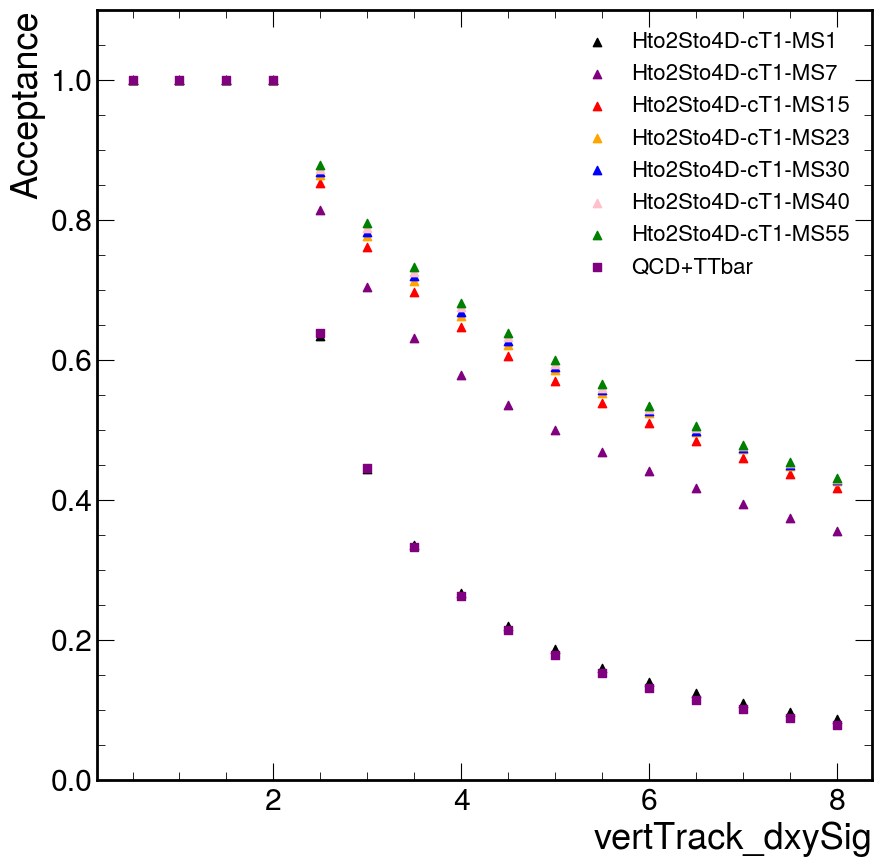

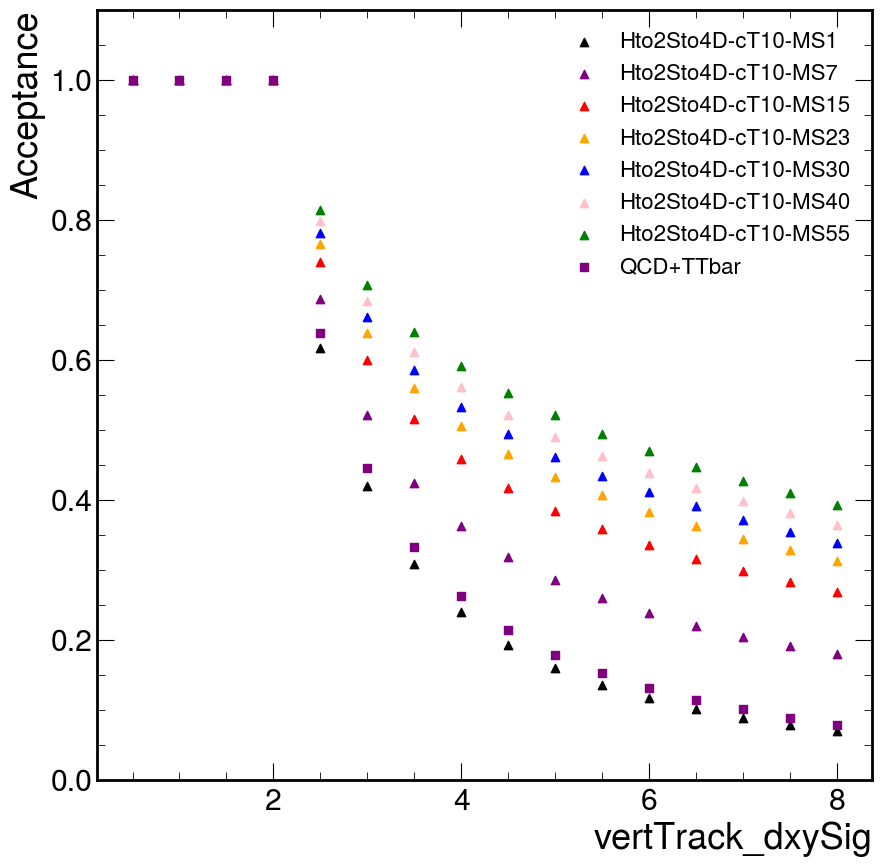

Processing /eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v22-LooseTrackCuts/251107_195457/TTto4Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-LooseTrackCuts/251107_195505/TTtoLNu2Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v22-LooseTrackCuts/251107_195637/QCD-4Jets_Bin-HT-40to70.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v22-LooseTrackCuts/251107_195607/QCD-4Jets_Bin-HT-400to600.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v22-LooseTrackCuts/251107_195647/QCD-4Jets_Bin-HT-70to100.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Je

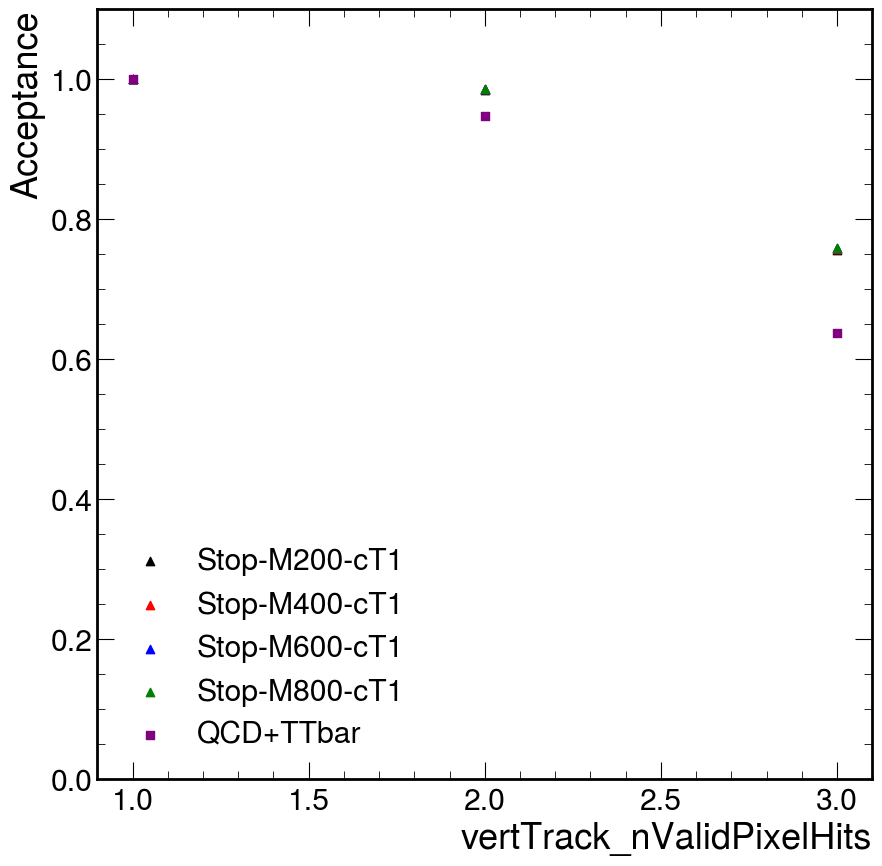

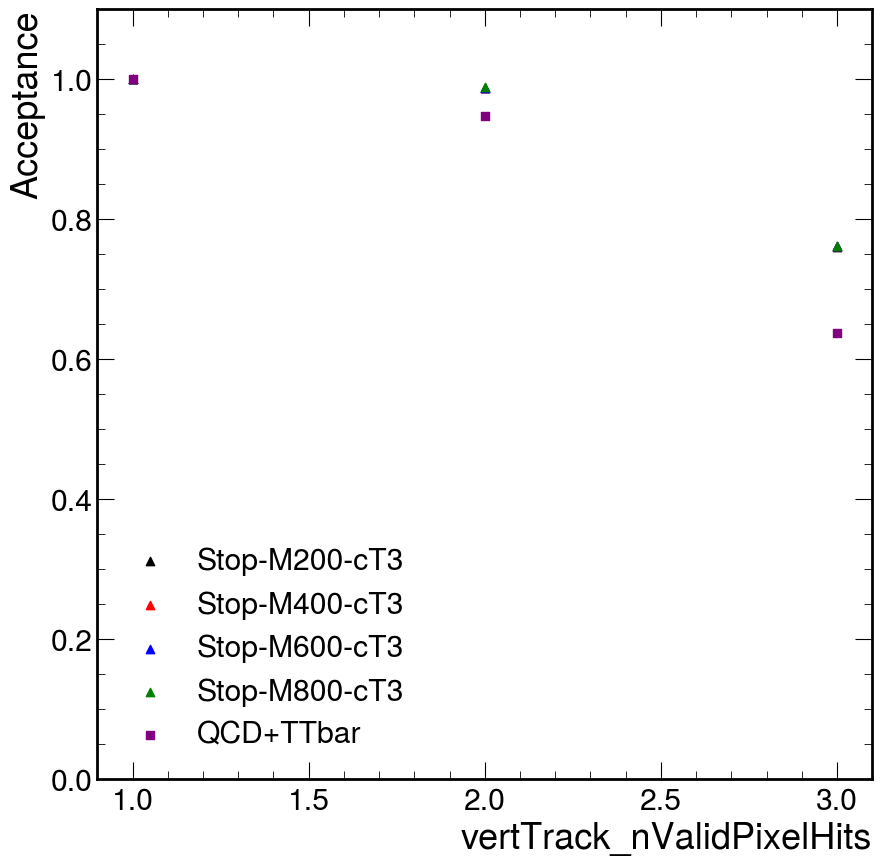

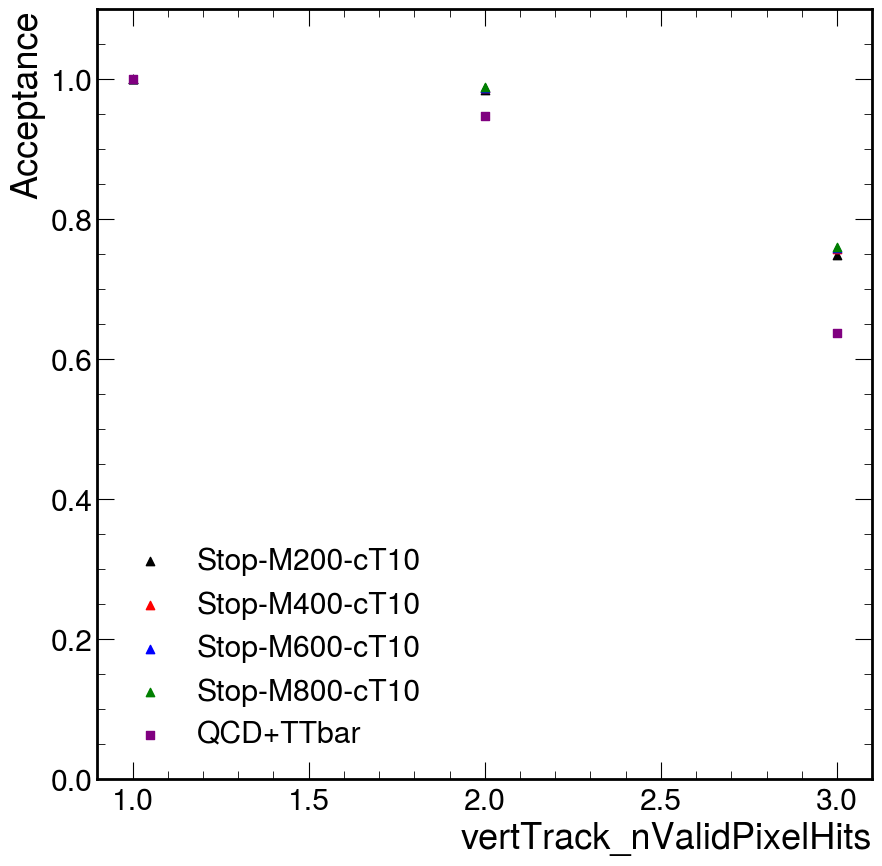

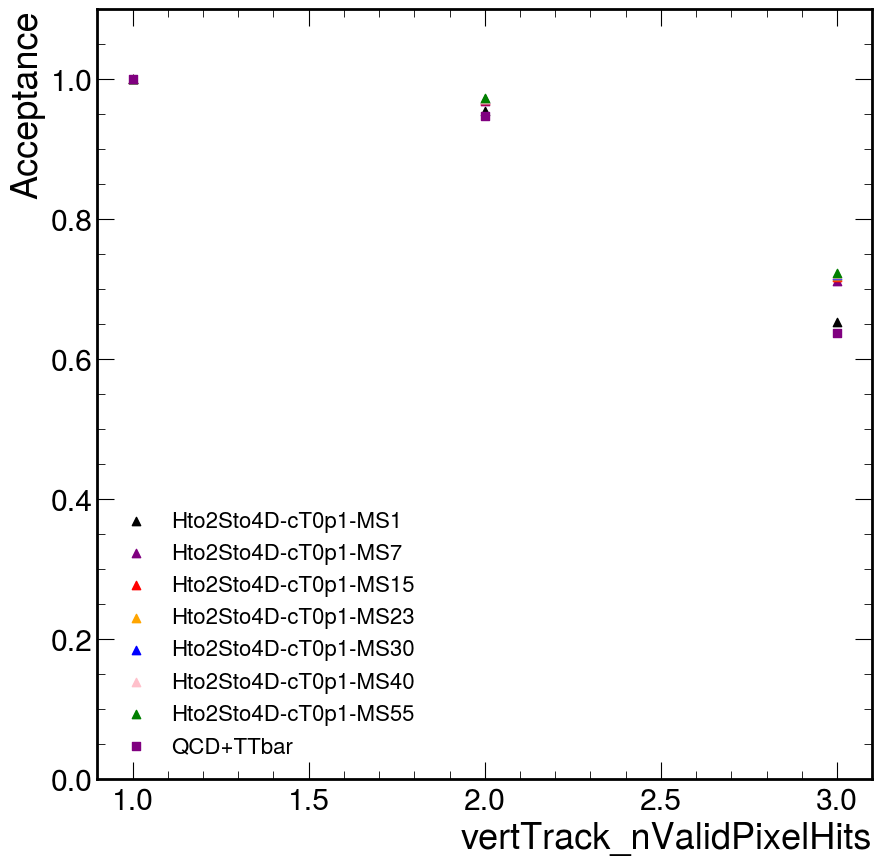

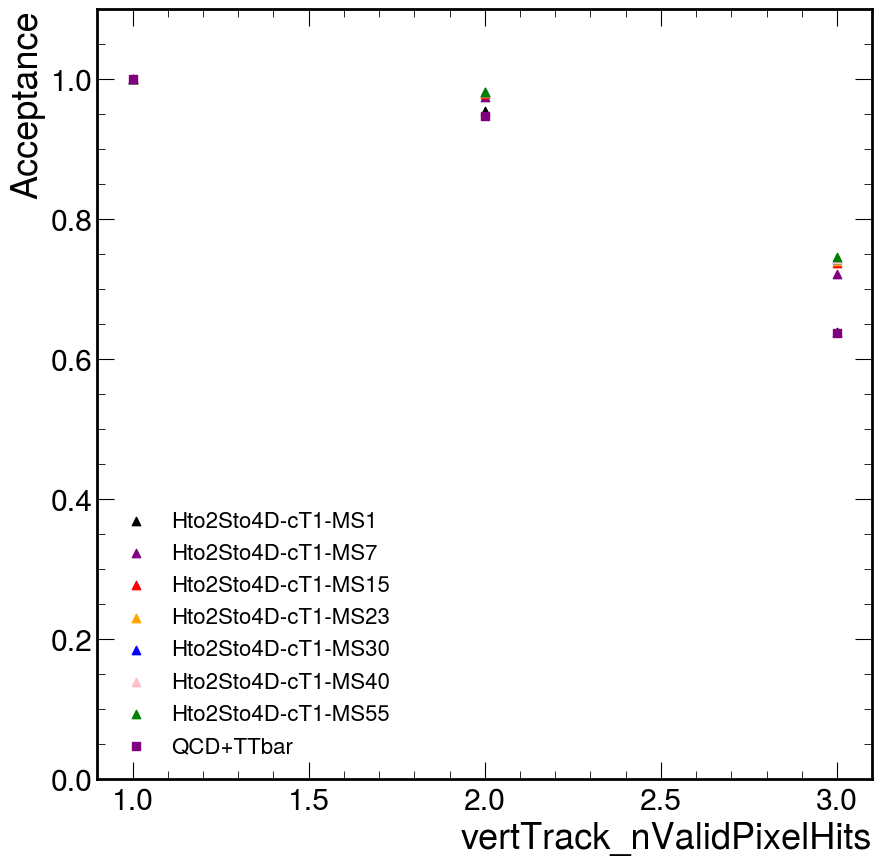

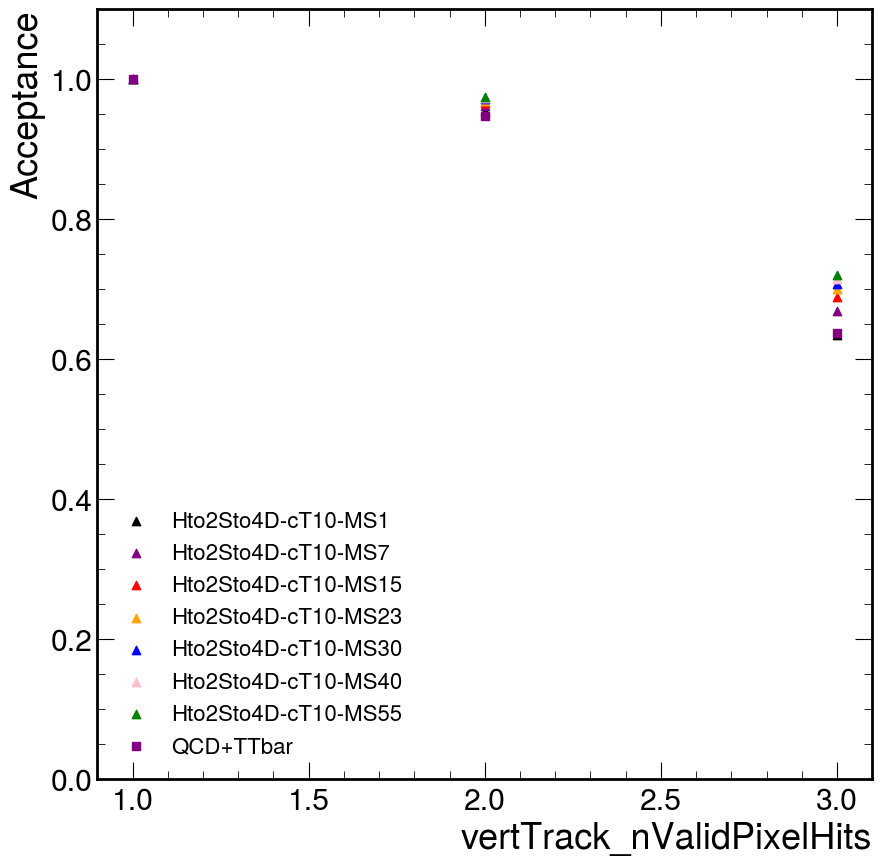

Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v22-LooseTrackCuts/251107_195558/QCD-4Jets_Bin-HT-200to400.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v22-LooseTrackCuts/251107_195657/QCD-4Jets_Bin-HT-100to200.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v22-LooseTrackCuts/251107_195617/QCD-4Jets_Bin-HT-600to800.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v22-LooseTrackCuts/251107_195607/QCD-4Jets_Bin-HT-400to600.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-LooseTrackCuts/251107_195505/TTtoLNu

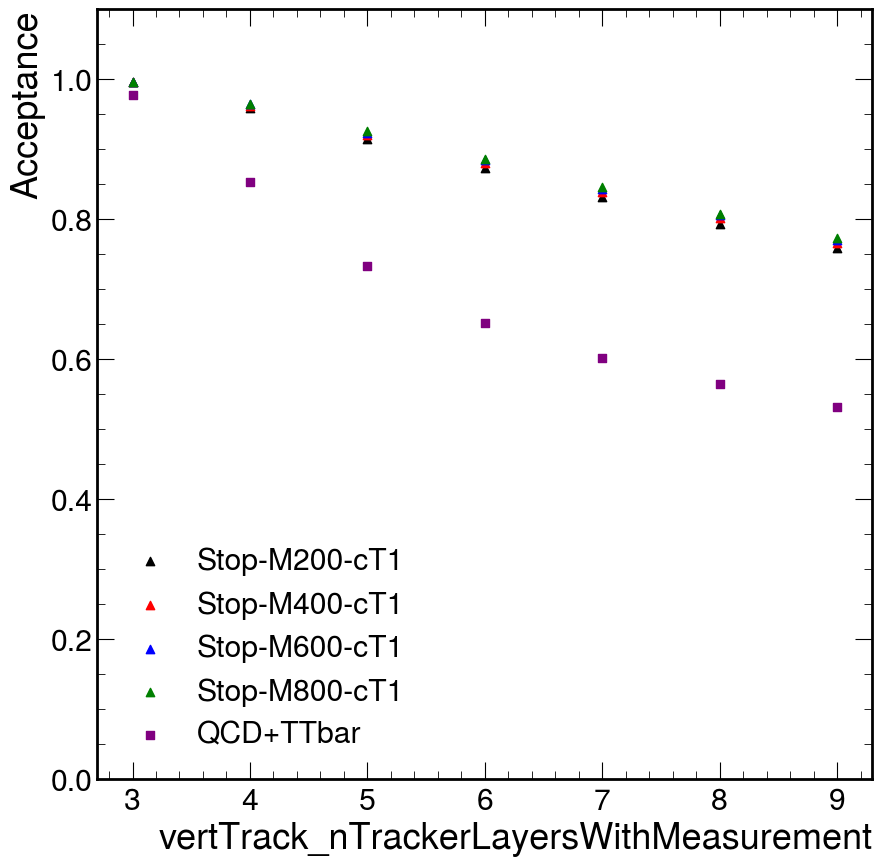

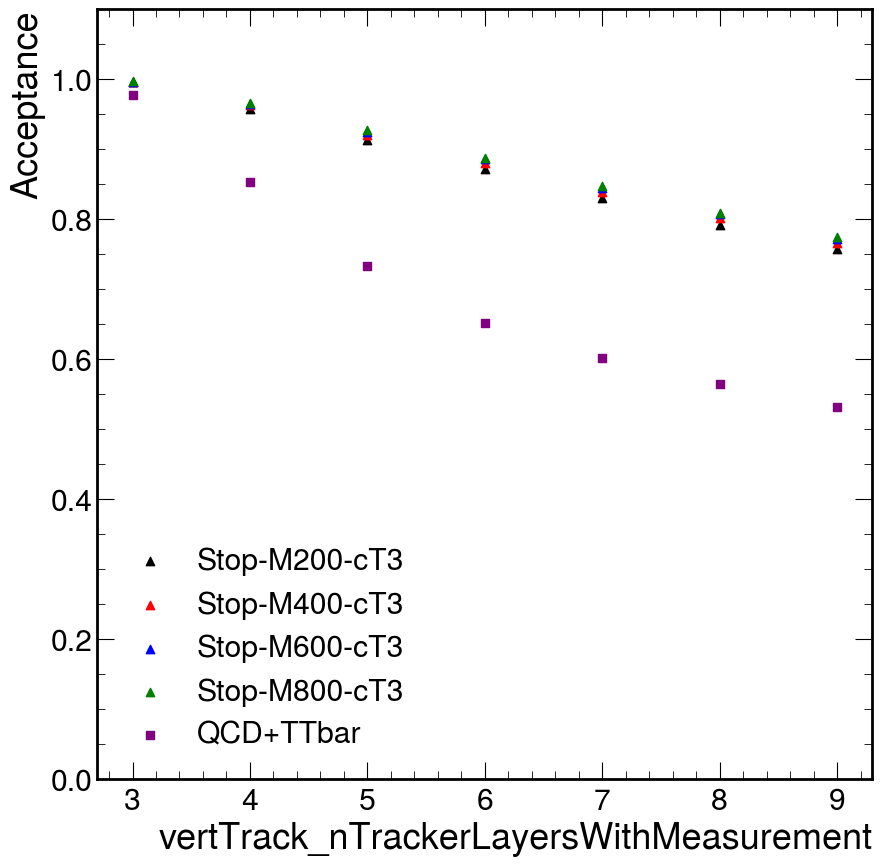

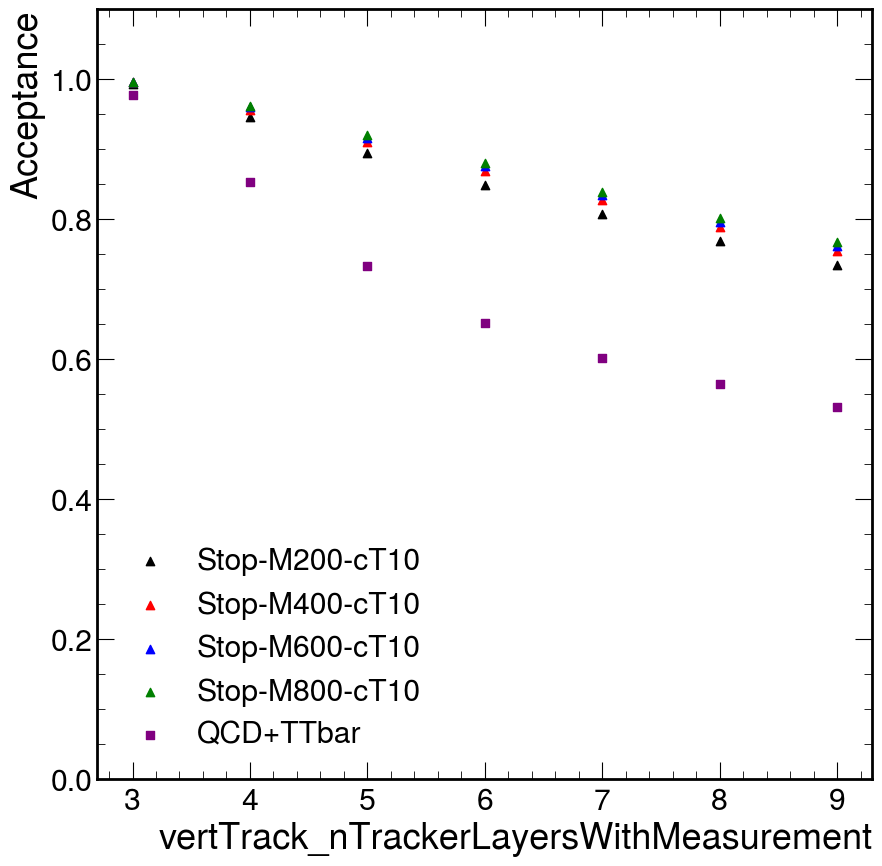

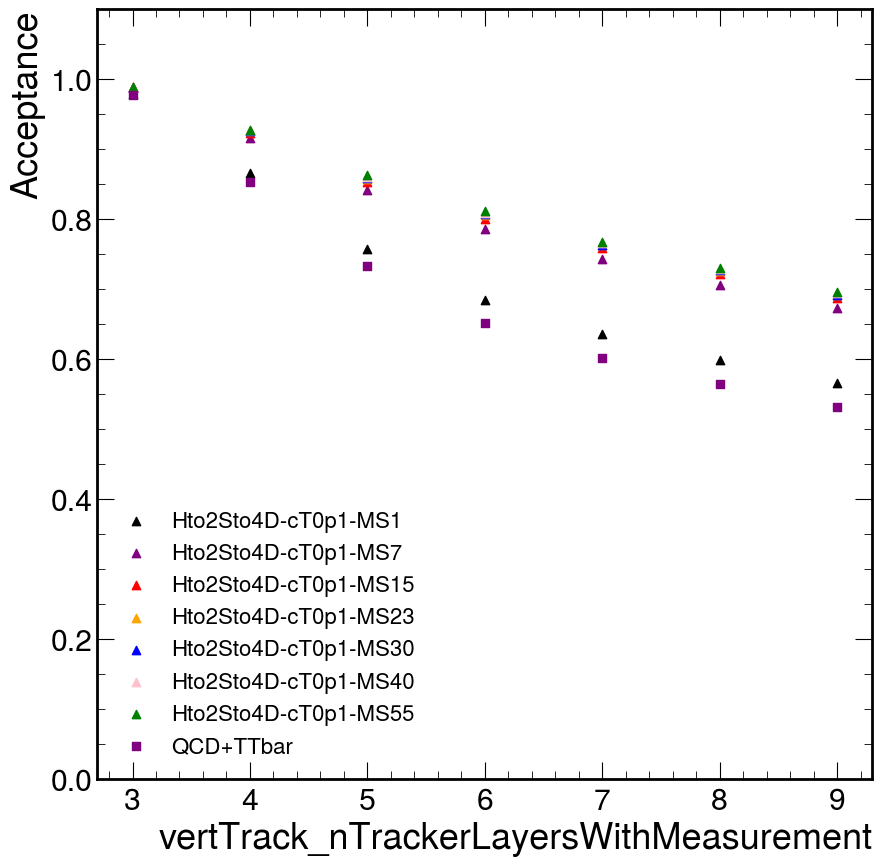

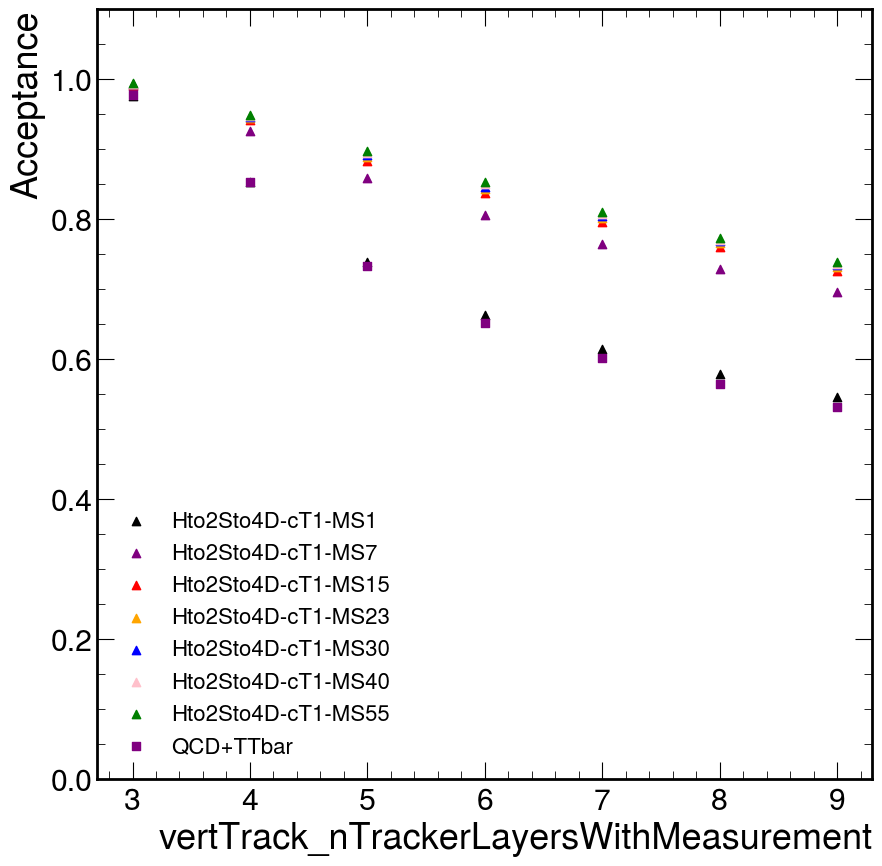

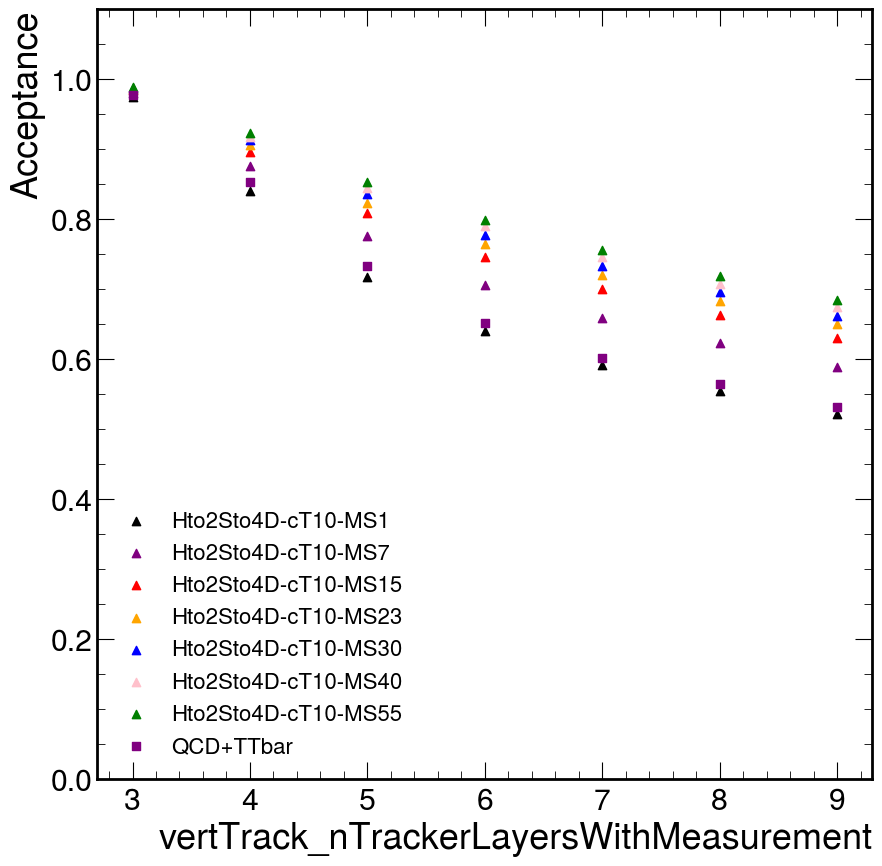

Processing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-LooseTrackCuts/251107_195505/TTtoLNu2Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v22-LooseTrackCuts/251107_195637/QCD-4Jets_Bin-HT-40to70.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v22-LooseTrackCuts/251107_195647/QCD-4Jets_Bin-HT-70to100.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v22-LooseTrackCuts/251107_195657/QCD-4Jets_Bin-HT-100to200.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v22-LooseTrackCuts/251107_195617/QCD-4Jets_Bin-HT-600to800.rootPr

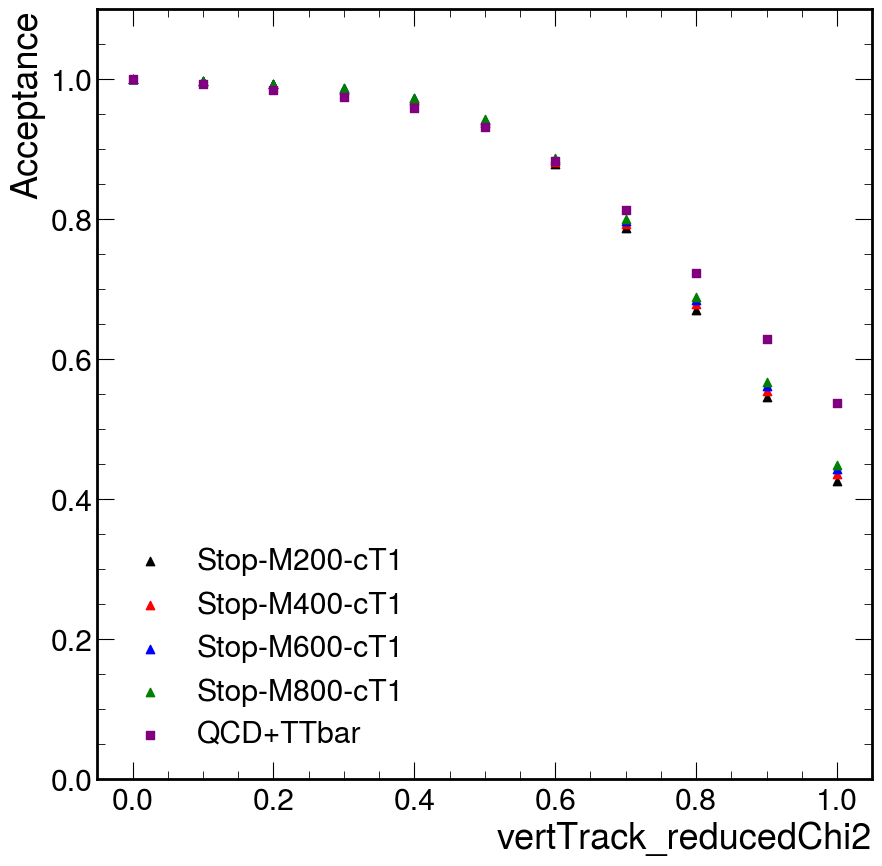

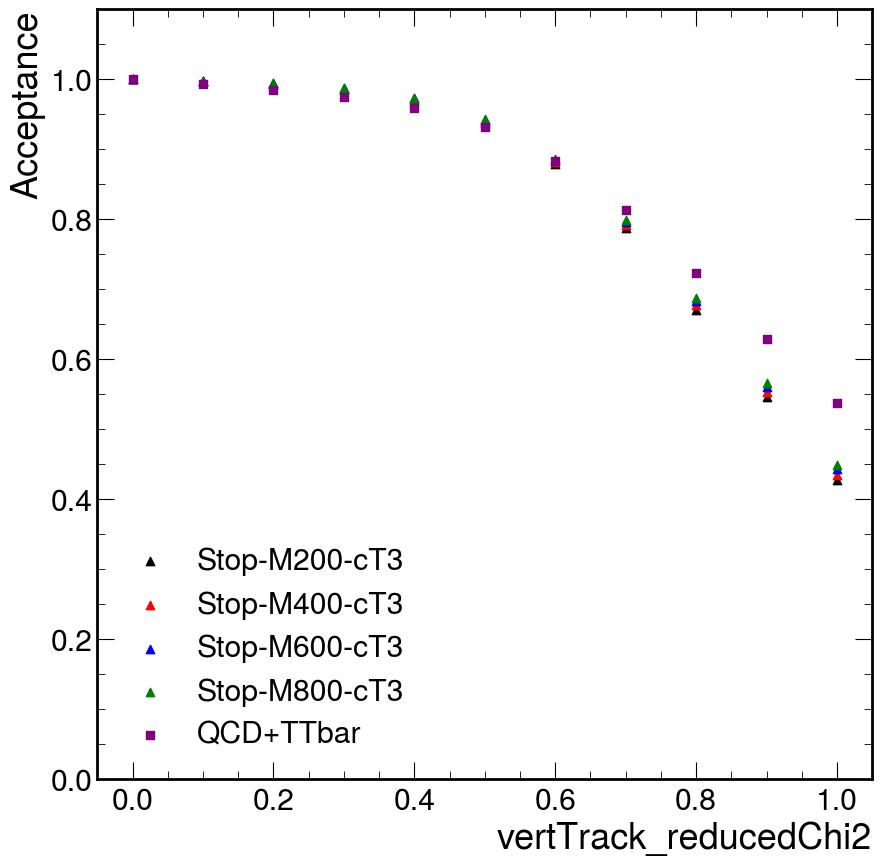

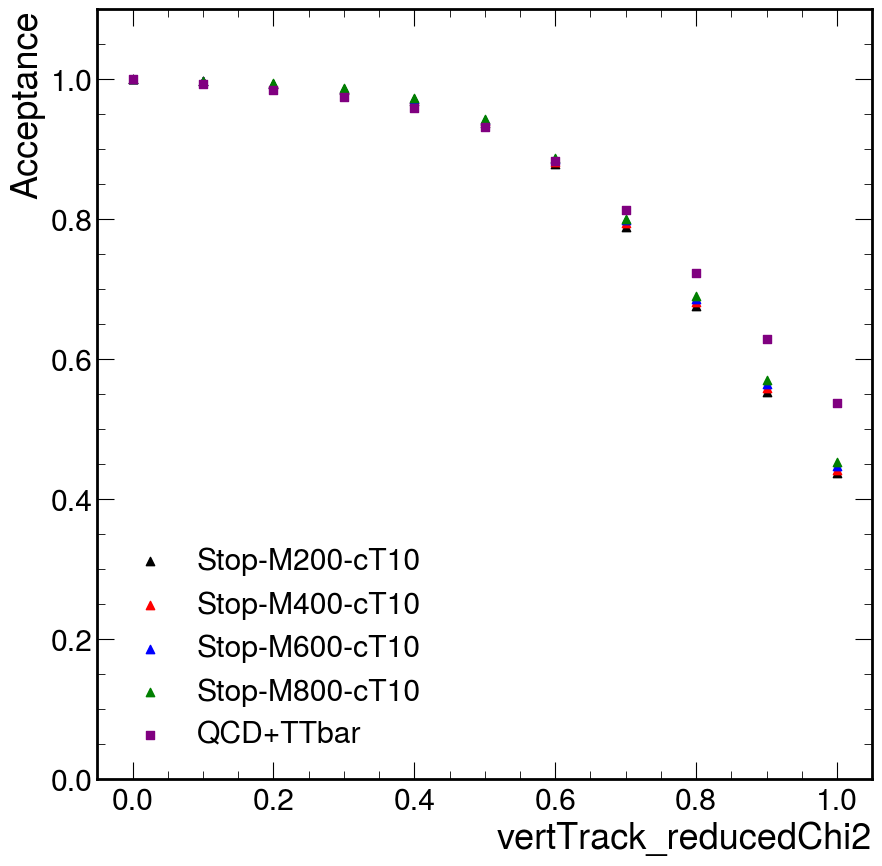

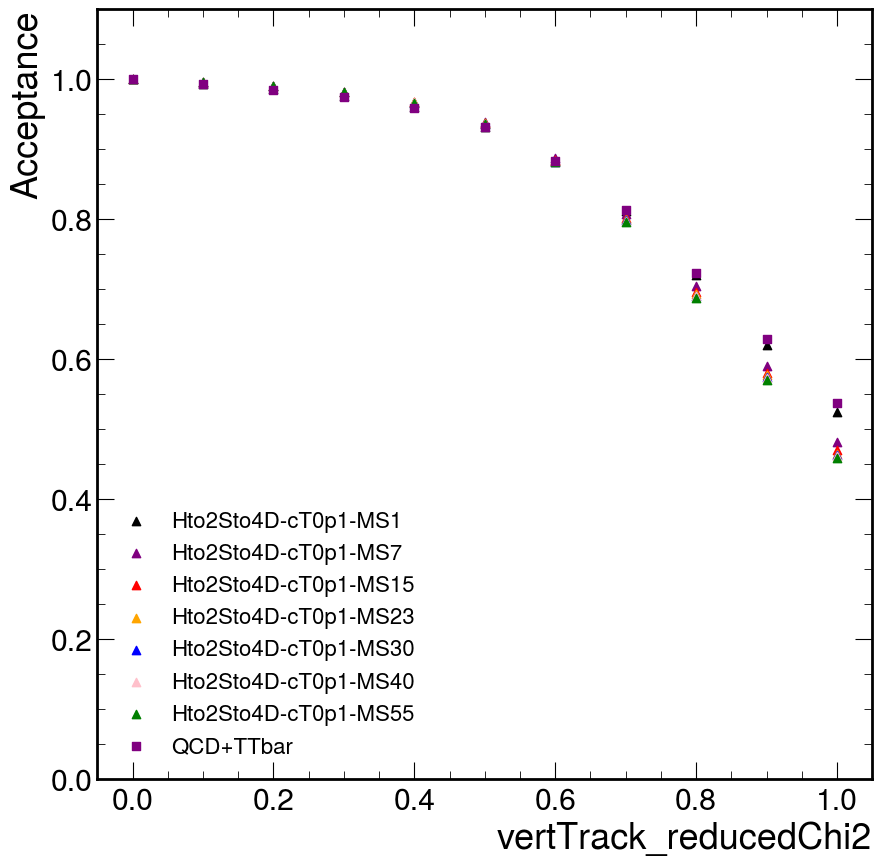

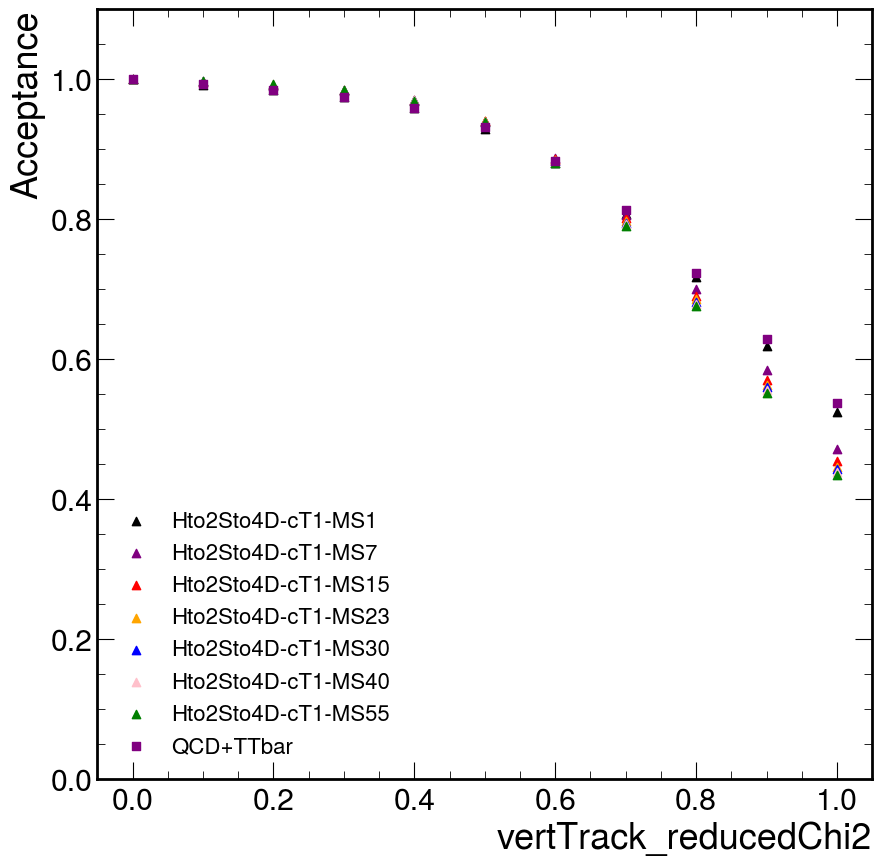

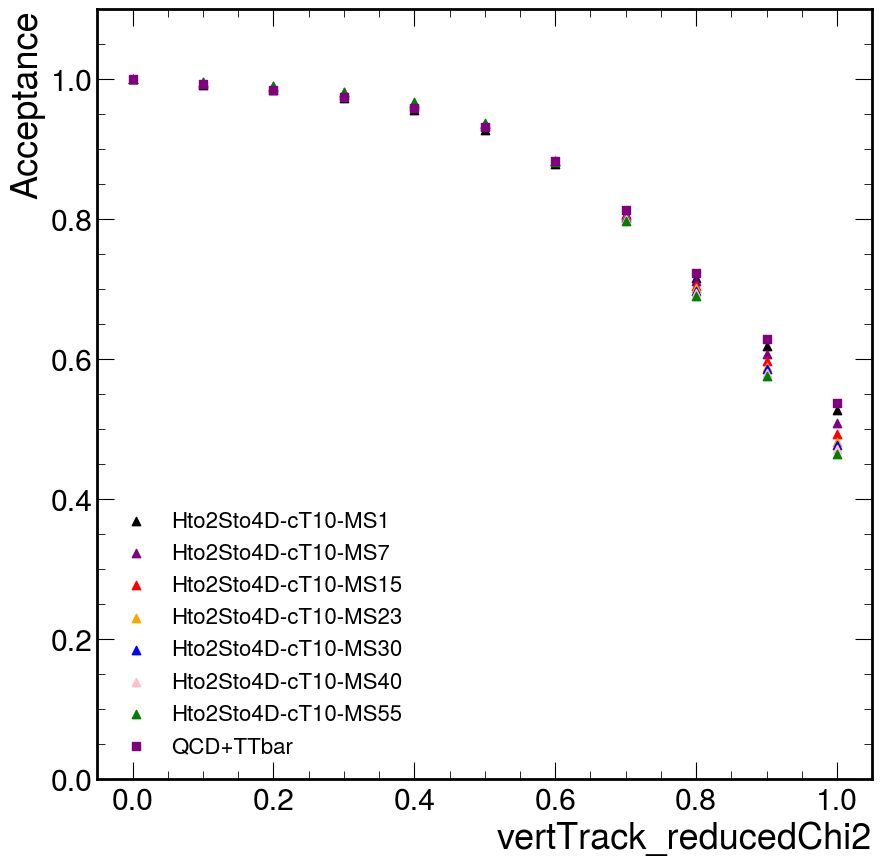

Processing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-LooseTrackCuts/251107_195505/TTtoLNu2Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v22-LooseTrackCuts/251107_195607/QCD-4Jets_Bin-HT-400to600.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v22-LooseTrackCuts/251107_195657/QCD-4Jets_Bin-HT-100to200.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v22-LooseTrackCuts/251107_195457/TTto4Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v22-LooseTrackCuts/251107_195647/QCD-4Jets_Bin-HT-70to100.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QC

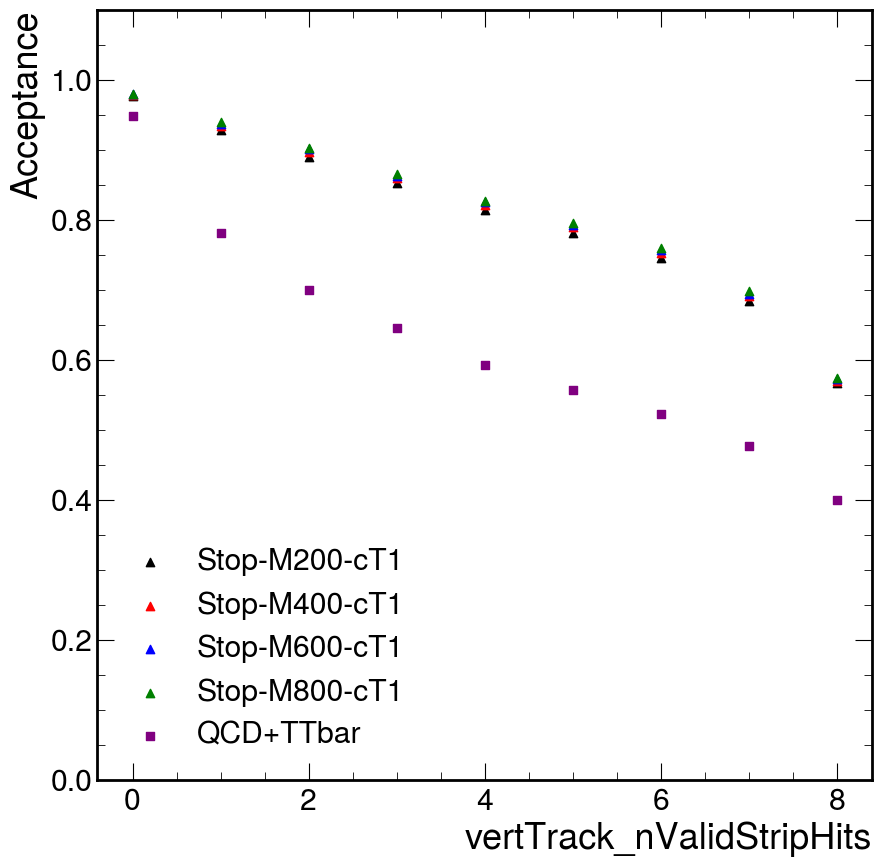

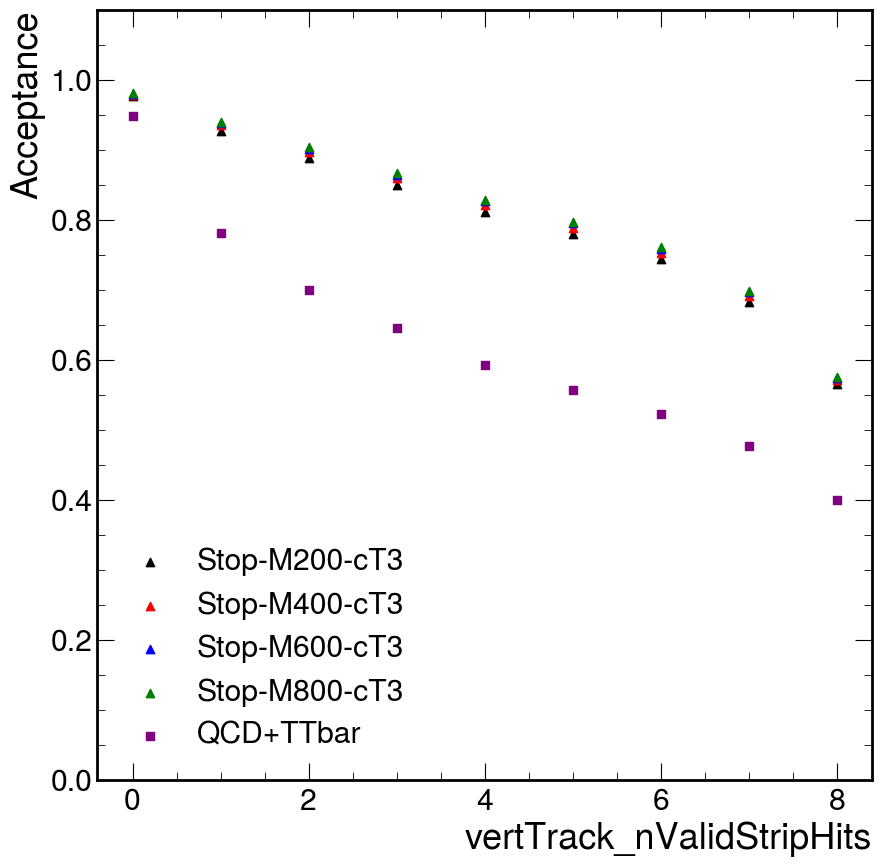

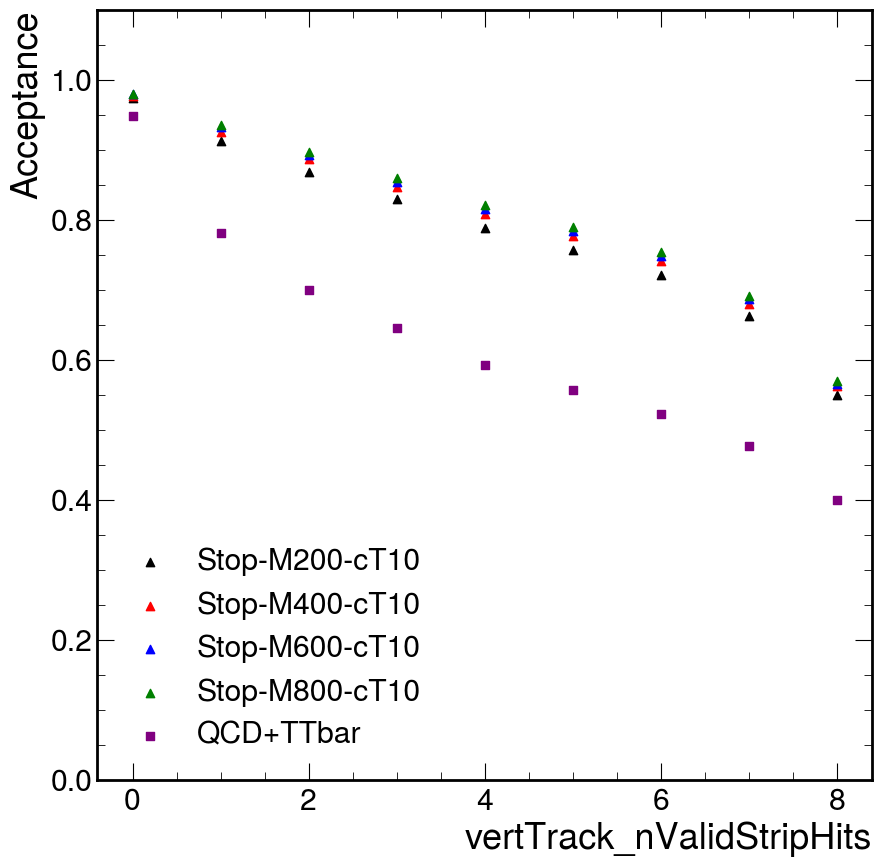

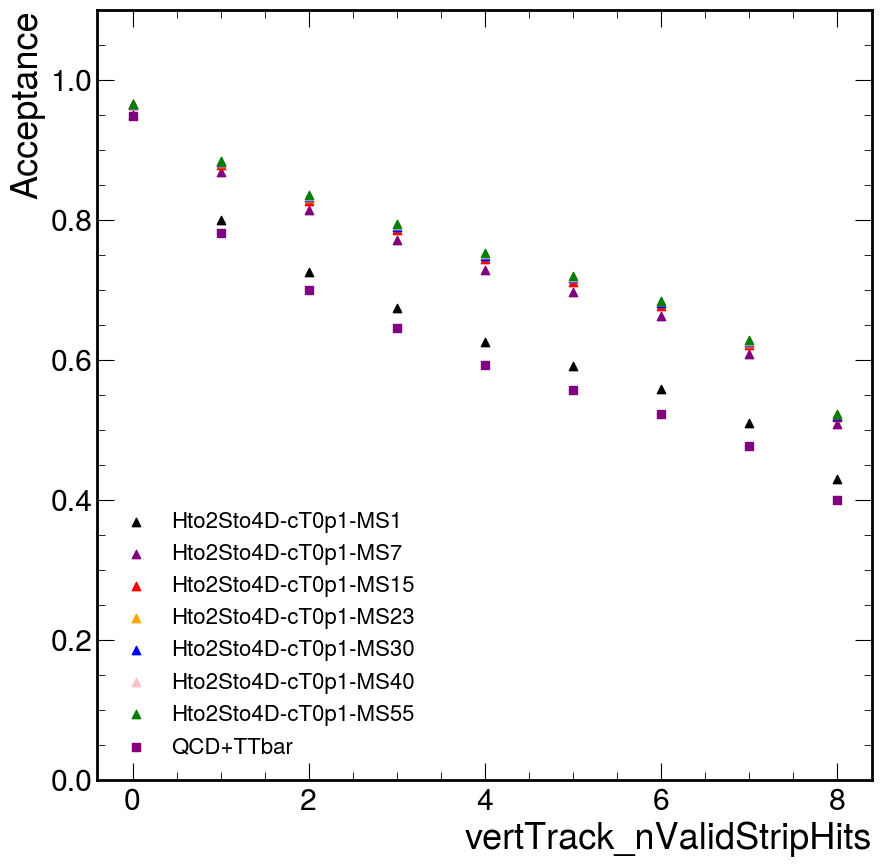

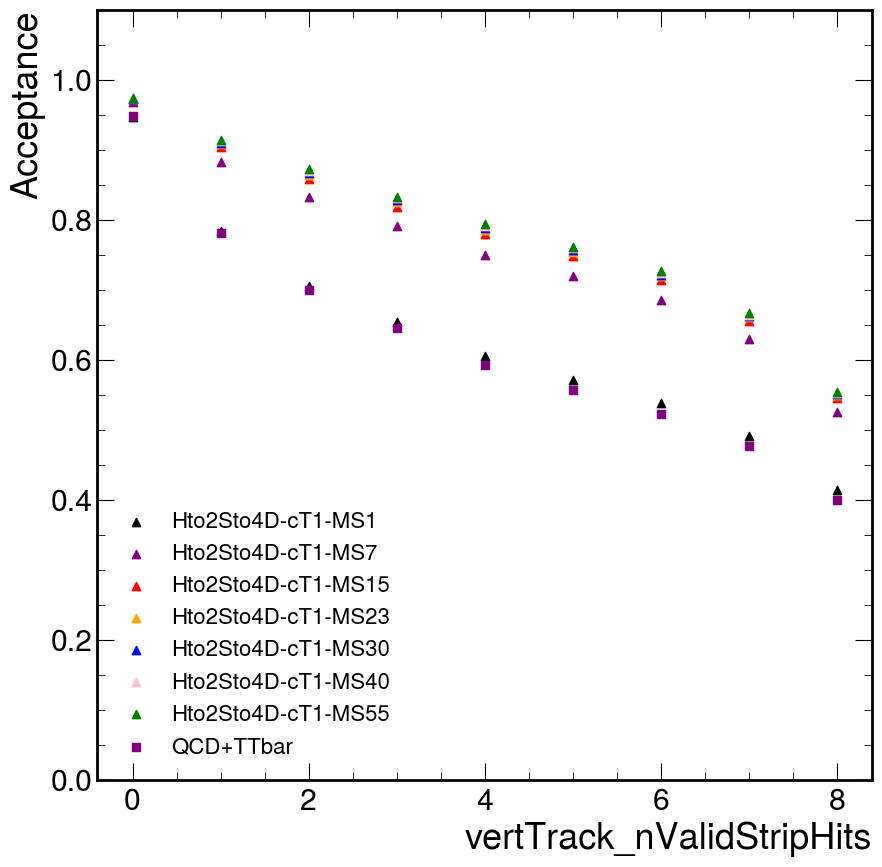

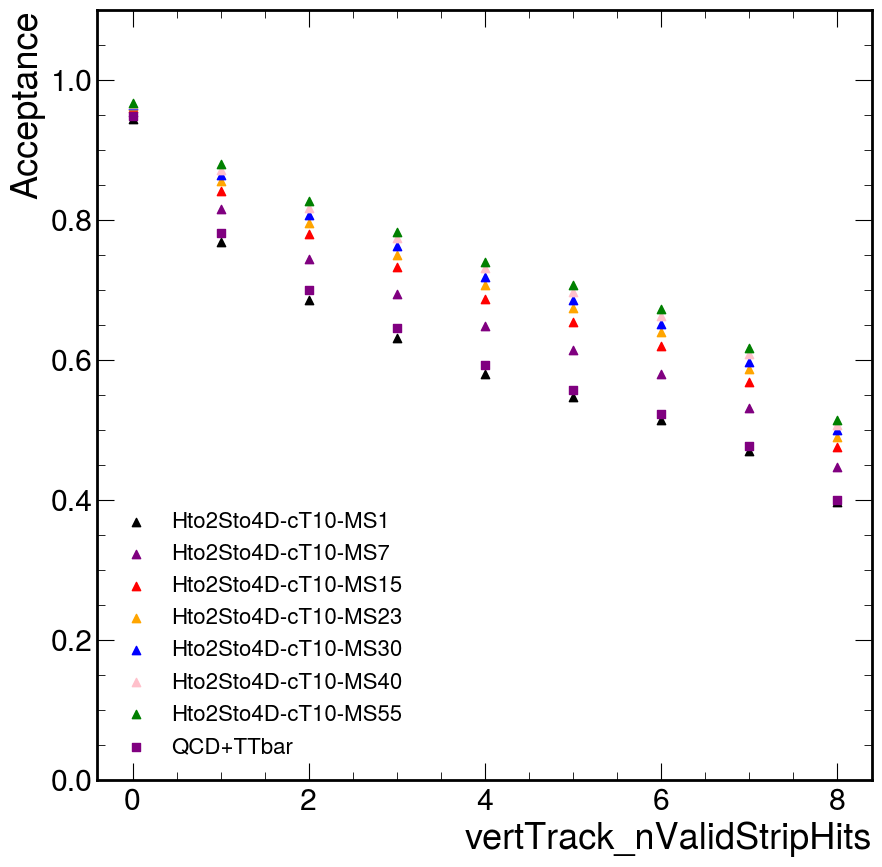

Total runtime: 301.32 seconds


In [7]:
#Track Cut Search Script
import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed

ptTrackCuts = np.linspace(1,3,21)
#dxySigCuts = np.linspace(4,8,9)
#pixelHitsCuts = np.linspace(1,3,3)
#nTrackerLayersCuts = np.linspace(5,9,5)

cutDict = {"vertTrack_pt": np.linspace(1,3,21), "vertTrack_dxySig": np.linspace(0.5,8,16), "vertTrack_nValidPixelHits": np.linspace(1,3,3), "vertTrack_nTrackerLayersWithMeasurement": np.linspace(3,9,7), "vertTrack_reducedChi2": np.linspace(0,1,11), "vertTrack_nValidStripHits": np.linspace(0,8,9)}

def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    with uproot.open(rootFile) as file:
        output["genWeightSum"] = {process: file["triggerFilter/genWeightsSkim"].values()[0]}
        tree = file["scoutingTree/objectTree"]
        # Select only necessary branches to load
        branches = ["weight",branch,"vertTrack_iVtx","scoutVert_dBV"]
        #weightSum = np.zeros((len(ptTrackCuts),len(dxySigCuts),len(pixelHitsCuts),len(nTrackerLayersCuts)))
        weightSum = np.zeros((len(cuts)))
        #weightSumSquared = np.zeros((len(ptTrackCuts),len(dxySigCuts),len(pixelHitsCuts),len(nTrackerLayersCuts)))
        weightSumSquared = np.zeros((len(cuts)))
        weightSkimSum = 0
        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        nbatch = 0;
        for batch in tree.iterate(branches, library="ak", step_size=100000):
            nbatch += 1
            if(nbatch>10):
                break
            weights = batch["weight"]  # event weights
            data = batch[branch]
            if "vertTrack" in branch:
                mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.01) & (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] < 2.0)
            data = data[mask]
            #dxySig = batch["vertTrack_dxySig"]
            #npixel = batch["vertTrack_nValidPixelHits"]
            #ntracker = batch["vertTrack_nTrackerLayersWithMeasurement"]
            nTracks = ak.num(data,axis=1)
            weightSkimSum += ak.sum(nTracks*weights)
            masks = [(data > cuts[i]) for i in range(len(cuts))]
            #dxyMasks = [(dxySig > dxySigCuts[j]) for j in range(len(dxySigCuts))]
            #pixelMasks = [(npixel > pixelHitsCuts[k]) for k in range(len(pixelHitsCuts))]
            #trackerMasks = [(ntracker > nTrackerLayersCuts[l]) for l in range(len(nTrackerLayersCuts))]
            for i in range(len(cuts)):
            #for j in range(len(dxySigCuts)):
            #for k in range(len(pixelHitsCuts)):
            #for l in range(len(nTrackerLayersCuts)):
                mask = masks[i] #& dxyMasks[j] & pixelMasks[k] & trackerMasks[l]
                dataMasked = data[mask]
                nTracks = ak.num(dataMasked,axis=1)
                weightSum[i] += ak.sum(nTracks*weights)
                weightSumSquared[i] += ak.sum(nTracks*(weights**2))
        output["weightSum"] = {process: weightSum}
        output["weightSumSquared"] = {process: weightSumSquared}
        output["weightSkimSum"] = {process: weightSkimSum}
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        if process not in results[plot]:
                             results[plot][process] = result[plot][process]
                        else:
                            results[plot][process] = results[plot][process] + result[plot][process]

    return results

t0 = time.time()

for branch, cuts in cutDict.items():

    bgPlotWeights = parallel_processing(processDict)
    sigPlotWeights = parallel_processing(signalDict)

    #Combining Background Subprocesses and Reweighting Events
    for process in bgPlotWeights["genWeightSum"].keys():
        bgPlotWeights["weightSum"][process] = bgPlotWeights["weightSum"][process] / bgPlotWeights["genWeightSum"][process]
        bgPlotWeights["weightSkimSum"][process] = bgPlotWeights["weightSkimSum"][process] / bgPlotWeights["genWeightSum"][process]
        bgPlotWeights["weightSumSquared"][process] = bgPlotWeights["weightSumSquared"][process] / (bgPlotWeights["genWeightSum"][process]**2)
    bgPlotWeights["weightSum"]["QCD"] = bgPlotWeights["weightSum"]["QCD40to70"]+bgPlotWeights["weightSum"]["QCD70to100"]+bgPlotWeights["weightSum"]["QCD100to200"]+bgPlotWeights["weightSum"]["QCD200to400"]+bgPlotWeights["weightSum"]["QCD400to600"]+bgPlotWeights["weightSum"]["QCD600to800"]+bgPlotWeights["weightSum"]["QCD800to1000"]+bgPlotWeights["weightSum"]["QCD1000to1200"]+bgPlotWeights["weightSum"]["QCD1200to1500"]+bgPlotWeights["weightSum"]["QCD1500to2000"]+bgPlotWeights["weightSum"]["QCD2000"]
    bgPlotWeights["weightSkimSum"]["QCD"] = bgPlotWeights["weightSkimSum"]["QCD40to70"]+bgPlotWeights["weightSkimSum"]["QCD70to100"]+bgPlotWeights["weightSkimSum"]["QCD100to200"]+bgPlotWeights["weightSkimSum"]["QCD200to400"]+bgPlotWeights["weightSkimSum"]["QCD400to600"]+bgPlotWeights["weightSkimSum"]["QCD600to800"]+bgPlotWeights["weightSkimSum"]["QCD800to1000"]+bgPlotWeights["weightSkimSum"]["QCD1000to1200"]+bgPlotWeights["weightSkimSum"]["QCD1200to1500"]+bgPlotWeights["weightSkimSum"]["QCD1500to2000"]+bgPlotWeights["weightSkimSum"]["QCD2000"]
    bgPlotWeights["weightSumSquared"]["QCD"] = bgPlotWeights["weightSumSquared"]["QCD40to70"]+bgPlotWeights["weightSumSquared"]["QCD70to100"]+bgPlotWeights["weightSumSquared"]["QCD100to200"]+bgPlotWeights["weightSumSquared"]["QCD200to400"]+bgPlotWeights["weightSumSquared"]["QCD400to600"]+bgPlotWeights["weightSumSquared"]["QCD600to800"]+bgPlotWeights["weightSumSquared"]["QCD800to1000"]+bgPlotWeights["weightSumSquared"]["QCD1000to1200"]+bgPlotWeights["weightSumSquared"]["QCD1200to1500"]+bgPlotWeights["weightSumSquared"]["QCD1500to2000"]+bgPlotWeights["weightSumSquared"]["QCD2000"]
    bgPlotWeights["weightSum"]["TTbar"] = bgPlotWeights["weightSum"]["TTTo4Q"]+bgPlotWeights["weightSum"]["TTToLNu2Q"]
    bgPlotWeights["weightSkimSum"]["TTbar"] = bgPlotWeights["weightSkimSum"]["TTTo4Q"]+bgPlotWeights["weightSkimSum"]["TTToLNu2Q"]
    bgPlotWeights["weightSumSquared"]["TTbar"] = bgPlotWeights["weightSumSquared"]["TTTo4Q"]+bgPlotWeights["weightSumSquared"]["TTToLNu2Q"]
    for process in sigPlotWeights["genWeightSum"].keys():
        sigPlotWeights["weightSum"][process] = sigPlotWeights["weightSum"][process] / sigPlotWeights["genWeightSum"][process]
        sigPlotWeights["weightSkimSum"][process] = sigPlotWeights["weightSkimSum"][process] / sigPlotWeights["genWeightSum"][process]
        sigPlotWeights["weightSumSquared"][process] = sigPlotWeights["weightSumSquared"][process] / (sigPlotWeights["genWeightSum"][process]**2)

    # **Plotting**
    for lifetime in ["1","3","10"]:
        fig, ax = plt.subplots()
        colors = {"Stop-M200-cT"+lifetime: "black", "Stop-M400-cT"+lifetime: "red", "Stop-M600-cT"+lifetime: "blue", "Stop-M800-cT"+lifetime: "green"}
        for signal, color in colors.items():
            efficiency = sigPlotWeights["weightSum"][signal] / sigPlotWeights["weightSkimSum"][signal]
            ax.scatter(cuts,efficiency,label=signal,color=color,marker="^")
        fpr = (bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"]) / (bgPlotWeights["weightSkimSum"]["QCD"]+bgPlotWeights["weightSkimSum"]["TTbar"])
        ax.scatter(cuts,fpr,label="QCD+TTbar",color="purple",marker="s")
        ax.set_ylabel("Acceptance")
        plt.xlabel(branch)
        plt.legend()
        ax.set_ylim(0.0,1.1)
        #plt.xscale("symlog",linthresh=10**-11)
        plt.show()
    
    for lifetime in ["0p1","1","10"]:
        fig, ax = plt.subplots()
        colors = {"Hto2Sto4D-cT"+lifetime+"-MS1": "black", "Hto2Sto4D-cT"+lifetime+"-MS7": "purple", "Hto2Sto4D-cT"+lifetime+"-MS15": "red", "Hto2Sto4D-cT"+lifetime+"-MS23": "orange", "Hto2Sto4D-cT"+lifetime+"-MS30": "blue", "Hto2Sto4D-cT"+lifetime+"-MS40": "pink", "Hto2Sto4D-cT"+lifetime+"-MS55": "green"}
        for signal, color in colors.items():
            efficiency = sigPlotWeights["weightSum"][signal] / sigPlotWeights["weightSkimSum"][signal]
            ax.scatter(cuts,efficiency,label=signal,color=color,marker="^")
        fpr = (bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"]) / (bgPlotWeights["weightSkimSum"]["QCD"]+bgPlotWeights["weightSkimSum"]["TTbar"])
        ax.scatter(cuts,fpr,label="QCD+TTbar",color="purple",marker="s")
        ax.set_ylabel("Acceptance")
        plt.xlabel(branch)
        plt.legend(fontsize=16)
        ax.set_ylim(0.0,1.1)
        #plt.xscale("symlog",linthresh=10**-11)
        plt.show()

t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")

Processing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v22-Optimized/251203_010402/TTtoLNu2Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v22-Optimized/251203_010655/QCD-4Jets_Bin-HT-70to100.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v22-Optimized/251203_010346/TTto4Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v22-Optimized/251203_010711/QCD-4Jets_Bin-HT-100to200.root


Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v22-Optimized/251203_010640/QCD-4Jets_Bin-HT-40to70.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_Tun

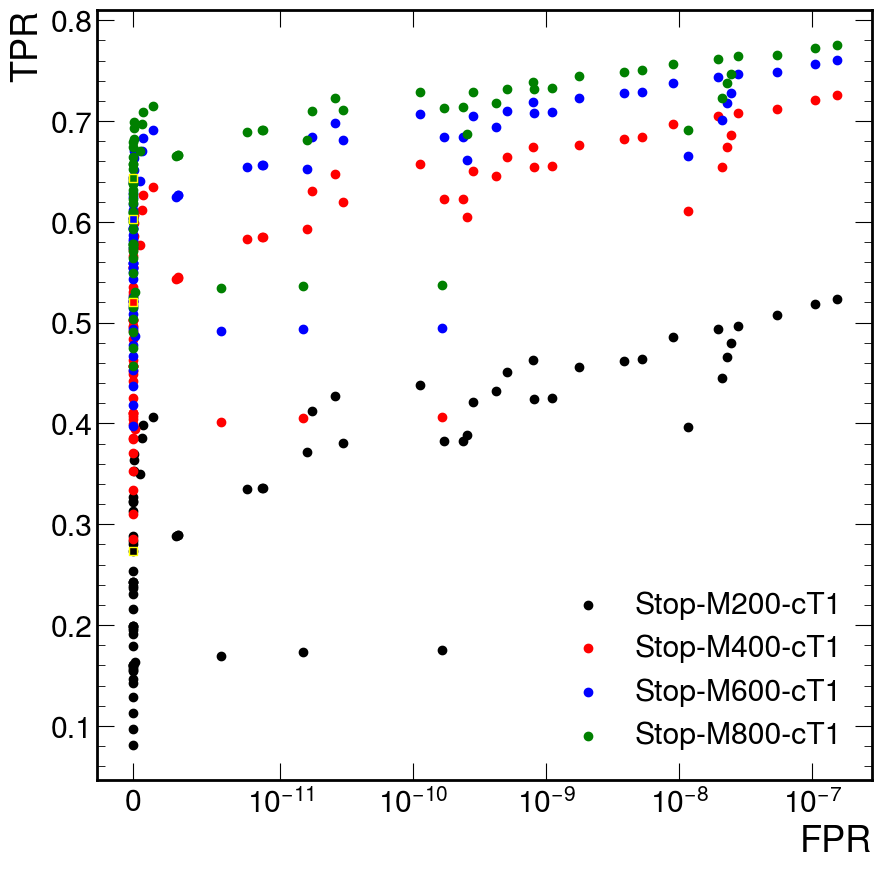

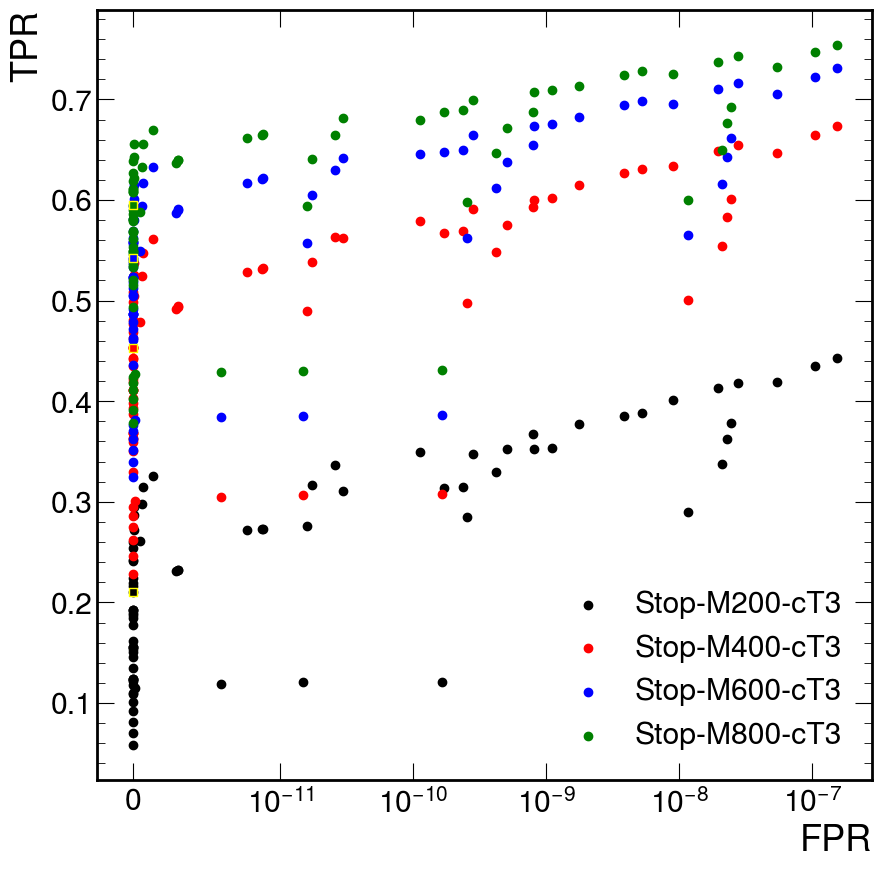

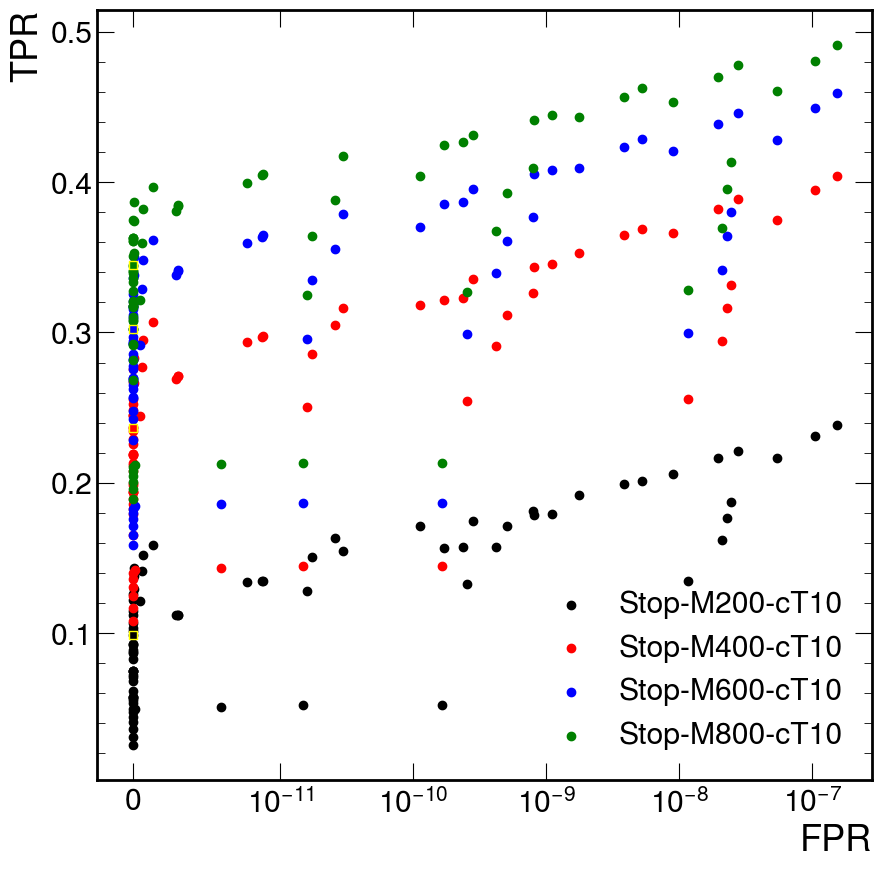

/tmp/rmccarth/ipykernel_1586090/2749573720.py:181: RuntimeWarning: invalid value encountered in divide
  sensitivity = sigPlotWeights["weightSum"][signal] / np.sqrt(sigPlotWeights["weightSum"][signal]+bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"])


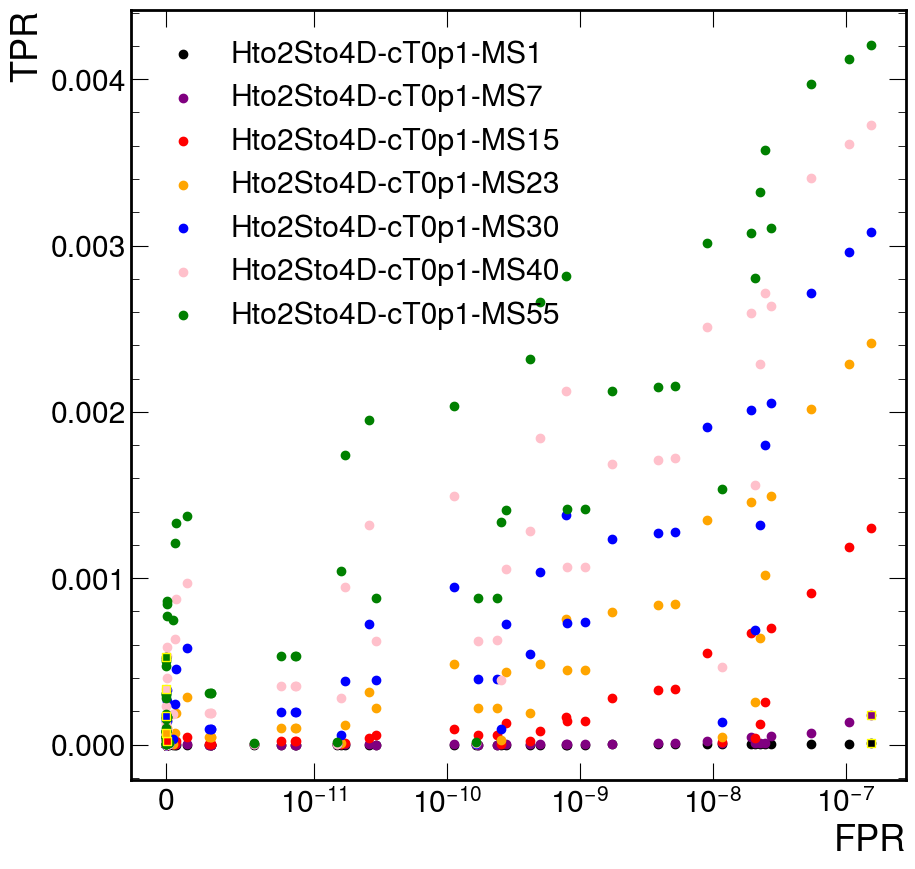

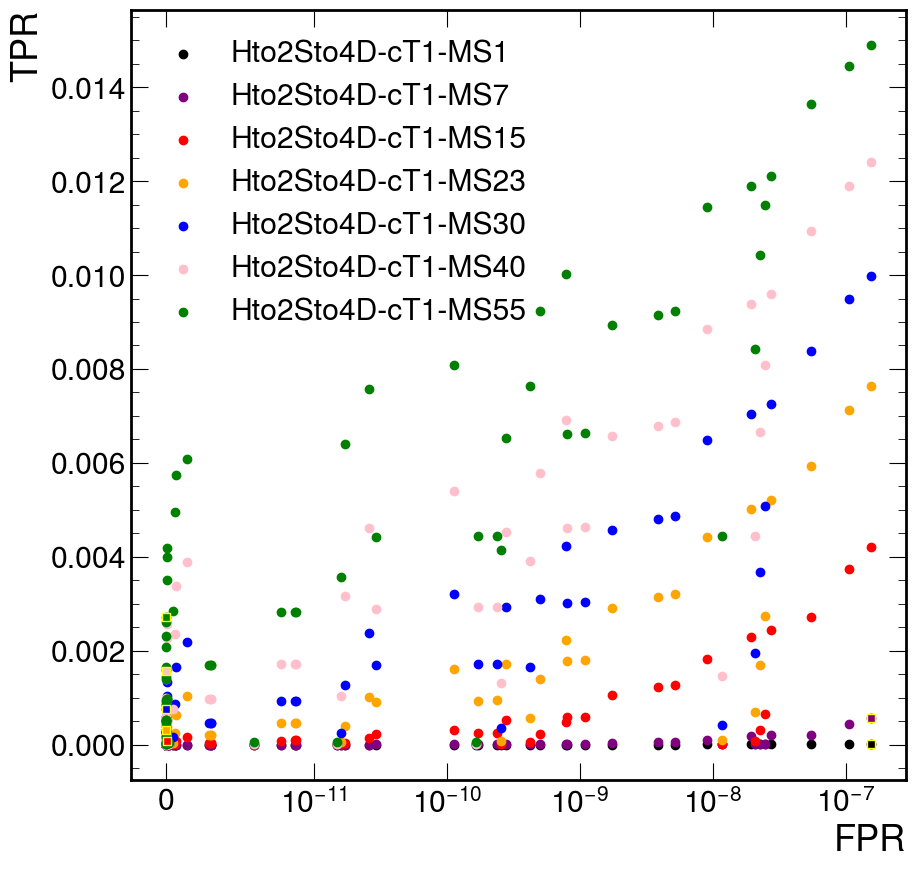

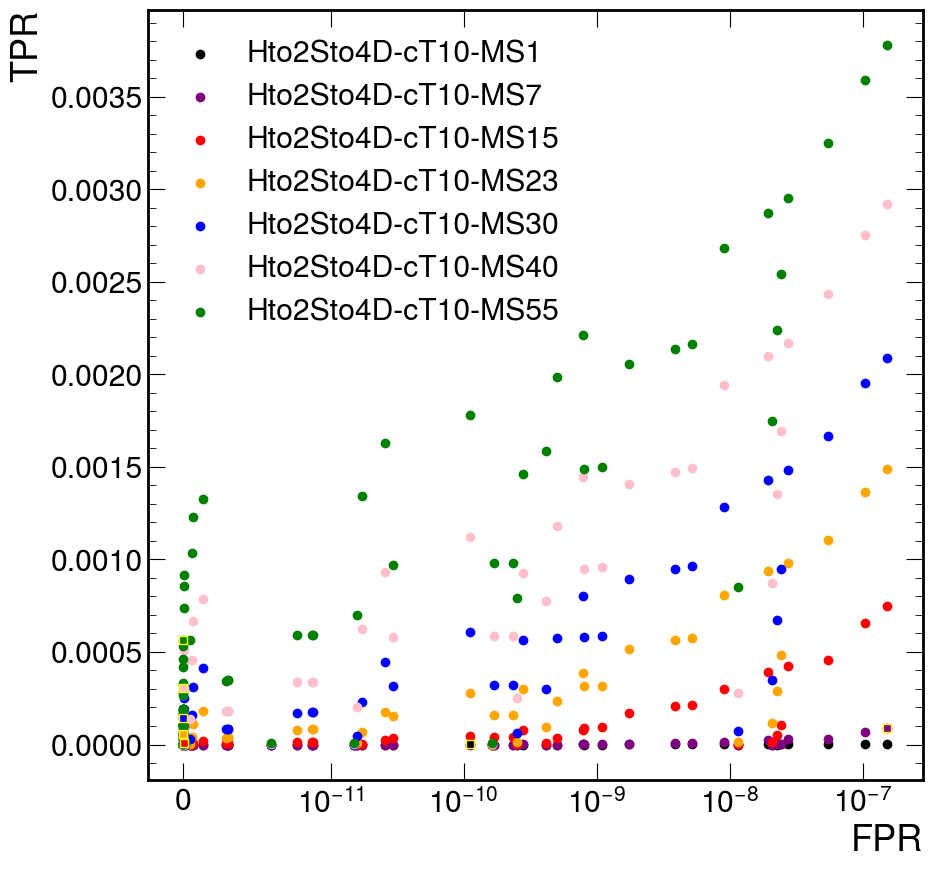

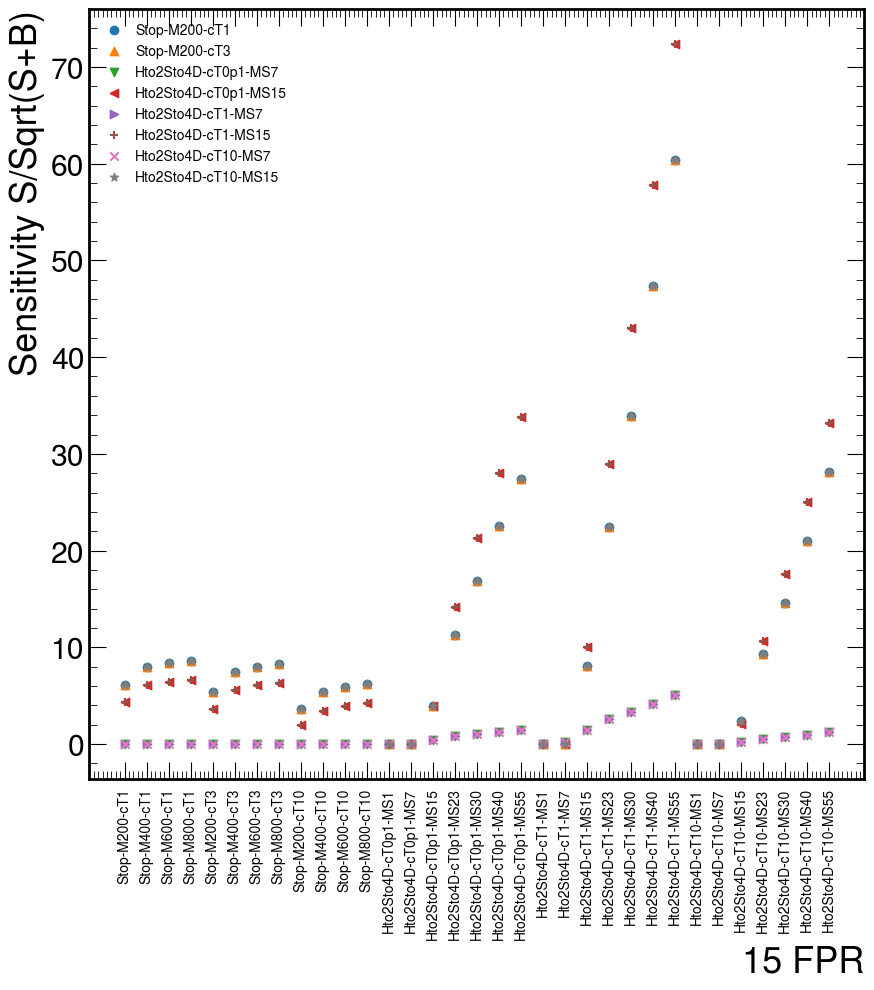

Total runtime: 48.22 seconds
total background: 43297639660192.31
best traditional sensitivity for signal Stop-M200-cT1 is 6.10218725272127 sig eff: 0.36978436514842256 fpr: 7.619781931090443e-14 requiring > 7.0 tracks and < 0.005000 uncertainty with shift < 999.9
best traditional sensitivity for signal Stop-M400-cT1 is 7.933186821425988 sig eff: 0.6065210005301066 fpr: 7.619781931090443e-14 requiring > 7.0 tracks and < 0.005000 uncertainty with shift < 999.9
best traditional sensitivity for signal Stop-M600-cT1 is 8.37482124277189 sig eff: 0.6448970840779826 fpr: 2.7914907084844584e-15 requiring > 8.0 tracks and < 0.005000 uncertainty with shift < 999.9
best traditional sensitivity for signal Stop-M800-cT1 is 8.596664093171617 sig eff: 0.6795287987171508 fpr: 2.7914907084844584e-15 requiring > 8.0 tracks and < 0.005000 uncertainty with shift < 999.9
best traditional sensitivity for signal Stop-M200-cT3 is 5.397803508159547 sig eff: 0.2949033209954648 fpr: 7.619781931090443e-14 requirin

In [7]:
#Vertex and Track Cut Sensitivity Search Script Reoptimization
import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed

#5% fpr cuts
#shiftCuts = np.linspace(0.001,0.008,8)
#shiftCuts = np.append(shiftCuts,[9999.9])
errCuts = np.linspace(0.005,0.02,4)[::-1]
errCuts = np.append(errCuts,[0.004,0.003,0.002,0.001])
nTrackCuts = np.linspace(3,12,10)

shiftCuts = np.linspace(999.9,999.9,1)
#errCuts = np.linspace(999.9,999.9,1)
#nTrackCuts = np.linspace(7,7,1)

"""
def fast_count_vertices_numpy(ivtxMasked, dBV):
    result = []
    for ind_event, dBV_event in zip(ivtxMasked, dBV):
        counts = np.zeros(len(dBV_event), dtype=int)
        np.add.at(counts, np.array(ind_event), 1)
        result.append(counts)
    return ak.Array(result)
"""

def fast_count_vertices_numpy(ivtxMasked, dBV):
    # Get the number of vertices per event (length of each dBV event)
    n_vertices = ak.num(dBV)
    
    # Create flat indices for all events
    # This creates [0,1,2,...,n_vertices[0]-1, 0,1,2,...,n_vertices[1]-1, ...]
    flat_indices = ak.local_index(dBV, axis=1)
    
    # Flatten the ivtxMasked to work with all events at once
    flat_ivtx = ak.flatten(ivtxMasked)
    
    # Create event indices for each element in flat_ivtx
    event_idx = np.repeat(np.arange(len(ivtxMasked)), ak.num(ivtxMasked))
    
    # Calculate cumulative offsets for each event
    offsets = np.concatenate([[0], np.cumsum(n_vertices[:-1])])
    
    # Adjust indices to global flat array
    global_indices = flat_ivtx + offsets[event_idx]
    
    # Count using bincount
    total_vertices = np.sum(n_vertices)
    counts_flat = np.bincount(global_indices, minlength=total_vertices)
    
    # Unflatten back to jagged structure
    return ak.unflatten(counts_flat, n_vertices)

def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    with uproot.open(rootFile) as file:
        output["genWeightSum"] = {process: file["triggerFilter/genWeightsSkim"].values()[0]}
        output["weightSkimSum"] = {process: file["triggerFilter/weightsSkim"].values()[0]}
        tree = file["scoutingTree/objectTree"]
        # Select only necessary branches to load
        branches = ["weight","scoutVert_dBV","scoutVert_dBVErr","scoutVert_cosT","vertTrack_iVtx","vertTrack_shift3DValue"]
        weightSum = np.zeros((len(shiftCuts),len(errCuts),len(nTrackCuts)))
        weightSumSquared = np.zeros((len(shiftCuts),len(errCuts),len(nTrackCuts)))
        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        for batch in tree.iterate(branches, library="ak", step_size=100000):
            weights = batch["weight"]  # event weights   
            mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.01) & (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] < 2) & (batch["scoutVert_cosT"][batch["vertTrack_iVtx"]] > 0)
            shift = batch["vertTrack_shift3DValue"][mask]
            ivtx = batch["vertTrack_iVtx"][mask]
            
            shiftMasks = [(shift < shiftCuts[b]) for b in range(len(shiftCuts))]
            
            dBV = batch["scoutVert_dBV"]
            dBVErr = batch["scoutVert_dBVErr"]
            cosT = batch["scoutVert_cosT"]
            dBVMask = (dBV >= 0.01) & (dBV < 2) & (cosT>0)
            dBVErrMask = [(dBVErr < errCuts[m]) for m in range(len(errCuts))]
            
            for b in range(len(shiftCuts)):
                mask = shiftMasks[b]
                ivtxMasked = ivtx[mask]
                ntracks = fast_count_vertices_numpy(ivtxMasked, dBV)
                ntrackMasks = [(ntracks > nTrackCuts[n]) for n in range(len(nTrackCuts))]
                for m in range(len(errCuts)):
                    for n in range(len(nTrackCuts)):
                        mask = dBVMask & dBVErrMask[m] & ntrackMasks[n]
                        dBVMasked = dBV[mask]
                        mask = ak.num(dBVMasked,axis=1)>0
                        weightsMasked = weights[mask]
                        weightSum[b][m][n] += ak.sum(weightsMasked)
                        weightSumSquared[b][m][n] += ak.sum(weightsMasked**2)
        output["weightSum"] = {process: weightSum}
        output["weightSumSquared"] = {process: weightSumSquared}
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        if process not in results[plot]:
                             results[plot][process] = result[plot][process]
                        else:
                            results[plot][process] = results[plot][process] + result[plot][process]

    return results

t0 = time.time()

bestEfficiencySensitivity = {"Stop-M200-cT1": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M400-cT1": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M600-cT1": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M800-cT1": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M200-cT3": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M400-cT3": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M600-cT3": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M800-cT3": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M200-cT10": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M400-cT10": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M600-cT10": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M800-cT10": [0,0,0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT1-MS1": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT1-MS7": [0,0,0,0,0,0,0,0,0,0],"Hto2Sto4D-cT1-MS15": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT1-MS23": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT1-MS30": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT1-MS40": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT1-MS55": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT0p1-MS1": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT0p1-MS7": [0,0,0,0,0,0,0,0,0,0],"Hto2Sto4D-cT0p1-MS15": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT0p1-MS23": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT0p1-MS30": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT0p1-MS40": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT0p1-MS55": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT10-MS1": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT10-MS7": [0,0,0,0,0,0,0,0,0,0],"Hto2Sto4D-cT10-MS15": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT10-MS23": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT10-MS30": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT10-MS40": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT10-MS55": [0,0,0,0,0,0,0,0,0,0]}
bestTraditionalSensitivity = {"Stop-M200-cT1": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M400-cT1": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M600-cT1": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M800-cT1": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M200-cT3": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M400-cT3": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M600-cT3": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M800-cT3": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M200-cT10": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M400-cT10": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M600-cT10": [0,0,0,0,0,0,0,0,0,0,0,0], "Stop-M800-cT10": [0,0,0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT1-MS1": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT1-MS7": [0,0,0,0,0,0,0,0,0,0],"Hto2Sto4D-cT1-MS15": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT1-MS23": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT1-MS30": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT1-MS40": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT1-MS55": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT0p1-MS1": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT0p1-MS7": [0,0,0,0,0,0,0,0,0,0],"Hto2Sto4D-cT0p1-MS15": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT0p1-MS23": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT0p1-MS30": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT0p1-MS40": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT0p1-MS55": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT10-MS1": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT10-MS7": [0,0,0,0,0,0,0,0,0,0],"Hto2Sto4D-cT10-MS15": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT10-MS23": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT10-MS30": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT10-MS40": [0,0,0,0,0,0,0,0,0,0], "Hto2Sto4D-cT10-MS55": [0,0,0,0,0,0,0,0,0,0]}

bgPlotWeights = parallel_processing(processDict)
sigPlotWeights = parallel_processing(signalDict)

#Combining Background Subprocesses and Reweighting Events
for process in bgPlotWeights["genWeightSum"].keys():
    bgPlotWeights["weightSum"][process] = bgPlotWeights["weightSum"][process] / bgPlotWeights["genWeightSum"][process]
    bgPlotWeights["weightSkimSum"][process] = bgPlotWeights["weightSkimSum"][process] / bgPlotWeights["genWeightSum"][process]
    bgPlotWeights["weightSumSquared"][process] = bgPlotWeights["weightSumSquared"][process] / (bgPlotWeights["genWeightSum"][process]**2)
bgPlotWeights["weightSum"]["QCD"] = bgPlotWeights["weightSum"]["QCD40to70"]+bgPlotWeights["weightSum"]["QCD70to100"]+bgPlotWeights["weightSum"]["QCD100to200"]+bgPlotWeights["weightSum"]["QCD200to400"]+bgPlotWeights["weightSum"]["QCD400to600"]+bgPlotWeights["weightSum"]["QCD600to800"]+bgPlotWeights["weightSum"]["QCD800to1000"]+bgPlotWeights["weightSum"]["QCD1000to1200"]+bgPlotWeights["weightSum"]["QCD1200to1500"]+bgPlotWeights["weightSum"]["QCD1500to2000"]+bgPlotWeights["weightSum"]["QCD2000"]
bgPlotWeights["weightSkimSum"]["QCD"] = bgPlotWeights["weightSkimSum"]["QCD40to70"]+bgPlotWeights["weightSkimSum"]["QCD70to100"]+bgPlotWeights["weightSkimSum"]["QCD100to200"]+bgPlotWeights["weightSkimSum"]["QCD200to400"]+bgPlotWeights["weightSkimSum"]["QCD400to600"]+bgPlotWeights["weightSkimSum"]["QCD600to800"]+bgPlotWeights["weightSkimSum"]["QCD800to1000"]+bgPlotWeights["weightSkimSum"]["QCD1000to1200"]+bgPlotWeights["weightSkimSum"]["QCD1200to1500"]+bgPlotWeights["weightSkimSum"]["QCD1500to2000"]+bgPlotWeights["weightSkimSum"]["QCD2000"]
bgPlotWeights["weightSumSquared"]["QCD"] = bgPlotWeights["weightSumSquared"]["QCD40to70"]+bgPlotWeights["weightSumSquared"]["QCD70to100"]+bgPlotWeights["weightSumSquared"]["QCD100to200"]+bgPlotWeights["weightSumSquared"]["QCD200to400"]+bgPlotWeights["weightSumSquared"]["QCD400to600"]+bgPlotWeights["weightSumSquared"]["QCD600to800"]+bgPlotWeights["weightSumSquared"]["QCD800to1000"]+bgPlotWeights["weightSumSquared"]["QCD1000to1200"]+bgPlotWeights["weightSumSquared"]["QCD1200to1500"]+bgPlotWeights["weightSumSquared"]["QCD1500to2000"]+bgPlotWeights["weightSumSquared"]["QCD2000"]
bgPlotWeights["weightSum"]["TTbar"] = bgPlotWeights["weightSum"]["TTTo4Q"]+bgPlotWeights["weightSum"]["TTToLNu2Q"]
bgPlotWeights["weightSkimSum"]["TTbar"] = bgPlotWeights["weightSkimSum"]["TTTo4Q"]+bgPlotWeights["weightSkimSum"]["TTToLNu2Q"]
bgPlotWeights["weightSumSquared"]["TTbar"] = bgPlotWeights["weightSumSquared"]["TTTo4Q"]+bgPlotWeights["weightSumSquared"]["TTToLNu2Q"]
for process in sigPlotWeights["genWeightSum"].keys():
    sigPlotWeights["weightSum"][process] = sigPlotWeights["weightSum"][process] / sigPlotWeights["genWeightSum"][process]
    sigPlotWeights["weightSkimSum"][process] = sigPlotWeights["weightSkimSum"][process] / sigPlotWeights["genWeightSum"][process]
    sigPlotWeights["weightSumSquared"][process] = sigPlotWeights["weightSumSquared"][process] / (sigPlotWeights["genWeightSum"][process]**2)

optimalCuts = {}
sensitivityMatrices = {}
# **Plotting**
for lifetime in ["1","3","10"]:
    fig, ax = plt.subplots()
    colors = {"Stop-M200-cT"+lifetime: "black", "Stop-M400-cT"+lifetime: "red", "Stop-M600-cT"+lifetime: "blue", "Stop-M800-cT"+lifetime: "green"}
    for signal, color in colors.items():
        sensitivity = sigPlotWeights["weightSum"][signal] / np.sqrt(sigPlotWeights["weightSum"][signal]+bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"])
        sensitivity = np.nan_to_num(sensitivity)
        efficiency = sigPlotWeights["weightSum"][signal] / sigPlotWeights["weightSkimSum"][signal]
        fpr = (bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"]) / (bgPlotWeights["weightSkimSum"]["QCD"]+bgPlotWeights["weightSkimSum"]["TTbar"])
        if(np.max(sensitivity)>bestTraditionalSensitivity[signal][0]): 
            ind = np.unravel_index(np.argmax(sensitivity, axis=None), sensitivity.shape)
            bestTraditionalSensitivity[signal] = [np.max(sensitivity),efficiency[ind],fpr[ind],shiftCuts[ind[0]],errCuts[ind[1]],nTrackCuts[ind[2]]]
            optimalCuts[signal] = ind
            sensitivityMatrices[signal] = sensitivity
        sensitivity = efficiency / (1+np.sqrt(bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"]))
        if(np.max(sensitivity)>bestEfficiencySensitivity[signal][0]): 
            ind = np.unravel_index(np.argmax(sensitivity, axis=None), sensitivity.shape)
            bestEfficiencySensitivity[signal] = [np.max(sensitivity),efficiency[ind],fpr[ind],shiftCuts[ind[0]],errCuts[ind[1]],nTrackCuts[ind[2]]]
        ax.scatter(fpr,efficiency,label=signal,color=color,zorder=1)
        ax.scatter(fpr[ind],efficiency[ind],marker="s",color=color,zorder=2,edgecolor="yellow")
        plt.xscale("symlog",linthresh=10**-11)
    ax.set_ylabel("TPR")
    #ax.set_ylim(0.0,0.7)
    plt.xlabel("FPR")
    plt.legend()
    #plt.savefig("15FPRStopEff"+lifetime+"_Merge3SigmaMinTV2.pdf")
    plt.show()

for lifetime in ["0p1","1","10"]:
    fig, ax = plt.subplots()
    colors = {"Hto2Sto4D-cT"+lifetime+"-MS1": "black", "Hto2Sto4D-cT"+lifetime+"-MS7": "purple", "Hto2Sto4D-cT"+lifetime+"-MS15": "red", "Hto2Sto4D-cT"+lifetime+"-MS23": "orange", "Hto2Sto4D-cT"+lifetime+"-MS30": "blue", "Hto2Sto4D-cT"+lifetime+"-MS40": "pink", "Hto2Sto4D-cT"+lifetime+"-MS55": "green"}
    for signal, color in colors.items():
        sensitivity = sigPlotWeights["weightSum"][signal] / np.sqrt(sigPlotWeights["weightSum"][signal]+bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"])
        sensitivity = np.nan_to_num(sensitivity)
        efficiency = sigPlotWeights["weightSum"][signal] / sigPlotWeights["weightSkimSum"][signal]
        fpr = (bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"]) / (bgPlotWeights["weightSkimSum"]["QCD"]+bgPlotWeights["weightSkimSum"]["TTbar"])
        if(np.max(sensitivity)>bestTraditionalSensitivity[signal][0]): 
            ind = np.unravel_index(np.argmax(sensitivity, axis=None), sensitivity.shape)
            bestTraditionalSensitivity[signal] = [np.max(sensitivity),efficiency[ind],fpr[ind],shiftCuts[ind[0]],errCuts[ind[1]],nTrackCuts[ind[2]]]
            optimalCuts[signal] = ind
            sensitivityMatrices[signal] = sensitivity
        sensitivity = efficiency / (1+np.sqrt(bgPlotWeights["weightSum"]["QCD"]+bgPlotWeights["weightSum"]["TTbar"]))
        if(np.max(sensitivity)>bestEfficiencySensitivity[signal][0]): 
            ind = np.unravel_index(np.argmax(sensitivity, axis=None), sensitivity.shape)
            bestEfficiencySensitivity[signal] = [np.max(sensitivity),efficiency[ind],fpr[ind],shiftCuts[ind[0]],errCuts[ind[1]],nTrackCuts[ind[2]]]
        ax.scatter(fpr,efficiency,label=signal,color=color,zorder=1)
        ax.scatter(fpr[ind],efficiency[ind],marker="s",color=color,zorder=2,edgecolor="yellow")
        plt.xscale("symlog",linthresh=10**-11)
    ax.set_ylabel("TPR")
    #ax.set_ylim(0.0,0.7)
    plt.xlabel("FPR")
    plt.legend()
    #plt.savefig("15FPRHiggsEff"+lifetime+"_Merge3SigmaMinTV2.pdf")
    plt.show()
    
markers = ["o","^","v","<",">","+","x","*",]
indexList = []
signalList = []
i_marker = 0
for signal, indices in optimalCuts.items():
    indexList.append(indices)
    signalList.append(signal)
for i_index in range(len(indexList)):
    if(signalList[i_index] not in {"Stop-M200-cT1","Stop-M200-cT3","Hto2Sto4D-cT0p1-MS7","Hto2Sto4D-cT0p1-MS15","Hto2Sto4D-cT1-MS7","Hto2Sto4D-cT1-MS15","Hto2Sto4D-cT10-MS7","Hto2Sto4D-cT10-MS15"}): continue
    sensitivityList = []
    for j in range(len(signalList)):
        sensitivity = sensitivityMatrices[signalList[j]][indexList[i_index]]
        sensitivityList.append(sensitivity)
    plt.scatter(signalList,sensitivityList,label=signalList[i_index],marker=markers[i_marker])
    i_marker += 1
plt.xlabel("15 FPR") 
plt.ylabel("Sensitivity S/Sqrt(S+B)")
plt.xticks(rotation=90,fontsize=10)
plt.legend(fontsize=10)
#plt.savefig("15FPROptimization_Merge3SigmaMinTV2.pdf")
plt.show()
    
t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")
print("total background:",bgPlotWeights["weightSkimSum"]["QCD"]+bgPlotWeights["weightSkimSum"]["TTbar"])
for signal, cuts in bestTraditionalSensitivity.items():
    print("best traditional sensitivity for signal",signal,"is",cuts[0],"sig eff:",cuts[1],"fpr:",cuts[2],"requiring >",cuts[5],"tracks and <",f"{cuts[4]:3f}","uncertainty with shift <",cuts[3])
for signal, cuts in bestEfficiencySensitivity.items():
    print("best efficiency sensitivity for signal",signal,"is",cuts[0],"sig eff:",cuts[1],"fpr:",cuts[2],"requiring >",cuts[5],"tracks and <",f"{cuts[4]:3f}","uncertainty with shift <",cuts[3])


In [9]:
if ("Hto2Sto4D-cT0p1-MS1" not in signalList):
    index = signalList.index("Stop-M800-cT10") + 1
    signalList.insert(index,"Hto2Sto4D-cT0p1-MS1")
    sensitivityList.insert(index,0)
if ("Hto2Sto4D-cT0p1-MS7" not in signalList):
    index = signalList.index("Hto2Sto4D-cT0p1-MS15")
    signalList.insert(index,"Hto2Sto4D-cT0p1-MS7")
    sensitivityList.insert(index,0)
if ("Hto2Sto4D-cT1-MS1" not in signalList):
    index = signalList.index("Hto2Sto4D-cT0p1-MS55") + 1
    signalList.insert(index,"Hto2Sto4D-cT1-MS1")
    sensitivityList.insert(index,0)
if ("Hto2Sto4D-cT1-MS7" not in signalList):
    index = signalList.index("Hto2Sto4D-cT1-MS15")
    signalList.insert(index,"Hto2Sto4D-cT1-MS7")
    sensitivityList.insert(index,0)
if ("Hto2Sto4D-cT10-MS1" not in signalList):
    index = signalList.index("Hto2Sto4D-cT1-MS55") + 1
    signalList.insert(index,"Hto2Sto4D-cT10-MS1")
    sensitivityList.insert(index,0)
if ("Hto2Sto4D-cT10-MS7" not in signalList):
    index = signalList.index("Hto2Sto4D-cT10-MS15")
    signalList.insert(index,"Hto2Sto4D-cT10-MS7")
    sensitivityList.insert(index,0)
print(sensitivityList)
print(signalList)

[6.10218725272127, 7.933186821425988, 8.35657153921824, 8.544265526826042, 5.397803508159547, 7.446782417400376, 7.989186909466096, 8.262467184929637, 3.5904196333146245, 5.378153303678435, 5.925855763719978, 6.253119859887979, 0.0, 0.0, 3.8946236880699048, 11.245533273992875, 16.810813651401496, 22.503244626314718, 27.4013205480772, 0.0, 0.0, 8.047572364508024, 22.492502179067536, 33.90689446920611, 47.33159111201111, 60.424565582326615, 0.0, 0.0, 2.386796108504285, 9.286198564723682, 14.617860168689557, 21.03042011758325, 28.167347632015602]
['Stop-M200-cT1', 'Stop-M400-cT1', 'Stop-M600-cT1', 'Stop-M800-cT1', 'Stop-M200-cT3', 'Stop-M400-cT3', 'Stop-M600-cT3', 'Stop-M800-cT3', 'Stop-M200-cT10', 'Stop-M400-cT10', 'Stop-M600-cT10', 'Stop-M800-cT10', 'Hto2Sto4D-cT0p1-MS1', 'Hto2Sto4D-cT0p1-MS7', 'Hto2Sto4D-cT0p1-MS15', 'Hto2Sto4D-cT0p1-MS23', 'Hto2Sto4D-cT0p1-MS30', 'Hto2Sto4D-cT0p1-MS40', 'Hto2Sto4D-cT0p1-MS55', 'Hto2Sto4D-cT1-MS1', 'Hto2Sto4D-cT1-MS7', 'Hto2Sto4D-cT1-MS15', 'Hto2Sto4D-

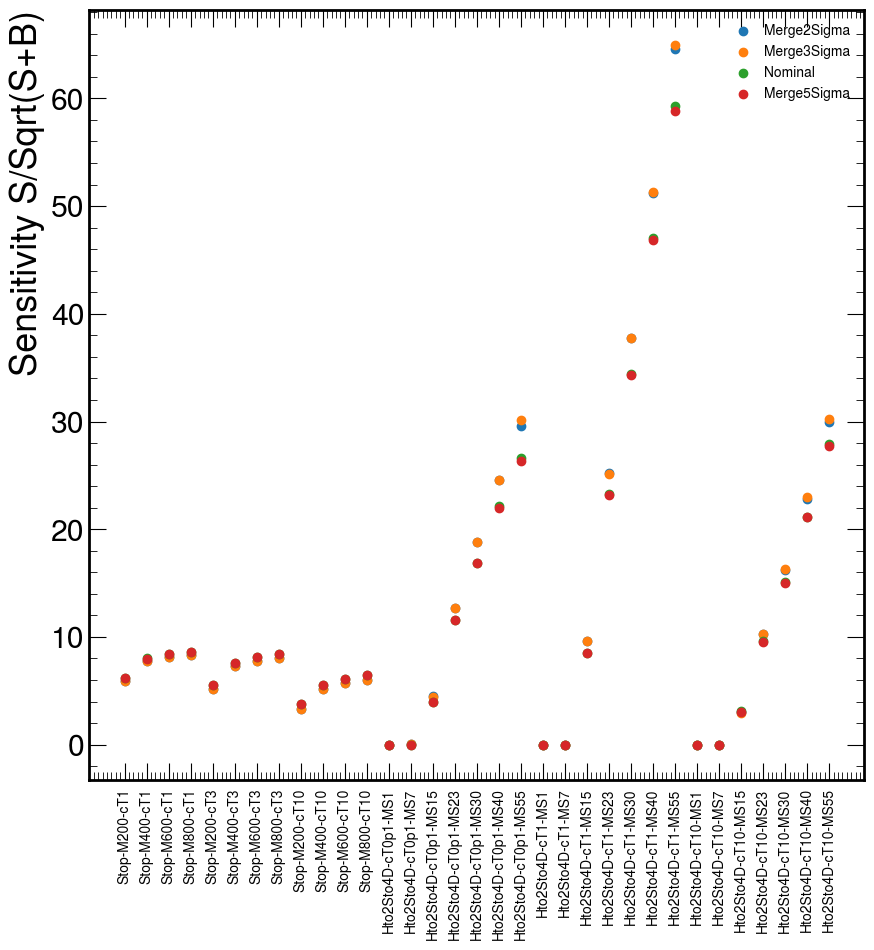

In [20]:
signalList = ["Stop-M200-cT1", "Stop-M400-cT1", "Stop-M600-cT1", "Stop-M800-cT1", 
           "Stop-M200-cT3", "Stop-M400-cT3", "Stop-M600-cT3", "Stop-M800-cT3",
           "Stop-M200-cT10", "Stop-M400-cT10", "Stop-M600-cT10", "Stop-M800-cT10",
           "Hto2Sto4D-cT0p1-MS1", "Hto2Sto4D-cT0p1-MS7", "Hto2Sto4D-cT0p1-MS15", "Hto2Sto4D-cT0p1-MS23", 
           "Hto2Sto4D-cT0p1-MS30", "Hto2Sto4D-cT0p1-MS40", "Hto2Sto4D-cT0p1-MS55", 
           "Hto2Sto4D-cT1-MS1", "Hto2Sto4D-cT1-MS7", "Hto2Sto4D-cT1-MS15", "Hto2Sto4D-cT1-MS23", 
           "Hto2Sto4D-cT1-MS30", "Hto2Sto4D-cT1-MS40", "Hto2Sto4D-cT1-MS55",
           "Hto2Sto4D-cT10-MS1", "Hto2Sto4D-cT10-MS7", "Hto2Sto4D-cT10-MS15", "Hto2Sto4D-cT10-MS23", 
           "Hto2Sto4D-cT10-MS30", "Hto2Sto4D-cT10-MS40", "Hto2Sto4D-cT10-MS55"]

sensitivity_FPR15_Merge2Sigma = [5.902686795598402, 7.7364173638607445, 8.144224295885621, 8.326675131893193, 5.185994531727732, 7.259701290087261, 7.7921925203223426, 8.057575081588391, 3.299618955290779, 5.139113156634612, 5.696447655582153, 6.023721016564794, 0, 0.03804575311560582, 4.560192225826398, 12.728200060180253, 18.78994839249171, 24.543909082082035, 29.614992846972772, 0, 0, 9.623032124262537, 25.202492602105977, 37.75445889169232, 51.20842275132069, 64.56310449544789, 0, 0, 2.992553085927146, 10.23390567018378, 16.249816848090756, 22.83381015690629, 29.93099388215757]
sensitivity_FPR15_Merge3Sigma = [5.919667926250815, 7.752288512574734, 8.157414924295475, 8.338963984771393, 5.206355278557257, 7.284629210284435, 7.801812561544075, 8.06803579825605, 3.3099066417063105, 5.151497900134415, 5.713703173425138, 6.038976051032408, 0, 0.08704662985909253, 4.429997611441387, 12.714742129192198, 18.85858762220491, 24.5869649863226, 30.12648642664579, 0, 0, 9.616737810235568, 25.15968528025077, 37.75435338705038, 51.32559247275064, 64.98525840053573, 0, 0, 2.92783496151068, 10.268342866570135, 16.317818287031272, 22.981094109393204, 30.21737781119333]
sensitivity_FPR15_3DShiftValue = [6.17819365704391, 8.009939044806954, 8.435131490434545, 8.631810610111025, 5.516254096762971, 7.577485933646352, 8.112124492459326, 8.384227384439729, 3.754136098318818, 5.5619438875928235, 6.111870328096971, 6.43807594529389, 0, 0, 3.9960916276840135, 11.599177070178328, 16.897110306863706, 22.125850666819627, 26.599505031375045, 0, 0, 8.517963414359008, 23.306348025426246, 34.403771743481904, 46.99979711470374, 59.281288655304095, 0, 0, 3.0957523141444026, 9.577606694019423, 15.111855202530162, 21.163235079379522, 27.917932880963964]
sensitivity_FPR15_Merge5Sigma = [6.160129360477111, 7.995962378934111, 8.418995972384492, 8.61833085877435, 5.506776286883654, 7.566493328749877, 8.101357999272043, 8.37538982349992, 3.752138887747207, 5.550674995682481, 6.104782719581142, 6.4294945812288535, 0, 0, 4.005686956769646, 11.541942412577582, 16.907412304842385, 22.01216291295956, 26.312019321305225, 0, 0, 8.49826540623032, 23.22158553193684, 34.292437418775414, 46.82546305501524, 58.83346743374884, 0, 0, 3.0732091945739133, 9.550876316819277, 15.03943157590053, 21.096763602072343, 27.750143451382904]
['Stop-M200-cT1', 'Stop-M400-cT1', 'Stop-M600-cT1', 'Stop-M800-cT1', 'Stop-M200-cT3', 'Stop-M400-cT3', 'Stop-M600-cT3', 'Stop-M800-cT3', 'Stop-M200-cT10', 'Stop-M400-cT10', 'Stop-M600-cT10', 'Stop-M800-cT10', 'Hto2Sto4D-cT0p1-MS1', 'Hto2Sto4D-cT0p1-MS7', 'Hto2Sto4D-cT0p1-MS15', 'Hto2Sto4D-cT0p1-MS23', 'Hto2Sto4D-cT0p1-MS30', 'Hto2Sto4D-cT0p1-MS40', 'Hto2Sto4D-cT0p1-MS55', 'Hto2Sto4D-cT1-MS1', 'Hto2Sto4D-cT1-MS7', 'Hto2Sto4D-cT1-MS15', 'Hto2Sto4D-cT1-MS23', 'Hto2Sto4D-cT1-MS30', 'Hto2Sto4D-cT1-MS40', 'Hto2Sto4D-cT1-MS55', 'Hto2Sto4D-cT10-MS1', 'Hto2Sto4D-cT10-MS7', 'Hto2Sto4D-cT10-MS15', 'Hto2Sto4D-cT10-MS23', 'Hto2Sto4D-cT10-MS30', 'Hto2Sto4D-cT10-MS40', 'Hto2Sto4D-cT10-MS55']

plt.scatter(signalList,sensitivity_FPR15_Merge2Sigma,label="Merge2Sigma")
plt.scatter(signalList,sensitivity_FPR15_Merge3Sigma,label="Merge3Sigma")
plt.scatter(signalList,sensitivity_FPR15_3DShiftValue,label="Nominal")
plt.scatter(signalList,sensitivity_FPR15_Merge5Sigma,label="Merge5Sigma")

plt.ylabel("Sensitivity S/Sqrt(S+B)")
plt.xticks(rotation=90,fontsize=10)
plt.legend(fontsize=10)
plt.show()

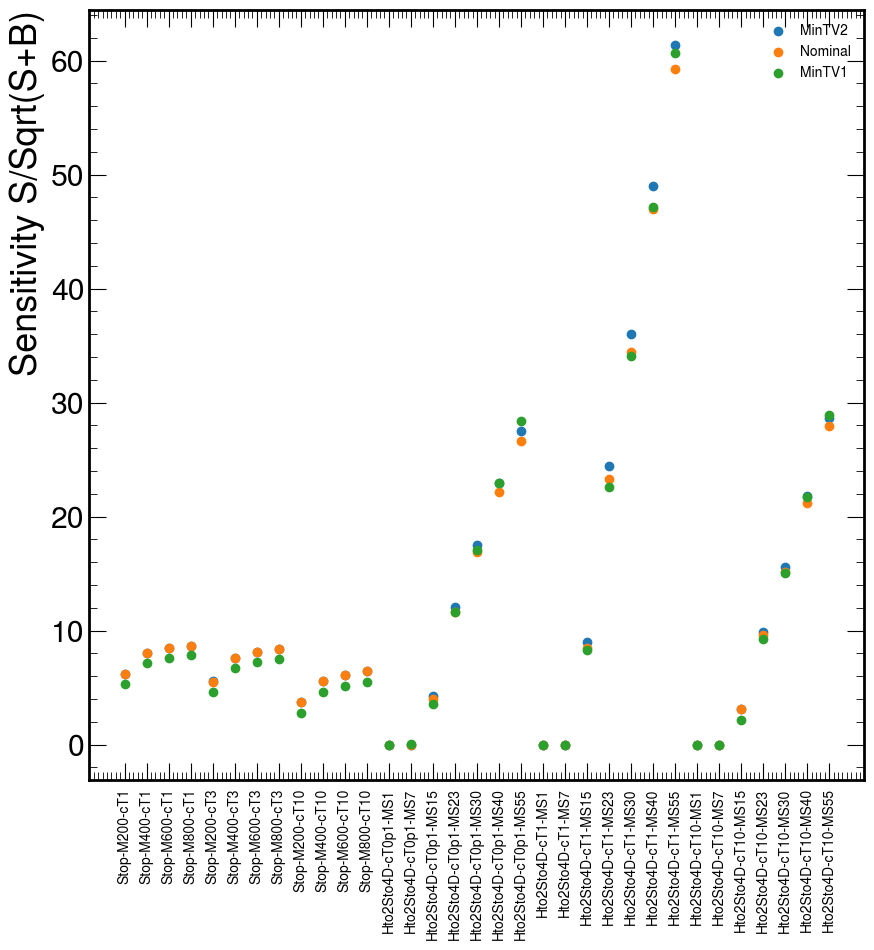

In [9]:
signalList = ["Stop-M200-cT1", "Stop-M400-cT1", "Stop-M600-cT1", "Stop-M800-cT1", 
           "Stop-M200-cT3", "Stop-M400-cT3", "Stop-M600-cT3", "Stop-M800-cT3",
           "Stop-M200-cT10", "Stop-M400-cT10", "Stop-M600-cT10", "Stop-M800-cT10",
           "Hto2Sto4D-cT0p1-MS1", "Hto2Sto4D-cT0p1-MS7", "Hto2Sto4D-cT0p1-MS15", "Hto2Sto4D-cT0p1-MS23", 
           "Hto2Sto4D-cT0p1-MS30", "Hto2Sto4D-cT0p1-MS40", "Hto2Sto4D-cT0p1-MS55", 
           "Hto2Sto4D-cT1-MS1", "Hto2Sto4D-cT1-MS7", "Hto2Sto4D-cT1-MS15", "Hto2Sto4D-cT1-MS23", 
           "Hto2Sto4D-cT1-MS30", "Hto2Sto4D-cT1-MS40", "Hto2Sto4D-cT1-MS55",
           "Hto2Sto4D-cT10-MS1", "Hto2Sto4D-cT10-MS7", "Hto2Sto4D-cT10-MS15", "Hto2Sto4D-cT10-MS23", 
           "Hto2Sto4D-cT10-MS30", "Hto2Sto4D-cT10-MS40", "Hto2Sto4D-cT10-MS55"]

sensitivity_FPR15_MinTV2 = [6.216295446084238, 8.043438985610239, 8.454869181547249, 8.643331235037694, 5.549647207964757, 7.6065075088975584, 8.140469686974095, 8.409199120334424, 3.747605118408663, 5.5698130664020145, 6.124325943571718, 6.445125302332697, 0, 0, 4.275090944846436, 12.084674772053893, 17.51443509480091, 22.96000751694739, 27.510339211411004, 0, 0, 9.00596255808274, 24.47393056920248, 35.99837141536072, 48.99144401567991, 61.39670528653223, 0, 0, 3.1175011673704054, 9.921870124887539, 15.579356099800755, 21.794023078393614, 28.68589207394756]
sensitivity_FPR15_3DShiftValue = [6.17819365704391, 8.009939044806954, 8.435131490434545, 8.631810610111025, 5.516254096762971, 7.577485933646352, 8.112124492459326, 8.384227384439729, 3.754136098318818, 5.5619438875928235, 6.111870328096971, 6.43807594529389, 0, 0, 3.9960916276840135, 11.599177070178328, 16.897110306863706, 22.125850666819627, 26.599505031375045, 0, 0, 8.517963414359008, 23.306348025426246, 34.403771743481904, 46.99979711470374, 59.281288655304095, 0, 0, 3.0957523141444026, 9.577606694019423, 15.111855202530162, 21.163235079379522, 27.917932880963964]
sensitivity_FPR15_MinTV1 = [5.288095602938715, 7.202047249235387, 7.631458720096799, 7.837094163202654, 4.58475888058895, 6.718867961188279, 7.273890711622287, 7.552443680969154, 2.764372335709787, 4.596961177954227, 5.162120640011863, 5.491741092560719, 0, 0.0625420024512186, 3.555776499475712, 11.613874119953362, 17.107680559750058, 22.97753956508629, 28.41837881734063, 0, 0, 8.33188765444493, 22.59369016797688, 34.109992422224835, 47.181177585052765, 60.63387933707003, 0, 0, 2.1560290478595983, 9.262776376366764, 15.0498174098325, 21.711725975274017, 28.87404145472957]

plt.scatter(signalList,sensitivity_FPR15_MinTV2,label="MinTV2")
plt.scatter(signalList,sensitivity_FPR15_3DShiftValue,label="Nominal")
plt.scatter(signalList,sensitivity_FPR15_MinTV1,label="MinTV1")
plt.ylabel("Sensitivity S/Sqrt(S+B)")
plt.xticks(rotation=90,fontsize=10)
plt.legend(fontsize=10)
plt.show()

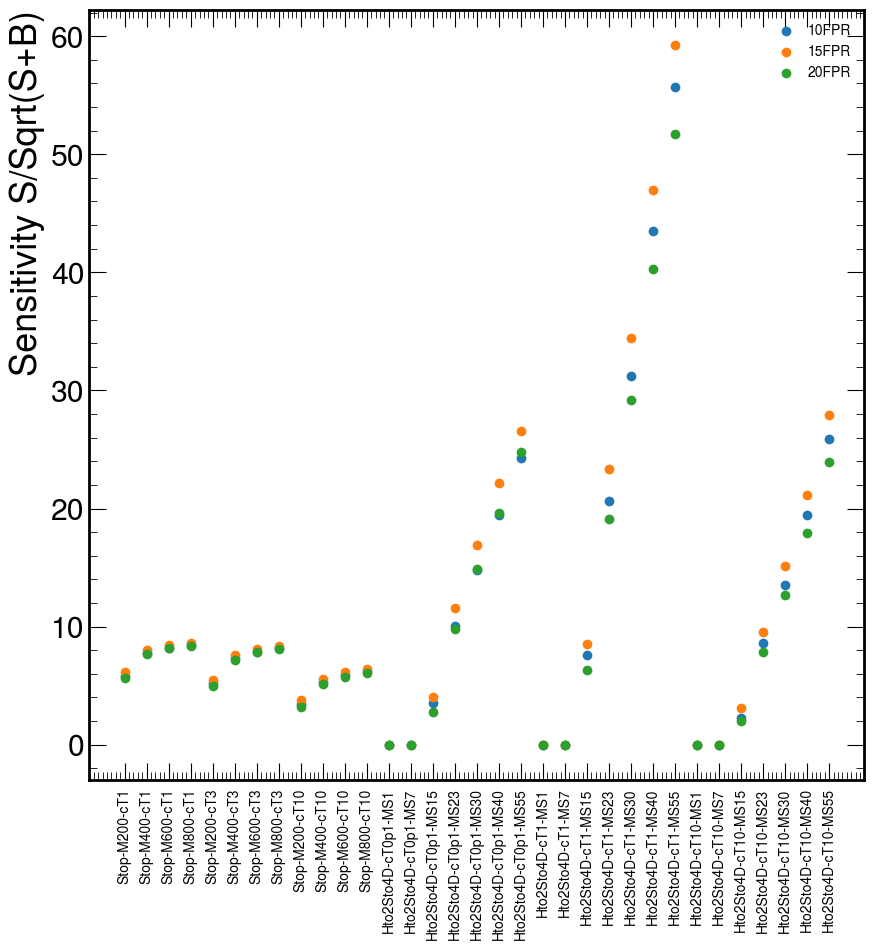

In [24]:
signalList = ["Stop-M200-cT1", "Stop-M400-cT1", "Stop-M600-cT1", "Stop-M800-cT1", 
           "Stop-M200-cT3", "Stop-M400-cT3", "Stop-M600-cT3", "Stop-M800-cT3",
           "Stop-M200-cT10", "Stop-M400-cT10", "Stop-M600-cT10", "Stop-M800-cT10",
           "Hto2Sto4D-cT0p1-MS1", "Hto2Sto4D-cT0p1-MS7", "Hto2Sto4D-cT0p1-MS15", "Hto2Sto4D-cT0p1-MS23", 
           "Hto2Sto4D-cT0p1-MS30", "Hto2Sto4D-cT0p1-MS40", "Hto2Sto4D-cT0p1-MS55", 
           "Hto2Sto4D-cT1-MS1", "Hto2Sto4D-cT1-MS7", "Hto2Sto4D-cT1-MS15", "Hto2Sto4D-cT1-MS23", 
           "Hto2Sto4D-cT1-MS30", "Hto2Sto4D-cT1-MS40", "Hto2Sto4D-cT1-MS55",
           "Hto2Sto4D-cT10-MS1", "Hto2Sto4D-cT10-MS7", "Hto2Sto4D-cT10-MS15", "Hto2Sto4D-cT10-MS23", 
           "Hto2Sto4D-cT10-MS30", "Hto2Sto4D-cT10-MS40", "Hto2Sto4D-cT10-MS55"]

sensitivity_FPR10_3DShiftValue = [5.838379258469221, 7.734643557270471, 8.197263778648546, 8.417015464690323, 5.183938375260106, 7.298152048190038, 7.889208552602512, 8.180120392782044, 3.452846853364364, 5.29818557572439, 5.878357404065813, 6.227348656493941, 0, 0, 3.5401765942808647, 10.049171685655237, 14.80085208937279, 19.46730113664028, 24.235171071994444, 0, 0, 7.608427608555205, 20.671196538700478, 31.257982432685267, 43.524360561413324, 55.72820050817323, 0, 0, 2.2640186187691227, 8.579043075310205, 13.526880315708878, 19.483705133540386, 25.86224589915591]
sensitivity_FPR15_3DShiftValue = [6.17819365704391, 8.009939044806954, 8.435131490434545, 8.631810610111025, 5.516254096762971, 7.577485933646352, 8.112124492459326, 8.384227384439729, 3.754136098318818, 5.5619438875928235, 6.111870328096971, 6.43807594529389, 0, 0, 3.9960916276840135, 11.599177070178328, 16.897110306863706, 22.125850666819627, 26.599505031375045, 0, 0, 8.517963414359008, 23.306348025426246, 34.403771743481904, 46.99979711470374, 59.281288655304095, 0, 0, 3.0957523141444026, 9.577606694019423, 15.111855202530162, 21.163235079379522, 27.917932880963964]
sensitivity_FPR20_3DShiftValue = [5.6716146956022895, 7.6978579975409165, 8.163453092647103, 8.378293765375227, 4.985720473712295, 7.209371490670175, 7.8062362718625815, 8.097505463669446, 3.1636764713407164, 5.120709614913131, 5.719247501590649, 6.067712513867626, 0, 0, 2.7909123442511143, 9.815769455095088, 14.862829429584153, 19.661601953435195, 24.750501031336412, 0, 0, 6.339305800962065, 19.14093155863561, 29.17745706177834, 40.30292772824167, 51.752718049962915, 0, 0, 1.9823985359293044, 7.8622647397446315, 12.665851341074124, 17.944168767801166, 23.9566803436458]

plt.scatter(signalList,sensitivity_FPR10_3DShiftValue,label="10FPR")
plt.scatter(signalList,sensitivity_FPR15_3DShiftValue,label="15FPR")
plt.scatter(signalList,sensitivity_FPR20_3DShiftValue,label="20FPR")
plt.ylabel("Sensitivity S/Sqrt(S+B)")
plt.xticks(rotation=90,fontsize=10)
plt.legend(fontsize=10)
plt.show()

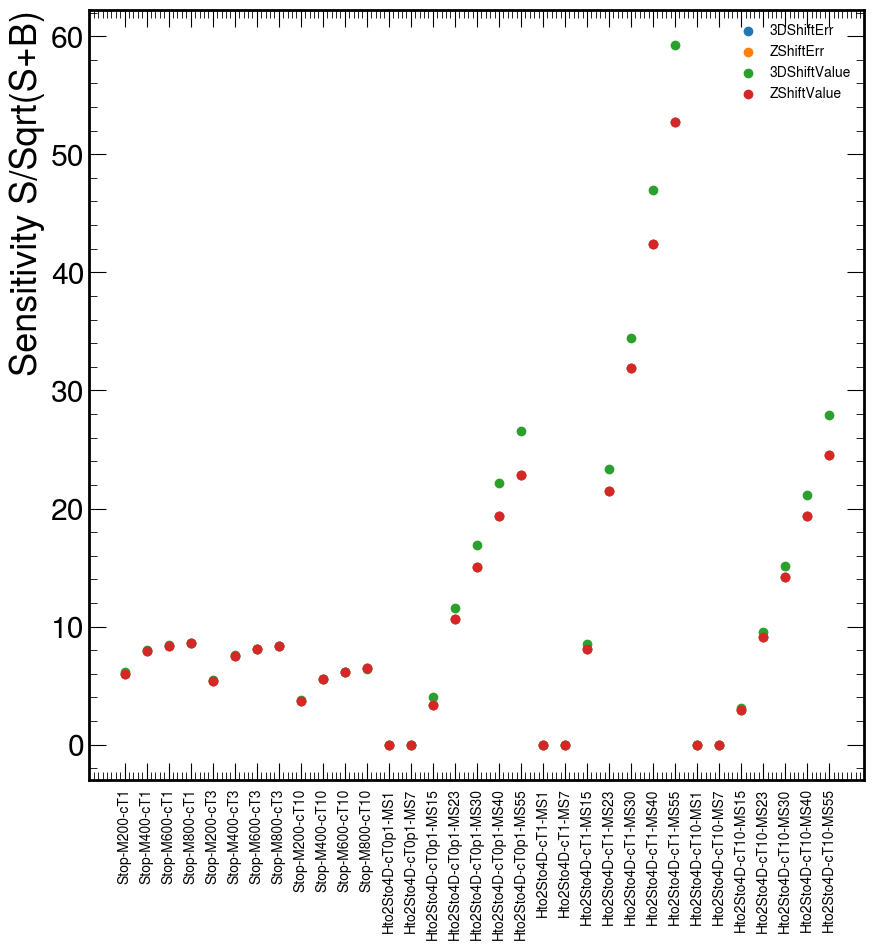

In [15]:
signalList = ["Stop-M200-cT1", "Stop-M400-cT1", "Stop-M600-cT1", "Stop-M800-cT1", 
           "Stop-M200-cT3", "Stop-M400-cT3", "Stop-M600-cT3", "Stop-M800-cT3",
           "Stop-M200-cT10", "Stop-M400-cT10", "Stop-M600-cT10", "Stop-M800-cT10",
           "Hto2Sto4D-cT0p1-MS1", "Hto2Sto4D-cT0p1-MS7", "Hto2Sto4D-cT0p1-MS15", "Hto2Sto4D-cT0p1-MS23", 
           "Hto2Sto4D-cT0p1-MS30", "Hto2Sto4D-cT0p1-MS40", "Hto2Sto4D-cT0p1-MS55", 
           "Hto2Sto4D-cT1-MS1", "Hto2Sto4D-cT1-MS7", "Hto2Sto4D-cT1-MS15", "Hto2Sto4D-cT1-MS23", 
           "Hto2Sto4D-cT1-MS30", "Hto2Sto4D-cT1-MS40", "Hto2Sto4D-cT1-MS55",
           "Hto2Sto4D-cT10-MS1", "Hto2Sto4D-cT10-MS7", "Hto2Sto4D-cT10-MS15", "Hto2Sto4D-cT10-MS23", 
           "Hto2Sto4D-cT10-MS30", "Hto2Sto4D-cT10-MS40", "Hto2Sto4D-cT10-MS55"]

sensitivity_FPR15_3DShiftErr = [6.0053131341673165, 7.923299692899056, 8.387841972023388, 8.6081256861674, 5.401733489891429, 7.52773693183416, 8.10961186845858, 8.394350851110067, 3.726510391213372, 5.565667998519953, 6.138328920805511, 6.474118443899562, 0, 0, 3.396277286558766, 10.676633721942531, 15.075730960859882, 19.387687945995943, 22.848282342346934, 0, 0, 8.133153327695503, 21.443735678304993, 31.86287185088881, 42.38435266799231, 52.76837916090468, 0, 0, 2.9186498596633434, 9.125742067982944, 14.190430670333326, 19.40748612196427, 24.497284446374305]
sensitivity_FPR15_ZShiftErr = [6.0053131341673165, 7.923299692899056, 8.387841972023388, 8.6081256861674, 5.401733489891429, 7.52773693183416, 8.10961186845858, 8.394350851110067, 3.726510391213372, 5.565667998519953, 6.138328920805511, 6.474118443899562, 0, 0, 3.396277286558766, 10.676633721942531, 15.075730960859882, 19.387687945995943, 22.848282342346934, 0, 0, 8.133153327695503, 21.443735678304993, 31.86287185088881, 42.38435266799231, 52.76837916090468, 0, 0, 2.9186498596633434, 9.125742067982944, 14.190430670333326, 19.40748612196427, 24.497284446374305]
sensitivity_FPR15_3DShiftValue = [6.17819365704391, 8.009939044806954, 8.435131490434545, 8.631810610111025, 5.516254096762971, 7.577485933646352, 8.112124492459326, 8.384227384439729, 3.754136098318818, 5.5619438875928235, 6.111870328096971, 6.43807594529389, 0, 0, 3.9960916276840135, 11.599177070178328, 16.897110306863706, 22.125850666819627, 26.599505031375045, 0, 0, 8.517963414359008, 23.306348025426246, 34.403771743481904, 46.99979711470374, 59.281288655304095, 0, 0, 3.0957523141444026, 9.577606694019423, 15.111855202530162, 21.163235079379522, 27.917932880963964]
sensitivity_FPR15_ZShiftValue = [6.0053131341673165, 7.923299692899056, 8.387841972023388, 8.6081256861674, 5.401733489891429, 7.52773693183416, 8.10961186845858, 8.394350851110067, 3.726510391213372, 5.565667998519953, 6.138328920805511, 6.474118443899562, 0, 0, 3.396277286558766, 10.676633721942531, 15.075730960859882, 19.387687945995943, 22.848282342346934, 0, 0, 8.133153327695503, 21.443735678304993, 31.86287185088881, 42.38435266799231, 52.76837916090468, 0, 0, 2.9186498596633434, 9.125742067982944, 14.190430670333326, 19.40748612196427, 24.497284446374305]

plt.scatter(signalList,sensitivity_FPR15_3DShiftErr,label="3DShiftErr")
plt.scatter(signalList,sensitivity_FPR15_ZShiftErr,label="ZShiftErr")
plt.scatter(signalList,sensitivity_FPR15_3DShiftValue,label="3DShiftValue")
plt.scatter(signalList,sensitivity_FPR15_ZShiftValue,label="ZShiftValue")
plt.ylabel("Sensitivity S/Sqrt(S+B)")
plt.xticks(rotation=90,fontsize=10)
plt.legend(fontsize=10)
plt.show()

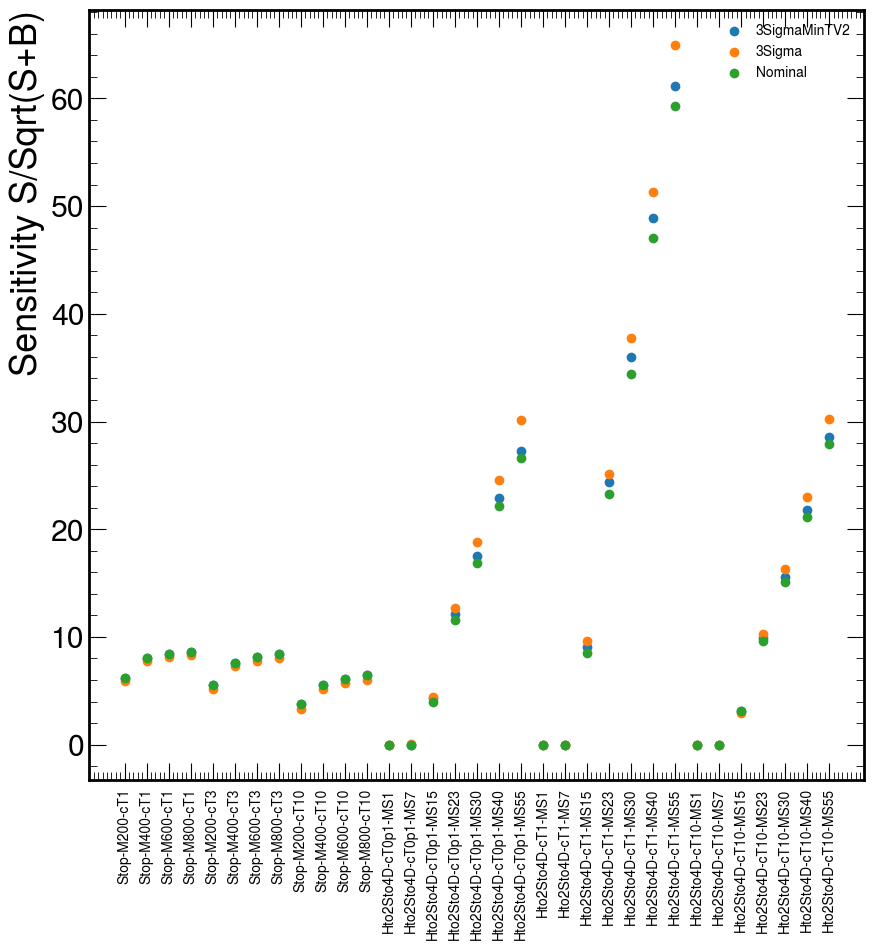

In [21]:
signalList = ["Stop-M200-cT1", "Stop-M400-cT1", "Stop-M600-cT1", "Stop-M800-cT1", 
           "Stop-M200-cT3", "Stop-M400-cT3", "Stop-M600-cT3", "Stop-M800-cT3",
           "Stop-M200-cT10", "Stop-M400-cT10", "Stop-M600-cT10", "Stop-M800-cT10",
           "Hto2Sto4D-cT0p1-MS1", "Hto2Sto4D-cT0p1-MS7", "Hto2Sto4D-cT0p1-MS15", "Hto2Sto4D-cT0p1-MS23", 
           "Hto2Sto4D-cT0p1-MS30", "Hto2Sto4D-cT0p1-MS40", "Hto2Sto4D-cT0p1-MS55", 
           "Hto2Sto4D-cT1-MS1", "Hto2Sto4D-cT1-MS7", "Hto2Sto4D-cT1-MS15", "Hto2Sto4D-cT1-MS23", 
           "Hto2Sto4D-cT1-MS30", "Hto2Sto4D-cT1-MS40", "Hto2Sto4D-cT1-MS55",
           "Hto2Sto4D-cT10-MS1", "Hto2Sto4D-cT10-MS7", "Hto2Sto4D-cT10-MS15", "Hto2Sto4D-cT10-MS23", 
           "Hto2Sto4D-cT10-MS30", "Hto2Sto4D-cT10-MS40", "Hto2Sto4D-cT10-MS55"]
sensitivity_3SigmaMinTV2 = [6.2253815716879455, 8.049162515820846, 8.46086306789237, 8.648506243661714,
                            5.565217312059362, 7.614897525542191, 8.151163359309963, 8.415644959609764,
                            3.770759528974202, 5.584969073603233, 6.137580348425568, 6.457759192040909,
                            0, 0, 4.317116426357443, 12.109646827943207,
                            17.52346549888406, 22.898514291504352, 27.29634567724634,
                            0, 0, 9.027872906821035, 24.422770887149433,
                            35.973469983263165, 48.890311774258386, 61.13640440401959,
                            0, 0, 3.153301343841654, 9.934219101346287,
                            15.550128484556923, 21.753561566954268, 28.586557450614446
                           ]
sensitivity_3Sigma = [5.919667926250815, 7.752288512574734, 8.157414924295475, 8.338963984771393,
                      5.206355278557257, 7.284629210284435, 7.801812561544075, 8.06803579825605,
                      3.3099066417063105, 5.151497900134415, 5.713703173425138, 6.038976051032408,
                      0, 0.08704662985909253, 4.429997611441387, 12.714742129192198,
                      18.85858762220491, 24.5869649863226, 30.12648642664579,
                      0, 0, 9.616737810235568, 25.15968528025077,
                      37.75435338705038, 51.32559247275064, 64.98525840053573,
                      0, 0, 2.92783496151068, 10.268342866570135,
                      16.317818287031272, 22.981094109393204, 30.21737781119333
                     ]

plt.scatter(signalList,sensitivity_3SigmaMinTV2,label="3SigmaMinTV2")
plt.scatter(signalList,sensitivity_3Sigma,label="3Sigma")
plt.scatter(signalList,sensitivity_FPR15_3DShiftValue,label="Nominal")
plt.ylabel("Sensitivity S/Sqrt(S+B)")
plt.xticks(rotation=90,fontsize=10)
plt.legend(fontsize=10)
plt.show()

In [22]:
array = []
np.save("empty",array)

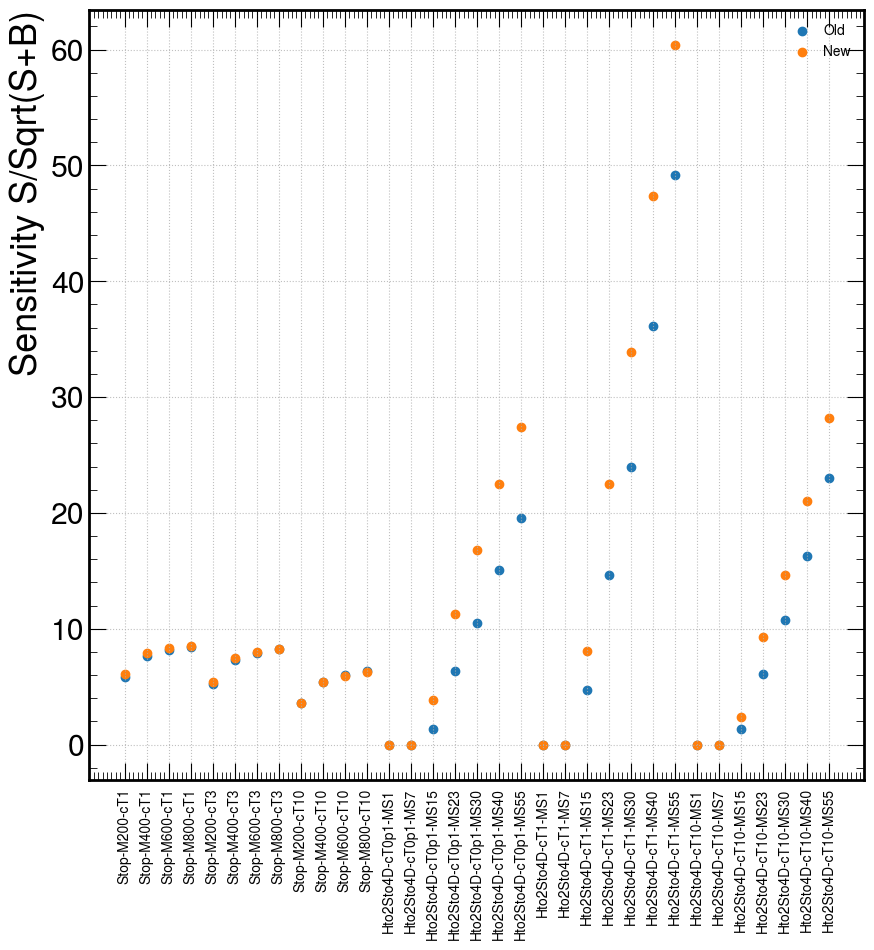

In [12]:
signalList = ["Stop-M200-cT1", "Stop-M400-cT1", "Stop-M600-cT1", "Stop-M800-cT1", 
           "Stop-M200-cT3", "Stop-M400-cT3", "Stop-M600-cT3", "Stop-M800-cT3",
           "Stop-M200-cT10", "Stop-M400-cT10", "Stop-M600-cT10", "Stop-M800-cT10",
           "Hto2Sto4D-cT0p1-MS1", "Hto2Sto4D-cT0p1-MS7", "Hto2Sto4D-cT0p1-MS15", "Hto2Sto4D-cT0p1-MS23", 
           "Hto2Sto4D-cT0p1-MS30", "Hto2Sto4D-cT0p1-MS40", "Hto2Sto4D-cT0p1-MS55", 
           "Hto2Sto4D-cT1-MS1", "Hto2Sto4D-cT1-MS7", "Hto2Sto4D-cT1-MS15", "Hto2Sto4D-cT1-MS23", 
           "Hto2Sto4D-cT1-MS30", "Hto2Sto4D-cT1-MS40", "Hto2Sto4D-cT1-MS55",
           "Hto2Sto4D-cT10-MS1", "Hto2Sto4D-cT10-MS7", "Hto2Sto4D-cT10-MS15", "Hto2Sto4D-cT10-MS23", 
           "Hto2Sto4D-cT10-MS30", "Hto2Sto4D-cT10-MS40", "Hto2Sto4D-cT10-MS55"]

sensitivity_oldOptimization = [5.81, 7.68, 8.16, 8.40, 5.21, 7.34, 7.95, 8.26, 3.61, 5.44, 6.04, 6.39, 0, 0, 1.36, 6.34, 10.47, 15.10, 19.55, 0, 0, 4.72, 14.63, 23.93, 36.16, 49.19, 0, 0, 1.36, 6.12, 10.75, 16.32, 23.01]
sensitivity_newOptimization = [6.10218725272127, 7.933186821425988, 8.35657153921824, 8.544265526826042, 5.397803508159547, 7.446782417400376, 7.989186909466096, 8.262467184929637, 3.5904196333146245, 5.378153303678435, 5.925855763719978, 6.253119859887979, 0.0, 0.0, 3.8946236880699048, 11.245533273992875, 16.810813651401496, 22.503244626314718, 27.4013205480772, 0.0, 0.0, 8.047572364508024, 22.492502179067536, 33.90689446920611, 47.33159111201111, 60.424565582326615, 0.0, 0.0, 2.386796108504285, 9.286198564723682, 14.617860168689557, 21.03042011758325, 28.167347632015602]
plt.scatter(signalList,sensitivity_oldOptimization,label="Old")
plt.scatter(signalList,sensitivity_newOptimization,label="New")
plt.ylabel("Sensitivity S/Sqrt(S+B)")
plt.xticks(rotation=90,fontsize=10)
plt.legend(fontsize=10)
plt.grid(True)
plt.show()

In [3]:
#Extended ABCD Background Estimation With New Priority Order
bin_namesCustom = ["A","B","C","D","E","F"]

def process_cutflows(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    with uproot.open(rootFile) as file:
        output[process] = {}
        output[process+"_squared"] = {}
        output[process+"_nEvents"] = {}
        tree = file["scoutingTree/objectTree"]

        # Select only necessary branches to load
        branches = ["uncorrectedWeight","scoutVert_dBV","scoutVert_dBVErr", "scoutVert_nTracks","weight_PU_BCDEFGHI_nominal","scoutVert_chi2","scoutVert_cosT","runNumber","scoutVert_dT","jet_pt","scoutVert_pMag","vertTrack_pt","vertTrack_iVtx","weight_trigger_nominal"]

        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        weightSum = [0]*len(bin_namesCustom)
        weightSumSquared = [0] * len(bin_namesCustom)
        numEvents = [0] * len(bin_namesCustom)
        for batch in tree.iterate(branches, library="ak", step_size=100000):  
            weights = batch["uncorrectedWeight"] * batch["weight_PU_BCDEFGHI_nominal"] * batch["weight_trigger_nominal"] # event weights
            if(process in signalDict):
                if process in limitDict:
                    currentLimit = limitDict[process]
                    weights = weights * currentLimit
            dBV = batch["scoutVert_dBV"]
            dBVErr = batch["scoutVert_dBVErr"]
            ntracks = batch["scoutVert_nTracks"]
            chi2 = batch["scoutVert_chi2"]
            cosT = batch["scoutVert_cosT"]
            dT = batch["scoutVert_dT"]
            runNumber = batch["runNumber"]
            #jetPt = batch["jet_pt"]
            #jetMask = (jetPt>30)
            #nJets = ak.num(jetPt,axis=1)
            #nJetsAboveCut = ak.sum(jetMask,axis=1)
            #nJetBelowCut = ak.sum(~jetMask,axis=1)
            #ht = ak.sum(jetPt,axis=-1)
            #jetMask = (nJetsAboveCut<3)
            vertTrack_pt = batch["vertTrack_pt"]
            mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.01) & (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] < 2)
            vertTrack_pt = vertTrack_pt[mask]
            vertTrack_HT = ak.sum(vertTrack_pt,axis=1)
            
            mask = (dBV>0.01) & (dBV<2.0) & (ntracks>4) & (dBVErr<0.005) & (ntracks<9) #& (runNumber!=384323) ##& (cosT>0)
            dBV = dBV[mask]
            ntracks = ntracks[mask]
            chi2 = chi2[mask]
            cosT = cosT[mask]
            dT = dT[mask]
            mask = (ak.num(dBV,axis=1)>0) #& jetMask
            weights = weights[mask]
            ntracks = ntracks[mask]
            chi2 = chi2[mask]
            cosT = cosT[mask]
            dT = dT[mask]
            
            ntrackMask = (ntracks>7)
            ntrackMinMask = (ntracks>5)
            chi2Mask = (chi2<3) 
            cosTMask = (cosT>0)
            dTMask = (dT<0.1)
            #chi2Mask = (cosT>0)
            #Signal region F
            mask = ntrackMask & chi2Mask & cosTMask #& dTMask
            mask = ak.num(ntracks[mask])>0
            weightsB = weights[mask]
            weightSum[5] += ak.sum(weightsB)
            weightSumSquared[5] += ak.sum(weightsB**2)
            ntrackMask = ntrackMask[~mask]
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            cosTMask = cosTMask[~mask]
            dTMask = dTMask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region C
            mask = ntrackMask & ~chi2Mask & ~cosTMask #& ~dTMask
            mask = ak.num(ntracks[mask])>0
            weightsD = weights[mask]
            weightSum[2] += ak.sum(weightsD)
            weightSumSquared[2] += ak.sum(weightsD**2)
            ntrackMask = ntrackMask[~mask]
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            cosTMask = cosTMask[~mask]
            dTMask = dTMask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region E
            mask = ~ntrackMask & chi2Mask & ntrackMinMask & cosTMask #& dTMask
            mask = ak.num(ntracks[mask])>0
            weightsA = weights[mask]
            weightSum[4] += ak.sum(weightsA)
            weightSumSquared[4] += ak.sum(weightsA**2)
            ntrackMask = ntrackMask[~mask]
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            cosTMask = cosTMask[~mask]
            dTMask = dTMask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region B
            mask = ~ntrackMask & ~chi2Mask & ntrackMinMask & ~cosTMask #& ~dTMask
            mask = ak.num(ntracks[mask])>0
            weightsC = weights[mask]
            weightSum[1] += ak.sum(weightsC)
            weightSumSquared[1] += ak.sum(weightsC**2)
            ntrackMask = ntrackMask[~mask]
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            cosTMask = cosTMask[~mask]
            dTMask = dTMask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region D
            mask = chi2Mask & ~ntrackMinMask & cosTMask #& dTMask
            mask = ak.num(ntracks[mask])>0
            weightsE = weights[mask]
            weightSum[3] += ak.sum(weightsE)
            weightSumSquared[3] += ak.sum(weightsE**2)
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            cosTMask = cosTMask[~mask]
            dTMask = dTMask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
            #Control region A
            mask = ~chi2Mask & ~ntrackMinMask & ~cosTMask #& ~dTMask
            mask = ak.num(ntracks[mask])>0
            weightsF = weights[mask]
            weightSum[0] += ak.sum(weightsF)
            weightSumSquared[0] += ak.sum(weightsF**2)
            ntrackMinMask = ntrackMinMask[~mask]
            chi2Mask = chi2Mask[~mask]
            cosTMask = cosTMask[~mask]
            dTMask = dTMask[~mask]
            weights = weights[~mask]
            ntracks = ntracks[~mask]
            
        for i in range(len(bin_namesCustom)):
            output[process][bin_namesCustom[i]] = weightSum[i]
            output[process+"_squared"][bin_namesCustom[i]] = weightSumSquared[i]
            output[process+"_nEvents"][bin_namesCustom[i]] = numEvents[i]
        
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_cutflows, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for process in result:
                if process not in results:
                    results[process] = result[process]
                else:
                    for cut in result[process]:
                        results[process][cut] = results[process].get(cut, 0) + result[process][cut]

    return results

dict = signalDict | processDict
customWeights = parallel_processing(dict)
genWeightSumDict = {}
for process, rootFiles in dict.items():
    genWeightSum = 0
    for rootFile in rootFiles:
        f = ROOT.TFile.Open(rootFile, "READ")
        h_genWeights = f.Get("triggerFilter/genWeightsSkim")
        n_binsSkim = h_genWeights.GetNbinsX() 
        genWeights = np.array([h_genWeights.GetBinContent(i) for i in range(1, n_binsSkim + 1)])
        genWeightSum += genWeights[0]
    genWeightSumDict[process] = genWeightSum
      
#Combining Background Subprocesses and Reweighting Events
for process in dict.keys():
    for cut in customWeights[process].keys():
        customWeights[process][cut] = customWeights[process][cut] / genWeightSumDict[process]
        customWeights[process+"_squared"][cut] = customWeights[process+"_squared"][cut] / (genWeightSumDict[process]**2)

customWeights["QCD"] = {}
customWeights["TTbar"] = {}
customWeights["QCD_squared"] = {}
customWeights["TTbar_squared"] = {}
customWeights["QCD_nEvents"] = {}
customWeights["TTbar_nEvents"] = {}
customWeights["Bkg"] = {}
customWeights["Bkg_squared"] = {}
#customWeights["2024"] = {}
#customWeights["2024_squared"] = {}

for i in range(len(bin_namesCustom)):
    cut = bin_namesCustom[i]
    
    customWeights["QCD"][cut] = customWeights["QCD40to70"][cut]+customWeights["QCD70to100"][cut]+customWeights["QCD100to200"][cut]+customWeights["QCD200to400"][cut]+customWeights["QCD400to600"][cut]+customWeights["QCD600to800"][cut]+customWeights["QCD800to1000"][cut]+customWeights["QCD1000to1200"][cut]+customWeights["QCD1200to1500"][cut]+customWeights["QCD1500to2000"][cut]+customWeights["QCD2000"][cut]
    customWeights["QCD_squared"][cut] = customWeights["QCD40to70_squared"][cut]+customWeights["QCD70to100_squared"][cut]+customWeights["QCD100to200_squared"][cut]+customWeights["QCD200to400_squared"][cut]+customWeights["QCD400to600_squared"][cut]+customWeights["QCD600to800_squared"][cut]+customWeights["QCD800to1000_squared"][cut]+customWeights["QCD1000to1200_squared"][cut]+customWeights["QCD1200to1500_squared"][cut]+customWeights["QCD1500to2000_squared"][cut]+customWeights["QCD2000_squared"][cut]
    #customWeights["QCD_nEvents"][cut] = customWeights["QCD200to400_nEvents"][cut]+customWeights["QCD400to600_nEvents"][cut]+customWeights["QCD600to800_nEvents"][cut]+customWeights["QCD800to1000_nEvents"][cut]+customWeights["QCD1000to1200_nEvents"][cut]+customWeights["QCD1200to1500_nEvents"][cut]+customWeights["QCD1500to2000_nEvents"][cut]+customWeights["QCD2000_nEvents"][cut]
    customWeights["TTbar"][cut] = customWeights["TTTo4Q"][cut]+customWeights["TTToLNu2Q"][cut]
    customWeights["TTbar_squared"][cut] = customWeights["TTTo4Q_squared"][cut]+customWeights["TTToLNu2Q_squared"][cut]
    #customWeights["TTbar_nEvents"][cut] = customWeights["TTTo4Q_nEvents"][cut]+customWeights["TTToLNu2Q_nEvents"][cut]
    #customWeights["2024"][cut] = customWeights["2024C"][cut]+customWeights["2024D"][cut]+customWeights["2024E"][cut]+customWeights["2024F"][cut]+customWeights["2024G"][cut]+customWeights["2024H"][cut]+customWeights["2024I"][cut]
    #customWeights["2024_squared"][cut] = customWeights["2024C_squared"][cut]+customWeights["2024D_squared"][cut]+customWeights["2024E_squared"][cut]+customWeights["2024F_squared"][cut]+customWeights["2024G_squared"][cut]+customWeights["2024H_squared"][cut]+customWeights["2024I_squared"][cut]
    customWeights["Bkg"][cut] = customWeights["QCD"][cut] + customWeights["TTbar"][cut]
    customWeights["Bkg_squared"][cut] = customWeights["QCD_squared"][cut] + customWeights["TTbar_squared"][cut]
    
for process in list(signalDict.keys())+["Bkg"]:
    #Custom Cutflows
    print(process)
    for i in range(len(bin_namesCustom)):
        stat_unc = np.sqrt(customWeights[process+'_squared'][bin_namesCustom[i]])
        efficiency = customWeights[process][bin_namesCustom[i]]
        print(bin_namesCustom[i],":",f"{efficiency:.3g} +- {stat_unc:.1g}")
    sumA = customWeights[process]["A"]
    sumA_unc = np.sqrt(customWeights[process+'_squared']["A"])
    sumB = customWeights[process]["B"]
    sumB_unc = np.sqrt(customWeights[process+'_squared']["B"])
    sumC = customWeights[process]["C"]
    sumC_unc = np.sqrt(customWeights[process+'_squared']["C"])
    sumD = customWeights[process]["D"]
    sumD_unc = np.sqrt(customWeights[process+'_squared']["D"])
    sumE = customWeights[process]["E"]
    sumE_unc = np.sqrt(customWeights[process+'_squared']["E"])
    sumF = customWeights[process]["F"]
    sumF_unc = np.sqrt(customWeights[process+'_squared']["F"])
    bg_exp = (sumE/sumB)**2 * (sumA*sumC/sumD)
    #bg_exp = (sumA/sumC)*sumD
    
    if(sumC!=0):
        bg_exp_unc = bg_exp * np.sqrt((sumA_unc/sumA)**2 + (2*sumB_unc/sumB)**2 + (sumC_unc/sumC)**2 + (sumD_unc/sumD)**2 + (2*sumE_unc/sumE)**2)
    else:
        bg_exp_unc = (sumE/sumB)**2 * (sumA/sumD) * 1.83 #1.83 is 68% confidence interval for poissonian distribution with 0 observed
    '''
    if(sumD!=0):
        bg_exp_unc = bg_exp * np.sqrt((sumA_unc/sumA)**2 + (sumD_unc/sumD)**2 + (sumC_unc/sumC)**2)
    else:
        bg_exp_unc = (sumA/sumC) * 1.83 #1.83 is 68% confidence interval for poissonian distribution with 0 observed
    '''
    print("expected background:",f"{bg_exp} +- {bg_exp_unc} observed: {sumF} +- {sumF_unc}")
    print("expected background:",f"{bg_exp:.3g} +- {bg_exp_unc:.1g} observed: {sumF:.3g} +- {sumF_unc:.1g}")
    

Processing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-1mm_Tree_v28-4DxyMin/260406_193436/StopStopbarTo2Dbar2D_M-200_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-600_CTau-1mm_Tree_v28-4DxyMin/260406_193619/StopStopbarTo2Dbar2D_M-600_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-800_CTau-1mm_Tree_v28-4DxyMin/260406_193710/StopStopbarTo2Dbar2D_M-800_CTau-1mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-200_CTau-3mm_Tree_v28-4DxyMin/260406_193445/StopStopbarTo2Dbar2D_M-200_CTau-3mm.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/StopStopbarTo2Dbar2D_M-400_CTau-1mm_Summer24_100k_v2/StopStopbarTo2Dbar2D_M-400_

/tmp/rmccarth/ipykernel_3308041/1332670302.py:236: RuntimeWarning: invalid value encountered in scalar divide
  bg_exp = (sumE/sumB)**2 * (sumA*sumC/sumD)
/tmp/rmccarth/ipykernel_3308041/1332670302.py:242: RuntimeWarning: invalid value encountered in scalar divide
  bg_exp_unc = (sumE/sumB)**2 * (sumA/sumD) * 1.83 #1.83 is 68% confidence interval for poissonian distribution with 0 observed
/tmp/rmccarth/ipykernel_3308041/1332670302.py:236: RuntimeWarning: divide by zero encountered in scalar divide
  bg_exp = (sumE/sumB)**2 * (sumA*sumC/sumD)
/tmp/rmccarth/ipykernel_3308041/1332670302.py:236: RuntimeWarning: invalid value encountered in scalar multiply
  bg_exp = (sumE/sumB)**2 * (sumA*sumC/sumD)
/tmp/rmccarth/ipykernel_3308041/1332670302.py:242: RuntimeWarning: divide by zero encountered in scalar divide
  bg_exp_unc = (sumE/sumB)**2 * (sumA/sumD) * 1.83 #1.83 is 68% confidence interval for poissonian distribution with 0 observed
/tmp/rmccarth/ipykernel_3308041/1332670302.py:242: Runt

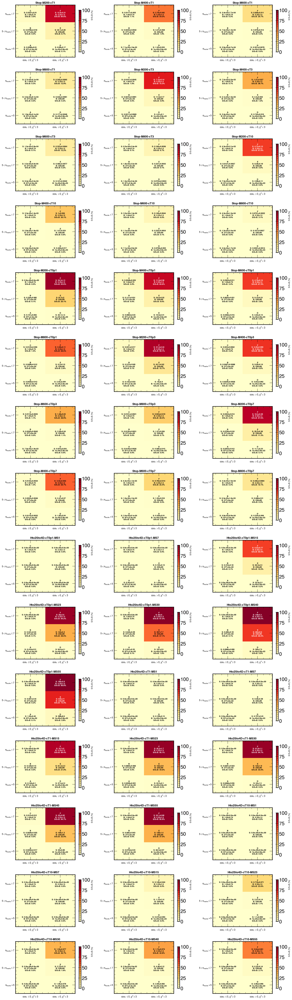


Signal and Background Yields with Statistical Uncertainties

Background Yields:  
----------------------------------------------------------------------------------------------------
Region                  A              B              C              D              E              F
Bkg            871±2.4e+02     277±2e+02    1.04±0.74    1e+04±3.8e+03     230±90       2.33±1.5  

Signal Yields:      
----------------------------------------------------------------------------------------------------
Region                  A              B              C              D              E              F
Stop-M200-cT1  0.0286±0.01   0.0798±0.018  0.0321±0.01     8.08±0.17     22.1±0.28     12.8±0.21 
Stop-M400-cT1 0.00713±0.0019  0.0243±0.0042  0.0117±0.003    1.52±0.033    4.47±0.058    2.79±0.045
Stop-M600-cT1 0.00287±0.00067  0.0075±0.0013  0.0034±0.00077   0.321±0.0078   0.978±0.014   0.609±0.011
Stop-M800-cT1 0.00187±0.00051 0.00557±0.00081 0.00269±0.00061   0.177±0.0048   0.532±0.008

In [4]:
import matplotlib.pyplot as plt
import numpy as np

def plot_abcd_2d(customWeights, signal_processes, bkg_process="Bkg", figsize_per_plot=(6, 4)):
    """
    Create 2D plots showing signal yields and S/B percentages in each ABCD region.
    
    Region layout (matching the cut definitions):
                  chi2>=3 (fail)    chi2<3 (pass)
    ntracks>7         C                 F (SR)
    5<ntracks<=7      B                 E
    ntracks<=5        A                 D
    """
    
    # Define the 2D grid mapping
    # Rows: ntrack categories (top to bottom: >7, 5-7, <=5)
    # Cols: chi2 categories (left to right: fail, pass)
    region_grid = [
        ["C", "F"],  # ntracks > 7
        ["B", "E"],  # 5 < ntracks <= 7
        ["A", "D"],  # ntracks = 5
    ]
    
    row_labels = [r"$n_{tracks} > 7$", r"$5 < n_{tracks} \leq 7$", r"$n_{tracks} = 5$"]
    #row_labels = [r"$n_{tracks} > 7$", r"$n_{tracks} = 6$", r"$n_{tracks} = 5$"]
    col_labels = [r"$\cos_{T} \leq 0, \chi^2 \geq 3$", r"$\cos_{T} > 0, \chi^2 < 3$"]
    #col_labels = [r"$\cos_{T} \leq 0$", r"$\cos_{T} > 0$"]
    
    n_signals = len(signal_processes)
    n_cols = min(3, n_signals)
    n_rows = (n_signals + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(figsize_per_plot[0]*n_cols, figsize_per_plot[1]*n_rows))
    if n_signals == 1:
        axes = np.array([[axes]])
    elif n_rows == 1:
        axes = axes.reshape(1, -1)
    elif n_cols == 1:
        axes = axes.reshape(-1, 1)
    
    # Get background yields for each region
    bkg_yields = {}
    for row in region_grid:
        for region in row:
            bkg_yields[region] = customWeights[bkg_process][region]
    
    for idx, signal in enumerate(signal_processes):
        ax = axes[idx // n_cols, idx % n_cols]
        
        # Build the 2D arrays for signal yield and S/B percentage
        signal_grid = np.zeros((3, 2))
        sb_grid = np.zeros((3, 2))
        
        for i, row in enumerate(region_grid):
            for j, region in enumerate(row):
                sig_yield = customWeights[signal][region]
                bkg_yield = bkg_yields[region]
                signal_grid[i, j] = sig_yield
                sb_grid[i, j] = ((sig_yield / (sig_yield+bkg_yield)) * 100) if (sig_yield+bkg_yield) > 0 else -1
        
        # Create heatmap based on S/S+B percentage
        im = ax.imshow(sb_grid, cmap='YlOrRd', aspect='auto',vmin=0,vmax=100.0)
        
        # Add text annotations
        for i in range(3):
            for j in range(2):
                region = region_grid[i][j]
                sig_val = signal_grid[i, j]
                sb_val = sb_grid[i, j]
                bkg_val = bkg_yields[region]
                
                # Get uncertainties
                sig_unc = np.sqrt(customWeights[signal+"_squared"][region])
                bkg_unc = np.sqrt(customWeights[bkg_process+"_squared"][region])
                
                # Format the text with uncertainties
                def fmt_val_unc(val, unc):
                    if val >= 0.01:
                        return f"{val:.3g}±{unc:.2g}"
                    else:
                        return f"{val:.1e}±{unc:.1e}"
                
                sig_str = f"S: {fmt_val_unc(sig_val, sig_unc)}"
                bkg_str = f"B: {fmt_val_unc(bkg_val, bkg_unc)}"
                
                text_color = 'white' if sb_val > 60 else 'black'
                
                ax.text(j, i, f"{region}\n{sig_str}\n{bkg_str}\nS/S+B: {sb_val:.1f}%",
                       ha='center', va='center', fontsize=8, color=text_color, weight='bold')
        
        # Labels and formatting
        ax.set_xticks([0, 1])
        ax.set_xticklabels(col_labels, fontsize=10)
        ax.set_yticks([0, 1, 2])
        ax.set_yticklabels(row_labels, fontsize=10)
        ax.set_title(f"{signal}", fontsize=12, weight='bold')
        
        # Add colorbar
        cbar = plt.colorbar(im, ax=ax, shrink=0.8)
        cbar.set_label('S/S+B (%)', fontsize=9)
    
    # Hide unused subplots
    for idx in range(n_signals, n_rows * n_cols):
        axes[idx // n_cols, idx % n_cols].axis('off')
    
    #plt.suptitle("Extended ABCD Regions: Signal Yields and S/S+B Percentages\n(F = Signal Region)", 
    #             fontsize=14, weight='bold', y=1.02)
    plt.tight_layout()
    return fig

signal_list = list(signalDict.keys())
fig = plot_abcd_2d(customWeights, signal_list, bkg_process="Bkg")
plt.savefig("extendedABCDHeatMapBlind_Higgs.png")
plt.show()

# Optional: Create a summary table as well
def print_summary_table(customWeights, signal_processes, bkg_process="Bkg"):
    """Print a formatted table of yields with uncertainties and S/B ratios."""
    regions = ["A", "B", "C", "D", "E", "F"]
    
    print("\n" + "="*100)
    print("Signal and Background Yields with Statistical Uncertainties")
    print("="*100)
    
    # Print background yields first
    print(f"\n{'Background Yields:':<20}")
    print("-"*100)
    header = f"{'Region':<10}" + "".join([f"{r:>15}" for r in regions])
    print(header)
    row = f"{'Bkg':<10}"
    for region in regions:
        bkg = customWeights[bkg_process][region]
        bkg_unc = np.sqrt(customWeights[bkg_process+"_squared"][region])
        row += f"{bkg:>8.3g}±{bkg_unc:<5.2g}"
    print(row)
    
    # Print signal yields
    print(f"\n{'Signal Yields:':<20}")
    print("-"*100)
    print(header)
    for signal in signal_processes:
        row = f"{signal:<10}"
        for region in regions:
            sig = customWeights[signal][region]
            sig_unc = np.sqrt(customWeights[signal+"_squared"][region])
            row += f"{sig:>8.3g}±{sig_unc:<5.2g}"
        print(row)
    
    # Print S/B percentages
    print(f"\n{'S/S+B Percentage (%):':<20} - F is Signal Region")
    print("-"*100)
    print(header)
    for signal in signal_processes:
        row = f"{signal:<10}"
        for region in regions:
            sig = customWeights[signal][region]
            bkg = customWeights[bkg_process][region]
            sb_pct = (sig/bkg*100) if bkg > 0 else 9999
            row += f"{sb_pct:>15.2f}"
        print(row)
    print("="*100)

print_summary_table(customWeights, signal_list)

{'Hto2Sto4D-cT1-MS55': 0.07329174749999999, 'Hto2Sto4D-cT10-MS55': 0.0162983715, 'Hto2Sto4D-cT1-MS40': 0.08284330875, 'Hto2Sto4D-cT10-MS40': 0.017218272375, 'Hto2Sto4D-cT1-MS30': 0.1591317525, 'Hto2Sto4D-cT10-MS30': 0.025437315749999998, 'Hto2Sto4D-cT1-MS23': 0.35581034624999996, 'Hto2Sto4D-cT10-MS23': 0.04002515475, 'Hto2Sto4D-cT1-MS15': 1.0, 'Hto2Sto4D-cT10-MS15': 0.10010532374999999}
{'Hto2Sto4D-cT1-MS55': 0.07329174749999999, 'Hto2Sto4D-cT10-MS55': 0.0162983715, 'Hto2Sto4D-cT1-MS40': 0.08284330875, 'Hto2Sto4D-cT10-MS40': 0.017218272375, 'Hto2Sto4D-cT1-MS30': 0.1591317525, 'Hto2Sto4D-cT10-MS30': 0.025437315749999998, 'Hto2Sto4D-cT1-MS23': 0.35581034624999996, 'Hto2Sto4D-cT10-MS23': 0.04002515475, 'Hto2Sto4D-cT1-MS15': 1.0, 'Hto2Sto4D-cT10-MS15': 0.10010532374999999, 'Stop-M200-cT0p1': 33.6119, 'Stop-M300-cT0p1': 20.737, 'Stop-M400-cT0p1': 7.8621, 'Stop-M600-cT0p1': 3.1915, 'Stop-M800-cT0p1': 2.2403, 'Stop-M200-cT0p3': 6.1266003, 'Stop-M300-cT0p3': 3.6882, 'Stop-M400-cT0p3': 1.2498, 

Processing /eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v24-4DxyMin-3TrackMin/260219_191641/TTto4Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v24-4DxyMin-3TrackMin/260219_191819/QCD-4Jets_Bin-HT-40to70.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v24-4DxyMin-3TrackMin/260219_191648/TTtoLNu2Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v24-4DxyMin-3TrackMin/260219_191839/QCD-4Jets_Bin-HT-100to200.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v24-4DxyMin-3TrackMin/260219_191829/QCD-4Jets_Bin-HT-70to100.root
Processing /eos/cms/store/group/phys_exotica/DVS

/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-numpy/1.24.3-a3a65cbc18c6a98e06451d4329e3ea47/lib/python3.9/site-packages/numpy/lib/function_base.py:1448: RuntimeWarning: invalid value encountered in subtract
  a = op(a[slice1], a[slice2])


Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v24-4DxyMin-3TrackMin/260219_191633/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23_Tree_v24-4DxyMin-3TrackMin/260219_191614/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-23.root


/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-numpy/1.24.3-a3a65cbc18c6a98e06451d4329e3ea47/lib/python3.9/site-packages/numpy/lib/function_base.py:1448: RuntimeWarning: invalid value encountered in subtract
  a = op(a[slice1], a[slice2])


Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30_Tree_v24-4DxyMin-3TrackMin/260219_191604/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-30.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40_Tree_v24-4DxyMin-3TrackMin/260219_191556/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-40.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v24-4DxyMin-3TrackMin/260219_191547/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-1_Tree_v24-4DxyMin-3TrackMi

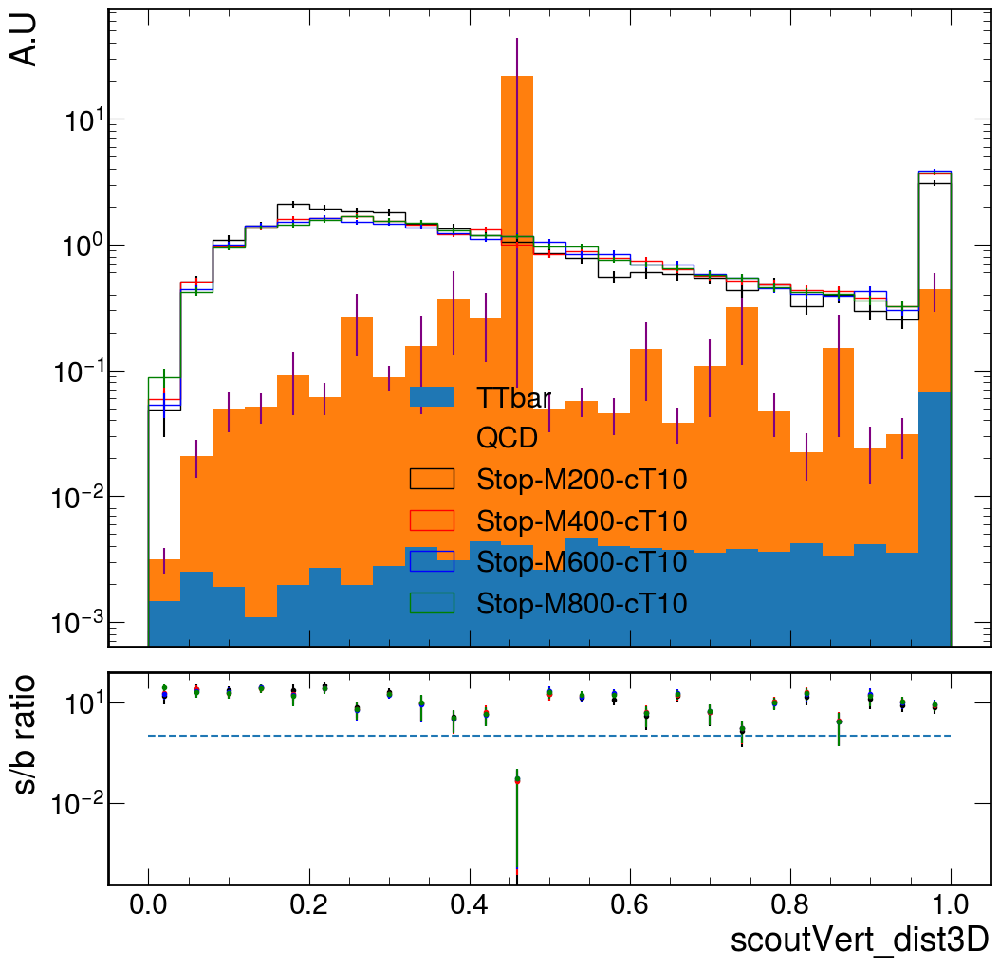

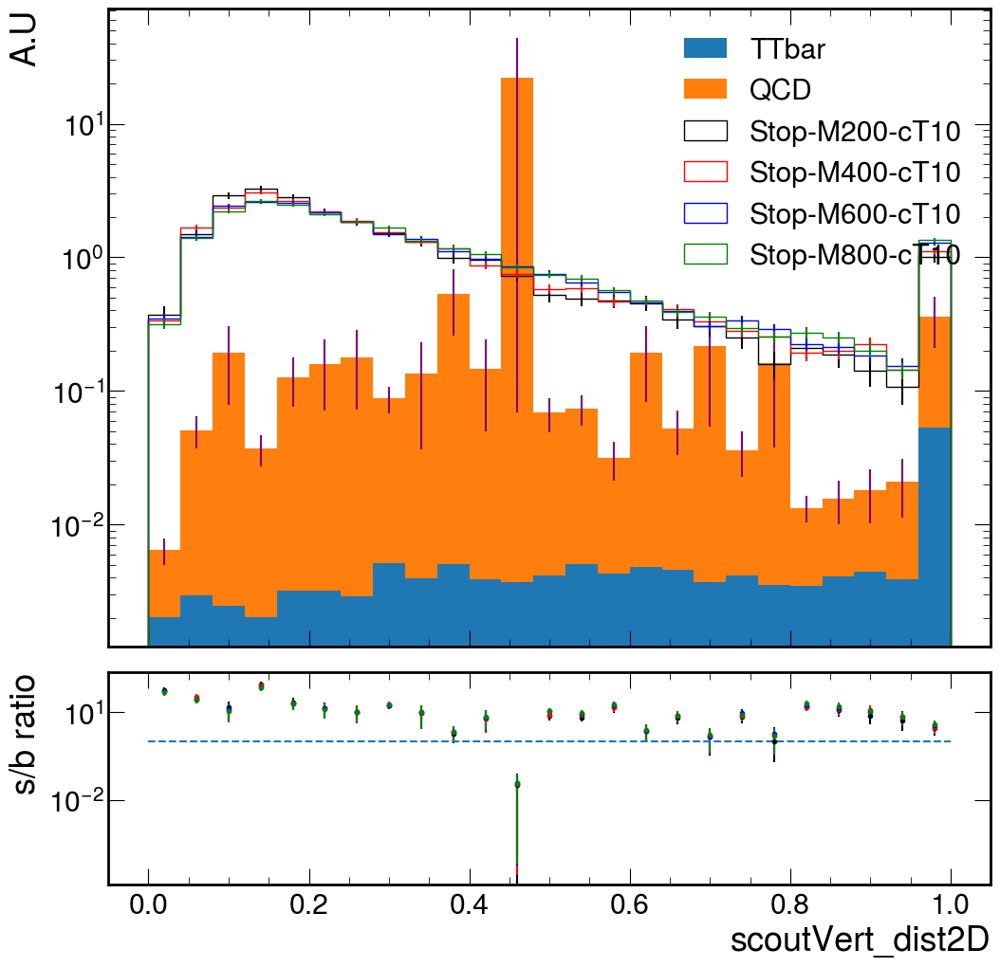

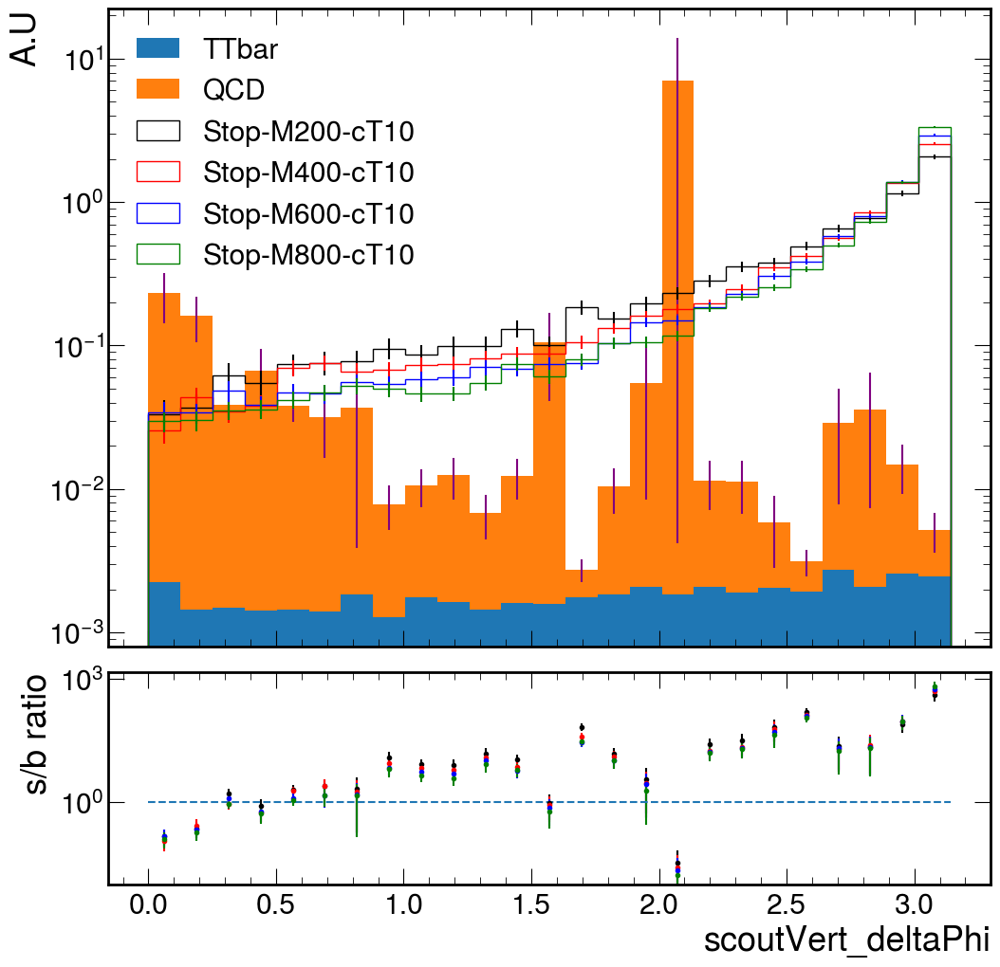

/tmp/rmccarth/ipykernel_2996966/2688744808.py:234: RuntimeWarning: invalid value encountered in divide
  ratioErrors = ratioValues * np.sqrt((sigErrors / sigValues)**2 + (bgErrors / bgValues)**2)


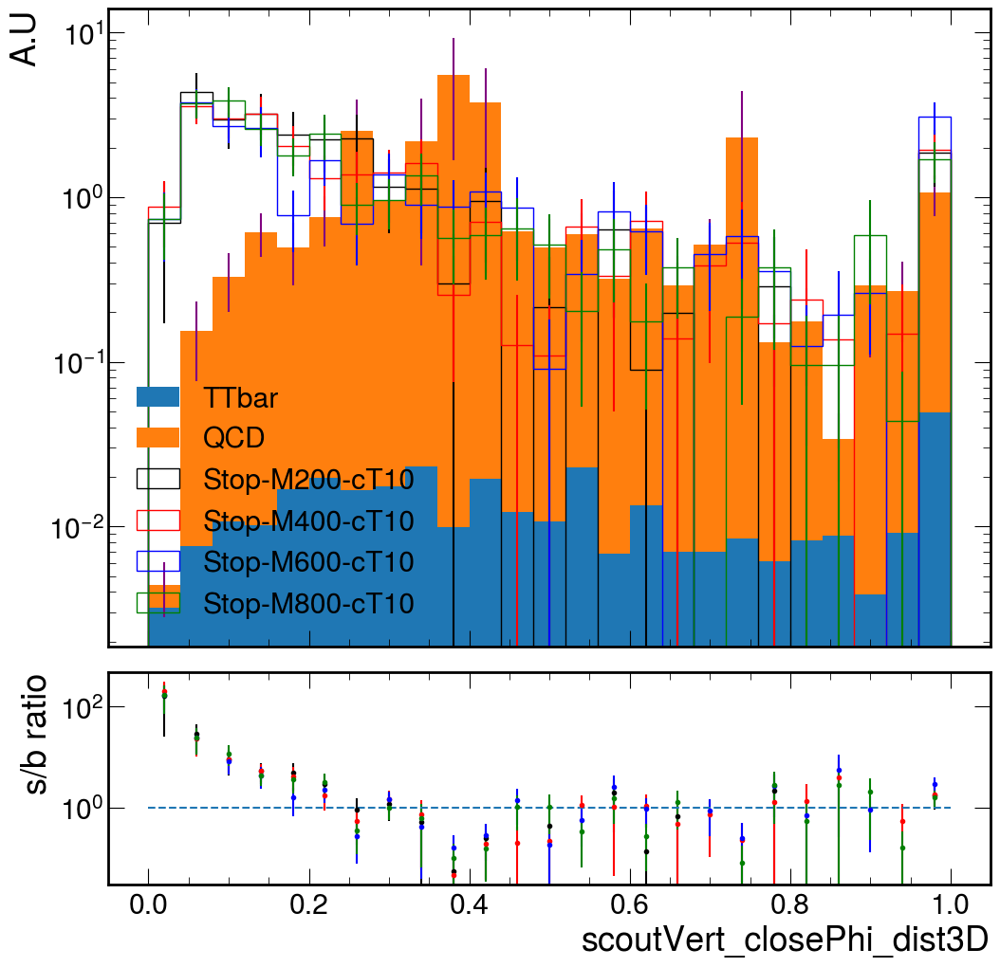

/tmp/rmccarth/ipykernel_2996966/2688744808.py:233: RuntimeWarning: divide by zero encountered in divide
  ratioValues = sigValues / bgValues
/tmp/rmccarth/ipykernel_2996966/2688744808.py:233: RuntimeWarning: invalid value encountered in divide
  ratioValues = sigValues / bgValues


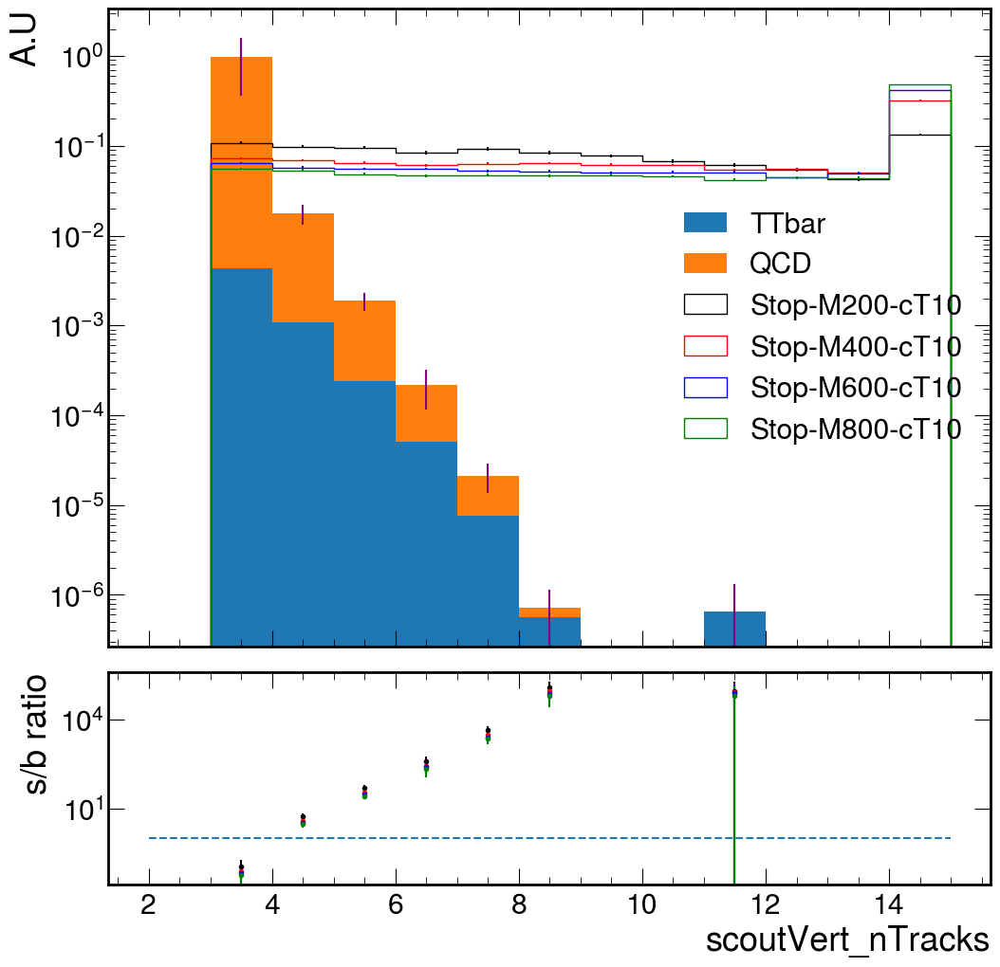

Total runtime: 60.85 seconds


In [56]:
#Vertex dVV Plots — Top 2 Vertices by Track Multiplicity

plotDict = {
    "scoutVert_dist3D": [0,1,26],
    "scoutVert_dist2D": [0,1,26],
    "scoutVert_deltaPhi": [0,3.142,26],
    "scoutVert_closePhi_dist3D": [0,1,26],
    "scoutVert_nTracks": [2,15,14],
}

import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed


def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    doWeightSum = False
    genWeightSum = 0
    with uproot.open(rootFile) as file:
        if process in processDict:
            if len(processDict[process]) > 1:
                doWeightSum = True
        elif process in signalDict:
            if len(signalDict[process]) > 1:
                doWeightSum = True
        if doWeightSum:
            output["genWeightSum"] = {process: file["triggerFilter/genWeightsSkim"].values()[0]}
        else:
            output["genWeightSum"] = {}
            genWeightSum = file["triggerFilter/genWeightsSkim"].values()[0]
        tree = file["scoutingTree/objectTree"]

        branches = [
            "scoutVert_x", "scoutVert_y", "scoutVert_z",
            "scoutVert_dBV", "scoutVert_phi", "scoutVert_nTracks",
            "weight", "scoutVert_cosT", "scoutVert_dBVErr",
        ]

        for batch in tree.iterate(branches, library="ak", step_size=10000):
            weights = batch["weight"]
            if not doWeightSum:
                weights = weights / genWeightSum

            vx = batch["scoutVert_x"]
            vy = batch["scoutVert_y"]
            vz = batch["scoutVert_z"]
            phi = batch["scoutVert_phi"]
            ntracks = batch["scoutVert_nTracks"]

            # Apply vertex quality cuts
            mask = (
                (batch["scoutVert_dBV"] >= 0.01)
                & (batch["scoutVert_dBV"] < 2)
                #& (batch["scoutVert_dBVErr"] < 0.005)
                & (batch["scoutVert_cosT"] > 0)
            )
            vx = vx[mask]
            vy = vy[mask]
            vz = vz[mask]
            phi = phi[mask]
            ntracks = ntracks[mask]

            # Require at least 2 vertices passing cuts
            evt_mask = ak.num(vx) >= 2
            vx = vx[evt_mask]
            vy = vy[evt_mask]
            vz = vz[evt_mask]
            phi = phi[evt_mask]
            ntracks = ntracks[evt_mask]
            weights = weights[evt_mask]

            # Sort vertices by nTracks descending, take top 2
            sort_idx = ak.argsort(ntracks, ascending=False)
            vx = vx[sort_idx][:, :2]
            vy = vy[sort_idx][:, :2]
            vz = vz[sort_idx][:, :2]
            phi = phi[sort_idx][:, :2]
            ntracks = ntracks[sort_idx][:, :2]

            # Compute observables for the top-2 pair (one value per event)
            dx = vx[:, 0] - vx[:, 1]
            dy = vy[:, 0] - vy[:, 1]
            dz = vz[:, 0] - vz[:, 1]
            dphi = np.abs(phi[:, 0] - phi[:, 1])
            norm_dphi = ak.where(dphi > np.pi, 2 * np.pi - dphi, dphi)
            dist3D = np.sqrt(dx**2 + dy**2 + dz**2)
            dist2D = np.sqrt(dx**2 + dy**2)

            for plot, binning in plotDict.items():
                if "deltaPhi" in plot:
                    data = ak.to_numpy(norm_dphi)
                elif "closePhi_dist3D" in plot:
                    # Only fill if the top-2 pair has deltaPhi < 0.5
                    close_mask = ak.to_numpy(norm_dphi < 0.5)
                    data = ak.to_numpy(dist3D)[close_mask]
                    w_plot = ak.to_numpy(weights)[close_mask]
                elif "dist3D" in plot:
                    data = ak.to_numpy(dist3D)
                elif "dist2D" in plot:
                    data = ak.to_numpy(dist2D)
                elif "nTracks" in plot:
                    # Flatten both track multiplicities (2 entries per event)
                    data = ak.to_numpy(ak.flatten(ntracks))
                    w_plot = np.repeat(ak.to_numpy(weights), 2)

                # Default weights (one per event) unless overridden above
                if "closePhi" not in plot and "nTracks" not in plot:
                    w_plot = ak.to_numpy(weights)

                bins = np.linspace(binning[0], binning[1], binning[2])
                data = np.clip(data, bins[0], bins[-1])

                n, _ = np.histogram(data, weights=w_plot, bins=bins)
                n_2, _ = np.histogram(data, weights=w_plot**2, bins=bins)

                if plot not in output:
                    output[plot] = {process: n}
                    output[f"{plot}_squared"] = {process: n_2}
                else:
                    output[plot][process] = output[plot][process] + n
                    output[f"{plot}_squared"][process] = output[f"{plot}_squared"][process] + n_2

    return output


# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:
        futures = {
            executor.submit(process_root_file, (f, p)): (f, p)
            for p, files in files_dict.items()
            for f in files
        }

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        results[plot][process] = results[plot].get(process, 0) + result[plot][process]

    return results


t0 = time.time()

bgPlotWeights = parallel_processing(processDict)
sigPlotWeights = parallel_processing(signalDict)

# Combining Background Subprocesses and Reweighting Events
for plot in plotDict.keys():
    for process in bgPlotWeights["genWeightSum"].keys():
        bgPlotWeights[plot][process] = bgPlotWeights[plot][process] / bgPlotWeights["genWeightSum"][process]
        bgPlotWeights[f"{plot}_squared"][process] = bgPlotWeights[f"{plot}_squared"][process] / (bgPlotWeights["genWeightSum"][process]**2)
    bgPlotWeights[plot]["QCD"] = (
        bgPlotWeights[plot]["QCD40to70"] + bgPlotWeights[plot]["QCD70to100"] + bgPlotWeights[plot]["QCD100to200"] +
        bgPlotWeights[plot]["QCD200to400"] + bgPlotWeights[plot]["QCD400to600"]
        + bgPlotWeights[plot]["QCD600to800"] + bgPlotWeights[plot]["QCD800to1000"]
        + bgPlotWeights[plot]["QCD1000to1200"] + bgPlotWeights[plot]["QCD1200to1500"]
        + bgPlotWeights[plot]["QCD1500to2000"] + bgPlotWeights[plot]["QCD2000"]
    )
    bgPlotWeights[f"{plot}_squared"]["QCD"] = (
        bgPlotWeights[f"{plot}_squared"]["QCD40to70"] + bgPlotWeights[f"{plot}_squared"]["QCD70to100"] + bgPlotWeights[f"{plot}_squared"]["QCD100to200"] + 
        bgPlotWeights[f"{plot}_squared"]["QCD200to400"] + bgPlotWeights[f"{plot}_squared"]["QCD400to600"]
        + bgPlotWeights[f"{plot}_squared"]["QCD600to800"] + bgPlotWeights[f"{plot}_squared"]["QCD800to1000"]
        + bgPlotWeights[f"{plot}_squared"]["QCD1000to1200"] + bgPlotWeights[f"{plot}_squared"]["QCD1200to1500"]
        + bgPlotWeights[f"{plot}_squared"]["QCD1500to2000"] + bgPlotWeights[f"{plot}_squared"]["QCD2000"]
    )
    bgPlotWeights[plot]["TTbar"] = bgPlotWeights[plot]["TTTo4Q"] + bgPlotWeights[plot]["TTToLNu2Q"]
    bgPlotWeights[f"{plot}_squared"]["TTbar"] = bgPlotWeights[f"{plot}_squared"]["TTTo4Q"] + bgPlotWeights[f"{plot}_squared"]["TTToLNu2Q"]

for plot in plotDict.keys():
    for process in sigPlotWeights["genWeightSum"].keys():
        sigPlotWeights[plot][process] = sigPlotWeights[plot][process] / sigPlotWeights["genWeightSum"][process]
        sigPlotWeights[f"{plot}_squared"][process] = sigPlotWeights[f"{plot}_squared"][process] / (sigPlotWeights["genWeightSum"][process]**2)

# **Plotting**
for plot, binning in plotDict.items():
    if plot not in bgPlotWeights:
        print(f"Skipping {plot} (no data).")
        continue

    bins = np.linspace(binning[0], binning[1], binning[2])
    bgIntegral = (bins[1] - bins[0]) * sum(bgPlotWeights[plot]["QCD"] + bgPlotWeights[plot]["TTbar"])

    fig, (ax, rax) = plt.subplots(2, 1, figsize=[12, 12], gridspec_kw={"height_ratios": [3, 1]}, sharex=True)
    fig.subplots_adjust(hspace=0.06)
    ax.hist(
        [(bins[:-1] + bins[1:]) / 2] * 2,
        weights=[list(bgPlotWeights[plot]["TTbar"]), list(bgPlotWeights[plot]["QCD"])],
        stacked=True, density=True, label=["TTbar", "QCD"], bins=bins,
    )

    bgValues = (bgPlotWeights[plot]["QCD"] / bgIntegral) + (bgPlotWeights[plot]["TTbar"] / bgIntegral)
    bgErrors = np.sqrt(
        bgPlotWeights[f"{plot}_squared"]["QCD"] / (bgIntegral**2)
        + bgPlotWeights[f"{plot}_squared"]["TTbar"] / (bgIntegral**2)
    )
    ax.errorbar((bins[:-1] + bins[1:]) / 2, bgValues, yerr=bgErrors, linestyle="none", color="purple")

    colors = {
        "Stop-M200-cT10": "black",
        "Stop-M400-cT10": "red",
        "Stop-M600-cT10": "blue",
        "Stop-M800-cT10": "green",
    }
    for signal, color in colors.items():
        if plot not in sigPlotWeights or signal not in sigPlotWeights[plot]:
            print(f"Skipping {signal} in {plot} (no data).")
            continue

        integral = (bins[1] - bins[0]) * sum(sigPlotWeights[plot][signal])
        ax.hist(
            (bins[:-1] + bins[1:]) / 2,
            weights=list(sigPlotWeights[plot][signal]),
            stacked=False, density=True, label=signal, bins=bins, histtype="step", color=color,
        )

        sigValues = sigPlotWeights[plot][signal] / integral
        sigErrors = np.sqrt(sigPlotWeights[f"{plot}_squared"][signal] / (integral**2))

        ax.errorbar((bins[:-1] + bins[1:]) / 2, sigValues, yerr=sigErrors, linestyle="none", color=color)
        ratioValues = sigValues / bgValues
        ratioErrors = ratioValues * np.sqrt((sigErrors / sigValues)**2 + (bgErrors / bgValues)**2)
        rax.errorbar(
            (bins[:-1] + bins[1:]) / 2, ratioValues, yerr=ratioErrors,
            linestyle="none", color=color, marker=".",
        )

    rax.hlines(1, bins[0], bins[-1], linestyle="dashed")
    rax.set_ylabel("s/b ratio")
    ax.set_ylabel("A.U")
    plt.xlabel(plot)
    ax.legend()
    ax.set_yscale("log")
    rax.set_yscale("log")
    plt.show()

t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")

Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v24-3to4Dxy/260302_185451/QCD-4Jets_Bin-HT-70to100.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v24-3to4Dxy/260302_185250/TTto4Q.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v24-3to4Dxy/260302_185502/QCD-4Jets_Bin-HT-100to200.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v24-3to4Dxy/260302_185301/TTtoLNu2Q.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v24-3to4Dxy/260302_185440/QCD-4Jets_Bin-HT-40to70.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_

/cvmfs/cms.cern.ch/el9_amd64_gcc12/external/py3-awkward/2.1.1-edf8d8121f794c78bb662dab159497fd/lib/python3.9/site-packages/awkward/_backends.py:58: RuntimeWarning: invalid value encountered in divide
  return getattr(ufunc, method)(*args, **kwargs)


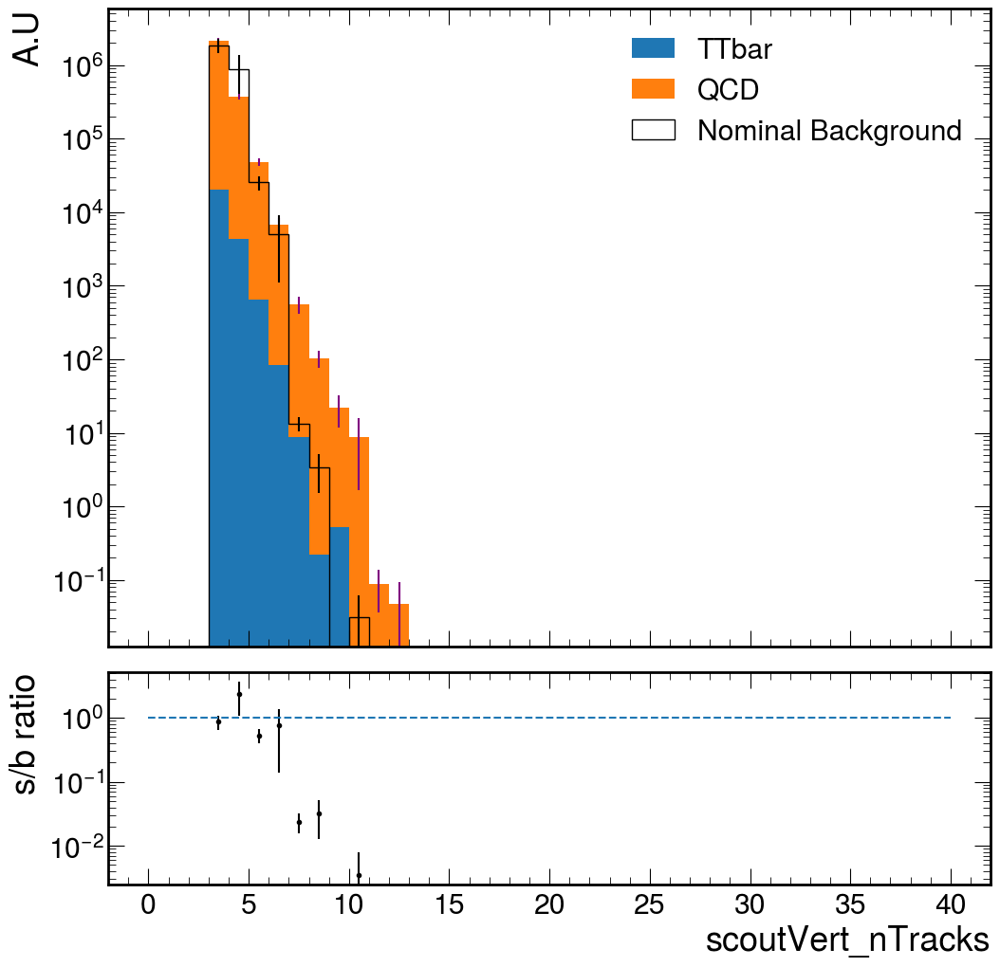

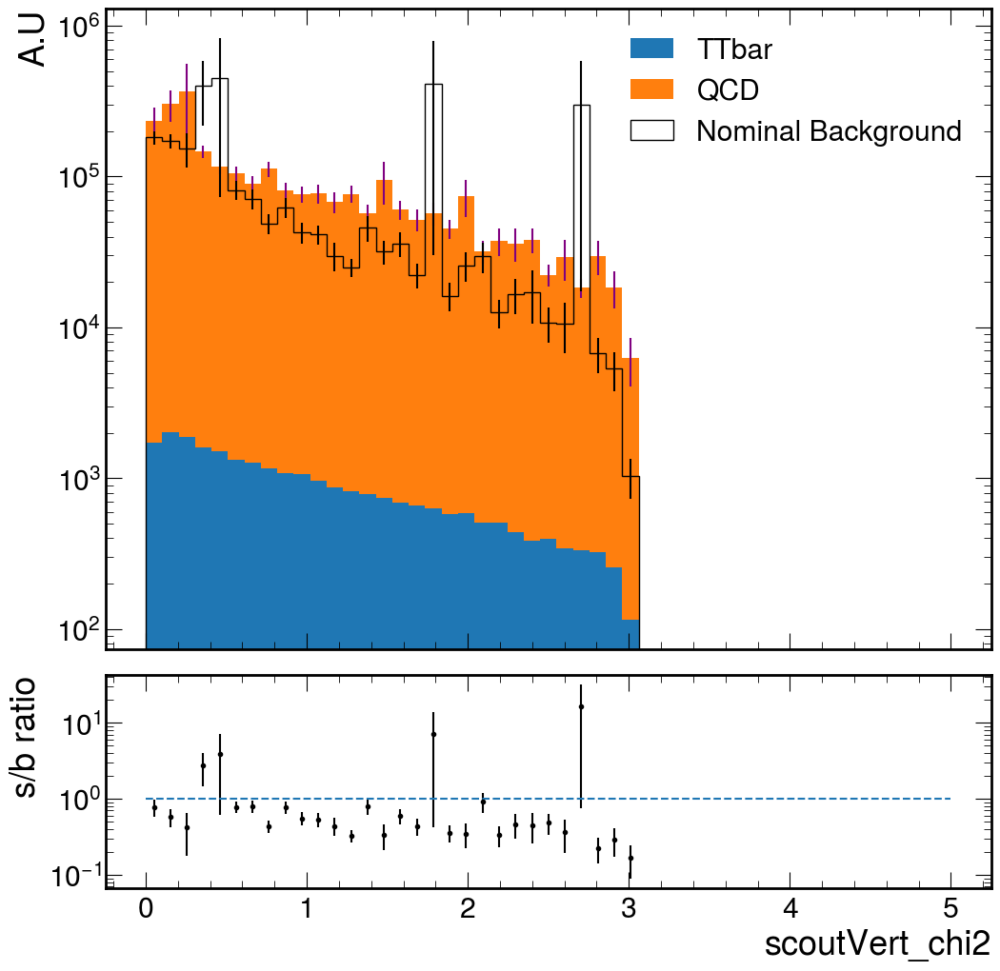

Total runtime: 48.67 seconds


In [17]:
#Branch plotting script comparing background from two samples

import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed

processDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v24-3to4Dxy/260302_185250/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v24-3to4Dxy/260302_185301/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v24-3to4Dxy/260302_185440/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v24-3to4Dxy/260302_185451/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v24-3to4Dxy/260302_185502/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v24-3to4Dxy/260302_185355/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v24-3to4Dxy/260302_185406/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v24-3to4Dxy/260302_185418/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v24-3to4Dxy/260302_185429/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v24-3to4Dxy/260302_185312/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v24-3to4Dxy/260302_185323/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v24-3to4Dxy/260302_185334/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v24-3to4Dxy/260302_185344/QCD-4Jets_Bin-HT-2000.root"]}

signalDict = {"TTTo4Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTto4Q_TuneCP5_13p6TeV_powheg-pythia8/TTto4Q_Tree_v24-4DxyMin-3TrackMin/260219_191641/TTto4Q.root"],
               "TTToLNu2Q": ["/eos/cms/store/group/phys_exotica/DVScouting/TTtoLNu2Q_TuneCP5_13p6TeV_powheg-pythia8/TTtoLNu2Q_Tree_v24-4DxyMin-3TrackMin/260219_191648/TTtoLNu2Q.root"],
               "QCD40to70": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-40to70_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-40to70_Tree_v24-4DxyMin-3TrackMin/260219_191819/QCD-4Jets_Bin-HT-40to70.root"],
               "QCD70to100": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-70to100_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-70to100_Tree_v24-4DxyMin-3TrackMin/260219_191829/QCD-4Jets_Bin-HT-70to100.root"],
               "QCD100to200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-100to200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-100to200_Tree_v24-4DxyMin-3TrackMin/260219_191839/QCD-4Jets_Bin-HT-100to200.root"],
               "QCD200to400": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-200to400_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-200to400_Tree_v24-4DxyMin-3TrackMin/260219_191733/QCD-4Jets_Bin-HT-200to400.root"],
               "QCD400to600": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-400to600_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-400to600_Tree_v24-4DxyMin-3TrackMin/260219_191743/QCD-4Jets_Bin-HT-400to600.root"],
               "QCD600to800": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-600to800_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-600to800_Tree_v24-4DxyMin-3TrackMin/260219_191753/QCD-4Jets_Bin-HT-600to800.root"],
               "QCD800to1000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-800to1000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-800to1000_Tree_v24-4DxyMin-3TrackMin/260219_191809/QCD-4Jets_Bin-HT-800to1000.root"],
               "QCD1000to1200": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1000to1200_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1000to1200_Tree_v24-4DxyMin-3TrackMin/260219_191656/QCD-4Jets_Bin-HT-1000to1200.root"],
               "QCD1200to1500": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1200to1500_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1200to1500_Tree_v24-4DxyMin-3TrackMin/260219_191704/QCD-4Jets_Bin-HT-1200to1500.root"],
               "QCD1500to2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-1500to2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-1500to2000_Tree_v24-4DxyMin-3TrackMin/260219_191713/QCD-4Jets_Bin-HT-1500to2000.root"],
               "QCD2000": ["/eos/cms/store/group/phys_exotica/DVScouting/QCD-4Jets_Bin-HT-2000_TuneCP5_13p6TeV_madgraphMLM-pythia8/QCD-4Jets_Bin-HT-2000_Tree_v24-4DxyMin-3TrackMin/260219_191723/QCD-4Jets_Bin-HT-2000.root"]}


plotDict = {
    #"vertTrack_pt": [0,5,101],# "vertTrack_eta": [-3,3,101], "vertTrack_phi": [-3.142,3.142,101],
    #"vertTrack_reducedChi2": [0,7,51], "vertTrack_dxy": [0,0.3,51], "vertTrack_dxyErr": [0,0.05,101], 
    #"vertTrack_dxySig": [0,50,101],
    #"vertTrack_nValidPixelHits": [0,13,14], "vertTrack_nTrackerLayersWithMeasurement": [0,21,22],
    #"vertTrack_nValidStripHits": [0,32,33], 
    #"vertTrack_shiftZErr": [0,0.05,51], "vertTrack_shiftZValue": [0,0.05,101],
    #"vertTrack_shift3DErr": [0,0.05,51], "vertTrack_shift3DValue": [0,0.1,101],
    #"scoutVert_dBV": [0,3,101],
    #"scoutVert_dBVErr": [0,0.1,101],
    #"vertTrack_nMissingInnerHits": [0,5,6], 
    "scoutVert_nTracks": [0,40,41], "scoutVert_chi2": [0,5,50],
    #"scoutVert_dT": [0,0.5,101]#, "scoutVert_cosT": [-1,1,101], 
    #"scoutVert_pMag": [0,500,26],
    #"scoutTrack_phi": [-3.142,3.142,101], "scoutTrack_dxySig": [0,50,101], "scoutTrack_nTrackerLayersWithMeasurement": [0,21,22],
    #"scoutTrack_pt": [0,50,101], "scoutTrack_nValidPixelHits": [0,13,14]
    #"truePU": [0,100,101]
    #"vertTrack_iJet": [0,100,101]
}

def process_root_file(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    output = {}
    doWeightSum = False
    genWeightSum = 0
    with uproot.open(rootFile) as file:
        if(process in processDict):
            if (len(processDict[process])>1): doWeightSum = True
        elif(process in signalDict):
            if (len(signalDict[process])>1): doWeightSum = True
        if(doWeightSum):
            output["genWeightSum"] = {process: file["triggerFilter/genWeightsSkim"].values()[0]}
        else:
            output["genWeightSum"] = {}
            genWeightSum = file["triggerFilter/genWeightsSkim"].values()[0]
        tree = file["scoutingTree/objectTree"]

        # Select only necessary branches to load
        branches = list(plotDict.keys()) + ["vertTrack_iVtx", "weight","scoutVert_dBV","weight_BCDEFGHI_nominal","scoutVert_chi2","scoutVert_dBVErr","scoutVert_cosT"]
        # Iterate over the tree in chunks (adjust step_size to control memory usage)
        for batch in tree.iterate(branches, library="ak", step_size=100000):  
            weights = batch["weight_BCDEFGHI_nominal"]  # normalize event weights
            if(not doWeightSum): weights = weights / genWeightSum

            for plot, binning in plotDict.items():
                bins = np.linspace(binning[0], binning[1], binning[2])
                data = batch[plot]
                # Apply displacement cut
                #if "vertTrack_shift" in plot:
                #   mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.1) & (batch["vertTrack_shiftZValue"] > -900)
                if "vertTrack" in plot:
                    #mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.1)  & (batch["vertTrack_dxySig"] > 5) & (batch["vertTrack_pt"] > 1.0) & (batch["vertTrack_nValidPixelHits"] > 1)
                    mask = (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] >= 0.01) & (batch["scoutVert_dBV"][batch["vertTrack_iVtx"]] < 2)
                elif "scoutVert" in plot:
                    mask = (batch["scoutVert_dBV"] >= 0.01) & (batch["scoutVert_dBV"] < 2) & (batch["scoutVert_dBVErr"] < 0.005) & (batch["scoutVert_cosT"] > 0) & (batch["scoutVert_chi2"] < 3)#& (batch["scoutVert_nTracks"] > 7)
                elif "scoutTrack" in plot:
                    mask = (batch["scoutTrack_dxySig"] > 5) & (batch["scoutTrack_pt"] > 1.0) & (batch["scoutTrack_nValidPixelHits"] > 1) & (batch["scoutTrack_nTrackerLayersWithMeasurement"] > 5)
                else:
                    mask = ak.ones_like(data, dtype=bool)
                data = data[mask]
                #mask = ak.sum(mask,axis=1)>1
                #data = data[mask]
                #maskedWeights = weights[mask]
                broadcastWeights, data = ak.broadcast_arrays(weights,data)
                # Apply mask and flatten data
                data = ak.flatten(data,axis=None)
                data = np.clip(data,bins[0],bins[-1])
                weights_filtered = ak.flatten(broadcastWeights,axis=None)
                # Compute histograms
                n, _ = np.histogram(data, weights=weights_filtered, bins=bins)
                n_2, _ = np.histogram(data, weights=weights_filtered**2, bins=bins)
                if plot not in output:
                    output[plot] = {process: n}
                    output[f"{plot}_squared"] = {process: n_2}
                else:
                    output[plot][process] = output[plot][process] + n
                    output[f"{plot}_squared"][process] = output[f"{plot}_squared"][process] + n_2
    return output

# **Parallel Processing Using ProcessPoolExecutor**
def parallel_processing(files_dict):
    results = {}
    with ProcessPoolExecutor(max_workers=16) as executor:  # Adjust max_workers based on CPU cores
        futures = {executor.submit(process_root_file, (f, p)): (f, p)
                   for p, files in files_dict.items() for f in files}

        for future in as_completed(futures):
            result = future.result()
            for plot in result:
                if plot not in results:
                    results[plot] = result[plot]
                else:
                    for process in result[plot]:
                        results[plot][process] = results[plot].get(process, 0) + result[plot][process]

    return results

t0 = time.time()

bgPlotWeights = parallel_processing(processDict)
sigPlotWeights = parallel_processing(signalDict)

#Combining Background Subprocesses and Reweighting Events
for plot in plotDict.keys():
    for process in bgPlotWeights["genWeightSum"].keys():
        bgPlotWeights[plot][process] = bgPlotWeights[plot][process] / bgPlotWeights["genWeightSum"][process]
        bgPlotWeights[f"{plot}_squared"][process] = bgPlotWeights[f"{plot}_squared"][process] / (bgPlotWeights["genWeightSum"][process]**2)
    bgPlotWeights[plot]["QCD"] = bgPlotWeights[plot]["QCD40to70"]+bgPlotWeights[plot]["QCD70to100"]+bgPlotWeights[plot]["QCD100to200"]+bgPlotWeights[plot]["QCD200to400"]+bgPlotWeights[plot]["QCD400to600"]+bgPlotWeights[plot]["QCD600to800"]+bgPlotWeights[plot]["QCD800to1000"]+bgPlotWeights[plot]["QCD1000to1200"]+bgPlotWeights[plot]["QCD1200to1500"]+bgPlotWeights[plot]["QCD1500to2000"]+bgPlotWeights[plot]["QCD2000"]
    bgPlotWeights[f"{plot}_squared"]["QCD"] = bgPlotWeights[f"{plot}_squared"]["QCD40to70"]+bgPlotWeights[f"{plot}_squared"]["QCD70to100"]+bgPlotWeights[f"{plot}_squared"]["QCD100to200"]+bgPlotWeights[f"{plot}_squared"]["QCD200to400"]+bgPlotWeights[f"{plot}_squared"]["QCD400to600"]+bgPlotWeights[f"{plot}_squared"]["QCD600to800"]+bgPlotWeights[f"{plot}_squared"]["QCD800to1000"]+bgPlotWeights[f"{plot}_squared"]["QCD1000to1200"]+bgPlotWeights[f"{plot}_squared"]["QCD1200to1500"]+bgPlotWeights[f"{plot}_squared"]["QCD1500to2000"]+bgPlotWeights[f"{plot}_squared"]["QCD2000"]
    bgPlotWeights[plot]["TTbar"] = bgPlotWeights[plot]["TTTo4Q"]+bgPlotWeights[plot]["TTToLNu2Q"]
    bgPlotWeights[f"{plot}_squared"]["TTbar"] = bgPlotWeights[f"{plot}_squared"]["TTTo4Q"]+bgPlotWeights[f"{plot}_squared"]["TTToLNu2Q"]
for plot in plotDict.keys():
    for process in sigPlotWeights["genWeightSum"].keys():
        sigPlotWeights[plot][process] = sigPlotWeights[plot][process] / sigPlotWeights["genWeightSum"][process]
        sigPlotWeights[f"{plot}_squared"][process] = sigPlotWeights[f"{plot}_squared"][process] / (sigPlotWeights["genWeightSum"][process]**2)
    sigPlotWeights[plot]["QCD"] = sigPlotWeights[plot]["QCD40to70"]+sigPlotWeights[plot]["QCD70to100"]+sigPlotWeights[plot]["QCD100to200"]+sigPlotWeights[plot]["QCD200to400"]+sigPlotWeights[plot]["QCD400to600"]+sigPlotWeights[plot]["QCD600to800"]+sigPlotWeights[plot]["QCD800to1000"]+sigPlotWeights[plot]["QCD1000to1200"]+sigPlotWeights[plot]["QCD1200to1500"]+sigPlotWeights[plot]["QCD1500to2000"]+sigPlotWeights[plot]["QCD2000"]
    sigPlotWeights[f"{plot}_squared"]["QCD"] = sigPlotWeights[f"{plot}_squared"]["QCD40to70"]+sigPlotWeights[f"{plot}_squared"]["QCD70to100"]+sigPlotWeights[f"{plot}_squared"]["QCD100to200"]+sigPlotWeights[f"{plot}_squared"]["QCD200to400"]+sigPlotWeights[f"{plot}_squared"]["QCD400to600"]+sigPlotWeights[f"{plot}_squared"]["QCD600to800"]+sigPlotWeights[f"{plot}_squared"]["QCD800to1000"]+sigPlotWeights[f"{plot}_squared"]["QCD1000to1200"]+sigPlotWeights[f"{plot}_squared"]["QCD1200to1500"]+sigPlotWeights[f"{plot}_squared"]["QCD1500to2000"]+sigPlotWeights[f"{plot}_squared"]["QCD2000"]
    sigPlotWeights[plot]["TTbar"] = sigPlotWeights[plot]["TTTo4Q"]+sigPlotWeights[plot]["TTToLNu2Q"]
    sigPlotWeights[f"{plot}_squared"]["TTbar"] = sigPlotWeights[f"{plot}_squared"]["TTTo4Q"]+sigPlotWeights[f"{plot}_squared"]["TTToLNu2Q"]
    sigPlotWeights[plot]["Bkg"] = sigPlotWeights[plot]["QCD"]+sigPlotWeights[plot]["TTbar"]
    sigPlotWeights[f"{plot}_squared"]["Bkg"] = sigPlotWeights[f"{plot}_squared"]["QCD"] + sigPlotWeights[f"{plot}_squared"]["TTbar"]
    
# **Plotting**
for plot, binning in plotDict.items():
    if plot not in bgPlotWeights:
        print(f"Skipping {plot} (no data).")
        continue

    bins = np.linspace(binning[0], binning[1], binning[2])
    #bgIntegral = (bins[1] - bins[0]) * sum(bgPlotWeights[plot]["QCD"] + bgPlotWeights[plot]["TTbar"])
    bgIntegral = 1

    fig, (ax, rax) = plt.subplots(2, 1, figsize=[12,12], gridspec_kw={"height_ratios": [3,1]}, sharex=True)
    fig.subplots_adjust(hspace=0.06)
    ax.hist([(bins[:-1] + bins[1:]) / 2]*2,weights=[list(bgPlotWeights[plot]["TTbar"]),list(bgPlotWeights[plot]["QCD"])],
            stacked=True, density=False, label=["TTbar","QCD"], bins=bins)

    bgValues = (bgPlotWeights[plot]["QCD"] / bgIntegral) + (bgPlotWeights[plot]["TTbar"] / bgIntegral)
    bgErrors = np.sqrt(bgPlotWeights[f"{plot}_squared"]["QCD"] / (bgIntegral**2) + \
               bgPlotWeights[f"{plot}_squared"]["TTbar"] / (bgIntegral**2))
    #bgValues = np.nan_to_num(bgValues)
    #bgErrors = np.nan_to_num(bgErrors)
    ax.errorbar(((bins[:-1] + bins[1:]) / 2), bgValues, yerr=bgErrors, linestyle="none", color="purple")
    
    #colors = {"Stop-M200-cT1": "black", "Stop-M400-cT1": "red", "Stop-M600-cT1": "blue", "Stop-M800-cT1": "green"}
    #colors = {"Hto2Sto4D-cT0p1-MS7": "black", "Hto2Sto4D-cT0p1-MS15": "red", "Hto2Sto4D-cT0p1-MS30": "blue", "Hto2Sto4D-cT0p1-MS55": "green"}
    colors = {"Bkg": "black"}
    for signal, color in colors.items():
        if plot not in sigPlotWeights or signal not in sigPlotWeights[plot]:
            print(f"Skipping {signal} in {plot} (no data).")
            continue

        #integral = (bins[1] - bins[0]) * sum(sigPlotWeights[plot][signal])
        integral = 1
        ax.hist(((bins[:-1] + bins[1:]) / 2), weights=list(sigPlotWeights[plot][signal]),
                stacked=False, density=False, label="Nominal Background", bins=bins, histtype="step", color=color)

        sigValues = sigPlotWeights[plot][signal] / integral
        sigErrors = np.sqrt(sigPlotWeights[f"{plot}_squared"][signal] / (integral**2))

        ax.errorbar(((bins[:-1] + bins[1:]) / 2), sigValues, yerr=sigErrors, linestyle="none", color=color)
        ratioValues = sigValues / bgValues
        ratioErrors = ratioValues * np.sqrt((sigErrors / sigValues)**2 + (bgErrors / bgValues)**2)
        #ratioValues = np.nan_to_num(ratioValues)
        #ratioErrors = np.nan_to_num(ratioErrors)
        rax.errorbar(((bins[:-1] + bins[1:]) / 2), ratioValues, yerr=ratioErrors, linestyle="none", color=color, marker=".")

    rax.hlines(1, bins[0], bins[-1], linestyle="dashed")
    rax.set_ylabel("s/b ratio")
    ax.set_ylabel("A.U")
    plt.xlabel(plot)
    ax.legend()
    ax.set_yscale("log")
    rax.set_yscale("log")
    plt.show()

t1 = time.time()
print(f"Total runtime: {t1 - t0:.2f} seconds")


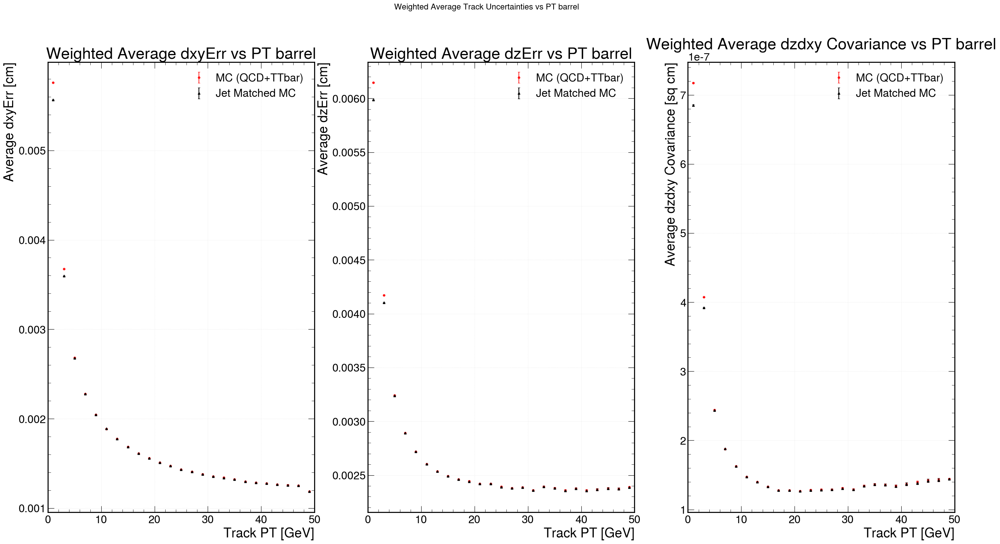

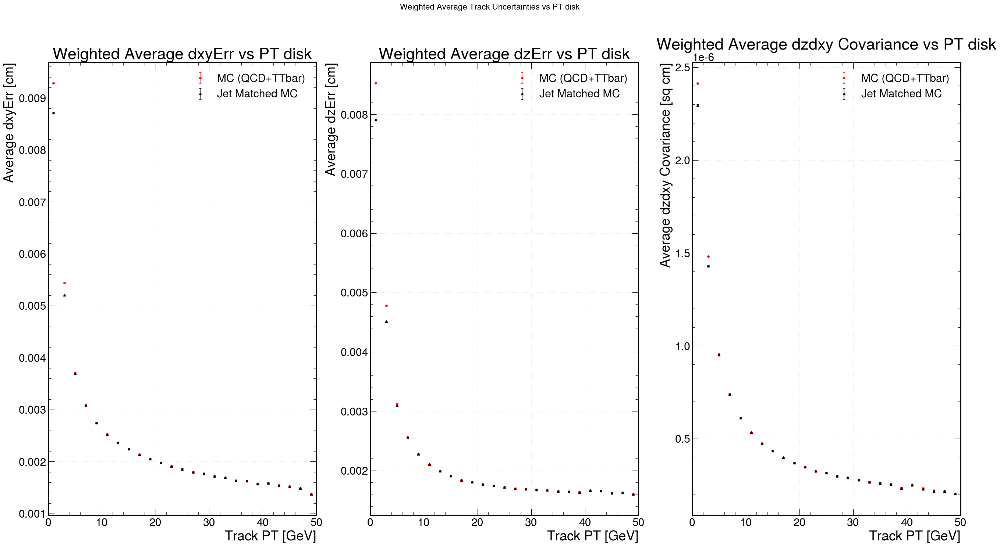

In [24]:
#Track Uncertainty Jet Match Comparison

import time
import uproot
import awkward as ak
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ProcessPoolExecutor, as_completed

plotDict = {
    "scoutTrack_pt": [0,50,26]
}

# Helper function to combine weighted statistics
def combine_weighted_stats(data, components):
    """Combine weighted statistics from multiple components"""
    combined = {}
    
    # First combine the raw sums
    sum_keys = ["weight_sum", "weight_sq_sum", "dxyErr_weighted_sum", "dszErr_weighted_sum", "dszdxyCov_weighted_sum",
                "dxyErr_weighted_sq_sum", "dszErr_weighted_sq_sum", "dszdxyCov_weighted_sq_sum"]
    
    for key in sum_keys:
        for string in ["_barrel_jetMatched","_disk_jetMatched","_barrel","_disk"]:
            fullKey = key+string
            if fullKey in data:
                combined[fullKey] = sum(data[fullKey][comp] for comp in components if comp in data[fullKey])
    
    # Recalculate means and standard errors
    for string in ["_barrel_jetMatched","_disk_jetMatched","_barrel","_disk"]:
        with np.errstate(divide='ignore', invalid='ignore'):
            # Weighted means
            combined["dxyErr_mean"+string] = np.where(combined["weight_sum"+string] > 0, 
                                              combined["dxyErr_weighted_sum"+string] / combined["weight_sum"+string], 0)
            combined["dzErr_mean"+string] = np.where(combined["weight_sum"+string] > 0, 
                                             combined["dszErr_weighted_sum"+string] / combined["weight_sum"+string], 0)
            combined["cov_mean"+string] = np.where(combined["weight_sum"+string] > 0, 
                                             combined["dszdxyCov_weighted_sum"+string] / combined["weight_sum"+string], 0)

            # Weighted variances
            dxyErr_var = np.where(combined["weight_sum"+string] > 0,
                                  combined["dxyErr_weighted_sq_sum"+string] / combined["weight_sum"+string] - combined["dxyErr_mean"+string]**2, 0)
            dzErr_var = np.where(combined["weight_sum"+string] > 0,
                                 combined["dszErr_weighted_sq_sum"+string] / combined["weight_sum"+string] - combined["dzErr_mean"+string]**2, 0)
            cov_var = np.where(combined["weight_sum"+string] > 0,
                                 combined["dszdxyCov_weighted_sq_sum"+string] / combined["weight_sum"+string] - combined["cov_mean"+string]**2, 0)

            # Effective sample size
            eff_n = np.where(combined["weight_sq_sum"+string] > 0, 
                             combined["weight_sum"+string]**2 / combined["weight_sq_sum"+string], 0)

            # Standard errors
            combined["dxyErr_stderr"+string] = np.where(eff_n > 0, np.sqrt(dxyErr_var / eff_n), 0)
            combined["dzErr_stderr"+string] = np.where(eff_n > 0, np.sqrt(dzErr_var / eff_n), 0)
            combined["cov_stderr"+string] = np.where(eff_n > 0, np.sqrt(cov_var / eff_n), 0)
    
    return combined

t0 = time.time()

plotWeights = {}
dict = signalDict | processDict
for process, rootFiles in dict.items():
    for rootFile in rootFiles:
        f = ROOT.TFile.Open(rootFile, "READ")
        
        #Assuming only one file per process here
        h_genWeights = f.Get("triggerFilter/genWeightsSkim")
        n_binsSkim = h_genWeights.GetNbinsX() 
        genWeights = np.array([h_genWeights.GetBinContent(i) for i in range(1, n_binsSkim + 1)])
        genWeightSum = genWeights[0]
        
        for plot in ["weight_sum","weight_sq_sum","dxyErr_weighted_sum","dszErr_weighted_sum","dszdxyCov_weighted_sum","dxyErr_weighted_sq_sum","dszErr_weighted_sq_sum","dszdxyCov_weighted_sq_sum"]:
            for string in ["_barrel_jetMatched","_disk_jetMatched","_barrel","_disk"]:
                hist = f.Get("p/"+plot+string)
                nbins = hist.GetNbinsX() 
                data = np.array([hist.GetBinContent(i) for i in range(1, nbins + 1)])
                rebinned = data[:50].reshape(25, 2).sum(axis=1) #rebin to 25 bins
                rebinned[-1] += data[50:].sum()  # overflow from x > 50

                
                if process in processDict:
                    if ("weight_sq_sum" == plot):
                        rebinned = rebinned/(genWeightSum**2)
                    else:
                        rebinned = rebinned/genWeightSum

                if (plot+string) not in plotWeights:
                    plotWeights[(plot+string)] = {process: rebinned}
                else:
                    if process in plotWeights[(plot+string)]:
                        plotWeights[(plot+string)][process] = plotWeights[(plot+string)][process] + rebinned
                    else:
                        plotWeights[(plot+string)][process] = rebinned
        

    
# Combine QCD components
qcd_components = ["QCD40to70", "QCD70to100", "QCD100to200", "QCD200to400", "QCD400to600", 
                 "QCD600to800", "QCD800to1000", "QCD1000to1200", "QCD1200to1500", "QCD1500to2000", "QCD2000"]

# Combine TTbar components
ttbar_components = ["TTTo4Q", "TTToLNu2Q"]

# Combine weighted statistics for QCD
bg_stats = combine_weighted_stats(plotWeights, qcd_components+ttbar_components)
for key in bg_stats.keys():
    if key in plotWeights:
        plotWeights[key]["BG"] = bg_stats[key]
    else:
        plotWeights[key] = {"BG": bg_stats[key]}

# **Plotting**
# Plot average dxyErr and dzErr vs PT with error bars
pt_bins = np.linspace(plotDict["scoutTrack_pt"][0], plotDict["scoutTrack_pt"][1], plotDict["scoutTrack_pt"][2])
pt_centers = (pt_bins[:-1] + pt_bins[1:]) / 2

for string in ["_barrel","_disk"]:
    mc_dxyErr_mean = plotWeights["dxyErr_mean"+string]["BG"]
    mc_dzErr_mean = plotWeights["dzErr_mean"+string]["BG"]
    mc_cov_mean = plotWeights["cov_mean"+string]["BG"]
    mc_dxyErr_stderr = plotWeights["dxyErr_stderr"+string]["BG"]
    mc_dzErr_stderr = plotWeights["dzErr_stderr"+string]["BG"]
    mc_cov_stderr = plotWeights["cov_stderr"+string]["BG"]
    # Create figure with 2 subplots for dxyErr and dzErr
    fig, axes = plt.subplots(1, 3, figsize=[32, 16])
    fig.suptitle("Weighted Average Track Uncertainties vs PT "+string[1:], fontsize=16)

    # Plot 1: Average dxyErr vs PT with error bars
    ax = axes[0]
    ax.errorbar(pt_centers, mc_dxyErr_mean, 
               yerr=mc_dxyErr_stderr,
               label="MC (QCD+TTbar)", marker='o', markersize=4, capsize=2, alpha=0.8, linestyle='none', color='red')
    ax.errorbar(pt_centers, plotWeights["dxyErr_mean"+string+"_jetMatched"]["BG"], 
               yerr=plotWeights["dxyErr_stderr"+string+"_jetMatched"]["BG"],
               label="Jet Matched MC", marker='^', markersize=4, color='black', capsize=2, linestyle='none')
    ax.set_xlabel("Track PT [GeV]")
    ax.set_ylabel("Average dxyErr [cm]")
    ax.set_title("Weighted Average dxyErr vs PT "+string[1:])
    ax.legend()
    ax.grid(True, alpha=0.3)
    ax.set_xlim(pt_bins[0], pt_bins[-1])

    # Plot 2: Average dzErr vs PT with error bars
    ax = axes[1]
    ax.errorbar(pt_centers, mc_dzErr_mean, 
               yerr=mc_dzErr_stderr,
               label="MC (QCD+TTbar)", marker='o', markersize=4, capsize=2, alpha=0.8, linestyle='none', color='red')
    ax.errorbar(pt_centers, plotWeights["dzErr_mean"+string+"_jetMatched"]["BG"], 
               yerr=plotWeights["dzErr_stderr"+string+"_jetMatched"]["BG"],
               label="Jet Matched MC", marker='^', markersize=4, color='black', capsize=2, linestyle='none')
    ax.set_xlabel("Track PT [GeV]")
    ax.set_ylabel("Average dzErr [cm]")
    ax.set_title("Weighted Average dzErr vs PT "+string[1:])
    ax.legend()
    ax.grid(True, alpha=0.3)
    ax.set_xlim(pt_bins[0], pt_bins[-1])

    # Plot 3: Average dxydz covariance vs PT with error bars
    ax = axes[2]
    ax.errorbar(pt_centers, mc_cov_mean, 
               yerr=mc_cov_stderr,
               label="MC (QCD+TTbar)", marker='o', markersize=4, capsize=2, alpha=0.8, linestyle='none', color='red')
    ax.errorbar(pt_centers, plotWeights["cov_mean"+string+"_jetMatched"]["BG"], 
               yerr=plotWeights["cov_stderr"+string+"_jetMatched"]["BG"],
               label="Jet Matched MC", marker='^', markersize=4, color='black', capsize=2, linestyle='none')
    ax.set_xlabel("Track PT [GeV]")
    ax.set_ylabel("Average dzdxy Covariance [sq cm]")
    ax.set_title("Weighted Average dzdxy Covariance vs PT "+string[1:])
    ax.legend()
    ax.grid(True, alpha=0.3)
    ax.set_xlim(pt_bins[0], pt_bins[-1])

    #plt.tight_layout()
    plt.show()


Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v28-3to4Dxy-Resubmit/260414_174452/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55_Tree_v28-3to4Dxy-Resubmit/260414_174525/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-55.root

Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v28-3to4Dxy-Resubmit/260414_174550/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15.root
Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v28-3to4Dxy-Resubmit/260413

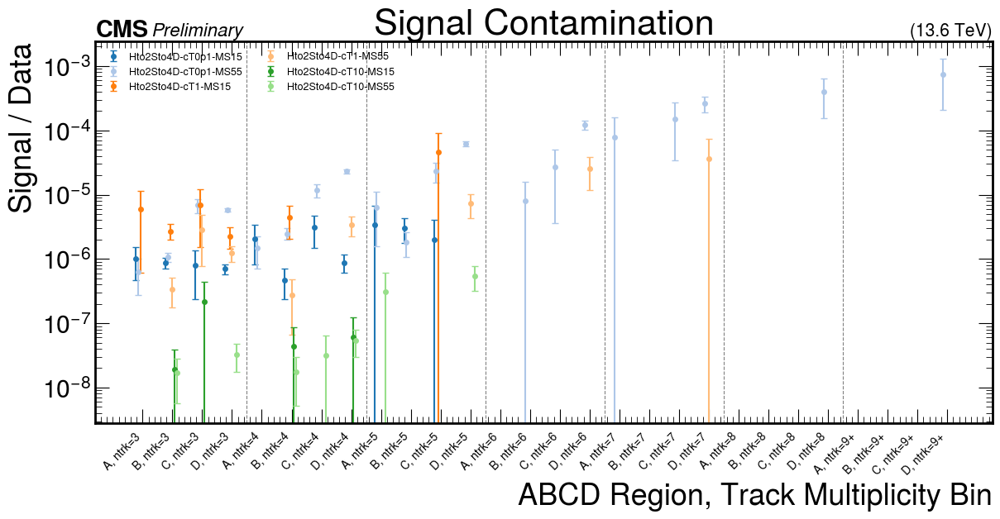

In [8]:
#Binned ABCD Signal Contamination Plot

# ABCD regions in (cosT, chi2):
#   A: cosT <= 0, chi2 >= 3  (fail both)
#   B: cosT <= 0, chi2 < 3   (pass chi2 only)
#   C: cosT > 0,  chi2 >= 3  (pass cosT only)
#   D: cosT > 0,  chi2 < 3   (signal region)
#
# Transfer factor: TF = B/A
# Prediction: D_pred = C * (B/A)
import matplotlib.ticker as ticker
NTRACK_BINS = [3, 4, 5, 6, 7, 8, "9+"]
ABCD_REGIONS = ["A", "B", "C", "D"]

def process_abcd_per_ntrack(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    # Initialize counts: {ntrk: {region: (sum_w, sum_w2)}}
    counts = {nt: {r: [0.0, 0.0] for r in ABCD_REGIONS} for nt in NTRACK_BINS}

    with uproot.open(rootFile) as file:
        tree = file["scoutingTree/objectTree"]
        branches = [
            "scoutVert_dBV", "scoutVert_dBVErr", "scoutVert_nTracks",
            "scoutVert_chi2", "scoutVert_cosT", "jet_pt", "uncorrectedWeight", "weight_PU_BCDEFGHI_nominal", "weight_trigger_nominal"
        ]

        for batch in tree.iterate(branches, library="ak", step_size=100000):
            weights = batch["uncorrectedWeight"] * batch["weight_PU_BCDEFGHI_nominal"] * batch["weight_trigger_nominal"] # event weights
            if(process in dataDict):
                weights = ak.ones_like(weights)
            dBV = batch["scoutVert_dBV"]
            dBVErr = batch["scoutVert_dBVErr"]
            ntracks = batch["scoutVert_nTracks"]
            chi2 = batch["scoutVert_chi2"]
            cosT = batch["scoutVert_cosT"]
            # Baseline vertex selection
            vtx_mask = (dBV > 0.01) & (dBV < 2.0) & (ntracks > 2) & (dBVErr < 0.005) #& (ntracks < 8)
            dBV = dBV[vtx_mask]
            ntracks = ntracks[vtx_mask]
            chi2 = chi2[vtx_mask]
            cosT = cosT[vtx_mask]

            # Keep events with at least one vertex passing baseline
            evt_mask = ak.num(dBV, axis=1) > 0
            weights = weights[evt_mask]
            ntracks = ntracks[evt_mask]
            chi2 = chi2[evt_mask]
            cosT = cosT[evt_mask]

            for nt in NTRACK_BINS:
                # Select vertices with exactly this track multiplicity
                # (or >= 8 for the inclusive bin)
                if nt == "9+":
                    nt_mask = ntracks >= 9
                else:
                    nt_mask = ntracks == nt

                nt_chi2 = chi2[nt_mask]
                nt_cosT = cosT[nt_mask]

                # ABCD masks (per vertex)
                pass_cosT = nt_cosT > 0
                pass_chi2 = nt_chi2 < 2.5

                region_masks = {
                    "A": ~pass_cosT & ~pass_chi2,
                    "B": ~pass_cosT & pass_chi2,
                    "C": pass_cosT & ~pass_chi2,
                    "D": pass_cosT & pass_chi2,
                }

                duplicateMask = ak.ones_like(weights, dtype=bool)
                for region in ["D","C","B","A"]:
                    rmask = region_masks[region]
                    # Event has at least one vertex in this region
                    evt_in_region = (ak.num(nt_cosT[rmask]) > 0) & duplicateMask
                    duplicateMask = duplicateMask & (~evt_in_region)
                    
                    w = weights[evt_in_region]
                    counts[nt][region][0] += float(ak.sum(w))
                    counts[nt][region][1] += float(ak.sum(w**2))
                    
                    
    return process, counts


def merge_counts(all_counts):
    """Merge counts across files for the same process."""
    merged = {}
    for process, counts in all_counts:
        if process not in merged:
            merged[process] = {nt: {r: [0.0, 0.0] for r in ABCD_REGIONS} for nt in NTRACK_BINS}
        for nt in NTRACK_BINS:
            for r in ABCD_REGIONS:
                merged[process][nt][r][0] += counts[nt][r][0]
                merged[process][nt][r][1] += counts[nt][r][1]
    return merged

# ============================================================
# Main
# ============================================================
if __name__ == "__main__":
    # --- Fill in your file dictionaries here ---
    # processDict = {"2024C": [...], "2024D": [...], ...}
    # signalDict = {"stop_M200_ctau10": [...], ...}

    run_dict = signalDict | dataDict

    # Parallel processing
    all_results = []
    with ProcessPoolExecutor(max_workers=16) as executor:
        futures = {
            executor.submit(process_abcd_per_ntrack, (f, p)): (f, p)
            for p, files in run_dict.items() for f in files
        }
        for future in as_completed(futures):
            all_results.append(future.result())

    merged = merge_counts(all_results)

    # Combine data eras
    combined = {nt: {r: [0.0, 0.0] for r in ABCD_REGIONS} for nt in NTRACK_BINS}
    data_eras = [k for k in merged if k.startswith("2024")]
    for era in data_eras:
        for nt in NTRACK_BINS:
            for r in ABCD_REGIONS:
                combined[nt][r][0] += merged[era][nt][r][0]
                combined[nt][r][1] += merged[era][nt][r][1]

    genWeightSumDict = {}
    for process, rootFiles in signalDict.items():
        genWeightSum = 0
        for rootFile in rootFiles:
            f = ROOT.TFile.Open(rootFile, "READ")
            h_genWeights = f.Get("triggerFilter/genWeightsSkim")
            n_binsSkim = h_genWeights.GetNbinsX() 
            genWeights = np.array([h_genWeights.GetBinContent(i) for i in range(1, n_binsSkim + 1)])
            genWeightSum += genWeights[0]
        genWeightSumDict[process] = genWeightSum

    #Reweighting Signal Events
    for process in signalDict.keys():
        if process in limitDict:
            currentLimit = limitDict[process]
        for nt in NTRACK_BINS:
            for r in ABCD_REGIONS:
                merged[process][nt][r][0] = merged[process][nt][r][0] / genWeightSumDict[process]
                merged[process][nt][r][0] = merged[process][nt][r][0] * currentLimit
                merged[process][nt][r][1] = merged[process][nt][r][1] / (genWeightSumDict[process]**2)
                merged[process][nt][r][1] = merged[process][nt][r][1] * (currentLimit**2)
    
    plt.style.use(hep.style.CMS)

    fig, ax = plt.subplots(figsize=(14, 6))

    # Build x-axis bin labels: "Region_Ntrk"
    bin_labels = []
    for nt in NTRACK_BINS:
        for r in ABCD_REGIONS:
            bin_labels.append(f"{r}, ntrk={nt}")

    x = np.arange(len(bin_labels))

    # Color cycle for signals
    colors = plt.cm.tab20.colors

    for i_sig, process in enumerate(sorted(signalDict.keys())):
        ratios = []
        ratio_errs = []

        for nt in NTRACK_BINS:
            for r in ABCD_REGIONS:
                s_w, s_w2 = merged[process][nt][r]
                d_w, d_w2 = combined[nt][r]
                #print(process,"nt",nt,"r",r,"s_w",s_w,"s_w2",s_w2,"d_w",d_w,"d_w2",d_w2)
                if d_w > 0 and s_w != 0:
                    ratio = s_w / d_w
                    # Error propagation: δ(S/D) = |S/D| * sqrt((δS/S)^2 + (δD/D)^2)
                    sig_s = np.sqrt(s_w2) if s_w2 > 0 else 0.0
                    sig_d = np.sqrt(d_w2) if d_w2 > 0 else 0.0
                    rel_s = (sig_s / abs(s_w)) if s_w != 0 else 0.0
                    rel_d = (sig_d / d_w) if d_w > 0 else 0.0
                    ratio_err = abs(ratio) * np.sqrt(rel_s**2 + rel_d**2)
                else:
                    ratio = 0.0
                    ratio_err = 0.0

                ratios.append(ratio)
                ratio_errs.append(ratio_err)

        ratios = np.array(ratios)
        ratio_errs = np.array(ratio_errs)

        # Small horizontal offset so overlapping points are visible
        offset = (i_sig - len(signalDict) / 2) * 0.075
        ax.errorbar(
            x + offset, ratios, yerr=ratio_errs,
            fmt='o', markersize=4, capsize=3,
            color=colors[i_sig % len(colors)],
            label=process
        )

    # Draw vertical lines to separate ntrack groups
    for i in range(1, len(NTRACK_BINS)):
        ax.axvline(x=i * len(ABCD_REGIONS) - 0.5, color='gray', ls='--', lw=0.8)

    ax.set_xticks(x)
    ax.set_xticklabels(bin_labels, rotation=45, ha='right', fontsize=10)
    ax.set_ylabel("Signal / Data")
    ax.set_xlabel("ABCD Region, Track Multiplicity Bin")
    ax.set_yscale('log')
    ax.legend(fontsize=9, ncol=2, loc='best')
    ax.set_title("Signal Contamination")
    hep.cms.label("Preliminary", loc=0, ax=ax, com=13.6, fontsize=16,data=True)
    #fig.tight_layout()
    ax.yaxis.set_major_locator(ticker.LogLocator(numticks=999))
    ax.yaxis.set_minor_locator(ticker.LogLocator(numticks=999, subs="auto"))
    fig.savefig("signal_contamination_abcd_higgs_3to4dxy.pdf")
    fig.savefig("signal_contamination_abcd_higgs_3to4dxy.png", dpi=200)
    plt.show()

Processing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15_Tree_v28-3to4Dxy-Resubmit/260414_174452/GluGluH-Hto2Sto4D_Par-ctauS-0p1-MH-125-MS-15.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55_Tree_v28-3to4Dxy-Resubmit/260413_195941/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-55.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55_Tree_v28-3to4Dxy-Resubmit/260414_174719/GluGluH-Hto2Sto4D_Par-ctauS-10-MH-125-MS-55.rootProcessing /eos/cms/store/group/phys_exotica/DVScouting/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_TuneCP5_13p6TeV_powheg-pythia8/GluGluH-Hto2Sto4D_Par-ctauS-1-MH-125-MS-15_Tree_v28-3to4Dxy-Resubmit/260414_17455

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


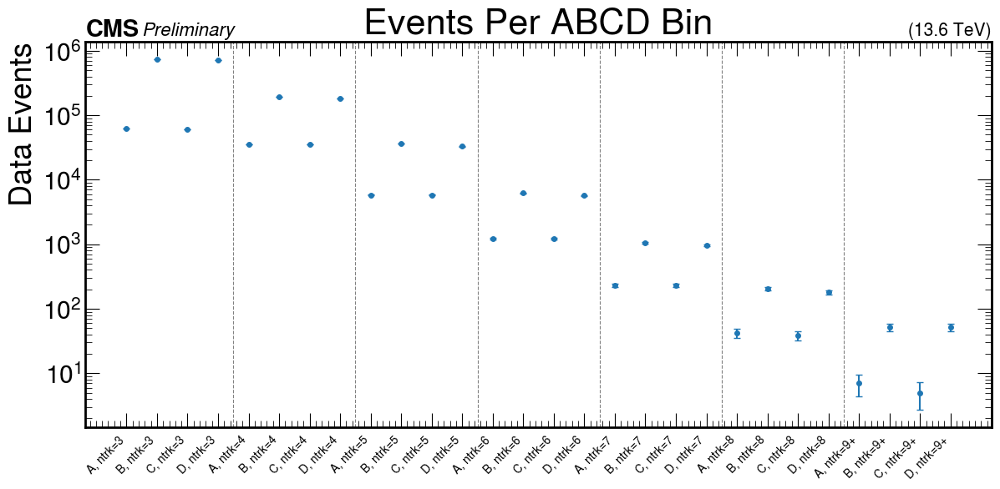

In [32]:
#Binned ABCD Number of Events Plot

# ABCD regions in (cosT, chi2):
#   A: cosT <= 0, chi2 >= 3  (fail both)
#   B: cosT <= 0, chi2 < 3   (pass chi2 only)
#   C: cosT > 0,  chi2 >= 3  (pass cosT only)
#   D: cosT > 0,  chi2 < 3   (signal region)
#
# Transfer factor: TF = B/A
# Prediction: D_pred = C * (B/A)
import matplotlib.ticker as ticker
NTRACK_BINS = [3, 4, 5, 6, 7, 8, "9+"]
ABCD_REGIONS = ["A", "B", "C", "D"]

def process_abcd_per_ntrack(args):
    rootFile, process = args
    print(f"Processing {rootFile}")

    # Initialize counts: {ntrk: {region: (sum_w, sum_w2)}}
    counts = {nt: {r: [0.0, 0.0] for r in ABCD_REGIONS} for nt in NTRACK_BINS}

    with uproot.open(rootFile) as file:
        tree = file["scoutingTree/objectTree"]
        branches = [
            "scoutVert_dBV", "scoutVert_dBVErr", "scoutVert_nTracks",
            "scoutVert_chi2", "scoutVert_cosT", "jet_pt", "uncorrectedWeight", "weight_PU_BCDEFGHI_nominal", "weight_trigger_nominal"
        ]

        for batch in tree.iterate(branches, library="ak", step_size=100000):
            weights = batch["uncorrectedWeight"] * batch["weight_PU_BCDEFGHI_nominal"] * batch["weight_trigger_nominal"] # event weights
            if(process in dataDict):
                weights = ak.ones_like(weights)
            dBV = batch["scoutVert_dBV"]
            dBVErr = batch["scoutVert_dBVErr"]
            ntracks = batch["scoutVert_nTracks"]
            chi2 = batch["scoutVert_chi2"]
            cosT = batch["scoutVert_cosT"]
            # Baseline vertex selection
            vtx_mask = (dBV > 0.01) & (dBV < 2.0) & (ntracks > 2) & (dBVErr < 0.005) #& (ntracks < 8)
            dBV = dBV[vtx_mask]
            ntracks = ntracks[vtx_mask]
            chi2 = chi2[vtx_mask]
            cosT = cosT[vtx_mask]

            # Keep events with at least one vertex passing baseline
            evt_mask = ak.num(dBV, axis=1) > 0
            weights = weights[evt_mask]
            ntracks = ntracks[evt_mask]
            chi2 = chi2[evt_mask]
            cosT = cosT[evt_mask]

            for nt in NTRACK_BINS:
                # Select vertices with exactly this track multiplicity
                # (or >= 8 for the inclusive bin)
                if nt == "9+":
                    nt_mask = ntracks >= 9
                else:
                    nt_mask = ntracks == nt

                nt_chi2 = chi2[nt_mask]
                nt_cosT = cosT[nt_mask]

                # ABCD masks (per vertex)
                pass_cosT = nt_cosT > 0
                pass_chi2 = nt_chi2 < 2.5

                region_masks = {
                    "A": ~pass_cosT & ~pass_chi2,
                    "B": ~pass_cosT & pass_chi2,
                    "C": pass_cosT & ~pass_chi2,
                    "D": pass_cosT & pass_chi2,
                }

                duplicateMask = ak.ones_like(weights, dtype=bool)
                for region in ["D","C","B","A"]:
                    rmask = region_masks[region]
                    # Event has at least one vertex in this region
                    evt_in_region = (ak.num(nt_cosT[rmask]) > 0) & duplicateMask
                    duplicateMask = duplicateMask & (~evt_in_region)
                    
                    w = weights[evt_in_region]
                    counts[nt][region][0] += float(ak.sum(w))
                    counts[nt][region][1] += float(ak.sum(w**2))
                    
                    
    return process, counts


def merge_counts(all_counts):
    """Merge counts across files for the same process."""
    merged = {}
    for process, counts in all_counts:
        if process not in merged:
            merged[process] = {nt: {r: [0.0, 0.0] for r in ABCD_REGIONS} for nt in NTRACK_BINS}
        for nt in NTRACK_BINS:
            for r in ABCD_REGIONS:
                merged[process][nt][r][0] += counts[nt][r][0]
                merged[process][nt][r][1] += counts[nt][r][1]
    return merged

# ============================================================
# Main
# ============================================================
if __name__ == "__main__":
    # --- Fill in your file dictionaries here ---
    # processDict = {"2024C": [...], "2024D": [...], ...}
    # signalDict = {"stop_M200_ctau10": [...], ...}

    run_dict = signalDict | dataDict

    # Parallel processing
    all_results = []
    with ProcessPoolExecutor(max_workers=16) as executor:
        futures = {
            executor.submit(process_abcd_per_ntrack, (f, p)): (f, p)
            for p, files in run_dict.items() for f in files
        }
        for future in as_completed(futures):
            all_results.append(future.result())

    merged = merge_counts(all_results)

    # Combine data eras
    combined = {nt: {r: [0.0, 0.0] for r in ABCD_REGIONS} for nt in NTRACK_BINS}
    data_eras = [k for k in merged if k.startswith("2024")]
    for era in data_eras:
        for nt in NTRACK_BINS:
            for r in ABCD_REGIONS:
                combined[nt][r][0] += merged[era][nt][r][0]
                combined[nt][r][1] += merged[era][nt][r][1]

    genWeightSumDict = {}
    for process, rootFiles in signalDict.items():
        genWeightSum = 0
        for rootFile in rootFiles:
            f = ROOT.TFile.Open(rootFile, "READ")
            h_genWeights = f.Get("triggerFilter/genWeightsSkim")
            n_binsSkim = h_genWeights.GetNbinsX() 
            genWeights = np.array([h_genWeights.GetBinContent(i) for i in range(1, n_binsSkim + 1)])
            genWeightSum += genWeights[0]
        genWeightSumDict[process] = genWeightSum

    #Reweighting Signal Events
    for process in signalDict.keys():
        if process in limitDict:
            currentLimit = limitDict[process]
        for nt in NTRACK_BINS:
            for r in ABCD_REGIONS:
                merged[process][nt][r][0] = merged[process][nt][r][0] / genWeightSumDict[process]
                merged[process][nt][r][0] = merged[process][nt][r][0] * currentLimit
                merged[process][nt][r][1] = merged[process][nt][r][1] / (genWeightSumDict[process]**2)
                merged[process][nt][r][1] = merged[process][nt][r][1] * (currentLimit**2)
    
    plt.style.use(hep.style.CMS)

    fig, ax = plt.subplots(figsize=(14, 6))

    # Build x-axis bin labels: "Region_Ntrk"
    bin_labels = []
    for nt in NTRACK_BINS:
        for r in ABCD_REGIONS:
            bin_labels.append(f"{r}, ntrk={nt}")

    x = np.arange(len(bin_labels))

    # Color cycle for signals
    colors = plt.cm.tab20.colors

    nEvents = []
    nEvents_errs = []

    for nt in NTRACK_BINS:
        for r in ABCD_REGIONS:
            d_w, d_w2 = combined[nt][r]
            nEvents.append(d_w)
            nEvents_errs.append(np.sqrt(d_w2) if d_w2 > 0 else 0.0)

    nEvents = np.array(nEvents)
    nEvents_errs = np.array(nEvents_errs)

    # Small horizontal offset so overlapping points are visible
    ax.errorbar(
        x, nEvents, yerr=nEvents_errs,
        fmt='o', markersize=4, capsize=3,
    )

    # Draw vertical lines to separate ntrack groups
    for i in range(1, len(NTRACK_BINS)):
        ax.axvline(x=i * len(ABCD_REGIONS) - 0.5, color='gray', ls='--', lw=0.8)

    ax.set_xticks(x)
    ax.set_xticklabels(bin_labels, rotation=45, ha='right', fontsize=10)
    ax.set_ylabel("Data Events")
    #ax.set_xlabel("ABCD Region, Track Multiplicity Bin")
    ax.set_yscale('log')
    ax.legend(fontsize=9, ncol=2, loc='best')
    ax.set_title("Events Per ABCD Bin")
    hep.cms.label("Preliminary", loc=0, ax=ax, com=13.6, fontsize=16,data=True)
    #fig.tight_layout()
    ax.yaxis.set_major_locator(ticker.LogLocator(numticks=999))
    ax.yaxis.set_minor_locator(ticker.LogLocator(numticks=999, subs="auto"))
    fig.savefig("nEvents_abcd_3to4dxy.pdf")
    fig.savefig("nEvents_abcd_3to4dxy.png", dpi=200)
    plt.show()